# ***Analyzing Yelp Reviews: An ETL and Data Analysis Approach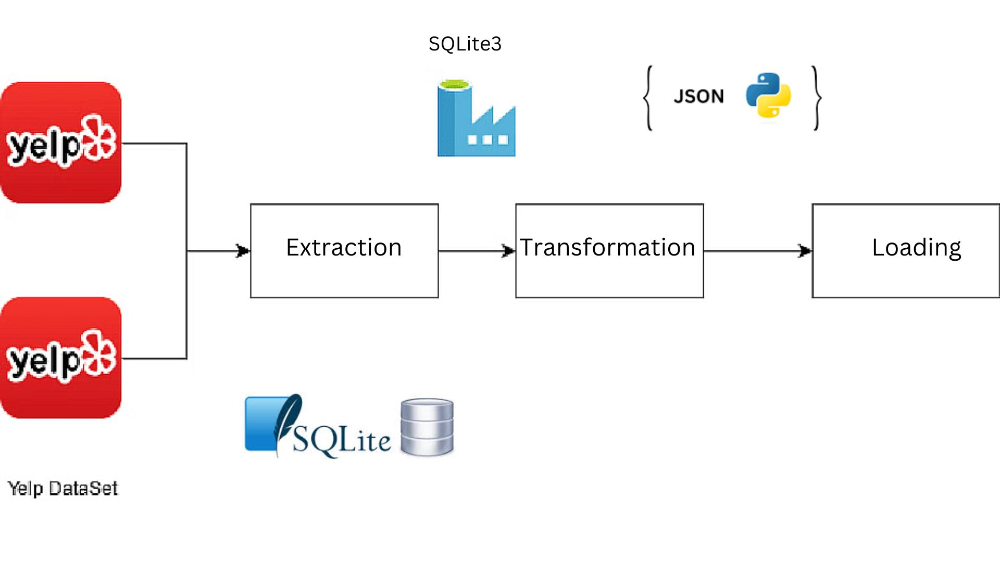***

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

Loading and exploring the JSON data in the notebook

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
print(os.listdir("/content/drive/MyDrive/Yelp_dataset/"))


['Dataset_User_Agreement.pdf', 'yelp_academic_dataset_business.json', 'yelp_academic_dataset_checkin.json', 'yelp_academic_dataset_review.json', 'yelp_academic_dataset_tip.json', 'yelp_academic_dataset_user.json']


In [ ]:
# Import necessary libraries
import pandas as pd

from google.colab import drive
drive.mount('/content/drive')

# Define file paths
# review_path = '/kaggle/input/yelp-dataset/yelp_academic_dataset_review.json'
# checkin_path = '/kaggle/input/yelp-dataset/yelp_academic_dataset_checkin.json'
# business_path = '/kaggle/input/yelp-dataset/yelp_academic_dataset_business.json'
# tip_path = '/kaggle/input/yelp-dataset/yelp_academic_dataset_tip.json'
# user_path = '/kaggle/input/yelp-dataset/yelp_academic_dataset_user.json'
review_path = '/content/drive/MyDrive/Yelp_dataset/yelp_academic_dataset_review.json'
checkin_path = '/content/drive/MyDrive/Yelp_dataset/yelp_academic_dataset_checkin.json'
business_path = '/content/drive/MyDrive/Yelp_dataset/yelp_academic_dataset_business.json'
tip_path = '/content/drive/MyDrive/Yelp_dataset/yelp_academic_dataset_tip.json'
user_path = '/content/drive/MyDrive/Yelp_dataset/yelp_academic_dataset_user.json'

# Load the data with chunksize for large files to avoid memory issues
chunksize = 50000  # Adjust based on memory availability
# Load a sample chunk to inspect the structure of the review data
review_chunk = pd.read_json(review_path, lines=True, chunksize=chunksize)
review_df = next(review_chunk)
print("Review Data Sample:")
display(review_df.head())
print("\nReview Data Columns:")
display(review_df.head())


# Load a sample chunk to inspect the structure of the check-in data
checkin_df = pd.read_json(checkin_path, lines=True)
print("\nCheck-in Data Sample:")
display(checkin_df.head())
print("\nCheck-in Data Columns:")
display(checkin_df.head())

# Load a sample chunk to inspect the structure of the business data
business_chunk = pd.read_json(business_path, lines=True, chunksize=chunksize)
business_df = next(business_chunk)
print("\nBusiness Data Sample:")
display(business_df.head())
print("\nBusiness Data Columns:")
display(business_df.head())

# Load the entire tip data (smaller file)
tip_df = pd.read_json(tip_path, lines=True)
print("\nTip Data Sample:")
display(tip_df.head())
print("\nTip Data Columns:")
display(tip_df.head())


# Load the entire user data (smaller file)
user_chunk = pd.read_json(user_path, lines=True, chunksize=chunksize)
user_df = next(user_chunk)
print("\nUser Data Sample:")
display(user_df.head())
print("\nUser Data Columns:")
display(user_df.head())
# Additional exploration
print("\nSummary of the Review DataFrame:")
display(review_df.head())

print("\nSummary of the Business DataFrame:")
display(business_df.head())



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Review Data Sample:


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11
1,BiTunyQ73aT9WBnpR9DZGw,OyoGAe7OKpv6SyGZT5g77Q,7ATYjTIgM3jUlt4UM3IypQ,5,1,0,1,I've taken a lot of spin classes over the year...,2012-01-03 15:28:18
2,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3,0,0,0,Family diner. Had the buffet. Eclectic assortm...,2014-02-05 20:30:30
3,AqPFMleE6RsU23_auESxiA,_7bHUi9Uuf5__HHc_Q8guQ,kxX2SOes4o-D3ZQBkiMRfA,5,1,0,1,"Wow! Yummy, different, delicious. Our favo...",2015-01-04 00:01:03
4,Sx8TMOWLNuJBWer-0pcmoA,bcjbaE6dDog4jkNY91ncLQ,e4Vwtrqf-wpJfwesgvdgxQ,4,1,0,1,Cute interior and owner (?) gave us tour of up...,2017-01-14 20:54:15



Review Data Columns:


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11
1,BiTunyQ73aT9WBnpR9DZGw,OyoGAe7OKpv6SyGZT5g77Q,7ATYjTIgM3jUlt4UM3IypQ,5,1,0,1,I've taken a lot of spin classes over the year...,2012-01-03 15:28:18
2,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3,0,0,0,Family diner. Had the buffet. Eclectic assortm...,2014-02-05 20:30:30
3,AqPFMleE6RsU23_auESxiA,_7bHUi9Uuf5__HHc_Q8guQ,kxX2SOes4o-D3ZQBkiMRfA,5,1,0,1,"Wow! Yummy, different, delicious. Our favo...",2015-01-04 00:01:03
4,Sx8TMOWLNuJBWer-0pcmoA,bcjbaE6dDog4jkNY91ncLQ,e4Vwtrqf-wpJfwesgvdgxQ,4,1,0,1,Cute interior and owner (?) gave us tour of up...,2017-01-14 20:54:15



Check-in Data Sample:


,business_id,date
0,---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020..."
1,--0iUa4sNDFiZFrAdIWhZQ,"2010-09-13 21:43:09, 2011-05-04 23:08:15, 2011..."
2,--30_8IhuyMHbSOcNWd6DQ,"2013-06-14 23:29:17, 2014-08-13 23:20:22"
3,--7PUidqRWpRSpXebiyxTg,"2011-02-15 17:12:00, 2011-07-28 02:46:10, 2012..."
4,--7jw19RH9JKXgFohspgQw,"2014-04-21 20:42:11, 2014-04-28 21:04:46, 2014..."



Check-in Data Columns:


,business_id,date
0,---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020..."
1,--0iUa4sNDFiZFrAdIWhZQ,"2010-09-13 21:43:09, 2011-05-04 23:08:15, 2011..."
2,--30_8IhuyMHbSOcNWd6DQ,"2013-06-14 23:29:17, 2014-08-13 23:20:22"
3,--7PUidqRWpRSpXebiyxTg,"2011-02-15 17:12:00, 2011-07-28 02:46:10, 2012..."
4,--7jw19RH9JKXgFohspgQw,"2014-04-21 20:42:11, 2014-04-28 21:04:46, 2014..."



Business Data Sample:


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."



Business Data Columns:


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."



Tip Data Sample:


,user_id,business_id,text,date,compliment_count
0,AGNUgVwnZUey3gcPCJ76iw,3uLgwr0qeCNMjKenHJwPGQ,Avengers time with the ladies.,2012-05-18 02:17:21,0
1,NBN4MgHP9D3cw--SnauTkA,QoezRbYQncpRqyrLH6Iqjg,They have lots of good deserts and tasty cuban...,2013-02-05 18:35:10,0
2,-copOvldyKh1qr-vzkDEvw,MYoRNLb5chwjQe3c_k37Gg,It's open even when you think it isn't,2013-08-18 00:56:08,0
3,FjMQVZjSqY8syIO-53KFKw,hV-bABTK-glh5wj31ps_Jw,Very decent fried chicken,2017-06-27 23:05:38,0
4,ld0AperBXk1h6UbqmM80zw,_uN0OudeJ3Zl_tf6nxg5ww,Appetizers.. platter special for lunch,2012-10-06 19:43:09,0



Tip Data Columns:


,user_id,business_id,text,date,compliment_count
0,AGNUgVwnZUey3gcPCJ76iw,3uLgwr0qeCNMjKenHJwPGQ,Avengers time with the ladies.,2012-05-18 02:17:21,0
1,NBN4MgHP9D3cw--SnauTkA,QoezRbYQncpRqyrLH6Iqjg,They have lots of good deserts and tasty cuban...,2013-02-05 18:35:10,0
2,-copOvldyKh1qr-vzkDEvw,MYoRNLb5chwjQe3c_k37Gg,It's open even when you think it isn't,2013-08-18 00:56:08,0
3,FjMQVZjSqY8syIO-53KFKw,hV-bABTK-glh5wj31ps_Jw,Very decent fried chicken,2017-06-27 23:05:38,0
4,ld0AperBXk1h6UbqmM80zw,_uN0OudeJ3Zl_tf6nxg5ww,Appetizers.. platter special for lunch,2012-10-06 19:43:09,0



User Data Sample:


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
0,qVc8ODYU5SZjKXVBgXdI7w,Walker,585,2007-01-25 16:47:26,7217,1259,5994,2007,"NSCy54eWehBJyZdG2iE84w, pe42u7DcCH2QmI81NX-8qA...",267,...,65,55,56,18,232,844,467,467,239,180
1,j14WgRoU_-2ZE1aw1dXrJg,Daniel,4333,2009-01-25 04:35:42,43091,13066,27281,"2009,2010,2011,2012,2013,2014,2015,2016,2017,2...","ueRPE0CX75ePGMqOFVj6IQ, 52oH4DrRvzzl8wh5UXyU0A...",3138,...,264,184,157,251,1847,7054,3131,3131,1521,1946
2,2WnXYQFK0hXEoTxPtV2zvg,Steph,665,2008-07-25 10:41:00,2086,1010,1003,"2009,2010,2011,2012,2013","LuO3Bn4f3rlhyHIaNfTlnA, j9B4XdHUhDfTKVecyWQgyA...",52,...,13,10,17,3,66,96,119,119,35,18
3,SZDeASXq7o05mMNLshsdIA,Gwen,224,2005-11-29 04:38:33,512,330,299,"2009,2010,2011","enx1vVPnfdNUdPho6PH_wg, 4wOcvMLtU6a9Lslggq74Vg...",28,...,4,1,6,2,12,16,26,26,10,9
4,hA5lMy-EnncsH4JoR-hFGQ,Karen,79,2007-01-05 19:40:59,29,15,7,,"PBK4q9KEEBHhFvSXCUirIw, 3FWPpM7KU1gXeOM_ZbYMbA...",1,...,1,0,0,0,1,1,0,0,0,0



User Data Columns:


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
0,qVc8ODYU5SZjKXVBgXdI7w,Walker,585,2007-01-25 16:47:26,7217,1259,5994,2007,"NSCy54eWehBJyZdG2iE84w, pe42u7DcCH2QmI81NX-8qA...",267,...,65,55,56,18,232,844,467,467,239,180
1,j14WgRoU_-2ZE1aw1dXrJg,Daniel,4333,2009-01-25 04:35:42,43091,13066,27281,"2009,2010,2011,2012,2013,2014,2015,2016,2017,2...","ueRPE0CX75ePGMqOFVj6IQ, 52oH4DrRvzzl8wh5UXyU0A...",3138,...,264,184,157,251,1847,7054,3131,3131,1521,1946
2,2WnXYQFK0hXEoTxPtV2zvg,Steph,665,2008-07-25 10:41:00,2086,1010,1003,"2009,2010,2011,2012,2013","LuO3Bn4f3rlhyHIaNfTlnA, j9B4XdHUhDfTKVecyWQgyA...",52,...,13,10,17,3,66,96,119,119,35,18
3,SZDeASXq7o05mMNLshsdIA,Gwen,224,2005-11-29 04:38:33,512,330,299,"2009,2010,2011","enx1vVPnfdNUdPho6PH_wg, 4wOcvMLtU6a9Lslggq74Vg...",28,...,4,1,6,2,12,16,26,26,10,9
4,hA5lMy-EnncsH4JoR-hFGQ,Karen,79,2007-01-05 19:40:59,29,15,7,,"PBK4q9KEEBHhFvSXCUirIw, 3FWPpM7KU1gXeOM_ZbYMbA...",1,...,1,0,0,0,1,1,0,0,0,0



Summary of the Review DataFrame:


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11
1,BiTunyQ73aT9WBnpR9DZGw,OyoGAe7OKpv6SyGZT5g77Q,7ATYjTIgM3jUlt4UM3IypQ,5,1,0,1,I've taken a lot of spin classes over the year...,2012-01-03 15:28:18
2,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3,0,0,0,Family diner. Had the buffet. Eclectic assortm...,2014-02-05 20:30:30
3,AqPFMleE6RsU23_auESxiA,_7bHUi9Uuf5__HHc_Q8guQ,kxX2SOes4o-D3ZQBkiMRfA,5,1,0,1,"Wow! Yummy, different, delicious. Our favo...",2015-01-04 00:01:03
4,Sx8TMOWLNuJBWer-0pcmoA,bcjbaE6dDog4jkNY91ncLQ,e4Vwtrqf-wpJfwesgvdgxQ,4,1,0,1,Cute interior and owner (?) gave us tour of up...,2017-01-14 20:54:15



Summary of the Business DataFrame:


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."


Converting JSON data to a Pandas DataFrame and further exploration

In [ ]:
import pandas as pd

# Define the file paths
review_path = '/content/drive/MyDrive/Yelp_dataset/yelp_academic_dataset_review.json'
checkin_path = '/content/drive/MyDrive/Yelp_dataset/yelp_academic_dataset_checkin.json'
business_path = '/content/drive/MyDrive/Yelp_dataset/yelp_academic_dataset_business.json'
tip_path = '/content/drive/MyDrive/Yelp_dataset/yelp_academic_dataset_tip.json'
user_path = '/content/drive/MyDrive/Yelp_dataset/yelp_academic_dataset_user.json'

# Define the chunk size
chunksize = 10000

# Incrementally process Review data
for i, review_chunk in enumerate(pd.read_json(review_path, lines=True, chunksize=chunksize)):
    print(f"\nProcessing Review Chunk {i+1}")
    # Perform any necessary processing here, e.g., checking missing values
    display(review_chunk.head())
    # Optionally save each chunk to a separate file (commented here)
    # review_chunk.to_csv(f'review_chunk_{i}.csv', index=False)
    del review_chunk  # Free memory after processing

# Similarly, load and process the Business data in chunks
for i, business_chunk in enumerate(pd.read_json(business_path, lines=True, chunksize=chunksize)):
    print(f"\nProcessing Business Chunk {i+1}")
    display(business_chunk.head())
    del business_chunk


# For smaller datasets, you can load them directly
checkin_df = pd.read_json(checkin_path, lines=True)
print("\nCheck-in DataFrame Loaded:")
display(checkin_df.head())

tip_df = pd.read_json(tip_path, lines=True)
print("\nTip DataFrame Loaded:")
display(tip_df.head())



# Process User data in chunks as well
for i, user_chunk in enumerate(pd.read_json(user_path, lines=True, chunksize=chunksize)):
    print(f"\nProcessing User Chunk {i+1}")
    display(user_chunk.head())
    del user_chunk



Processing Review Chunk 1


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11
1,BiTunyQ73aT9WBnpR9DZGw,OyoGAe7OKpv6SyGZT5g77Q,7ATYjTIgM3jUlt4UM3IypQ,5,1,0,1,I've taken a lot of spin classes over the year...,2012-01-03 15:28:18
2,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3,0,0,0,Family diner. Had the buffet. Eclectic assortm...,2014-02-05 20:30:30
3,AqPFMleE6RsU23_auESxiA,_7bHUi9Uuf5__HHc_Q8guQ,kxX2SOes4o-D3ZQBkiMRfA,5,1,0,1,"Wow! Yummy, different, delicious. Our favo...",2015-01-04 00:01:03
4,Sx8TMOWLNuJBWer-0pcmoA,bcjbaE6dDog4jkNY91ncLQ,e4Vwtrqf-wpJfwesgvdgxQ,4,1,0,1,Cute interior and owner (?) gave us tour of up...,2017-01-14 20:54:15



Processing Review Chunk 2


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
10000,aUTP_Euzq0ZTtkN3xf3yPQ,w5iiF7drL4mKBBO8oAUQqg,7lwe7n-Yc-V9E_HfLAeylg,4,1,0,0,"A nice neighborhood feel, but it isn't the fir...",2015-01-18 17:56:43
10001,ajrXyjMeMHDhfVkBPTpFSw,bUYcEqr9Lp1KEG_BWg2e8Q,GneLbZUn_GrzMz-GE6KfRg,5,0,0,0,WAWA is the go-to-guy of convenience stores. W...,2011-02-13 16:16:46
10002,W-bA32fvJLzv88exyG6nLw,OYe3S4XGtdlfjj6nxMRrAg,uO39--k_hrCFgZh-Bl8m8A,5,1,1,1,Oh my goodness. Imagine a hangry woman speed w...,2016-01-30 07:41:38
10003,rBST9t-8ZFOF3CjhvtscHQ,0u1hUugGxvzM_gEg8NT8Tg,7yPzOek7Af2dKWGYKpcHWA,4,1,0,0,Synopsis: Great LITTLE restaurant with friendl...,2013-05-07 17:53:19
10004,WSfTqe9k9JXLhLKzS8hZmQ,aZixAQG6m-dyGtJqm4Aphw,PY9GRfzr4nTZeINf346QOw,2,2,2,0,I spent this past 4th of July weekend @ the Pe...,2010-07-08 00:37:47



Processing Review Chunk 3


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
20000,y1ms55XoypPvBCAzJTTRxw,ORmds-VcRh70RWBFaDYVRw,_RwlMTw9uFeOkfX9Ctf1HA,4,0,0,0,Blue Claws can be pricey but phenomenal. Stick...,2013-08-17 01:37:19
20001,DGfwuHapBUDQN6cbch5oeQ,c8IXI-4nQjMIXIkrYKTWGA,34Eqv8jXgxg_EEwcsNgeeg,4,0,0,0,Amazing açaí bowls and breakfast bowls BUT tak...,2018-09-03 18:36:09
20002,2vrnm1nqC-0ylz4auzWZ7g,klaZ8hamyYIwHe_tYIssHA,JcP1z6eZBgTIcxWlyxSw0g,3,0,0,0,"I wanted to love it so bad, but it fell short ...",2014-04-20 14:52:30
20003,C4bVFbJrE0m5xOS7xJbS6A,sGmtesopv0rhACwsV6DjPw,CYwC5OjwCN6ib_AQDxi3Ow,1,0,0,0,Zack at the Goleta In N Out was very rude. He ...,2015-09-25 01:39:29
20004,WyVO3p7UybQ5-nzjUyEUkA,dgGUKdOh2a01OwLw1qgfDw,RWY-NtTfOdphkgcS9RL5ZQ,3,0,0,0,"I drove out of my way to go to Subway, but the...",2014-08-11 17:48:45



Processing Review Chunk 4


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
30000,3g2H3grOcCEngesXkaZ6yA,vBO5OY159gfFpeZtSs4dlw,D22mY6Lmf_32hh5-ESXFPw,5,2,0,1,This place is fantastic. I was apprehensive (a...,2013-08-18 03:13:06
30001,Qwzoc0Ia6R1HacUrhRXW0A,Ont-hQG8TG5LTN29KAUvvA,Ugoyu-TIppruxRTkbej3lA,1,1,0,0,I did not enjoy my food here. The fish was fri...,2014-04-03 14:48:37
30002,pnA8yxQy667hQTgo4UX9xg,RR02_O9e5rPzruTUGWt9Ag,4WdDY97x4GdMYtyk1KQMnw,4,0,0,0,The pho is EXCELLENT and so is the service...b...,2012-12-06 22:40:41
30003,5qCgw8hLa23OYzUpM7XJ2g,eBH9-CdtLcOQ6Znp7VQVJQ,NFFS6Qow43IRG6dRPgZCzQ,4,1,0,1,Cafe deluxe was awesome. This used to be a lau...,2014-12-01 06:07:08
30004,CjG3j36PWWmgimsapqCRBw,ZHnn0Foz304q6bGwQP_0uA,cB_9eHHfo9me96cZup-lZQ,5,5,3,4,I recently stayed at The Saint with my sister ...,2016-12-08 03:09:44



Processing Review Chunk 5


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
40000,zwu3HkuLQW0udgNb43e-dw,CigyryBCd5GFc01FnXvgcQ,u7_3L1NBWgxhBM_B-cmmnA,4,5,0,2,I was unexpectedly surprised with how much I l...,2017-08-20 00:54:11
40001,2TkFR7TG8TUzfCMP1oiwJQ,PWVL8fYmjBHqoyjt6LIcpA,vN6v8m4DO45Z4pp8yxxF_w,4,0,0,0,"It was a wait,but worth it I enjoy every bite\...",2012-09-14 12:51:37
40002,K0Pk9F7jLA2lUDhT3gOfhA,WOvvoy7F7t1cZ3BUcMbISw,uY7um5bWKhiVwzL0wakJXA,1,0,0,0,This place has gone downhill. Extremely slow s...,2016-10-16 13:17:42
40003,clSTQLuLu11UhwSPKEtToA,pTw5mqWvjJzbe23GTFnwSg,ltBBYdNzkeKdCNPDAsxwAA,5,0,0,0,"Excellent service, has air conditioning which ...",2018-05-11 21:48:59
40004,kBuiwIzGu_4G3VXNfH3Bow,w4he3nb2wQI5h5rTbCaqXA,OINbC0rpDVJ5bfxt3LO9fw,4,0,0,0,"Came here for Sunday brunch, of course the pla...",2016-08-28 16:46:50



Processing Review Chunk 6


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
50000,G16hQXpXMfiodPlsrLCnLw,KMHJzzjR_o2_2vnAnj7vRQ,eqNutOMnPqKa9QDAY6KfEw,5,0,0,0,I'm from out of town and stumbled upon this lo...,2018-05-30 18:01:17
50001,nZEI_2Qde8jC_bOtPL5YMw,xEcEGJSkIuC2367TsKtesw,-2bLM6nIETD4Mk-rhjIYZQ,5,0,0,0,Best corn ever! Taste great and always fresh f...,2018-07-28 13:32:39
50002,AFmym_JEhxliJhWhx_TRxQ,LqHxsYPcMKkSEVwt-99j6g,qS4CaO_u_vMrTl31XJto1A,1,0,0,0,Very disappointed in our order tonight always ...,2016-10-29 23:24:29
50003,uETpSQ_TPdL3SQBOOL172g,2deXzjoIkP2vww-ETRIpOw,f8GG-nvuzMpcGIs3cbKUkw,5,0,0,1,We finally tried this place out. Wow! We shou...,2012-04-03 02:18:42
50004,urBdwmGkvDj2S8bFPhQiHQ,m0g8tdSJntizTBFXgOVxcw,2W0P6hXCbE6EgP5R6y9eBw,4,1,0,1,"I was looking for a pizza place downtown, this...",2016-12-05 22:04:14



Processing Review Chunk 7


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
60000,ao78virbOoMe9T5Nnl6doA,kLvbE0Axl3qECFr9Cc5amA,cX1VH_vpqGoLrio4sV9xcA,3,0,0,0,"Good quality food, but you have to pay for it....",2014-09-29 12:39:19
60001,hjwBLUkYIw0adSom0HeWUg,FLSivFDh43JhCqzz03tXDQ,hY4HdV8dmNdTp0Fc1bL6lQ,5,1,0,0,Well is has been over 3 years since my last re...,2016-12-22 04:34:16
60002,zW9GKEr4f2R-IzraaJ5LAw,aJkDBEc9kVjQHIdrC1h0TA,vxOTFVezyI1R5fgnNkiFHQ,5,1,0,0,"I absolutely love, love, love, love this store...",2011-10-03 21:16:46
60003,rpirieyq9ay5NXnd-qp2eg,sKutRfmpedPpFeDfHtLrow,AzseSGgDC6bVtMPEYo1CNQ,5,0,0,0,We were visiting New Orleans this past weekend...,2015-10-26 21:25:22
60004,1CZKl3_PPJwW6_Em7kHHuA,oRnKFeHGJeUtp4W0fLAVYg,uamAUnL4ox5uXvjquY9wLg,3,0,0,0,A co-worker and I stopped by here last week on...,2016-06-26 10:29:47



Processing Review Chunk 8


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
70000,O0mD87keM2nVIvVFMqNUtw,zLyDgDAfdjITmSeXGUtNRw,orXtmu7JLqVy9LatRd49Sw,1,0,0,0,Still waiting for an oil change. It has been a...,2018-01-23 23:17:12
70001,Jy87HFEVFeTaKAvYc4kPrA,yWP994Krdcga9ZB5Kh1krQ,tlhv-IT6zokg78sG9t3mWw,4,0,0,1,Nice new location. They have a good selection ...,2013-12-31 19:24:27
70002,kcvWVs40dcHngr6PfuDAQQ,YizMjj0Y1WhW32m9sYMzcQ,8uF-bhJFgT4Tn6DTb27viA,4,0,0,0,Planned a trip to NoLa and while on the search...,2016-01-18 23:32:34
70003,5e7TbXEi66Xc3qeEnu74fA,49KqwNxDCfqds8yZdy6KGQ,Uy0r4bzRmY5LFtDfzNgkag,4,0,0,0,Great food and service. Can't imagine it gets ...,2015-07-19 18:24:00
70004,tebhIHbpzvEHmM2DFHNFTg,XsZXxmWNEBSE2FRJ6cRIpw,qf4LecJDQWIt0gt6VJWFPw,4,3,0,1,"Great, awesome, incredible steak! Salad was f...",2015-03-06 22:51:56



Processing Review Chunk 9


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
80000,vJNKwT5qO9uWI_tZr_Lr4A,_JCaRjLKQrTy1wdkk6ROpw,MMRRS6YhVRx_iN5-JhMRYg,4,0,0,0,I actually didn't know that this restaurant wa...,2018-03-04 22:59:27
80001,RT2JFQu_xpOQxcyzjnhN2w,JM2PVRrNAXTtHVT5Nbo3jg,3ZynJ94VpIdDlaArmEp2Rg,4,0,0,0,More than Just Ice Cream is a pretty good ice ...,2007-06-10 00:46:56
80002,htznGY4Kl52tL1j46DBoVQ,6i7XsIdjmExkLJJ8RggRyg,dpwkz52tHB2MCPv53I2aRA,5,3,2,0,This place is fantastic - my wife and I love ...,2011-08-27 00:22:44
80003,bkwHgU8zLc60GbcDew1ptQ,BV0WhBdu1oWkdRGSGjRg2g,3wogQmKw729tKKWaVbZvbg,4,3,0,0,"They advertise themselves as\n""Authentic Creol...",2017-05-02 20:09:15
80004,1uWntryYJc0lLBI2kAEqpg,8oQJlL1nJYG4q4rNUGB1YQ,pAgtmlIGqFYaWdBoCUeitw,3,0,1,0,The location is wonderful for visiting Vanderb...,2013-08-18 17:17:21



Processing Review Chunk 10


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
90000,LwXDvUFaGKhiXS3J7LGqdw,0BJhyLAOyjcV0Z7f0baH4g,-zsvmEbkd-K9K2DAAKqiEQ,5,0,0,0,My Husband and I had our wedding reception her...,2017-01-29 22:50:35
90001,R4M-GznjKJrMIIqLeDGxrQ,3H6Ns9iLbZgq28s5UO_FNA,S2Ho8yLxhKAa26pBAm6rxA,5,0,0,0,"This was the best breakfast ever in NOLO, wait...",2018-08-25 17:50:05
90002,u9vsOtlHVoXNWlUkkuZhdg,6n8sqPYayq3PVmrjX3m1Vg,mLNSOU8Ki0Fm09xd6ZKkcA,1,0,0,0,"This restaurant is a complete bait and switch,...",2017-12-17 21:04:47
90003,1E7uMboarmmc_5RCecsp3w,3zENaEnYWQVuOHNr-XGHwA,P61ecBVVPgBm-zH_SYq8FA,2,2,0,0,Where to begin. First off they don't tell you...,2017-11-19 19:48:30
90004,_m6Bn9IP4XaJF48ICy9www,4v0xoK8FBWOop3ljmPLDPQ,F8yozE3NWnImNApHO347gQ,5,0,0,0,Marrakesh is an amazing experience and unique ...,2018-02-12 17:48:48



Processing Review Chunk 11


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
100000,bwaSF4fYDBgyls0MBVcuOw,ZvmZM7LBzaYbpznpHlTANA,lmgCjE_h9VkpJYjsD2Li0A,3,0,0,0,"Why 3 stars?\n\nI love Target, but here is jus...",2018-05-02 12:31:05
100001,nyAaYpT3zrFdzQEiI1lf_g,kdfnlAi3VPqAw64REgJh7w,EDjEVzmoQVHzboFqC-M6Ew,4,2,0,2,The Local Taco is the first joint I've found i...,2011-03-29 04:44:08
100002,hOl6MoudNRyeK7iC8V_UvA,UMS5obm9Gwr7AyfvEJyhkw,fGYnHzFr1z2kv7bPRW6VMA,5,0,1,0,Top notch! He will cater our wedding and Fran...,2014-10-02 11:32:33
100003,VnVU0FtwvQtOHcB9unmVtg,9a0US1vaEBiQlMl2j2vmrg,7EhTT4iEuA7JaaWA-eI3Qw,5,1,0,1,Best place to get a vietnamese sandwich and bo...,2015-04-20 14:30:49
100004,vL2pkx9P-QS7PaPeufpaSg,a6xJIRlwDKmosaip9ZQ1OQ,s_iBdCSstqS6oyc_gHezFQ,4,0,0,0,This is more like a 3 1/2 star rating. The foo...,2012-07-21 23:02:43



Processing Review Chunk 12


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
110000,V0f5JfPmhGSpG579NwV44Q,N7s3Vdp4gwxUgJl2nQ4ekQ,IH_ZeeTh13jQURbh31d1Kw,5,1,0,1,"Bui's is legit, I always get the breakfast san...",2017-05-29 16:17:11
110001,HKlzEE0a32aXvJ-4tX0NDQ,XuhpPK0bZgVenkGBh7KA6w,n-iPn34tLaqnq-dI8m8Bkw,3,0,0,0,Better this time around. We went earlier befor...,2016-03-09 16:22:25
110002,vTmegR3bbCh5rya4lLfI2g,4iLviwoGLl4HXkSVm5QLAA,wHicEIN-xE-uZD_JoyrzTQ,5,1,0,0,"A very nice 3 star hotel, reasonably priced an...",2012-05-10 13:32:22
110003,622Ttp7wnmUdgBn5ldDwwA,3_5-eedwv4ZovOwYWfOfJQ,tUDZnYQe7aD2VU3Syia_RQ,4,0,0,1,I was there today with some friends for the Fi...,2018-04-07 22:06:05
110004,vN67XFJDbF5TUfysiBKrMw,4x37rz46RiV7n1pMx2Icmw,V6Om7YZhlRQRU7WfuxHq8Q,5,0,0,0,As we were walking thru the Reading Market we ...,2017-11-10 21:40:44



Processing Review Chunk 13


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
120000,9S64t-ITHo-hNlJjGfIwuA,PssOidTS69z5ciMjNCjPww,tP6tk-M8y09QKIoOO0JIbw,5,0,0,0,My only mistake about coming to shark tales is...,2015-05-29 19:44:26
120001,9ZO386nfHdRak6TbLxptaA,WqHtYtT9NgDS_OkipGwT6Q,0cB1kDuZCvSwpJrNdtQP8Q,5,0,0,0,It was shopping first then dinner/OMG!!! Best ...,2017-11-08 23:10:13
120002,2xGsqnnhU0AKW5bY_mqKwA,YdCNoTICNI-cPZovo2BCUw,EKbb62ui8LgHk3B7OJMyBw,5,0,0,0,We arrived without reservations we were greete...,2018-02-25 19:35:53
120003,b0eHSJ5_IwpX2uQrsCCltg,hof0egGfooFnQOSPscC7vA,m1XtvXqnqKgZvgKB8uYKIw,1,2,0,0,After helping my cousin plan her perfect weddi...,2015-08-31 20:42:30
120004,LL3wobTlOZFv-iYEgEky4A,-WGL-O64yr4VVNyzGFyT2g,4Hyfm0Ly3yo96RJTVShTIA,4,0,0,0,Made our first visit to Texas Roadhouse last S...,2015-05-03 06:03:10



Processing Review Chunk 14


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
130000,WpSHLZYXzJ8u85ebhUnKuA,NwFW54Bdlf99kCMaWRG1kw,hn3Rg2JrhQoDJBEhrpuwWg,1,1,0,0,I was very disappointed with this restaurant. ...,2018-08-09 01:30:17
130001,55edTEsGrL2gGgiOaSnL1g,dBTkbILURRXXXf_hCJ1B5w,MUTTqe8uqyMdBl186RmNeA,4,0,0,0,I've been here twice so far. Pretty positive e...,2018-06-02 17:18:03
130002,_RIf5VgwYKapXzFKnlqr-g,oi4VcPi4xWCYR_k2qkJncQ,uaKXyCNVXWdfOOdbM88pMA,5,4,0,3,This is a small family owned and operated rest...,2010-12-14 17:09:33
130003,vzuCPEDYCPdpBR82W8Dufw,k8-FEygvOGPhxqdku31nVw,fl1V5HkY4zazYGv8lG0-YQ,5,0,0,0,Bought my sewing machine here. Service is awes...,2017-02-01 18:15:34
130004,EJsncRDtz3eZTC8cE6Bfhw,RA66D57tDazUsyqLh0pgCw,Q_Wo3rX84Dy-YdQsiDmrWw,5,1,0,0,One of my favorite spots to see music in New O...,2012-03-16 13:36:16



Processing Review Chunk 15


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
140000,a8tdU5sgrQz81brRNqt0Zg,vffKQc_WQMYFGY4JS5VAOw,C1QkJ4s_p3hMTrvOgM7ssA,4,0,0,0,"Very tasty smoothies, although they are pricey...",2016-05-13 20:08:42
140001,uV38kWIIMWzvzxc52B9Aig,WJhWqx-8jGf7E64L5sFaag,cXAKeC-EgVChIxhS7fscmw,4,0,0,0,The Pain Bagna is the best sandwich I've had i...,2011-12-11 03:44:59
140002,PxYJOEVr2Rpb98S4ffs60A,8C5qCyxG_vz2vagmCqG3WA,bxfTTZ2huLXi5EuEiwWTTw,2,1,0,0,Three times now I have had the wrong sale pric...,2010-12-15 13:56:01
140003,FJMhXVWfuYprjK41VF1m5A,AUOHUEAkHOGPQnAg_bN_Og,GW0LA9nuTkfsaXhxa8txTQ,5,0,0,0,Just visited here to pick a few things up (I'm...,2016-08-09 01:48:25
140004,-BkL1qy5572dGJ5kJxSVZg,nlsxDX6nKcVDGWzVxdsWiQ,lj-E32x9_FA7GmUrBGBEWg,4,1,1,1,Brio's has always been one of my Grandma's fav...,2009-11-20 16:19:53



Processing Review Chunk 16


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
150000,EGur4Zepuqb0EHiI9PsMuQ,5l83SrNyEylo5AhHM2dv9Q,vUrTGX_7HxqeoQ_6QCVz6g,5,0,0,0,Awesome for Philly to have such a delicious an...,2018-01-28 20:32:57
150001,pVrDxVf2gr4i90DcpxSu7A,wXdbkFZsfDR7utJvbWElyA,XX2PSfT4xuHq0yuoPIge1A,5,0,0,0,This is the third of the 5 local (soon to be 6...,2018-03-03 11:15:52
150002,tkrD0V2SPAUi7BGBJ5cCZA,QWbqFXj_Tx_tc98AFTYkQA,CKgsvMxnFVoph6IluQevWg,5,0,0,0,I am from New York. The hand tossed pizza at M...,2016-02-08 04:33:32
150003,yRVOJluGeb5sBnCXN0K80A,w7oU_1aKc1rluXIOhtV2wA,tQ6VNQ9ezkxRE4bvu9WShQ,1,0,0,0,We were greeted fast. It went downhill from t...,2014-07-23 02:30:52
150004,8xz9wueeuC6rVgDorKoUOA,GXfHd3ZuJZ8E7YYwD0cyUg,JUlsvVAvZvGHWFfkKm0nlg,5,3,0,2,This restaurant is located right across from P...,2016-02-06 23:27:30



Processing Review Chunk 17


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
160000,1NpcU5jLrtA9vOtMQ8nNIA,a4C60KyabRwYlL-kjLgFkw,n1i7yciuoS2_6_g7ix9jlQ,4,1,0,0,Great people own this wonderful little restaur...,2014-04-30 23:28:03
160001,YJKAPBjnNy1PmFOgzaIe2Q,z-mS3u-p3ydQKDzFIoxMBw,WfZ7KkYL1eIO3ZrNeASYJw,4,0,0,0,Great produce and one of the best hoagie and d...,2014-12-22 03:43:50
160002,pHeLe-7wMQZmN29Miytj1A,8BoCOMr-1Twd9fpW9WFbqA,fEdDmhp6MQhuPF-iVLcmEw,5,2,2,3,Was very pleased with this place last night. W...,2015-07-09 14:31:10
160003,na27kZyKjq3RanJtcXiTnw,qzETM0kSeeAPinhEKMG2JQ,PY9GRfzr4nTZeINf346QOw,5,0,0,0,I've stayed in a couple of the spa suite 1/2 a...,2012-07-03 15:13:54
160004,qBm4-QxXe17wehdcg_YKyw,i84YDhPbxtq9F8ipmtR5vg,uE40984_YDgVvPeRpFcCaQ,5,2,0,0,"The South comes over to the West side, and I'v...",2014-02-12 03:21:25



Processing Review Chunk 18


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
170000,bu1O5XYGueDODa9tKAv7Fg,1QFafGQUqxglX2K5trOcEg,pP1V9AvK716BMxoHkNVWdw,5,0,0,0,I love this little place. Their paleo and glut...,2018-05-23 23:04:28
170001,ELasllo1tbaMBv82voggrg,TwblAqyQMVOR0S0GaebV7g,ljxNT9p0y7YMPx0fcNBGig,2,1,0,0,Been here twice....first time was Valentine's ...,2015-05-04 23:48:34
170002,dfa6jU_VwDyg3URMLxjikg,zNIDhjX8DXtvKBiBZAshBw,E-DcL1u330qwvoxXhipmUQ,4,2,1,1,Made my annual road trip to Philly today to ca...,2014-07-06 01:43:14
170003,GWW2lQgWSOwu4xB8CH8m0w,H2DNqyt2CR5a8Gv3Jisqhg,thCbLZ69suCvVNr4gPQU1Q,5,0,0,0,My experience is limited to a large reception ...,2013-09-24 02:58:54
170004,TqlOdABR3--RtmB_WT4g5Q,op6v0-x22gXj6zST_QNuPg,kJputVxFc4-tvwTI6MVm3g,3,0,0,0,4 and 5 stars is tough 5 is excellent! \nMy f...,2016-05-25 22:32:36



Processing Review Chunk 19


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
180000,sM5l4X4CFYq686lK_pU9qw,GUG6OzvPFsJjOFVy61LCtw,CA5BOxKRDPGJgdUQ8OUOpw,4,2,2,1,"A wonderful renovated space. Very warm,quiet a...",2014-12-10 15:44:44
180001,3kM2pog52tmfL6tQSb28mw,SRpKDi_XWM95LpUulg7xbA,bwvtrA-hiZU_qdgMYKpToQ,5,1,0,0,Just moved to NOLA and needed to find new groo...,2017-07-27 01:23:42
180002,bohnDiD-7yn1Is_8e28pZg,no3k_ijCQ7GiE7uE__tLdA,wnjFEC-w0qWnyDnO8k1RpA,5,0,0,0,Just in Nashville near the airport on business...,2018-04-11 01:04:13
180003,3VSrfBrkwOTcknzL8hRh2w,bKGQuThoqBkeTqu3PsNp2g,k8cv3Hnu69lGuf0mo1MOTQ,4,0,0,0,Had Cajun chicken sandwich which was fine and ...,2015-01-01 17:20:57
180004,j-a00a0OqRsPdW3u7_bqYA,0HK-BPV0H9d02SrGpEe3CQ,sjueAFshWHWkKn5a1AymuQ,4,0,0,0,"Great food. The chips & salsa were awesome, su...",2018-04-22 19:39:23



Processing Review Chunk 20


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
190000,KmGz5Qz6-l_Wh3LOWvS0RQ,xbIU6pOYrN7UcbtVgQM2LA,D2kZP7jvrWTuRzcPY6NbqA,4,0,0,0,Reminds me of the NJ diners back home! Friend...,2016-05-17 15:40:05
190001,70EeqJFaCFEwtzzBLJjRWQ,uewCWlaOBeIgnOoJulc-OA,H3yoQNhw-AfdLIwScR1zXg,4,0,0,0,"I came to DiVino wine bar, just south of Ritte...",2009-12-09 00:20:34
190002,vNYBhbCxJvi8HQR33p2Mow,w2Qtn2eq7eEaJoKUdqquQQ,GqQSFMLaM25zcM5OnCWnnQ,5,0,0,0,Plain and simple: Joe makes wonderful espresso...,2015-09-09 05:16:27
190003,vOXVJ7ydx0YuqkUYUoak5Q,UaiPgl-P_elvN7BaEkuyUg,AzseSGgDC6bVtMPEYo1CNQ,5,0,0,0,Great variety of flavors and all are delicious...,2015-05-21 16:14:41
190004,ZLwxYoXKOfk4FybP2pRW2w,LkXNQQaIc5yrKu9Ap87RrA,DTIKGgzoKGLCNw2dNKfHZg,4,1,1,0,We headed downtown with an idea of going to Da...,2013-11-30 07:40:23



Processing Review Chunk 21


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
200000,1IEzEH_J7TH21fKFdfxlNQ,345cM-IMsRDwutYG-AkJNw,LHSTtnW3YHCeUkRDGyJOyw,5,6,0,3,"Great craft beers, great fresh food. Small me...",2015-04-12 00:20:02
200001,T2fSdeY5PiEWKpLuNfGuIQ,bpgKKIpdAmtqdzJT5X3xRw,v5kwdvmg-J8g-ll0nkc3Sw,5,0,0,0,Establishments like The Libertine remind me th...,2013-05-23 18:27:42
200002,dVtQ7aQ0vp4VNL-BxN2XtQ,vq9TI11JinsJuRVXhJZ4gw,gGCIGJcKWoPC9xZNDeX3pA,4,0,0,1,"A sub is a sub is a sub, but not when it's Eeg...",2012-03-15 18:26:47
200003,6BxXel97olHZHv_o8F62pw,fEptE7AEC2GQqHJjfzh0qA,F8yozE3NWnImNApHO347gQ,4,0,0,0,I went for my birthday in oct. I had a large g...,2017-01-11 23:01:18
200004,_u5vDb3RLkIMZ4X1DCxRAg,NfjcPbXlhqVWBRPFL9vs3g,pFnoqSPstZKsnyeNBIeuZg,5,1,0,0,The food here is soooooooo good! I have walked...,2017-06-25 03:32:25



Processing Review Chunk 22


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
210000,0eXTgSwujOmGZovcaM5-Cg,Ak12dDE0N-IQvPZ0_E07SA,_bwVnlSMdFTdwskc7WMQOQ,1,1,1,0,I took in a Kate Spade dress to be altered and...,2014-07-02 18:03:57
210001,HB6kO2EKANWvNqy7vygRqg,eVWgnIaMMelbcIzydSqWMA,uE40984_YDgVvPeRpFcCaQ,5,3,1,1,Sometimes you just wanna throw on elastic wais...,2014-02-12 16:25:54
210002,x_A3LvVpoby6JahuORiiig,U631LMGO5E3GxVJt535dHA,Tq5jFk_BMSJG8-flqj5Bgw,5,2,0,0,Went here for the first time with friends last...,2011-03-30 15:11:00
210003,ZndKsq_4Mqp-jjfrOgP9SA,8kQlAv7-961DN6Gxqw1epQ,yWx7-4lHvyT0TpIO7pLA3Q,4,1,0,0,For my 30th birthday I wanted to do something ...,2018-05-04 03:01:18
210004,vfHQoMw7y2N1JtEKQhUBvg,K6jxeMoPDzX12LqojshyUw,s8PLThZ8tIe16NWjcwQbBg,5,1,0,0,Great beer in a comfortable place. This is not...,2016-05-27 13:22:36



Processing Review Chunk 23


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
220000,iJF4yx0hX8XSFfh-uDSvFw,RabnfDULORq2priScq_4yQ,0JoB3ThhI-DS78-1Ks1EUQ,1,0,0,0,This is the second time I have eaten here. The...,2016-01-28 17:21:42
220001,0q6bE1ORBgGdbu1cMCtsJA,1jqvurBtyB_fz2af7WyKTQ,NFFS6Qow43IRG6dRPgZCzQ,4,0,0,0,Great food if you're trying to eat healthy or ...,2016-01-29 18:26:16
220002,dgBL_qcAwbRtzya4m6BC3A,mdqgd33zvaJYwO0WN3cVQw,EpREWeEpmR8f1qLHzzF0AA,4,0,0,0,"I used to love this place. Really, Schlafly si...",2011-07-24 00:51:42
220003,sEdWo6eds3FvbQR4618akw,ia8Bk8PPhYfu3RMpWsjYdQ,WWnRdTjwaTnsLSJX95j-Zw,4,1,0,0,It is easy for a taco joint to get lazy. Habl...,2016-09-05 23:40:35
220004,1MimpygbTN39a7q61QoMLA,YIvLWPY9JAQ4S9-ES9VlmA,gC8i-lxwvGhVpOXM5eYdtA,5,0,0,0,Best tacos I've ever had! I get the chicken an...,2017-09-17 23:21:28



Processing Review Chunk 24


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
230000,Ro9FEWFRE-w8GQ-wzZw3gA,6FYsMPOhZYCsj1Lr2KTmcQ,GBTPC53ZrG1ZBY3DT8Mbcw,5,1,0,0,2 words Happy Hour! Calvin will shuck you som...,2014-02-18 23:31:47
230001,Z_ZF5T54Hjl5F5BJsUG_cg,3CY5mpkmp7nCCDlSfhZEsw,lTlii3QHEVvsagPGsCtu9w,1,0,0,0,We just had dinner here at the suggestion of f...,2013-03-10 00:14:25
230002,PRSGIrWc5YTM6LEbelSHPw,DqylrL4VCkKWsHFgWOWgfA,vN6v8m4DO45Z4pp8yxxF_w,5,0,0,0,Had the best shrimp & grits of my life over he...,2015-02-22 17:39:25
230003,MWKdzd2qlzJCVlEvAF6icg,JQ6zURXabBGlVMe_vnRNvA,H-1qpp_77KggOAr9htUrEw,5,0,0,0,First time here to many choices in the menu. H...,2016-10-20 05:25:41
230004,dif4RreyAYrIBzrO-hMqcw,ddlh4lnpFeKHIpjUHKLuWg,gUyfJlJRxu1fHuZ4dpBheQ,5,2,0,0,I had lunch today at Santa Fe and was really b...,2013-07-04 21:45:05



Processing Review Chunk 25


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
240000,Wja5VN1iF_h5YHwlk7Zr9g,O0BBNiwZAO08C1GMwHCceA,18eWJFJbXyR9j_5xfcRLYA,4,2,0,0,A large group of us had been at the beach all ...,2009-07-07 14:19:33
240001,Xz6W6_RDbrv0708EHPQU5Q,KDewJBJknfWvQyHHFNbfdg,ioxgFKdqjRowAj4dFM7VoA,4,22,14,16,Don't fret TaTa Cuban... the fact that David B...,2010-07-26 20:16:16
240002,S_hS36aItgTPZGH_vkKNPg,BecOgfZ8twnV0zNvTQEC4g,x6ByESFVanIYcomQsXQYGw,5,0,0,0,Got my hair cut & colored by Kaleigh Nickerson...,2013-08-25 23:19:57
240003,WPN3n55FceL-VfPYOHzIbw,udX-4cr1OLgwa8C-xMgg4Q,-Fka99c-tJ-epWYNIobqyQ,1,1,3,0,"Nasty pizza, rude waiter. I wouldn't feed what...",2012-07-13 23:24:03
240004,qR0vLv0At5vY0Ht-LOaapg,aDnysJUwfMtMFUH5BmYNZw,4WdDY97x4GdMYtyk1KQMnw,5,1,0,1,Some of the best Vietnamese food in the city. ...,2017-02-18 02:09:50



Processing Review Chunk 26


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
250000,HrpkU2y34cMFDLjL9_EqNw,h2mIYTyey91_vVXAYxFyRQ,VOGWnQHijIpURf4eNSvIaw,4,0,0,0,Hibachi and Sushi was fresh and very good for ...,2017-09-15 16:19:26
250001,5-vAMP_Mr0QpXvqE5KmwSg,Oy_9LMskBzsrblFJ3n4YSg,uBDXcXlLR9IuRV1N2m0SPQ,5,0,0,0,We popped in before our run to Trader Joe's (w...,2018-05-26 19:35:39
250002,2FQltWUkA_wcNTwdYrT9DA,A3PC4ZmfH20fXeQcxNiVQw,-mq1DwgcLU96PQbmcv3jRQ,4,1,0,0,Great restaurant! A must-stop if you're in IR...,2012-07-09 19:55:00
250003,bdTnkYNfSX9frFDN8KYk4Q,uQGZjgALpl5ldlc9VvtBSg,jmwasbZfgj3honf79qKsnA,5,0,0,0,Best fast tacos in town! Delicious ingredients...,2018-02-16 19:49:38
250004,JQTa0qQMDmUOFH6XR6I6NA,bHVK4udeLwCreFJd4jtPgg,yE1raqkLX7OZsjmX3qKIKg,3,0,0,0,Great decor and service. The Brussels sprouts ...,2018-05-24 02:27:55



Processing Review Chunk 27


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
260000,Lm1Tv7ALxNRVuWJw-oKALQ,6YxQ_Jt57rJ-37We2X2WlA,sZpCsqIbCfHr-CziYw-O1g,5,0,0,0,This was my second visit to this salon and it ...,2019-11-05 15:56:28
260001,NoIZQa0Oc4Jqio6ZEOZj6Q,Nxr5C4m0edwetAeRUacP6A,sVWUxesVKseXGq78UwwajA,4,1,0,1,"Steak n Shake is ""the devil"" ... and I love it...",2018-12-12 17:56:08
260002,PQpQlqxBDl5OZduIvwF1hQ,LodifWEyEUgCn9bccuR4MA,pSmOH4a3HNNpYM82J5ycLA,3,1,0,0,Good old school pancake house. Good but nothin...,2018-07-10 16:29:03
260003,4JhesLrvdDX3u_wg9hSceg,3Ua5WaJIO9yN3krBEVQFtA,f-WhNOSwN1aB4nRFekf01g,5,1,1,1,The building is so beautiful. There were many ...,2016-09-03 04:28:48
260004,8rToJEN0yJ-4JvX3oo4oLQ,sG-l7ybAP56B8hOaMC2WDQ,G3u9BQ7cc-IcXOfNyFKmnw,4,0,0,0,My wife and I love the food. The staff is alwa...,2019-02-01 17:27:15



Processing Review Chunk 28


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
270000,amQUXUIN2fH6HpFNVDbgjg,de_MiuLD-1WUxBSi5UUqsw,vwOJ4yZH1I85-T3dJyr2ig,5,0,0,0,This place was so good! The shrimp were and gr...,2019-02-14 18:27:07
270001,o867eAHHx7z1dDiZCA0quQ,eQB-zeNwKOGk3F1xLQDp5g,-LmhsdQproqCf5EQoD06rQ,5,2,0,2,This place popped up on one of my food deliver...,2018-12-16 01:01:35
270002,nnMbP_aKr-0w1he8khxVAg,DRlUwi4ENwjklKpX3TwokA,xJ3NSwE0xhdtA-tB_y_rNQ,5,1,1,1,I always come here when I am in new olreans! i...,2013-05-24 07:52:42
270003,c4bKYbm1NefNsBgEXJocfQ,Htt3N0q60pAD1KvGVofPTA,4As-DeKQELpu0JCqBAP4kA,5,2,2,2,The best nail salon in the area and I can say ...,2018-05-06 19:23:58
270004,R89zwZae4GupKWKjw9HzTQ,RkwrGNEn9dspPTpphE4o2w,iI090K0JMViyPPh7Viovrg,4,0,0,0,Germantown is an area that we're just starting...,2019-02-25 23:55:35



Processing Review Chunk 29


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
280000,vVFg_uhCj0zJVBmaZHR7wQ,3sU8YYEhYIFIY-oPS_Nlqg,gLR6w-liA_jn0owwvIBQmg,4,7,0,1,Excellent place for small children. Good exhib...,2007-03-20 03:43:25
280001,YHD_HvvtYX_vtvVV-KKkUQ,9Rty9cicl6d2mleXwdHt3w,0zH0l4Jbf-oove3cLvrFOg,5,0,0,0,My Family and I have visited many times. We ha...,2018-03-03 16:03:37
280002,aD_NoXTusTlBvUfDUbZoVA,YFEnGejnoHe9Kb_z-NjZhQ,aI2w94F3TvIuPTcflKVCJQ,2,0,0,0,"I desperately want to love Honeydeux, but afte...",2016-05-27 19:58:03
280003,4NKktgu8aY8EsWZl-E-WQw,8wr-ll0f3fz47NP6WBH0DA,_owHO6DTYU-XVP8jAcgZFw,4,0,0,0,My crew of guy friends go here religiously eve...,2014-11-10 18:56:50
280004,9iImr9saYmilEuOzKTbZsQ,N4Y2GiUxnQOvUUHtFyayKg,GBTPC53ZrG1ZBY3DT8Mbcw,3,0,0,0,I liked Luke but I was not blown away. I thin...,2013-04-02 13:44:46



Processing Review Chunk 30


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
290000,ZHHp_KfnhPRBPSH3zO4Bkw,D2SWvrk2m9qAQ_aF-uKKNg,dSPA4yql9vUwnYRxHiVtHA,3,0,0,0,Not my favorite. We went because we had a Liv...,2011-05-24 23:38:02
290001,nKNX1yfG2FQ-BMGNODdW_g,W9ww8SzSPzuLF09EoxjXaQ,hxoVPVJYv0xgjMY76Vri0A,5,0,0,0,"About a month ago, I got a keratin treatment w...",2018-11-16 02:56:40
290002,03hWigpyfih-r08M5Axtxw,2uc6TSUBgyIcWmzzIeHTzg,Z_7GMx9mPm2J_pd8EZ907A,1,1,0,1,Where the heck did I just stay? The hotel itse...,2018-12-26 13:43:42
290003,louyikwSRLx3uilCuJTLDg,kMBxckUyXm7zoYFqH6EsRA,jQBPO3rYkNwIaOdQS5ktgQ,2,0,1,0,This place was very mediocre in my opinion. I ...,2017-07-05 16:51:35
290004,VCQXJoNYj7b7MSYOf8VWIg,kDIvDz2CCqmW0Sqcf2kI1w,fnGZspqyamRremXor0sAyg,4,0,0,0,We had our work holiday luncheon here. The sta...,2018-12-20 00:16:27



Processing Review Chunk 31


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
300000,aVCjon0LtLgZFt-VhfNyXQ,vfQ1_fDr1noBW4ZUi2Nvwg,tgWxnsQ8XIFdGeOKWhz1uQ,1,3,0,0,Never even got to go to the place. I was recom...,2014-06-24 23:41:20
300001,2BBiMCxu_jw_l_Pt75CLIA,BzN-JRkAeKPU4PWn0gDRWg,sLgnx_WFCjEoPsS6NwU70Q,5,1,0,1,"Sunday breakfast with my girls :) \n\nA ""lite""...",2015-05-07 19:04:17
300002,d20iDiHp_h_GlHZzQ3Jr8A,1hWXgcDzfvFmWMpBsXfqHw,46fEorqn2nVbxdclHdHdKg,5,0,0,0,"Excellent food, service and atmosphere. Great...",2013-01-01 20:34:48
300003,Kb9fvvfE8fzRYXxyg3z_EQ,vX2cntIyUUk7S9eINORF8A,AtIGlkUITdQFhAG_JWp-Og,5,1,0,2,"My husband grew up in Zenica, Bosnia.... I'm f...",2018-06-19 04:08:49
300004,cgF7waB_t9ZpDfDmb-KhgQ,1qO3GVjDUoprTNaoNJFFaA,0YiRkVMR2cg17hk9u6nGhg,1,2,0,0,Can't speak to quality of the pizza as I never...,2016-09-16 19:06:43



Processing Review Chunk 32


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
310000,6-XRHdLup8v8v7aFLGK8yA,3VWgwwPN9EGD9ioF1VgkCQ,6X5rqWWOkegbg5yCWLGsHw,5,0,0,0,Joe Jamison installed my system about 2 years ...,2016-07-10 18:29:44
310001,mg2htNfGZGjvaUCTFA-3Mw,SKVdLKc2jm8DhYuDMwrtNA,rqaIe-61HKlWaGYmVwlw8Q,5,0,0,0,"Wow, this was one of the best dining experienc...",2019-10-23 02:38:17
310002,SLHv8noQomKcEllR_qPu8w,-wOz2NLDlW5TtThS98dm7Q,Rv6P37KiiuowrXti2JHZNQ,5,0,0,0,Yesterday I went to go have lunch for Taco Tue...,2017-11-12 16:52:18
310003,aighmVLDhivVHGnuZXSPIw,H7O4p-wrOiDFjw9S8yOy1A,zie_uvy3ln9rdTvA2e3gUg,1,0,0,0,This place sucks. Waitress takes and hour to g...,2019-11-24 19:18:21
310004,sQAVtCVlTJMKv-Tw2fL8fQ,GigFpUoJ-J4I5Gi5VRQy0w,7v0lDJAYdXjGHcZzhYg6-w,4,0,0,0,Previous left a detailed review about the serv...,2019-12-14 07:40:51



Processing Review Chunk 33


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
320000,tV8xH4PxO5QAIcNjJnI_kw,xDmSBVZWGEr4Bnma_EdA5w,tiEkH6TbOQMZHRo46rmdTA,1,2,4,0,Went to Denim in Cherry Hill for dinner when w...,2019-01-17 00:56:33
320001,b0O11WrSUqoMgege8EnDFQ,5mma9y-FhPvL6AI8hqcgzQ,4xhGQGdGqU60BIznBjqnuA,2,0,0,0,Came on Tuesday for tacos and beer- had a grea...,2019-03-08 07:19:10
320002,0Oh7lj9hNRApXzSflXXVuQ,4LkJIuob_334J33VjneAag,nVfkNZLElDdhqWcnaDPtPQ,3,2,0,0,Just a quick update on our last RT experience....,2015-02-22 10:28:59
320003,sIQhk9WDDCRaypYJ09olOA,4QdTMK7Zsmyo9ixhttvhyA,qMmEEvmRvcyJUD5SrKNCtA,1,0,0,0,I would love to give this business 5 stars how...,2018-12-03 01:03:07
320004,N4C4nFfLKzxADgNt2o9LHg,lCDZ5VFT8Pdtoxg5Op0bDw,AODksDNj5mH953cyhUG1Qw,3,0,0,0,Recently moved from Atlanta to Tampa with my b...,2018-08-29 13:36:46



Processing Review Chunk 34


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
330000,PUkgICMF42IeUWfOaeMNpg,9Nww_tH_uICx8BXopFmSWg,wMC2ZMGOgzTdiQGtupuduQ,5,0,0,0,"You can't beat NFF for the price, and what is ...",2016-08-20 15:59:04
330001,zfKZD_oHZfKrTQyhM0nThA,eYbA_v5nWbWiPwCZV75NlA,b7V_5q22_eTeHlYzq1bpFw,5,1,0,1,Excellent local treasure near the airport. Thi...,2013-03-06 03:29:49
330002,CRJm_pxUSB698yyGbdxptg,NvK-cdN0NXzYeD0TuYrftw,XhEmAAc8L2gC3nOUTJHtYA,5,0,0,0,This tour is the real deal. We were in New Orl...,2017-06-01 00:39:19
330003,oB9AsfpmBAIAVaFzSchJbw,uVpM3uv-gienD5EsokZDZg,a_ts6C7QntisENtyitJRBw,3,0,0,0,I am rating 3 stars because the service is una...,2016-06-20 00:01:20
330004,IgNRCx5McDIZ106sr_fLoA,2y3yEU8ZZn0tvp6T3uOAjQ,04UD14gamNjLY0IDYVhHJg,5,3,2,2,It pains me to write this review because this ...,2018-02-18 01:00:01



Processing Review Chunk 35


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
340000,LJ5FXvvNIzp-P0Qw4do45Q,mSNiU8GvPJqjt6TkW31-6Q,xhe3Z5cd-FYbR1DfFwx6OQ,5,1,0,0,Had my bridal party get our nails done at Rive...,2016-04-22 05:20:37
340001,hwQc5QsmgZAdcCoBZdcNcg,FpmgYwp4gUSdtlUxa7z5VA,ZOrdGDowOMvHUvqahS9whg,5,0,0,0,I have followed Ann here from another salon. S...,2018-07-02 17:56:01
340002,E4-bU6Hw9REVh2Sf89ixAQ,w4PqT-9vVSVpamDvTHnsDw,LRBfRUbmFdD6x5df8ErqqA,2,1,0,0,This place might be great but I've never been ...,2018-02-10 18:54:17
340003,mne9ENqr4bZARmtVhqnNAA,3T2fIIu3lWWlBameI8_hUg,DeVlppoc8dPBhOCPrm4wmg,4,0,0,0,I was in town for a conference and we took a l...,2017-02-07 20:52:13
340004,sYVtrb7nl0r38hHF84KINQ,9J8GzHFdB7tLKKpCXGGPWw,GBTPC53ZrG1ZBY3DT8Mbcw,5,0,0,0,Ate here twice while n NOLA...loved it both ti...,2014-01-08 00:32:46



Processing Review Chunk 36


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
350000,LDRqs2VnrnwRQJzzyNW17A,CaqrI4pSZAZ8a87odU5f6A,T57pARC36apZzr3CSCs4-w,1,1,0,0,Are you kidding me !! Ordered the warm lobster...,2018-10-15 02:30:37
350001,3ifd5wj5-P_OKskzzZddXg,-kLVfaJytOJY2-QdQoCcNQ,oGdbvXKXVCQ8WC_GQePDkQ,5,6,1,6,"Healthy, delicious food that is still cheap!\n...",2017-06-29 12:03:40
350002,GYXuAIsDR3oUVUcoPiNGnA,6EY5sgZI7e1lv4t0_TY0_w,Llu8_Lx2DFthmr99_eiOLA,5,0,0,0,This is the best Chinese in St. Louis. The sta...,2019-08-16 06:42:32
350003,OCTuDFdxi_3gZv16srIn6w,4OoI5y27Txr49oPtfT_taw,gJPpYV4thaSTEe6QipGrfA,5,2,0,0,My wife and I used Osborne & Dermody in our ki...,2013-11-21 18:10:38
350004,uhGvV_awqfhLhL7fcXpOsg,4Am1fcv7mZiNZBhFnka0WA,qONvIS94nZhXYm-jccXyuw,5,1,0,0,"3pm packed dining room, exciting loud atmosphe...",2019-09-28 11:46:58



Processing Review Chunk 37


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
360000,Mnmf_cjpWPov0UMrNXYhJA,E3u9Mn98sq9c_vZVaYuc7g,gu9H6XoryCn07BfPsSdeSw,4,0,0,0,"Very nice. Clean, good food. Chopped wedge...",2015-12-19 16:21:02
360001,WIrTveh1lHzXexW2vFb14Q,PZYrQyJKSpEAi7Vs4_JXFw,0wQCEcpZ57TmTm6EmEDsIw,4,0,0,0,I was hoping this place would blow my mind. I ...,2015-08-05 13:38:18
360002,knPNRCmHC0seSdY-xtJhnA,w4ME-RdL-7X7e98_MwmYXg,GgcvRnt5_z3NEC0D6vNncQ,3,0,0,0,Decent food...salads need to be checked before...,2009-02-14 05:45:39
360003,9WL89k_XDMh8Uo5kZOgevw,R2c30v5gvmaOIyitq2CJCQ,EAGJF3Tisg2NRX03oGkmDA,1,0,0,0,Good ole Ardiocese charging $20 to enter? For ...,2018-04-01 16:47:51
360004,eWknJExKj2tI90TInVkCdw,J44cUHmjNf4uFUF6I0e_LA,vwwxq_kZLQ3HslP8zaBNKA,2,0,0,0,Wish we could give this dealership a 5 star. W...,2018-08-24 14:38:26



Processing Review Chunk 38


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
370000,AC0a1udrnPa2708ySAj_eg,GhuMzO3JVds90tweXV5t7A,rVfe1LHo55A2fworkm_jVw,4,3,1,1,"I've been here twice, the first time for pizza...",2017-04-29 20:08:48
370001,Dfrjp0vQWA4GlUnoptBT0A,GFoloa1luOcOk7OBfvu4fA,w0lcP2ngFaUpBGi5yzlYDw,5,0,0,0,This place is so much fun! The vibe is just up...,2020-03-07 21:37:10
370002,o0XhcKK3ydkaBdXXHDQhSA,o2CzlUJZn1mdlbWZRNK89w,JJdE903Q0UhJyDcsyv62Ng,3,0,0,0,"Called ahead for my order, went in to pickup a...",2020-05-05 23:16:31
370003,4ZNJxZOY3BFy4oXK_wTyAA,UCAXYFp7JEAPd_0eq30PFQ,qjGS_7iaQDpbVhS6W8qkHQ,5,0,0,0,Omg the pudding here is a-mazing. Locally owne...,2020-03-07 01:31:39
370004,rpBhiYWVj8b0kz7HqBVDTg,J8U48o-lsYRXgZ1jZ9CcpA,kZ3L75t_7EqE9kRS6bpWSA,5,0,0,0,Just had dinner again at Moxie's at Robb and S...,2019-09-08 03:44:12



Processing Review Chunk 39


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
380000,q5J9ot21o34-3eCzmzkwgA,bLqYERTam4CoZ-5HiDwlLA,Dv6RfXLYe1atjgz3Xf4GGw,5,5,0,1,If you're vegan and in Philly you must come he...,2018-08-02 00:37:02
380001,2mHQ_hvNRD23W7xGAqtGow,rEDnPOCS41aE_Fu8hR0koQ,B10mqANgHvL8gBteo1UhAA,1,1,0,0,This is my first Yelp rating ever. I try to g...,2018-05-19 05:07:18
380002,vNz8nnSnyYp7HlAoh1RJew,GD76HHhIAo_s6CXXPIpG6g,Fr7An-N0iyNXOPDaoPEzHw,1,0,0,0,So I pulled up and ordered 3 medium coffees bc...,2020-07-07 22:56:11
380003,mHRjx1eIwFFfn0uvEKus5w,invqy8l5PjrcrVodFYgXrw,FDTwPQ4CNWEOY0rfh4eTzQ,5,0,0,0,Love this place! all of their flavors are made...,2020-07-17 00:22:14
380004,bIZWzcqGNV7U00zEtDfziA,bhYXW4omarK_uBs8GYNTLQ,x1mhq4IpWctQOBM06dU8vg,1,1,0,0,I purchased a 18 inch straight wig About a mon...,2019-11-13 21:03:41



Processing Review Chunk 40


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
390000,k-_Zk9EUBOkaLoUdnKNzSg,y-DccFoux-stTfI5AltPxw,PvT44WlqJLkUrCITo6AjRA,2,1,2,1,We've been here a few times and very consisten...,2019-02-01 05:41:12
390001,YWOaLVITI6fkJNLHkiDM1g,n8Hdfbx4wXPaFbujy0-HIw,HUikwo_T9mnpgk0M7oUHXg,5,0,0,0,"This practice is clean, friendly, efficient, p...",2019-07-30 17:13:16
390002,YjPgcEPytB4gDvcmCv4pXg,jL41h4Ez98PZfqiKzbbY1w,UCMSWPqzXjd7QHq7v8PJjQ,3,4,1,2,"Sadly, this place has gone downhill. The menu ...",2019-08-22 22:50:19
390003,Gp7KGhqdNoTSEPBTJfz9bA,3Tf0GMJNkDSGEf8pgxkfkA,vUrTGX_7HxqeoQ_6QCVz6g,1,1,0,0,One of the most unhelpful and unfriendly hoste...,2019-09-15 14:43:29
390004,HzzLteoAOvuUDZiEnL2GOg,nWATDUvVUmk5BTVqaSdU6A,rQW9iupvhk6ScPn2VPNLVQ,4,0,0,1,This review is about two very good things - th...,2021-03-10 13:56:01



Processing Review Chunk 41


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
400000,7L88HD1AaWzBfarowlTbrQ,leAOJwVfzd_BN2H87t6wyg,xqfJZ57uQ8NAgLazfMVV6A,5,0,0,0,I am gluten free and my husband is following t...,2019-01-31 22:57:47
400001,uHkUunNQGwB3abFGkjpLWQ,5qMaMl2w6Ot31iFV7_agDA,EQ-TZ2eeD_E0BHuvoaeG5Q,4,0,0,0,Definitely a unique experience. WARNING: don't...,2019-02-15 17:34:55
400002,WLtCJZpY8KPcupOyXpZhXA,6G3Ep4w5bGiUuxlIuN9Ilg,rQW9iupvhk6ScPn2VPNLVQ,5,0,0,0,The most unbelievable street food in the unive...,2018-06-26 15:46:05
400003,LzPS_rqcXq6ZDztgL6eLxw,VEhmcGKZ7sCvc141ofOnwQ,E9QzFNntGABauXJjii_Qyw,4,1,0,0,We decided to check Zepplin's out and switch o...,2019-01-21 18:12:42
400004,qf0-E2mDlzKTXFqAWu9RXA,UCDLpJgzc-zoJA31R7AvYg,tiVQ9_qoatNn--ITbMWRpA,5,0,0,0,Love love love Rj's! We have spent the last 1...,2019-01-11 02:11:36



Processing Review Chunk 42


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
410000,55pXzJaQPQtTYku2iHtu2Q,pcIbR8kjGr4GddVg9BFXjA,fsFZQ2ZbTutgUlnWPhTU6A,4,0,0,0,"I got the shrimp boat, and had a little bit of...",2014-08-07 16:44:32
410001,7B7dp3SE9YIgoUDf3_7HMg,epkK4yoj24cVAw7BFX0sag,bsRJY9hRr_p3PNZnxCqbjw,4,0,0,0,"Food was nothing to write home about. But, was...",2015-06-19 23:03:05
410002,3adrNIE-G8GU5jQEVEtt7Q,-bmBvSPn7BWZP-Il1aWSwA,n-BSZepKeRxKH7QXXfJvsA,5,3,1,1,Came in for the second time today. Omar is a...,2015-11-12 18:11:45
410003,7zJ_7edJSwkHHHKKo2nk0g,TeZ7yKA6B4XjxFqYg5jpxw,ORL4JE6tz3rJxVqkdKfegA,5,0,0,0,First time back at the Opryland hotel in a few...,2014-10-22 22:10:29
410004,Qci6QV-UEWCKzVZBGb9cwg,TExj5cyhpYqe-zPKWGQaNA,MnCRxcyzfKzmRyXPDuix2Q,3,0,0,0,I didn't realize this restaurant was in a hote...,2017-02-06 01:38:15



Processing Review Chunk 43


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
420000,oaFaVPDjpvbzJPBiJCyolw,e8N3AZHn_kW6RwCVJ8puXA,HenDs6LteYwam5-PdcqZbw,3,1,0,0,"The restaurant smelled dirty, like oily body o...",2017-12-06 19:29:33
420001,2ZOQFq0bwrdb-JpAYnSANA,YjI2JodDQmEGH8Gj-Vkslg,YCHBSWYErsKAI9AXeoPxhQ,5,2,1,2,Came in to So Lk Tahoe for Paul Simon concert ...,2017-10-04 22:40:02
420002,qedyb4ur8LJ_D6nZBIUKeg,wA7V8Ijgbv-16rmnwW-hjA,LfYUOclwLs_SPrNAdKMjsw,5,9,0,0,I have always been happy with Ralston massage ...,2014-02-28 23:12:32
420003,P0TfY2wLNDwDnOzDFwAsAQ,HwCWwx4PXIYJIksZN4MJZQ,tzVLTQNUtiCAxUZmEuF0vQ,5,7,4,6,"happy 2013, yelpers!\n\nsmall crowd but plenty...",2013-01-06 16:25:31
420004,MY_DoPmIMM012BYhVjAyiw,5oepDQGPj8Hf6NqIp5HolA,uvQQlr5ye4ReQTxuyB7kCA,1,0,0,0,The service here is garbage! We're not sure if...,2019-10-20 16:23:38



Processing Review Chunk 44


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
430000,Pf_heh47TZ-s-XPglxengQ,MaVrP9X8XWpwBoQGu4rJGg,-YjlbpEMGw_6VHAYH8gnCQ,2,1,0,0,I am very disappointed in my first visit to th...,2018-05-05 18:10:11
430001,6SuS0S2WhJdFqcYJCvAzvw,wgwT3K5Dk1kid30qDhXp9A,M7eBO5SiKoKvDtwct-88Xw,4,1,0,1,"Jimmys shrimp scampi lobster calzone was good,...",2019-11-15 21:11:06
430002,CNVELkH7GtOKl2abdxBB-Q,TLb448pJZO5BrJ83VZycPQ,MnxMt3CErrx4dXll4ADqLg,4,0,0,0,Sitio pequeño con unos cup cakes buenísimos; n...,2019-11-26 16:20:56
430003,mXf7ljqfY_Ihtv87XIYcNw,LNq1fPka3mfIHfEObaWNJw,26P-A2QGP38Fevb0VtebNA,2,0,0,0,I have visited this restaurant on several occa...,2019-09-30 16:08:45
430004,kkBWQkHSrNdazP7XuwQHAg,vhuFqI2XVGWPPF9PA-Hd5w,H-1qpp_77KggOAr9htUrEw,5,1,0,0,"Kim Cameron, Valencia, CA\nI was taken here on...",2013-04-28 03:03:02



Processing Review Chunk 45


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
440000,DFvhiJwnsFPn7xyBwaRkXg,HW4ciNiclB11oPoZN7c0cA,VJEzpfLs_Jnzgqh5A_FVTg,5,0,0,0,"Warm, intimate authentic food served by husban...",2014-11-11 12:55:21
440001,JniG0Z_pgJXLmlJbyxB6cA,gVhQVNvN_EBrKQuADkUZBg,nRKndeZLQ3eDL10UMwS2rQ,5,0,0,0,"Institution. Perfect custard, fast service, g...",2016-09-27 19:45:57
440002,SoK-ks1XO7dSkvokXMdkEA,yOF1qTpHgM4s1Lhxle3AVw,yl_gnP_iQp2TaOTnMPHh0w,5,0,0,0,Corey did a fantastic job on our wedding cake....,2016-10-24 18:27:14
440003,1e3E9YL8HE2apMoVmGgXQQ,92Mj-5aFGuX65rLp0ujX1w,htO_nlxkEsYHzDrtbiUxew,4,0,0,0,I stop in here once or twice a week for either...,2017-06-06 10:27:37
440004,yw0TGvr0TxD2CDlSA5dClQ,LYj8yvwZ-VxuQqh04kh3pA,UCMSWPqzXjd7QHq7v8PJjQ,4,0,0,0,Love Love LOVE Prep and Pastry. The wait can b...,2017-11-28 03:46:05



Processing Review Chunk 46


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
450000,t5bIHii0P0Sq47KYBybojg,gHHhe2pqh2Ghl0eCvCEUjQ,tP6tk-M8y09QKIoOO0JIbw,1,1,0,0,We came about 8:00 came upstairs we were treat...,2015-04-26 01:33:25
450001,1fqnLGrnK3M1RoCDo8__SA,LjkEmHyIg3x1-IFmJutDVw,C1QkJ4s_p3hMTrvOgM7ssA,5,1,0,0,I've visited and tired a lot of different acai...,2016-12-02 18:07:42
450002,-FmDlW2AppKWkHzb3vJuMQ,CX0XInGvKopQ7jOC2kzFJw,xn8-vEiXKNYYqjcS92Uanw,1,2,3,0,Nice place to be ignored by rude drunk bartend...,2012-05-22 21:46:23
450003,0wvC6pI5jwRE64JwTXDDlQ,KQ-gI-xsZzq5xeHYev6eYg,wI51ie-6j7y5MzxOCS4fNA,5,0,0,0,Nice little Caribbean joint we discovered here...,2013-08-31 20:36:09
450004,QUYpxzU1GSuuFNxt7QUbYQ,Buhxrjyll7GFZrMasfbSgQ,c4x06huNhVp04VI_MUiQsw,1,1,0,0,"Right. Here's the deal, when I go to McD's I'm...",2016-10-26 06:32:07



Processing Review Chunk 47


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
460000,Z_8Bxhgw0j6z5Svzz8k4XQ,Zzagn2Xg7sIcPeoP5TZ8OA,OjS4cZZxlyTvq6y9idmkjw,5,0,0,0,In the heart of Jaggar Ridge is a quaint coffe...,2019-12-20 02:32:30
460001,4M37Yq1uJ_yluqbDuiJ4hg,cTq0TfbzHTF54n463T5iVw,nQTJn9kdpU9Mns-b_qduVw,1,3,2,0,I went here one night and the music was so lou...,2010-06-22 23:33:56
460002,CL9NiKsB8pzpINSrecqDiw,y7H-4bWuX3eqC7C11DvQcA,-wB5H63ERJ9S0oCp_ULR0Q,2,11,1,5,Worst breakfast sandwiches! I could have made ...,2019-08-08 15:07:57
460003,6gpxdWiEPEnUz7xkf1Z20A,BeCemfc0iz1nW1DMZEmUCA,qq6vsh6ZEshfv4mTdrjA0g,4,0,0,1,Finally tried this place recently near where w...,2019-11-02 16:40:41
460004,zZlwpgnfwg9kaCatO1O8kA,CQZCMHGrEfp4LNpAeVkqTQ,7BmboJEmyQ_DAgTCoCgpgg,5,2,1,1,I think I've gotten takeout from Vientiane 4 t...,2018-11-28 22:42:54



Processing Review Chunk 48


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
470000,pK3LjdPlaY_ZHqP-HfmqfA,SGRAWV90ZpnaOc0rQXER0w,5AOkxsg6UJQ_CoJTMBDUmQ,5,2,1,1,I tend to overlook Ralph's on the Park since I...,2019-06-26 18:43:06
470001,ZFx2R1pSEgMlRl5ondvU5g,A9EjVIvDRg3YsLndnhu7rw,s8KNTkHGjMnzx5zcnWBbwQ,5,1,0,0,One of my favourite places to get a pizza. Ha...,2019-06-01 20:30:58
470002,EvAry8Vf0kQQ7gM3Gs2mxg,NDr8iaFTYgmh1x63zXpH8Q,LPCelCpWQgeiya-4WdtPOQ,1,1,1,0,My mom went in for a trim and they treated her...,2019-10-09 17:26:36
470003,GCFbIS3JwNWOQvlNVDdhIw,0x7s5SZLY19HY_9q2o0wTw,Tl24lMv2aCuLs4u45NquJQ,4,4,0,0,Came here yesterday for lunch with a friend.\n...,2011-05-20 14:47:53
470004,iS0jyHBc7vu3a8Eqn3wcHg,oYSi-iUeq5IHMKad22GPBQ,IDGg4Ax0iMYBtSKRP0tBbg,4,1,0,0,"The price is great, and everyone is really fri...",2014-07-24 00:26:53



Processing Review Chunk 49


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
480000,WDNoAWcZvPW0IxrTH-uulw,mxYElacBOmx4d2cOAKSs2g,U3aNQ5DsABPYyJQolsCbJg,5,1,0,1,We love this place. We always celebrate birth...,2020-06-05 14:59:14
480001,_QrqMC_T-y5fQQNnqZWnYw,bIG35MTd9J78xxhbiD8oLA,j9Kaj_6tSeXmVMYCgZithg,2,1,0,0,"Fried green tomato appetizer was good, pizza w...",2018-04-22 16:16:35
480002,9GBr53emtfnMSdQZ1qiq0w,M7JK168-FbEwMUjUWLQFag,cUYw6i8MF_2WEdd2d8t9yg,1,0,0,0,Been going to this Starbucks for quite some ti...,2019-07-06 02:10:27
480003,pIVo5CqQJ_erQDp83E46Qw,5HB_v517YjFDPq426j3rMg,Zx7n8mdt8OzLRXVzolXNhQ,5,0,0,0,This place was amazing great friendly service ...,2019-08-30 04:14:49
480004,89MBJQXzc2Vj1JRzyRuDVw,SXkcXcy14Gymxke_P9cehg,w0lcP2ngFaUpBGi5yzlYDw,5,0,0,0,"Delicious food, highly recommend it! The chick...",2019-12-06 00:11:23



Processing Review Chunk 50


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
490000,8gt3BrvgEcPlnLaxToyk1g,4E5JnStkDuQGe78WgWMHFA,BloloRS4zig6GY8CfAlKVA,5,0,0,1,If there were more stars to give I would give ...,2019-08-01 02:22:08
490001,4xs6RkslN3InWQhWFGiqzw,FzPmagjW8o8KMPhF_uTBTw,4MbKIpdVPz4OkoyS24fEEg,5,0,0,0,"Still 5 stars for Westshore Pizza! Fresh food,...",2021-05-19 00:10:03
490002,Im8-gu6hJvOogZs9XN4eYQ,-RKsh-eKWJtDqnzTLCz-1Q,5wgoIQXyP3BEPZLiVi1W8A,5,1,0,0,The gator balls here are crazy! I thought th...,2021-05-05 04:12:23
490003,9LmHq7z15hZiMhw9HdMLWQ,1KuCKtf02vc3xfm9RyNfSQ,GJnYFvk9kbM182bKMFSAvg,5,1,1,1,Really great southern Italian food. Small pla...,2021-05-20 19:44:26
490004,8tMIuE9tlCpB8MKZoXS0gg,V6E4YraVSMr-CeuKhtCJ8A,L7i_5DydYEKwPLfcDBRYDA,1,0,0,0,I use to be a chef at a taqueria. In the food ...,2021-05-20 22:56:42



Processing Review Chunk 51


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
500000,DWNPGpJySoDkuBdiXdtEgg,C8Oz6p3UrIYpOybp_VvhWg,ZmvZo795Rp3EnyHWHCGckQ,5,1,0,0,"This place doesn't get great reviews, but I'm ...",2020-06-07 19:07:53
500001,xn09zPAKvn4ODsXgyHdhnw,tFSyyQ9kj0YQB11QLRx-Ww,IjtKwA7njLjTvZr0nFSLeA,4,5,0,6,I have my favorite spots in Armature Works and...,2021-05-09 14:57:45
500002,zJ5lcTV-wDCBLDNCW6rN_g,6mraycxJKTd85By_YMRuAA,YNjyv0gfOr2g8lbmUpTnKg,5,0,0,0,I thoroughly enjoyed this place. My son chose ...,2021-07-07 17:44:48
500003,9uwGOcXS-cCdId4srpitng,amsslRffqSutX3kuyrF-MA,F1xE--Gb4rNFAwHkNkV31A,5,2,0,2,Another place I've been going to for years and...,2019-12-10 03:06:15
500004,pFsuARExuybt2EEyx-7rSA,zDT4gH7mXP2PUVz6TrSM4A,X6GzniQjbm3YFWWwzDrBkg,5,0,0,0,The bright orange building is hard to miss. AW...,2020-06-09 03:48:41



Processing Review Chunk 52


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
510000,XOBUqGw5dK0XS4QK8T8fXg,6nsNsl-RF01V9RhjwUJCJA,p5OEYAsKeMjNKZI-gZiQrg,5,5,1,2,Very good and authentic Vietnamese food! I've ...,2013-10-20 04:01:17
510001,AxARCK6fbOwVq67Wid2MKw,lhXLu9GSi7Xzjzpr_I9JWA,pAgtmlIGqFYaWdBoCUeitw,5,0,0,0,"Staff, room, hospitality and food were amazing...",2021-05-27 15:22:01
510002,ojcgjysrDnl7wCISaLZ9kw,OGd1b9jA0_zmW-YvdXG8nw,SJIQFKTW6uUsOo29w9IHxw,5,0,0,0,OMG soooooooo good. Service and food was on po...,2021-05-28 16:15:58
510003,ZGzl9-DxIjXoPb8dkfIY3A,RVkCXodtqD8VNk2fod4lOw,XwnkfMUiyH-OsJXbmbOK5g,1,1,0,0,I can't believe I paid $13 for what looked and...,2021-02-05 03:56:35
510004,JbnKX_X-ldm2BZrAglgRwQ,22q9NJxYWD5XG2DNGUXs9Q,ILi7_ep3fBfUZdJrXLGW2g,1,0,0,0,This place lies to the customers and are not p...,2021-05-30 13:09:10



Processing Review Chunk 53


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
520000,n_M8VmE6cCilrVMpfln8xA,wBTu6EKxFA_les0_Q_qfEA,cKkxqm_FzbTYHbYm49hJpQ,1,4,0,0,If I could give this place zero stars I would....,2019-03-24 05:53:41
520001,p316iFgBk2dWNWaSv-KQ2Q,0C_kTzETOV_1m-fSeYGuJQ,Zi-F-YvyVOK0k5QD7lrLOg,5,0,0,0,Honestly I've been here 2 or 3 times and it ju...,2019-12-22 00:29:15
520002,gP130pXpv5H6LDqp9ORlNw,7oxApAS_UozroV7G-pzi5A,7LHtG34gI4kVOuCiUgTruQ,1,0,0,0,I got a Spicey Chicken Caesar Sandwich with NO...,2019-11-27 04:59:16
520003,gpKNEoH4itJ26Kb-1T4L-A,9bAYxZaUys6YnlQP7kao7g,2KIDQyTh-HzLxOUEDqtDBg,5,6,0,0,This place is amazing. Also overwhelming. They...,2019-09-22 03:09:17
520004,HlAbZJ_4CY1SZoZDDTuerg,u1gUbwyeBe8mtV97hZyImg,jC9FZXCw5as-pMAuHIMt5g,1,6,0,0,"The worst walmart I have ever been to, on my w...",2015-01-17 02:41:34



Processing Review Chunk 54


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
530000,FRH7IK0fF_DE8wLSAdxaww,Av6JYzSjxlxKT7ik8xw3sg,vUrTGX_7HxqeoQ_6QCVz6g,1,1,0,0,WAS looking forward to going there this Friday...,2020-02-18 00:43:51
530001,CEWpvYVMX-BFXREzMcB9pw,udG4xJ8xHtbACz1RdHwC9Q,_o9R-hWBBFZEuKTLdVUwGw,5,1,0,0,Great Skype session! Dan prepared charts for m...,2018-06-29 22:35:52
530002,8sBM2rWOq_fE9Z2iOD5DFw,LJycme1fxST7_n0HEZDTdA,7gKh-cM6TvfpQPMjMoEbGg,5,1,0,0,I love coming into this cute place to get my w...,2020-07-25 18:12:55
530003,UgaWw794TMDr7QGs0g5LgQ,XBieQ3PaXLvBS4LSMzRNkA,GBTPC53ZrG1ZBY3DT8Mbcw,5,0,0,0,Definately worth a visit if your ever in the N...,2021-05-20 03:04:47
530004,SovkPMfT6ZBMWmXXOr7D_A,IQBol6xA5ygBgsOxit09GA,g10CUV0LY50kLHMn5wgS_g,1,0,0,0,Terrible terrible terrible !!! Waited 50 minut...,2021-05-21 05:48:20



Processing Review Chunk 55


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
540000,FXBFjrerOfYTjnsSBT4QdA,IeSz60ozr1yAVIH8CX9w9w,m5-FtgWRd4qA7j0vaOXiXQ,5,7,0,2,I am a rules person and the more info the bet...,2020-01-22 02:34:56
540001,pZ2bsZIJkxagKociGaUUKw,b7bwdF66Qw0Qo2RLp39khg,S3QHy1sshUeZwXOYviVsXQ,5,1,1,2,Such amazing italian food and So yummy and so...,2018-05-26 04:18:17
540002,bbzNo03_6zy5hXiqaAETaA,jcEKlCNPrBs4lZTtaHUz6w,QGUj9Za0iG_OJz0CqujE_Q,4,0,0,0,Tried the bagels at St. Pete Bagel during the ...,2021-07-28 16:28:11
540003,_K9GAhXpsORWSH_3HI8-dQ,Piyr8nhX9xd0payzBPvkoA,vlZO59vyI0rsoyEqUnA3xQ,3,1,0,0,Great tasting ice cream but they only have one...,2021-06-10 20:49:19
540004,5eCe3-Rmrq3SW1_L2ViKcw,4FFlcKwSisMoMfU8pWLACQ,Px6y1FtNxJb4tWLLAoaKQw,3,1,0,0,UPDATE: I was again contacted by General Mana...,2020-11-27 11:57:58



Processing Review Chunk 56


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
550000,XLQmpoFJOhDpyDaCdW4W3A,J_jerijrgPX7CRvG2mMWMw,KTGEa8V9ec0QBYM_uk1YLQ,5,5,0,4,I am a vegetarian. I am also Polish. \n\nThis...,2016-12-31 17:36:37
550001,sbGDcHi6kFgdmULZgqo3rg,GociZz0dRBgb4w9yS5o5wg,NOiZcmPRZyDNSnvLo-c5Tw,1,11,3,0,Worst experience ever. I tried to come to thei...,2015-09-15 00:08:17
550002,jKAw9z1LXFWCnbh5z2I9UQ,_TKXaTPT2Yu0rRFqYzs44g,oQ5CPRt0R3AzFvcjNOqB1w,4,2,0,0,"Heavily advertised on local radio, I was alway...",2018-12-01 06:05:21
550003,2PiA3hEDDoqwEaYq3neDoQ,VlsrL9HlL8wMtc69j-Yp0g,V4THIJk9uhoxL7f06fK5VA,5,0,0,0,I'm five days in to my meal prep plan with Rou...,2018-11-06 18:09:02
550004,rG94GtIDDIefFCkmAd6log,GV5a-UsJXgCcCKu71RXOPg,YyJ781Cb4ZUlZv35BoBhMw,5,0,0,0,Larry Dembrun \nWhat a clean store also the em...,2020-11-08 16:54:01



Processing Review Chunk 57


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
560000,rM9av7uN_xYOReGUNZtcOA,zauCqdepeoP3KbznMcfHbw,_UkuPzo66XqIN2hvYLlqEQ,1,0,0,0,"Coming here I did not have high expectations, ...",2018-02-25 17:07:16
560001,ONKpa1U-kXX8kyiCR5FbXA,KSlL7Yb9s5ic18jzNo1e9A,7KA6W8vNKhNzqtn3OrL8KQ,5,2,0,0,We went here last night for the first time in ...,2012-08-18 18:29:27
560002,65K7pAF1hFkb5DwhOhBG4A,Pka89ZO5FYZ6Yo0kyq2YKg,DgQgh0PyBKlfyKLhGWhpXA,1,0,0,0,They do not pay their bills and leave vendors ...,2017-08-30 16:04:43
560003,W1nh1HI4LtsvH2YSglvOVg,8iTM-HMkVOycUyxdvLRqGQ,QkyEr9j7il9lJqseTbPe5w,4,1,0,0,I usually need to go to a particular restauran...,2014-05-28 16:31:29
560004,BXIkB8gD1RkkWffJe6tsUw,GNPSvRs7i9NB-2TYm2GK8w,yS-A-mNVlFf5kbaC028KJw,4,0,0,0,City Putt is always a great time. A major plus...,2018-03-25 05:03:26



Processing Review Chunk 58


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
570000,zvI3kwsFHacEBzYe6y8nGg,wNb4Iu4WpEycNgmPy6rDXQ,gLaxSkjWzt25hybkaKwQcA,5,0,0,0,"In passing- -I always noticed the funky, fun a...",2018-07-11 02:12:35
570001,G71tf8LWhbnJeANnZEA1nQ,z6EF6SwyDgADuWOZblBtmQ,goexJ699bcLWGtL0E1G_GA,2,0,0,0,"The rooms were nice and big. But, the walkway ...",2020-02-29 19:25:39
570002,zy2EGWGxyWf4UWM1tPoz1g,14atJCcP992ghFoOcn-4nw,tavK8PX3ysc8DRFEB8AlTA,5,1,0,1,"This is a very unique place, I have driven by ...",2020-02-13 19:10:43
570003,7AqEd77H1AWVzLDCAJgwiQ,fmf9wlN_r9UKHjQze7Qirg,vUTkL2n4AgWj8MZuXDblWA,5,0,0,1,I will tell you that this place is the one you...,2020-01-14 02:17:56
570004,ClyQCs5j6Xo4L6_-lTvC9A,nW7cJrcesOALa2KT1riIhQ,5MjVTDRMf1zuUtWFL2Gofw,5,6,3,3,Love love love this store!! Besides all the cu...,2019-09-05 04:07:25



Processing Review Chunk 59


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
580000,8f8TCsjPBcQ5Ob4ZAIbeow,1f8DuFinuGlrUOiTLdxyOA,RxU_scR8PUitsne6G2vxPg,1,2,0,0,"Very bad community, awful management with drea...",2021-05-20 19:03:14
580001,7JT0wVjhGx1SYIfSFcTU6g,H8igGUWq5Yix0yAgcKO8ow,uxqn4kSvEj6Q66egwYrKYQ,5,0,0,0,Food was well flavored fresh and hot ... staff...,2021-11-04 11:58:40
580002,u3E-zyvicodROamcn2oD_A,CvcM18mhSuF1o-eEjGJFNQ,XOUCIQtQJq1K_kI1wVCOdA,5,0,0,0,Great food and excellent service!! Our waitre...,2021-02-27 19:30:55
580003,xmX9UvtE3-VZ5K-HAU2a8g,FPCk3o_TbDVMikuDMPZaeA,ptsoLfDvfkjgXl_vCEO6Cg,5,0,0,0,Amazing energy and positivity with dancing and...,2021-11-20 05:39:51
580004,Ox7Jz--Z0V3uGNwRTLdttg,HZVLQ35g4WQBJhqofZMO9Q,V7TaLZ5EB94hqRIZ1_xjGQ,5,0,0,0,Best sushi in Delco. Clean fast and friendly....,2021-12-05 12:08:01



Processing Review Chunk 60


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
590000,7oeSDQTEpoEdAGcf9wvgCw,nR3hzni4OL96vnEcR_frYg,v9D3inGP2LaibM0VMufaXg,4,1,0,0,Been here twice and it's been a good experienc...,2018-12-30 03:28:31
590001,gUNfT3CTKL8VKPiqNpqMjw,DYNPgiXtcfC_gjA4m1_EBQ,z3UEvVME6vlYifAv0Bt5aA,5,0,0,0,Silver Bear Swim School has a fantastic swimmi...,2020-04-24 15:14:48
590002,-iOt6OtJa-TcTy_t5adXzg,oH1tPNwydSc5hVRQxmTWJA,wHiPhPVuGnngEieDBMG00g,1,0,0,0,"Extremely unfriendly management ""Zach"" seemed ...",2020-03-04 00:16:57
590003,gxUjUI5qe7ebUTzUf_bYFw,nnj8Na-Y2NdBMQbhdjQkQA,ICqgjbOpBD9SUtE5PQC9sA,3,1,0,0,I haven't been here for years. I was pleasantl...,2019-08-17 03:42:11
590004,6jJ8TqoHUjn1NyPTXAo6_g,hxwhPKt9PNMe7uBHtgXlaA,JgTSG4rIDf20Kgp6U_asng,5,1,0,0,I've been coming to this place since 2010. It ...,2020-03-16 23:02:27



Processing Review Chunk 61


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
600000,FzUIuyEv0-IGDD-HgNzMFw,ygkSutTb8BXT2FWet7HB4w,PVqNBGihp6yNv6HTQf7CjA,5,0,0,0,I live nearby and was tired of the same old na...,2018-08-01 13:18:03
600001,X4pf__trHaFzzYCQnQNtSg,WDms6ne7odON8vtdL-b-xA,STtVemevd30WoiZWn_taiQ,5,0,0,0,This Pollo Tropical is great! Quick and friend...,2021-04-11 21:30:56
600002,OaGJJMW1Bk2XD2yfmMlffg,ahgaIIujY6R8HsEJfRnLUw,MfyUK58sdUokMdIZNdem0w,1,0,1,0,Not happy with this place at all. Saw somethin...,2020-12-01 20:46:21
600003,d8a0jFNvN7k-4CSv4d2HZQ,LzPNpoqbx3Pw18yX_aEHwA,7IU6885SDuzEA9JfrP--uQ,5,0,0,0,"This is hands down my new breakfast food spot,...",2021-04-06 15:43:59
600004,FqJqBbDqrs-GK2HUW13tdQ,B7laWmiMZHgsxiHk2U9H9A,bqXjSL_8Pu_4xPL84EUjDw,5,9,3,9,What a cool place. Have a beer and a haircut. ...,2020-08-06 19:57:03



Processing Review Chunk 62


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
610000,Pwutcym0Eal7w3WQDo3F7Q,yIWYkSjCfdV0X5sSx6A2RA,-dsxu0V5X7OD17i8HcQovg,5,0,0,0,YUM! The variety of all things yum makes it ha...,2022-01-02 09:35:47
610001,p_K8Zjoz7qow-Ro9PGm57g,pYG5QgOTlP3W1oKo84m4Dg,Jqy4_vZdUDbC1bSWHRy2Ag,5,0,0,0,Awesone store. They always have the most recen...,2016-05-22 20:22:47
610002,ifj5AXSCtyz7ktIC0TjJ0g,9cvC7qz3AHoD1iT6KpfXiA,EQJ7b9EMvArosGzmd4a37A,5,1,0,0,Great workmanship as far as the installation. ...,2016-07-25 23:58:22
610003,Elk2nLeR-fqsGTtPIoTemA,dI_ohX8Sn8u7N7IcvxwQXw,gSw5N8h5lpC4XGw_nthyrQ,2,2,0,0,We haven't had an order from here in a long ti...,2020-09-20 21:26:17
610004,y0iLc2XNWLAAq-XLNLp55Q,nltOR1aEymjJj9wu283MpQ,O52TbteVDhjAeftyFwgmIQ,1,7,0,0,This is absolutely the worst place to buy furn...,2016-12-14 22:33:19



Processing Review Chunk 63


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
620000,apVAKkbTIZwOfLJmUanPCg,LHANXzjK4eycrUku-Crr5A,whNtPvVGI4cCTWa_Qv5Yiw,2,0,0,0,Oh where has Keke's gone? We have been coming...,2021-11-07 17:52:12
620001,YhE5NP7_fn5XSJMFFRK1jg,qry2UJlOyBtBGMaSjsyzAw,v5T1Q21TT1_S_aY_G8Mf-g,4,0,0,0,Absolutely love this place!!! I come here oft...,2021-11-07 22:38:16
620002,irVFT0mRQwWIIs1w8K66tg,OVbLD-JsXft1X1A4JmElUw,QZLOM3T6xl7y1Q6zqoqHWg,1,1,0,0,I have to say I got an original burger and it ...,2021-05-31 14:02:00
620003,GrgTF0wCF-VnfL41O0TuKQ,6VNEqFycLWw3_BRwM8ZIXg,_uOkk1lO4LXWU22DwEhj-Q,5,0,0,0,"If you're looking for fun, challenging, and va...",2017-12-07 18:48:39
620004,6dWCAmcMK3UguKGrWafPiQ,DiyO559TBOjYCadbWTj4eQ,krTHKI0YOpASr4gz2CVWFw,2,0,0,0,This Cosi is the closest place to eat from my ...,2011-12-29 14:35:54



Processing Review Chunk 64


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
630000,lmby4u-n_CvH0j6cSGe6Lw,Pux_JhElCGVVDkVAh8DTgw,IiICUrdg6ndVZUQx4nnivA,1,0,0,0,Third time this week they were completely out ...,2021-11-22 14:02:59
630001,ImTfPx249fdSrLOwwd_Hww,ASpqeClE1vS1ouIk_sQwKg,8ub7Sibpad81bU5gG2cfFA,1,2,0,0,My car has been treated with much more care an...,2021-11-13 20:09:34
630002,4jPr15lidPM-k02hg-nQSw,-pPYwvXcFWtb5PLwhhP5hQ,PqL3vbxgvdqJdqQsYNN1ug,5,5,0,0,Dr. Tom Matteucci is a health care practitione...,2019-05-22 00:48:59
630003,BWe-T2jzXZ5o8F4uDFCL_w,QWP6BDMQ1z9ZS1PMSOq9kQ,fB_VJEJTIMyWv5hC9T-xwA,5,3,0,0,Came to So Korean Grill for an early Father's ...,2019-06-24 14:59:28
630004,e3xjaGB6KCbJDJ05ZT4RXA,22YewhS9h0gTmXeLAeF80Q,qvawZUoJuPPHiPmY9m3P4Q,5,0,0,1,"Great place, great staff. Very flexible hours ...",2013-03-13 23:54:22



Processing Review Chunk 65


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
640000,Se7RzBPKdSoOtUMDKlvO3A,WcBBh9S2D7xFP4GJXXuGbQ,Iuir7lUtx-LMhYtStwyf3Q,5,0,0,0,"Thank you to our server, Breyana, for her gre...",2021-11-14 15:11:30
640001,mkCyQ7lZ5UFMXA-JE2D8Pw,nCA6bgQiKL83YAfIpeBt1g,SEwrBT_iAkW8dSmn_zC8Rg,5,0,0,0,"Incredibly helpful, knowledgeable and professi...",2021-11-15 16:07:42
640002,uYydpm7Aojg_SB1k1N3FIw,N9l16p_DL4vf4Mia2VKPog,-lhHSR1Aws4CyYC1XOPVTw,5,0,0,0,We love their small chopped Greek salad. It i...,2021-11-16 20:53:09
640003,0SODzbFZkh7WpC_lWlPrsw,zyvxtbh5eJ86bVgk52Yflg,kpK6SmxIiNoGPNhlEGiL4w,5,3,0,1,Wow! I have been here twice and have to say it...,2013-07-13 19:56:21
640004,FKhXpHHmLVUyFRLul1t6HQ,qMV1S4hbA7Y0KFAbhxT6Fw,AODksDNj5mH953cyhUG1Qw,5,0,0,0,I travelled the world during my time in servic...,2018-09-28 14:52:30



Processing Review Chunk 66


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
650000,61gX8Uhw75i7BjB1zAtxRg,utcRaaGEZRu9s7owbPIBDw,1mJS5vRCuIw1-ecLgCa8pQ,1,2,0,0,The short and sweet of it. STAY AWAY from this...,2018-12-04 15:13:45
650001,_tm4rWVYij9GyIu35W3pow,HY3VOCVm1b6dTbwG4IUYUw,GFBuCSY2jMRzg-E7Zhg1SA,5,0,0,0,This place is great! Today was my 3rd time her...,2020-02-11 22:45:02
650002,iAyplcmUrmeRHm28pb2r3w,iHqBY896oSEVPlnFl87QGg,SwBhaxfQPbyhsi0QHUAN0A,3,0,0,0,Arrived at the Seminole Hard Rock Hotel & Casi...,2021-12-29 17:42:38
650003,SKFz9NCswZlb-vlZ7l48IA,KYzpoX_-b05eJauBVlMwCw,6SaqNl4O0jHTrAuXXYlXCQ,3,0,0,0,"Food was good! Not bad, but ok. Nothing worth...",2021-12-29 22:36:26
650004,xZZXp0TGENZ2WO2BS0y1cg,HUOA6A5NFIXr814gVxgY3A,ZtW0opqV_6i8pcmDpVGISQ,1,0,0,0,Go to a different hospital. This place takes f...,2015-10-21 00:53:50



Processing Review Chunk 67


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
660000,R6ZkchgSInl5fxaHo0lqbw,eTyHzffon6cjTIKp3ADSOg,AaWmckcT3O1iQSAIUmzwUA,5,0,0,0,This little place is so cute! The owners are s...,2021-12-27 15:04:04
660001,cB7oivtn212kV04uVlJhTA,4KYZkGJITWX-DVO2eC-A2A,dhIyv1RgNYaNsn9Q7LkxhA,5,0,0,0,Five star after eating! This place is amazing...,2020-08-22 22:08:53
660002,y7dTVJvVFQWVXA66xNfj_w,I06gY9An4o81XpejLWD9DA,AEOd0wRdjeLIXb1usSp9hg,5,1,0,0,Went here again the other night and I had the ...,2018-07-21 01:23:25
660003,MFCeAeUX9H21Z-PoIVZcrQ,uKXNuT37ymQ9K2gLFLA2Ig,UBE4dAgMBm2Hva4iyCxdrA,5,1,0,0,found this amazing place through yelp so had t...,2012-04-13 14:31:34
660004,9RB_vTK4Cpos8f-fEt1I6Q,b_1LJQVNVO0ksCeWsEzRsg,h3801KOXLyOt8BAMa1V5HQ,3,2,1,0,Never really had a problem here. And as I've l...,2016-03-19 16:27:33



Processing Review Chunk 68


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
670000,usDoM00FvzGnt0ZUKeGbuA,LhHn8eaa3TVqQWzORDW0rg,RIXWht1pZG8pe1SJk5hhXw,5,0,0,0,So glad there is a new and good poke spot in I...,2020-08-18 19:50:47
670001,__moJa_bLnwhs_b0gUmEwA,kff470lsvjGz26V4kf8t-w,mq_bbdY46DlwI9tj3bEXtA,1,1,0,0,Been there 4 times and have never received a c...,2016-05-12 12:30:12
670002,IRfGLAxqEj3m6fkKx5Syjw,_C0OWFNiezmDVsyKbO5Bjw,ULReFPrCIDRbGKwP3ZsHwg,3,1,0,1,"Dude here is a trip, pretty funny but I can se...",2020-11-10 17:08:08
670003,6X-I3IhR3n_9m-S7DeAbKA,JkTtaV5uAzRacW-IY5H2Tg,D2kZP7jvrWTuRzcPY6NbqA,5,0,0,0,"Wife and I went for the first time today, norm...",2020-03-07 21:16:49
670004,56hI6fBlLnFSS-3T0Sb3IQ,pwAeBxFoFW4dWkk5QMiLrw,G_j7x1JiHw8_RrXNX3JiPw,1,2,0,0,This hospital is the worst. \nThey don't answe...,2019-06-24 17:49:24



Processing Review Chunk 69


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
680000,86jHi_6YutEPMvihso1Z9Q,bIBue3FeuCBAzGySSFjrXQ,JwalurKNopGuop9tB2eBRA,5,0,0,0,Close to home a nice place to get away from it...,2020-10-10 01:40:12
680001,8aJweFuSEgE5IBcqQRby8w,g-kD5qaafAQLZgGZbg9GPA,ORL4JE6tz3rJxVqkdKfegA,1,0,0,0,Just went to the Gaylord Christmas Movie exhib...,2020-11-24 23:57:17
680002,vkvdCgux-MzwNG9WRNSbmA,jV1QjtvJj0Kaje0pf5O1lA,8cep0_812ftdvVZcU2hv1w,1,1,1,1,MoveGreen movers ripped down a power line to o...,2020-12-16 01:02:07
680003,wH6xHpOVnX-VUZ46jQusng,79ynGzxNtg4_Q-gYyww6ew,Hp3Ony7yW60VPuWHQFIIHA,5,3,3,3,This may be one of my favorite places to grab ...,2018-07-10 22:37:09
680004,3cU_8hC1dzEUTIJjBe6cAQ,8hDe5x32OarMGWYPuPXTFg,nYuwfmjaYdeJgZU_Q_ugaA,5,1,0,1,Absolutely delicious Thai food! The flavors we...,2020-10-11 19:40:03



Processing Review Chunk 70


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
690000,avGbskZzkCNa5xUlzdXTDA,6RIXKfsiBQKux-OWlboXiA,fgig5QHniA0BKaddQsVFfA,5,0,0,0,I love this salon - I was having a hard time f...,2021-01-27 21:16:12
690001,IShOx8gViHDJeg6LniInEA,ykWKI0MbVXjs6Hqqw7Tr9g,h2nBTqJVHAyltyeq7sZZ-w,2,2,0,0,First time back since the reopening. My husba...,2020-02-18 00:50:13
690002,InXv0ql7e4gRcpfobdjYpw,RjRjhAO85QrTLgaaupmxfQ,M0r9lUn2gLFYgIwIfG8-bQ,4,0,0,0,Great burgers. I got their Chickpea Burger wit...,2020-02-24 02:43:31
690003,c_8DlLr544jfie6IToj3vA,qWKlvXqmt4yEjnfGWueGfA,29YqJwOGEuAWqlHZxMc1OA,5,1,0,1,The new menu has some very tasty new items and...,2020-02-02 00:54:37
690004,UzqQGZJjawn6FZJVgcR72w,VzNFzi5Dw4lSLDcSHiYE8A,q2cgYLHKRaujrQgSnqJPTA,1,2,0,0,Very friendly staff and clean location but CON...,2017-05-28 23:07:59



Processing Review Chunk 71


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
700000,DIczy7s-pVHPDsLOGOL2Qw,U6FE3zdL9TJLOgW1_R8kPQ,g5ogvPhw3PSobtaZFkdEXg,5,1,1,1,AMAZING!!!! My husband and I stumbled upon thi...,2014-11-18 22:42:48
700001,YYEUQx1DYbCKBHMRSM072Q,NfQOO5jBV8MUGu5IhwWHgw,ri1v4DsR33yeH9SK4Jz4gA,1,1,0,0,Called here on a Monday to order a tomato pie ...,2012-07-30 18:01:41
700002,Sv4XiKzP4exnjPFfO57pfA,0DB3Irpf_ETVXu_Ou9vPow,uE40984_YDgVvPeRpFcCaQ,4,1,0,1,Jesus this place is expensive lol. The BBQ dis...,2016-05-27 22:41:02
700003,i_iyTSXZWRaErVif7QrV1w,Y_gIg4xxTkpmj7yoX7Ay2w,UhjfJpaAzgSYrTZ_dMMF1Q,4,0,0,0,Food was excellent and they give you huge port...,2011-07-15 19:08:03
700004,sIAoW0lVLWkKr7T8JTJNaw,ePDSaeCKBXPLEfw7KiZrug,lTlii3QHEVvsagPGsCtu9w,1,0,0,0,"This place was alright when it first opened, b...",2014-12-13 14:46:31



Processing Review Chunk 72


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
710000,6NFvY-cZoa1bYn3FGK7orQ,wPOpCbzExrbQKNFCkgDPsw,pDurCski6kcl8mcXmpcKKw,5,0,0,0,Found this local spot on the way to the airpor...,2021-07-28 17:43:24
710001,I65N-yzqVWH1ge6v8ko-JQ,v7ZAYEIP2JixiVkzK-QDiA,RdDS9iOb5JJhFom1Ny4xUQ,5,2,1,1,Hands down the best sandwiches and fries in th...,2020-12-28 18:15:01
710002,5pZcp_P6NzZ56DjGYuD4lg,DQUpdvcHLbeHu9gry31wAw,j9Kaj_6tSeXmVMYCgZithg,5,2,0,1,This was the first restaurant we've been to si...,2020-06-14 17:52:24
710003,XH2L4o8cPKHH75YHA2qAiw,V9-i0JZ4hlKx2inVDDpytg,2IOlw5AaluuCSci3Bd0u4w,5,0,0,0,My go to salon for color. They are only place...,2019-05-10 20:20:02
710004,4kYmj0PEkITZ3f4-2yMUHg,irnjmVByAVlc-gNYy7NyWg,Qf5JoZsctzSKmsORmNrAwg,5,1,0,1,We had an absolutely wonderful stay at the Hot...,2021-05-23 20:17:23



Processing Review Chunk 73


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
720000,vIkpE4sOZMuhYgrRlmFhYw,9oh3HOV4RowhYIMu1yNUFQ,e1VGijMQdYT2JujHbf0Xbw,2,2,0,0,I've been to this place 4 times because it's c...,2018-07-17 02:52:20
720001,TgB68qx5odpipJdAYgGEaQ,mrgS6_OaYRrx9tIvgHtmQA,g22ex60guzJZp6eP1U08Rg,5,0,0,0,Go here at least twice a week. Chill spot . I ...,2018-09-25 07:48:10
720002,d48-Wzma5GJyMQV-NEry6w,VM9nkZmuBlqckFvLJei4JQ,8yR12PNSMo6FBYx1u5KPlw,1,0,0,0,Hostess said 45 minutes but needed whole party...,2017-07-28 18:58:58
720003,bsb-ko_80t9aQ1VqPzHU3A,siX3HuXJHjXXvzLOdrwu0A,Q8tTZWhcjoFjr11cu2kOgw,5,0,0,0,I love Ben's. Italian hoagies. Rotisserie chic...,2015-11-19 02:19:13
720004,uBC0Jr8KMtlxaB13-WeRgA,T6W2UNnXz3XcPjKRD1t5jA,MAZc7V_9RsMPqDq-OI2Jyg,4,1,0,1,"Friendly staff, clean spacious rooms, new upda...",2011-11-30 20:21:34



Processing Review Chunk 74


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
730000,RioIBtBjAUeNgJ4iCdIQXw,k_eGfwccrphic50tsjk7NQ,Z3nM2-WjfX5CMWqdZ8n5Dg,1,4,0,0,As a consignor: \nThey wasted an hour of my ti...,2011-10-28 23:41:15
730001,2WCosb54FrpMzuI-WBM8Xg,yb4o3QJhbuLhNlWVeSy-RQ,A0wYlrB6bQnx-C1xUGLJmA,4,3,0,1,I visit Arnold Animal Hospital at the least 3-...,2011-12-01 13:26:27
730002,pZLRz_irgALwzynHJAPz8A,TB7UPdMPbNxyiMsSfsuLgQ,CCnuyfb1nd-doEpkj0OoHg,4,0,0,0,I had a craving for pizza one Thursday night s...,2012-05-29 19:33:43
730003,oNsMFXl2jFJDTRwsp0IKOA,f2wWqypZ1EfJF6W7tgyheg,iUZEGx29miZObLd6_lt7Vg,3,0,0,0,Great atmosphere. The wait staff was ok...just...,2013-02-22 23:58:31
730004,EpsF_tCQZT4p4D2g_JZ0Wg,Mx0uC9GwatR5OA3B8BWwrQ,j-qtdD55OLfSqfsWuQTDJg,3,0,0,0,Came here because a few friends were raving ab...,2013-11-14 20:44:06



Processing Review Chunk 75


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
740000,cAdhPlXvVa_F_lS9PU0HGg,-giUIul4Lwtn_j0awS3rPQ,i1WPpsuD5gyLppyB71vv6A,5,0,0,0,This place is always consistently good. The fo...,2017-05-26 22:15:08
740001,5nCNn_z_6PCK4tJkZaCZog,QQgLgQ2qbpQsPb7UnrVxLQ,-0TffRSXXIlBYVbb5AwfTg,4,1,0,1,My SO and I decided to check out IndeBlue for ...,2016-09-19 15:56:40
740002,nMcKMFH2NcZsMBUk7OwBxg,j5z0Gc42mPBT3Qcqk_obSg,S8ZFYEgMejpChID8tzKo9A,4,0,0,0,"One word of advice, Amada and its portions are...",2014-12-01 23:49:22
740003,tOJu0gLfynZisQUDnfeBdg,hwjDaes7Vg9gyb-T-s5vpw,29fX9PdevQa5LZavVDJsbw,5,0,0,1,When you are a native to mexican cuisine you k...,2016-11-22 21:37:34
740004,Dre1fd2F-QfDV_C9XPGFlg,2qR8WJI0NJbV-8Kye9-xAA,a32M9H9nkkPGKTKB5W27NA,1,1,2,0,And this place is so pricey because?? I'm not ...,2011-06-01 19:33:39



Processing Review Chunk 76


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
750000,BxsCILaD_V2EIEUhZCZsHg,mBkxVHscXkdx278D_gCZDg,pUlpCJBYR7chLMMUKA5Ydg,5,0,0,0,This review is for their Jazz Brunch. All I ca...,2017-10-03 18:44:58
750001,rE7MhRAef9c3fhpLAeRqDg,CNe9BArELPCBdmYgbsxn_w,841xWZNO5NcSCltjGEtW1w,5,2,0,0,We live around the corner from Ruby Ann's and ...,2017-06-18 22:08:21
750002,-6WCVmbJQFYdhxmQsRoepA,LBQOVzTb8uEmCWrSzUL3hg,YQT53_5tc_sp3_Xp4c5Ehw,5,1,0,0,"Hi ,its robert again with an update on my favo...",2012-08-18 09:00:22
750003,RKFZz-C6yOUowY_nIv6Iow,iWl6dHa5-HKTVHy-XRMXDQ,plVe3iG2c2o7yhGI1U8GcA,5,0,0,0,My wife and I come here several times a month....,2018-03-05 18:04:50
750004,D218tZiZ9xR-Sb9ygHFvyg,x7Hh96KVUoFVHHrD-7XYfg,ZTctPm8-lBy0iJ9dFhYhyQ,4,1,0,0,Got in somehow on a Saturday night without res...,2012-12-06 21:49:06



Processing Review Chunk 77


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
760000,xoiD-FoaP9d4isE_i-jg6A,4m2tkLkN358AaPceMV77QQ,Y3vmbQNdx08-2x98x3ESUw,5,1,0,0,I'll keep this short and sweet - their craft b...,2014-07-29 00:22:57
760001,8HrlPsx-WatIp6ScT46ccw,n25rchbfviQBKzJuX-wWnQ,bp5Mk2d0qofUeF5uLauIbg,5,0,0,0,If you are in New Orleans visiting... you shou...,2017-04-09 00:34:08
760002,-kTJn2nFr1rFK6Uw4kX0oQ,N3nLuhUZmnu7nCyu2PTARQ,jy95xgU7p2oLPB7RMkYRuw,5,1,0,2,I was shopping with a friend of mine for a spo...,2011-09-27 07:39:50
760003,2PJ1ZMUHE2HpwXA8kteqWw,DzH08cm3UuFHn4wPBHINwQ,vNKjW_72cptNU_22jl5QwQ,4,1,2,1,"Ok, this is not an awesome place in a not awes...",2012-07-20 01:52:35
760004,PXfqrFf83cBdH2hEKflM8w,a7oSafvX2-gCMc3dUUyUQg,eCs_kHmwPDzxrZL9Sm1aTg,1,3,0,0,HORROR SHOW! Rude sales reps! Blanca is the ...,2016-08-06 15:41:45



Processing Review Chunk 78


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
770000,J7W5GmjWwXi-VaItyKnLOw,mKfW-Cv7JCsH4sWUpQ8sYA,BoBd46nMDUgHqgZYr1xFgw,4,0,0,0,I like this place...everyone is super friendly...,2011-12-05 01:32:23
770001,Rtz810DC5UFTlLEyHAINCA,ueB_j_rKoQi5nGckLoLPkA,g_xLo-Y52Xmhpig3iBh5eQ,5,1,0,0,"Sweetest, most caring nurse and physician I've...",2017-01-30 00:29:22
770002,TJDXJEYsFuDoe-N6Mqh-CA,gIuFbfBHrfLmt6pNUjbbNA,7uAW-xNz6z72LEuo2IZeOw,2,0,0,0,Just ok...Came here with husband and 2 kids fo...,2013-08-05 19:12:53
770003,o-V1COOd8H_ZmgPUjalrBw,-pkzoW8vIlaS1netNDQvrg,h8jPi55Rom8-bu6POXvMCQ,5,0,0,0,So good! Ordered delivery after reading the re...,2015-09-11 05:30:10
770004,98AONHM5XyK77HqTH1RTYQ,Yf0SZy-21oFsneRCl6YiSA,8G82J5UvcQ-Lj-GH6g_0GQ,3,1,0,0,"The portions were way too large, more than we ...",2011-07-31 18:38:30



Processing Review Chunk 79


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
780000,MmHWrp0GjiLrDdbeFMYkVA,M41g52qd6-xmi251OLa1Yw,bAAN8_3lDA0baaYQ2bbK1w,2,0,0,0,It could be said it is true you get what you p...,2017-03-05 20:44:20
780001,fHi5hrgw92Nclls2KL9tWQ,1iopr1jGb-UD28CIQ0a2Og,8xcWmiwVCLKT5opCuQV2Qg,1,0,0,0,NEVER AGAIN!!! Decided to try a fish taco. The...,2015-09-01 23:19:24
780002,TzrDkmyngRWRnJafuYaT3w,uKBMlS4-Q58Lt6MMxLjKgw,kvOorg6F1gnbPmlTtjunsg,2,0,0,0,HAVE LOTS OF TIME! We waited 60 minutes to rec...,2018-02-04 02:33:38
780003,_STo4MTlTjMzljP4DPwVag,48QNb5-mizIunqlV0ag0Yw,aUoMG97DMJG4nmwhT6z1zA,4,0,0,0,My friend and I were in Philly and the restaur...,2018-02-25 16:11:25
780004,z7MxOGRaxZwZRRGaNK0M-g,JQEzXoboVn2Kq6YnjnYL6w,gRP2B9uMhpoOr7oCWQ-qwg,4,0,0,0,This might be my new spot. Great pedicure! Eve...,2017-04-21 18:45:29



Processing Review Chunk 80


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
790000,fIoUWUeNU211UmBv8wWANQ,t4W9SvZmYQhBM6jDEmeiKA,8mZYj6CNL12IgyYdHKLXQg,5,1,0,0,Work place to learn how learn how to paddle bo...,2013-05-17 14:48:59
790001,Zb5G4tMrCKQ4dWhW6FJQug,do57olIi8TxtNRlauPZRIw,a32M9H9nkkPGKTKB5W27NA,3,1,0,0,"Service was great - friendly, fast (a little t...",2014-09-29 15:38:37
790002,jdgqjHAM1yBeZ0lLeGGwzQ,dhzVnEx4UrTsHLMDeUJZdw,aC6UsqzrTBU-dBIYM6__yA,1,4,1,0,How does this place stay in business? My girlf...,2016-07-30 00:10:04
790003,ZGC5-4zD6zxbajRLuDhpIQ,8oLRM3YeUjr_LYKGq2Ul3Q,yzsnQxRDkbUD4AX7RosOhw,4,1,0,0,A great pizza place around the Northeast Phila...,2016-12-25 07:37:44
790004,djz-oB5b4pU5yV_0R-24PQ,axuPVwqNz7D4I9pL8J2jKg,G0SdTtwkTFTBogHBUhExNg,5,1,0,1,Manager had the best experience in any grocery...,2018-06-11 00:46:23



Processing Review Chunk 81


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
800000,Cd7xUMhqceY9KDkgoJmGWA,JM2PVRrNAXTtHVT5Nbo3jg,AkpAXXVmnhHzgi9u51QoJQ,5,1,0,0,"Ya know what, I like this place. I never think...",2007-06-10 00:45:22
800001,rD8FrKlxEGkskVnVYqoVWw,eTz0g1UwpVo8k9Oc7K-Fpw,ocCJqUvYDVrPE2RURgXArg,1,0,0,0,Went there Friday night had terrible service a...,2017-03-05 21:31:06
800002,eWleaM0Z5YZaCmNLLw2Rkw,DnYce-7vYmdTXkOrpTF11Q,X6tbwAVDNHv7V60nB5wXiQ,5,2,0,0,Great find! \n\nA lot of reviews on here seem ...,2014-07-30 06:37:49
800003,JOvpm4fNFTzsAfHCs-IvPQ,C-1KNdwFIK_fle57uNPvXQ,SyKHFYhRzW1hlwDga5EWWw,5,0,0,0,"So far ,this New Orleans whole foods market, i...",2011-08-31 21:46:07
800004,DYvcwcTbSCRcRTtP7iUFOQ,0ymDiXSbvjyqA0VOWl4-KA,4ojRyf5RfZArkkE9U9bfNw,2,0,0,0,Airport hotels. This stay was booked at the ab...,2014-04-04 10:32:12



Processing Review Chunk 82


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
810000,CeMuXo0hByWZrc_NWPknEQ,-1yJcoPzs5tx3QsmF82ibQ,dy5RAIb1Bf3RbytKRV0gWA,5,0,0,0,Qdoba is better then Chipotle in my opinion. T...,2017-02-01 07:41:34
810001,KmXqKWBFG1SxR1sWwTnBsg,OqMDY9sHyATzGybL0caygw,7SHh7-aWuAVlp3YKahSQHg,4,0,0,1,"*They don't do coupons, even though it's ""adve...",2014-01-03 15:42:16
810002,-A8yrMBM_B3-_Eip5NEKvQ,V-BsXk_kB2SbboNty2SV9A,bp5Mk2d0qofUeF5uLauIbg,5,0,0,0,Great cajun and creole food. Small restauarant...,2012-05-05 14:37:32
810003,g6FTMSRKkG_TEom9ZzLzKw,fWpyda-U6_2HJVmbLY7NUA,P-agdaN459qTYGUpCz-lyg,4,1,0,0,"For a buffalo chicken/wings lover, this is the...",2012-02-08 19:13:22
810004,UdxpDY99XIbVs4kXPydGjQ,wy9xPDwT_n1XU4tBeWh3Og,KdgKg36d7Gdhea7FbLDTvw,5,0,0,0,Leonard always gets me a convenient appointmen...,2017-08-20 20:04:16



Processing Review Chunk 83


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
820000,WA8Khl1R9kg8gUceBZ5Jkw,6N8IUlP1oQbGvTcZ0eLbQw,WSx9-iYYyST_umny9sJBFg,5,2,0,2,The drinks are delicious and super creative! R...,2017-12-07 16:56:24
820001,jKeYttZk2YXKJB4FKAKSvw,bsNS8tvMDn9ntB8OP3rNsw,TEAYrQBTeUjTDa3T8tdZKg,4,0,0,0,We ordered four pizzas from MPAG recently for ...,2017-10-16 01:02:08
820002,PZgChDclU44lTT7JtyZUHQ,lEGEaPSsGMgG3dq22ANjMQ,NbajxjmlNjYfUNr1osXpYw,2,1,0,0,Went for dinner tonight! Sit outside on patio...,2016-06-27 01:01:15
820003,PVBqSE6EKf02vCXinMua4g,SJYF88cgvX9n0uGjkALBig,5VXNaz9oK9Pxykc1_hV-Og,1,2,0,0,Driver complained about how far the drive was ...,2016-04-04 23:54:16
820004,aoBwguRWwPFRUpfys-nBIA,nLZzgqwcxl2_lD5f_sgZrw,oiwZXy6pMbcSqUq_Gr7VOg,1,3,0,0,This property was recently purchased by Covena...,2015-09-30 13:11:45



Processing Review Chunk 84


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
830000,cB0IXuNFf6cxOwrpv2Rh4w,8TPw01B_aoLbtkx50yYgHg,Yfc9dSHTLO_RCGzJcUMiKg,4,1,0,0,Always friendly n clean. And this last time i ...,2016-08-29 23:18:48
830001,uZ5PIBGuyzvLbbdhVjTdkQ,i6afXoxGICzXkUyM-tdH3w,bp5Mk2d0qofUeF5uLauIbg,5,2,1,2,"I ordered the three piece, and oh my goodness!...",2015-11-27 19:57:25
830002,KkXHZsCxxyZKLimS8PRCCQ,M-1W4MB7L-4s-OTvqVxOHQ,Iw8uqNPxviwcgxtruAx_LA,3,1,0,0,"7.1/10.0\n\nOver-rated. Came here, ready for ...",2014-04-28 05:45:36
830003,_SQbsAH4pT2BsWUi3a7d1g,5w1oO3DKGAKCWXW2bzJyhw,oVicxIlbt7b6c7q5pBusOA,1,2,0,0,"""Very unprofessional! DO NOT book a party here...",2016-02-29 11:26:31
830004,J_bqzctRg6m-KHTbixep6g,mQ3ZMGIYV4nCSn6htdIwFg,Ewjqlw658bEeTlT6-cfBZw,5,2,0,0,"Extremely reasonable prices, my nails are beau...",2017-03-07 19:17:20



Processing Review Chunk 85


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
840000,AM0E_Df2_7h-32WEdGG0zw,6ygi7BEFYPdArwd0WBMKsA,gvuEhTvY0KPGfe8COGxU6g,2,0,0,0,Price is good BUT we Always book self park and...,2015-12-07 19:29:56
840001,37oMqW_sbLoRIihY9f4dgw,LxAWKoLvMpPinaCCYBKNYQ,_78Lam9Jd0W6ZmnHTvdjMg,4,0,0,0,This is a great place to go with a group. Ever...,2018-06-22 21:19:32
840002,EoovcY9nXUDq5iy3YQhHpQ,M4N5Smijytt8s4IxoDoodw,WP6581nNdDuLUpviESwpSQ,1,1,0,0,Horrible service. More concerned about footbal...,2016-10-30 19:27:46
840003,eUju_N3NXJ4fCy5yBxGvfA,PDvGuNO5zoU8OAJjj6klow,wexGsdw5Wz85-hOBx9r2Tg,4,0,0,0,"I love the ramen this place makes in Thurs, Fr...",2018-02-13 15:53:46
840004,oZYp10S41eBdLMkgDGFhkA,AKUZAKZFfYX0gQ-2qRXwcg,E017jKWZcpaNlNF9Gp-Fuw,5,0,0,1,"Having St. Francis and specifically, Dr. Harmo...",2013-08-07 22:54:25



Processing Review Chunk 86


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
850000,CZLAskyiLRl4zvjFLo3jrA,yas64ApEmVUy4vGsD9Zupw,BGc_EYORXo9O9A9IQ2MkxA,3,0,0,0,This restaurant is good but isn't great like e...,2015-03-23 18:49:18
850001,28_hZsXTCdHo7usUq_hAJw,0VEa2DL9eO1llMk4wj3Lfg,8XH128MhfwfOiKuYbBrjQA,3,3,1,3,Nice little frozen yogurt shop at the Legends ...,2016-02-16 04:58:20
850002,ebCyb3u0DQ8zUWp4FHS7OQ,N3_6DPQ_E9OSonVcRiukrg,0Z8wuResK3pHXUPQlQCnUw,5,0,0,0,"My wife and I had breakfast on Sunday, it was ...",2017-10-30 17:44:25
850003,vyQR0z8orXbzxywN0SCm9g,-zkUczPSlCXKbGCqTEBS0w,E_h2yNoagLK-3ODYwMPErw,5,0,0,0,Stopped by for a quick snack-meal... The Peruv...,2016-07-09 16:54:37
850004,UDMcurubsH38shOXGSEPHQ,TNYFsSHZ4sSkn6YifRyWBg,DcBLYSvOuWcNReolRVr12A,2,2,0,0,After eating at Drago's (hotel location) it wa...,2014-05-31 16:51:22



Processing Review Chunk 87


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
860000,36KwtWn9-dSc4cogvBVKkg,-S7Wyun-Q9IzETKLq4zW8A,Ns8vJxhsc5ygiX7Vff1bDQ,5,0,0,0,First Time in Nashville and am not a huge coun...,2014-12-27 16:56:00
860001,9pbZg18T3xdfE1AZj7y2eQ,XRodxenm9sHoYbD15Em4nQ,LrN81tx6Rl4JqKbkK_Pa1Q,3,0,0,0,"Recently attended a wedding at One Eleven, and...",2012-11-19 21:24:31
860002,hjdUZpLvWLgeZ5Yin21erw,ZNdFg6t1fYSUPtrz2ohdeA,tGHdmDBPOR_vWoHSRFICcQ,4,0,0,0,Been coming to the Thursday night car show for...,2016-04-16 00:22:41
860003,lUVrMIvsYUh6R5C3rZR7XQ,-o2sUqM2JliBwb0GOd8e4g,JLumGKzGu9kqGTdwYF41CA,3,1,1,1,We went to the Kimmies for Breakfast on a Sund...,2014-10-01 18:27:49
860004,cV0Id9Mp9DdWvOQ_m_3Z1w,0iqXturyn6_RrFkEXxu5bA,lu2UpRHLBZfvLG_caNEHKQ,5,0,0,0,Had the spinach salad with chicken. It was ve...,2015-06-13 19:44:40



Processing Review Chunk 88


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
870000,GQ_IgT_dHzRzAj5Y0baAvQ,9tB5wnk0MIfXeZY9IpiFSQ,nv59KN19fEQax9RL0lUdkw,5,0,0,0,Food taste really fresh and not heavy.\nGreat ...,2017-04-24 18:55:22
870001,X4mq0-g7KRWI9qb5LalSFg,EMxRgHLT6pMpS9IebUgk6Q,yU7p0H7i05bmFCHxd4jZxw,4,0,1,0,"On our way back from Indy, fiance and I decide...",2011-05-09 00:18:17
870002,J-Gkcg77f5Ec631K6Z5nKw,trtaELYoXJzi9zhCRsRgTw,q2rXU6MMiOB3n0_P9gcufA,1,3,1,0,The worst place to go for an eyewear... the op...,2017-06-14 04:18:49
870003,TXW8BgRTMWMtEP-03iGViQ,NNj_k8UZG5bN9rxtgZFv8Q,j6usntbtSzFyuwx4n2mn1g,5,2,0,0,Absolutely AMAZING food!\n\nWe stopped in here...,2012-02-16 18:07:28
870004,jFW8CH0ZOXr6fkFIH_CVVw,jmeujP62LU-CMF3egvXGrw,OCzo8T-76iJ_QVB2UX5SEQ,5,0,0,0,Shrimp Poboy was amazing! Agree with the revie...,2014-08-04 18:37:33



Processing Review Chunk 89


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
880000,U9zbEYYnkWxdJWYxbiPHSg,fFTs8WBBFf2boLjhlb2ewg,J36em-jyd2inHyXC20jtXA,5,3,0,2,"Had lunch at Tiffin today - veggie samosas, sa...",2007-09-20 00:49:15
880001,M9sSS5PnnXFfnmk4ABwuYA,lOPdCFAkCrEfuc97DxNFSQ,h_aOwHN2xP-0ahwqaUp_Cw,3,0,0,0,I stopped in here today for an appointment I m...,2017-02-17 22:16:49
880002,knsAahzaQN7M2JkWjYuQZg,gIFw1h8Rg9nZ8LwkbFYTeg,RLvj3lOpDc_4xhGBXLu8FQ,5,0,1,0,"The salon looks modern, and very clean. Front ...",2015-09-30 12:03:36
880003,rL40ArMj19M_M8MRl0gZdg,05pM6KyM4hSaKk5Sj5Yz6A,ou5-TD8QcHhxTCQLLp_MZw,1,6,1,0,"""Out for delivery"" 3 days in a row? At 6pm? ...",2015-03-23 17:37:06
880004,Vkg41xyHdZOOwhYuYmmoeQ,7GTjrURz18yOxJAJcWW0hg,jJLbNjkcUggjbE2UrY7Oeg,1,0,0,0,If your expecting good customer service and no...,2014-07-21 23:11:37



Processing Review Chunk 90


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
890000,hgeQM_ho8G6R9ZdAMwVDsA,8GXobdQUeAaz8IRLPtrICA,gR62B83z29hcKMLrZUsoeQ,5,4,1,3,As soon as I saw the Groupon for this deal I w...,2010-10-20 02:34:34
890001,yq7axpEg-A6sgrO9umAxmw,5OATxxkOqlo18CYlSRhl1w,t5fwWTHFVGpH9Xkrv56EtA,5,0,0,1,It's Waffle House. You know what you're in for...,2015-05-18 19:54:12
890002,2-OMs5l9f7jXiz3Uz64vmQ,0wANh7xKQQhoNG3kI-w3Kg,8yR12PNSMo6FBYx1u5KPlw,5,1,0,0,Food is really good. Second time I went the wa...,2014-08-15 23:19:47
890003,PvWY8KsAN4oN-FdAdzDnsg,IK7EchDb94Yh82rAg_iOiw,PCKC8qjaEUHIm8yN9v9Juw,3,1,0,0,Went here with a groupon. I got the steak kabo...,2014-09-30 03:20:16
890004,SC4HaJqhVOmc2IHutwbFUQ,99G92Ub9l57XdHxAMFBj3Q,q7mKAD93-EeSpeOa9Hu4BQ,5,2,0,2,This place is incredible!! Best service I have...,2015-11-09 06:20:26



Processing Review Chunk 91


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
900000,tOEg4hnl5U6Ze7qNQy9uYw,tyGuADf5u4hs_LuWKpgqbQ,vF_QwGltBpVesMMGclzB9Q,4,0,0,0,Although the classic staple margherita pie was...,2015-02-22 18:16:34
900001,PrOXzSdz36xsFOZv8ADJ3Q,pVtwO671PJ0RmQQjDOewjA,JWqbjm0wtbbciu_Gb6Eqyw,5,0,0,0,McNamaras was a great Irish restaurant. It had...,2018-01-15 15:44:25
900002,cgmBzPF8eUy2Rv61vbY9fQ,Z2gO-cuYF_gScOqSlqceJQ,6fh9vYY6eur94JGW97aaHQ,5,0,0,0,This is our go to and the best local place for...,2016-04-03 17:17:39
900003,Hl-Gze9qn8i1Gv__BswphQ,Hg4MoabxpSMAGCV1IKqhVQ,3ucn3_cDf1WV0DsFgoTfyQ,3,0,0,0,Overall our meal was just okay. The menu said ...,2013-06-03 19:07:09
900004,eA_aVYXdapLWFFnjAOuKZQ,Jv-TCKsCbaRijOxkIbCwNg,YuCI8fv9oRHU7aiiA5xrZQ,1,0,0,0,This BK has twice in a row gotten our drive th...,2017-06-20 20:19:04



Processing Review Chunk 92


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
910000,X5g4ZjMhCZqW5kp-olh_9A,mQsx7SyksDriDexcBXOwJQ,8sf9kv6O4GgEb0j1o22N1g,4,1,0,0,"Bonnie is really nice, I've been here twice fo...",2015-07-09 16:02:41
910001,VKZ7EwmcZPcbnvWFK8VCng,fdvv2RWhRKHFFxRS9KhycQ,nv59KN19fEQax9RL0lUdkw,4,1,0,1,I went here for lunch buffet. Food was very fl...,2017-07-14 15:07:29
910002,Cf6WGD9GSvJFEvg6xyS5zA,VgYyVkNQNSu2CzyyBGgtTQ,0PDe8TxXHoROxpu-jH8e6A,5,2,0,0,Penn 6 is what foodie dreams are made of. It's...,2014-06-02 17:48:52
910003,MZGbjxZxv95XwJCNvn25Yg,DHDcrxaZB9xtQluAbsm4kA,rVT63ENrSAsx3Nwk3ofMbg,5,0,1,1,These 3 star people are crazy! Best ice cream ...,2018-04-09 03:45:37
910004,JpvWjOmF55eyY8p_Fio5ng,Ad9MRkHgtfRvMh4Vedi93w,Pq9DKjU7XByStZ0PZRqZ9Q,1,2,0,1,"HORRIBLE! Not only was the staff rude, but my ...",2012-09-23 21:24:23



Processing Review Chunk 93


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
920000,7HPWS9_u2KPZxBE3XmXiFg,T86i8KLTuo-8mmY73Wodiw,8KnMSrMuTI2AtHZ2LOI8OQ,4,1,0,1,We spent a long weekend in the By Water with a...,2015-02-10 12:32:03
920001,t6Z_8ScV-_V0cN50IOB07Q,PXPs4ZY7c77MejUVv6MLVw,teFjQxUqT8c-yxQdoILDVQ,5,0,0,0,Ordered tacos with cheese dip for lunch and al...,2017-07-24 21:20:49
920002,gbKy8VlWb0y_4vIZdS-Jww,AlY1-D0To4D9KHZOLT2jqA,ZXXGB-xi6n3RE3X1OzRR6g,1,0,0,0,SERIOUSLY. Least helpful employees of all time...,2015-02-09 21:11:14
920003,K3SpQehbHjYTsu-pD7aFmA,QTjlICv2s_uD5b-0w07WNg,zrWmHg7PNEE4URu2vLl67w,4,1,0,1,When I walked in and saw the clientele was com...,2012-06-12 06:45:52
920004,mOp5VMHR6EXz7NTeCGT3rA,ItgAvMKDuOODW-rvCMLp9Q,3llOqyXdPRc29xo5qvXOMw,2,0,0,0,We came here for dinner on Sunday and the plac...,2010-12-17 00:36:33



Processing Review Chunk 94


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
930000,cwkXWpS5-0KYfN3DcuMt9A,tug8scAI47vdgcpvTl3JNg,6ZtfPUPOfYdFXg-2ndhYjg,1,0,0,0,"100% NOT RECOMMENDED!!! As a Chinese, I do not...",2017-11-15 06:08:19
930001,-N5e5dspBhx-I_W2byhQkQ,By3jxy4ZZBny6ypEPTlRyA,PHqeN9MKNA_TfIUfmpBeRw,5,0,0,0,Had a wonderful evening with friends at the We...,2017-12-14 02:35:37
930002,NLrcfKufgy7WoMHaKxheOA,PM5GkLmQOyAhYm_0gjp_XA,EHNtEYL9GXsv1sbKChMMWw,4,0,0,0,Haven't eaten here but have been a number of t...,2013-01-23 17:39:09
930003,L_Z0nn0nARSNXbuk15AMBw,s34YzoiIo4l-6lqBOy0R0Q,y7pKM3eFDZ9eRchC6SNMsA,4,0,1,1,Went for the lunch Buffet ...The dining area i...,2012-09-27 19:02:14
930004,QDxgOlqqkfj84--8mJ8kog,hVkRrReYzmDGERbXesUzcQ,iUZEGx29miZObLd6_lt7Vg,5,1,0,1,"every time i've come here, i've left very sati...",2011-04-07 08:34:39



Processing Review Chunk 95


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
940000,BXGicrIYsaGGBkUAnG7xzg,_X9gywWsI9WdLnM3Waq_ew,NhXS2YbDi3N1IrIl0bcnpg,3,0,0,0,Saw some great reviews for this spot and decid...,2016-11-08 02:05:54
940001,6sbzcumeu6H8w5sEx8p_Wg,4wv6L_zDv41CbArd6C8vrA,rmqoJVwujDuCe6cOgdf36Q,3,0,0,0,Horrid customer service if you can find someon...,2013-02-11 05:33:45
940002,MlL-mNSrNU3SrISB1ExoLQ,Epg1w5P5h-cXGSQISO0A_Q,CTvHlHQ4jzRO8gkkl4O8zQ,5,0,0,0,So far so good. It's a great little Euro pizza...,2014-07-22 22:32:35
940003,Crhk1za24udey4QQMizEKA,j4n_TJAvWQ6KKq1y1LBYVA,CJM_OsaI9qlmZTjb4OQEjQ,1,0,0,0,"If you dont want your team to get hurt, don't ...",2015-02-21 21:33:05
940004,Piy8LXe5dSOpuhtbLyp84w,6kxdmQP012NtiCkaBerFyQ,UFCN0bYdHroPKu6KV5CJqg,5,0,0,0,Food was excellent but what really impressed m...,2018-06-25 11:16:14



Processing Review Chunk 96


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
950000,ftdyizWbwBQ2c8dFGDWwFQ,f3x6dINZolXO3OVbjKhiAw,Ns8vJxhsc5ygiX7Vff1bDQ,2,0,0,0,We were here celebrating a friends 40th bday. ...,2015-10-17 00:11:20
950001,_cFhgMlVLa1eSYdHteRnCQ,5dL4jyh2VkBIL5D9RCzNlQ,CYOTvDskps6pRJmc0lFtkA,1,0,0,0,place is ok.. band takes your money but won't ...,2017-02-25 03:53:36
950002,NVKy0CQCllSZ-immQyD79Q,pH0f3xfp2bz88d-KYxud9g,2HQKJhK2JWbkAXizP7Jidg,5,0,0,0,"Let me start by saying, my family spends two w...",2016-02-07 14:20:21
950003,sli2NAzewDvS2VGmUIIjiA,nTOygBljC0eBLS_cA1R8nA,U5_T9hDfdYFWS8ahj_1Dvw,5,0,0,0,I LOVE Just Salad! Not only are the salads aff...,2018-09-19 22:35:37
950004,NJTbqzYMLBVeJVzZSaKuoQ,pECz1XOrFhrOpQJkhxESmw,WENbCl6Z11qLfmolyOfaeg,2,0,0,0,Stopped in for a quick drink on our walk downt...,2014-06-01 04:42:39



Processing Review Chunk 97


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
960000,A1IdaEVWhE3W_OFxnD0vhg,vaupUZrPfDL4Vrz_1O3EnQ,7sOqa_LFDHEtiFzNFZBw4A,3,5,3,1,I found SBWineTours on a google search of limo...,2009-01-28 00:43:06
960001,mY0IL896eL3PDNsvFBwRRg,P-IOj5pH_cy-HnAVk4wlDA,bY55freuP8C_wr6y5Fid7w,5,0,0,0,I haven't been here in a while. The food was ...,2016-01-01 15:51:45
960002,lk73LiHY16VnxbF2CUgBbg,pfPxD3o-5p22sMSu0EasMA,YSgcojsb2kWHXNLWaGCuBA,3,0,0,0,Delicious food. Great hostess/check in experie...,2018-05-06 22:16:01
960003,y3B-Yr_D8m8-NP7lQkPKqw,PvhU3m2OhwX4EF07PsVKCg,qHjcMJitjnD9fnw68buHLQ,1,1,0,0,The new remodel didn't help. Everything was g...,2016-02-21 03:24:57
960004,OL0Ki8OLmpfOttCmEXKzuw,uRiLUgHzpNTQxGTq_wCduA,wtwDcp79klLOLaIjCFHQCA,5,1,0,1,let me preface this by saying that Indian is m...,2012-11-30 20:43:52



Processing Review Chunk 98


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
970000,hGTQNXYfBt5uGvBXfVUojg,hmVE7u0Nt45j5sZCH9j_YQ,hfbZ97Te3T4jeWN6GgsGrQ,5,1,0,0,I'm hard to please when it comes to brunch but...,2015-10-14 16:25:56
970001,x8Z04nwN7zLSSLv4P-cTyA,IMbd_761a2q3B-4YXx-WAg,SVJJIoAiW3vHwoSpVnUcLQ,3,3,0,1,I went to Pastiche last week because I had won...,2014-04-30 16:34:38
970002,Rj6lndHt9KvpX9YulNYpYQ,2_UmQTRPbpqKNQUdPDxZrA,o2i4AvqF6Q9lWK-wksxzuw,2,0,0,0,Legal Sea Foods gives seafood a bad rap - why ...,2011-03-01 14:25:17
970003,aK4wCbQHBi4C4zzLfCHa8g,eYhXVb8DX_DhOqF9-1thaw,bncTqUdA8ZPcUkDDmUbqyA,4,1,0,0,Beers are great. I had two seasonal pumpkin a...,2015-10-05 21:39:32
970004,N2goj-A0by2zsdmY9nx8Ng,J2iK3qdhTw0gaox9t1u4-A,LGASThK7vu2gBnAKWZrnWQ,4,0,1,0,I have been a loyal enterprise customer becaus...,2017-03-13 14:35:33



Processing Review Chunk 99


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
980000,Bb4wSds0TQEfjl6mc2BzlQ,vh2Gc39Bj8StaLCbgiEjgg,6RBZfirnzE4NahJTn1UPNA,4,1,1,1,"This is one of those ""hidden gems"" that a lot ...",2013-07-09 18:59:37
980001,JlTC5SEqmRBxVJVpHG4CBQ,UCl5mx5HBULHbi7ZYLS5rA,cGabBBiHJgI5HhYRcS3CnA,4,0,0,1,Hands down one of the best pedicures I've ever...,2015-08-05 17:12:21
980002,W5dJbmwalqwwmb3hmViEMQ,rmjMSxj4-3SgD8TuFrXMEA,NIQWO-Q_F598XlAvZnFVCA,4,0,0,0,The food at Eureka Burger is AMAZING. You rea...,2015-01-28 23:05:35
980003,Q4C7yKYq0g2ra5aRQWVTig,qNl5czUROEaaD-5choL7nQ,0n-5BVAMo1oRTkxiB2lj9A,4,1,0,0,We go here regularly with our friends when we ...,2011-04-07 20:25:56
980004,CVnwjRgzG9hy4X5eql27Mg,x1cdYiRVtMRXJpse7YFHBg,ivaXLaUg97JKWbfIUoZ25g,3,0,0,0,The dining room is very nice and the staff was...,2018-07-07 00:38:17



Processing Review Chunk 100


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
990000,nhp0nXJli_vdLbpgidycQg,hVGnybnThgR1y0GA-woACQ,YqoMDkuSbRPjzc39ty4PgA,5,0,0,0,The only reason to travel is to eat amazing fo...,2018-08-31 22:59:09
990001,cWtGgunJqVU1NesgynfLKA,vJOzSZTB8BjXsfds8E2JAA,hgsXaSoE8ZESGcGxKrBLAg,5,2,0,0,A wonderful place to go. In the heart of the s...,2017-08-27 12:49:05
990002,wGqwfA0zyVLE6ksy7Tl5-w,cXdRzsEeBMEgklm5yS4tOw,QNR-_GN_hg8YVCRq57xbJw,5,1,0,0,The service here is amazing and the staff are ...,2016-09-03 13:16:53
990003,kUP5qv74y0pDGqKK7jPotw,O00mBNab8YlMvXhx3ov2ZQ,HEIi9lYs-cXWg99ph90lUA,5,0,0,0,My fiancé talked me into getting a pedicure wh...,2013-08-11 19:57:01
990004,m_tJVPj9TEulDWMFtG6p5Q,hxji2AcOn2xtQQpTfQHIlQ,ebjExMyGlSfz_JXwvBa27g,3,0,0,0,The food was great! In fact it was the best In...,2017-08-06 02:00:54



Processing Review Chunk 101


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1000000,1yzkzMBuDc0oIATmm-YT6A,batsML880B8-BMV1YBh0VQ,NLV0ppsHTiJk6JVdFSxVAQ,5,1,0,0,Pleasantly intrigued by the combination of bre...,2016-05-29 00:29:56
1000001,p1He-R5tvsxamxNF0Bf-cg,T9n6TKhnkqwh7u3a70O-pQ,c_xAbBTeiIHqPm1zMOvQcg,5,0,0,0,"I am not sure what I was expecting, but this w...",2016-11-19 04:50:47
1000002,fOOZEC8D2f1hI6bs08X3gQ,4zUi7exGanxHz_zXJuHjMw,Sv1MEZP-mMfp8SmE0hwYEA,5,0,0,0,Mmm....still thinking about it right now. The ...,2015-01-18 06:41:40
1000003,ZoeZ_aC_CiWSuqvfe38nAQ,bHNxtcIKeU5Ifnd4BwBoWw,KBG3GV4WHU-iLLSWiapbJw,4,0,0,0,Very good even by Nashville and non-Nashville ...,2011-05-10 02:24:14
1000004,ygAtxZ1Gaimqj8IZGPobRA,W9zN7u6b-e3bkZ69W92fig,BX3LLonrLLLfVX-tNrE7yA,5,1,0,0,New location is beautiful! This location is st...,2017-11-28 18:22:51



Processing Review Chunk 102


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1010000,C0av3kdEQY_zf6JeGA8SzA,2DlPc0wHFtVCa-VjBfWUjg,8yR12PNSMo6FBYx1u5KPlw,5,0,0,0,best onion rings ever. best burgers ever. best...,2016-06-07 15:51:15
1010001,R1pOPj79dkbmIITi0HY62A,6Zx7YiKFYXwqWXQBqSxoYg,smynk4ELvXxOy4_345HG3Q,4,0,0,0,Well stocked store and very helpful. Robin doe...,2012-09-02 16:45:55
1010002,qU2-Tln8rHWnManjVwe0ww,Hak3d3B6W-A7sAr2832URA,vBQIBNOXsVrGNWKwaYEi7Q,5,1,0,0,"Delicious, fresh food, great wine selection, c...",2013-09-29 18:33:45
1010003,x7s8wOg0b_wHVmOsMyWrwQ,ms4-UWQQCGYGdbpwu-N5lg,TuXjhdg-jFAugYslyvmLgw,1,8,0,0,"WORST PLACE TO LIVE!!! The management sucks, n...",2015-11-15 19:42:29
1010004,Q76yG3HaY3prInr5O6djvA,rgLKap9rij7gyTDmJC-4zA,licGsDqcvrLAcZ_yP3m4aA,3,0,1,0,"before you get too confused, take a breath and...",2017-02-27 15:16:02



Processing Review Chunk 103


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1020000,glYRTZIxGWY_cLtsRNYRKg,BaSZeUS1ONYqxJW9V3IPPQ,HuawlT4tXzCXL8ftyvCZ0Q,4,0,0,0,Tampa Location\nWent here just to compare it t...,2018-07-24 14:29:52
1020001,wSzruN7jWw3E-l5jOhw-QQ,-Oqfoc4KyhzYY0qvSkxkrg,Azon0KH1iGFfcQkpsQ5U8Q,4,0,0,0,Went in here three days ago. The staff here is...,2015-01-16 17:55:28
1020002,HhFnaCUoDStxEac8FaoVlQ,iIQvzts3FkNB1NqEzhaYDA,QLx6hwRYsCA854AIgm1Seg,4,0,0,0,Great local place! Stuffed mushrooms are fabul...,2016-04-22 20:09:24
1020003,VcTWHx4MyGcxVet08KjUIQ,UbAyRIHUJVB6Ah2U4QzF8Q,SVJJIoAiW3vHwoSpVnUcLQ,5,0,0,0,"Fantastic food, great staff, excellent service...",2016-05-26 16:01:50
1020004,6auP7AK7JRcUhQoVL7ZlXQ,dZOUCBnMv2OYUAvWB7KVGA,xODBZmX4EmlVvbqtKN7YKg,4,0,0,0,"When it comes to surf shack, I would have to s...",2018-07-02 02:42:56



Processing Review Chunk 104


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1030000,DjA5Yc_IFZ9FMoD_wpBvrQ,v44jxr33-x35zozXe0fQNA,LttC5xNMFcgOg3bt_MlXTg,5,0,0,0,"Hardly anyone in here, easy to order and the c...",2018-10-14 18:40:21
1030001,kt1WO5imurOh6nhbaQK6cQ,1DPqAfdderptd1l60drkQA,hkfIwpKvtA6q8L7JkgDpGA,1,4,6,1,This place is an atrocious hole of noise and m...,2013-03-16 21:56:18
1030002,LZ7GJ_xBhzkVpub36UDx0w,in4PN9K-W2k7eFdVItZEYw,cLxia5oKALmQ1HDWq0KPmw,5,1,0,0,it such a great Zsuchuan style Chinese restaur...,2012-05-28 22:06:14
1030003,PtlXZUxSlMLfbOgV71YJLw,ke9jo--V7-750RF-WoNOew,Xv4PIVA_sQwb9q-uzVq9GQ,5,0,0,0,I can't say enough how much we love Antonio's....,2018-10-22 23:57:44
1030004,iZYdNr8Fb1Tt3mFrdnl5DQ,czFbjCTfAK_EaRN7ydfk5A,J7_B_oDTGbFm4fe0Uy--lQ,4,1,0,0,I went back to Taste but for dinner this time....,2011-04-15 19:48:53



Processing Review Chunk 105


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1040000,wzydOwtC4iLwv_k6SpnkQg,_5-IKkxekOhwdKocL5mPGg,vF_QwGltBpVesMMGclzB9Q,4,0,0,0,Went to dinner here for my girlfriend's birthd...,2010-12-31 22:17:02
1040001,zcF3-fw7SslpKBewQb9tyg,vHeCOCzF-HNCuZeRD_F8CA,mfeh5dG324bY868LDz2TtA,3,0,0,0,Vino Villa is a fun place if you bring the rig...,2015-11-05 18:17:50
1040002,2IL21BX6tu_IE9grO0WCWA,DJNMK_CUGRHj3_6VkQZB5w,S6L5hB5r9_j6UeanowxRvw,4,0,0,0,You'll be surprised by Everything that Picasso...,2012-05-26 18:52:29
1040003,afxl7LwuTlsUp17mHQiLhQ,stKOjeTi1g_4P-lSg6dUwA,Iw8uqNPxviwcgxtruAx_LA,4,0,0,1,"Three levels, good deal of space. Billiards an...",2013-04-09 17:49:29
1040004,z966NIKFn3gGUhO8ImrdoQ,6pIGrqIcKln3tP2tApFqLw,tngXF4K4cojGHn-4PUpBLQ,2,1,0,0,Why the manager on duty decided to have a new ...,2015-01-31 15:00:34



Processing Review Chunk 106


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1050000,KFroQtKhfUsxLhKquL73pA,uy8m_yrvi_AUSHt1q2K1jw,KuF7DTeMLbWFVIAoPIpvRQ,1,0,0,0,Bill mang of Midas is a very nice man to deal ...,2017-05-06 00:01:54
1050001,Q6VGW9rv-U3A2Iuy_gduFA,0kBCAgK0Ht-1KCgdmK_B5A,dxz6XU1S0BlC420_IiZwYg,4,1,0,0,"Went for dinner last weekend, and overall a ve...",2015-02-14 21:50:20
1050002,uGUIaOgh2a1Bj98bPltdhg,eEsZbkg_-Nz1XHJxGMZgEw,mhrW9O0O5hXGXGnEYBVoag,5,1,0,1,It's uptown but worth the trip. We were trying...,2018-09-25 02:09:49
1050003,0qeJ6L4Pt7u7H2fggtwYcg,kGRVIi43aiV-yXpqZStAAg,59hbaCuGsGbPYbq5QBkaKA,5,0,0,0,Fun place! Good craft beer! A great local plac...,2015-07-27 00:48:09
1050004,2_i0GXtR1fxqaQOjKRwk7Q,SXQ7ZmeqnXYxvKQEYk2uOA,YXpS0aNRclzRXAIqfOsDfw,4,0,0,0,Everything I ever ate at Hunan Restaurant was ...,2016-05-05 23:34:11



Processing Review Chunk 107


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1060000,esISkARE-dyuwfjjq92YRg,pHtSWiIrf61SCMx0sSEl8w,FYpfaVtAzEeSVB1-fU4L9Q,5,0,0,0,Probably my favorite Latin food spot. It's fas...,2016-04-10 21:16:31
1060001,4-83eRi199tLSsZIIT_asA,mm3wbhd8APFTenNNV1ghSw,d_dFD_shmPpDhY4wMfEIRQ,3,0,0,0,I always have an excellent experience at The O...,2018-10-25 18:49:13
1060002,O2g-fyEMw3PyeBIh_J71zg,ReOxQXEQAUJSPrwm5NCT7g,zxIF-bnaJ-eKIsznB7yu7A,5,2,0,1,We signed up for the French Quarter Tour and t...,2019-01-07 23:42:10
1060003,OOTqS6a2QhZK33f9of0MdQ,b9yXn7xUovzZMay7XMeOBw,1MAQQhmUNU0uzHw3KhPczg,5,1,0,1,Jaycee is amazing and so personable. She has a...,2019-03-22 17:49:36
1060004,refkosvl742GG82Z_cSDuA,krrhPiIdgq5zhIaTUoZkfg,DL9Oa0S7BSKrpFRRL8Y8Rg,5,0,0,0,I started getting lash extensions with Judy af...,2019-02-11 16:13:27



Processing Review Chunk 108


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1070000,Hx4ywCgXhYYDauHaKdpI0g,JAvCm4_B7UB8lNarC471Nw,WSx9-iYYyST_umny9sJBFg,5,6,0,5,Every time I come here I am more impressed tha...,2019-04-10 22:15:15
1070001,LpsyNvE07AehgNd9qN7gRQ,Za78VgZ-RDYryAdcYdfhWA,7xckZSLRWf5uf3L1IsF1Kg,2,0,2,0,"Placed a take-out order, the pineapple rice as...",2018-10-29 01:14:19
1070002,643Y32WZmTD0XOvJlDZlxw,iFKP1GeFp5T7ejOojngkzA,y102YYpyaBUMdBYJpkzgFg,1,3,0,0,I for the life of me do not understand or beli...,2018-09-11 15:04:56
1070003,DIa9Pi7uh-Tb1dVwlk_gWg,rdrFV8j5QmdF3mKIu7RPZQ,MFX3Gs26jatY--HB0YdFYw,5,0,0,0,One of my favorites that I've been lucky enoug...,2021-04-30 12:20:42
1070004,gcNEikYkM-blHarLGEmvbg,7Sb9fa0qeM-wYcVqW2SoFQ,ToTeuDR6SQkcwS4ppBq3tA,2,0,0,0,This hotel has gone so far down in 6 months. W...,2021-05-01 15:22:37



Processing Review Chunk 109


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1080000,UFwD1pFIra9olvkGueclbg,baFjIbT2wilATD-OTLwSoQ,mhrW9O0O5hXGXGnEYBVoag,5,2,0,0,I don't really know what else needs to be said...,2013-04-24 18:58:42
1080001,XxDNkIjN5LL4zPIRdmp1Dg,4af7IWHRc890BUKcAGlyLQ,RrmvIZlHhtXOA-ZGAyLWHA,4,0,0,0,I do love the Copper Kettle. I heard they mig...,2013-12-23 04:01:04
1080002,dQJjzzwp3FwKxL11uoALsg,5O6NlnuqtMETDEucnMIEng,Q_fvlDrxL4lOeGnDIZOxJA,1,0,0,0,This place is a joke!! My wife and I ate there...,2016-10-13 01:04:22
1080003,gBXfTwLaL_C_DBGX5QM5jw,rLcsfmoW6ibpFdAQBUT3RA,7qL4Ech8XKYNvZb_JuP-Sw,5,0,0,0,"Had a blast here. I hope they do well in Reno,...",2018-01-09 05:18:18
1080004,m4UVvTuQLTE-vc0iO7drEA,Dh8EyyJ6kBnlThByXj6jVw,E66joroQ57qso7Hp_2vPGA,2,0,0,0,"Been coming here for years, but we're moving o...",2017-10-23 02:01:57



Processing Review Chunk 110


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1090000,UirIi6MYdHSD1kszw7qM5Q,FPeWpgSS_EB7PQzHNe6mmw,NIIDHVkiPh0jAkQ02BeOig,5,0,0,0,This is the best poke in Fishers!!! Their ingr...,2019-09-12 23:20:39
1090001,tVtTHkMU1H5M_5Vjq49tPg,9XC4Vdf8DsgytzrdObmT7Q,_LizRk3ouOvglz8o9z0xyw,3,0,0,0,Alright I like Starbucks but today I thought l...,2019-03-22 03:09:39
1090002,GeYlcX9zRBA8IA5Ind82CQ,g9ILd5IvnmIjCh4luH93yQ,aMIRfasPN_HCYdR4lQqzDA,5,0,0,0,Bonus is that you can take your own food and d...,2019-04-21 20:27:15
1090003,rrcuFleEhG97GLEakSA5TA,ieuJ-JB4hc1pXzSQZr5yZA,_fLKzOl2yx06bZizPPwDeg,5,0,0,0,Love the new location! Situated on Bayou St. ...,2019-04-02 06:30:41
1090004,T18KZO5f-5ffSRS8GFYaTw,blral0GqSEulgjoc7arkJQ,lsAl8Pk8w_XG-p3bTXGKiA,3,0,0,0,Emergency Room Balance Billing is no longer al...,2019-06-03 22:02:02



Processing Review Chunk 111


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1100000,TLbcdHt0O10deiUss--2Mg,z1MRcX51l2CSLMlhkZOsFg,avKQ--Xf0s7C7yVSPC72Fg,5,2,0,2,"For a few years, I been going to the Victorian...",2019-12-24 01:23:08
1100001,wAADnLi_6ejMqVHGap9SWQ,q5bEuV2_PMI0yul7DHk5TA,QXJR1j949PHnH9ImB6xUcA,5,0,0,1,A breath of fresh air!\nI was here on Black Fr...,2017-12-02 17:49:01
1100002,lhJLTuNfX2-tcqjXY8u2nw,sHnXM2I9RxDpmJi5RG_UPw,C_csOMzSkq3Ufau_rKmTmg,5,0,0,0,"Food came out fast. Coffee was good, albeit a ...",2019-12-28 17:06:58
1100003,sfmAALLPYYjzedVO1BIsiA,yyTzNpUEwIQFqSk59lOpDA,rNfFdGIFT27ItMzG3qQCWQ,5,0,0,0,I wandered over here with a friend while we we...,2019-12-08 17:49:58
1100004,tQ6-_QeK3LFWUh_3d3rIbA,XCRHoUfI2ZE5N108qCxHzQ,SlvVcacPWf6qMLFH6lPQiA,3,0,0,0,Saw there was another Colombian restaurant in ...,2020-03-14 17:23:30



Processing Review Chunk 112


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1110000,agG2j2Dniu_JzsGd10GJpw,O1RcFDMcQzGc7u_7sC0vMg,ZIpPvfIGlrxhsAz1ID0tYg,5,1,0,0,I can't brag enough. It's amazing and never a ...,2019-02-26 01:02:54
1110001,fnXEjP8RbxYgh7oufLSuvA,SqkbioT3gylpW6h2cV4EGA,e1VGijMQdYT2JujHbf0Xbw,3,4,1,3,Cool little shop in the most unexpected place....,2017-02-26 20:55:28
1110002,7dFKid5jvUv4h5o9PqkGNg,e64eSPAvXx7OdkC1-E3bSw,4LxXAb-_-FlthOf_2YxpQA,1,5,1,1,"I'd give them zero stars if yelp allowed that,...",2017-01-12 21:13:10
1110003,12DZHxjI5U65R25mWDXGQw,ZvI6Y-cuUbz0uQD3uYzmNQ,asOD84ExnJvTbxGvCvFogA,3,4,2,1,"Your typical Hilton room. Comfortable bed, cle...",2019-05-21 05:37:40
1110004,8kqNIaRueJaFIXDV3mmSdQ,4HoY5ieicbCa9N3cxjyBVg,mhrW9O0O5hXGXGnEYBVoag,5,0,0,0,Planned a very large birthday dinner here and ...,2019-01-27 20:25:10



Processing Review Chunk 113


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1120000,EHH3JNUPhHt41XXZNT4zuw,3fQIo5KWEn6BWZ9Vrj_hhA,tjgWLwtstmJ9fuSHFJASWQ,4,0,0,0,Great food at great prices. Daily specials. T...,2019-07-25 06:41:56
1120001,paLAsfldMUiO8600YZHLmg,pvGJYDSEp6Fimro14u32cA,fzTeOVjzdCo9zQopk5mB4A,1,0,1,0,"I ate here yesterday with my wife and brother,...",2019-12-27 21:00:09
1120002,sJDKrSvcr9MNCK76x-r3zQ,YnKfyDwUtze7RYSrnI4jVw,0oKD4cKFK2DGHvUo5PvKvA,5,0,0,0,I recently started seeing Dr. Mashinter (I'll...,2017-07-05 19:44:43
1120003,XTi6xmb_gyepFH9WZ2Dylg,4IdFGAKGbXL4pc0tI2MWNw,AsdWrV_5mEVt6yBv5rEU7w,5,5,0,0,These folks took my over the phone verbal req...,2016-12-31 00:54:12
1120004,7AjEtH4E9Cyqwg_d7BlnLw,PbYwXfTOLt_Elp-pMM07zQ,3_WGRjRrnZX2b4ZVpjmL6w,5,0,0,0,"When I am downtown, I try to make it to Arnold...",2017-03-07 04:08:24



Processing Review Chunk 114


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1130000,mXigjh2PbyDANKFn8uQ6xg,9FgRR2uM4BxIxF5yKtlwSg,qV-fAuhroG1am3WpNobEng,3,0,0,0,The two women working here/serving were extrem...,2019-03-21 15:09:06
1130001,Mi3S7npwbgeDLDbOg035Jg,-Dihrcn5FiZLMPrCPgttzA,9cu2p2Z925hHkWHVyrp1JQ,5,1,0,1,I can't say enough about how great the food is...,2018-12-06 13:02:20
1130002,kldtZIVD3Io1eXhNORretw,iuOlxHuMIkD5AgNFAMBXZA,W72rYffSVg0pIaOpRgNniw,4,0,0,0,One of the nicer places to grab a Pizza around...,2019-02-27 07:19:14
1130003,4oBqKYsVo8clKfHt_qzZRg,Cx0sPZhIv_tbPLSkj2s0gA,9cu2p2Z925hHkWHVyrp1JQ,5,1,0,0,I have never had a bad meal at Hawkers. This i...,2018-11-11 14:28:33
1130004,F0fKnU_Ajqj0jIZNpE7u3A,WcQ01IBbW0ID01EE7bdH4g,6Qps1tcF5-GxOPZa16fRRg,1,1,0,0,I went to this location on a Saturday morning ...,2014-06-29 16:18:59



Processing Review Chunk 115


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1140000,NPIVkOf0cuHmpLJUVcCe3w,QClXZsLbFGLWgB8Sz8KOEg,jdo1kzTwjYYKKgUnZ9uX8w,5,1,1,1,So I have been using Flora Savage for well ove...,2018-02-27 21:30:57
1140001,3_-nF4v14yKGpjB2NVP3ew,nZRvyh5B85FICyTV-ypm3w,9cu2p2Z925hHkWHVyrp1JQ,4,0,0,0,Great small plates of Asian Cuisine. Love the ...,2019-02-10 21:21:46
1140002,z3CRQ3j_dFEBGYzaFt2Gyg,dmPF7d0GKzQyRI_HH2CrMQ,aDL_KdxbDRT5s51Jtn9V5g,5,1,0,0,Food was excellent!!! We shared Lobster Tamala...,2019-02-18 00:24:53
1140003,gzJVZJebCVLeU0t3WoQvLg,Mmipk411QimNjvk-yUYasw,malQmrNXbb-uFVwTnYdyKA,1,0,0,0,My friends and I went here for lunch and the f...,2019-02-19 02:41:40
1140004,2gGxZ91Zj0OJnSj8kE2xTQ,Qj6CNAy9w2THwNpkoFFmsg,WtUxi5n8KlQdfgHZfB2Fqw,4,1,0,0,Awesome chicken w huge servings! Side of col...,2018-12-26 20:45:18



Processing Review Chunk 116


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1150000,7YUwlo2a5ZhnEncvm-LtUw,zQbnEq0JT9qcK21k6DFAlQ,cVzbE98P1jC5k87lJG1BSg,5,1,0,0,It was a pleasure to work with Nick and Josh t...,2017-08-25 15:57:15
1150001,-JZ1Y66BTH9SHZ-R977YIw,CKzYmFIBbIoKyTMWvYXVSQ,e1oatS7d0ZNtoTp7ohqTtg,4,6,0,0,"Good hoagies, very generous with the good qual...",2014-07-17 21:50:48
1150002,cRpSCfQsthhBVJh3yzMLcA,vR986-cV86ts62yiXkPjzg,6-pnOx1ieVO-GDnRmm65Bw,5,2,0,1,Fantastic popcorn with a ton of flavor options...,2020-06-21 20:58:00
1150003,CtIGEMySGfA-CEBQ4w4jsw,v3ZXJ59HkvA7Hm_G-QezCA,wjJrJVwePmxPx759p3OAjQ,2,4,3,0,Average food. This happens to be the only chi...,2012-12-18 00:20:09
1150004,5cXL_4u9Q93--Mj47Jm3eg,eOIj3uTOGJKViY7y1IY9TA,6rRGA1V-mLl7f2BqqZ_AmA,1,0,1,0,I cannot have ANY cheese. My husband and I or...,2020-07-31 10:42:33



Processing Review Chunk 117


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1160000,_aRkLhytQ5BH8HbFPiN_BQ,wZx2xDe9faEMb8IpvRacDw,W_KX5Qgpk9mZEMDJJoqfLw,3,2,1,2,Well we're bikers and really enjoy going to Ge...,2010-03-23 22:41:10
1160001,DRwa26BERwCTxSatdqNdpQ,1-PzU5kk40EG6ztct4nagg,kjMMzguxucNdtrdEHq3-4A,2,0,0,0,Nice place to go if you want to sit and wait a...,2019-03-24 05:45:23
1160002,Clk-8a_t25OPiAz2SfPLhA,K6ag_L_Z_7OR9BJBcdaViQ,5X0M4waoFm4kH612ezVvtA,1,2,0,0,Used to love the food here quality has gone do...,2018-12-29 14:50:04
1160003,7_uP656393r0bHUTe768oQ,NkMHVGVnyvXgnGe8JNdeOQ,zbgsdPMmrNM_QiZXslbJXA,3,0,0,0,"With so many other amazing places to eat, I wo...",2019-05-28 21:41:01
1160004,W_s985xj9DHIE6MIxc7SjA,7-dHYf8fZZVbcgFMuSdf2g,a77E5erDaZcsBFcUgiQS4A,5,0,0,0,I received a facial and eye brow waxing here a...,2019-07-04 10:54:54



Processing Review Chunk 118


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1170000,1e15VBwynhs4toCgxbsKSw,kOBGZhVRMouxsjYDhyyUtw,WIXlHFRz-ngQq3pWcCmAYg,5,0,0,0,"Upon many recommendations, we tried out Red Ro...",2012-12-20 21:30:04
1170001,OqWHyzEdiuRbboqHHNt0HQ,x-t7rHvsXsDvFlZgXB8lWQ,eQpxl12H7hhcpcvPnFh1MA,2,0,1,0,The Metro gets a solid 3 stars for the trusty ...,2007-03-20 23:14:00
1170002,VtYWXPxRnRwVjmfWtdem0A,0wJu7hrTU-78NVq-0-aZjQ,b_CINVwS45VYbf_y8sCbaQ,4,0,0,0,"This is my favorite surfboard shop. Friendly,...",2010-01-04 18:57:00
1170003,Y_lJnKsBigWfPWqhcjiwcQ,UghwYyIc0bwpEAIBQ8Up7Q,IzpyHmR5eXkF2C6CWvG1Nw,5,0,0,0,My husband and I went for lunch today. Everyth...,2018-06-07 17:49:21
1170004,Ka-GjTuSK5kpzFEvk3tn7Q,9Mq79c9VmdaYvoqxJOT62w,eglMZ16WTdKtGgJUeoMFVg,5,2,0,0,"I cannot say enough good things about Ed, Joan...",2015-01-31 03:04:02



Processing Review Chunk 119


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1180000,HZPBKANzZmOxAZ22CfZSEw,BuzfrbiSKrnFa4jeuPTp-w,S6AP1meHAC0RxJXW26fq1g,5,2,0,0,"I've tried several local CSAs, and this one is...",2019-01-16 13:11:18
1180001,qX0PTtpn2hydd9brmRtcVA,afcrcXB8vUWGqt9p39jl8A,12O9klMLB5u51EudyWOGJw,5,0,0,0,Really no complaints. It was nice and clean as...,2019-06-03 18:18:09
1180002,xdFb-h9BgYxAWuHV_sg_DA,nxNO7_6U2Nu90v0IdnEhIg,JerNTAdbzwyvRzxJlCsHRQ,2,5,2,0,I am not a corporate worker who comes here onl...,2015-09-08 17:48:24
1180003,57zIdIOITzCag5WXcV506Q,K15mvUZ8ZL5lrTq7jnRotg,l84MPbW2EjcGOWor4zf_FQ,2,4,0,0,Office staff were unfriendly and didn't return...,2015-10-21 14:38:59
1180004,hRrTbDvLglHt69SpwjJTmw,G36zXtVVEvtANjHytUWlzw,_78Lam9Jd0W6ZmnHTvdjMg,4,1,0,1,Overall I would rate this place is a great ide...,2018-05-04 02:43:26



Processing Review Chunk 120


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1190000,VPcsSc4sa8ySuqYaNeKZ7w,bN1GorZWxqBRTlHJKB4UwA,FepsHKTn5TzlKyiH2V82Dw,5,1,0,0,I called Arizona pest control because of the f...,2017-11-29 18:05:19
1190001,ttnKlOWKQ5p5_O1BRTMAsw,veU-4bglmxVg0PtkZRBETg,oDGFIEpW1bPGfzexhW-hpA,4,2,2,2,"I don't know why, but there are some Yelp venu...",2008-11-12 19:14:15
1190002,IdBigBN1YT8cKOM9e_jDNA,s6tTtYLb3ZFdheoJKjPfZg,UZmPKD_bcJ6x25pSo_AUXw,5,1,0,1,We had silver spoon as one of the food trucks ...,2018-10-14 17:17:08
1190003,P1JfrPgYiMZSg0bL53Mr3Q,z9FbofAV0BNq-p6krUC63w,UFCN0bYdHroPKu6KV5CJqg,4,2,0,1,How have I not written a review for The Eagle ...,2017-09-01 17:48:52
1190004,6ivg3lxnEIkpsmZbJfP_aQ,5l61ukxdQ9ZZdJnF7vO9tw,kVYEK0jYINAMHfLY4r3PKA,1,1,1,0,"When they first opened, they really stuffed th...",2016-12-17 01:07:30



Processing Review Chunk 121


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1200000,IcKLtYyDlFQ_aO2tPLJ-HQ,qhMyqD0vR4tUgg4whTX-Gw,tc6jKQiRjFO2M7BylwHVrg,2,0,0,0,I had a simple to go order. When I walked in t...,2019-10-09 04:10:46
1200001,xKi8KMWV_23kxWt_wN61PQ,w5pSmzQIobsQ5ur9PI5FBw,Qrjvzbrbe99YzB9OfuJ6WQ,5,2,0,1,How do you rate a franchise like this that is ...,2017-07-14 22:16:43
1200002,aOyj4grg-LWftCdzT2-Zrw,r9S0VYrdXJrdhfR7OXj8tA,WsCIwMlDwt8g4i40JS_nGQ,3,2,0,1,Updating my review for the fact that I came he...,2019-07-30 05:24:56
1200003,N1CHik3YxplcdgYaSs88RA,YnLSNOxNv0I1AcbotjXxmA,YmUVCO5-ZdSenHVKEJE1rA,5,0,0,1,"great atmosphere, friendly service, great food...",2019-07-24 18:21:11
1200004,aTtuQLacXD58jquFxwYJIQ,YrBIxPnf_qZImnrZgCLTbw,TuYACtcbbiArXzubj2BIRg,4,0,0,0,"cool spot, we had dinner there and brought our...",2019-08-20 04:34:22



Processing Review Chunk 122


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1210000,eSgtYeTk8LcoI2KwWMcMyg,mHXizWOl0KwzECqmSXbsqA,mC_m-4k9Xo1kzjSL0w7uoA,5,1,1,1,Wow I got a cheesecake here and it was the bes...,2012-05-21 12:24:53
1210001,ha2R_JUrn_poiAK8rHGMfw,DNkVJ6Xu4xz5fDd6ywYDDw,RUoeuPHqdeslYObqlDVPoQ,5,1,0,0,We've been coming to the Pourhouse for years a...,2020-02-25 12:35:37
1210002,u9QtO7VGYFbGg1foqQnC4A,2AtiaEqUGjwdRW1x2MUN0A,U0I9F0XJiIZg3RrP3Hm37w,3,18,3,1,Ive lived here for 2 years now and finally mov...,2014-08-02 23:43:00
1210003,9o9tT3qJ2IOiaQNNtMM0rA,9-qfQlqYe3ZJo5QsejZBAg,aDnMMEmY7gm_oPIlweKHTQ,3,1,1,0,I had the Veal Bolognese and I'm stall looking...,2019-07-28 16:04:31
1210004,4QIeJu9FZ0RMeSIKFMuoOQ,VdcUNU9zezjgyPcgrJnyiw,NgUst1ex3M2ibDzSb6Xkaw,3,1,0,0,I got takeout with a group of friends and our ...,2019-11-17 14:52:16



Processing Review Chunk 123


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1220000,ZPcSHgcbeUC90AWGTWWqQA,CoULkkk4RQ2q5yfT6ULdCw,nSOch41CPdYpHizAoeHr6g,5,1,0,0,By far the best Mexican food in town. The atm...,2014-03-08 23:21:58
1220001,rih4FdL_NlV5cJ2-2cYDrw,jK_SY5ciS1IL82Cf3Ed1_w,LaqJHvI5NCKYAFvh_G88_Q,2,7,3,0,I'm going to have to go with my heart and diss...,2017-03-02 01:45:33
1220002,WpkKPL_kBu1VNJwmX5y_3w,eJAM2Vx6YRXP4WTz4cLZjg,JKQ9Je-TPOtpIjNYSqrkRw,1,8,0,0,These scammers targeted my 74-year-old mother....,2018-02-26 12:58:23
1220003,zKZhRJCGFni9YAziuWIuGQ,tQ7Mo2kTfIJiX-_TQfpWUQ,isx3qoEzib2ZA1e7oUhp8w,5,1,0,0,Pearl Street hosted a campaign launch party fo...,2020-03-06 01:12:46
1220004,Vkgb57q2AlNKgs27KNmXwQ,3T7RuknUMcfeJDG0XlP6kQ,utWZc8MJ5iZSxbvk8LekYA,5,2,0,1,I really truely love this place! Its awesome! ...,2013-09-27 00:25:50



Processing Review Chunk 124


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1230000,B2ZPMDyKAkLv_zYLXgbnuQ,t4wkTO6MDSHtfxEvFdaTAw,sfnB6QVAZAkXijRWs7adUA,5,0,0,0,What a gem of a place! Service was top notch a...,2020-12-21 00:58:34
1230001,7YNVLoArNm_Q0TCW09lI3w,Hwz0UWuQrclCdGhvRTSORg,DAFRWXU3nYcjV9WeEnw5rQ,1,0,0,0,Worst workmanship ever!!! Any other fence prof...,2018-08-29 00:03:56
1230002,Omp-FV38lkfP2OkItXelTQ,wUUGCHO6Jksp8-_YsC-j-g,2-5VDzx9G7KlF8-nUngphg,4,0,0,0,Pretty good Mexican food especially for the pr...,2020-08-23 02:43:03
1230003,7VdsXxOuATw7m-ULPBM49g,tAYDezG_XoR-OTyU2FdOyA,T_I2fxCdXDn6QdE7Qmpi9A,5,0,0,0,"The food ,service and cleanliness was awesome ...",2020-06-12 19:47:44
1230004,ueuqvncey36NJPoFPQjYPA,Xp5Hj2SGl0eDp3Ine9a_vg,jZncFsMQdrq268OHq_Q6uw,4,3,1,2,I never could figure out what all the fuss was...,2019-10-31 03:40:51



Processing Review Chunk 125


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1240000,utjyF4CEDWeSvVgWwbpDZA,g50mkWhMFt8a35VfiPbYhA,1MAQQhmUNU0uzHw3KhPczg,1,3,1,3,Bad customer service - I'll never go back,2014-08-14 20:18:41
1240001,yjhkFWA4sw2-Q13KAD1fTg,gzDWDjp1O2v63cE9oemwAg,_0QZGrg91aaiMhh7tQyYYg,5,0,0,0,My daughter and I ate at Jackson's tonight. I...,2019-09-07 01:57:25
1240002,i6Hw392YNyCEVPivhok7Mg,TyOBmJdc_SGYlU4pYWcDaA,xOGUAwqhzzNGFZUqUFlaTQ,5,0,0,0,Looked around all day for a great deal and fou...,2019-07-07 16:41:42
1240003,ndQt0SSfFsBPtQuJa4WYbg,CWzng5UKEwTnRxA9Crm3qQ,KH9ghKDytIlUwlkEioqreg,2,1,0,0,I wanted to like this restaurant so much. Unfo...,2019-02-15 23:50:29
1240004,OL8JVdtx9aq1ZTDbY5cp4w,RZF-oLuONLUEesCL3LDv8Q,Ll0Hblk_z45EPYmjmiFjbg,5,1,0,0,"What a great place to get your car washed, the...",2019-07-14 21:41:57



Processing Review Chunk 126


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1250000,e7S3hU3ykJQFdg9iDawUaQ,Rai5lLFOMeCFF35Fnu0aTw,HEIU-6_E_Vr44ADyHZFSoA,2,0,0,0,"Went there for first time last weekend, there ...",2020-12-30 22:20:42
1250001,VgLMtzjJxMLmuN27a4jWzw,g0Ou7PzQjeiKXTjurVglIQ,TUtf4FLtotdQDleYpRIfnw,1,0,0,0,This service sucks. I went there with some fri...,2020-10-05 17:09:07
1250002,1yg1npaojqUkLMlrvJnQCQ,UypMiYoweTWD5_jkCYuABg,Ub2cgjP0Q9l38hHksoEQPQ,5,1,0,0,Lovely service and great work. Onisha took my ...,2017-04-01 18:29:25
1250003,mjR9G9OLC5zMkxqTDmmMYQ,cRtC-qBkT6G7Z2oC4FuXtg,MRHTYIU6-jiziTPm1jFP5w,2,3,1,0,"I want to put it out there, up front: as far a...",2017-09-20 01:32:02
1250004,vVWhUVNDYH3lbimkclHLkQ,zHb1LRF1xynHD_ArmPzn2g,sf2Wl0jXs_Vq01U0wVB5gQ,5,2,2,2,I love this bar! My guy and I spent a few hour...,2017-11-06 20:55:08



Processing Review Chunk 127


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1260000,NwQlhwP7e2XNoNt2tU7kBg,VrFgqpB_f9xvHEnjK0qzJg,73UjNbSoQjQAOS45rcihFg,2,0,0,0,My husband and I went to eat here. It was real...,2013-12-01 02:25:40
1260001,Cx9v87jbmOZTtQ_Qjra_hQ,WIVb3T7JKAJ-OTNvs-RdoA,jNbGTU9RJ_HK-O3tdo3hKA,5,1,0,1,This place is amazing. It is hidden away and v...,2016-05-03 17:21:32
1260002,wof9GJ7V9hCZo6knddQyZw,zEuTnMbf5IEQ1TiEGWHVQg,J1bG9ezYHMkzqV1yRsVtQQ,4,0,0,0,Decent sushi and inconsistent service. It's r...,2018-09-01 19:58:06
1260003,tyis4STXx40E9KNaYsz9KQ,uxO38uurIzaz5k9JQMDRrg,fCDMLD21ypv1XZ_EyafCkQ,4,0,0,0,"Very good for the price, the lechon was a litt...",2016-09-05 16:23:05
1260004,MliizP0q6z3trqSNKOnpdw,s36amr8n8utKLguQ4Uy_9g,MqhQlbkYd9dShIEcPbmS_g,5,1,1,0,"Wow, this pho is yummy! We have only gotten it...",2010-11-07 23:20:47



Processing Review Chunk 128


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1270000,Hp6oFfm54_ok1LHWC2u4lg,5wkw8oWWumsncnyfdH56qw,zRjUMHQJ5gAmFhcXZtLacA,4,2,0,2,This Vietnamese spot was not bad at all. Comes...,2021-04-14 11:09:53
1270001,LnebId7TTRhiogT4bACClg,abtGia27JIRyo3bpie1Bxg,l1PuHiOOdXGnxeN5EAOMVQ,1,2,0,0,Please be wary of using this company! Very poo...,2019-07-01 00:18:26
1270002,NG4tuPtL8EYTNjZBFr-8NQ,RZakAAYT8DEGNkj1aAylMQ,EMp87GsYkVdwHftE7Ar2_w,5,1,0,1,I live in East Falls and I frequent this favor...,2022-01-04 01:21:36
1270003,M5dCmtOVxJCBihWG79X40Q,s3osGxsHfrV6dbvbBuRaEQ,ne1g7F4Zh22Hux7igK-qoA,5,0,0,1,BEST place! Let me tell you what a wonderful m...,2018-09-09 13:47:47
1270004,h2FG75I0oURw_3kziVz_fw,NIYvWoIfjMF_OdJJCYuZUA,IKKodOrVIAhwLcqPwnf5wQ,2,4,0,0,staff Is friendly for the most part. I had tw...,2021-05-22 03:49:57



Processing Review Chunk 129


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1280000,SjXGMlVW2yXdsgtO6pYUCw,3Anv4vMjar00f-Hi6hTA4Q,kVrugngpixLsf4pNu4uzrw,5,1,0,0,Real good Chinese food! I've tried a few spots...,2019-05-13 17:59:50
1280001,6U-erYtPTecC_MAYKcYLtA,rTMETw54ExohjfLotBJnGA,ZNMLzDtpAr-EBqc5hITIaQ,3,3,0,0,I've been to all sorts of Halal Guys - from Ne...,2018-04-27 21:00:08
1280002,K6RoWJprFl-OMufY5SYuFA,Cq0A039r8rPpZwSsDuBetA,fcrtLN00p7V7N76xYtp4Hg,5,0,0,0,Received 4 bids for a recent project to repoin...,2020-07-10 19:29:19
1280003,oXveqwK7wg0FXy4FcuFpbA,EW3jDZFPhUEKPxPMhxLN8A,pbratfZ9yg_PC-OuqiDaBQ,2,0,1,0,"Also, this is a ""high risk"" store meaning they...",2020-03-24 16:47:41
1280004,-Mq5cZMiJJFjFUixqn1KNA,DgOkHjCX8yHQbOtXlhcKNQ,WzpWEuVWY-6Xh37wc44GiA,5,0,0,1,First and foremost I would like to give a big ...,2020-02-14 22:25:20



Processing Review Chunk 130


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1290000,sJeW7uPrF5C7b4vyTDANMg,Fg-SXMIwvsQPRUkvW-hfhQ,9OCsSHr6OCSyR91BFIbszQ,3,0,0,0,"This food was fair, not as good as some restau...",2018-04-03 20:27:27
1290001,HJPjqUUnw5RGQqdBxlODng,uUVERxTRsrRfxA7HM7Lw1w,aREOVt958pzJsuNmX1-LUQ,1,1,4,0,We had heard so many awesome things about this...,2013-03-18 04:04:32
1290002,Px_2fqxAn5lzz_xAoUR_hw,3Kojuyb18r180oG3CP4iQA,8yR12PNSMo6FBYx1u5KPlw,3,0,0,0,We had heard this place was a must-go-to burge...,2018-08-22 17:41:00
1290003,VqearBwnRUlZuK3uoHu1Sw,YZr7sZrYjWChfYYJJWw-vg,cAgL9EaXpjbLg-jAgQC5KA,2,1,0,0,Hadn't been here for awhile or any Bob Evans. ...,2018-09-29 07:33:00
1290004,sFuQpu_YYZHU4EOn-sR3sw,akv8uZ1X6POqCWXYcnbXfA,JglSBV9cZB_fb1Zqv_nvXg,3,1,0,0,We have stayed here before. It is a great loca...,2021-06-24 20:47:22



Processing Review Chunk 131


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1300000,gIFz5b_Uk0cunQS0rPOEZQ,ZcogXYI50Ja_6b4CdEG_0Q,twuh803Q03U9X1YGnJgilg,5,2,0,3,Stella's is amazing. The food is delicious. Th...,2021-02-02 22:27:55
1300001,W-j2SAKiXTzlgbObBKROYw,HsBgFYyr87AwwRjWNWSDcA,9IXjieBjg-i4G6vfailfbg,5,0,0,0,"I've only been here once, but I was impressed....",2019-12-06 18:45:15
1300002,P3PEwojAnnkO9Qo3JImyZw,IVg6uzoGp6ZYIPnX8Q7S_Q,kkMxWSIJ88BG8bVn71RGEA,4,4,2,3,Everyone has said it SMALLEST LOUNGE THUS FAR\...,2019-10-02 00:48:24
1300003,35rfMCVDP0UJGDI_W9qymQ,ilCIXYYSAgAzMpReYeG0GA,-tWltjTtepDjVaKD4iGdDw,5,2,0,0,I've been to many Latin bakeries in the Tampa ...,2021-06-27 14:54:06
1300004,pbHCo1eoFOsphFUGSepPfA,xAcAmIRGv4sTSWk_hAQ6hQ,dtU_DsHVOCi-2-mWe7gabw,2,0,0,0,I made a reservation for a party of four at 7:...,2021-08-01 14:50:30



Processing Review Chunk 132


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1310000,39mzWgmQfhGWlO-YmcOz1A,p1I3Vhlbkh-lATw3DgaUXQ,I13HqIkWfR6CydGbo9xv0A,5,0,0,0,"The ice cream was amazing, the girls at the co...",2021-02-16 22:41:32
1310001,_8xH2M1XJK1t9l5Qrv1fGQ,5HE7vOFKKmLYhhiKw1EvuA,lMXfJCYU1SI2HN_GQso-ig,1,1,0,0,Took a Townie bike there to have the fender fi...,2020-05-08 01:21:36
1310002,I74zODn3-RtlADYxFbWNAA,qE1lQBKHK47K8DtsIi7vhg,JVxsHbAgUFEOVb_21pAZ4Q,1,3,2,0,This place is total crap. I drove my pickup to...,2017-10-20 19:24:53
1310003,CuL_zv5xAw_6-YLHivDZOw,qlu4-kZkMYuqxGAy8k1mcA,WnAeXhKB1pw7ciGGFGIUFQ,1,4,0,0,I hate this Nordstrom so much. I just moved to...,2017-10-01 04:40:43
1310004,7IpFMjKBfoPG_kwNiyuAZA,ZvTCpHoN4POQQVplJtBFLA,L8ny0WbdhoZSCicHh_fBCA,2,1,0,0,My wife ordered an online order at 6:45. Ready...,2020-10-24 23:39:56



Processing Review Chunk 133


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1320000,vdqOCkYCanyy1Lfbr_M6tA,XgUMO_MWzZdzKDkUyalwJA,of-GVqY0G_UDHXT9Xg_ADQ,4,0,0,1,I can only speak for the cocktails as we didn'...,2021-12-01 23:25:42
1320001,tgy4bYlUl5Vu9UbR68ZDpQ,YfvMjY-G6y86Ov2tS5Txww,HF8gKF3UDiSc94YWd03kkw,5,3,1,2,Outstanding selection for all things outdoors ...,2021-11-27 20:26:08
1320002,BL1GIwz8Df6Nc1yYGrfMeA,-6YHxNhkE2hcT-YGVqjI0Q,JzQsy7_G0p-UZGYFMCEHvQ,5,0,0,0,I've driven by this place so many times and fi...,2021-12-05 22:15:24
1320003,v43DaNcgnAzma2bAmQZsUw,Kb9Gwar83wnwqgLQmfH3eg,efCZcYNZgYFDH-2oA8rtFA,1,1,0,0,Up front I will say that I never actually stay...,2019-07-04 16:10:07
1320004,O8lsEeyEwj0tDQXXlSprXg,nHXo42Jq950NrEbCyvF4UA,v3hWQo2hc8hoqgy6TwFo2w,5,2,0,1,We waited a long time to pay off our cell phon...,2019-09-03 19:09:22



Processing Review Chunk 134


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1330000,al0SoZVEtz-nzAImD8io6g,dKidUW7blmtK7hc0VWFsvA,_78Lam9Jd0W6ZmnHTvdjMg,5,2,2,2,I went here last night with a small group of f...,2020-12-24 14:42:16
1330001,w-KhN4siE5NRBk-yo5Gcxw,H7SkPGqm4ZAoR5ZrjP3bVA,KBkRP6gU7eqEY0wImvuzWQ,5,7,4,7,A big 5 stars for the best dog beach ever!! Wh...,2017-06-26 12:43:02
1330002,6g1hKQJK1dVdllV29-iStg,GlZvnA7LWt1jzBT72Qz5xw,XQoSWEyIGHMIZKxLZOpXSg,5,1,0,1,"RSL is a very fun place, great atmosphere & th...",2021-12-23 16:08:58
1330003,UVir8reBGcxSjer0sfT3kw,AYAYoJ1HXfk62DnCDe7ueQ,2cfMzSwR5uv60MejP_0SUg,5,1,0,1,BEST.ICE.CREAM.EVER.\n\nWords can not do justi...,2021-12-29 21:30:31
1330004,hkvilzdBV_vrSLvOMQVSwA,WuH9TwlFgqZe-0kCt-dQSA,HCHHrf21UAgbxAi8T4Q4Iw,4,2,0,3,Tucked inside of Ole Smoky Distillery/Yee-Haw ...,2019-09-04 11:26:26



Processing Review Chunk 135


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1340000,2rvM7F6qQtXg_tovZnczCA,hb12IVNGuv6D1xjdrBohhw,8morhu9t80pXQrjRkp0y1Q,1,0,0,0,Game and sheI have had issues with their bill...,2021-06-09 14:26:23
1340001,YQdRk33HJ8sdlEINK0VQVA,18-ipR6ekXASUkv9gcKeug,BAaU9XVWHtSYU16BxdZERw,3,1,0,0,Nice venue but can only drink if you have cash...,2014-06-24 00:25:11
1340002,lvfq2kqf_2Y8zEYE4AsbtQ,ZyU_LQLrD_tDXBZBCHIyFw,na2fvJ5LN7ZcUJcM4kkjJg,2,0,0,0,"I had better expectations for the clothes, the...",2021-06-11 02:03:34
1340003,r-QsIACkwAz-SfEh-IHqvQ,65IrGocQH_gYPQnuoIfvLw,fCDMLD21ypv1XZ_EyafCkQ,5,0,0,0,Great sandwich!! We both got the Cuban. Rice a...,2021-06-11 23:39:22
1340004,bjku2yrZlOebXCJFgPZtWQ,-ALbM63DquwcDmZoRqSzcQ,HOR288jd588mXi5-j6touA,5,1,0,1,"Lucie's does an amazing job with our dog, Lola...",2021-03-21 19:15:37



Processing Review Chunk 136


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1350000,nmmgX0_7buDDLKcixandCw,0eS31ektRMjopiMSPFTz6w,1i42ZlDF5aKDpxHNjDf9oQ,5,2,0,2,So my husband and I came here around 10:00 am ...,2021-11-19 17:26:43
1350001,4y-LgIwZ-DXb04ELTlNY-g,KglUzB9w3T7ElPQLYysHGA,np5ELvlW5Q2kN7yBx9FC6Q,1,0,0,1,I would give 0 stars if I could. Extremely UNP...,2021-09-28 13:55:54
1350002,YV527KCYdJ8tyI3Xl_4j8g,2lRpzXS3zkJFkuyxnJ1fhg,rhfWn_5ZAKg0jEWh5Q1ftw,1,0,0,0,Worst of the worst. These employees are obviou...,2021-10-15 16:50:58
1350003,vdWAq3DcLPK4as6QgB6cAA,PueUlccbExWw0otGrqDIRA,wjZwXKDiFBQXlO8-TjQTXA,2,0,0,0,Our experience was not so great. We were sat ...,2018-03-25 16:03:43
1350004,xXUEo0j9mKMkxL5UDTvmdQ,3mXPpdKxWRdeGZklKlp03Q,1Pprt5BURngs1jvXTPWopA,5,0,0,0,Hands down was a fabulous time. One of the hig...,2017-07-26 05:18:48



Processing Review Chunk 137


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1360000,-9J10YyD4em_3NP-5IaKMw,TdW4MVRT2MGdFPD6DoZSbQ,OD8wx1sG9hvOizhXw-bPFQ,5,0,0,0,Is anyone as obsessed with Topgolf as I am? I ...,2021-12-07 04:02:25
1360001,RsyY9cl9x-oyeeGmO4shRw,9Jb8FmQny6CEfDFO91dz9Q,1BGB_hr93BxO_K-StiEdpg,1,0,0,0,This place sucks major. Never go here. Ever. T...,2021-12-07 01:08:24
1360002,j15sxZxibrVWPmu_WAdJVQ,hxRRK8JrzU_vQsPeQseQUA,_uf1gqKKWtHkGOyrhOdaLg,1,5,0,1,I'll add my voice to the chorus here. We had ...,2016-12-01 18:43:31
1360003,AWOKg9DFoBFHV6kSbDDrtA,juFkK_tWmvC_7pucVdozxg,q5SB5UYlmS-VMgCGq1Ku8A,5,1,0,1,"Super tasty, good pricing, & great family who ...",2021-01-23 19:21:37
1360004,spoIZX8vFGlIx0D12m2vbg,R0uTONN1yFIp7QMpPu5jGA,YOIZPPynvvZe9a5DVOMO-Q,2,0,0,0,Great waitress but the breakfast wasn't great ...,2021-12-10 20:48:32



Processing Review Chunk 138


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1370000,LMj3jToPvfZz1MtCNeGamA,DQr3jbZ12ctLbo_ranvhYg,IQdhAkiPbxZ2mVD8jUdfUQ,5,3,0,1,Sexy and Cool! Been here once for a date and t...,2019-09-18 01:48:18
1370001,-TIUYAJ4G2Jv02fhynoOEA,a2DGFEIov1L7X9rKdVmN6A,yyGFGVvlPjXNhVWQyobLpA,5,1,0,0,"Ok, this spot is great! Nice location in OV, c...",2021-10-22 16:01:27
1370002,0NyfHaLlFHA-_gDeQKTMyQ,HWQNlFjchIN37v-aPJEQDQ,6a4yrcGERrSa4QMK39MC_w,5,0,0,2,This is my favorite ice cream shop in John's P...,2019-03-07 05:07:34
1370003,DmBxdoTZo0wyNgGY-4TZ4w,a5Q6X78wxXUblX27YMbJVw,j6LkTbT0ZKBMghyxdeDABA,2,2,0,0,This is a such a hype. They put flavored syrup...,2018-09-16 18:44:37
1370004,i1Xh3mBw4angScQc1kDqAg,k9g-qAy7Big0ydB3kwWidw,eevZhYOfKqMWJIUfFWgZfg,5,0,0,1,I swore to myself that I would stop in and che...,2021-08-10 19:07:19



Processing Review Chunk 139


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1380000,nbDI0wRU-UQZKnWoSOpPUA,klPSUkibKtc_JA1nTfS91w,NG3SFWgDgjMMpIJoQoQ3XQ,5,4,0,0,This place is so solid!! Our son plays hockey ...,2019-03-29 20:09:57
1380001,5nJWwLG_qXsifWGOuuyUTQ,rS3ccx6b1j8Pk5LriyXDIg,ilaBJui-J1AzN9TJVSTOwQ,5,1,0,0,I went to Publix today. It was immaculately cl...,2020-07-16 21:41:38
1380002,V3_S07eDJ2UeFoFYESnGrg,RB91DvmPdXD4kKbNANjKlw,EoQiJ5D-pyWczjElN24oZg,2,0,0,0,I was here two times. First time was excellent...,2020-10-24 19:31:36
1380003,hM1m0n5BGhfmM-hSm89qfg,88kVhd2mMw5vFM_jvKOo5g,B7ACDZ13ObI83HHeGkGLJg,5,0,0,0,I ordered the to roll/soup/drink combo which t...,2018-09-25 23:26:48
1380004,JhO-1KR0w7-y81-snQpFLA,M2NS_aQbMY2apoYjTlOCng,85xgFRYB2QFvRNf3pCK6hg,5,7,4,2,If Golden Corral is your idea of gourmet eatin...,2017-06-18 20:34:52



Processing Review Chunk 140


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1390000,kk0tOFRtO2qmtx9qkHshMQ,FoMx_WmpJvAMHyUUfMaWAg,XeJLOFPm9rxXKr2wVrd5ZA,1,0,0,0,Very disappointed with Mr. Tire. I purchase...,2021-09-10 15:31:40
1390001,xAki9QBY76Rn7DQ8AUiJCA,3RVSbkbtBQKqilyiAG9r-Q,c9Ad2yKzd6g5uQzcBIOQXw,5,0,0,0,Shelby is a truly talented hair stylist and co...,2020-11-19 21:39:55
1390002,ZDpQ3PnhJYboB8DvgwmcwA,87wTuelouMWww7hbhrxp9w,oB19CmdYq9EzVsYf-dbrXQ,5,0,0,0,"Amazing Taco's, cool vibe just a block off of ...",2021-09-16 15:14:43
1390003,sw1Clo3rDSlr0Yjo9xALFg,sC-LjBbB9goJYSAV8JjJLg,DViwrRh4-qA-bMdkFq_tww,5,1,0,2,We've been going to Dr. Zeff since my son's ve...,2021-09-16 13:55:45
1390004,SbTQgDs6HFN_Lq3AB_je7w,jAjPj9DPwvxbID39oGYfYA,BDqtyZgD_3Er8WBdlpSWkw,1,2,0,0,I'd never come here again they were completely...,2019-01-13 04:22:45



Processing Review Chunk 141


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1400000,Iwo5itq6c3TRgOlitqqQbg,j3XwzFVZF8p54XUWRExhFg,9v19T4fTmMl5MPXmdUqWAA,5,2,1,1,This place knocks the socks off your coffee ch...,2018-01-25 19:08:35
1400001,MioRUGRGTyGdQWOT_8VxXg,sUU2F1cjLF-Mg6vgQ0opVQ,lau2jbBCG3XohoAvCRIm1Q,5,0,0,1,Delicious! Delicious! Delicious! Can choose th...,2019-06-07 02:26:15
1400002,QYL-v6i8h1CaAktk4K8A0A,GDiqMbL5SKcaqyvM8Mlevg,yRHKBFRoddwF5iVevkS4ww,5,2,0,0,My business associates and I were in the area ...,2018-11-28 01:51:38
1400003,5bVGNFTzAfDCDg7GNP-IyA,yy31-Je2nqE46kKq1qcK4g,Qsf6aYZHrP5SLioZXQrpXg,4,2,1,1,So the food at this place Ko Modern Korean is ...,2019-02-16 17:32:26
1400004,9aElDs60y7JTIF0q6u4qpQ,f4Sig-C4op7yJ5rP60yiFA,wjUlOsBLLnxpprgI-sSiDA,1,0,0,0,I would not like to give no stars! Rude and sl...,2019-08-17 15:50:02



Processing Review Chunk 142


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1410000,TRiT6KOw3EH40Z3Qu-iaJw,EO2-gg932gSlnQNJoYMwtw,1dJrfsOJncIvTHF7Jckf0Q,1,0,1,0,I got a smoking room which smelled like a barn...,2021-04-30 17:38:20
1410001,9FXrG0tPSftBeUQtvwxz-Q,JxswRWzKsEegGqnhH17UEg,ZnY77IphK8pTi_jPvSAA9A,1,0,0,0,This location sucks. They have awful customer ...,2021-12-23 17:29:52
1410002,dXgZf9G4invRmUz3RnWKCg,UrQw8IyTOAAlokN-SMK3_Q,NXhblEG-3OTbOwBbyevIGw,4,30,7,25,I got the soft tofu stew that was served in a ...,2021-08-02 10:05:41
1410003,_q3Eh7qjRO6gaADxaEvoaQ,xlxApWfsEtqw-HQkXY0irw,DcBLYSvOuWcNReolRVr12A,5,4,0,2,Keep in mind if you are looking for this place...,2021-08-16 19:03:03
1410004,Imow9rlzZmgDldgT1ZzoMA,9MtIvSW2AVAnS6cbYH-HcQ,C-aATB7SbuwMBPN5dgjghQ,4,0,0,0,We were contacted the next morning by Manageme...,2021-04-11 02:21:35



Processing Review Chunk 143


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1420000,nexm_K-i6glL_07aZXo9Yw,uFwo1ZW-yVOYqmPkwyHMsw,io4YNLvABJrFraEwtQBWqA,2,5,0,0,I spent 4 nights here. The room was not specia...,2018-08-14 16:35:16
1420001,CXh2Pr_84Etp3vwDOiKAfw,_flq5rEkUQTKdmg-a8gtJg,wm23rnUccF_3en3NSN7afw,5,1,0,0,I love this place. I love the patio. I love th...,2014-04-01 17:35:15
1420002,C9XhFD0zIlxi8zVZ9wq6QA,TOVd50v96rMKmODqSAN7Zw,VQcCL9PiNL_wkGf-uF3fjg,1,0,0,0,This place is in a great spot in the French Qu...,2018-03-23 22:10:28
1420003,oZvx3dWOlHi9O0VE3xQq5A,RwPKUrc0ae54hV1DWU1MsQ,NnlXgLZ93KPj1wYSiqjyIg,3,0,0,0,Had dinner here with friends after years of dr...,2017-04-30 11:33:31
1420004,I_0-RAOd_n1jVuMrzoUrlg,bFSkr7NcQt8wu2UqbV5VKA,Rzx2E5XgTeGU7FEbUZ-bGg,2,0,0,0,I have been usually pleased with the food cour...,2016-10-26 16:26:14



Processing Review Chunk 144


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1430000,K2e7Ota5bulSgfhLhxnGHw,q9PxByValoQgAY6wlFEItA,nj_6YtupsFwSp8xYYyWKoQ,2,1,0,0,Typical French Quarter offering - no personali...,2017-06-07 22:53:49
1430001,wJ6QLnl0-M-pNOuMuMl9iQ,ygPWh7dkFgw8LpwD1qL37Q,FfDM9hB55TDgvVyN00t1Rw,5,0,0,0,"State of the art equipment, thorough and quick...",2016-11-10 20:27:17
1430002,S4K7ok6e4wbaSZpiIHsEng,y5x8YAOKyR33mSpC698gBQ,VQcCL9PiNL_wkGf-uF3fjg,5,0,0,0,Love this place ... Great drinks and food of c...,2016-02-12 22:47:33
1430003,xAB1Hd7WaNGBnxYe4oA21Q,tpE7zlJPsfO14024i1d9aw,VQcCL9PiNL_wkGf-uF3fjg,1,3,0,1,I'm at this place right now and its been 30 mi...,2011-02-14 17:26:43
1430004,ttZ1V_cWDNDt10UcKcikfA,NABCRZFqgXNXXET8rHbYVA,vcmdiroPjx3ufGjaxa-YCQ,5,0,0,0,OK - THIS is the place! Look no further! I'...,2016-08-04 19:41:44



Processing Review Chunk 145


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1440000,A6sPpCmrr6CpjClIbZ5q2Q,QRxCaKtXM4uWDvExvU6X2g,Pd6oqJ_YVWnrCIF46dDzyg,5,1,0,1,Great salon. Everyone was very nice. I went i...,2012-02-02 15:58:40
1440001,SgRI_JLBnTKrDQdiJkxmug,wpXHK1xlhz67YyXKDboH3Q,FJl6LCHbqiM9mvSwDjFAjw,5,0,0,0,Love all their dishes!! Kalbi is MUST try!!!! ...,2017-10-11 18:38:32
1440002,0DTNOUz-Bte4GYkeq3smoQ,bTnNzmtj4SlK47keozzNXQ,PbFG_A7A_fE-6oL4kC_zQg,3,1,0,0,"So excited to see this open again, this was my...",2015-10-24 15:32:18
1440003,c7Udh9Fg5KJ3fJB6uq0UvQ,3tiERaf8HD99h4FiT0hsvw,tKZoAxdN4ntIFQcbfUmDSQ,5,1,0,1,Alex and Dustin and there crew ARE AMAZING! TH...,2018-07-08 19:22:20
1440004,dPx9pCTq6F4cb455ka4wgw,Tp58U6vg8Fw-fxezCAaHaA,Mna6U7kUX36l8-dpDt-U-A,5,3,0,3,What a way to kick off my trip to Philly by fi...,2018-04-16 20:39:05



Processing Review Chunk 146


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1450000,5FqNec-EOU0AR5xXC1d85w,yu5kb2jHjkQwV8qDOQmyeg,Vm9M42DWtiNAmQfuZgjvag,5,1,0,0,What a great store. Peter & Jesus offer great ...,2016-12-05 19:34:13
1450001,d_7DmDXI5ofpMNstb_j67g,vXYcOtA-rogHpBFZEPKbYg,i_sAh-ylmOwCQmqRmXox8g,5,3,0,1,"Man, forgot what it was like to have a 5-star ...",2015-04-29 19:20:20
1450002,imteB9TevB2is8O3eCjNgg,G3B8yYTcPhHmz3S5Y5fMJg,O-UOybvMutXl97R3dlvkyA,5,1,0,0,We went there for the first time we realy lik...,2017-12-17 20:59:57
1450003,CmSJqXk-9V4d4yEU69lG8Q,TtUD03-FX5xE58URzKTk2Q,DbgtxGWhQmLjMfXViIb7ew,5,0,0,0,LOVE LOVE LOVE Nancy and her staff. Always fri...,2017-10-25 22:15:16
1450004,w1hjUnTZyCvYBEnJ2XhGWQ,VsYfkv-leYo1AYCXRJ-_4Q,Hgjlz4Ekr5rqbLlxNczL4Q,4,1,0,0,Great little bagel place! Service and food ver...,2018-04-28 17:59:57



Processing Review Chunk 147


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1460000,yHI3Jz4Jpxasoo_aMB-c6w,rUXWiUS1DgSyVpEX4RM1ag,_nqrmx5xKLQyrbmjhwiiuA,5,1,1,1,The most transcendent food experience you will...,2013-06-25 20:20:57
1460001,1G46vxvM9Ii7CMi0pXReyw,xk1cSoGVd9JTPSJkVVSnbQ,c6aGzGCRM2Ok-iOVBAFwqQ,4,1,0,0,All you can eat crab? Yes please! \n\nAmbience...,2018-04-05 23:00:31
1460002,1jcSzDiJGdVtJ18scZ8NDA,L3j1T2j2E5kkBfyOyhgJ2Q,TcNZXteosegb1RO4O5hREw,5,1,0,0,Incredible po-boys and fries with gravy! If y...,2015-01-05 18:15:31
1460003,uhe4EABihf1-Z30UC-fX7w,oAFOOGcRtgo1KuAypWHHBg,T_HJvjWYGBtZWmRPzNJeBw,3,0,0,0,"Unfortunately, I have to do an update on High ...",2013-05-11 22:09:30
1460004,13m9jz3gWJxLh7gUDzIFUQ,qYCSEPzIxVWN0t7wY6HCgQ,QtST1igZAi0q9LxJr6srIQ,2,1,0,0,I was disappointed with this place. It is name...,2015-12-07 04:31:26



Processing Review Chunk 148


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1470000,Jui0AC5BDhYOu-DrEKyESw,CUUuZHgWBhPhtcUXdiN88w,eR7ieJD12PUzsYrP8fw6rQ,5,0,0,0,"Okay, so we came back to BJs last a week ago o...",2018-05-20 00:37:55
1470001,bErZulw8NsDhS-jFhz3Ncw,i43QYeL7aUoqJqHanXZi9A,WNcGg9G-odTGz00DSMx7rg,5,2,0,0,Wow. I've spent my fair share of time in Germa...,2011-04-25 20:57:52
1470002,rZt-UPRmEIJp29OLYuElmA,Kx-4AoaDdV5S6z7txB3Mjw,j5siJykDq7GWzgSdpOjhdw,5,0,0,0,"The place to go if you want a decadent, rich ""...",2016-01-31 16:24:25
1470003,QrF750rxKlNHEi5o87k0tw,iWxk7wRwCLOVu2m7qavnFQ,Xk6GSFf8KGGZ3cyYijwRcw,5,0,0,0,"Tee-geen, a small cottage, the name translates...",2017-03-28 21:39:18
1470004,lsiUkCZ9BCpsa6M31chpIw,tx7RTGrlLKBG9c93lnio5Q,N3QhweMmuSz6v8jf3XtrZw,3,0,0,0,"Since the Willow Grove north of Jenkintown, in...",2013-03-19 14:05:38



Processing Review Chunk 149


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1480000,fLm6pHAr8WlAuvDewWa56g,4qWYQFByYk7GXaoKKX8EHQ,pmvt9n9bJMZg4_RobTAWVA,4,1,0,1,Happy Canada Day\n\nA really large nice park g...,2013-10-06 12:46:57
1480001,JhKPGWPqZGRWiAHE_Gt5sg,qirnTkYJ2h-MEYeeVvsrcg,2WGnykxiM-Mp-qIm2u7iAw,4,0,0,0,"Great food, reasonable price, and the staff is...",2015-12-06 15:35:55
1480002,5a9yj4RVCT0F51W0oO9U5A,iC5JO52dGKJNxfzp3OVLPw,kxKai8GE5oDMPevV7oxvbA,3,1,0,0,I am slightly weirded out by a mexican joint t...,2009-05-28 03:26:07
1480003,aU5CnhFR2HQqLdvQiykDJg,T6zcfyO8eR2Py9V_bK_K4w,FPvwaSdVk5dN0Ya_FB9qKg,3,0,1,0,It's awkward to be standing in front of Sbarro...,2007-06-10 22:40:05
1480004,VsyLvhgL-L9mJfMrjo5pbg,Emm-0WoZn8S-kla7BgryLQ,MWWtxj3R0WGqPzZg1uFmQA,1,1,0,0,If I could give this Starbucks zero stars I wo...,2018-08-15 17:41:44



Processing Review Chunk 150


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1490000,GMFZTZX7EZq0YcmhWgZbEQ,gYhKVVPjbfOq8V2wvQ_ncA,BWK7MAUayTZlQ_3PJeaudg,5,2,0,0,Great burger! I wasn't expecting that much hav...,2015-06-11 23:21:16
1490001,shV1J8qe-fhGmrD-BWc9Zg,cip5dUNIp3sXGWiCaXZRpg,VgAKmXE8B7J0I_O_R13UKQ,3,0,0,0,Burnt espresso - I've had way better. Baristas...,2017-10-05 09:34:41
1490002,-YP9yDTbGgJP616LPZamnQ,nP8YoTIbd3K3PsVkvTA9Cw,l5RR424DtNZg6mDcvrAixw,4,3,1,3,Love that there are open late. Caught them af...,2018-01-24 22:43:09
1490003,g23mZy08AIB5D89UVOn0Vw,1yCuahcTQ6TF0jpMsnFXXA,vrQCClTDrPSbIHO-ub8qFg,3,0,0,0,"On a good day, the food is great. That being ...",2018-03-18 20:06:59
1490004,_Chcsdu0hbwZBYPmw4mGMw,rh2Fyv5A0EBjnWxZC2RRHQ,FknpD7tLt59-6ozV3Pk2Vg,4,0,0,0,"As far as fan experience goes, I'd give the Su...",2011-01-16 19:43:00



Processing Review Chunk 151


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1500000,2t2YmwzrNSj9YUiGpIv6Yg,r3MuVuqa0gisQgL0I5Lb0w,L-wv-QK9VoUZX6zUcJwSSw,5,0,0,0,The best breakfast and lunch spot in town! Exc...,2018-06-22 20:42:15
1500001,OPTs5QmfwkYj8aAGcl9MTg,8YVJrnJyxG4pd6xyh6Wpqw,VQcCL9PiNL_wkGf-uF3fjg,5,1,0,0,"The chargrilled oysters were AMAZING. Hot, but...",2013-10-10 01:18:10
1500002,JaO0vy4gbURIMXGmFV1gug,gDKTzkU_FrnkOP7oBOIs_g,t08G_MSwHGMBUlCp1I5BUQ,5,9,4,5,Our last night in Santa Barbara called for som...,2012-08-18 22:18:41
1500003,RFMpNl5DaHJee5qrb87fLA,5f3_kcXc67IKgL4aG5LixA,GJtRRcx44M9ptMUYxccUeg,5,1,0,0,This was hands-down one of the best gluten fre...,2017-02-11 19:56:47
1500004,sUvC4ZCp9nkU6ts-unwqrw,UaGKqcjVs-CORc6Tdw_62A,wB1Tin0OW1JRpaKM-E3ZYA,2,2,1,0,After waiting almost an hour for our food we t...,2015-11-07 18:11:54



Processing Review Chunk 152


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1510000,13W5oIrItTzANWB3bld-Sw,jugISJYY36jq2Bse8dKugg,xHSPebOjNr4Nca53TCZA4g,5,0,0,0,Great deep tissue sessions! Even better custom...,2016-04-25 03:34:48
1510001,gZPC2z786Qo1Rk1EicvNow,eTU4xZS6KbmUl3yrAfGJbw,sb8-TzsXOV7IsErbpHZo3g,5,0,0,0,I have been here multiple times but recently r...,2017-07-29 23:19:35
1510002,rg9fR0PzlHu3TAD2E4hVfA,4hiCGS82aTjE8_NCjHBtUA,wF-L8lZGy2H1q_06KJUHwg,5,0,0,0,We walked all over New Orleans looking for cra...,2013-04-13 15:10:46
1510003,HH1nBsH1IyTP4ajOSw10cQ,oBOcKoqcZVjiiYOtBW_LDQ,DBYhpb5hrAYgQjQaMhNYyQ,3,2,0,0,CLOSED\n\nThis place closed in November 2012.\...,2013-01-04 17:19:35
1510004,_eMic8ZVbKZWInSrgmGQrA,5igUOg1naay70tYv29rMhw,61LzSAq8Y26U3xnnxqqRPA,2,1,0,0,What a dump this place is. One pole with worki...,2016-02-01 07:47:26



Processing Review Chunk 153


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1520000,QJ5bbdppoGMm2ufHgvoJwQ,25gfMUDGFPfBxTJq1cd2Aw,djRxgaeunEN6a5XG24BzVg,3,4,1,0,"Quaintly dated with a friendly staff. Beware, ...",2015-04-19 10:53:21
1520001,OxKetSQp5ePwhX-XZblSTA,F34h0POJ3k1YqRnWViL6HA,4JWuSA8tyXHteRgh_hU_Cw,4,0,0,1,"Stayed here for two days, one night and is loc...",2017-08-10 23:33:47
1520002,IndFNzFIu4xMJM2IVBiQ7g,_ihPKebs2fE6QZlACkE6RQ,PaOQ4ieONogGIpxYSa4NVg,4,0,1,0,I went here for DINNER not breakfast or brunch...,2011-09-01 00:15:32
1520003,vOvy6q_UzLAS3afUbMhVxw,ltLYr65K6j828xatRWYPvw,9cY6RbDLKQdxstzeN953Wg,1,0,0,0,Bought glasses here about 2 years ago. \n\nI b...,2013-07-17 18:33:14
1520004,AXfXInpgOT0Z-7Cso1dguQ,lRGgHAGY0CL96kW_Dm5J0A,Jn4tRtjIuz6MBCykQySpeg,4,0,0,0,4.5 yelps. Went here over my spring break.. B...,2016-04-01 15:56:33



Processing Review Chunk 154


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1530000,MXAp9QnoSuPadwWfeQnWow,2tOuj29YKvQ2kRDxnujrGA,Rul-bO7mrd5D-qt3AWq3kw,5,4,1,5,Gotta love Midtown Wine Bar. It's becoming th...,2017-02-14 17:12:31
1530001,uHQvoDm2a-21MHgPukjAgQ,IN8nOxGYn-uv3ghaI8FftQ,FdoqtMadj4ybDAL7S-yUBQ,5,2,0,1,This place is great!. BF and I went out to San...,2011-11-06 15:32:53
1530002,NzPbznEEXStH6vSr8laZoA,XENyrXrTWCwjdOFnzA3BGA,4g5YP5A-zPyOloRMQFvH0w,3,0,0,0,Not sure of the theme they were going for. Lov...,2012-11-18 04:39:16
1530003,-qh4VV6YmmmaU_V8mVkvTA,oYn6cT2FnBv7tbh2dywhqQ,3hrEWKJxJUwEBmzw8oUYHw,2,0,0,0,Disappointed today. Food was fine but service ...,2017-11-11 18:29:37
1530004,mcJRoDe77JTDZvPt9byl9w,yqq5wv1gDzmntJHMguE1Sw,W24Ngkhc9YttVzKaic0rsw,4,1,0,0,Love these guys. Friendly and helpful with gre...,2014-02-13 00:11:03



Processing Review Chunk 155


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1540000,Oh95oUEUuoM7pNiGMXj7XA,kN6V7Yn2sen3CyrHRaH0Cg,XR6zkgsFiwnaH2FVkoUVAQ,5,0,0,0,"Excellent concept, delicious food, I love the ...",2018-04-18 20:48:11
1540001,HrUwAC-mpbdZug8oh-zeGw,llMS4OaZdT2WzPtF6tIhXg,Tf_Oj8uWRvXmqkEmntzTdA,5,2,0,0,This place was one of the best I've had in New...,2017-06-20 02:49:38
1540002,oQ-Gl3PsTE1ZatoFQ5NlNg,4uWrME3SdnbVrwMVanO3aw,gf1yaNGWZ8x_SZFjusKspQ,5,0,0,0,5 stars for the creative framer Julien. She w...,2018-03-07 23:45:09
1540003,HvojfyUjR0QYLnzzpiH0lw,oJDJIQWXLs-MTeY7jHCsUw,UA_U5stdkI2VKr9zJ_qjzg,1,6,0,0,I would NEVER take any pets Here! I was NOT im...,2014-10-01 16:13:18
1540004,J96NHDC0_IkLa6ut81A_dg,kHMNZrZWX_Km73tQY3s7WA,FfDM9hB55TDgvVyN00t1Rw,5,0,0,0,FIRST REVIEW EVER! \n\nI am the absolute worst...,2017-11-11 00:04:13



Processing Review Chunk 156


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1550000,ejr0SmowH0K0jvhxersbCg,zNKfoiw_7aDzjyxiOJmbMQ,wx_s6Vkpm3fgB0een8Fhcg,2,1,0,0,"Place seems pretty nice , no Mexican beers are...",2016-02-28 02:03:56
1550001,OWleN0a3x1JKGixU1SG6Lg,YmabtozvRR7ZLvDS8bP_Ow,yQwVf9kUk0fhm3gkf03zqA,5,0,0,0,"Tammy rocks, I got my girl in last minute and ...",2017-11-25 05:03:23
1550002,QxCrVH--_YWnrAX1lppm3w,M8IpzNC8wb3fOwdE0zZx9g,Bii6sQO2QNinBq9vdakNBg,1,2,0,0,I wish there was a category for zero stars. Th...,2018-02-28 19:30:38
1550003,nYS7wI79PtWkT3bcgLyQGA,LM_4ktliwdZlT07Y9Z9btQ,tGNuMvHoHcPShruQIYKQnQ,3,1,0,0,I am not Asian but I enjoy Asian foods and am ...,2014-12-06 04:00:08
1550004,J3LmOyNWsQmj7-Q99zFM7w,CFzPU6g-_6xPrC0uQED0Lw,e2WnW2MQhw1w1vQnhGWF2A,2,1,0,0,Desk very helpful. They explained they were do...,2017-09-23 22:08:26



Processing Review Chunk 157


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1560000,SfLvF_eDtaTPnGBL8NOr5Q,q3LFp9D9wOXI3pGUAynnUA,ah3B5TN3cYUF4v7te-qlPQ,2,0,0,0,I have not been a fan. Regardless of your appo...,2015-09-18 00:17:36
1560001,-LuyKRYxcKSfajdmJ7UPPA,wdhr6pmWJBTkHHn7EFGegA,0g9XB5iLNje1B4UNbzqCPA,4,1,0,0,Great place for lunch with friends. Crab cakes...,2014-12-27 22:23:26
1560002,8jTFBeBnr0CnVvl54tXLQQ,1rSegO43TVoVKbt6cgqNKw,X0KU6OBAW9I1QFsFBq-Jhg,5,0,0,0,"Yes for sure a gem to bestow onto, my wife and...",2016-06-04 00:11:35
1560003,xDmDfGX6ZTacvX3gkXf99g,ipk4q5olbvZTyxJhvT-85A,sOi4BjvBZHX40f72XukcVg,4,0,0,0,"I was only in for breakfast, but they do that ...",2016-05-10 03:30:15
1560004,3njRIXT82rf9kheL5HoARg,T0__3O43vD8OA85Rh1cR3Q,eCTxuiQaPAITUcOPextA7A,5,0,0,0,"AWESOME, what a great thing for the City of Ta...",2015-06-01 14:41:34



Processing Review Chunk 158


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1570000,fZDssxt2LiAamBmeM-9CEQ,d7uS3kT2999Ka44_puwjaQ,Tx9kwNLX2lYNqr2weKWEqg,3,1,0,0,"I love the food here a lot, but this place is ...",2016-04-19 03:55:32
1570001,Isd47WzLO10Ofnb0vTEPHg,9CUYUkGuboexlhG3QF6NZg,iThoCdkT29g3ae92482Vjg,5,18,5,12,As I lay here thinking about my 4 month stint ...,2013-01-14 13:12:18
1570002,1LJoE2AxQDFmov9JFg-h_A,1bjo-xG3tKF5rQjRx5zW4Q,9Kc8kccL0kkAyReycrr4EA,5,4,1,1,"Once again, the Yelp Nation comes through! S...",2015-01-13 23:01:30
1570003,wbD_nloPJTqKGoiQu91LnQ,ag76sHSqL7nal3OKiHQhIA,vweXEfV0OPik2SabODF2Gg,4,0,0,0,Great experience however I feel that they lack...,2018-10-01 11:09:24
1570004,yyakkUkrUG9KmL1Vvzu9JQ,0d_RrW5bU5fpaoAKaxmILw,TKPHN6wON9CH2hUPiWxd-Q,1,1,0,0,"First of all.. if your drive thru is closed, p...",2017-06-03 01:39:23



Processing Review Chunk 159


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1580000,nSwQk6C0s2inx4IwnOVA3A,o2iirO07Fml8NpmwD0NIDg,M2h3vq8WeSiQAmyJtrPvbQ,4,0,0,0,"They dry age their own meats, not many can com...",2011-08-12 06:08:23
1580001,GpbgewZCjQhkzyGkFZistw,r_SRbD5gLMPIhvo-u8xHFw,sJmqrVw2Q8g2UcCu7LY7TA,2,0,0,0,It's my understanding that this place stays bu...,2015-01-25 13:13:42
1580002,BdWU3zDBU55ZMpfTOhd4mg,qLnc4bdiBMOo2itZd5CmRQ,c54kcEw-59LDaF4keSVX5A,2,0,0,0,I took my car battery in to get charged. I was...,2018-04-20 06:15:54
1580003,zQfs85iogxdweW7zu7x_VA,MHLwGO9-ISu1QzZQn3USPw,2g5p4I7LjsP7lyIj9-AaEw,4,2,0,0,I do enjoy this gym for sure. I was able to ge...,2017-01-20 03:22:40
1580004,EIwNlCM6BhRuUHxSijzd-w,Uh61aWSixVaPETQzR0vw5Q,-U6zkKlNw3HiNbuzR-x3jA,5,0,0,0,Me and my wife did this tour. Chaz was not abl...,2014-10-19 18:14:11



Processing Review Chunk 160


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1590000,YKj3-IPliKaOY3RIvmizsA,r7yOttg98kX0ZGuKlSOhjA,yUxfAKKiH0GF7R5sDwh5VQ,5,3,4,2,Okay so I just moved to Indy from Florida wher...,2015-09-18 13:09:16
1590001,Ci7etrtikUvZL0wN64Ju6g,PXMpAaLN4WPJebcNNqNIsA,ocg7vFsYZv2uN7c45JTyJQ,4,0,0,0,For a random pho place inside a mall food cour...,2015-09-17 19:28:30
1590002,ZHE1EeG4akBXG5pf3DcCVg,tq4kMPmkA9ay0VNOtoxtDA,1Ly-Njk6U0kEq3TFnCgeWw,3,0,0,0,I'm disappointed. The food was delicious but t...,2016-07-31 00:51:54
1590003,vieYZcM2IfJlYI-efW89Mg,WaH25kk8oiC94aaSU8YXfQ,t3PkHzVTvPA8qRxKe9TIkQ,4,6,2,2,Something a little different for the Cedar Par...,2018-02-16 05:43:15
1590004,_1Tqb9ufF0E3fuVctBtT_A,5zWHD7aWsG1_sXRBfh7K5Q,t79GP9Pn-hwM_5DSJt4P-w,1,3,1,0,I left this gym several months ago after being...,2015-07-09 18:01:18



Processing Review Chunk 161


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1600000,3BfJtnisMkBxHSmxr5cqrA,i6L9I8xDF-di3kgvDewnjg,Q1wTWAhOaoOZQRiGeL6N7g,4,2,0,0,In a town where great Chinese food simply does...,2013-11-05 02:42:30
1600001,TXxNGl7uxYU5wbHFPuzjHw,H1YXclHTyYh42VWSh9wlCQ,-mVpEeb0zGMv81_IWoXT5g,1,0,0,0,TERRIBLE customer service. I live in Fishtown ...,2015-07-24 21:52:00
1600002,2hoDhyrGs5vvrt5VxksIMw,Xw7ZjaGfr0WNVt6s_5KZfA,0a9zhrYfp-KDqhMxA3bWWQ,5,10,3,4,Hmmm... why is Hubig's marked as closed? Down ...,2013-01-12 20:26:42
1600003,hY7bKQsnGOOLiGRPNybkGQ,u69-z8YjQJVVna3HEVkPXw,RQAF6a0akMiot5lZZnMNNw,5,0,0,0,I love their cheese steaks !! It was made per...,2015-08-12 05:07:43
1600004,hv7-u0xh_mJWeTsiYVfSPA,AxJKr7JukqZDtg_LDo9UBw,4JWuSA8tyXHteRgh_hU_Cw,5,0,0,0,I loved this quaint hotel! Location was perfec...,2016-06-30 00:50:51



Processing Review Chunk 162


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1610000,dmLUOaGGqdz9jkl0oJwgAg,IFh8kiTHNguv0NiJ0TPxnw,hkirr3WzSTx2d9cdP_NKSQ,4,0,0,0,Authentic Middle Eastern/Mediterranean cuisine...,2014-03-03 19:21:58
1610001,SgTtwSnhQTJglBX2MzownQ,0f5Brtq4iDUSnZnGhCFNDQ,JnJzamlUgYY37uzf5Nav9A,4,0,0,0,This location is no longer little Tokyo. My ro...,2013-09-20 20:18:11
1610002,XGsjZv7FW84GbF6Ev5Hr2g,Z0R6L-rxQkTHFixGqJYneA,DKyJMM2209QrTgclzoCUpw,2,0,0,0,I have been to Mochi a handful of times before...,2011-05-04 03:57:15
1610003,5jLry1UyoEIWNL1virsZXg,pPoQ0qeWVDzvdmJAFfH70g,c4xAYwO_s8HEmOfCLVAhCA,5,0,0,0,Ah yes. If you like Vietnamese you will like h...,2015-01-11 03:10:54
1610004,ReLSw-mbssuGe9_vZJuSkw,ytupvA9jLAFpsplNxSaJQg,4U2QkEMQoaKvtrw202Lp9g,5,1,0,0,I called them regarding my father's service. T...,2016-11-17 20:52:33



Processing Review Chunk 163


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1620000,lSIA0FdrgldmFblSUzcWPw,GbL7X8pl_D44E65YMxHbkA,bkveDqqqt2Q9oXdXg6Jw2A,4,0,0,0,We've been coming to this place for three year...,2017-02-28 23:56:59
1620001,aeYVZn0bU7L7AcOspRasJQ,SDNCBZEmyGxS4e2PQGTVVg,hEXWbGYZ1aw4s7IY7puHGw,5,0,0,0,The food was fantastic/artistic (thanks Steven...,2015-04-08 01:07:12
1620002,kRJutcZ1rVvYhqWLszjlSQ,UZWcUuVzXbODVElhkoLaSw,MmN1qpG224QxOeq72DpN2g,5,0,1,0,One of my favorite places to go in Santa Barba...,2014-11-04 23:42:58
1620003,_fiYurPs2uuwlk_VgQERuw,weyz6K_L1JGIo-lNsqZ4Vw,_nqrmx5xKLQyrbmjhwiiuA,5,0,0,0,"Just fun delightful and novel dining, it's lik...",2014-10-23 11:33:55
1620004,sCMclUBA83eMrN8lY0mR0Q,VwCGG4-J6i0jAd76VCuPXA,NKZl502pYc-l3DT32aoX7w,5,0,0,0,The barista is very cute. Drinks are okay but ...,2016-03-26 21:27:07



Processing Review Chunk 164


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1630000,mL3BagtDjBIX3o1YxERKwg,uEPYqjv9wOBJ9B9eEDyocw,zz0l4dUf28wzPAaTdGqsSw,5,0,0,0,Excellent food and reasonably priced! One of b...,2016-09-24 17:08:30
1630001,zB82ytH-qvBUxv036LkFMA,DgsLNsVgWr-zxKP__-y2vA,h-EsSqXjqA6Jy7Oc7nb5jw,1,0,0,0,"Not going back, we ate there about 6 months ag...",2018-09-01 05:04:05
1630002,VswVQtTH1xL3U8x-AN0kFA,R0Xm0w2yYaFntWhyGyJA7A,rKGZ52AboX7F9tdrugm4Cw,3,0,1,1,This is not a place for a romantic dinner. The...,2010-07-30 19:58:37
1630003,vXkENCz9bcZuf0aCU86tJQ,n_ejDXnJM5nQ0-1p880nQg,Go7N00VYibqU0mumsh1Aiw,1,0,0,0,Avoid this location!!! They always seem to be ...,2017-11-03 00:24:25
1630004,tsInDp9bnyVaV8nhaXnuVA,WXWKwVKm0jI_HOJ_rO34sA,oFxKFiDkP_lGaFAzvnzZfA,5,0,0,0,This little hidden gem is becoming not so hidd...,2015-01-29 15:01:40



Processing Review Chunk 165


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1640000,zT5FJ3nEhizA-CdJdCJDZA,rkmsy8QUiG3FmkLPHW5ejw,jW3DYkTscWLXCNbwSjRVtg,1,0,0,0,"Like the clothes, but the staff are rude and p...",2017-11-12 20:59:36
1640001,ph1jIbry1CvxwSVcMZByLQ,XrjWpcmfVG_fu89rHbjgaQ,M9VkaxbqNBOq38rccYwFYg,5,1,0,0,Our food and service were DELICIOUS. I would d...,2016-08-11 18:20:07
1640002,TtxQPCt_O8qwo9lWoGntTA,kW8oGQSwqPZNDxJDrLYjzg,bfiEKM1pgaupfwfYhwB1Mg,4,4,0,1,Trying out a new restaurant on the daughter's ...,2016-11-04 02:01:39
1640003,Z3fiivqwr-SWrHprQZLBXg,Fvht4n17iZ2Xp-vxlXnKvg,u7uFQCoHFtBKCtbWUm6yZw,4,0,0,0,Wonderful! Loved this place SO much. The custo...,2017-02-16 20:53:36
1640004,sol0PV6_t-2OhU3BaAWavQ,Zh5O2aPpd0AMnJPcn47Wmg,hbSWZ0yaAhj-Zx0qUJy4Pw,2,0,0,0,I have been here a few times. First time I onl...,2016-07-29 21:44:06



Processing Review Chunk 166


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1650000,KMaHDHfvd8ehMHVfGnL0jA,wsklxWn7Zhaih74_VlQt9g,Xtkvs27P2GD-pt7nSjDWFA,5,0,0,0,"This is a quaint, authentic, family style esta...",2017-03-14 04:03:06
1650001,gju9HlVvAMXLNZH0VVosIw,fSpnDYlDGvPR8Sf68anNwg,eCZ4jBuyOjVhkrTMcXR0Yg,4,0,0,0,"Went here on a Groupon. Comfortable, casual, ...",2015-08-29 23:53:05
1650002,jzEMoUsPtGU5OsDZBXIzhA,3mBpD2-8I37kZeahmok4_g,fbnuCM0H19unY6FF-yjhpQ,5,0,0,0,Love this place!! All of the servers with the ...,2017-10-23 02:05:15
1650003,jVm35dEkShIjV2vEQY_wHg,KVmSNGYLCvJmW-qoIyDkOA,jziRKhtHxeJPAPWS21jRYw,3,0,0,0,"the food is ALWAYS AWESOME. but, WHERE IS YOUR...",2017-11-16 22:29:50
1650004,czWicmsGrQJkBGCGNTiHvQ,icJACWVL5BdzlOIRzngDYQ,Bc3C4rM1TVZTJzKEN6REtQ,4,0,0,0,Lovely ambiance and excellent brunch food. Wou...,2016-07-10 19:57:28



Processing Review Chunk 167


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1660000,mLokfOcquwIP57pcOkHBZQ,TV3p-bv5yh8RgdJ3WxM7Ug,eh8WfQqPa2ZWtbXe9_wHgQ,1,1,0,0,I brought my car to Hyundai Service for a chec...,2017-02-15 16:24:34
1660001,dzTaob5MM267E1_ZM055Kg,FWRwckNSS9Uc4FLfpDPlMA,kxKai8GE5oDMPevV7oxvbA,3,2,0,2,I was definitely expecting something a little ...,2010-02-15 03:00:30
1660002,WM7wio8HEGeZ2q7h_tI9YQ,A38CvQOHOxal0fXIFa2TNA,_lUAgtSsMP3yEjtD8dqn-g,3,0,0,0,Overall cool fun\nKids love it\nNot keen on th...,2017-08-06 03:11:28
1660003,JuVmy-g9WE5YjoW3XKkqAg,Cfd5jiRa-YNjDplvCQsghg,cCMYCWvvYFQbAbEY4Gnrxg,5,0,0,0,I visit here often so I decided to throw my be...,2018-04-09 00:30:25
1660004,fsYewELE28cZOcpAFY8tMA,n4UmFtEWj82fuJI4lxMDSQ,zBfYuwdybeMHfLuUbO1Ung,5,1,0,0,I loved this place...it was recommended to me ...,2012-07-07 16:46:02



Processing Review Chunk 168


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1670000,a1F_MVLHsXdHKGy7HqLDVQ,g_RMPepKnF5iP54Wa4tkyQ,YuhQIv_c08zqfExfSiWB6g,1,8,2,0,Just moved to the area and thought we'd give t...,2013-03-06 14:07:59
1670001,GddX9Kr71RhLAQpxht-OTw,FqKy0_LyZvnWYJBI2wLaSA,u_xQZVeqwNdIOrGuvC32mQ,1,0,0,0,Yikes!!! I've had cardboard w more flavor and ...,2015-09-08 19:50:11
1670002,_wswoDFg5jXQm2fMLkkmJQ,EMJV9rib660I4RpMsbzWbg,fr6srIcT6WGXA1_xC_J0Ww,4,2,1,1,This rating is solely based on the fact that y...,2016-07-02 14:07:13
1670003,SPwJSOeOY4fM01mEoighFg,Y2_kQ9zd1QqEry7Uzy31lg,t-abv5g6bjbYwLerN_4VKw,5,1,0,1,I found out about this place through another Y...,2018-03-03 22:10:43
1670004,YWgxdJSPGyPYmbPHCKJFjQ,-WnwqJQu13H-j7OxSML7Uw,VQcCL9PiNL_wkGf-uF3fjg,5,0,0,0,Everything was great! We ordered the Taste of ...,2016-12-29 19:32:30



Processing Review Chunk 169


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1680000,z8YNOznyL1ChYzIZhYFdDg,vk3_sAdhWu2ROkl2QOedkA,j_AhCyEzJpo3sS7NZRFKQA,1,0,0,0,I've eaten here many times and always found th...,2016-06-07 03:45:38
1680001,UIsKruzNmE7bmHi6JlI9YQ,smcsmsBlI9EtRVyUMrE2-A,miRxzEzV7OIShLQ5x_Lvvg,5,1,0,0,Simplicity at its finest. The large half fried...,2018-09-21 18:17:19
1680002,ez6eY8_aCAlXWw4Rv3ypcA,i1WQggwWiD8k4FCW1IIUew,sXSUzImYOcRRI3xtG2M85g,5,1,0,1,Stumbled across this Gem while waiting on my h...,2018-09-12 19:26:33
1680003,5T0Dihnbk3rSK0sZsDIlsw,xXdcoLe-5BFZmOiXFkhdCA,4mGnHfvwjE6P-vuKowHzCQ,5,1,0,0,Awesome place ... I will try to get my Taco Bu...,2017-11-03 15:39:03
1680004,CYoBXsj7S8aISrU7QLNowA,GGQEss8_bx-nt7eV71hi_g,VQcCL9PiNL_wkGf-uF3fjg,5,0,0,0,Awesome place! Only waited 10 minutes on New Y...,2016-01-01 20:06:44



Processing Review Chunk 170


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1690000,tbsTxmOGeTIjWkzCcDjl_g,TOVZI0C621V5Dj7xfF78WA,g5-CoFqXBZ2SlIYACjwwQw,2,2,0,0,"Slow service Fri night, will chalk it up to be...",2016-05-14 21:33:39
1690001,fFjg6RovYyOtdoERidZv0g,X66bhlWD0r9VjTQB3140qQ,kBix8suuT2mbFnmVaiAD2Q,3,1,0,1,Went out for my birthday lunch to Tucanos. I h...,2018-01-18 01:38:52
1690002,hDHHvWatOGeq4toLBqZaaw,FUy1bGz1uIz56JqBwheQhA,3TmTAM1kXxFnuLgAv3cdrg,5,0,0,0,Great beach. Went there yesterday with the ki...,2015-06-29 18:20:49
1690003,SsBzfsopGp4LRAhfgohIMA,pvwEROiu2kfTqyp6cG2HIA,1EjhKjQWQ2RsrAyvptNGIg,5,0,0,0,The food was good and the service was nice.\n\...,2018-08-18 08:20:16
1690004,c8zrPEgSaWlATUvNelX9EQ,5xkpIJRinBGW89vr4VTD7A,w5UWnbTFwgLqrbuMuQGvOg,2,0,0,0,Do not use this location for a PO BOX! You wi...,2015-05-05 20:49:11



Processing Review Chunk 171


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1700000,E99K6z5aOdP6t2W-XJL_Gw,uVFXps-VBIS_3R7prf1eOw,kNe-WMFqoUbxhXpOs3-U4g,4,1,0,0,The atmosphere is real chill. The ambiance is ...,2014-03-13 05:24:48
1700001,EL5MVJsDmzU7ESj3mh4g2g,4Q6NJ2xJPE7EvTz0CIcnGg,L9CFXQbU79r6PK8Cy9aAgA,3,1,1,1,I ordered the #1 bento box which included kimc...,2017-06-06 17:48:17
1700002,GWRCi6ggcUBVcB-DtZ33_Q,T4EsSKT3FZS9uqU-NUgoQA,guhR6xTEK5u3-LDi1ELCng,5,0,0,0,I have had two great experiences here! Both ti...,2014-07-12 02:40:41
1700003,uteGNIBQ2041cfRlYWHR_w,Fr-5f2-NCX8MH6m-KClcng,HUZV9OAtqj0sGBo4g3ZxBQ,3,3,1,1,Oh Uno's..\nUno's has been pretty wishy-washy ...,2017-01-01 19:14:50
1700004,fcRxhaqSmwa6BX40Ia0opg,KjgMNVvWUKcEzQsUUQPjgQ,VQcCL9PiNL_wkGf-uF3fjg,2,0,0,1,Beautiful day in NOLA - upper 70's and sunny w...,2011-04-20 20:37:35



Processing Review Chunk 172


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1710000,V_HzZ-f27G5tfaZp-dY6RQ,juXbA7lWqBff0ymYKHvvWA,QgVbV1dZG1baYy5WA7-AXQ,1,0,0,0,"Not worthy of the name. Stayed a week, they di...",2016-10-07 11:30:05
1710001,Py_TE4yt5YO2KIM6s4ircw,u8EgqDkF24x26DCQA6KYQA,n38QafGVzbdjavNHtCcpqA,5,2,0,1,Great place to get some amazing Tex-Mex / Mex-...,2008-09-19 18:03:17
1710002,QYaCZSD5CWSEU_oucLMSvg,C_buEFmBIf4DG0HYNOkt2A,ku8cAVBLaF_4rI-yK6gNnQ,5,0,0,0,BEST BREAKFAST I HAVE EVER HAD!! Why are you s...,2015-01-15 03:00:21
1710003,XOJCaUNlXcRrDhYvVkyoSQ,PREUPfrEGmjsQYJ1nIIPNg,zQSEPYY7YskqIvg-9cjNdQ,4,0,0,0,Awesome place that we will go again.\n\nGood:\...,2012-08-28 20:10:06
1710004,xqFVRLZQ97QP-uZRMI9ZpA,5TE19zTjTIPq1HANACN7sw,tl5dthD9F3vGCww-N9kSVA,2,4,0,0,This place is okay. It is essentially just lik...,2013-10-17 16:14:21



Processing Review Chunk 173


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1720000,AjXRnQu1pwUQphVuP6XqIg,Z20pkI2PEy2XJLROjFAxbA,QCBjgWT0OIfv2RT_W9ZUGw,1,1,0,0,Unbelievable! Rented from Avis many times . Th...,2018-05-31 20:25:53
1720001,DffT4_1MJ9NGfpq5gAfI5g,-fp9Pv_g7x31XA8Zw4nIbQ,lZtuEzhJMP9eKSMbgCtNeA,1,2,7,0,Very rude people here! Their sign on the door ...,2014-12-09 00:03:14
1720002,WJCEAeDOzPtSu9h5jgExDw,wSBRZ_lhy5FGQR0_amXeYQ,FknpD7tLt59-6ozV3Pk2Vg,5,0,0,0,Incredible atmosphere and very fun place to se...,2018-11-21 04:25:11
1720003,dx9FeHk5fNGPG5QoTuL2Gg,jJYqWqGIWtmnOk1Enfg5mQ,IyzLhlztwG9hZlV6Rb6Bpg,5,0,1,0,I am new to Santa Barbara and this was my firs...,2018-01-17 16:54:10
1720004,LOWxmr22foNCxFwwGaZjZg,9LQTL4Ueu1PslRjsgRdf-g,4kjq3pjsyA8XdwYDJg8y0g,4,0,0,0,Very good food. I dare say that there isn't an...,2011-07-25 12:53:25



Processing Review Chunk 174


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1730000,5RYYDKKm1nPydDAEHhjoBA,MhKy-5dDXZBL1PJQMs-UDw,cJZmRIGu3AyjJivezu7R0w,3,0,1,0,"The food was okay, the server was very nice an...",2016-08-22 14:21:48
1730001,XJgfJDYbf0V1-3xf1IpqzA,5y8zpjljgCXNcXq3okbvhg,ngIBJmt4ebOcklne2kkfzg,5,0,0,0,"Everything here is good - the salads, pizza, p...",2010-08-12 19:18:00
1730002,DitIHDvo2viDDOn7RVef7A,0E-IU4qDXps1MHQhNZx6vA,Bj5bStJLeDgHKNefPD9KhA,5,1,0,1,"Like most Walgreens stores these days, this on...",2012-08-08 17:07:15
1730003,z2r3o5-hFXi9WgerIPs3zw,CHeMEder5ijEoCPLWjto_Q,RsvdfZ53KZN-IHwwAM1IOA,4,0,0,0,Best litle bar ever. Maggie Mays is located i...,2012-10-29 22:42:16
1730004,U9SlcVrqVIw22Kx3ranc9w,5aFgnIXZECpJBGeAxaQJzA,uYMVRPYEqpmVXWN2xOs5KQ,3,0,0,0,We have eaten here many times and have had win...,2018-06-05 10:52:42



Processing Review Chunk 175


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1740000,CK3WPr7LYkJ4mtLuLun_SQ,ZouPX6xqJakAfNOTR3P0lw,D-ozUbm8Fc4WZZZiOiv5Bg,5,2,0,0,"So far, we have been very pleased with this co...",2017-02-20 23:59:41
1740001,JqjTxiKCpdE4nZj302c-Yg,ZQCgMoILEUzrjlqbVRMbtQ,Dzha2x9C3FIvF7RGS8yaCA,1,2,0,1,So within less than three weeks my iPhone 8 so...,2018-09-08 04:06:27
1740002,gUZaRl80KAoVapqVylN81g,g0_x4kVvJAYuk96oCcbOmw,YVU5cV62Wn6N36b_8o3_xA,1,2,1,1,Yeah - it's crap now. I ordered with my son la...,2011-10-23 17:28:11
1740003,enbaOlgwKV1-kPfIvUxTkQ,2MBf3TnpIg2HOxIjU-BGDQ,LMq7dhFLj0pEpVnhjuMppA,2,7,3,2,Estee's offers fabrics that are higher quality...,2013-10-05 17:06:51
1740004,VrJtjBeGUHX3inSYSWt1Yg,CR2Nps5GyrOx-yF8wXvOEg,1EjhKjQWQ2RsrAyvptNGIg,5,0,0,0,This place is killer. Delicious food and so ma...,2019-02-03 19:34:55



Processing Review Chunk 176


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1750000,2OXo17unXWEp_xDfVUMztg,ED7fXMpz8F890Zs1ev1QuQ,nFFCuRvcmvStV4Mwl6gFBg,4,1,0,0,Tasty food. A group of 4 ordered the sesame c...,2014-02-03 01:02:22
1750001,S-FEbrdMd8Uw8QvZqwtmsw,uKQo1Y4ZIX_IMRFkoewixw,UOiqYBdIPRrMm-lnEbbjBg,4,0,0,0,Omgosh. I am in love with this coffee! Flavors...,2013-04-29 21:15:23
1750002,ID48dGg6ONFSF1gtRIDQ6g,RUO-sOOZNz8NS2UcUwM-eg,9pbEWyLUfPWqmeOklf2v4A,2,0,0,0,Their mochas and lattes are like watered down....,2016-02-08 19:15:26
1750003,8RKfdwlf_DFv6fmYdV42QA,Zv8PdOcRb89WRZt_Ac0mBg,6d25hRt6Hz4SPc9Ih327gw,5,0,0,0,First stop on the Nashville food tour! A\nplea...,2016-01-16 20:37:42
1750004,MVdMzxc2krSnx-SdW_V5rA,Z5Txuh2miUmfEhOdEbAKCg,NC_CA0KkJ1UVAVgTtxsWFg,4,1,1,2,I went to see my friend's band play at Solar C...,2011-03-08 23:02:00



Processing Review Chunk 177


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1760000,zVGhwOzTBhD7XrFG56eafw,d0ZBnH6W1wy7xFdR9l4jLQ,rEQ82fSKZBbVtk9h14whog,4,0,0,0,5/26/19 visit. We went here for Sunday brunch...,2019-05-26 21:47:49
1760001,FNBXeP4A34D-yaT-mchbdA,WM6cpZ4jDBhv_ZM5ksUkZg,ZbUuSJ3rjjT4tsqkvHis4A,1,0,1,0,Twice in less than a week they mucked up my or...,2019-01-06 06:32:47
1760002,WWO5t7vOFQMhgR3d690ALg,2-movmosJGbScBKq7hAICA,vhWlxyLEWAbNOMtQ42yzFg,5,0,0,0,"Man, the sandwiches here are bomb! Fries were...",2019-04-29 07:24:29
1760003,FkghyvJF7yKhVgkBNSvkUA,lsOTxAU2AHy1i0Onzs-Q6Q,CJe2beFHYTOG0-0-dqAIrg,3,1,0,0,The only reason I'm rating 3 stars is solely b...,2016-05-05 22:41:04
1760004,cQvD1y0cnBoRZlE1A_Vomg,zywyfATfP8SPY8JaYBraIg,YPnEWatN77hU9eFYsh1Eag,3,2,0,0,"Aerotech called me in response to my review, a...",2014-01-10 23:28:19



Processing Review Chunk 178


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1770000,YLAvlkWKw8pDl6LNzAJx6Q,wRcO6X74245SnWudAzjVoA,2r3-fBAvSsljWrDLXkiHiw,5,0,0,0,I prefer it over the other place down the stre...,2019-05-29 17:38:24
1770001,_1sjoRBgraVQPda_thFhrQ,JyTIZznzdE7vaBYm-VTHjw,aIVk0IEUj7rPaAMeAmBSGg,4,0,0,0,Went here this past Sunday the pork belly popp...,2019-07-30 03:35:46
1770002,4kSB7yJ5hijzReIR-icx1Q,-MnrnCYfED-onQ1sVShyRg,_Rj-WaJMlpdhM3hNzrjgoQ,5,1,0,1,Cora was amazing! Very personable and made me ...,2019-03-07 02:46:18
1770003,VI7QGJYX3AUrl7G-y5h28A,y4RtKFn3F6iHR4KrHw518g,igw0v50_xjxCZjAD-BSC-g,5,0,0,0,Very Impressed. I decided to randomly drive to...,2019-06-15 03:34:27
1770004,3B3B_PCLKME-tvybZxHYng,TuuMDm7Bdiu-TDqc7XIPhw,5NRUjmDi04d1p-Ywa3voWg,2,0,0,0,Came in today and got in line. Two cars pulle...,2018-10-15 17:58:58



Processing Review Chunk 179


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1780000,zshEIvVA2opTOJccrPbUeA,Ybwu3RshK0_4jetB1PDPjg,G94ZE3wuk9uZhIBRxtqJKA,5,1,0,0,If you want good authentic Mexican food you ne...,2016-02-04 23:54:00
1780001,QM9g82QSGXedb_1qDCfGBw,QMMX4fIjGjaWvgaa17QYhg,jQNmnjrNd1tJXOg9bfB5hA,1,0,0,0,Terrible service! Terrible inspection scores! ...,2019-03-29 22:55:10
1780002,sdkpxwNPNYh5m8kko4RJ6Q,KnmrWDIFk9YW5U0h0EM2AQ,ZYqNIWch6Ik9wLZCa1hxkw,5,0,0,0,Great tacos with homage tortillas you can't go...,2018-09-10 06:39:31
1780003,LYQ9txQ9HQYAICyPd_EE0w,ZvOkC-fWP8zbZi76i6IB6A,Euzc6V2xKJyEgYVZK-CyEQ,5,0,0,0,"I checked this place out with my girlfriend, w...",2019-04-03 02:04:13
1780004,xoNergSfVTD_nxrkFZmjJg,NJVkWqKTtaR3w9zOMl-zAw,RsoztMaOuwj6FWLYZB_cVw,5,0,0,0,You must visit this unique bookstore. Delightf...,2019-04-30 00:40:44



Processing Review Chunk 180


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1790000,tfgcMaFLFJfpow8IXiXwRg,4_GU7p2t8gI1-uFbHNBysQ,T2JzbrPH2GkY6XpyzNe7ow,2,0,0,0,"Very dissapointed with the food here, as this ...",2012-05-21 11:37:12
1790001,scdyL2EUMj28PzXKfQX_rw,GzZic1ZPKoFFSZpWpJY1UQ,9_b6-A_Fj3KCrctVyraAFA,4,0,0,0,My wife and I visited Nashville over the Holid...,2015-11-30 22:29:18
1790002,YMoCBGxKDQNBD3krXmRXYg,NPsH7vxMdw5wI89SvultUg,6xyW0FwTkMz6f_TQvxyOFg,5,1,0,0,I have been bringing my dogs and cat to Klaich...,2012-03-16 20:34:19
1790003,nglF4rvlMXs5B3mr8Vcxvg,IbPOaPDhfOrEZe8lDNVUmQ,mwhnPkUD4fsitu8vk3Y6CA,5,1,1,0,Excellent. I would go as far to say the most u...,2017-11-02 05:47:04
1790004,Un27bDB_yn5IjaLE2sDopg,zfFAkD9Sx3aIajvPCfdbWg,nmJfV8xgKRZYgzE9dKhn_Q,5,1,0,1,This was the most reasonably priced place arou...,2016-12-14 16:45:58



Processing Review Chunk 181


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1800000,hyNO_RFwWkFzMO-9-Uyl0Q,vFzlaPSa0WK0c4Vl604vRw,mLGMIC__z6aK5JWUT9F6Ag,1,1,0,0,"If I could give this zero stars, I would. Book...",2019-01-24 03:40:55
1800001,d992pa48YBcjKlk7frXjDg,D92hW06xTzKaQpxAiIXWjg,vetEEi-77Mlik9SogwlcFg,1,0,0,0,We have been going here for about the past fou...,2019-06-04 23:14:03
1800002,Kt2LLEvtagq-l3Bn59sUfw,NTlvJ8oVBrjKMqgIBKC3nA,jqe71gh5khnwbKE-70veWA,5,0,1,0,I've been here two times already and the servi...,2016-06-10 15:03:53
1800003,m7Yb5naBzprUyVCHY3Pcyw,pbNXvJlnNRWGo-65VJ4EIQ,rx4fcNjuqoaEugMPq5PBfw,5,0,0,0,This place is fantastic! Stopped in for early ...,2019-07-18 21:31:15
1800004,LW8fBPFYwbluCGRzMdNERw,-FH9K-xkwdE25gH8lGGQ3w,QHccEcja9h1Wk0b1wWBnxg,5,4,0,0,Great animal hospital. Dr. Sanguinette (sp?) ...,2010-12-28 16:19:04



Processing Review Chunk 182


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1810000,0qZ60bux4NuNmTnDd373fQ,TtHB9EqlgH5vTTj2qLCC_A,s3NEQpdXfTkaPf74jnRIFQ,5,0,0,0,I brought my SUV here for repairs after being ...,2018-08-18 16:56:26
1810001,82t3Lz-FOD6P6DnYfoKPpw,86_efwLzaltPjzOw3F82QA,1dRE3PDej7wUQ-MAl0DwTQ,1,0,0,0,I hate to post this review but my meal today w...,2019-04-26 22:43:28
1810002,XeZLxM_Mf_z96Z2YxI6ESQ,gFVLJRSTeHIQs97vIVGI-g,2N97axWHko3rzyzOGCxxBA,4,6,3,5,"When it comes to Barbecue in Florida, I'm skep...",2018-12-20 03:24:10
1810003,bk3pWek0Gug8XraFeLg0bA,Gu9dzJtVijnXECgimSt8Bw,tuNjkMvlKR1YnoDZtVQ1_Q,1,2,1,0,Made clients wait a long time. Stop wasting ou...,2016-07-06 20:09:24
1810004,yZi5UaS4GNHXvVNnJMJONQ,PNgNlq9t4EOiML950UEbXw,U588hFqWbd1T9EJ6Nplv2g,5,0,0,0,"Came here on a Sat night to get some food, dri...",2019-09-23 00:15:01



Processing Review Chunk 183


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1820000,KEma5sSYmY7C86hl3-TB3A,CIyIy2b_F6-2k7qNFcFV6w,7s5ImgKYDMrwYtFuNZuLjw,3,0,0,0,A friend of a friend decided to have a dinner ...,2016-03-21 19:00:19
1820001,iwPXstGCfURPAd_ZWp3gbA,Gjaiq5Kxi_Io1QrXktvRpg,jJbygynjo79uPbGwhPiONw,4,2,0,0,This place was good but peeling the eyes and f...,2018-06-27 18:38:23
1820002,DoFoz5nnVPUIhsP3j6fsGQ,bnUhzZtaJoeXK4mRu06veA,w1rUV5W_TJ0M0MRwwrseWQ,5,0,0,0,I'm happy that I finally found a vegan restaur...,2019-01-13 23:48:55
1820003,3EL6Ck76HBSCcU6jSGwj7g,33buAM--QpGflssQH6M0Ug,k1XLb2bs98VxZ1gcbufkAQ,5,1,0,0,If you are in Clearwater and you want some goo...,2019-03-07 00:49:23
1820004,l9jdmlT_OB_v0lk7HsKg9Q,LPQBCLsfVVjZh_TbqRqGWA,xqZ1uuzDwylGrRX9LiR-ig,4,0,0,0,We heard Joe was the King of Pancakes in Tucso...,2014-11-29 16:02:35



Processing Review Chunk 184


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1830000,4yITTg2zrEN-ad69VAghvw,7iw-4p8H00ys9e5r8UtGHg,9f48RWEylLgrkCt0-49iHw,2,0,1,0,Looked up this place on yelp and was amazed wi...,2018-09-30 18:08:12
1830001,BXwkhZVUSMWT41tNFFR2cA,NJw1KNChnOi51y-am4uq4A,E1s2QgsWgt13lGEIA_n9VQ,5,0,0,1,I am so impressed with this Raley's. I love th...,2017-01-31 19:09:53
1830002,Py3Utt6z0Y9ls6a_3-_Zrw,FMmGJZtWMhnNoLNc6nncUw,8x8JAmSWCUp8MzurgiXq7g,5,1,0,0,Everyone is so personable here. They know me a...,2013-09-21 19:46:31
1830003,rcA9r_IjcIpXR7_dhm_3uQ,9mfVtZkVI6OQtVaOqzIwLA,OLsAJr98EmdqmgJITOgnxQ,4,1,0,0,Came here today with my husband and two boys. ...,2018-12-16 00:11:44
1830004,JADZdGN8B9N6HJi_azfC9A,eaLqSNXARNW3MER8VOvynA,Ea0n8ZYBDkw4EMJeGBZFSA,1,4,0,1,End of day 10. I turned all invoices to puppie...,2017-04-29 06:48:39



Processing Review Chunk 185


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1840000,o8RPCGON850b86spi-r8TA,1yuV6loIL1aWgOsJJicQWg,JLCD-LNCwTV85WXUMV35wQ,4,3,0,2,Very cool event in downtown Indianapolis! It h...,2017-12-06 17:27:24
1840001,nPoZreKfIDzzzKVsDnnE_w,7dWs7LMRVegtop4m7_Fvcw,0hcn0TK1-n6-6hiznW1Kgw,5,1,0,1,"They nailed every aspect: ambiance, quality of...",2019-02-22 20:00:06
1840002,wH48UZFFjT2QpQc6LxVMCQ,Y2gv1cm1zc4BQ3_Uiqbulw,_c-dGNiPXl82X0765DZsmA,1,0,0,0,I haven't been here for about 6 months. One of...,2019-02-03 04:41:14
1840003,O5VsVh_itpP5Z3vYjFs6bQ,wekw0bbIv8o61WkTg7GPkg,Nq4k3dnfiOMT_UrOL9xO-A,2,7,3,1,1. $16 for a dinner buffet? Are you kidding me...,2015-05-18 04:55:50
1840004,IRuURBSIslDa2Hy-p8Vp8g,fV_qfDhXNdNmai5tbmCoGQ,dNFGbezaxeBR71BdpspKqQ,5,0,0,0,Amazing. When friends come to town I always ta...,2019-03-03 19:31:16



Processing Review Chunk 186


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1850000,yDoOyzPeSasEdqKM01XVNQ,dwn8crOfw3HD0Yo3sOglEg,ExJjmQZ6M01JDbHFQ8CbzA,3,1,0,1,Helpful tip: call ahead wait 40 mins to an hou...,2018-07-02 02:43:51
1850001,IKm1i9J4f2RRWfNSa5GDiA,98tWkb0lQScI97owqnrqWA,DRFYfzBf-WzQUjN0eUo1HA,5,3,0,1,"For only being open a couple of days, this pla...",2016-05-01 01:49:43
1850002,gmjLcoE-7vUK4eeCVAmD-g,IRZRvBqwr3JsbVcbhhEjMw,XrikSy0DQ_fhVCaRRBJI-g,5,1,0,0,I've flown cross country for bacon & cotton ca...,2018-09-19 02:45:02
1850003,qo_sK27Vsdjnj56TWjXj_w,Uma4X3ouJ8MlowII1glFuQ,L-wv-QK9VoUZX6zUcJwSSw,5,0,0,0,This place is AWESOME! The food is locally gro...,2019-01-21 17:59:39
1850004,2rw35-QzLEzKPQSOCNka5w,2Yhr86rcu6DojrGhjWWkCw,UbaXiTFyljLu0Bi4jP2AkQ,1,1,0,0,"Horrible. Rude attendants, broken kiosk and ju...",2018-06-28 02:23:02



Processing Review Chunk 187


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1860000,PN9Fox9AdrzOSuIypxKdfw,tSEvXb1VBZ_oLbY10b7Zdw,QaFbv7aLQBcfT4xMF1_WnQ,5,1,0,0,Holy crap! This place is freaking delicious. E...,2015-02-26 01:32:29
1860001,6dB_dEDRjnZ8QliWTXZ41Q,fKtRz0W_ptFbrnyZnDqtfA,rVRy4naZXtCqfwByrhAucg,5,2,0,1,As soon as you walk into this place you feel l...,2017-10-11 20:07:00
1860002,peIpByZZ1zBw8Ozt8Cto3g,BFZ_QBeoRzYFqlhewo0dcQ,hwK5v_44MC9YDx2Yr9PTdQ,3,0,0,0,We went to this restaurant on our last night i...,2018-11-25 19:26:29
1860003,fQCoLxsdZWcUh-_o4O4gpA,_lSKGTBvZUKCY-rRq0GUzA,OGWTzjVTIy5Jf3ndPO1STw,1,0,0,0,"order a bacon, egg and cheese on bagel which w...",2017-05-18 04:37:30
1860004,NmispWAKBvp26uJsezCi7w,4N2kIQV1kNxXEO2RCTuu7Q,ZqqQ124LcATH_ECld51v8g,2,4,2,3,There are better options in the Sparks industr...,2017-12-22 13:11:15



Processing Review Chunk 188


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1870000,goJyQ9pWnSa132jjPunCAw,YBcm9t58_Ifmku53JHM27w,zSkKCGi7Dq3FPU1RhRmmnw,5,1,0,0,My husband and Ibhad never heard of this place...,2013-11-30 05:12:22
1870001,4CkubCVu68_CG-05FdN0Dg,kIVlnCkkAscCfScYs4y2nQ,iC12uB5WlrarJg55hVqieg,4,1,1,1,Came here for lunch today and overall really g...,2019-10-10 17:56:24
1870002,Ge3Oewz1OwUL0tD8wnprqw,0HvQCctqi6OWOkeDqQGYHg,xorwIoWJXmA7zjPL2olsJw,5,0,0,0,This place has excellent food and prices! It ...,2019-11-18 18:44:39
1870003,sF8CjHBf-4LMPg0JggKHOw,6qElAC-Jfk8yBmBSAi3KIw,ZygSmxsAa1qXp5oiacIbew,1,3,0,0,This was one of the worst dinning experiences ...,2019-03-26 22:41:12
1870004,xyvq0Hm_QzKv3wjNbD5QKQ,SmdH4LNIkyG_fWuPe4TDSg,qZ6dUj6GbCt5sT-RWSJC5Q,5,0,0,0,Absolutely amazing!!! Staff was very knowledge...,2019-07-28 02:51:06



Processing Review Chunk 189


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1880000,D_S8Q3HCSPMkBzxlDuB4tw,jHz-xdvDyDI-0Q5dz0iKbA,hv3f0LxnpEw7Z_EzWOVvAA,5,0,0,0,Great spot for toddler haircuts! The stylists ...,2018-04-03 15:26:22
1880001,lOgm0klIKpI10JL05-WB8w,GLpnHIpePS4Lrqnh-U_p6Q,mRpk0A4u0hnF0lNe1h4hGg,5,0,0,1,Expect a wait on weekends but the food is abso...,2019-12-21 16:29:04
1880002,oG0QiBU7LYgxCTPlXamUlg,lR5XEdzXV7pawJnRcexTig,2pDXWt8KnncH7FEHL25NvA,5,1,2,1,Il Granaio was a great dining experience! Our ...,2020-01-19 23:35:24
1880003,hK3aMmF9hLEoJ3jQER8Idg,m7KVOTbfmI4RQQFSb61Fqg,Nx8hcIzeMyp01nQ3NVt25w,5,0,0,0,Wow! If you're looking for furniture... defini...,2019-11-02 23:20:09
1880004,D0umAxQ622cA1RtWJHeLlQ,7_MVu7DLlFNjUGOIuwp_Bw,txPUYtq4vQFBJIec22AaFQ,3,1,0,0,I enjoy the relief reserve oil and the Grandad...,2019-08-12 10:10:55



Processing Review Chunk 190


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1890000,FweVQIZeZDyw2UYhXPy2Xg,3lPxaoeNK2hRD_w2X0vjWA,xNZMbdl8ga_wjBPFMZOsyQ,5,0,0,0,Took the family out for lunch after church.\nH...,2018-10-14 21:15:10
1890001,hM_472QXQ8dL7PoqJpjShA,7r6bpZ3i5TVtwnSBLnlJ7A,4i4kmYm9wgSNyF1b6gKphg,4,0,0,0,I seem to fly in here a lot. It's pretty easy ...,2012-01-01 17:40:16
1890002,zcM0c7Vnhv-xWqT7zYSQMQ,aRaxLCexo6kAY0ZKYmXfBQ,7MgH7P0IYBI7Vq34JZm2Zw,1,3,2,0,Tucson's Whole Foods are the worst I have ever...,2010-08-11 20:55:17
1890003,EeKhEd1IZGPFv-Upff4v9g,7GRGnL2yUEXjcO9mQOU0qg,RhBsbZ8N_bSH-jD9X9FFZg,5,2,0,0,Great healthy and fresh breakfast served quick...,2013-03-31 13:35:43
1890004,U6wRwiS7W-A2qy0kWOy9zQ,04UcxLusEpHzKZOX8-cwDQ,UKpPU6X97oPd-dkCK8cheQ,2,0,0,0,I was forced to eat at Voodoo again after a lo...,2010-08-14 13:58:28



Processing Review Chunk 191


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1900000,yHLb77wpVxAloM3eTheSrQ,nUEJd-E1F6hP7KDVLkcV0A,rIv_HEmn9ugEAbBS_sSLKQ,5,0,0,0,Why go all the way to the French Quarter for s...,2019-08-23 20:15:38
1900001,ueBj_HRiA0t-DvHhx7fIDQ,tWEq9oSJNGAPNlZEcTngdA,h0wHeh0hTt6Us4W-1SHQOw,5,0,1,1,Now that the construction of the Southwest end...,2010-11-29 00:14:14
1900002,Fo3aM0y2gwm6Jv3mPFPQdg,vZi3JqBWdtXXNCcO2smgQg,DveLJu6Wo8UCunM7iarKhA,5,0,0,0,Everything I've had there is delicious. Two of...,2019-07-20 18:07:02
1900003,FnbJGWti0CJnFzjXb4Te9w,bNy8DSvJkWDvkwHvOxQ4ig,h_Pu984hndy2gPc4yvQLng,3,0,0,0,This review is based off of three visits. Wal...,2019-09-15 18:17:46
1900004,UJ_NOfwE3rK2u7SCG-XWrw,4euAHick6UGLHf3mGaBLTw,0kEyHYpI6ixtq87LV6I1Aw,5,0,0,0,"I really like this place, the prices were reas...",2019-09-29 00:56:57



Processing Review Chunk 192


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1910000,ZPOUZS-W7sPgoAUav4i6Cw,AH6mZ9dQDl8bafNURyeq_Q,fUNjk-P7tst4M9p2UR9aYg,1,1,0,0,Went through the drive through after 1pm on a ...,2015-11-24 21:10:08
1910001,lkkX8ZMCWS6TSOzA7e_B_w,aVoIhTlHIkUaWFxr1gYQ4w,BXYh_D5ZkrhemIe_M8OJSQ,5,1,0,0,"In search of a quick bite, I ordered a cheeses...",2019-07-20 22:36:43
1910002,_VfUwk_U06y4jd1nKy86cA,3Ob5GsgWl1hUlkMezfZw4A,sHl8UZE_vX9vF6p9GESLVw,5,1,1,1,So happy this was a 24hr check in spot as I wa...,2019-09-30 14:02:20
1910003,hDbPzUVzYkXo2JN_Wbiitw,GKIESz3zGzcjPT6x1-RbIA,b4YPBSnqU5_L6TUz147Dow,5,0,0,0,We have tried the sweet as well as the savory ...,2014-09-18 00:12:56
1910004,Xpz8auqw6xrt85WxeIxnuQ,52ETSy2e2NYojqG1CgOHCw,hztxYz1lVzQ-sBSeWIzZEg,1,3,2,0,absolutely horrible service!!!! prices are out...,2019-05-19 17:47:58



Processing Review Chunk 193


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1920000,Hd5r129_W72y94sdEJsmxw,VUCCucNCE2aaNDlcttFLWw,I1DM7NghfbfH3ezTwmWAZA,4,0,0,0,I have been shopping there on-off and disappoi...,2019-12-23 00:15:16
1920001,myIgg2RFYyv9BPnrgMSRMQ,LzErITF_KaUvaLIMBN9qHw,z6HgTWokZSpvsMhqukUCow,5,0,0,0,Omg! Amazing dinner tonight. Beachwood is so g...,2019-10-20 02:59:28
1920002,wR2zBxF6ZNbrqnhyXx4Riw,_BcWyKQL16ndpBdggh2kNA,4hv1n1VBzMvE-T4UtIcOcw,4,7,2,4,My source for specialty food products - especi...,2019-11-18 13:48:09
1920003,UJ8nf-y3ehSJP5yRJedx1A,ZpguDeYN_qnj2lZB-7GzBA,amwlIN_keXCgw3gTvb4Mhg,1,0,1,0,I had the worst experience at this nail salon ...,2019-04-08 16:10:59
1920004,GdMWGNQkX4I1UPHeh0w0xw,W9kZgeqUS24aVjpAHNGTvg,u_xQZVeqwNdIOrGuvC32mQ,4,0,0,0,My friend and I went in for lunch the other da...,2019-07-30 00:25:06



Processing Review Chunk 194


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1930000,Soz6QFFcr-osAa4LTNrR2A,Gad0Vn3EvE2bbQSgH5t33A,ljhPJT-6spSDsK4BhcaP6A,5,0,0,0,These guys were very professional working on m...,2021-04-02 18:11:51
1930001,zcrSfLH861_aksOopdzpRQ,_BcWyKQL16ndpBdggh2kNA,6EjLji11aEtO6EEIbPcbfA,4,6,3,4,Billie Jo is one of my favorite estheticians E...,2017-06-29 18:12:57
1930002,08ExPwnJT6DF3kifCr9Tzw,TRiABhKTXVNmnqXy4DP5LQ,h-LoRnHxlAx4tS2UJrmKLw,5,4,0,1,Friendly staff. First time at the market and t...,2019-08-12 12:43:44
1930003,x1EkIIIH0pWei3vA8Gs28w,f-tN9Mfv8Ao0H7ctDU-kWw,RRp6zcDr96_cpifann_6sQ,5,2,1,1,I've eaten here several times now. Well hidden...,2021-03-14 22:21:29
1930004,8y2OHojBJm6dIJW1XcpvRQ,E5Xv7QBFe--5ZmWhNy4fSQ,7mJN7GAoGv4yDwB8RO4VyQ,5,0,1,0,The best breakfast place here in Drexel Hill. ...,2020-11-27 16:55:04



Processing Review Chunk 195


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1940000,N3mZ5ouiVWXomY_hqLfjYw,Fa2-VD8cqcn98vqciVn3Gw,ACTZLHIiEZRNhmnnckRHTA,2,1,1,0,Allegiant (Allegient? Whatever.) flies in here...,2015-03-28 14:18:50
1940001,TP5XrS-Myhf_GNjVgrrCmQ,r_fy9QVw-PnHrGAIp3iAkg,Gppc1y11qfXl00T-3m_i8g,5,1,0,0,"Excellent, reasonable, professional, stands by...",2016-04-08 23:25:04
1940002,YHOcCs6FlsllQBVbJucOTw,NQBSOdVCzGJL3FB_Aj1uLQ,Hrc3ZSMRw2arQHaDUo61MA,5,0,0,0,"Literally my favorite place ever. Great food, ...",2020-09-19 19:37:07
1940003,jMDie2iPEuA_tDioI9r9aw,8Y00cSf0BoACY2YQszvmwg,MK83TvLeXUkyQwAzO4Mpdw,1,1,0,0,Bathrooms not open to public \n\nThis is ridic...,2020-09-27 15:29:20
1940004,CLBQPERnIH_0YdZTcLsdzg,z86JkNSwoExdbKe9tmXe8w,sHT5IU_FdpewbBX-106MTA,5,0,0,0,My three girlfriends and I came in for brunch ...,2020-12-20 17:56:08



Processing Review Chunk 196


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1950000,znP7eh-TKp-aPYpL8QXWHw,HNHwTb857EJd8wmB07e7DA,wQ9qT09OlsoMXEtGHqX0vA,5,1,0,0,Suggestion from a local and it did not disappo...,2021-01-27 03:51:17
1950001,nWRYqrOxzniMNyQJr5N5hg,-mD7qnqjz37gRfQZ1b8B0Q,QN_zsAFypp7lCuK7Txr-eg,5,1,0,1,Fantastic selection and plentiful sandwiches a...,2019-12-17 17:49:22
1950002,geaziJsZxqD0Z0xrJd9gDw,dpDWJdBK1t5QzZXmcUzHeQ,xNZMbdl8ga_wjBPFMZOsyQ,3,2,0,1,I had low expectations for this location after...,2018-04-11 19:01:53
1950003,t0J0MwwCjq22vw5jgUhd2g,QJy7HlI6nKLOzqT9moZzgA,V91WJMgeM4IdJERaNGFPUQ,1,4,1,0,"For dinner, I asked the waitress, Taylor, if t...",2011-02-04 18:44:46
1950004,PsyoH-BYoi0ufS2YysGa9A,5cnL1iIxz7rLhl0IwgIhAQ,cKfonqHkDUx-G0_ksHASbw,5,9,8,8,"I""m so happy that Nashville has a Jamba Juice!...",2015-04-10 13:41:03



Processing Review Chunk 197


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1960000,n29xvQPhMaMCzxzY75WzuQ,VBBuKjMnW137qx4nY0NNyA,OKoJXvRnH8rCzPcc75nYHw,1,0,0,1,The rudest place I have ever been to. They mad...,2019-03-09 23:24:35
1960001,PgaIij8NAGNa1VYjno4bGA,AYS4SrvdEmuJoULAOcGMjg,HH9x7WcNQR3cnwkHo_YL0w,3,2,0,0,Have only been to Mimis two times and the othe...,2017-12-22 18:48:24
1960002,jNUGxtMfKie2phToV2wVLA,NAeMK6nttK17FzSoGBPaNA,iDfYWmiRB5FebLI2ko-1EQ,5,0,0,0,I recently purchased a 1972 240Z. This a bucke...,2020-02-29 20:21:48
1960003,1__lLmDRW2dWswsqvea-Rw,XyC6mSha6MOH99wlJECdJA,bzJA43cyMpRu9LYYi5j2JA,5,0,0,0,Was in and out! Really cute place and the food...,2019-07-17 18:15:26
1960004,hF1gJm_sO3MeNRMsr4i4Ew,p-cjyOxCqBncdzeyVYaCCg,YwezxSSXcrT5GOTI5MddPg,3,2,1,0,Wanted to try this place since I had heard goo...,2018-05-06 14:04:33



Processing Review Chunk 198


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1970000,50WKzLiUdiEUBSvaxMO_6g,hu53X0AgSKMt8UuHjp5ZLw,qBTyG8JYYE8DWur0eBTYcw,3,20,14,18,Many people love La Cumbre Plaza for it's outs...,2017-11-21 01:40:26
1970001,h838rvS8-9Bdioq12sgZEw,bXxlb2TZo3Mx2_Obi4yYIw,z5BLSMc92pwbGEqeaUPmDg,3,2,0,0,Wife and I dined here Monday 11/30/2020. Not t...,2020-11-30 19:52:41
1970002,5_2ACd-qpMpsgzhfNb7tiA,FjZfDReHdiaicP_e1wEFCg,UnQriKTiNsYnyPE3Rt8lTQ,5,0,0,0,We had the BEST experience here! It was defini...,2019-07-28 15:03:42
1970003,3i2vMLAuOlS0k0GKWT4wDw,QY-BunFK3bTr4jjQ8C5zYQ,C6viAwGwbbzDazD5IBM2ZQ,4,1,0,0,"Memphis burger is insanely good, but find pizz...",2020-10-23 12:46:58
1970004,mfDkRaJvc-u4nEFI0HhFVw,aD_F-ZFEV2gA8QrGUqMQsA,NqWK0qdVTf137ZTajFGtyQ,1,0,0,0,Be prepared to bring your money! The Groupon y...,2021-10-26 13:15:05



Processing Review Chunk 199


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1980000,ptbu4M57fgjpmyY6itUbZg,vMye5gkcPwUB3_bnsE0o4w,eJ89fTOlPlobL7RhKqBdbg,5,1,0,0,Sarah was my server and she was hysterical as ...,2019-11-02 20:46:15
1980001,Fyb6rICaswXTPrt7Pyqgwg,Bu71U6VCJCrdzsI5v_LYNA,phsLOuBeiYI43hglvWK96Q,3,0,0,1,"Overall, I had a good experience. I'm jazzed a...",2020-01-19 01:16:39
1980002,9kuEBcY3Tf2ijVOB81Wrrg,BGRjdTb-Wu9R4nYoVT9VvA,R-FCQ9R0emv37lMJt4hN9Q,3,2,1,1,It's a decent location. Close to arch and muse...,2019-03-15 16:45:56
1980003,KSr5HxbKCrVTU3k4FWYKGw,1TDDxi1iPp9_-elYlcVO2w,Zqd_DHAtrdzRJ8u3zwrvEA,4,2,0,1,My wife and I were in Philadelphia for a docto...,2018-08-15 05:02:46
1980004,YSi6H7mmqlvebAHem6mKpQ,C5DhN31u7b3ouGDCbzu6aw,0d1dpaZqcm7litFOJl7atA,5,0,0,0,Met friends here for Sunday brunch a few weeks...,2018-03-09 16:54:33



Processing Review Chunk 200


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
1990000,KxCPD-NJiDz_NEIVBQSmfw,rDz1PU1EpVjniQRDul9ENw,GwfLqn_jOeYMvmgcL4om1w,5,1,0,0,Oh my goodness! What a gem this place is! The ...,2019-10-05 00:26:42
1990001,SEa_HFadxs2h8mOgiVvRLg,7sPpEW6kcxsGD9hYJWfG_g,VxIgVB9nhDnB2NEKISrxrA,1,0,0,0,Went to Germany on vacation. Cenlar sends an u...,2020-01-04 21:01:52
1990002,wTFtmjm9LSQySseNkFhslQ,-MeResg7zWIywg7JwuMvaw,TwKeUEsAjJz-pTHTg14agw,5,1,1,1,I stumbled upon this place on a walk. Don't le...,2018-07-08 15:33:15
1990003,O3-8g4FjU_t9mOCzeozWSg,V_HvjCLTv6LvbOlRgQYaXA,KzMgip1V94YCTsU-H6vtFQ,5,0,0,0,This is a genuinely good restaurant. Their mis...,2020-01-25 01:58:11
1990004,uFUCiF9_T2wM9aB7xZ82nQ,aYxOOg54uU-VprmFp3PLuw,RQAF6a0akMiot5lZZnMNNw,5,1,1,1,Hands down best cheesesteak I've ever had! Bea...,2019-09-08 23:41:32



Processing Review Chunk 201


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2000000,NxIV6YoOfsiBSxrNF5i1Dw,r5YAim_lxd4Js2gQVGeLsw,T3Bbtht3jO2izyO6f6W8bg,5,3,0,4,"Pros: Makaylah: our bartender and server, she ...",2020-10-31 00:18:49
2000001,S4ULMYax-92NERQvAivrfw,QJIbIcjPb6qhRnb1d4sTjg,EY5cTfLf9BNG3tgoez9fKg,5,0,0,0,Authentic and Perfect! \nAs someone who's as b...,2021-02-09 03:12:34
2000002,uClUShLNMwHJNLgS9J5poQ,IiVjDaSDELbxLIWu0_Ucrw,6nCLoE5WfY69AywtTmg2Lg,5,2,0,0,"Great fresh food for lunch, I had the appetize...",2020-10-30 00:04:00
2000003,3DrBtGCx4N3aXrbpDAxExg,K2vRxDY1uuxtm_YEEfQ9wQ,wMQMMxaGq0HPG0mApezXMw,5,1,0,0,I heard good things about Ahi when I moved to ...,2020-05-03 01:21:43
2000004,uNXSrvw9jO4jarViJcfmvg,ctgPXpW4NitQisBWHaS1YA,5uhG34VRsD0A6lOY8F41Dg,5,0,0,1,The Habit is yummy. Had a charburger with chee...,2021-02-09 05:32:37



Processing Review Chunk 202


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2010000,BXdUC3hM84s1FoebIo1w1w,Lr5oXJI4sFKndfyQHqW92w,a5SCRC8fmcNxh-qCoXk37g,1,0,2,1,Called for carry out and was told 40 minutes. ...,2019-01-21 00:10:33
2010001,vO68knIVUPoHkCpPQlmfrg,8Tmuh7pnt5Ugc3Z1iKX7nw,cM3C8AT3IhOIM4ccBofuSg,5,1,0,1,"We had a large group, but unfortunately did no...",2017-11-06 01:39:16
2010002,bdQ6s4WZiW7NMNWIY7vTmw,gvQLzqLPvg6q8fFP89_KHQ,ujyjBLOzSXKO3RrbpJ4N4g,5,0,0,0,Best fried chicken around you might have to wa...,2020-09-06 20:52:10
2010003,p1OU8lgcjOwYCBTn9nLs5Q,Vm0HF8ieD8NjhkGRj6Yzlg,BLKzplO-nDxTfqwwh3n2Mw,5,0,0,0,Sara was a big help. It was mine and my girlfr...,2018-11-25 03:48:36
2010004,LPFFrmbLhc0_9DhJWxJklQ,pCR6PKyqtKikouN4r-LxvQ,mRpk0A4u0hnF0lNe1h4hGg,5,1,0,1,Definitely best new breakfast spot in New Orle...,2018-05-26 16:48:27



Processing Review Chunk 203


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2020000,dIjykZ0LhjLH5NIFK80ggw,1w3rhVXB_n6-bVIWFv8TcQ,fim_wswKGdTt15vt9DFaoA,5,3,1,1,The Aristocrat is great. The service is always...,2015-02-26 16:11:49
2020001,_2ew_htuq2VE5nsMuXDGmw,6nkl4cdDAhVSTZi5Dv2_ZA,Hp1nkc3c3Q7_8oKXFn0vbw,3,0,0,0,Service was very mediocre my last visit and wa...,2019-11-29 18:06:08
2020002,x3sZ71J6ZO7b2_IwQ0tppQ,We1tUrRCCZcKPTlWLE72Ig,aUu13O86gLOPMj5qUXSGWQ,1,14,5,0,Tenants asked to write positive reviews for in...,2015-02-24 23:28:38
2020003,dsjcKy-o5UJu7A5eQr2m2A,HRGeDDkPjd7a3am-DIGSHw,GaERTArKi0OLWI8X8ZMZPg,1,0,0,0,Was thinking back to my stay at city heights a...,2019-11-01 16:23:56
2020004,9P7n2rJL4xeWaJQr-1agfg,8e28SJ-JVRr6tHQ2y26Ovg,vVfy055EfLMdd0yJYHxiMQ,5,0,0,0,Oh my God! The desserts in this place make my ...,2016-03-06 00:29:58



Processing Review Chunk 204


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2030000,I5Ma9jv9eFbGbDCurTjdfg,FHJ6f9aqU1UrNyZuEmxDNA,HuECL2Vymf6WXvnE1_bvRA,5,0,0,0,Super cute place. I come here everytime I visi...,2019-07-09 16:50:25
2030001,vgz6E6y25iQ2f8473vkVwQ,j_HewxzmCF7Ccwd6SHER0g,3npVYXZ6w1nUDL3Mi9UQpA,1,0,0,0,This was my first time at hooters and I had a ...,2019-07-30 01:34:09
2030002,y3v82Uu9grYxyBuQJB21uQ,0t01sdfCUYxZ0j9H-94u4Q,h4Xe1hMqUtJbh5fjwt0PhA,5,0,0,1,The Egyptian Theater brings back some fond mem...,2019-09-28 14:37:49
2030003,PNLo__3Ly7GK8BmPykjS9g,0dIvVs3PY64bE3PZF-8V8A,q1GXEXCwpiUVXxj1SEe6kA,5,3,2,3,I had just a lovely time at the Spice Shop tod...,2013-04-28 04:00:20
2030004,g7LAB_0GwbwAQAt68PpFKg,6WKY8Y02ixuP_VrTBBmRrQ,VLXdtDIywkZ3anJWgplQ-g,5,1,0,0,I am so thankful to Frank from trustco heating...,2015-01-30 22:39:56



Processing Review Chunk 205


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2040000,KTYlGvDKMSLx86pCs76EuA,10raHo0nLYnWNqlqAHYgFg,vwl6YkyTZVt035bU-g_0ow,2,4,0,0,pretentious and condescending tech. i will not...,2016-06-23 18:50:24
2040001,DQDafKc5UH4-Klr14UjvBA,UN6MXJuhyGcX7LTj4-b7FA,oIr50siZDtDYCE_p5K8nYA,5,14,5,8,Oh YES!\n\nSince I'm quite lazy and it was hot...,2019-05-31 21:47:07
2040002,beE97Q4By7N4I1XyeFLqbQ,mFfgnm7MirQn4qbyak0hGQ,JL6U8xzmWZJgVTZy6S4rsQ,5,1,0,0,Incredible vegan food! I got the crispy chik'n...,2021-11-09 00:35:47
2040003,caEsb1N781_z9wl9A0OIfA,cqzcvanh4v7-NvKl4TDXyQ,kBix8suuT2mbFnmVaiAD2Q,1,0,0,0,"Do not get kaylea as your food server, she was...",2021-11-11 22:17:05
2040004,EYT7xfxHGZ9lJAIbuPxCqA,cR9sTxpguELuNFxjmD0E5w,t5qfe9lOZiMyvHfAqwnAlw,1,0,0,0,I'm a regular patron of Yardhouse. I've visite...,2021-11-14 03:45:21



Processing Review Chunk 206


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2050000,rGnrvs4_QodX6dK65s15UA,VSINPig75DiGswnie1xxYA,ku8cAVBLaF_4rI-yK6gNnQ,4,0,0,0,We sat at the bar and had turtle soup and bana...,2019-12-31 03:05:20
2050001,vzSqUwjIJIhzJTqGklLXoQ,wGTQoOeKk3GIFXaqkL4AuQ,0kEyHYpI6ixtq87LV6I1Aw,4,2,1,1,Onion rings\nMango sweet tea\nMonte Cristo\nCh...,2016-07-06 03:29:29
2050002,ndWakgv3d6KN38uVJQJugg,YBMWDh2i2Voq0MjYt-UfTA,HLRvheysFKngi7c07enm_Q,4,0,0,1,Great atmosphere in downtown Fishers!ABEC is a...,2019-10-07 14:54:28
2050003,UEUGY-EE1lFxMS7VtoNDeg,Z1iaR_YKkE6i5THuA0nYdw,oKLzjvat9FGUGpGleIz7eA,1,1,0,0,"My order was wrong, what was supposed to be a ...",2017-10-28 06:15:47
2050004,K6xYw8dckTIgAXLI2ifsuA,L8JAoJewroExGGjqiV0p3g,bkveDqqqt2Q9oXdXg6Jw2A,5,0,0,0,Nice food and service. We are vegetarian so ha...,2019-05-24 02:45:09



Processing Review Chunk 207


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2060000,3fOVzRuQ31n1A4_3lvAUNg,poUl67niRWjzcvMJXIj4Wg,9w1PWJputpuZueADha7gIw,1,1,0,0,"Not reliable. Scheduled appointment, they can...",2019-11-18 20:01:42
2060001,uOv9PaaS8ZrwB5xZ0afHnA,jrPo4jj_LxwaDingHNqekA,5NhpKoxwwQ55G-218pVdBQ,5,3,0,0,These guys were awesome!!! My family and I wer...,2017-06-19 21:21:15
2060002,zLZmM40YvWyqK0CH5AKTZg,QoXixV4DitFrbFzkBYJNxQ,MeDk1UPAG3GvBZrZ-e0RaQ,1,1,0,1,I went in to get my nails and feet done had to...,2019-10-08 22:26:05
2060003,tosM6UCs5SWP7Vy2AFeviA,Q6rlm4rQkSH321P-rIJSzg,rx4fcNjuqoaEugMPq5PBfw,5,1,0,0,First time coming here really excited can't wa...,2017-05-31 20:49:59
2060004,8AuHbWHf_qcRbs6VPsTNww,r04Tr3fdY4HlhtSfhSK-wA,aTBBfJKm8WnHvs0v_62Hmw,5,1,0,0,"Incredible food, incredible service. 100% reco...",2020-03-18 19:15:28



Processing Review Chunk 208


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2070000,LzY5gXrRTKLp7g1XZLNwhA,u344DwuOzcuTHCwCFmUoEg,MAOKiIWa32RZ9oQrvhyYog,1,0,0,0,"I was celebrating a birthday on Sunday, the tr...",2021-03-03 14:51:55
2070001,NUb12qF4SOzm47MFJSUv6w,mXA8HwrijfDsubwgwbG8xg,3ovV2S7XEAOEk8hCdYKhOA,4,1,0,0,I love this place. My go-to: a double cheese b...,2017-03-02 18:47:14
2070002,LuX5cz5mhCbpTQrQ8L_j_A,8N6_U0rM2A3h8xgKpXuXig,nYPzsOjvida-ne7swSPHpA,5,1,0,0,Absolutely delicious crispy chicken tacos and ...,2021-02-14 04:38:01
2070003,NibnUCiDB3YwNVFKG08B_g,Jj-DaRSmyBkDNJIsb4L58A,SXqA3IHfKzI9IKRC6LtKcg,5,0,0,0,LITERALLY BEST PLACEEE EVER!!! Jessica is amaz...,2018-02-28 04:35:46
2070004,N_HCM0uqXIL7zUnL4ZImPQ,IAyMKJMBasjgSgu64JSxkQ,odEaURWaQp2Uh0ifndZWng,1,5,2,0,Lofts 640 tried to call me and threaten a lawy...,2018-12-12 07:56:20



Processing Review Chunk 209


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2080000,uL42TSlZz6Uuizy7qHn2vQ,Fe-obVf3PkN8TdAQtwnVhA,qjVvna_3jC8XZysovMGKIg,5,0,0,0,I am new to Boise and had to find a new stylis...,2021-08-21 13:56:10
2080001,VI9A83cPIy-GoFC7O2fJ5g,FBslbO99p8wV9GcEmmDwnQ,tS08Eobic3fWPOmuRb9K9Q,1,6,0,0,"William is some one not to do business with, H...",2019-06-17 15:54:43
2080002,_NitbozZpLX7dWcP-8Cl_Q,kYxPkRRkkc5sgm6akUWNMw,yw3vRR7XLIjEnlhMnVzR7w,1,0,0,0,Avoid this place. Went in on a Saturday and wa...,2021-11-21 17:44:42
2080003,8pKZMuMA8TfVXH3onxITbg,YBICPa8HjMP1rvlriW84Xg,JZPFtLIIpClFFQAQ6RJngw,5,1,0,0,Casa fiesta has always been a go to in my fami...,2021-10-17 13:06:46
2080004,nyMpNp9AXEdfvgyqjjMqrQ,Xazwm_HfP_f8mAv0rnRKjg,uzHR9nIc9Es2dLpKDPXRZA,5,0,0,0,My daughter and I came here for dinner before ...,2021-11-24 04:27:01



Processing Review Chunk 210


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2090000,TFxSd4E1U_37Z1s5xS11_Q,l7m0oJpWaHaHmHXMaKWcVw,3iSRhLUZfZSlLaQw-BzloQ,3,0,0,0,The staff is very friendly and they treated us...,2021-12-29 16:26:59
2090001,DPYmYDR7bWBpMaqc6kESiQ,pdKV8bzFP0itnRPzL0nhOQ,SNyokPrViMBVOqRNWnAwSA,5,2,1,2,Everything I've gotten from this place has bee...,2017-03-12 03:30:05
2090002,Lwvwt4a3zG3kSVbhY7eH6Q,81YuTfCS1qBO9RhSyTXPQw,B1OjiK9Bx5t_mIm9I6mZ-Q,5,3,1,0,"Always good on a rainy day, or if you are feel...",2021-12-02 15:02:27
2090003,Rh3NA7SPJnMRhE9WG7VGJw,fJhr0G2JBNkfqpbIwkEQHg,9kYR383I5IumdKEFTAsrxQ,4,2,0,0,So I have been to Philly Style Bagels a few ti...,2016-08-22 11:41:02
2090004,qzBxUkureOmMdjskw-AaEw,p-EEMAHNIYVgKKeCCzyc3g,ZHcfV3d7ZW8bmwgKCsz-RA,5,6,0,1,I am so pleased that I have the opportunity to...,2020-06-29 20:21:39



Processing Review Chunk 211


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2100000,XvD_tfXeYTJ7eRyRtjKyKw,9BdFdeKaoPMzEPBARQmaUA,MAikFvAmH-UwqGAu-2PStw,5,0,0,0,The staff was extremely nice and very helpful....,2014-06-20 18:08:09
2100001,nMsWLQT4wRrIPFY0xtPCJw,9GpMrHTbb_1lQuVB5UF4qA,mPKqBWLSD8wxJLJ_4juY2w,5,0,0,0,Such a cute little chocolate shop! Great stop ...,2021-12-10 00:04:27
2100002,A6KtvedL1HrX_ZeNJB_43Q,UI_yvCY5-HffZC1z3V3cPA,v7NTRTUyI77Dd5wxO_JAPA,5,0,0,0,I absolutely love this place. Everything from ...,2021-12-11 18:33:35
2100003,eO0UW7lqjxJhABxwTXQIeA,jJ44mlWjeUEAsfs1a00jdQ,_b4_ErF9lEE6vePd3lAJgQ,4,4,2,3,I'm so glad we now have a restaurant like this...,2011-07-14 17:52:54
2100004,8V22c0_rvDLIys3PbnHxYQ,_kl4BixSBcvmEexAR1ydjg,UfETwTB6vJa6HmnbVrPZaQ,5,0,0,0,Everyone at Woodcraft of Boise makes the buyin...,2021-12-14 01:09:55



Processing Review Chunk 212


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2110000,G1gzTnqC8Pefqso2n_U8EQ,-dUA76sXHgJKd1sTozVwEg,kbS-2VzNI6ulsmQg0szIWQ,5,1,0,1,Opening weekend. This place is gonna dominate....,2021-08-29 03:53:43
2110001,ap07zzrUZiSdtVQ5_JvM1A,pVRKc4PMr2YYS59dgr_TOQ,WGwgROQj3qy1VMIazYgCLg,5,0,0,0,Love love love this place! Their selection is...,2013-01-28 20:54:01
2110002,zfmZzL9LiVyHQGyCTw8wLA,0D0aURE3NdwSG_4iZK-cbQ,4C2uJP9ZzbZNxiIrV9SypQ,1,0,0,0,They sold me an incorrect battery for a PAX po...,2021-09-04 14:48:57
2110003,L_o1rvZOmZencKw3MyWXeg,qmQv8p1FaW0BauNdCDlv3Q,HKcPS-srjU_4IlPBHZExZw,1,0,0,0,"It might have great food, but I'll never know....",2021-09-03 11:46:44
2110004,I-LEibtNsMxcdU1JTjg1vA,Gj9PNiAl8To3rRXbAWRBlA,lKU_kljhbEQKIPaM1Zbqiw,5,0,0,0,This place is the cutest little Italian restau...,2021-09-05 23:02:47



Processing Review Chunk 213


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2120000,NSCqTNOXtiJMztbnSkSFxA,wgiVsn5ZtsxULQb2K2gioA,35xa9RdkvyXcxxRtWeAmQA,4,1,1,1,This is one of my favorite health food stores!...,2018-09-02 13:41:08
2120001,JvTclqmXDNGusKhnDKeO7g,srOyLIbKTrm5zL8Ad9_cew,GxrXK0uEBQ7C7dhCtvpTpA,3,1,0,0,"3 stars for selection, -2 for uber high prices...",2019-08-18 19:56:06
2120002,-I9bSgSSleyfg-n3_Z7beA,BQSLAgaEfos_3Ab1WxCiWw,lcamQKKxot8TgLq-qr_rag,1,3,0,0,Went there with my I'd. The rude man at the do...,2020-12-10 04:52:10
2120003,lMkkvGqdUKCE7-9cfuETow,VU-Gr_Y6391lscYDKAcETQ,yT3Qs8rz82wqhKFlfWr1Lg,5,3,0,1,It's always a great time at Oreganos! Except t...,2021-08-15 19:50:15
2120004,FGJizik9Kio7blxuGqsezA,mmbaMiq933nTwKjaZvKLGg,jZSTJr11c4mo9NrKyJodnQ,4,1,0,0,Just ate at HUMA for the first time. My husban...,2018-10-05 04:00:27



Processing Review Chunk 214


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2130000,JfDVz_PZeOv80qv0PFcvEA,psvC7bj9A5Sn0NU3QVvE8Q,GU8Qq1UpVEStKkNRYe-BZw,4,1,0,0,I came here with a few coworkers for dinner ar...,2014-08-24 22:20:51
2130001,EZSUZYGmZgAYQ8OXx_5QDA,_gT9pOWPi7gDbBqqOc-kaQ,HTgKfmmlzgE43trhntv8-w,5,5,0,0,My favorite Korean restaurant in Philly. You ...,2017-11-06 18:35:40
2130002,8NyxL_A8MJXHKZk2fHlk8A,qPORuflcC27780nm7s2UUg,ZCkc45yLiM93rWxroR54_Q,5,1,1,1,So this review is based on like verses like. ...,2016-07-25 05:37:55
2130003,3j9DG4o-8qs58g4S2iPC3A,W5fchLNpH6GmiVxx24zXgg,-eZ7NYqKCwIAY__MHkcGBw,5,1,0,0,great place for the family which is who I went...,2012-06-26 01:55:34
2130004,dEj5zaXynb06HPk_mk8FRg,ydDVGLj6ZAeJIWoxUiaLLg,8pzVSfj7R3yzOlTepfcIzA,5,0,0,1,"An Oasis from busy, loud, Royal Street. You c...",2011-10-27 15:32:30



Processing Review Chunk 215


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2140000,fGRwYIANhoFQ5o3Gs3blww,JsmxNqjfPN_4RT7CpauUHw,kXGMkjRsc3srvRVOPEx2_w,3,3,0,2,Domino's used to be the pizza you order when y...,2010-03-16 14:57:34
2140001,K2Rg7sytNLn27ecCsKCR6A,G0K5EDd1P06pExwy3NYHLQ,KTl3dH_1t4PLts01K5WQeA,5,2,0,2,I fully did not expect to be eating at the new...,2010-10-07 19:09:42
2140002,6nlgkAAxsYJLXmvO8INJew,uXyVq86m00jJfIeZ0B9j8g,Q6M6pSldp8W5hW5XPr4d1A,4,1,0,0,The oysters are amazing! and 50 cent a piece! ...,2012-12-05 16:45:43
2140003,71GaPEPheM_m3NmGCnU6Mg,MGnfT9tlftTmS_U64JbU7g,sndjU66qBiPsCGmMpvtcQQ,4,0,0,0,Zudar's is usually a hot spot during the weekd...,2011-01-10 18:56:10
2140004,fsKAiK_wxOJSBUBUnpfdxg,v8nn6KoAX95TM6l8eLwaOg,QTbahs-GVuWYL5yfdjH34A,4,2,1,2,This review is for the NEW Indianapolis airpor...,2008-12-06 15:00:22



Processing Review Chunk 216


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2150000,MjWRz3iqMWAy3lcPXXUhEg,m6SZs9-UPweT1LpmUftIZA,ZzqqkL9mHsOnFHJvVd-10Q,4,0,0,0,It's in a good location. Store gets very busy ...,2015-05-26 19:28:24
2150001,qgUPWqCNCu33VUCAEcCjYg,LcX1jd5_uAaQDDa4bFySQg,85e8Uyn8tIyEZCqBP80rqA,5,0,0,0,"The ambiance at Lolita is wonderful, the food ...",2018-03-04 03:59:23
2150002,KpXxhUT9bhWcVYHL-C1w5g,g7B4nU8SiXjir8NjCYY2Rg,7glfum-JcIAjxD5fJ92Wig,1,1,0,0,We went here on a Wednesday around 3pm and the...,2016-04-23 20:49:20
2150003,yo_d6ozlT2XJ66XjDprUdw,gXME6tskwGH0kIjIrPCOZg,LmKpHMXSsm36viJOGVodFw,5,0,0,2,A amazing place to take a loved one or a famil...,2015-08-30 17:06:56
2150004,31UreeeTQRWVe1Wu1bGqiw,U2VSDB5h09mcdRG1ltBE6w,RLlOK2fL6xU1sfIPiP2QBw,3,0,0,0,"Friendly service, accommodating for seating af...",2018-05-28 23:22:30



Processing Review Chunk 217


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2160000,sT7hkHyWlVlydULoDSJgeg,UkIyUJjXwQYYmQxH9tnEgQ,DwEHeY-1Cs9GV-S97wzVhA,3,0,0,1,I would have given this rating a 4.5 but tonig...,2016-10-29 13:40:07
2160001,38NcLHwKq0L169Eg6uj2jg,bjYzlLOCmIqVjCkbZ5EERg,Hj44PIrCtv61ETVclzLMwg,5,0,0,0,Loveeeed the breakfast quesadilla! The salsa a...,2013-06-02 23:42:29
2160002,TVr2bbki8xoXIA-9NrPZIA,_bc8GAbgFicfAY29DWf0UA,1I_qcjb-UuAiA7kwT_xPCA,5,2,1,0,"Ok, I must admit after booking this hotel thro...",2017-10-27 17:16:29
2160003,3_jFmsSNmbtjDNmllJR0Jw,td-wBV43fY3q6IOPT0Y4Vg,lX50JpkI4TCttcsyMYOcKw,1,5,5,0,Beware the brunch. Inflicted it unknowingly on...,2015-11-22 20:04:05
2160004,BLMxLWC76ZYkLUUkCnUsdw,zAE0KDld3sF3Y23viJsXww,kKfwRhExL-lwLFWF3aw3nQ,4,1,0,0,Quiet here during the off season but absolutel...,2014-08-14 22:38:40



Processing Review Chunk 218


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2170000,caUZRLek9ecQOegzXiIVkQ,SBjQX8BNQk4KtLVf8W14zQ,FNP4tlM-KYf--vTk_Gf9nQ,4,9,2,1,I woke up to a Groupon email and this place wa...,2015-01-19 22:41:40
2170001,VQ_AnbErAnRYjdz3h45u8w,9rLQDJwxiRT9Bl-8OrM4eA,mX-oZYj9GKk89fB0Yvd9lQ,1,0,0,0,My husband and I waited until they had been op...,2017-01-29 01:08:55
2170002,KrerWGug3J7cSjyx1Zgztw,bd9iX_hPbsof4LjXZJri1Q,hyeo7JQr5uLp-St1MibYAA,5,0,0,0,This is a really great place for breakfast. ...,2017-08-17 16:01:10
2170003,OIEhaq9XTP9QxT8ki0vOog,1z-7PrKt165WXni_8whNxQ,RLlOK2fL6xU1sfIPiP2QBw,4,0,0,0,Went here on recommendation from our hotel con...,2015-06-22 14:26:21
2170004,5CsRLES9jHTFg11bH4Oc2w,VUAOSRyQG45D74AKCjZQMw,T7ihbv_VIy2aa4UwEr7orw,3,0,0,1,"The food was good not the best I've ever had, ...",2013-11-16 03:53:34



Processing Review Chunk 219


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2180000,cI_XcMReFIpmFtds7SzaWg,1bFPuSEG6PoRSIiRR6Z-mw,N3uJqOYNFqlf8cLztQwxew,5,3,1,0,I took my car to Rivertown Collision to a repa...,2014-09-30 01:19:04
2180001,PTf3OfLy9Z1CwePMhYxWCQ,eqdlbnSKUUX_2aBpi9c5nQ,yj0bwjpMvBuNgJ0IQIC8mQ,1,0,0,0,Opened a second line for drive through orderin...,2017-07-21 12:44:25
2180002,kc-K2UbtjgksbV0Bh5kApg,KgxdDMvf6Jd6Njnz_FQycg,slTkOJ7u0AzQA2OcWRGzTg,3,0,0,0,The toppings were generous and delicious. I re...,2017-03-31 00:16:03
2180003,G_BIskkrmBDAj5KngDsIGA,4P565gl5X_rmKrEamY-P0Q,elEQxid6rZ3tRZF1Kwkr9A,5,0,0,0,"Last minute dinner, so glad this is open 24 ho...",2017-07-31 05:44:02
2180004,Xtnc0nzhOJ4geG-R3bCffA,gglOWNRhAtbShRexj6DmpQ,GTO6Nyh9oZDDSySDG4ogNg,5,0,0,0,Casual ambience. We sit in the bar with Vicki...,2016-04-26 01:23:46



Processing Review Chunk 220


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2190000,Zok5dgxAGqT7iO0sp4UyJQ,ZMaRr2KuyH4aAjaI3lWppw,-p1n0tJURpNW5vwM0dGBcw,5,0,0,0,Incredible Thom Kha soup and coconut curry. My...,2013-09-05 15:23:41
2190001,a0yT2sASVqq3UBztkE_aPQ,Rs9uxVjYRzaRdbj4jLhT-Q,OLv_9dEcUGLq6AasZuloQw,4,0,0,0,The Philly cheesesteaks are up there I must sa...,2016-09-19 12:44:13
2190002,DpSI-y5go2SHwvOYRjuztA,ZCJ3Hk1tGRUrf4Z1fo9cFg,JPfe9B-RLrE5Nz75kcKImQ,5,3,2,2,The only thing I have ever tried here is the c...,2009-08-05 01:59:25
2190003,PcR4SLd6OzXVqPYaDQhyFw,HSsqcGwaRo0gX33A7FZFJA,7Hw3PZ8DduMVbmtZ0t9qwg,5,0,0,0,The Parking Spot in Nashville offers superb se...,2016-05-19 18:45:19
2190004,IOr2Cu_HQDUToTXTmke9Fg,WbOyKYytDHKr-y8jLBfPcA,T96AnQUJBvhs-4v2pxmhTA,4,0,0,0,By far the best local beers I've had in the St...,2016-08-13 21:31:03



Processing Review Chunk 221


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2200000,tddkSqk5iIlF0kIIV-I7ew,r7-NuBhrgFd8zm0ci13HcQ,oIA-gfxJAM0gjb0C39d24Q,3,2,0,1,"Not my first In N Out, but its nice to get on...",2016-12-21 16:06:50
2200001,5Lyt_PDPlHdLkejk9uq4Jw,1W2ZqgEIjVffDS-QXkd4oA,cp2ZSHXibAxCHvJoPPyLag,3,1,0,0,I was in NOLA for a few days and craving salmo...,2013-04-14 15:49:45
2200002,YKxrVp07Q53x-P2buThANA,-g8mbRk54fHks-38JkwwkA,6lwgfwZkEnRHYcp6jKWlIA,4,0,0,0,Food was great and came out in good time. Our ...,2018-10-03 21:44:03
2200003,XITVk2Ggfus_YFT8it82WQ,SdurPEg9GYWvBp-NcEF4ew,iDrmpQwGAAmftLzWqxEomg,5,0,0,0,"What a great lunch today, my waitress Ms.Jonni...",2017-05-11 21:34:54
2200004,Id1E7Jd55cpWC0S94WBgzw,mjCZ94x9qHzeexz0_J4ruA,rjFGFcTduZ5wh-5pl1IbCg,5,0,0,0,Tours by Isabelle is a professional outfit. I ...,2017-01-05 01:43:38



Processing Review Chunk 222


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2210000,HHjcIUK03V4X01HdeFWahA,VVcC1klXP1Yk_5fNkEg0zw,zgfKSWwxcBgBir_mlq0CIg,5,0,0,0,Aliana behind the bar is a delight! Makes the ...,2018-06-10 03:38:25
2210001,wTAe33cQlo7sklYZotEI0g,quW07vsrJxccqBSzczjrpQ,K-RhW_AVHSaEq4M_PKB-Yw,2,1,3,0,"This place gets the job done, but just barely....",2013-11-15 15:45:22
2210002,RZbmw4tAxGhKfEpXnc3kdQ,vyeRopAgMGelevGTZ-IoCQ,ADIGOsz22XwJZZIMCLIWJw,2,0,0,0,"Our burgers were dry, overcooked, and lacking ...",2016-10-01 15:50:26
2210003,R-amnPw_RDWlI1_rcTSZmg,E6vHDqVY7JoL6_223mtUGQ,VaJdXHK4VQDJO-idOGFbxA,5,0,0,0,This place has a TON of character and great dr...,2018-04-28 23:06:33
2210004,0v1hbovnX79QT5IjwA5Asw,mDDcjuocoPNyar9d2QjcZw,iuScyUBSGVuFCD2inFoX-Q,5,0,0,0,I love this meat market! I highly recommend th...,2017-10-03 03:15:56



Processing Review Chunk 223


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2220000,pSQDNGDq_FdK-wI0jVfySQ,Te3BwftEFN8C9WxImhfM_g,sFmUHGkeSMoRvsDRQCCjgA,5,1,0,0,Super helpful and friendly staff hooked us up....,2016-11-13 21:47:03
2220001,f8Uenb5aJBum65thTBkXuQ,W6mjfWkADJER2jvNfbnQCw,sruwxOA958AAILcbfAbNOQ,5,0,0,0,My two experiences with Gerhards are 11 years ...,2018-04-05 21:22:56
2220002,vAk0iMKQp4solXkpJAEKHQ,dY8pxx_q82uDOKKIXh46KQ,b4GPlPrcZLZY-TDvr8u3Ug,1,0,1,0,This McDonald's has gotten my order wrong EVER...,2013-04-16 19:05:09
2220003,o16pztLC2VFiYf3shLNfBA,3QPVdctMl7-kSJJ67zRAaw,em1ozsVVj63E4SG8AGvrog,1,3,1,1,We ordered for delivery via Uber Eats and were...,2017-09-11 02:46:23
2220004,BQLFB6GmJZZu6AkiDn4s2Q,aHQovBNu5ryGPT8KGqaEEQ,m7Eh9Ja-COnx0SpWLOEheg,1,0,0,0,Walked in today for a straightforward high fad...,2018-05-20 22:28:44



Processing Review Chunk 224


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2230000,7GUOtBt6LCcenytByaiAXA,NiJ1gONNi96wKzUITO7CRg,4hFHwcU9qEh4-OVbYjpUMQ,4,1,0,0,Every time my parents come to visit we go out ...,2014-08-16 16:00:30
2230001,gqTRrY42-lqKl952e8nBjw,aEfalXT9LEIEikKRPBlEYg,XP1d-tWjQgFw9hioLBOwgw,3,0,0,0,We were coming into edmonton and were looking ...,2017-03-20 20:09:15
2230002,-eYcTix_w-1ohyFOHxuGQQ,Rgpc-gDcSo_p76i41iUs1g,JPfe9B-RLrE5Nz75kcKImQ,4,0,0,0,"Vegan chees steak sammich, period!\nCool place...",2009-06-18 16:02:36
2230003,9ol78L2bngIe4pTmOwwm4A,3mfsaxkuiLRdGNnoPAnKLQ,Ev6eiJULd9V4g9UteCnowg,4,2,0,0,I love this vet. Even after I moved up to Lak...,2010-10-21 01:48:55
2230004,gEhC5YMlQEQ-1LHDo_bQ4A,sd3cwbAOGxy8AKFTsQtp0Q,86pRIJ5201_hfReVxR2fKw,5,0,1,0,Great place for food and beer. Good service an...,2016-10-20 00:14:52



Processing Review Chunk 225


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2240000,gD_ukPxrwrJqz7v05w1xbw,Pkk_we6QCYy9SAFmQHZxqQ,wm5mQ4cSpvko9WlCq07RFw,5,0,0,0,One of our very favorite places for take out a...,2018-03-06 18:30:22
2240001,w-HrGQ_07GyUdLpFvj8f4A,9KwyO9CT7DQsxA8tRzn6pg,zICx8bucEon3x6kG6VY27Q,2,0,0,0,Service is very friendly but also very slow an...,2017-01-18 02:25:16
2240002,sfgRwjxS2w9uSMid11744w,PnvEprJSFUmfeQnlxqJezQ,_393npnr0Dw1aGKy83x_0A,5,1,0,0,The Saints game was about to start and we did ...,2016-11-13 23:57:57
2240003,6hvY3CgBErzCKWrznjAb1w,pEWTzI_Pbe-Q4cuor5zAlA,gTC8IQ_i8zXytWSly3Ttvg,5,0,0,0,Quick service sandwich shop and deli. The cula...,2010-10-12 14:22:04
2240004,GsYn7e_Poiks80yy685kfw,OV0aAdf68MUAhu2piAwgHg,1PoZ8XdISWJpvcEnlNyfgg,4,2,0,1,A block past the hustle and bustle of state st...,2014-01-03 07:08:29



Processing Review Chunk 226


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2250000,9RhbQSAR3sl2uvm7kB5zLg,48Pnv4zmcVo9rIvgf8noWw,ObHsdZKeFSvoPJT8D0r1yA,2,0,0,0,"Waitress was good, just know that bottomless b...",2018-05-20 22:46:10
2250001,oVB-tBcLtJlUXmtXqo-fjQ,6PgDT0uh07_GyuBCJiWnSQ,OIMcX4bwh_ue9Tz3I2l7dQ,1,0,0,0,What was once a shining star in the barbeque w...,2014-02-09 15:55:14
2250002,TgB5FCwGC86REUL7T5Hg5w,wb6za9LaKNYg4XBia6HqFg,w6CL1Ro5rLWqrs6Ku0gh7A,2,2,0,0,What a disappointment. Went for lunch. It was...,2017-10-03 19:42:39
2250003,2Ns-2CeLareioPuyNBv-Zw,0wD52NSO8TNXx3y0PNqLjg,T2y9a-K52dgRC2D-TU-jLg,1,0,0,0,Maaaaan. This is the 4th and final time i got ...,2017-01-16 23:40:02
2250004,IFNtOtKBcdyDJ6uu5ONWuA,TvCiyrrC-txMCWq9gA0Crg,E_ac8Q20OJD9L8cafCBKaQ,5,0,0,0,I came here for a NYE dinner with le petit ami...,2011-02-21 00:57:52



Processing Review Chunk 227


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2260000,HE9BTMv5YlY6ShCWAR7TnA,ub4E5HicD-67LNsPmKRInw,-QI8Qi8XWH3D8y8ethnajA,2,1,0,0,Airport is OK when it comes to modern airports...,2011-08-31 19:23:34
2260001,7EX2c0-B7D1fATmXLSh6sQ,Oa7KgrLhAfT3L8NxcBHLVQ,usVEZtOs-cWYIKtepuLhkA,4,0,0,0,Great service with nice portions. I ordered th...,2017-10-16 13:58:47
2260002,BbicoohsHzAP-1KEFxFVXQ,FTEv1HVqW8laYEy75hZn8Q,3zI7Ka2_ZsKh4UwbSFnXdw,5,0,0,0,This was possibly the best food that I have ea...,2017-09-24 02:43:45
2260003,-rH_aSccPDMLwB-AGGIMRw,61FNJUiDqXReViksOYiILQ,Co3Ogqy6y2JgZdG0wBlrUQ,4,1,0,1,My first visit to Ten Stone was for drinks onl...,2014-02-11 15:44:49
2260004,0OZ84ttgSHlFpaJeDXaLBw,aEpnibNjrq8K2DKBNVWHpA,t2ASUt5TzlPUiomdNsQLuA,5,0,0,0,There are many hardworking people to come to t...,2018-01-03 03:58:09



Processing Review Chunk 228


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2270000,5ghob_tGUrnpXr8PzvnmZw,iAc_lLJYDLNRuHUukgU6kQ,laIi1mYcEBif7cU8A_kLew,1,2,0,0,Not good quality with the food. \nI got the ri...,2014-12-27 17:06:06
2270001,E6eKCRZxW64S7cA4_9Y6dg,zCFPrW0G-n_-3UvrhPvf0Q,HTgKfmmlzgE43trhntv8-w,5,9,2,10,Great food and very friendly staff.\nWas able ...,2016-06-17 17:59:47
2270002,lKy-j6F9AeLE-CM35cf8yA,s7d8jn08zHekZ-P6Jsv7GQ,uLp_wwemUq6cAuxPwaZF3Q,3,0,0,0,"The service was a little slow, but it was very...",2016-02-17 17:10:26
2270003,VP5grUKbYjHIiLkXzLx18w,8DIaWV3bvbUyLRGIWBydQA,gTC8IQ_i8zXytWSly3Ttvg,5,0,0,0,"Having already visited the Cochon Restaurant, ...",2016-10-20 13:41:29
2270004,4ydaEvxTz4yB_je5nKpTtA,8IcTnw2hmu5xjElM1uZigw,dvNNkfCyAjOq1HHltSRXRA,1,9,0,0,Don't bother. bought a 5 series BMW and it has...,2012-07-25 12:21:56



Processing Review Chunk 229


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2280000,HlLwP-LftArGB5D_hhlqUg,Ldpbb82ZWhaQ0Y2mx75bDg,onp9X_9RRAEzA-yqdiSOcA,4,0,0,1,Great spot for Wings and beer...staff was grea...,2018-01-15 16:37:57
2280001,PpjrwIQjs2vjL0zdWc_P1Q,oYHe8XRwq0-CJHzTY7rDGA,vhoa2_6bfdt5MCAgnUUl8w,5,1,0,0,"In my opinion, one of the best restaurants in ...",2013-04-13 02:33:46
2280002,3tCBJZ5cQ4D4fD8XyjTrxA,lK1vT9GcjOnhCcSdvsJfYA,xAwES1JxVnoLmRPGrVu30Q,1,1,0,0,I cannot believe the good reviews of this plac...,2016-01-18 05:31:53
2280003,C3u1qQRw5Lfd1rBSWKMe0g,3SuN_8nXNEBVBH0OnD_OSg,IRyKDIF51M0GcqS8yfPcYA,4,0,0,0,We found this restaurant by accident but visit...,2013-10-26 18:27:47
2280004,72ljYOhOVc1IYz17vXqNiQ,akaXDxEvIMxwKt-NZY1DCg,MENaxPJICDy5xnCSSgoERw,4,0,0,0,Great place. The food is fresh and very tasty...,2014-06-13 00:13:25



Processing Review Chunk 230


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2290000,C24-HY8MSDqO0tbt-XjXxQ,eTvp_hYnsrI5-ow_sQ31_g,08q4nEOcz9hc1lRW7UPOng,4,9,0,3,A delightful lunch with a delightful server wh...,2013-02-04 14:29:09
2290001,9sEGF3zQLcZ9AJcLuSigfg,g1etLmsmplrSVy_vKX90-w,BeWw8cFF1maJLbgCeHACjw,4,1,1,1,This is the closest pizza I found similar to a...,2013-08-07 17:10:10
2290002,UPp9aDjETr7yaLc5OzPs8Q,JjzSAaySKDy9-RBMYeTN9A,IG7PaeipjoBE_NSCIUJ4YQ,5,1,0,0,"Ohhhh Chick-fil-A, WHERE HAVE YOU BEEN ALL MY ...",2015-02-20 00:15:11
2290003,fJHdfNQn1JipfRvZUWvpZg,9wu-sD1aQGpEKZHz1s4-mw,pARcoIwXlijaXVCfp5jdsQ,1,0,0,0,We tried this place for breakfast. I ordered t...,2014-11-02 14:23:05
2290004,19ipCbJ4FsAzs4f-tQegxA,pECz1XOrFhrOpQJkhxESmw,t9LiapsQABwMQeiF1Czl6w,4,0,0,0,Well we had to try it after hearing all the go...,2014-06-01 05:16:05



Processing Review Chunk 231


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2300000,UG_gMhhqakViXMZs-qDO_w,Uq7ZLvOq5BS33b7PIafvSg,EagkHaaC-kUozD3MPzbRIw,1,0,0,0,Party of 3 quoted 30 minute wait. Waited an ho...,2016-04-17 17:55:50
2300001,cGfURNgXOpGvGNDd_ntiWA,EAHCCgMFoJxlOPcCPQ91SQ,g5J3EkiaC1AggoxVeXC6xA,4,1,1,1,"We stopped here yesterday after the book fair,...",2016-03-13 23:27:00
2300002,7cd9IdRHjwFTyHEJVFbwdw,x74KzrAkjGusgLFAgrJn9Q,h5Y6iLn5VogLWcfT5tnANg,5,0,0,0,Wow. So so good! Well worth the stop!! The f...,2018-03-28 17:13:31
2300003,g81fEqzM5MuIoOI7lrF5Ow,TJHhJVgb2tWnhswALh1v-w,cFiQCavspCuUI1xBXuAQ0A,5,16,3,11,So good! My partner and I love that this plac...,2017-04-23 22:54:42
2300004,Xmnl7VLwzZFHL6VYlF6rIw,8RkMPXodOhoBTVSuuA9EwQ,IkY2ticzHEn4QFn8hQLSWg,2,0,0,0,"We knew we had to stop here while in Philly, b...",2016-07-10 15:26:40



Processing Review Chunk 232


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2310000,jjAECrnndLyn12sW6KOlPg,EHZOvbQjx8Li0TUDK4uGzA,cezbcRLRWCKz1wztpQGgjA,1,0,0,0,"I hate to do this, but I got a tuna sandwich o...",2017-10-06 02:50:21
2310001,XSLysMlN5ei0g_u7BEx-Sw,L8LoKsZ9zncFoqqf5RiYgA,bwGZL6e5gO8x2TaeAw20vQ,4,4,0,3,"Village Tavern has a good patio, which is so k...",2008-06-28 22:02:52
2310002,vXTHbjSTO9lOX_OvCmqqEQ,biCfh_gDfUHSbRyBgmCp5w,sCRN-PqagNGX_5F6HjB3bg,1,1,0,0,I highly do not recommend this a nail salon. T...,2017-08-20 20:21:04
2310003,uuImVvch16TWpKeFraYi4Q,QVLf70RDk3ReRixZsaGbpQ,CBWmYHLgtFrOJs7SCcQn0g,4,0,0,0,Very cool local pizza place. Was in town for ...,2018-06-25 01:38:45
2310004,VynpYjlmcoTK8WIdATOqlw,dGni31SIdODnpG2RHG8qDQ,AGlh4ZDv6jnoiYfz7At9mw,4,2,1,1,Dined here last night for the second time and ...,2014-10-03 15:10:52



Processing Review Chunk 233


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2320000,5ZpGhcbJ4AS6yaAZLnM2Hw,yRaZ2WHHvpKu9q0nFnB1gA,LQLTFLjPdGkenFgcILR7xA,2,0,0,0,The yogurt is great and the kids love it. The ...,2014-11-03 21:04:48
2320001,Uk-Z9VgT7aUOW5HhBZdHfg,ZX_IhuqegLM6cZ2Ihddk9A,gTC8IQ_i8zXytWSly3Ttvg,3,0,0,0,came to NOLA for a brief work trip. chose thi...,2016-05-10 18:46:29
2320002,PVGcGP68p4jRfYzxKABXXg,qVVjGME7vr4pCdGtnM0vbA,QRotJ0k3qj4ecdqNprStxQ,1,0,0,0,An odyssey in mediocrity. Tasteless taco fill...,2016-04-03 09:26:04
2320003,VTWfD5o0jxbdoNH5yLs1dQ,ET3TgSSQ3shm2mj5vZ8IVQ,KX4wcjdbHsl0HlxUOC8Y7w,5,2,2,2,"I never thought I'd hear myself say ""I love go...",2009-06-09 16:42:01
2320004,qK7bQWEreFzZ0xbUTEXj1w,wrxrVaaaCbQ8xCNEGbmXNA,HNMN7NhEvA64Z0FDEA2Twg,5,0,0,0,Such a terrific place. Since my last review I ...,2018-10-01 01:15:16



Processing Review Chunk 234


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2330000,L-WR3xxurcDYJJkqW0qAzg,0c0XmsCfaL_6dh_iTL7-Vg,U_w7bdaLZ_uxwUuc57xPmA,5,2,0,2,Best experience eva!!!!\nGreg and Troy were so...,2017-04-14 22:22:03
2330001,1yn1JYKSNg8Dt5pNYJ_Dig,QCqns4QssxOLZWO3j8zxJw,WlqjVjhyOz2X4Efq_iODZQ,4,2,0,0,"We finally made it to the Avenue Deli (well, k...",2013-08-10 14:00:18
2330002,P3NbYHZ8oN9iCMnWP646FA,6G4Ho6jBuaSmKAOZui8zjg,loOJI6BiUU9IrRLz-pGkXA,5,1,0,1,Wish we lived closer. Now closed. All the b...,2018-02-20 01:22:25
2330003,1zUJiv5RzT3rfetR_QBihg,zh-hs_-IRm7BYlyTKlViZw,cfQXFkteCrQj9_tmed7JNw,3,0,0,0,"The beer is decent, many different flavors, so...",2018-02-17 22:23:39
2330004,szcfraN1mivM1hFuuJ5Hlw,XxBbmN0D74n1M_8Rc3RydA,SDL247FlOnScJfuNjZESxg,4,1,0,0,Parking.....street parking is so confusing tha...,2014-08-07 14:34:07



Processing Review Chunk 235


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2340000,H_vR93-5ALoksfJcvnT_Pg,t5-eEuRctNpi1k4CDyL-ug,t60h-yuJTOChmlyqI6oiZg,1,0,0,0,Worst Car was service ever first one in line t...,2018-05-25 13:16:38
2340001,I783eYVqORiGKBNCHDGo9g,EGaKl2d3snY3LZwg1RDvqw,a6dI_ijx2ty9C_zlTRsEnQ,5,0,0,0,I recently used a Groupon here and the staff w...,2012-01-17 23:09:36
2340002,5O_n1w38mMM8UXxZ_9_3zQ,N6urhB3F4y9METjXosqX0w,uNM_Zbvct5iIJYfFqalPAw,4,0,0,0,We've been here several times and have always ...,2014-03-09 23:31:59
2340003,AHY13Ws5BOPqsq9aOj3Jfg,GT8YTN7ObQSL4gpx-E-SZQ,fN12ywQpLXQ93bpwe1N_Ww,4,0,0,0,Two of us visited Pietro's Coal Oven Pizzeria ...,2014-11-06 14:04:24
2340004,evoueHQgaD5EmBVDD7C-sg,eoSFhE0ylxmimAYd2ehjcg,So8_ZJtYUi2N9iBvZVBpeA,5,0,0,0,Great experience and most importantly a gorgeo...,2016-12-28 20:50:30



Processing Review Chunk 236


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2350000,zVNdrkESaHjWwbhiupss8Q,WC80PqX537UgJvxVR2fSvg,EzQpL3jNNGlUzeR6n3uevg,4,3,0,1,This is such a nice friendly neighborhood hang...,2008-07-01 14:09:34
2350001,lOldXr03kc1pls7PwWrLRQ,OKBQfLKHgFJ81DnJPEvoUQ,O0vdRrP-pxdEBaxAPSWYUw,3,0,0,1,I have come here for a bunch of shows from Coh...,2012-11-27 17:11:32
2350002,V_rUYy5DoQbAkCsJgl7UUQ,aJIyftQll_7UhMtSlFkW_Q,ONuqtwn8euUIWumg3U_4DQ,1,12,1,0,This review is about the Sears Home Services d...,2010-07-30 19:49:00
2350003,UHSrVwaae_JjjOtEyFhIKg,psAjVE1E1XEYyZ4yTfcdYA,pvRqGsEqQ0Olc_f1tLbmrQ,5,0,0,0,I've been wanting to stop by this local gem fo...,2017-11-26 00:07:46
2350004,QiZ31fdcnskUJb8J5h113Q,BIYTE-F01Rw_H-1Qge8RkA,NdLBRy61OGT78GTn690u5g,5,0,0,0,"I know that the sales folks can be pushy but, ...",2014-07-07 02:58:57



Processing Review Chunk 237


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2360000,sdVZLRvLW6vuiRgaxjRZVg,hvEPZ2OiL6g3mEOuGA3zsg,_OgwyI_0mGs620_ZfKgzbg,5,0,0,0,"So, my lovely coworkers told me about this pla...",2018-07-30 03:31:10
2360001,DdCYYn8GwRqCsoSr_Thv0A,sZJAJCHx9NuTwiWkuxPQiw,NIpZBy1O1JFj9x2bcErZlQ,4,0,0,0,If you need to watch some Futbol...Finns is th...,2016-05-25 06:50:55
2360002,EGWqTZD8UaWm00aeLRogEA,Nyan_bNkhPvZMcHbtdmNeA,otlORLZ8uZM3_orBFl2z7w,4,2,0,3,"I've only drank here, but I've gotta give them...",2016-11-03 03:44:34
2360003,khKfcjl_5TApjUAB9Py3lw,6j4NN66UESCtdcNJulB4fw,yVB_QJZ4jvy8R3orhe3u7Q,3,0,0,0,Stopped here for lunch with some of my co-work...,2018-03-27 22:03:29
2360004,hBGlnTyZLIcN18gpy3RYnw,enlkgkajyjg9-SOE57iVNg,wj8XtPyuREj8_0GQz3LZ6w,5,1,0,0,We are always looking for a new favorite place...,2013-02-14 19:03:29



Processing Review Chunk 238


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2370000,unyp0mcSToTzEJ06v13SXA,3rEm2-Lra-IGSUCO4Jy3zQ,xG9oeXDZldT5_CZLLzABsw,5,0,0,0,Ordered flowers for my lovely boss and friend ...,2017-11-03 15:20:16
2370001,svHwOMhzOJ73IqEDoucy1g,Frpav5mTr1bZhd7hkiwWxA,EagkHaaC-kUozD3MPzbRIw,3,1,1,2,I did it to myself. I love a good eggs Benedic...,2011-11-15 02:58:05
2370002,HKJXZHNYS4RjrkHxnMg66A,UL0D8qTu9s0LEx4y_3khQg,82_lGisVlstS_ojKZw9qNw,5,0,0,0,"One of our new favorites Great food, great s...",2017-08-03 21:03:07
2370003,IA9JW7ZptYUzCcmPtwpV4A,OPENXaw64N9_Wwj6tVZlFA,Wzs-kKlWOHa6-CvF0UP9ng,3,0,0,0,Visited tonight for dinner. We waited about 40...,2018-02-18 02:30:27
2370004,noEcH6tAR1ba1gbwdoZVkQ,Xt-C69Hs3xxqPUMV0yc_Kg,YDisPepPeWeELiVGycxOlw,3,3,0,4,I'm sorry. As a stand - alone restaurant/bar t...,2007-10-09 13:36:18



Processing Review Chunk 239


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2380000,Fb6mhC0Z9Ujvy8qYmOKN7w,kTbNsDd8MT4L2FkIeOlOYw,2qHkwqao9GyxnDXHzCv4JA,5,1,0,0,Came here for brunch based on other Yelp revie...,2015-01-25 20:49:18
2380001,MvlkLHGzs6lsT4lcOszeOw,0ShrIFzIDdpPXxtEXjV8UQ,Rlxlbn8ZQbMs0lKt9kN0xw,4,0,0,0,The best pad thai i've ever had. I generally s...,2013-10-17 22:00:52
2380002,XI1ONKgSnpHW2hEzyG7RsA,q0VjdZJ_B9iJkGUPKVvS4Q,l7BqVlZJoVM--KKj_1gx0Q,2,0,0,0,Pretty mediocre pho and Vietnamese coffee. Esp...,2018-07-14 20:45:21
2380003,HWiIk9tNCWjRLUGt7BztaQ,IxveHkrRGiewSJdve30lDg,UK007MpAU5B6P4o7_dVsTA,3,1,0,0,"3 stars Cheese Burger a bit dry, nothing speci...",2017-04-29 03:34:41
2380004,RDYF9u9RTbIvpqc_3z_Ebg,XrbloQOndnQ3_VsygUNcCg,fGlL4sQvkegZxecgjL4G5g,3,1,0,1,Jay was able to help me to resolve the issue. ...,2015-07-24 17:42:20



Processing Review Chunk 240


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2390000,D96ynFQpN0yO8Zp1KxFe5w,3YbkXNc29JudvpNnrzt6pw,fJ6AA9S7SEq3sim_3Sim3g,4,0,0,0,Very diverse and interesting menu. The beet/ba...,2014-01-11 21:22:18
2390001,KqWynXQjrFO77Gp-Gt_g_A,tLAdUAXThT9iIsfjne7jDg,kL98j83h3QFUoSBBevCHOw,1,6,0,1,I've been patronizing this bar for over 6 year...,2016-04-16 06:46:39
2390002,XevJA0lRG6uKE7rJdnduYA,VzbZUWEfFoiC-vl7swTnvw,t2ASUt5TzlPUiomdNsQLuA,5,0,0,0,I went to the Straz for a free night at the sy...,2012-01-22 22:48:57
2390003,kEDtFasWdmSJTRwqme3YjQ,h73AbE6I2ZOI8DGLeNbuYA,aUKJV9lm51p3wMUINUd30w,5,2,0,1,The Pho is extremely delicious. Came here like...,2017-10-30 22:51:37
2390004,3iWu3Dct6YN5FJnifp7J3Q,Vn7ASmlLeQ1eBXwdCtytIQ,lSwPJt2ZPX03tEpfXE1BFw,5,0,0,0,Really good food. Came for lunch. The tofu s...,2016-01-26 20:55:35



Processing Review Chunk 241


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2400000,hvSaxK-vu8L6cAN58L8bzw,aqDcLzgXlFzlU-Sc1bTHUw,9X2rQUHO_ka0k7tu7wr_7g,1,0,0,0,We were greeted nicely and seated right away. ...,2013-02-14 13:08:29
2400001,VyU0Ohn1Gn0Rdf0ImngVug,bxTEp0AbmdXEAxmEIhfm_g,f2YXWEafk6m0fiHZjp8Y8w,5,0,0,0,Had a wonderful ribeye and great service. The...,2016-08-19 16:39:48
2400002,auRdwMwjgRi7JsDDKV0orA,7BDIqQI2ffaAN9OZbZCUhw,XqSLir6xs3I6ntf-xIQzrQ,2,1,0,0,We went to City House with high expectations f...,2012-06-18 20:42:21
2400003,Dc_cty5WawS_FWKW3Eiddg,fDtLSbdd8A3UaXiDMGcUuw,56p17O_bHVEPBh4m41JAsA,5,0,0,0,Just bought an incredible piece of clothing- a...,2017-08-13 23:02:10
2400004,ZFqm4DhhSm5f7ODE3Z04Lw,Z5E-JeUUZD9S_Ft8SZSlmQ,JyOfFuVEGnhLdoN3K1WewQ,5,1,1,0,I'm here several times a week if not more. Fo...,2018-04-12 19:17:48



Processing Review Chunk 242


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2410000,5QFIXU6OdlrUemxbdF31Pg,XzrkBrOM8ZthoSm5i5S8Bg,RJVV92r4IFRRRPDlYQQ_9Q,5,1,0,0,This was our second excellent experience with ...,2017-03-25 13:16:14
2410001,UV9PjhB8xj8FxBUug5LSlA,R3fnEOVEQnnOfhtvZCzAnw,_y-vRngQYAcYW5iV1dGcmQ,5,0,0,0,I don't always drink liquor but when I do I dr...,2018-02-11 01:53:47
2410002,BXaYgjrFub8GszIl0Mcfrw,3sMZWFFydirvRHAgg_KWtA,NBQ3cohPneJe1I40O9QGuw,5,0,0,0,So tasty. I love their red sauce. Food was so ...,2016-10-25 04:07:11
2410003,Pwm6zR1r7DaWUGx_5-ATsA,FWMaK3ZqkCprmuZYNltFeg,ZCkc45yLiM93rWxroR54_Q,5,0,0,0,Fast food places are notorious for messing up ...,2017-04-18 22:53:13
2410004,JjKZ6USeDIWERLrFXNK8TQ,tPSHqxurZkmTGPabZyLHOQ,Xg1cT5WuGXkbvGFSH6Vr4Q,5,1,0,1,"This is such a great project in the city, and ...",2013-09-03 19:18:22



Processing Review Chunk 243


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2420000,BgXVjr4RVPkq6Y_wI7aBNg,tpg9_WeW81kvgEtDc_eG8g,T0MvxzVMMczJ_Eips6XGaQ,3,0,0,0,We made a reservation for a Sunday evening in ...,2019-12-29 01:52:03
2420001,OdM0haOz7GwEgmcmUQ1V0Q,cpDBbh4q7hQmf9as4BuQyw,IcqvNEGpi94KcvpS_wUBRQ,5,0,0,0,2 people suggested I go to The Tap for dinner ...,2019-11-20 01:45:26
2420002,Oz5TzRtyhb_AAuWWmGeqZw,GWO18UI8qpIKZhIlJCacqA,Z8I_4kjtadxEHqXtJ_9MBQ,1,1,0,0,I usually take my car to mister car wash on Da...,2019-05-06 18:09:23
2420003,bNLvNMrXBx_go-Dfp__vfg,r81HbzoQfj0XL58ShfvNgg,9FOuNnI-T4fNoNdZyuyVFA,2,0,1,0,1.5 star would be more ideal but I'm being nic...,2019-04-14 14:05:17
2420004,SbdtzXFgFu32i65z9BKhTQ,Zg10ehYc6KzogXGZlHoWHw,cmhcqKQScD1SGJVnU5k97g,3,1,0,0,Went there tonight because one of our favorite...,2019-03-31 02:36:12



Processing Review Chunk 244


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2430000,bz_8zDNy84XITzBtau01zQ,B7Mie1SMTSDYj0WZ8PKTog,VbgnG9ymyq_jyYcN0jFBZA,5,0,0,0,This is hands down the best grocery store in I...,2019-08-23 17:47:53
2430001,fjHUSFrSr1vX4olc4ujoBQ,sPFBho_Dy7DgjX6Alv52MQ,HUAR1YEjb1UPci91cVjJkQ,1,0,0,0,The menu should have been updated when they up...,2019-09-03 21:47:42
2430002,ysXqKp-aCJfA18N3_ueJ3A,9WFvjcKSfvzIev1oXbpRGg,-GJCEanNnPvwW5YggyECow,5,0,0,0,"The love, care and expertise that was given to...",2015-06-27 12:41:03
2430003,aCa94Dq2vQeRzM8Pk0LeBw,im19NjUSqtHxtsHuqRpw3Q,iKHCGFs4ckQyj1rI16cz2g,3,3,0,0,Used their spay and neuter clinic for our 5 mo...,2015-09-17 01:03:54
2430004,1DmGFkkL9bzHqEyntR1EbQ,bQUHcm-woK4VmHybC04Zjw,vWRdL8B9o2CmUmfJgNgMqQ,3,1,0,0,The location of is great and the water taxi co...,2016-06-11 23:31:12



Processing Review Chunk 245


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2440000,4M0jl78iOU2ucVGXHs7EFA,BewDV2ISn0uAMLcsyrhiZg,cmTugbSYlQ82ll8bLDeBYg,5,0,0,0,My mom and I had a great date night here at Pe...,2019-06-29 11:18:26
2440001,lX-jD2B1q8jIEeAgRxnAiw,MEE0Etdni4NyW4ROJyY3Qg,S-dJXbLiE6JYfW369tJeRA,1,0,0,0,Nightmare on United in Reno. I have flown with...,2019-04-07 03:47:58
2440002,hTDuO4ZRrRCNjAbi2iXLUg,gTvzwMDowE7ZJOtRxGorBg,oxQFZ6kFieicvM4EBUzl1w,1,1,0,0,I would rate it lower but I can't. Avoid this ...,2018-02-28 17:52:11
2440003,ia90DuuZjEk8NsfelQYvOg,eutwpiGoY0wRf7JEUrOQEg,dIqni3toenZFY-JVrvMiDA,1,0,2,1,Ordered two different sandwiches. Came home an...,2015-07-09 01:45:22
2440004,Nzz0RCoILaHA5oGUClpjdw,Gh6J4L0vvID3Jf2nrRl88Q,riWkkoambT47n3fUjy6gEg,5,0,0,0,They have the best doggie treats all made from...,2019-10-08 13:59:26



Processing Review Chunk 246


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2450000,R0CO_RMe4dOHV15y4np1pw,eDs3tuNrsXcLpeVPk0ZLAw,Uhp9Zl6EsNHvCt1olNqZmg,1,0,0,0,Service is awful. Food is awful. It took 20 mi...,2020-11-28 02:22:38
2450001,-Y3iNMCrLiin0Z10d_LzZw,THj7DRKNXs3uM4jm8Fq7OA,zMBT9ZOlkcKJiAAoYNH7NA,1,1,0,0,HORRIBLE. I took in an iPhone 7 completely fun...,2018-01-11 18:33:00
2450002,eyTbh3VozGS1LWKWysf8Ng,8G_tlYpVERluShHWKHrxnw,c6fWBSm-EHVwyFszTC5Mhw,2,1,0,0,"Just a review on the steak, don't get the Ribe...",2017-05-10 02:24:25
2450003,E355Ypij3mDGJabJwZUOIQ,prxCLqCYwUsl0JwO_V0CGg,n3vL2-5qeclHqa6lIBvyuw,4,0,0,0,I was pleasantly surprised by this mall. It i...,2014-12-09 02:56:51
2450004,0HthO-QHJxmHFRCt0mQfwA,P9HEJnR9GxS9gUJWG6movg,3M69f6Cg2CAgpEcIgoKS5A,5,0,0,0,I LOVE this place. Whenever I am close to the ...,2016-06-08 01:46:59



Processing Review Chunk 247


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2460000,650nOeXPbjzL3PACNnZf8g,Iny_aPU76dPgY2r2iufvdA,Pc3urwUFlzLyDP1qvsHQuA,5,0,0,0,My wife and I enjoyed the evening celebrating ...,2015-07-01 04:16:19
2460001,u6MikRhmiviv93bOJVM3Sw,qcvxAvKJRabOek8qnqMzAg,q6vmjTJwoysmB1GJtxRMGw,1,0,0,0,"Very bad after sale service, kind of place onc...",2015-01-11 03:29:25
2460002,XYF39s9hu-guRbFrpUJ_9A,lWhz5ufFLf7UW5gCmGrD9Q,4-by_flBJX3k2U0gVfcntQ,1,0,0,0,"If I could give zero stars, I would.\n\nI've n...",2013-11-16 19:06:44
2460003,Wrh1OiWPKe0dsK7NC2UKLw,BJNxQGG3dx5uLxINGA5kDg,3kVKljH2t_UhupnOhc08lw,4,2,4,3,"Most Walmarts , in theory, should all get a 3/...",2018-11-03 02:58:18
2460004,8mPf6Jai7wbOVXalapjGTw,AHRrG3T1gJpHvtpZ-K0G_g,uPE5KO82vdLfJIzSfQZMfA,5,13,2,5,$450 to spay a dog? Ayayayaay - we can't affor...,2017-03-24 13:10:00



Processing Review Chunk 248


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2470000,HiNVHP0WDApOYTEd3EcDMQ,GfI-d9mQePFA2PvhAd4WGQ,yTVTy75PHthgHH1ZcGVbZg,3,3,0,0,It's just ok. I wanted to love it. I grew up g...,2016-07-10 03:29:28
2470001,bvHObiz0Dsj9qDQ7tzwGSg,cqM5VvngTb330qGpmMkOpg,6yEhUI01sA-Cs1hST1J7yg,5,0,0,0,"For a quick, fast and fresh option to get your...",2019-07-15 00:24:50
2470002,kwWtAPHQ78tJjt6AfF4NRA,JKbVjvxVbKcZsDgc1PJQ9w,YyCSTXwrl7FYcCUvfBPFqw,3,1,0,2,"My taxi, ordered the night before, was very pr...",2017-10-12 01:49:09
2470003,ARrnlBgoDNk9f8btXliIoA,gNaaz64UYN3__gr-eaclJw,sB4xcTwwCO8IHiK15VDC_A,5,0,0,0,Great snoballs at the art market. The grape wa...,2019-05-27 19:10:09
2470004,VFzlK6wiyhJBRviV8_r3IQ,SOV21yKCwCnDM94tQsCkZQ,RCpFAdBZJM9ucpVMcYXiVA,5,1,0,1,I ordered takeout of the basil fried rice the ...,2016-10-25 22:02:37



Processing Review Chunk 249


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2480000,sEpnsRgI1_O-KjuvITdDLQ,oCpTmYzl-9tioXXNPm7xRA,XHJYwXtF3DWMeYgZPMDWGQ,1,1,0,0,I would give 0 if I could. Management sucks. A...,2019-01-30 17:24:53
2480001,DEHD2jjYg12FYQ4YcdKIZg,WPVaxI9MQpaeoikOozY2Dg,yEEpb6E5T2oQB_7lEJK7aA,5,6,0,3,Fred and Marisa have created a great spot for ...,2014-04-11 03:05:53
2480002,8vwxVG0KzRnkq-60qoOwLw,epc4xM-msMM5B5C2_-WsnA,TuoAwXXN6eXMKqeW8q3ZUQ,5,0,0,1,Today my son and I went into Midas for a free ...,2015-02-12 05:25:15
2480003,QxZh_CfRyvPCqNUiBFY5XQ,Id_VrcgaxwbG6t_upjGZ3Q,a8BZP-mAA6FWKp_C7eHjeA,5,1,0,0,"The food is truly authentic and amazing. Also,...",2018-11-01 23:13:46
2480004,OJw_iwtqREJXVBwgpbtRyw,h7_LTj82QXUlu1cIf5IzSw,53LiIYSyOiq_qWXHjkE8BQ,5,1,0,0,Top notch work! Responded immediately to reque...,2018-02-07 05:47:11



Processing Review Chunk 250


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2490000,w1Nxl6g9NogPJAj6LxY1xw,2v5gc5xaisbZi9l3cQmPjw,8w8VHsJd-AeFBEw_8sXryg,5,0,0,0,Helen was so accommodating and sweet to my Tae...,2019-09-10 04:26:44
2490001,VQ2zzjtacwzLl6km4rJ12Q,Rgf3LmaAm59puuS2q6rUQw,sL6fC0P4C-gyL4E5gacUeQ,4,0,0,0,"I Love pizza, and my husband surprised me two ...",2017-08-30 17:22:23
2490002,Lad14-APEdh59lolNkTxrg,zTkrn7T2FkFVJMu6tkw_eQ,5q8sDHE7csnCtOLUW2NVQA,5,2,1,1,Just a shout out to local business. Went to a ...,2020-01-31 13:29:01
2490003,-UaYO6cach-LrqGwPEBoAA,01IhGl0XmthVaN1n0yVpfQ,twkLDWfN08pwjSojwc9wnQ,3,3,1,1,I think its name couldn't be ampler.\n\nLast n...,2013-01-09 17:36:36
2490004,gAXdzhI9EFTJumda2Y2CZA,Qj6CNAy9w2THwNpkoFFmsg,ql3jAWijsUf1-JdPLG2-AA,5,1,0,0,"Vegan doughnuts for, well, vegans or those all...",2019-05-12 00:11:02



Processing Review Chunk 251


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2500000,5ReNg2IeR0gtj45GNAr6Tg,vrw9SwlOrrgo2nHtwp-SmA,ClPyuoDPOpIPutkhN62E7Q,5,0,0,0,Saw spot from road and decided to give it a sh...,2019-09-18 23:16:03
2500001,PvQrwR1hKLA7I4dxJx0emA,W7YIgEwo1t5RGj1Qi2Y1hw,CfxaspC1y3xfmL_AnA-7MQ,3,0,0,0,"I like to come here a lot, but today service i...",2019-11-22 04:28:15
2500002,78O6qdrgMxtLSreh6KKdHg,imhUgZdEXe-JLZT381S6-w,c6fWBSm-EHVwyFszTC5Mhw,4,2,1,1,First time dining here.. My friends raved abou...,2020-01-27 13:50:06
2500003,iLTFAc-87-sst9Awfk2iXw,umOX1uhKPAdqTNCwcuwm6A,3_z_ILjp4AUOiyyMsobKoA,4,0,1,0,Stopped at Jalapeños today and it was pretty g...,2019-06-22 22:09:41
2500004,upeg0sU4ogvEixC_eSodcQ,wVP8TPNvBrBpnJTnUHH5yg,1_vUF5wVb2Emo2GA1KxhZQ,5,3,0,0,I had my rehearsal dinner here. The place was...,2015-08-20 17:48:04



Processing Review Chunk 252


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2510000,G0T47j9zVVS9q-NArcL5tw,jdkDrCtfpgItwlEZ1VecnQ,x3jikfTwa_5dZK4M9eFY-w,1,0,0,0,I recently went to Sahara Sam's with my son an...,2017-12-31 17:05:38
2510001,V0fmv5LBl3sSzl0YXv1wXg,uPxDe4EugoAtP8QE7hPONQ,hFOD9Zf6MFhm-0FT3jNY2g,5,0,0,0,This gym has changed my life! Never before hav...,2019-07-17 21:16:20
2510002,6y4Wydq22DENHADFoTExDQ,IZRX73VyPtMG_EF84wAWmw,JmKSUljyPmz26QBADsVkLA,5,2,0,0,"I live in Doylestown, but my vet does not do d...",2018-06-29 23:55:29
2510003,XtKMuLi0SCVNQtohUt8ATA,cPFGG9XMFjfUvBwZjXIfdg,Ih6qAkEQRgk6zsaGTz5HUQ,5,1,0,0,This kinda surprised me. It was DELICIOUS. I h...,2019-08-16 22:54:33
2510004,w5bBhklxlHHSsKDtibJq-A,rUQ0uTP4lbqbEl7PGhCugA,IcJn455jAVb9HWfobnNEmA,2,6,2,2,"Good Caribbean option, not great. Went with th...",2016-11-12 21:48:23



Processing Review Chunk 253


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2520000,655rcDG-fTcxCTI8swNEhA,jmGe2yAAgJ5BQDNaTjD72w,5IvBJJl3bemFixZ9uh_wXg,3,1,0,0,I am a bit picky when it comes to German food....,2012-03-31 01:37:29
2520001,26Vs282kPTLJLknK-Ix3vw,vcYILxO1qV9Dl-bv3o-aNw,Dx5Hogvbn_YICVxm003ptQ,5,0,0,0,I went in expecting headshots for LinkedIn pro...,2019-02-06 15:22:23
2520002,C0mgX8WTHv-96gxetjrIAQ,vQANDpn1cHtxr67OCZzfew,REiAM73RkOxFqCVlEFiRWA,5,0,0,0,I took my three kids to have dinner here and w...,2019-12-29 03:45:46
2520003,rjeqkP8F7ZUAfy3THjSmjg,OwZT8gL1KynnTkDaHsQVqQ,4wma2my1xfLrwn1CyaUjSg,5,1,0,1,. We just saw the store and had to stop by to ...,2018-09-16 17:13:20
2520004,oFVGvrG1J4Q5CNaejmiz-Q,Z0x4zEc6GfscnHm22eRijQ,c9Toxujofd1JvFySG-t_MA,1,1,0,0,We asked for no tomato and no lettuce. yeah we...,2019-04-30 17:25:16



Processing Review Chunk 254


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2530000,FPEgiRlSHjvlOS1rPnPIPw,HFbbDCyyqP9xPkUlcxeIdg,lML_PZePqlBBWpD1tqRdaA,4,3,0,1,We ordered on uber eats during the covid-19 qu...,2020-04-19 21:18:09
2530001,cIvvKQ4WPznGSzIP7ezrpQ,wXdbkFZsfDR7utJvbWElyA,FO0dNK0rJkywFV7cheVLSQ,4,6,0,3,"If you want to try this new restaurant, I sugg...",2020-03-04 12:35:15
2530002,9V5oRyQNaGlCj8y1W73ZkQ,gFvMmV_o2R_htTl2hY5llg,FshR9Ti5XwBOOvwCSVVxxA,5,5,2,1,My five coworkers and I came to eat lunch last...,2020-02-17 09:07:52
2530003,WV1MIwW6GLTPoRckBAV8yQ,sezEv8FehDnmJ5IqchEj3Q,aFhYm3GjDrqydA8zg_Y2XQ,1,1,0,0,We have ordered from them 2x using UberEats. B...,2018-06-28 21:14:20
2530004,fy_3LiXohL6ovpE-73y88g,Rxmww5nPfQSADXK8B2B7qg,BORvYBcXG-VbwNBylwUInA,5,26,13,22,Innovative menu. Fresh ingredients. Local busi...,2020-02-07 21:51:38



Processing Review Chunk 255


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2540000,oqXup375ELDAxnmg2M8yTw,_PuOSa030tLpl6syu3StMw,NDcvmNqXCxcbVTWmJ98Iow,1,1,0,0,DO NOT HIRE! This person is NOT a professional...,2021-08-05 16:00:48
2540001,kHucDiaxcpRJsT4l4whmLA,C4OJhI4DK7e821cZ30aFmg,3ZpLxaLK1dM5t3-pyUhh7w,1,2,0,0,Was scheduled today for a FREE service on AC u...,2016-07-25 17:39:27
2540002,wed4kcJB498c0FTCb2W9xg,flQDgX00SNy3S8Y4cOdDVw,Yu_QofgDAjn__QsMi5Wudg,1,1,0,0,Been to the Victoria freehouse two or three ti...,2019-02-19 18:50:08
2540003,POWikwOLl4MtuEEhep2wNQ,AWqMb_YXnGWlqd4PWhW7CA,F_uCny898hCrK1pByKLkaw,5,0,0,0,Our first time at Sugarfire and enjoyed it all...,2020-11-12 02:57:03
2540004,jKLoxZMrJDQ-JzrSdGZgCw,7RlmJFtraL6HqNMlHvnmsA,wSZQ5qnYwiukmI0fKBA2fQ,5,3,0,0,What's not to like about donuts? I have no ide...,2020-08-07 22:19:55



Processing Review Chunk 256


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2550000,2kB7OKKnBq6Tn8YUmW04JA,mAFSvND9LnHu7j2iXR11zA,Y9g6S0fVcxmm1e-7t138qQ,5,0,0,0,Great staff and great food! Nice environment w...,2019-05-04 14:32:07
2550001,ze2OB5p6THJ0Erz05jmXCA,rPYrYirBeSbJX_jqt3yysA,IWHscMR1NaaLDy6g5lpnkg,4,0,0,0,I really should come here more often. This is ...,2018-01-02 20:23:35
2550002,aPbVC6Sb1Y3TW966UwAQDA,6DVMoi_Cm_wfxBkIXQCmbA,dVim8gI3Q8H9dL1282_nlQ,5,0,0,0,Great shop! Trent is cool as hell and can cut ...,2019-02-25 20:34:17
2550003,AaEyETUcKKQUxG8qMViemA,oR_QlgYlPDQJuzvcNBrwWg,BD1FU6xsYPtbQZ8pXk0_gw,5,0,0,0,The owner tried a lot to reach out to me to ta...,2021-02-06 07:46:50
2550004,zia2X50qMIfqH1Au46jA3g,0EzVaafewdhxnn0i2WR5lA,iPJgSabWCmuqCZMLmBkn9A,5,0,0,0,Great place for Mexican style desserts. I had ...,2021-04-04 02:57:51



Processing Review Chunk 257


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2560000,LEfUb3uUtMPYjmeMEl9Weg,IpAuNMphX7Si_ndztdlJ3w,-nUV-Z7_RdHY1dLsnuo0xQ,2,0,1,0,So I love how I go downstairs to the restauran...,2018-11-14 01:55:03
2560001,YGbJkZZyuyCFZ3NGdWzF_A,kHk4Qzx3SGC8U5bRAQnVPQ,824bAEMzfhj9VBGs0ioI8Q,1,0,0,0,I went here friday on 7/2/21 & today is 7/6/21...,2021-07-06 13:50:52
2560002,1-ZVB5RiwEC4hVifhx4GqQ,T4_h18JG7jQkrGWiUyTrdQ,1wJ6d3C8RnbZuNNBDCNHJA,5,1,0,0,Absolutely perfect job!!!! They took my 2016 c...,2021-07-15 13:47:41
2560003,ssCgD7e_klVmZBaIa4-pew,NoDGA1pgn_Fw7aWjZ_edhg,AZGgqK7bdRbOBabH0XvM4w,5,0,0,0,We love the espresso and stopped in Sunday to ...,2021-09-02 10:13:01
2560004,g18B3YSHSsQvHbVY-hYRow,0Bu7_bXX4dCssG0-OWd_jQ,QWF_PoD4PthsYsq2Tk0GEQ,1,1,1,0,"Used to be our ""go-to"" Chinese restaurant for ...",2013-07-22 01:50:03



Processing Review Chunk 258


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2570000,2knUFba_8eAnusW0DEqV8w,SRzLbRFBIaUfpTefkf4N8A,IkY2ticzHEn4QFn8hQLSWg,2,1,0,0,Another tourist trap. Much better steaks in Ph...,2013-12-27 15:47:30
2570001,GOHplY75DhbpYEnpdXNX8Q,6YaDVEocREOcaIEpUMojDA,UNTvAs-ObWrBXoxmO6qTwA,5,0,0,0,The updates seem kinda old but let me tell you...,2016-06-21 11:00:04
2570002,tVfccmlWzF8krzA6PhUqhg,-kQCdYM1RfkfcHD32WF_Ig,qB3xi5yvuHbYasamf5ukNw,5,0,0,0,I visited this market for the first time - sin...,2017-12-26 23:29:30
2570003,_P4YyEHdMctzjnRZZE4EEg,A-h1VpD4NhSQo9hlk5FzRg,pKONQc8eYlnF0L54YpJdQQ,5,8,4,6,"WOW, what a great first impression this new ad...",2019-09-13 11:37:30
2570004,8xm4W3CiIGVWAwyvWiNbzQ,-vPtYuV_dMPb0Bbzg9ECVw,e4xaNc43B5QsjifCVRwuUA,4,2,1,2,Marchele's is a wonderful boutique that has be...,2014-06-28 22:42:19



Processing Review Chunk 259


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2580000,4IvABh91a351PtwcJz1Qnw,fxJ6mPJswJxmsitUpzS9Cg,5HJz1MV553ZKslOwxUKrDA,5,6,1,4,"Congrats on the grand opening. Very, VERY go...",2018-11-07 23:40:32
2580001,zYKnmY2eoTu0y0nFp5s2yg,xKSjJDD7jsSxb3ACwmFngw,HN6F_gQj0OLG2NNkb7HbpQ,1,2,0,0,I WOULD NOT RECOMMEND THIS PLACE. Today for th...,2019-07-30 04:00:56
2580002,matSdmjKiIEbN4f73kuhPQ,QzvmSoOThRGiNDwfI0crLw,sqAZ-NBL4u8AdP8oVGr7AQ,1,10,1,2,Every time I try to visit this store there are...,2017-11-08 20:52:54
2580003,IOjDAXHlK_dxKJ7rw9JO7w,MB0Ze8st6WjIxCbnx9r1SQ,71Wvhe8EZDovnzHIRMr0hA,3,2,0,0,I won't be back. After my first visit to this ...,2017-11-13 22:49:22
2580004,cOFXWtbO_9zGUc9PD1E8pQ,7mofmIMX4hy78j7v2mwOtg,RXEAVxXxOg0STJTccxWQgg,5,0,0,0,"We took our Black Lab, Chevy to this Veterinar...",2021-06-25 23:09:28



Processing Review Chunk 260


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2590000,JkZAsmPwa7MPaQZLq-FbSQ,6_tI9vyqsWlDoKTQxzaIcQ,vH3bNYj4M3oYNwjcTJKbpA,5,0,0,0,First visit. The bibimbap is amazing! Cant wai...,2021-04-03 00:46:58
2590001,vyddteJXcIgwjUwI2d2GEw,nhXyjGOCfi-EW09bJqfAzQ,sxSn8VhbH_YoabWqVGOWnA,3,1,0,0,We had a really good meal. No complaints at al...,2014-05-19 02:10:07
2590002,2voom13zTFkSoamR_H8kPQ,bCgB0aN-4vJWI4yVtVjlHA,iRl4lyldOo3885ipkjka-g,4,0,0,1,Candy Cane Lane is an awesome Saint Louis trad...,2016-12-04 05:00:47
2590003,gTLQFM_McCRudheSn6hbIQ,UpGEHseXdByF33cNOEZSlg,JuHa7dMYCZ9xci50M7nG1g,1,6,1,0,"I was so exited going to HOC, and wanted to ch...",2021-05-29 05:24:37
2590004,Vpy63E7DVCWckaGoTyIIWQ,AAYNQcDY5Z2Kgl6NqXjVhg,TyJ5Qs4HdvI5hW_4GwspMw,1,45,0,0,These people are excited to violate your civil...,2022-01-10 04:26:34



Processing Review Chunk 261


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2600000,nmSIdPwStR7oRKsCsjMBFg,5q2YwoXdEDoxVid1sxpJWQ,IkY2ticzHEn4QFn8hQLSWg,1,0,0,0,"NASTY FOOD NASTY PEOPLE. I am from LA, and wen...",2019-07-19 14:56:46
2600001,jn3IZ9jjWWkc7zl-rzgEzA,l2KC1Bl77xKv_BjwF1KK9A,PQ0QbT5I6V8JvOm0NRFlFw,5,1,0,1,Every sandwich is a work of art. Just simply ...,2018-02-17 19:28:33
2600002,LVul5THGY2YrOPAtydIpiQ,ujnyml6BDLTQlo0SVxiyNQ,uZsStnH9w2xY15og9VsQZA,4,0,0,0,Carmine's is a tradition in Ybor City. It is o...,2019-06-08 18:39:38
2600003,HxHlO7U15W09b-4vUphlFA,AIuff_yLpuaJTWAbQiJXRw,41b1cZSlkIBA_87-jCcXlw,5,3,0,1,This place is tiny. It looks like a renovated...,2018-04-10 22:13:49
2600004,0MigU6kqtudnsfe121cUeQ,b6X8xav0PJ8vWQrCnx_iJw,8Npqlzl494AIMX_4pP4MJw,5,0,0,0,Awesome wines with an amazing owner who truly ...,2019-04-21 23:23:57



Processing Review Chunk 262


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2610000,W6FWf8SXG1xwB9XC75HHyg,1zaBvrsRh5txOgsByrmLEQ,X_cvnwvszRb0iBsWsjnzwQ,5,2,1,0,My oldest kiddo is 14. Which means I have ha...,2013-08-12 21:01:29
2610001,b75S7klP61-Nd-8WnOLhow,8HkBhBv6qy6qKbuIDYGg_w,QCPhg4xl22h2IuCKGmkaNw,1,0,0,0,By far THE most disgusting hotel I have EVER e...,2017-11-18 03:13:26
2610002,Rjj3YPr9n3aBclZQMv9MUg,may0zwk9UjxMHbocEy7PBw,1myhYEZ2EC98hrNMw7KAqg,5,1,0,0,I'm so glad I found out about this place on Ye...,2015-03-30 20:53:33
2610003,VuuuqJf5Qy-mlNKRgJ-g4g,fFAETY3XtD_UJfvqtfKerQ,RPEMUwN_CDRRToQ_7hxsvA,3,0,0,0,My tour guide recommended this restaurant. My ...,2018-06-25 22:51:34
2610004,oBkK9fbdkDgvzSIMqn-N1Q,NIQdMk1fJ3hrPwwJEhmX2w,KC8_Rx4Orlsz8LIonCYXsA,3,0,0,0,"Went last Thursday, good selection of food. B...",2015-05-10 02:01:18



Processing Review Chunk 263


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2620000,jzBh9FrY4UfIRz-eUB7EoQ,7T-eaIy5HdYVLY41SGBxNg,E_ac8Q20OJD9L8cafCBKaQ,4,0,0,0,Pretty yummy food...small and kinda loudish bu...,2013-01-18 19:36:27
2620001,yhF3rR1FHSVPVYTfnJSDWQ,YSt9TehlxdQwt3ca3dAGwQ,v_wAk6pCbtKmcQfEKQBOPg,4,0,0,0,This place is in an interestingly beautiful lo...,2017-04-07 17:28:45
2620002,LY6g3lka5LyE4zs_22sYjw,FprgyFpD4c5KnOmrP95dPw,c49PjY4RN_GH8zAxtEHuaQ,5,0,0,0,What a great space in a hot spot these gals ha...,2017-08-28 05:13:30
2620003,bYc7gMm1zQeota8NcHM3sA,8wQIoFapkegkC5fcVYg_Iw,7gyFoLqapUSW94EI6pFekQ,3,5,1,3,Tonight my grandmother and sister took me here...,2010-01-06 04:40:18
2620004,th6DFM_prHOSrnl223UAOA,UxyQsn_bm4611izFPGFAVA,auChXIDkUFgWC16sko27qw,5,0,0,0,I only let Stephanie cut my hair there. She do...,2017-05-11 20:01:21



Processing Review Chunk 264


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2630000,HYZHqF2kvsUfpxzFBFjwDA,3BJE0ob2oqdA-BvHs4Xo2A,G4scSxwOldQOsSyXFSouIA,5,1,0,1,"Very accommodating, i place a in my mind a som...",2020-04-18 13:10:04
2630001,4RC22zptzsEosdJU2ot1Hw,g-FsTj-oyg0YGm9gsJLMWQ,bZ2mNCf64JlX-_U5eDOcQg,3,2,0,0,Solid but not amazing. My mom and I stopped he...,2017-12-03 17:14:15
2630002,e7eP7akAIS-UwTw_LzKE1A,A3cN6rOsSIII3FidfPnohQ,KX2WxEYtBIrepYD7MOQqqQ,1,4,3,0,Came in this afternoon. Place was dead. We had...,2018-03-11 18:35:29
2630003,Wkdm9uSNoJoNI_w6V1LmhA,9FiJNM3XD2J4SsimkHACxQ,hsR9mCzuR5kkRHbLR0WQ3A,5,0,0,0,Amazing service. Matteo Floras was my families...,2014-11-22 19:43:30
2630004,7KKuGQlFWT4PgQ-Z-VEr_A,yCqa6Z1ptjbiZQdafFuONA,evtyLm_DobeFZ5OWcJj9YQ,5,0,0,0,"Dr. Lough is incredible. He is friendly, know...",2020-10-08 17:08:39



Processing Review Chunk 265


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2640000,Va2q5voOfM8P7-lkC1RD8Q,NGoKCpfdMNaWQTfsPNN17A,3zI7Ka2_ZsKh4UwbSFnXdw,5,0,0,0,One of my favorite places to eat in St. Louis....,2021-04-26 22:29:42
2640001,3RipACy-kLwfFq3bK7dueQ,0yU3MTTaUyqxM6yu7AWhzg,M9M37FllWUIslw2OE9eyKg,1,4,0,0,I can't speak to the food although it looked g...,2015-02-01 01:12:46
2640002,uv1uspqZ9gbUOeDJxNfMsw,AngvW-W6RqUWkSZMFWkgBg,AXjlOs3MExDcEEvuEuQ-dw,5,0,0,0,"This place is ""it"" for real, authentic Vietnam...",2020-06-04 01:32:45
2640003,t9gXIazuMEExWpTD_VbN0g,Qen3IQ6HJ4msMI1fXLLCXQ,6kbmVj3A5AyVF0w0fLurlQ,1,0,0,0,Ordered an Alexander Keiths and it came out ou...,2021-05-01 06:42:31
2640004,UiXG97canZaUHYSlPhCYsw,gNaB-C9Pe98IsFxkvjPabA,DBMesx4TgOFLe2kLVu24Yw,5,4,0,0,My husband and I both agreed we would gladly g...,2021-01-18 03:53:53



Processing Review Chunk 266


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2650000,iwltZGIjr26BKzFY4hMw9w,XY5s6AukWfUb0gy8e7i2WA,I9CcUo955h_e_coV3CHVlA,1,3,1,0,I cannot speak for Dr. McCaffery- because I di...,2019-11-12 22:29:15
2650001,gHwkxE9iHYpGgGZRO4GNYw,UtHlXGAIV3rLOzZzddn5XA,bKGyvFBcIq-e9A5tWsbSfg,5,0,0,0,I work close by and have been debating on tryi...,2016-12-07 17:24:13
2650002,JmGxcdQIidas6z15SNRsmA,Lgv4kGbOAB5M6FNIU6RsPw,oNixSz4j87_41czlQtcjLQ,5,0,0,0,"First things first, just to give an update reg...",2011-11-01 18:50:44
2650003,Af14U3e1pTrrHaBWWKGzGQ,S4-zRNJJcJMQlnhmf8e8DQ,5rScKeYVjFk8VahsvJv9QA,2,2,2,0,"This place has great sushi, nonetheless. Very ...",2018-05-01 19:29:54
2650004,Zj2HHD7GjWUD9SlyXQJAKA,713fPa4wCBt3n4TYgkDWSQ,GJNK_EB9uqA5JZzkkd1gzw,5,1,1,0,Was waiting to see how this product held up be...,2021-05-13 06:42:24



Processing Review Chunk 267


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2660000,wYu3B_1pT1oy3eBo5NYvNg,ISPJ3veoyw9rK3zVqqDRog,8-jl904DlZNeaqf4fxKCDQ,1,0,0,0,I have never given a store or restaurant a one...,2021-09-16 19:09:19
2660001,B1TitR8dv-ped7l6FkK0vQ,zfZYJRZAIVGEJD93ICRZyg,gvLiV7brNW7g9G7VtzVw_g,5,0,0,0,"As always, Levi and his crew were friendly and...",2021-09-17 18:09:16
2660002,5_RO9t1O83--GedclYlh-Q,vPTSsv0fOd2zIA8Xvy-EGw,9RQdaBBLzz-PEh5BOmoeow,5,0,0,0,"A store filled with unique, unexpected, and be...",2021-09-18 20:22:04
2660003,rxfnr0mNRhju7UCrMpCSaQ,jPkWH6Ocvo8s7qidZXqsyg,mLmErkzyykdwQF2vYOjXQA,1,2,0,0,Beware the fine print! They damaged an expensi...,2019-08-13 17:16:37
2660004,DhIAex9PAsslOV3FxoQWEA,z09fzqoDQ_6SJeFtlThAEg,23-3UTac0FJUtEW-ox_nsQ,1,2,0,0,ABSOLUTE TERRIBLE EXPERIENCE! We had this comp...,2020-08-12 18:20:06



Processing Review Chunk 268


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2670000,G5h4JQ-YA-0rcyMeIDZp7Q,hma6w-n1XXiKrJfidvKC4Q,OjOzGMmX1GZfb2gewZrwIQ,1,0,0,0,Today I was there with my daughter for the fir...,2016-04-12 03:01:01
2670001,_LoV81LanGzyhmP31JOqqg,RLMpm2_iAyDMzvHCNUZ0xg,3OFo0X6NeChsFryLK6hV0g,1,0,0,0,So I went to Walgreen's @52 Chester Pike last ...,2019-09-05 15:48:57
2670002,mShkNQCk8GS60ICS1OoiXg,LQqldfrBVR__XOBxL-Frug,lEDk-_VQHGG_M8hxv8q6Pg,5,0,0,0,I appreciated B&Bs straight forward approach t...,2021-11-21 18:06:27
2670003,5EZ9TswYNts_dEqm7M2LOg,jqyCC_CE1KY6oSX8xD-FZg,OoVbRMiltVxxnWByd9CBxA,5,5,1,1,Get smoked anything. Really. If you don't eat ...,2015-11-21 00:05:54
2670004,DixqFOf9180SFAiiPc0txA,TrQfFTe1jO4HFVtLYbdRZw,C_yA4aCvHFiZC0YOfDNkug,5,0,0,0,I've used Garret (Details) for my rental and m...,2012-11-06 21:59:51



Processing Review Chunk 269


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2680000,B5LXLsA_WH_qvvejE7JRnA,YeiMabWJfsJnsq2RktGfmw,AGlh4ZDv6jnoiYfz7At9mw,5,1,0,8,I've been wanting to try this place for a whil...,2019-10-04 04:16:18
2680001,D7FfB9b1Uva8caMgrZp29w,Rvqr2I3jgmNEODRyV4UdCQ,LFUndZacUo5keXKHNPk-vQ,2,2,0,0,Salsa is good but the chips are stale. My chic...,2018-11-20 22:57:45
2680002,aCAvdaHTjoSTHSXq7XEOdw,5SlVygR5zd4LREaswVrzJQ,oriZ5IOonGHHRkmeSHNwiw,3,2,0,0,We brought the family in for dinner. This was...,2019-04-12 15:09:57
2680003,g6KmNlGKvt3udVdX-wxwWw,IIQNMyxT-yeoNEGFNECkmg,YLZ6XqKo-cixzMtNMHKEvw,5,0,0,0,Best chili dogs hands down! These delicious li...,2019-02-11 16:31:04
2680004,_b85_8fV0XBaKK3F6PLhEw,qexgfkeIVmkRrtHcvrnIlQ,a7__VvDjHpgpncosFsYArA,2,3,0,0,I honestly thought this place was like a regul...,2016-04-14 04:20:17



Processing Review Chunk 270


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2690000,qfvnt7pViAWVnXXiwH6OKQ,tDg9sOJ6VAsAa8ysAP1iug,IO3apWfFnKPO2XRFmGfTEw,5,0,0,0,Wow. A whole new level of bakery. Absolutely d...,2021-11-28 23:28:09
2690001,ScVBm4QPtZJpmPzargo0eQ,Y-lnIoWvUnaSlvQ1Bm7c0g,0FsYHx6mnD0rx4IeRAgROg,1,0,0,0,Will somebody from Dickey's please explain to ...,2021-11-06 07:04:51
2690002,v-RgSkoGSIbUmsbi6pl8fQ,GIRq-Q481YVsJrvvLVWXnQ,fCoXHK-VTrw3M2rPG4ON2g,5,0,0,0,This was the best plumber experience we have h...,2021-12-30 14:25:33
2690003,6dOBWCYmMaVAobuLGQI7zg,hIZS8xfxDf_UMbJPMV2eNw,_wpW6BPt-7dPHW4wxAE6hA,5,2,0,0,Love this place! We come here for every birthd...,2020-10-13 21:31:48
2690004,0frCf9KM0ey2CKZAOSvo1w,MBRMWqzxbF7vzcGdLwJVYQ,xTewz0y80YLsP6-UNtg9Ng,2,1,0,0,Didn't show up when he said he would. Said he'...,2021-01-04 00:39:41



Processing Review Chunk 271


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2700000,2DHTb2PWSoOPuSpP9Dw97g,Xp5Hj2SGl0eDp3Ine9a_vg,X_Zoa9pSIyel343hXkp_KA,2,2,0,0,I hope the owner takes note that all these bad...,2019-06-05 01:29:34
2700001,HvD7iyvPVMlIAAA5MG0yKw,zuB1hpxFSo6-4c60JnNrDw,pRk4_ElCW8pZU58WIZ8jMg,5,0,0,0,Garrett and Sam were very responsive to my ema...,2017-10-23 16:51:24
2700002,e8xDNZ9smQq7sOfTxkMdPQ,leGThcGn92HDaP3JYXTmPw,6KoyHbN2qSUsioqrjXLeEg,5,0,0,0,Amazing small plates and cocktails. One of my ...,2021-02-02 21:22:19
2700003,hvb92NabwjDo97lfhBhP8Q,sHuuzmjHtyPSeE5wpJAfMg,JYVqfn8xRNIb-VFvsm-W2Q,1,0,0,0,"Overpriced, cheap, bland Mexican food. You get...",2021-04-12 02:48:01
2700004,Cxb6hSkkgwGZa4xOETsmkQ,WGlgFLu4CHrJZoCDgvpHlQ,OCT4aNBYo7Dx0qHol-ziDw,1,0,1,0,Awful service! Oil changes are cheap but any o...,2013-01-08 01:16:47



Processing Review Chunk 272


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2710000,ivKRM77GXmSxcSFr0iMF5Q,qQxRRzTT0U75A3mTVRh8xw,yYyljEUFGkezQXpzRlfqQA,5,1,1,2,I love going to WEM. I mainly go there to walk...,2014-12-11 17:55:39
2710001,GZVvWNHGWJonW_ctCOaCCA,fwJ6x42jlgo_cOVTdcKCuQ,eLjXnfYwkr8zz0VhwMhOGw,4,1,0,0,Pizza Domenica! Yay! This is my first time at ...,2015-03-22 03:33:20
2710002,3oT8dvr5yl2j9pp8tY3ESg,INEiB972FYyV4KLFxSnhPA,YWdPEA0-rcR2uApQmtbtCA,2,0,0,0,We were in Newtown and our friend said he want...,2020-10-26 18:35:31
2710003,o2tWrlyajaY8FnL6QELcbQ,EAHTFU9z67Ed0kFp1MaZEw,j58e2H4bk3pabri34IkpBQ,1,0,0,0,This place is horrible. I got sick from eating...,2020-11-02 06:44:40
2710004,sRJLKYGEP5GJrtVOulA-Ww,Uc0bFKdXjj7XjaOwRMH7VA,bhhfYu7-pV_ZcNwKIeSfTQ,1,4,3,1,PSYCHO Owner Santos\nFYI your food sucks and t...,2017-11-03 02:30:17



Processing Review Chunk 273


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2720000,WM8wv3YfYZ0RrrpwluRmIQ,spyvaLSMyL77OADrNYKU1A,FORQKw62kgJl_r7VRn6lRA,5,0,0,0,First time I had Mongolian food. You can choos...,2019-05-14 00:10:29
2720001,Uz8K1EVt4U9WRYSGLmX0TA,ySBOz6KlTib1m5G5T9OXAw,-psZLTe6IJTQUB-bZF7Zyg,4,0,0,0,My daughter and I dined there for lunch and I ...,2019-04-14 20:09:07
2720002,qJ3mathJeTucHBh2E_93Bw,RkXhVQkmKPnupqf-CvO6lA,Ru1wQXYcrt_itF94K9yJpA,4,0,0,0,I have used Winner for about 5 yrs on various ...,2016-06-30 15:19:55
2720003,O-FeGVPhvjVRdW1xENyXrA,0FRmz_nMP7dKgqQIylWuwQ,bhc0kaCpGEVBVAkDdElffA,1,0,0,0,This place is a joke. Nothing of real signifi...,2019-04-22 00:56:23
2720004,T1-K1BAnJDMEQwSGAupsaw,C2MlFhbt7vZWBnxuS40TUA,T68Akn9hKT4thebIeBuUJg,5,1,0,0,The best thing that happened to me was having ...,2017-01-11 20:53:11



Processing Review Chunk 274


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2730000,PD5no6YmhZZxn0stOLJGlg,LYXh6HtkWjALbmlLeT85fQ,FlyfDPS41F8R9f5KHA8g2Q,5,0,0,0,SO PLEASANTLY SURPRISED!! Got delivery from h...,2020-05-31 02:32:53
2730001,b_5zFb6WnHHGQxJBSAIXBA,0dXrHtvUftrBVQPodlpMCw,LZzDvgfpkd4nI3E4L9wF1w,5,1,0,1,We ate here a few days ago on a random trip to...,2018-05-13 20:34:37
2730002,xhIWMAuMTpCgRB8UXj4u2A,GVwARq64IiGA3yk71TNQxQ,pP5IoCQ06QXCadQebHCIzg,5,1,2,0,i want to die here; this place encourages the ...,2020-03-01 01:46:49
2730003,tBxbvuZsNLkKscxUQpLOWQ,YqMYGXzmsaWC3snlv1y-Vg,A_64WCfPFcEu72fIabvTgQ,5,2,0,0,Awesome experience! A friend recommended I try...,2017-01-07 18:08:52
2730004,XjE2MWCzFztX5L4sCYGiag,YWACSjjhVA3kFWxWGd2S5Q,ZtAO8lm9H05HSaPx47ArVA,4,1,0,0,"When the word ""shack"" is in the name of an eat...",2009-12-14 19:55:10



Processing Review Chunk 275


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2740000,HkMm-uF5jiyB5aecN6oZsw,Yoi6FBwTi1cVv5hbiAALGA,DXDoh8MNrqjtXsZnkuk4hA,4,1,0,0,Hands down the best grouper in Clearwater Beac...,2012-07-30 00:10:03
2740001,jpvQVSLvg2bjv1oj8Eyi8A,lcPpuVWmyNu3uk1e4DCbxQ,oxfqv7bWjUxhdHBqqBmSAw,5,0,0,0,Amazing studio. Great coaches. Fun extras like...,2020-01-14 16:36:46
2740002,cRyDiIfgCcfgOduZdLdSbA,GR5zk5ur7YvMWb2HH9YYCg,wkIc7MTnnGkqZC5aJyKimA,3,0,0,0,Staff was nice and decor was great. Not busy a...,2019-09-29 22:20:37
2740003,DB9uHShDasr5kXq3x9WV3g,U3IgFL-weRLLTAKDx_F_2w,3qEjUW12sH6KOBm86ZDmTA,5,0,0,0,"Small, cozy, pretty intimate bar. The Irish co...",2017-01-26 21:53:20
2740004,PbpCtfxPWs7SNWig86BeVw,52QY4NmwGpS9MZqsshfdNw,dw1vbe8_bdVzmbxcknxFDA,5,0,0,0,I went in today to get fitted for a new pair o...,2016-05-22 19:17:15



Processing Review Chunk 276


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2750000,gu8_os11ASGdIAiGVclV3Q,-jSztI3sZDWjcnnYTSdSFA,-QI8Qi8XWH3D8y8ethnajA,1,0,0,0,"We landed 45 mins ago, from Bozeman, MO with a...",2021-07-09 03:03:05
2750001,L0zKh_bC-h2oz3l579YnUQ,CCVZmgt88ma5zsiHNWlMEQ,ipU4c9Gxyvdhv-aWDf9tSA,5,7,2,5,Crazy how I am just now reviewing this bar. B...,2020-11-17 17:37:44
2750002,rXymuxaBwjVU7z0y5cWjew,i-dY3wsrVIo3B_MRaspTjg,mc9V_wG4QyRYew9_S8R44A,5,1,0,0,We had a wonderful experience Friday night the...,2021-06-20 12:19:29
2750003,PtdiUC_mFudnhtGsrVZA1Q,8CQ3w_7dFmaUrhZwaYVMQg,_t4wY_baSBouijDOV7nyhQ,5,2,0,0,Literally the most amazing ice cream in town! ...,2019-12-23 23:54:37
2750004,JgE2HWeWYUeWIYtl9B-gbw,99-MFOgynOoL25rw0aoyIA,78a1s_wc2X2-JG5y_EdXGA,5,1,1,0,This place is AMAZING! It's a smaller restaura...,2021-07-10 15:31:16



Processing Review Chunk 277


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2760000,D7Mjp7HRmSe-JQ6Xw9-ujA,601QbchQ6P3mar9yOOPLRQ,8kUh6TROemLfbVR_ewVVLg,3,2,0,0,Was traveling from out of town and decided to ...,2019-06-07 04:58:09
2760001,-vOPDqydnWi4ctT4wLPneQ,5nd9UFG5AY_PEsUYZoCKJg,TZXkCVTMcQ-AdfNx8CdgTA,4,3,0,1,"Yeah, this place is amazing. I absolutely love...",2014-05-30 03:24:14
2760002,lmXnKN_taCqNS2iN68Y-jA,eYF7zoD8A70hcei4kMsUyw,eJaeTZlIdM3HWCq__Ve4Wg,5,1,0,0,I love Tria and can't believe I hadn't written...,2014-04-24 10:48:50
2760003,s_-5faMO3iHAzel58xL-IA,VqFDsZD8VLZ4bqHpjif0qA,3InjQXjx478eHfDEOfsWVg,5,1,0,0,This was the best hotel stay I've had in a lon...,2018-02-07 19:11:29
2760004,6q4kWn633LQPqVUgmf9Fgg,Iq-9jCp219AEcbtjy-ZyNQ,mtr3ZUFczIVDbSECJ_mW9w,4,1,0,0,Great food and fast/cheap. This was a great sp...,2016-09-29 18:32:50



Processing Review Chunk 278


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2770000,YQ4YaCtT93s74dRzR4waHw,aW0Qn4wGbGSrMMuVBIvVeA,hE6YsHHV0fCz_UrGS4o6VA,2,0,0,0,Very cool scenery but bar service sucked. Shan...,2021-11-15 02:17:50
2770001,3ja04Oxbu7G2YL9lF-nnRQ,Ts8tPz_gx-ATVmpjnileZg,juL8ovMlnjkXNACxZ8HLAQ,2,0,0,0,I will start by saying there really aren't tha...,2016-08-28 18:07:34
2770002,UV-HMOQ9NL-iCcrAkmEHSQ,H0HXoWUJ6H6z72KDrwMrIQ,PfnKGDF8EonDA5nkLo9SGA,5,1,0,0,This is my favorite shop for birds. They have ...,2020-12-28 14:40:36
2770003,BGTGfToZDhja27hTtsJDCg,n9CEHJIidfuaX6NaIP_GGA,ZKPrXH_GNW_AtZ31tP3NmA,5,0,0,0,"Consistent, good menu choices and warm atmosph...",2021-11-18 05:13:57
2770004,1q8rTDMkMHur-zBICfLOmg,BH4SB-msnsZZtkuL2BpZWw,0iHHsSqphxrBWWecYEJcuQ,5,0,0,1,"Such a perfect, beautiful place to get food an...",2021-11-18 04:52:23



Processing Review Chunk 279


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2780000,erHKp7pl4TVlal0p5QPvIA,TtF6uxD8fKmacyh_k4ldoQ,R9qGuDdpanpBU0bOkGv6DA,4,0,0,0,"Amazing food, made fresh to order. The dessert...",2021-03-17 03:35:51
2780001,k63GfUueWcKpdqBDKgYFAw,LsFQyJ7-rSD8J7qxHuVX9Q,JhEg7VZh2pENJlBYoKByLQ,5,3,0,1,Tried my first float today and what a wonderfu...,2014-01-15 01:49:13
2780002,6cZPFE3F_I_zHNArjCQS-g,BDD6GlB4R0zSnCwcUNePtQ,zuolhAJZMexj75-5IZ8bQg,2,0,0,0,We ate lunch today at the Sundance Cafe at the...,2017-04-28 21:48:11
2780003,y6c36tvw61mPFW-em2oDHQ,ym139XtPuUiv85CkMoHjyw,q0HDybhT0V9dXrs63_WqWQ,1,2,1,0,Well if you have the privilege of knowing the ...,2017-07-06 18:07:31
2780004,GyaWjV-hpXeRQ-8Ps3Z7DQ,mXM2IHXPXoQhm2zICNruWw,gTC8IQ_i8zXytWSly3Ttvg,5,0,0,0,Pricey - it was $60 for 3 of us to eat our san...,2019-10-22 02:16:02



Processing Review Chunk 280


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2790000,cW9f2CPc06rPjpGBHmuNlg,bwSrXpkW5p6CRh5i1IyHGQ,zWkabha6AGOGGIcKMqACXg,5,1,0,0,This is the best place to try Mediterranean fo...,2020-07-02 15:47:22
2790001,JrotrmySn0aVwodpn9GjTQ,LQCJgsd1AXRveTLYk09MGw,lbFzqyPfEx4ms9lcQd9HMQ,1,9,6,2,Worst experience ever. I would have given them...,2016-07-02 03:03:47
2790002,E7GmEjvDoslpt2h0HeNp8g,y2BGOnXHUxzlvthsqCQrYA,HvBLY3-R1KxocZapeAAvZQ,2,0,0,0,Decided to visit Barcelona Wine Bar after a co...,2021-12-12 07:06:22
2790003,GClx4J-A3BNJ4XCLVXplxA,5I9w6nX7E6rzFXRa9fP_2Q,rPvFnIN-xVz6WXIocw0Bng,5,0,0,0,"Not a consumer of hot dogs, I would normally n...",2013-11-28 05:05:00
2790004,pQSgW7HvJVjGVj3XLMjYbw,ncZG-u2lwT7OaHaMa40CTg,CcAtO2dgxzG58x6sze8dlg,5,3,3,3,"Get the praline filled beignets - OMG, they ar...",2021-02-03 01:32:43



Processing Review Chunk 281


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2800000,JR87D8B8naIq5ATpmW0duA,VcM0-cn-ZoqNFrjKtoiZkA,p1_n3VQ4O85n1LRvPA_Z3Q,5,0,0,0,The crew that works here is always on top of t...,2021-06-12 18:48:56
2800001,Zm25KeR-VVZjEujJ8ZE8Tg,DYqM7nQUN6111fZ_eq32QA,mv4h0tqYMTR89L5GFk7O9A,2,0,1,0,"Food was decent, but they are sooooo slow. I r...",2021-03-29 22:32:26
2800002,TBVz7drTMpCkFnin_T6fGg,LrBdK9HdRUHubu9CJVkSxg,Z-RG-NA1iwcUkFuxShGooA,5,9,2,7,Great place! I always get facials here & the...,2018-05-08 16:22:01
2800003,ExWWim-y7e9GtXqadtRohQ,lVylCKU-NyR83eMeI5cYFQ,efxiiiwXpF2pEsCfgeQc8g,3,0,0,0,3.5\nAtmosphere is awesome. Staff is friendly ...,2021-06-14 16:51:00
2800004,0UcFniH9VXlwxqv3VheDvw,el_zVl2joLvYN_92fawEnA,fcT7GsBZCm8HSibz6hRKhQ,5,5,0,2,Love Brianna and the main reason I keep coming...,2020-10-29 03:37:16



Processing Review Chunk 282


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2810000,ULjsCW57LGKYUFzjv-_XWg,MRPSraUUstfAPWOHqhH8mQ,L_imy0ShT875iOOFRtypBQ,5,3,0,1,"Kathleen is a SUPERSTAR!\nin 2017, I Needed a ...",2019-07-28 21:54:07
2810001,ITZ29Zbx5XqfirDDgnm-Kg,XHEKKTn7TGSMQD4MpZbmKA,zdBCHJwbnUEGGwNNyl99_w,5,0,0,0,I went in this store for the first time 2 week...,2020-12-02 17:32:54
2810002,IgnkU3z8Es_Rx4CGvFNgnw,Z_FhXRpiw4UM_ZauwwigVw,oy1al7IJ75ZH_Fh9ho8zwg,5,0,0,0,There's a very nice guy who runs this business...,2020-07-30 00:44:07
2810003,RI7xovhdqoQfv7Vqbjr-dQ,tjZ-tEnMb_DkqWSmpROelA,5YvN5c8-Jn07j7ywazsBBA,2,0,0,0,2 stars for the friendly staff and good dentis...,2020-10-05 20:59:17
2810004,C2exjqC7FQRW1W9kZl-zRg,6BwL4B_pO139b6U8vlkV0g,TSrkkd0Fr-vDEM-In3hiFA,5,0,0,0,Ferny was very helpful with my questions and t...,2021-09-11 04:20:36



Processing Review Chunk 283


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2820000,5anUHzqgO7tgk-YoM-tK4w,v933jCtNZqkkxLKX1zmyGg,kWCP-FwVSxcduFtcxG0wXg,3,0,0,0,I go here a lot for flowers and there is no me...,2015-11-07 19:05:43
2820001,1ySIxpMPT6K5hB1UV1Vtvg,-GDFMzbPSn4p8Ayf8Ci1yg,PKpdj7kfvtFJ_l_Fo-VpMQ,5,0,0,0,"Great service, great haircut. Absolutely no co...",2014-10-11 18:21:08
2820002,mp7MmJ0u60fjlQXxypmWhg,bktQcBRbKGwpUDUIzAdI_Q,zafEaH7VOUkd8-9wFlnlmw,5,1,0,1,Jackson Square is a beautiful little park that...,2014-12-18 15:48:21
2820003,EJn-9RF8EjlqffRyLgeYtA,f-48z-UJAskasSLn9CugOQ,V1XS9HMe9bzEuW4RZFycBA,5,0,0,0,Panang Duck Curry is perfection!!! I will be b...,2018-08-05 02:54:26
2820004,NQ2dgyhgvmg2gpsF8LFFTg,L-2Qdi16eMRbATGDP6ADHg,uzijV791gHf6U5nfH8Al5A,5,0,0,0,I highly recommend this dentist office. The st...,2018-05-19 07:47:39



Processing Review Chunk 284


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2830000,0K2d-kEWmIcPMpz5BZm3Lw,_qnR65FudpGWVZrvGh6dXQ,VaO-VW3e1kARkU9bP1E7Fw,5,0,0,0,Simply Awesome! The raw oysters were the fresh...,2015-02-17 00:56:34
2830001,06vTUFLf3rN-OgbimX6MLA,wBvq-Nm5pKHzlbtn9fLk5A,qKdlJQX-vfBmrD0zq1z_sQ,3,0,0,0,I really wish they would implement the 1/2 sta...,2012-08-16 03:07:19
2830002,0plV20fRBu9jNyCPpx-lnw,q7Uc2rM1q5EeEm3Pc-at6w,UkNhUEyGT81qK3HaKwLsvw,5,2,0,0,"Great service, great variety. Perfect place to...",2017-07-09 01:16:56
2830003,qkf0f5ICl3rEJiZ61zWQMA,frk4fw8C8Rr9ENhcaVYnfg,AMtfY4a69lctRe1K04TAtw,5,5,0,0,Hands down most fun thing we did in New Orlean...,2013-10-25 15:26:48
2830004,yRF8irKSc2G7oVbePT-fig,qsg64l8BpEJfpM3_OoyYhg,QhgrhVKlXZtSY6gRThf8zA,3,1,0,0,"I like the location of the place, the interior...",2017-11-07 01:38:21



Processing Review Chunk 285


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2840000,3rqIxnlOL--nDZZi7TJbBQ,u7s1HEyTSxoaX3efA41P0g,7YqIOPRpr_ldE9xwfMZvDw,1,4,0,0,My car was way overdue for an alignment so I t...,2015-07-17 02:44:10
2840001,1zGvoIASMB3JcVPWQlrnAQ,x-t7rHvsXsDvFlZgXB8lWQ,v3nYPLm8PkbbtQhsrqTo-Q,1,1,0,1,Mr Chicken's dingy interior is very out of pla...,2007-12-25 19:01:38
2840002,-af7y0pmc1i5JcOUt9_oGA,Efslq_siR0nDLDf4CDo1zw,1ipr4W2ApXdAyOmRE4AIkQ,5,0,0,0,"The decoration is minimal/industrial, but the ...",2018-08-24 20:07:30
2840003,2osrqqks0QVt6iK6yU9Tyw,ZK4toovBN6LOho-1Z5B7Ag,G8JU8WDH3Ny8KLF-YVpB1w,5,0,0,0,This hotel is the best we have ever stayed at!...,2017-07-09 09:21:29
2840004,Iz47AdCfuvO5Z1oYDClKZg,i04rwCBT7DyKfibbO3OBmQ,g2hkkxwC2llfR-eYr0HPvQ,2,0,0,0,"I'm not from around here. We just moved here, ...",2016-02-13 04:00:13



Processing Review Chunk 286


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2850000,GkO0teVL3RPlD7Vxl0sj6Q,iEt_UzN8OX4HtRBZISwMjw,KQgCflC8eqJU5kvJkByXzw,5,0,0,1,"there is amazing place ,after work u can get a...",2016-05-07 21:15:03
2850001,ox_x-LxHaLq4Lb-aEJ0oEg,ttKx423M3mJTI5MGZHDSGg,vP6BGF8IqbXlLQiDP5n6dA,5,0,0,0,"Great atmosphere, food and service. This place...",2014-09-27 01:13:00
2850002,EpyR8YG53AyeCsWg5FFbiw,WQCDcxZFDHv5J-zlEH0rHA,HHnvShMLB64TZy73q7Naeg,1,0,0,0,HORRIBLE. I walked and walked around in the pl...,2015-09-24 20:06:20
2850003,fLC0yA3ec8vm0KwF9mpS3Q,Q3aZg0P_69mEYz-qV-smiA,0VwadfoaG9dAFVgBSMcYbg,5,0,0,0,I have been riding by this place for months co...,2009-05-28 14:52:59
2850004,ekmh_R8REm0QpmGl70OdYA,UHvjOSCgy80jcpQQyijW_w,BR8SPtGsIB_p2WrVYg7mBw,5,0,0,0,I have used Adams Carpets for years now and I ...,2016-01-05 21:04:45



Processing Review Chunk 287


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2860000,BlcrhxdMT3ywTqgCdWiqjA,4-soPwdGI1xpSYpwlXQEEg,fagtmWIZPmYLBvkCF-A-2g,1,2,0,0,"Well, arriving near midnight, I have to say th...",2015-09-26 15:34:23
2860001,QfAApgmGrD64IwMjhGSHeg,rpS_yO0WJpV0L7yw42thRA,x1ukXOcMHlzKmTmfNIjyLA,5,0,0,0,"This was one of the best meals I've ever had, ...",2017-01-29 22:55:12
2860002,62o19VeHHL9wv4xy2Z92Hg,z7aeC1YKyG0gcg6AzUysbw,-TjT3y-Glfnbt6LbKETAYg,4,1,0,1,I been here a few times and every time has bee...,2015-01-06 04:29:26
2860003,seQq5niFT3EKOnQgfjqgGg,FUVFIF5L1jZrX0vvZXXi4w,vVcWWR52bTnFjp-W22COFQ,2,0,0,0,I'm sure the furniture they have is very good....,2015-06-10 21:00:38
2860004,qjCHKPehMzf__0ciE8Vr7Q,wIbD1_tVKo9EeNfZcWn-YA,3DCbl5GrBX0CH71jbSC74Q,3,3,0,0,"Pretty good meatball sandwich, decent pizza, ...",2011-12-04 06:03:13



Processing Review Chunk 288


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2870000,APHCGGXRfD0z9KRlbuNtyg,_tIr2s110KIgrvgiD6Npkg,VaO-VW3e1kARkU9bP1E7Fw,1,0,0,0,We decided to give this place a try because th...,2018-04-17 00:48:36
2870001,vhSiw0lHf8NaNqYe0k9A-g,EBbuXMu7hZRwROLaFzEI7Q,kLO_SvG9jVjkKSSUusxU3w,2,0,1,0,I now understand why people refer to it as Kro...,2015-07-08 01:26:44
2870002,Vi3_XxdGNVPurYXs9Q-oPg,zYQpuK03rUZJ5-IDnge7kA,ve_-rPlEGPClytyJtY55Vw,1,0,0,0,Never thought I would have to write one of the...,2018-07-09 01:56:36
2870003,qSTmdnvx0QOkgi2OLgP-AA,W2CZGnXWu9PukvdFOmh5Pw,1WrEcdlWD1dmvqn8TDoc3g,5,0,0,0,This is a fantastic place . The food is delici...,2018-04-17 17:24:06
2870004,aHdg4ouuPYubfGnG1p08_g,g8AL1K8xhftBiZPU93gCfg,1Hd-0f0gWvI7y9CI_3kFVg,5,0,0,0,"In town for other activities, and being from P...",2016-05-21 21:57:46



Processing Review Chunk 289


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2880000,_C7L5TAJwHTr-c00Pmgu8Q,Kf6Mr9tytW86jiR3vb6cUg,BTV1oCzHcguAMs6JnEX3rw,5,2,0,0,"I am SO impressed by the staff here, they took...",2016-09-08 16:09:22
2880001,Uxz2OALIyWVwJ1KYiXSjng,2NL3-C15n0zDWsMeiTnu0g,nCaieiIIxRwFc-kwzJohfQ,4,0,0,0,This is my favorite Chinese food in St. Louis....,2014-05-11 00:18:37
2880002,V6DL50roJzgw6Q2eZCLVmw,ebpGYhe21hb-PbFIoKoIfQ,r1qCBVQ66vfD4xiqVZOaXA,4,1,0,1,"RATT needs to step up its game a bit, but I ca...",2015-01-21 06:14:12
2880003,VQxT3CufhjPJJEKKcWqd4w,EYddSc0J75iIk2kwkYpJeA,gVGOy2ACwZMMKyMZFxVAPQ,5,0,0,0,Pita pit is great and more specifically this l...,2016-09-20 16:29:14
2880004,wml3zfaKxXejWuIukJYx6w,vSTkRuSVqA9OFPL-gp1fqA,OV8Z_pGRwwgeVL9J1qTugg,5,0,0,0,I have been going to Wax Pot Studio since I mo...,2018-06-21 13:57:01



Processing Review Chunk 290


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2890000,X961FiCDmgue3-ViuIfDFA,Hgz5M1gtxx4st0cfjq7vSA,BtesR_IjhMMkrVhwdg5APA,4,0,0,0,The Sicilian pizza was very good. It's been ye...,2014-10-14 02:17:21
2890001,X-DdIcnds_A3T392UDg7Ww,2gW1MzIgZPjLN3NnFQP4gQ,2Z8YwDy6fUUTFFSSNXbLBg,5,1,0,0,One of the best vegan places in town! I'm not ...,2017-10-13 12:30:49
2890002,xn7Coj0DqRQJep8ICLYQSA,B_cv1o8k2BvPgT8aE2lSVQ,-e8RwknT5szoLk9uBZjzcw,4,0,0,0,The atmosphere was very cozy. Wines were amazi...,2014-01-03 00:01:36
2890003,yb1gUDl6bGCk1B_tB_L9mw,m8mybI8GRz2HDC_35Ovx5g,5ZTRe54aGmyzszwTEE966w,4,0,0,0,Recently moved to the area and searching for a...,2015-05-30 17:21:51
2890004,8jzaKDRmstAQX7T6Rs3Xuw,SB7Dd-10J_t6fgA8BMa_-Q,T0TAXNzN7oY1wRC8jslTjw,5,2,0,0,"We hosted a private event at TBC, and everythi...",2015-10-19 20:27:45



Processing Review Chunk 291


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2900000,yVrgDLL5Veg_mUnMptVGqA,Vwqqep8K-ivMSbf1l9ImyQ,USVks6B2Xkf0WLmLIiXqMA,4,0,0,0,Ate here during three year anniversary weekend...,2014-05-29 04:12:16
2900001,5ei6tILr7hPGGzoiSxjrlg,c94YjpUvZX-ksIl72bkVXg,8LbqoxdnVjL-9Tc2JOG1jg,4,1,0,0,"The theatre is ok, not my favorite but ok. I ...",2016-08-06 23:26:11
2900002,GjLpb6pAEr0OOzgopk2zNQ,ktcE-wMdSOWx5fK9f5JQbQ,ZNKIaNEimccAeAWjqf446g,3,2,1,1,I used this company because it was preferred s...,2015-09-03 00:56:58
2900003,3UZevboW4R4XEwPG1fKrEg,1TorheZj-EjqKG1CLqloDA,G9rBwcWp56C8r6ZFwVuimA,2,2,2,1,Let me start off by saying that I wanted to fa...,2014-09-29 08:22:02
2900004,GwSr75nJ8JCIf6C6B6IxJA,vV9aBpKJ8hJorrl1ICD7RQ,IMLngTfC_a7wLEIr3QklPQ,2,0,0,0,Ordered from Luca recently about 4 times withi...,2016-03-10 23:46:33



Processing Review Chunk 292


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2910000,q6dhCYpb_jgMnUKo0JlUdA,eaJMFRHjK4Q38BFrR9Z00g,9n-1LQLX3ntBfBtMwgSpig,4,0,0,0,"Pizza is nothing to write home about, but the ...",2015-11-23 18:50:00
2910001,S4xxsSYqA4dGkQJtHewOaw,AWCF7ggZCIwzAZhZKhaeyw,E6XroNxiqhu5lTBRNyd69g,4,0,0,0,Nice relaxing place. Indoor n outdoor(weather...,2015-08-11 00:36:06
2910002,yTF0r368gfGgs59TNrTPFQ,DvdJINBkN1H3rIYotpg0Iw,UjgqSqa4Biy34pHSEdwj_g,5,0,0,1,I am from New York.- I moved here to Santa Ba...,2014-11-01 23:51:52
2910003,Px5p2K29A-fFOIYI39B5HA,jxac2pQOPQvYY32Zk-SM1Q,TE2IEDNV0RcI6s1wTOP4fg,5,0,0,0,These guys continue to be amazing at what they...,2012-03-07 17:42:42
2910004,0mxQ1ZJbY-oIQuHDJP-GSQ,t68QbmdOwXFujI7-phWpDw,ltLk0M4vd4CzMXdzv5rZ0A,5,2,0,0,This is truly a St. Louis gem! I cannot descri...,2016-08-17 19:38:30



Processing Review Chunk 293


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2920000,nNvidTnUC4U22NRKNesXFw,M7_dN7xAvNHVt3LRSbUMZQ,qNkJ-7CBZbZXLBCkOHGT5w,4,2,0,0,"I enjoy coming here, they environment is laid ...",2015-06-24 21:59:27
2920001,GEkEPkhW-lmZKhy78rYVbQ,hO038obBH6iVmdfR_ouG0g,tuapRDl8TrbBqhnHFuvWCQ,5,4,0,0,We recently needed to find summer storage in T...,2017-07-31 01:22:48
2920002,o8TIVXDQoV0zTQEEMMPuiQ,qo5bh1-QtW96mKy5esIHDQ,fagtmWIZPmYLBvkCF-A-2g,1,6,0,0,My wife and I booked the rental with Payless t...,2016-06-14 19:17:27
2920003,8eoIcX4t8pQRu_AYDH5apw,La0JwRMGBTDxtnd33C_d3Q,2_G-F1j0pyhGkC6zlV1dKg,4,0,0,0,"Food took a long time to come, and when it cam...",2013-11-01 02:02:32
2920004,MSGpTHxMjQ-Mj8NcT4y_yA,dAx2Qm1bBsmA4bajbHSc0A,xNd_x23g7wiGAjmm5HXfPA,5,0,0,0,first time here. very small with no restrooms...,2016-10-16 18:11:09



Processing Review Chunk 294


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2930000,X5XHqMsYXQz6p8E_o1iz5w,fS0cffcAS5kDmrd59Cy_4Q,w3dtTa8Xfmvo01xMu4Kxrg,4,0,0,0,"I've been to the tire shop in this location, n...",2012-12-16 23:46:39
2930001,jyJ6ll7WHJErZc8b79AzpQ,Bnf-KvDhT8WXrpv2WJEOQQ,NFzfuIFghE-HnrodHpaT6A,5,2,1,1,A continued five stars. Garces has now become...,2010-06-02 16:27:38
2930002,9Xnp2VVhuhiuBGNGOPSZUQ,u1Ap5ehtLOPthKTDHIvvCA,yE9JBfdRUlDsKaAIn0yOAA,5,0,0,0,It's a nice asian restaurant. The food is grea...,2015-04-05 05:55:19
2930003,UXKctP--p4GHSFkDrayp_w,k3-rnDDoLuT_MCtA0n1SfA,kVTHnhgYUw-Pmr7wgDB4_g,4,0,0,0,"So, I decided to go here last minute for Cinco...",2011-05-06 23:00:11
2930004,KNwIX0nXNR_BgFy_oXkHwA,xkl5X4uGS001nfleDLpXhw,Z7tp2Wbmjso4W_zUUrKqDA,4,0,0,0,Excellent job on gel manicures! I recently mov...,2017-01-18 18:57:20



Processing Review Chunk 295


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2940000,18Z7B1RRwreNcglqpDMoVw,whhD1_gL1NGcN3q3qS2DtA,nQNS9TxUm8ZD3jmRClcRWw,5,2,0,0,I was going on a trip on Friday and your servi...,2016-04-25 14:39:30
2940001,cCtjY-CwAjX0Kz1_8lMsVQ,8H7JSwwFILh_gMAGAUSryg,IE-5GIHlAINr0zO4lrJ_Lg,4,0,0,1,This place is great. What makes this place so...,2012-05-02 19:11:48
2940002,K2pGfDQiPS0K-KU6FRwr5Q,OXruA-p85uhlvgTLKNz5Mg,6kfHd2o8k02B2bZ4_-BHlw,4,0,0,1,First visit last night...cheesy delicious pime...,2014-11-15 13:24:03
2940003,F_KSI-ShrxVgVTm4PMIjWQ,BkoXd_976178K95JD4KIQQ,VVH6k9-ycttH3TV_lk5WfQ,5,0,0,0,Best fried chicken I have ever had in my life....,2013-07-19 21:28:09
2940004,nzihBHbFviu_SX8ZVAwg6g,1dbhrvfdWcpeZMcNCje7jA,Jc-y852Fq1_6VB5kPUjxfA,5,1,0,0,City Planter's staff are extremely friendly an...,2011-03-30 16:07:34



Processing Review Chunk 296


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2950000,F_q7UrSIW9NsPt8g2AIOsA,YjIsgGZcWyqRfHli01JJKQ,0RuPe8nq81po3W9C8QLE5w,3,0,0,0,It's nice how they open early before all other...,2016-07-29 06:18:42
2950001,Pi3rXGvSKLtVUxOVUxBCtg,igaoaFNkX7ieMuyUBg0u5w,73esU0u3hYIPPqCScAA2HQ,5,0,0,0,"It is beautiful here, and so picturesque. It a...",2013-06-08 03:40:27
2950002,_pOZtzkRQaS5peZfHWRiRg,vwRG7r8kELEqN60ep_JgEg,4cCiiDSJ3imRXtQznXPKPw,5,1,0,2,Jeni's had some of the most amazing ice cream ...,2018-05-22 13:50:46
2950003,EHHm3npaK1MDVMYVrrvTtg,lxkfonZr_y4yeNXKrKIf9w,eFB8nsciED7EupYVyAnTyA,5,0,0,0,I live up the hill from Deke's and when the wi...,2017-10-08 16:03:45
2950004,yoTvjPuHPqYWYT_njqYppQ,dKFGhPr8EcGfJSS0ceDxFw,g0cUlBQ2pGRxWtL6qwyeIg,5,0,0,0,"If there was more than a five star option, I w...",2015-02-10 03:39:46



Processing Review Chunk 297


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2960000,cv6Ze5Ta9SLUVVTbwKH4Gw,q1Z-ByXdJ0AGXtCW-HHjQA,H6WMpDve7MjbNq1354L9lw,5,2,0,0,Been coming here for years. Recently changed ...,2016-09-10 19:06:10
2960001,FbUTNf3euj1DEOgC7ngDRQ,8JstFLA8mDngaQ7U3DsznA,oe_mNXHcqx_NTKL6YCfw4A,5,0,0,0,They have the best iced lattes ever! They neve...,2015-05-18 18:28:11
2960002,a_UeCAQOuGBd5t-Rx00b4w,QS_P0oKU8AscZnOHrdLDEA,jRsUJuvs1zLr9Z5krpZMgQ,5,2,4,2,"Still coming here, still my favorite burger jo...",2016-12-29 01:28:31
2960003,aX4ILEqLVh2f0dJ1h218Fg,Dh8Z7iA1ANBhjtT6HHW4Fw,dzeBiAu0VAaVBbMwcV9GFw,2,0,0,0,My server was nice... The wait for food was ab...,2016-08-09 19:24:30
2960004,hpkUqDuWKTlnCoqGjDIqOA,E4_-U7bJbAOw1HgASjRkWA,iwmW2mgcn2YdirXUHCsgXQ,2,0,0,0,Small portions and very pricey. Wife ordered s...,2015-07-11 15:56:49



Processing Review Chunk 298


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2970000,x_NgybIALyajG1yEfbtq1w,xyzP_OHPwIFGTzzcNFQ8LQ,EFql1oIf5JKaet3SdEpIQA,3,0,0,0,"In my experience (today, 8/20/17 lunchtime) Ho...",2017-08-20 19:32:51
2970001,ic4glV0fzWlwjHu4I-zNYw,04fN_-Bug5ZT7qrV04XI0A,3WKZeairiRsT7cMwn_1m4A,5,0,0,1,"My mom took my 3 nieces, my 2 daughters, & I t...",2016-05-24 12:55:42
2970002,flt4FTTnuVAUqac3aRU4kg,FLefgqUTzAziTrcwBjUryA,gFApW0S59priCHlZbMPSiA,5,0,0,0,"Cheap, fast, and really good. \nThe burnt chee...",2013-11-02 16:38:42
2970003,MMTmi6Ae5YjaXl_D9VWqLg,40I_e78d5W_E-KESvWqdDA,bqLtBdYhS-Rw1QNEHCiQZw,5,0,0,0,"Excellent service, clean and cozy, full menu o...",2018-01-02 18:46:04
2970004,tMVwGXBfM-vIo5Vwa4wB9Q,FjxOg7p2YWlinO2-WOBDyA,AdPk3z9_tGW8wlLnQBAPDw,4,1,0,0,This is your typical rest stop on the NJ turnp...,2017-05-19 16:14:19



Processing Review Chunk 299


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2980000,0qW2nglHVEdbrNf0EksWSQ,4MWZo_3552TXWFfkC_IOLA,iEno6pv8TuaD11MW4X21kw,5,0,0,0,Care massage is amazing! I was in town and hav...,2017-12-21 16:42:17
2980001,55HG1M54PZAkVrC-D8i6cg,WEk-1mWXDQqpEZqs1P3RHA,qY-BUQY-SFBaSrFHowF3nA,4,0,0,0,Been here a few times and never had an issue. ...,2017-04-03 04:29:56
2980002,ZDoWXPh8X8ZqQLx_hjrL9A,MNLPwQUL2ua0XjXtD6AuEw,ve_-rPlEGPClytyJtY55Vw,4,0,0,0,A late review- Stayed here during new year wee...,2014-05-18 03:49:24
2980003,FCFvJ_DPkgUsblo9nyjZOw,b56nsm8ZwSF0x-8ZQkXNXA,5fSPNlVUBGMExOy9lgFn0A,5,1,0,0,Always a wonderful meal here. Today it was the...,2017-10-09 16:36:00
2980004,VSTeBwHP8YHm99EFLuKbYA,k7ZA082CTjYquwyCXtu57g,6zxPHDdLUNhCSLSeHlCVNg,2,0,0,0,The food was OK. I had a grilled chicken pita ...,2012-10-24 03:37:27



Processing Review Chunk 300


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
2990000,nnkybHqYWGv2rg7eHmqrew,EL3vJLk-5t4mIyUDr7Fntw,YGGdLQIb3ai0ojLDkDuP1Q,4,1,0,0,I bought a place last year after renting for 2...,2015-10-02 21:52:16
2990001,i8dbm9wKCqVICkn96sM1cQ,7B-4fcv6VASjFQIMpInMdA,FM0UIOk9zKniEX5IeV8rPw,2,1,1,1,My first time ordering here. Wanted a late nig...,2017-10-08 02:42:02
2990002,8aDEv1IJ_b8PUANuHgvvew,la9hVrpYPFWoeIOlAbHFeA,LlGIlNJE2Nv_PXkH7l4Wmg,4,1,0,0,Awesome authentic tacos! They have all varieti...,2015-11-13 22:38:20
2990003,qjUXiRu_GWUDl32KTGWXBg,y8uwV1HJZghEqfYKAFJ7YA,wUZXm4KN2wIqlfkvXVZXUw,4,0,0,0,Nice hipster coffee shop. The outdoor seating ...,2016-04-30 19:48:33
2990004,50vRpariSbCNM4JPa3hlGA,7T9emceQLc1JvNnq8E9E2g,jL251AHFcygyUEfAAF3h2Q,4,0,0,0,"We stopped in for the first time ""bc it was cl...",2016-03-26 03:14:11



Processing Review Chunk 301


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3000000,HcA750mPTtKUYuWfHR7vAA,3vofzamIMkrS0PPf5aSmRQ,7_1GqlDlbkShY0az7J0XNg,4,0,0,0,So this place has the best OUTDOOR SEATING in ...,2011-08-15 08:16:03
3000001,4C_k3xCaSdFXcotVICxYLg,tCRK0DNqtudWuLEq3IInhA,Sd8NrlgB6SY6GEtIjPupfA,4,0,0,0,Great food and prices. I recommend the gyro. P...,2014-10-18 22:46:47
3000002,LInUEmtPAqlcqlk8DfrD9Q,60RKNAZwY5EUooJf624aKw,ikONTzFKwachQtFtoMGeIQ,4,3,0,5,"Excellent pizza, salad and service! I came for...",2018-01-18 04:07:13
3000003,Dkl-JP_lPuDdE1ka8KMBFA,3jG-b8U7bnE1FPiCl_CE-Q,XXFW9msW3P-p6t6vV0cpeg,1,1,1,1,This place is just terrible!!! We read the re...,2014-02-16 03:56:18
3000004,JgZFJVhMiOxcSWK2QAub6g,qwy5ZpzXgWCB2TMDmCpKLQ,B2Rk_FNhgFF-XOwesQw7FA,1,0,0,0,I took my family of four to dinner and the foo...,2014-08-31 15:52:03



Processing Review Chunk 302


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3010000,0zx2BIe2f1BlsCol0zrMwA,cG5mxkensJSf1aTANTjxzw,eikRexw04kC6siBDkFnayQ,4,0,0,0,"First time here, and it will not be the last. ...",2018-03-08 18:16:41
3010001,-z1Xcy5kVl-sI-afXyvAWA,6_5y-kl5rDHfNlYP_MhgEw,Z_WZq3uFGqvtjsFl6kNBQA,4,1,0,2,Dinner here on the river was excellent!! I wen...,2015-09-29 06:02:07
3010002,ostOxl2GxMsFMw1UiquZOA,PoDl2TL6jyRPbBeZxP__FQ,RUxl01tNeQtSZ2gFJPR3LA,1,0,0,0,My husband and I decided to go to the Taproom ...,2018-05-03 01:20:48
3010003,xPFSMFrhaHRfKRr8LuSVsw,8EMU7d4pCkdqUnvlIW40CA,hGRycT06CnsO1kcNwOc1wg,4,6,5,2,In a city with a rich maritime history there a...,2017-02-15 15:16:17
3010004,Bip2s3kwpqiVG4P9DErqGQ,FVk12H4Cz4DkRzl8N5-PGQ,mfTyBrvx9uCTSPjmrl8PjA,4,0,0,0,Very quiet hotel (unless they are hosting a we...,2017-10-31 03:43:36



Processing Review Chunk 303


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3020000,lgk9JoI7yUkSWf-0rYtq4A,-0Q9kNv6aGzDeLqTJVQOrg,KLCb0nSVjH5er1Ui6bZWdA,4,1,0,0,I love Mac and cheese and was very excited to ...,2017-11-01 23:48:27
3020001,vr6KSbJYhoCdWEqFegJBLw,7k74ESnt_-uO-Z9mwlRpsg,qL4Ya3cBmPLIUlXdx0aEsw,1,1,0,0,If I could give this place a zero I would. Fir...,2012-12-18 02:57:55
3020002,N4x8lw2z6RZw1o4teqKP5g,9r7K4BXhTKNMrIBizw0uEQ,grYCCDfbYSdX3IOyDdLIyw,4,0,0,0,Stopped in for the first time last night with ...,2017-10-18 23:27:58
3020003,EX_9RC7g9FHj32G9yhiCDQ,Oq2wu_SLmssrHCl14S9NeQ,xP5o6PVU3tWOixLJTIdVVA,3,0,0,0,Cheap and tasty food. The covered patio area ...,2018-08-20 03:18:49
3020004,i5wMXyX52SgbyRlQKOSoiQ,h0OTWzInglzjRZwXygib0A,iWy6Wft0MMO9Ud2wM93frg,2,0,0,0,Second time in a row that we got crappy servic...,2016-10-22 01:54:34



Processing Review Chunk 304


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3030000,Cz2Chbw2XGdV96ujZIcsoQ,rjEUBxhhktFPGhV65CPtWQ,kjDXbqCihUxgDvQn1n57hA,4,3,1,1,The nook is located at where V modern Thai use...,2015-03-14 21:09:41
3030001,He87nVwBu0Ic-PzBhnHbgA,5XQXouHj0_ZhB2skQmV7sQ,jAK7p4MPZKsx2o0CwhR48w,5,0,0,0,The ice cream is homemade and yummy! Everybody...,2016-01-27 19:11:48
3030002,3JgZKeLM8Cfr9gd5YZDjcQ,TYwQtORbORzcX22xdYBx1g,nMYxIe6zrF_l5MN8LgI6vQ,3,0,0,0,"The location is one of the only, if not the ON...",2011-04-04 00:31:47
3030003,b23NxvoHdtOWYGBL6OKezA,kqzkK0l_t3R3Jd-A8dzQ2Q,rA4a1Caw9pv-4ZHU1nCXiA,5,0,0,1,Love this place! If you are looking for fresh...,2011-07-19 16:17:17
3030004,CYa_YiYMC2BdLfwBZP18zQ,3T-Gr-3asZqwM8Ro2LVKiA,dwUhzuZSl6HNQrTAUyLB8w,2,0,0,0,They were out of a lot of regular ingredients ...,2017-11-24 22:40:50



Processing Review Chunk 305


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3040000,Dk_SEHdS8UQXwxvz9uILtg,U9mnKegWQ_BpQSmCpAyd4A,eORwNQsgjeJGrUPnQFJ9xA,4,1,0,1,"Delicious food, service was excellent. Very ac...",2015-04-25 20:09:14
3040001,ezt8ufFPm9DHRiMOdGI-Pw,mASxmaixvYyV948AFa0Wjw,MI7cUsPiQGYQRuQmn3MbtA,4,1,0,0,Very cool place. They are a farm-to-table res...,2014-09-17 14:00:26
3040002,zK1P_YG22UzYwgap3HFThw,3K6QrBJ3cSD0JhUpM6v_0A,6hCcSHjyJDS29H2aYb0zVQ,5,0,0,0,Place was great. I broke my screen on my iPho...,2017-08-23 18:23:58
3040003,JEe8Z2b-th2h7siZto5QrA,qHdx3yfE_Jmn1rtp8cHHJg,NnI_NBl_jO6lIvl7XO9VYA,5,0,0,1,I made an appointment with skinspa to address ...,2018-01-05 19:58:48
3040004,9zgVCoAHocInRIK2CamctQ,-Zvs4RzyqlAu-Ay9afpfKg,tHPZgqtmvsrvFwPVKL8Ssw,3,0,0,0,Went out with the wifey and another couple for...,2017-01-25 18:16:13



Processing Review Chunk 306


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3050000,DI7v_57EljAVmk67q0Q8lQ,73oVGO52bkKmjgx4Nwat4Q,jmZt66lh8Lv70VoVwXgMow,5,0,0,0,Used to live in Media and come to this place a...,2018-09-02 17:38:53
3050001,yzmYqMHFAkHKVUn0XHHqcg,jQFwUZyvra-qqs-JhAfM2Q,LlGHv3iqPsLc2clOwE8qug,2,0,0,0,"I ordered the fish tacos, blackened and upgrad...",2018-06-18 00:31:17
3050002,eQa94OW7GlV8rmriXLhGPw,CPfpGyOlHARcZyNNxAo5Jg,8VbVw7yIh4aTDh_feJux9w,5,0,0,0,Great selection of all party supplies and ball...,2018-03-12 12:00:42
3050003,o5UhuByZpUE97oZeW1-J_A,Yf1YEGsHBUb0tkhd8G0SxA,l_slvEnh4v3W8BXF1gYlcQ,4,0,0,0,Although the food is not the healthiest of foo...,2014-03-09 20:43:14
3050004,f9-Dvj1N99WP4OfoCHIZcw,RcYqqg8fcQscasTl2ykwMw,A5oUzpbPmIIxKvxx7Kz7dw,1,0,0,0,Old dude at the counter was a complete jerk. H...,2015-07-22 22:23:37



Processing Review Chunk 307


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3060000,TKZCUKHhVOZvlp0o6y6OGg,A3UDcfsOSv37LfVzoSGLvg,3IXadxq6E8ivu72DdjTq2g,4,2,0,0,this place is hard to review so ill keep it sh...,2011-02-26 19:19:44
3060001,d-738NfYUngqYK8y7VBkTQ,2EDXycAX0VR0iUNBnOdUHg,wyNzbeDYiMbo1SHqtaZluQ,5,0,0,0,"This was the best pizza, especially being form...",2015-09-06 15:30:16
3060002,K8ZNF1rH0NS23GHy9odL9w,0TXDbYZpHcgkvwFaOn165w,O-ceM1MY4N3bJZif4REVtA,1,1,0,0,The worst experience. Told we would wait 30 mi...,2014-05-18 18:34:17
3060003,NlMzQXorWpTwAIXZjouyyA,IgApWQ1YlAa5eHYshlaU4A,rQkGuMsXdQ5AQtqk6mzpAg,4,1,0,0,I was excited to try this place after learning...,2013-09-24 16:40:42
3060004,17q6AWoleArIpQh2c9zwCw,4L5lCnrzwOyiTx-4FLlyDQ,km-biOKD173NkcpWk_Wdng,5,0,0,0,Excellent atmosphere for working. Lots of tabl...,2015-12-31 17:41:06



Processing Review Chunk 308


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3070000,zxPue29FlcLX5XfOtiZr5g,UwDEqX9KlMqYoQbJhRyJOg,J-iale4ilYuAXjnfLyYl1Q,3,1,1,0,Stopped in today to get a couple baguettes and...,2016-06-20 17:31:53
3070001,yr--Cv0nGAnZ_v7Hwes18w,RocHF3CKht-UD-Ca0vfjEg,Wtr51cNrv1pYyIRg_IawYQ,5,1,0,0,We came here for the first time for our second...,2017-12-01 01:39:31
3070002,30cA_WOqNaBq68PgNzMrZA,54coegK2b_s4pDlMPDRq4w,sKl0EzbH76zZL5CFLpdrgA,5,0,0,0,Small quaint atmosphere. Friendly staff. Aweso...,2018-02-19 20:00:33
3070003,hv43rICV6mhMu1SGWyJjTg,QW-0z2M4mcOtlspz_ytdBw,Jc-y852Fq1_6VB5kPUjxfA,5,0,0,0,"I went to City Planter earlier today, and I am...",2014-02-19 01:53:49
3070004,-ZZ59TblZTJDRf0SQ_n2wQ,TxkR7csswHTA-MoXCY-wjQ,5Kn1o2ryylzHMQVNFy5pyA,5,2,0,0,The special appetizer was a boneless beef rib ...,2014-02-23 04:10:04



Processing Review Chunk 309


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3080000,a8Lw_ok20DziCxiwEO6tZw,pitJbcf0BotdzmAhAYdR2Q,tLVnL8CqQYiMU6E_aayYog,1,0,0,0,Called ahead and they said the wait was half a...,2018-02-18 17:33:56
3080001,lTO80VpFiESp9mDwKh4FvQ,IyFG7zmgdQFcZ2KAVu9pwg,jEvoDXtF3xMJsiPPbqGSmw,4,3,0,0,Lives up to the hype without a doubt. Edmonto...,2012-02-22 07:09:04
3080002,bas203cokrpHtnrSDAnolQ,CS6mIboxyuYyVMAHWbyptw,gi9v-HcUdAn0Hye6QiFfJQ,4,0,0,0,"Great facility, nicely located and plenty of p...",2014-05-23 22:36:49
3080003,5ai2CphzIGxLvShnom0fWA,okQaMGHqY3_KIFmgyEH0EQ,Kt9UR1XPf2gZwngMN0tkTw,5,0,0,0,Went to tranquility salon for the first time t...,2017-03-11 20:42:04
3080004,Spv7Iy5A-M0H2TQfqL0dxA,nCFz01h6p5AHxfDEgVKuwA,RSJEED36KqLdmPUo7td6Sw,5,0,0,0,Fantastic attentive bar staff. Food is fantast...,2018-05-18 02:56:03



Processing Review Chunk 310


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3090000,gzujIa0SrXwAwjQ2pU1XVw,iJE3RnVcfHM3jsM4I6WFCw,wHkYLlZyPXllrQRlvidUlg,3,0,0,0,"Good cheesesteaks & hoagies here, but they are...",2015-06-04 03:01:46
3090001,k_oUkW6RRRd3dKMwdG75qw,GJytFa9T97vdu03LHDVuZw,h_n6WExuyzPM5l8qOsrLOg,4,2,0,1,I never thought that buy a BMW would be that e...,2015-07-14 16:59:43
3090002,BGBQijPnsC382Iuabq0Dig,hKTnJZQnPgP_5kVqozFFGA,P35nwRGaG1FMn-l8xPEY2Q,3,1,0,0,"With all the ""twinning"" pizza places in town I...",2017-03-25 16:32:15
3090003,yZST7rYqjzZ2Q9HMEccuDA,z0_4IbiDc6E_m9FCw1W0oA,OyA6RIKv-2ZeUZF12V2xOA,4,0,1,0,Oh god! I'm a fan. Their pizza is really amazi...,2014-12-09 22:43:03
3090004,05Br1WZBEFTH19gvlO6OOA,qzqGPZAWzm7LltTH7ZpETw,DdR47897KiuRpV7Vf8m9cA,4,0,0,0,This place is so cute! Traditional Thai recipe...,2017-07-25 01:01:11



Processing Review Chunk 311


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3100000,CDOYQS6qzlKRdwYQNv4D9g,l-niImD5wpjDbew32reWLw,yr6U0Wk8LXR_OLF1ezHOhw,4,0,0,0,Great prices. Effective bulbs in beds. Not fan...,2015-08-18 22:40:00
3100001,GC9lc_0dgU0uIUwrrWXtBg,gwYE77ZX2fpFdOLeiR_64Q,Kd2ldlgqcWP7drZ-ChG4Kw,5,0,0,0,"I've always loved coming here, I just wish it ...",2014-05-19 06:43:18
3100002,XpJ-7LvcCGJAMfLntx4Ppg,mswloq-IjRr9yXLhBqBPAw,NFzfuIFghE-HnrodHpaT6A,4,0,0,0,Nice place for take-out and casual dining. Gre...,2010-06-26 01:42:22
3100003,NibfM5jLVBGR9BpI_EsODA,groUJYuQRRNFIgWDargy6A,k79ygmdDxEDXtLlR_rPrmQ,4,0,0,0,Food is fantastic. Zoe is one of the worst wai...,2017-07-18 16:48:19
3100004,yhhsLhplieQVoMrdZn6U6w,tRDYb8Vd6VM5BpbVI89Yhw,iMw_LReFjEsvhFGrU1EKqQ,1,0,0,0,My last review was 4 years ago when the owners...,2018-04-25 17:47:23



Processing Review Chunk 312


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3110000,RCkld2ObVEC9koJ6ue9Stg,EIFi7yFivT4o2PuOlNx5FQ,jNHYEB0ZbdVoa_zN5nOOUg,5,0,0,0,A great way to see Florida wildlife. You walk ...,2018-08-11 00:22:19
3110001,Wlxmm8C9h8SXU8Mj1m4PsA,TjWrLRBC5Y3rLDTtFmaEfg,ya2t0d5TKq7GWSxllGka7A,3,0,0,0,This is the Capital Hotel now. The room is nic...,2015-01-02 22:42:55
3110002,yM1FepsLjuKfXBQdwPtLiA,DwB7UlRBznNZqeqal8AN2w,qkp_q3Evjy0x3pBuU_jK1w,1,0,0,0,Just went in for polish change. He rushed thro...,2014-08-07 16:45:53
3110003,w2PQYoil-SZKb2f_s83b5w,Zmkp4QnC-bF9z17bCshBOA,GnKtYBofkhA3ZmUBJPS-7w,2,1,0,0,"After the non stop commercials, and word of a ...",2009-07-15 21:10:39
3110004,h6Sok8ZUsSDMGyNJft8XXw,cjxWvmmC5Dkj-1yf7phY4w,J-Gfo-YKtgFPSgCBZbT88Q,5,0,0,0,This is a busy startbucks. But I still love it...,2016-01-13 21:59:34



Processing Review Chunk 313


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3120000,div8sZKrdR8csAsjL-XfEg,zH4LCcZJvdorBKtlcwEUrA,jKPqzmOcwqfYBqSk7DS3oQ,5,0,0,0,Chicken liver mouse was amazing. Great wine l...,2016-06-11 01:02:52
3120001,DFz3fjYQ2KUj3MNOqYiJiQ,dwta0qpyGWClNZ2n8sY2hA,oVwEPg-BADIFl2SlGma6jg,5,0,0,0,I just attended an event there and it was amaz...,2018-10-15 01:55:12
3120002,sT5wWQVccAu_3_qvO-mrXQ,n9GaZ_kxv03a86UrRtm1LA,56o5dI1Dm-mwxhwy6rw81A,3,0,2,0,I've been a fan for awhile. Don't care much fo...,2010-11-17 20:13:25
3120003,avF29YS2eb_gLcW11LiGkA,4JRri0vkPOlQNwAh0kZYHg,mtrXz0nBaMO-ijQewaLG6A,5,0,0,0,Garrett Drez and his support staff gave my pur...,2018-11-19 00:42:48
3120004,nZB0Q_nz9KsjCqcN2dO4eQ,_PP_w-GtQxr00mBqQWap0w,vwXt7ABJ1o4e6vu57F9_0g,5,0,0,0,We had the best time shopping here last Sunday...,2018-10-25 21:44:43



Processing Review Chunk 314


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3130000,OUo8SLP9DenkMaJ3jkqc9Q,BFz8NR6rizGPiBu22TSstg,dSv7qHrkYF4nmQQA0QRP_g,4,0,0,0,Great place to grab a drink before and after j...,2017-03-15 01:25:20
3130001,TkQHgJt5LjmG8EeBt9L7tQ,USG_97k7jhS-3vrLmgUM9Q,kcyRReoY912kHibaIhxrlA,5,1,0,0,"Stopped by here on a whim, though I don't know...",2011-05-20 05:30:40
3130002,H04U9JVjASyW_fwbVbiWHg,k417BAgWYu2uQd7zOXB5Wg,67lf0gzdVqrIYKvxA3mrbg,4,0,0,0,This would be my very first time to review a f...,2013-08-13 05:12:36
3130003,aBt8uhklsa1mUG-66ilyGg,Oi1qbcz2m2SnwUeztGYcnQ,rDgZP9bLzT-2B4CkThNuvw,4,14,16,13,OMG! I can't believe I'm reviewing a nail sal...,2010-12-30 03:16:21
3130004,Y2bECdtnB5v4oVPmjviH8g,S0qiz8uVScxGpPRF-ixMpw,gFApW0S59priCHlZbMPSiA,3,0,0,0,After reading the reviews I was expecting grea...,2016-07-24 19:02:36



Processing Review Chunk 315


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3140000,0z9BFiXFZru-T0VP0XIkcA,d6zcSqj-Olse2alM2qvA2A,TVPp4fASyHCrbBCz2emdWA,5,0,0,0,Great service with family like atmosphere! Tha...,2017-04-05 18:15:41
3140001,gAIsvZKrpptJIvPQIzHjww,uU-eLTgGPrIpY8a30hj3fg,npVZ8jGw1OeqwKk_fmTnDg,5,1,1,1,We rented from Tandem for two years and they w...,2016-02-10 15:06:59
3140002,V370YnMLJHVH2td7aEUCew,3ENVFIEHUu_kUZzJul8vEA,kQDsmkRsLIiEEY2douOZWg,4,0,0,0,After the Dali Museum stopped to have a bite a...,2018-12-04 00:31:34
3140003,LmXQq1pcekYRl0OK9KBpHg,eJ6K9NlfwSoJMU1doodbnQ,Qd0seyUMJ53rl-T9mWRSIA,5,0,0,0,Our Thanksgiving was especially meaningful thi...,2018-11-23 21:58:26
3140004,D0-DH21hpxNLSe6IYHBJQQ,V_anpfkJAFIq6tz96tve1A,lxNujGFgeVEgO7H9othc-A,5,0,0,0,NOLA Bliss is amazing from beginning to end. I...,2018-11-25 07:15:32



Processing Review Chunk 316


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3150000,3Rd4RYrps2ZmAGr0HtgYpQ,FlG_26j-hSubk2Os5TkB9A,nQNS9TxUm8ZD3jmRClcRWw,1,4,1,1,I went in for a recall fix with an 8 am appoin...,2016-05-26 12:50:57
3150001,gI7WkcZXebHS2GREep6yOw,y4XrPBUdbzXUCkkjfnvDYQ,zevXYO3pmhHRk0wdFaCP0A,3,1,0,0,"This place is easy to miss, located upstairs n...",2010-04-10 20:39:11
3150002,vXTHJk_HfaujC3YOetUEGw,uJHCrPJZGvVJVoWyMoywCw,6jr6xW05PcKutwr5lbVVAg,5,2,1,0,Fleming's has been a long time favorite in our...,2018-10-26 05:13:07
3150003,SEdUhcWmwxXAWcJa8glK6g,vMNf9tPvtflXPeV61uVo0Q,nQRHfpFYUVLJdh14Rxz64Q,5,0,0,0,"Great salon! Always on time, quick and very p...",2019-01-10 17:18:37
3150004,BnEmUqnCLdQBhSVexU6FRA,nb1SsUyvFnQUTC776AACTQ,xtWIORPp-HG2LWtz5jQtiA,5,0,0,0,I was amazed at the quality and quantity of th...,2019-01-06 20:11:09



Processing Review Chunk 317


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3160000,m-0xg9WRvpzYFtab3IoySg,-BX5x3Ys-2JzFba3LiWlHA,VO368SHTB5QnlLocvU1LEQ,5,2,0,0,I have parked several times for several days a...,2011-07-27 01:29:04
3160001,cKSH6aARw2vypU69po8AWg,aI_qm2f-svlBGQcaC_wnsw,ml3B7AlRh8D4UNehrvuBNA,2,0,0,1,"Tough night for taste buds. Sorry guys, should...",2010-03-10 05:14:44
3160002,jWTSHHZ5fDz2I9BhY4OFeQ,3ZtKlGT9UNCv0tqVsiimkg,PPVPsVsPGii4xs5trp8LcA,3,0,0,0,It's ok. I wouldn't trek up there for it again...,2016-03-05 21:43:20
3160003,Rw9PIUPvZHZduFXIF-Styw,Mf8JRSqMbficTz4HcheH9w,vgaDkuxjt8-w-0PtE8tTCA,5,1,0,0,5 stars. I NEVER give 5 stars. There was nothi...,2014-08-24 14:08:51
3160004,GbWX3h6xVhmpJ4bu-noY8Q,EKQ3tmYjaYm3ujbmI9TO5g,xhlzD6EnttQ9U02Y9YqQ9A,4,0,0,0,I'm pretty sure the only annoying thing about ...,2018-08-03 22:50:03



Processing Review Chunk 318


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3170000,vc052gtXtjaxzFEqFrG7Mg,rkFazIR5ZmsAollhAJQ5tQ,sitve7-2mPUQQ2bV8jLCRg,4,0,0,0,So much fun! Ann was amazing. We got a great ...,2014-11-29 00:30:30
3170001,oqHvoYFhqwpyqM2HKYOGgQ,enSQJl6KLRo7TZuQEWKKVw,VaO-VW3e1kARkU9bP1E7Fw,5,0,0,0,"The food was amazing, oysters to die for, rela...",2018-11-30 16:55:07
3170002,aFE9BquWTn3PXNZNitPQkw,upivrs1L-wNXcuXxmRHuhw,pc8D9b_rnL_I8ak91tKjsg,1,1,0,0,Friday was my first time. Went with a group fr...,2018-11-04 20:01:12
3170003,a_1BoKoNNDivhLxJqaNT3w,_L12wK-mRuMZvzE4YbmJwQ,n15FxktkJgkdIrkgZllEfQ,5,0,0,0,Jersey Mike's is definitely a restaurant we ke...,2018-12-18 15:31:52
3170004,gEiExZZ7Qgf7rGCt1G0wlw,JJfxO5ihyrZHkv1Ucpurqg,ILAaYiFUQHXPQlo_0kfD-w,5,1,0,0,I love Nashville hot chicken and frequent Nash...,2017-08-26 14:38:42



Processing Review Chunk 319


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3180000,0hh0R4yIYucwhuYnwBQjOw,8ZNWdZ-aXobtxb6goHR31w,neLXzas5EUzI75JMarKBXg,2,2,0,0,Good lord are you kidding me! Items WAY OVERPR...,2016-02-02 08:13:41
3180001,jrpDTPDATL1EAGJZRs3j8A,xLASEWwPcT0opxzpm4iEaw,9N-XAq_LjfCXL2tFp2rbKg,1,0,0,0,This place has the worst service. The bartende...,2019-05-08 13:11:45
3180002,gWADWswWyy0qQJ8D90zd6w,cOH8i0EC2havtbChrxHa3Q,aASoTrOuCUd0sw2JcA9KcA,5,0,0,0,If you are looking for an amazing hair and mak...,2019-06-01 13:46:40
3180003,QQ67Fn5nQ9jlNMDNjQkT9g,cOR2bpbbgLJRbXclIYjpHQ,c8R7kt6bpkc--N7l7V3OfA,1,0,0,0,GLUTEN FREE BEWARE:\n\nTook my girlfriend here...,2019-08-02 00:02:33
3180004,hCynYwMoJl8je0vz4au3kQ,nD-lTWxnpugTLPI8cSJLOA,GSOu9eugfZRtCndhMSEiNQ,1,0,1,0,"Extremely overpriced. The ""suite"" is tiny, the...",2018-11-03 04:03:14



Processing Review Chunk 320


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3190000,ClzStGnZRxE1SGmXj80ktQ,Gxd6Avf1-GqlhQfkJXBdiw,dDo7Uur_oywBL3jEs3LASA,1,0,0,0,Be extremely aware when signing a contract tha...,2019-02-03 11:41:22
3190001,k8kZv6-t2PSaOhZISyVaTA,ayLDvO8y5zXcTOaoDDX8bw,pPt-SacmIxD6ZbEXY0Pv1g,5,1,1,0,The property is beautiful and the staff is phe...,2018-09-19 18:31:30
3190002,CivnT9cUAGn_HTwmuhio8g,EOajY1L3ole3gLTCZ2xw1g,M6qDX8HZS7gOJ_pBOAih1g,5,5,1,2,Absolutely phenemonal execution of classic Fre...,2018-10-31 14:46:17
3190003,8wcGwdrFcW-Z98p8Bly2Ng,bZ--21NzqSlNQ-S93iHf_w,20h7r_Rv_gnLibkJgYXRww,1,0,0,0,After 15 minutes of sitting down and no one ac...,2019-03-30 22:16:31
3190004,1KAGictsm1Q-2Qm-f4d0xQ,bfpdkDQfWjWoJRAsbtfATQ,w3t8RycX2LQZjmxM-oaqHg,4,2,0,2,My first visit here was for an official USF wa...,2017-12-04 23:51:45



Processing Review Chunk 321


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3200000,4NSoPFlcetr8gKMYb9JDJw,rx0tAGJ2GIYGFa8K3t_tkA,ySKtGxlOYko_DQ7DQlPxBA,5,7,3,8,Recently ordered some Cigar City and Bells bre...,2012-11-05 16:38:54
3200001,yqTSAY3bsuoU9M6wnCg8ZA,l8IiNVerTZ4wzUNA5Me32A,e6FOCNyrm1Bb03UKA0BDSg,1,0,0,0,I went there last night I was having fun until...,2018-08-17 11:35:39
3200002,jYy4YO1ymo_oUr22Cr9LFA,e4CL4rUo8qwiIfWWRKsrNg,5bvUvt7qj-f23h2BCCDHUg,3,3,1,6,New on the lunch scene and only open for dinne...,2016-05-01 02:11:52
3200003,1TeWRZ5LJkkG47VHBL-kwA,iyO_Z0aRGIxf2Wqxs76YLw,sizJfLgymNruZFQUSVJ_BQ,5,1,0,1,Completely painless and hassle free. They came...,2019-03-19 03:01:45
3200004,4bL52UXx3kQJu_mtyCQXNA,4wlR3Fgp6g4LTqIy9EVPbg,9n-1LQLX3ntBfBtMwgSpig,2,0,0,0,I came here before and the pizza wasn't really...,2019-01-19 01:40:12



Processing Review Chunk 322


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3210000,hKoWh5mH_Y1rqVuHbAlG9A,AQ5YfDIBNQmDEqj2WfrxvQ,lS6m6n1u7jh73i-ivIuUiw,5,0,0,0,I came in for the 1st time on a lunch break an...,2017-04-24 21:39:49
3210001,8OuE7XOQVu5lC3FfLXbqgA,7s5x19aQlTLosVMSaWRk7w,NpdEroh0WRNfkNrJ7J9Nqg,1,1,0,0,I live right behind Flamestone Trinity so I've...,2017-09-19 01:16:46
3210002,4_YKMqS02bjtRsTqgbHRfw,bC4_wK0LTtcE0KTyYwHHPg,BgyLhEixJmQ__ZUSc2_gKA,5,1,0,0,I absolutely love this place. They always do a...,2019-04-03 18:32:06
3210003,NTocJ7lce18Bp5JpjvuFLw,B_vwC5ihZ28s4mDUU7ymXg,jXrhIVKcJ-upvglUmfC1pA,5,1,0,0,This place is awesome!! Great burgers. Great...,2019-04-29 05:06:59
3210004,iQZBHjPipAWsM43LF7C_zA,jDT09jwEIJ__-Mp1mDkCgA,hu0-K0-gzU2E9DmIQqlQdg,4,0,0,0,High prices and some forgotten honey/butter ar...,2014-05-13 06:16:47



Processing Review Chunk 323


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3220000,BCfTAE4oRr2_W04bIgMSlA,F877C1dOeGw086GenXGpBQ,0bxAGzIeXXJSN8-WOR-O5A,1,0,0,0,It took 10 months and many phone calls. The bi...,2020-01-12 17:34:42
3220001,3Bnz-vQLHzE8jhy4W3SIjA,M384oSDx7rpIFouH39yrYw,aDEnWStFXh-pIdYfRxUHkg,5,1,0,0,Just had Nick Rolfes come out and gave us a es...,2019-03-09 15:59:12
3220002,aBjECYeILKSmxaA2cJw0RQ,Oq2wu_SLmssrHCl14S9NeQ,Jol-uflN4_NdnIDVJtwKog,4,2,0,0,Front desk is quite friendly and have me check...,2018-09-15 11:43:39
3220003,gScJUXHWwqSZzlOmLlhfrQ,DKflxq0TIfcytOy4NHfzSQ,LZfT5TbbqRXEhdtPgc8j7Q,4,0,0,0,"Overall, this place is pretty cool. It has way...",2019-10-10 00:56:27
3220004,K1l4oHHZ6Q-o9uTtRoPaDw,pQPh213eZe6YXSRscSjKdQ,9fOkyQs0TcVqqe_5c51b_w,5,0,0,0,Cheba hut is my all time fav! Every time I com...,2019-11-01 07:09:08



Processing Review Chunk 324


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3230000,4W-zfJt_oKvXcerXjNVGzA,ze8iEeHXyfJkQSA2i5Qw9A,J_RXc0Rg6JawwhbqYg_Kdw,4,1,0,1,We had a staycation here at the beach and stop...,2019-07-18 18:02:16
3230001,teZEp-UhBJ0RTgq1tB-3cg,OUj_owq2LNW3q44S0GX_ew,0006EuNe5LBARerF4RKz4Q,4,3,0,0,Like authentic Italian food? You will love it...,2015-02-18 00:02:27
3230002,ko5gUs_YOda04HY4GysunQ,uSF1r7WUV-kXmlEXUvJ8AA,09uLsAhgFJEPJl2dZHX2HA,4,0,0,0,"Fried chicken was some of the best I have had,...",2019-05-17 15:34:24
3230003,vsqRYwF83Sf0IGFeN_kwhg,HAO7ETss3w1q6IMwSuXJNg,ZM9EQa_wvrcwTwS_E5giMw,1,0,0,0,Not very fresh food. \nTwo friends of mine and...,2018-12-03 18:18:07
3230004,i9-hsZ895QbeW0GI-sRNEA,ukkkKOSG3FTHyjDJr4uryA,R8t9g5nvi7VFyS8zsgmj8Q,2,0,0,0,"Not sure what the hype is. Old soggy ribs, and...",2019-08-12 15:53:30



Processing Review Chunk 325


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3240000,H_iO55Uc8W1H-7hbsK23jw,oQ4st3UOO2fQLERYFtry_w,cXlzdE08id4K1YhmvzZzrA,5,1,0,0,"The two gentlemen arrived right on time, were ...",2018-07-08 14:11:44
3240001,KHtHBiewPxuS4LIgBmjgog,QxkQBWylx2_rAxaYd0Ypwg,J_RXc0Rg6JawwhbqYg_Kdw,2,0,0,0,I have loved the pub for years... it's always ...,2019-12-05 00:53:06
3240002,aBIv3guWw5lUiZQ5swekgw,8fCosp-LaH41AWHg5HgOPA,5P4w4WfPbXzUi6YALfwx2g,3,0,0,0,The wait is terrible. The servers never offer ...,2019-12-21 18:03:43
3240003,863ka_IlMYgB9Jk7gLB4_w,KvoHp9A3TgaiVWj4SZpdAg,cloi_zE-fpv6p9B5zvxwJA,5,2,0,2,It's hard to beat the experience you have at a...,2018-11-02 18:11:09
3240004,IIlaEj8RLD5nPGtji7jYAQ,ELeQzlDQfEbU6gmElIH_og,Oqvb8pQEmiXzmkmq-LMXow,2,0,0,0,I went here for dinner recently with friends. ...,2019-09-21 14:51:15



Processing Review Chunk 326


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3250000,AnUFSKHN-SgF8_4BbGa4-w,ZnGmNCHHYhIPDM-YydkRlA,hSMHzI5jEMk33rVZJv0pEA,5,0,0,0,I love this dutch! I recently moved from Gilbe...,2019-11-26 19:04:32
3250001,2itbEic8qwzVxcKZItkzDA,ML2zBAObJTi28mb3yzJzKA,-9lL4yFBX_7XVqUr8cwytg,3,0,0,0,[Review in English below]\n\nBonne boulangerie...,2019-12-22 20:23:33
3250002,UGCJwSXKmoWWjzhA-7gBhA,-9PNnBXiV2FWPWGUcBl5TA,j_6LvHUJlu-wI5bJUDgMtA,4,0,0,1,"To go or dine in, their flavors and service do...",2019-11-25 18:02:25
3250003,_UaAyxtleohLFBHUzd3wnA,ZHGM_OKFhq0LjEdfC1fEpA,5DJ2sDvM_XRndlB24DnxYw,4,0,0,0,We stopped here for lunch on the way to our ho...,2019-05-18 19:47:10
3250004,j8V4UVJtcXTx2rQaK3SJrw,mIkKE0hs0A2OISIG4EAS7g,tIYd4pzWFlQasuX_JmYKBQ,2,1,0,0,I've been to Cru on MacDill many times and enj...,2018-02-12 21:15:05



Processing Review Chunk 327


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3260000,5evTjPpMVy1Ck9eoFzUwbg,pxgLSG6-zlHdK3LdBBZMGg,9-U5amL7NuMsZM-lZjz2SQ,2,2,0,0,Quantity over quality. Really 1.5* there's no ...,2017-07-10 20:12:22
3260001,Og5TL7rnMpeG323K4rY1ng,T6kaHh584VoFZlfxAC7Mhg,qVitsouI4aBiYx1_Fjn0Pg,5,0,0,0,Foxtail is the best place for Mediterranean cu...,2019-08-24 20:38:23
3260002,V6It6U72lPnoORnG-CLITA,bMQB3HtB4IIZPPrOucSDvg,gHX99hLhn62xLlpi_ZkyLg,4,1,0,0,"Great pizza, worth the cost.\n\nService from t...",2018-10-11 18:02:42
3260003,9vxPJvTplzA-broaRHYr6A,sXhi4NeAt0cdavOhzpDMiQ,GSOu9eugfZRtCndhMSEiNQ,5,0,0,0,"Very nice hotel for family stay, nice and cozy...",2019-08-01 05:02:57
3260004,RWgv7gXyL43fbi9opS3oiQ,fjqbn7Ixf53VVul7UFdXJg,MI7cUsPiQGYQRuQmn3MbtA,3,2,0,0,I will go back to drink but definitely not to ...,2017-01-07 17:21:50



Processing Review Chunk 328


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3270000,gJf7TtYlJPZoGtM_7jGLVw,z12lRQVOuBsp38R7u-sdDw,gFv4pY6xA7VeRYZnRPRZ3Q,1,0,0,1,We have been sitting her for 40 mins and reque...,2019-08-17 00:42:27
3270001,_azDxjyeVY61--gszMXYSg,qSZbHFjF5MIxqC8cOfWDMQ,9N-XAq_LjfCXL2tFp2rbKg,1,8,0,0,Beware of this place. They charge $130 for a ...,2019-12-19 11:44:43
3270002,XBxcs2dOo4AFQDPGD5g5nw,OMctBiEPaT64p6biORrWsQ,URURwZcedT6sAXbeTuxgOA,5,0,0,1,"A MUST when visiting STL. After 4 visits, my ...",2019-11-21 03:37:42
3270003,qUcx-YlQq450LJzGATNIeQ,-9rTCFQf8EUJGDxfKXCKpQ,VJ4Z1gN_gWK2IFQ3Id8Z2w,5,0,0,0,Just tried this place for the first time today...,2018-08-12 21:17:15
3270004,nGtcqfU5B1KMpXrEOmYK_Q,nSooJnQ7FnX9s_fLAl_ojg,lhbfIg5R8I331KjU7NwfQg,5,0,0,0,My microwave oven plus convection oven needed ...,2020-02-14 20:53:19



Processing Review Chunk 329


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3280000,EMZlVfG5KD4vxbQb6I5tZA,nhKK7WSTqa24Ro_0t4pjxg,M4ME5ir-QwnRdM4fhjZtTA,5,3,2,3,Best place to buy fresh seafood in St Louis......,2013-07-16 23:24:50
3280001,SCmZ5P18y6qvMog0mA6d1Q,uJssVQNvUSju37fivwbb9Q,LD-IB5vYI18lEA-QlKY6tA,5,1,0,0,"In the nostalgic ice cream realm, Fanci Freez ...",2020-01-18 01:13:43
3280002,I-Fslt4vk2LGAJ-tYw4ZWw,ZaVnRQNF97HkilWqMIcPtQ,A4E8e6ICfwS8V7hJYaCXAQ,5,5,1,2,"When I first walked into this place, I was all...",2017-11-25 19:51:33
3280003,xQCw8WnDcVqfXy8Xd3KRdw,u6GK82kV9mnqVEcxz-MndQ,qY-BUQY-SFBaSrFHowF3nA,4,0,0,0,I treated here for a birthday dinner.Mostly be...,2020-02-05 08:08:02
3280004,7_F-2LAW8ZGj6f6SVQoCVQ,NiHToxa8Fzx5yM1NYAEgaw,L1i13JBm7lJwBylDccQrgw,1,1,0,0,Wow. Part of the hotel is under construction. ...,2019-10-21 02:34:20



Processing Review Chunk 330


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3290000,AYuDCH_kDvozXqnhm3v-Lw,k6MiOVdRuCF0QUpXYIktNA,VJ-c-Yjj1qv7dKS5YaYoHg,3,1,1,0,I don't know. I am just a little underwhelmed ...,2019-02-08 15:39:16
3290001,UsnJx9pTQ_mqh_-wBZt5zg,2HegIXvPh0OQ4M-J5wiCrg,d3UpUH3YcPUjrgUn6pH51A,5,9,4,8,Cute salon that has a laid back and welcoming ...,2021-05-22 15:13:18
3290002,UkFHKQxzY1DCuds44ihNNg,MhHtPfvJXweF4xwK7Hm5yA,5BVi5ZFjnui6LBeyCugwjg,4,0,0,0,I struggle with this review because it seems l...,2021-12-30 22:05:28
3290003,r1_lzZ6QMJVWI7RDP4nTxA,VdYf8HJmw2Q1RWSYsACOLw,DWjkGAmWLM-ZQuDBMGP-dQ,3,2,0,1,I have not had Hot Pot since moving to the Tam...,2021-01-15 00:17:04
3290004,_G_04JKI9smmor-j5NLW-Q,ZbMC3XYfrUOCey1RCwZZ7Q,3WGHOrb3MwoBJNJCkHwCdg,1,2,0,0,"Unless you are an evangelical christian, don't...",2015-09-14 00:02:15



Processing Review Chunk 331


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3300000,4GCWRktbpMtjPSNQowEVmQ,0yyXKmdI9lHxFKzomy6yfw,P5Lh73hocKqEpKhuSVlGuA,5,1,0,0,We had a blast with Nashville Paddle! My group...,2018-11-06 12:30:48
3300001,QlJCOW0-HSGPJqZ6B053rA,GX4lio7E96sCpRsyUfzGdQ,IGxrAQcqw8Mr1x9WLXQsNA,4,1,0,0,I came here with a large party (about 10 peopl...,2019-09-17 00:06:42
3300002,JiDNu7jOw6bEh1y8Rg_hQA,zmgugyeeSwM0wtFcnRxdlw,JpwG8sDNsHuD0f6NF6YuGw,4,1,0,1,Stumbled across Rusty's while visiting SB... ...,2019-10-11 23:25:59
3300003,dQmBOTM3rRfuH5Qc_8a0Tw,vlx1Vn0txmphKLtpK3L52w,IgFxKVu_yHlCJsQkTYPPeQ,5,5,1,3,Take out your phones and prepare for the best ...,2021-01-05 18:16:54
3300004,FltbvGRdsTY4pZaKTI8qvg,FkqGDFPrQ707JUWN43HYXQ,-Gg-_RZTUItml37klrTXoA,1,5,0,1,We were very disappointed with this experience...,2014-08-27 16:33:13



Processing Review Chunk 332


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3310000,CWTVIF2VtsVQ3_9ftnc-yg,JW-R2QT_BoOuZziyL0PsLQ,GVWcwqUD-ekCMQ0x2Ke6Ww,5,0,1,1,"As decadent as you can get. Amazing service, i...",2020-03-15 15:00:06
3310001,7io_I11CWBXeXCtks9SNuw,wXdbkFZsfDR7utJvbWElyA,DrcGy1s5aEQe9SFaJoRqFw,4,4,1,1,I went on a Monday evening and found the place...,2019-03-05 01:33:13
3310002,lLXICQjQW6KiPX2nCOQoNQ,e-LDVPdWJpLjatEgj4S33g,8YitVOscv0atTmfVTZXrnw,3,0,0,0,"Nice, quiet stay with friendly front desk staf...",2020-04-19 14:54:30
3310003,zZFIiBFPSUCNNjkVUl8-eA,jYWS5ucQZPOwQWIjYDh4NQ,WB-eQAgw88fbr15eY761CA,5,1,0,0,By far one of the best Italian restaurants we'...,2018-02-21 20:30:54
3310004,YFRH4EKSB04fQcn-5FtVkg,WPY5QnDi_zy5K2EtCs7tbQ,_eT4D7Rc1LAcHFLIekrp-g,1,0,0,0,You guys need to stay the heck out of the stre...,2020-05-06 11:15:43



Processing Review Chunk 333


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3320000,Cw5VsJUfpludicf-NzyOFg,XrMZkAbzLIlG--nVTXOlPQ,hJ15dD6MmaWq29xe5y0lMA,5,0,0,0,I come here often but hey gotta say that tonig...,2021-08-17 04:01:56
3320001,T9KwdahBq6sxK5_Y08kEhw,o1dGYJTq9-2ChR2-b71zqQ,9n-1LQLX3ntBfBtMwgSpig,5,1,0,1,Pleasantly surprised. Ordered through Uber eat...,2021-08-14 22:24:17
3320002,7a2-1OrqFLE6yGivlkLU2g,qiiZ2VVU5L7hFL9RxMjfuw,or0LJkMt8hz69EL91MHkyg,1,0,0,0,"Awful apartments, stay away!! Racist staff, in...",2021-08-17 23:29:23
3320003,q9XCG3Rn4jio2E7hu4ymmQ,NcvQXV0_DGBAGSXx_KRaTQ,eq3XNdM8q148IHoUMT9FcQ,5,0,0,0,"Always taste amazing! Wet wings, chopped pork,...",2021-06-26 23:23:00
3320004,IYcIvLHLw8pDjfi7j6DM_g,YkmMTGQYKt6CcxT19KAbNQ,-fs09akgCKv5rTTy7iUHUg,5,2,0,1,Very cute macaron shop near center city. They ...,2021-06-20 19:56:25



Processing Review Chunk 334


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3330000,SMPNuWhBP6DzbeGlKr2ayw,IasjXjI8F12EX3t-v6dEsw,VNQA3_u6D3kk8rPvhchI3w,5,0,0,0,"Very clean, prompt, and concise service. She t...",2019-10-28 03:32:15
3330001,TH7VaRQJWDaEFYQ3G6C4Og,98jv8gu7kAwa2WzIPdw6-w,RNqbc9oD-kGFM-djhfAzvg,2,0,0,0,Well I'm glad I read the other reviews before ...,2019-10-12 10:26:03
3330002,zTWwL9tM_qpYuPiIMdkY1Q,htodXsMJMeqEFNeH441gnA,DTyeAYLV9YCc4mG5XTorTA,5,6,0,3,"Nice Starbucks , right in the heart of downtow...",2021-03-27 23:27:57
3330003,b4ISt1pXza6ECpW6cr53Uw,0CdovfwBHFTJiBoj06PXaQ,tEjgGPpomcMxJ7kvDqPyXA,5,0,0,0,I am so lucky to have a condo a few doors down...,2021-06-20 20:33:02
3330004,8ILwCnvj-S7ntIzbSn8k7w,ZjCEtvnGO3Ae51ubrAxG7g,GX_U5Y55FmJymr1Wm35iPQ,3,2,1,1,This was my first nail salon experience since ...,2021-06-05 12:53:48



Processing Review Chunk 335


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3340000,OpdNVMTsWVP1RMwkhKwqVA,SdpI2pPuuflC-TkVElfoBA,8ctpggLquO-FGvrLfbByjA,1,0,0,0,"We are regular Panda Express customers, but we...",2020-03-21 04:06:19
3340001,jjXy_A5fUi4nqCl5H4MKbQ,IWUGbRP94DRQUtfx1wmjjA,NbHslqct12sEXFpL41dTJA,5,3,0,0,This was my first time using the service depar...,2016-12-16 21:23:51
3340002,_pjpwT54N--vufEiNerK7w,DAeC-Y66n-jNMJJw4oAfNQ,2jHdyWvR8bPDxCYrbGOoDA,4,4,0,3,Went here Saturday night Oct 22nd to see Late ...,2011-11-01 12:04:30
3340003,JuaiV-SaloURnMft1vGxCA,ngc-VeiCt47SbDa_Y-U5hA,n5J69MCeyGvofp3S4Vq_tw,5,0,0,0,Visited once before and did the infrared which...,2020-01-23 15:16:26
3340004,MaXGPNhIROougIkb4xwKCg,o5idGYF_nt2H3cADASi2YA,VVH6k9-ycttH3TV_lk5WfQ,4,3,0,1,Best fried chicken in the country? Not quite.....,2018-02-06 06:18:33



Processing Review Chunk 336


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3350000,DE6Iy7RqdZMb64YuuPeMvQ,wqvHvoP3K8zWLffOCi5zpg,QPB8DUE_jAhgx1atM7sKBg,4,0,0,0,Good atmosphere. Nicely decorated restaurant. ...,2018-12-23 18:41:10
3350001,g4WbnF6IAOoDzN0iiCPyAw,cywZi5p9Rl9jR4DvD-NhDg,S0ijTQdEURN0LLbFXnYvBQ,5,2,0,0,We used the Yelp mass request for quotes when ...,2018-03-07 19:11:10
3350002,GA_6FzNq4OIOlVNruWbFbA,pZo-6zeqqZmMqQ_U39ya6g,FH0MVF7kK0D76Hh4e7hXfQ,3,2,0,0,"I've been here twice now, and to be honest, th...",2012-05-06 19:19:45
3350003,38UWIqz7oZu_qtD5Z_Tu4g,4AusZDOse8zMGtKEga-8zQ,CfhVRKA3u0CKDQbOuMCqWA,5,1,0,0,The sushi chef is so nice and personable. The ...,2018-09-08 00:24:28
3350004,m3dRJWp2RGpUoE8RnEdkmg,oL9kBi-u9QPf0Mw57XwRAg,bRuG5UloYAqR1ojQ0VKArg,5,1,1,0,I love this place. I come here with Chinese co...,2019-02-23 01:19:54



Processing Review Chunk 337


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3360000,7s3m9jk-L1sekGkd4EM_Ug,7Uyb1Xfa6qAZS_X1mhp6Lg,et6fPrmrq18HdvT3yvAxEg,5,2,1,1,1st haircut for our little man. Thanks Tyke fo...,2019-05-18 17:21:59
3360001,rc_iuuMWvexdmjL2lPgg5Q,JMppJGZy-MZmXeIdaPf0rQ,AAofsgPw626w09OX2aqj_Q,5,1,0,0,"The person working there adjusted my helmet, g...",2015-08-17 01:08:30
3360002,3Bb3AFnNQn3SeMh1wT3vFg,AZdq3zK4z7G0M4mr1IUWsQ,OR1jehTozILIG4FzoxJcUw,5,1,0,1,A friend suggested we try the Deviled Pig for ...,2019-10-06 03:23:32
3360003,6mt-0SI0WAlsK4m-TMFCjg,hcJpP9vxH5ee4B-xmFtspQ,Q2x0zGCezFhVvgqbffxeNw,1,0,1,0,Not sure if the drive thru workers can properl...,2018-09-08 21:54:13
3360004,uvVrggEtVjhKJKbETobz4A,Oh_BbUxUw7ptct5KChKpFw,iQp3QlP4iynGTXgFqpZ7Gg,3,13,13,4,I'm always hesitant to try a new Tex-Mex place...,2011-05-26 17:55:23



Processing Review Chunk 338


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3370000,z6kFh5ir3jFmmFKInOk3rg,XXKXtFAWcY8JIhyEWzjv_A,yEZ6x8q_gUbt7dpyYJMuYA,1,0,0,0,Horrible drive thru wash! Did not even remove...,2020-10-15 21:56:19
3370001,xpBx_8QCHYxWWTWOJoFL9Q,Q-6_zljo-_ds-lFxPQWzMw,5GGrRv87gWQGm29tbZgQKQ,1,1,0,1,Tires is the worst company i've ever dealt wit...,2020-04-15 22:33:29
3370002,YWo9WulkyAYMZS6xcxT3sg,ESlbhXivKfrymFf-0saA7w,FPnxRASuezpmN6nG_XTeVg,5,5,1,3,Five stars Easily. So this particular zpot is...,2019-08-23 18:26:26
3370003,Wv9na4GNiC3-VsUkYaHg9w,k3fhymZGSVGlkXgTefRYfg,7kc2qp0PINf5qW8soYREYw,1,0,1,0,"If I could give this car wash 0 stars I would,...",2020-10-18 18:31:45
3370004,U-Aky-fgSaWxj1N6klsPmw,5u8op3jpkU-EzlyzNCPtUg,bugqlf02nwjIY1F8lozzKQ,5,2,2,1,"I went to visit my daughter,in Philly, and we ...",2014-09-14 03:29:40



Processing Review Chunk 339


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3380000,_fFZ6fHmBZkfZ7uewSobMQ,J4s-nnp3JUNawmv9bKnGWA,ii8dw3vTRecmP_iOiaP0Hg,4,1,1,0,This place is a super good Italian restaurant ...,2018-10-27 00:54:59
3380001,KhH9-wDiyj7B634k4v0moA,dbP0mG-lu5qZbCsMieg4Eg,qKQDFAJ-suZ1tjN6uvxC_Q,2,3,0,0,I was thankful I was able to get in quickly be...,2018-03-02 04:02:27
3380002,4o_Xs2CPA0wr_quh4kvCCQ,4XIjdvV3bz-e_NYzJRJLHg,RvTHIKHaPVVp8S9cihpi5w,3,1,0,0,With all the amazing live music joints on Fren...,2014-10-29 14:58:25
3380003,UWOfFzT-_vaR2sVKfzNGEQ,Z0TWYlGUJZRrsgHktPIEYw,-pyobEWdpZ6jUp42f3I2xw,3,3,0,0,This restaurant is very busy which is a very g...,2018-07-04 06:52:31
3380004,-GPAX7GaUTJMi2dlVNA3PQ,zHvykf8CKOes99eFDNnI0A,Di3LKw_5zi4PTCIh0LdbEQ,5,0,0,0,One of my favorite breakfast spots. There is t...,2020-02-23 15:51:45



Processing Review Chunk 340


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3390000,Sgc1_6ZQcZn9oW2ApTtfgA,VZkfSUttsSGggV0W2lsUVg,glMBakH-KzUiHqBD_yUttw,1,0,1,0,Worst customer service ever! \nAs many other r...,2015-08-04 19:21:07
3390001,P8LvLYFs8NO-or0CXUTwZQ,URJh5wViMYJiUGOrtjo9Rw,UZNmqlGoP21yt4hBfqCD0g,5,0,0,0,Been here a million times and love it every ti...,2021-07-03 02:34:23
3390002,_OtB17lpHX-Dla5C97lreA,pZ8OAkVFcl1lQVWztcno9w,-ajaASaDA_77I6pK3D4YgQ,1,1,0,0,This place is run by kids. The manager was so ...,2021-03-15 23:05:47
3390003,4vvXcK5LFlgK7VUfSLskdQ,h8HSnBfR9H_yOjILX4Pqhg,5N33VO4gB41-8Cqm0FzbGA,3,3,1,3,We were on our way for a hike in Tahoe and wan...,2020-09-10 01:34:02
3390004,L1tuBOmPlt2c3HteTYr-Zw,x-t7rHvsXsDvFlZgXB8lWQ,YDRFEj2R9Ua-c0j46HCTPQ,1,8,10,6,Coming here is like visiting a market in a dev...,2010-10-19 14:18:11



Processing Review Chunk 341


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3400000,8S4tqXXB7KoSWLPuU6H9UA,fxHHP4nQDIfv1heJSgQtvQ,eikRexw04kC6siBDkFnayQ,5,0,0,0,"In my 43 years on planet earth, I've never had...",2020-11-23 18:20:19
3400001,B7B7WmlS8qBVmylGU9FJng,kkPgJv6KBFN15caG7NYYlg,l7VClHY6vvoTBSCP1-ZUmw,5,1,0,0,We were very happy with this business when we ...,2020-12-04 20:14:18
3400002,l6gs8FVsbHERT-zI1mLmOQ,IsfzrB80aWj9jYVaG3WrzA,mK4gpsdN7qqb2MMUYbQb7A,4,2,0,0,We pulled into the dock from our morning fishi...,2018-02-20 02:17:07
3400003,_6-suMMDZ_8m3qpjvrdtBA,crGnkZCp9Rr-Frclf6kjPg,pGM44vXYa6lke-dU4h-xpA,5,0,0,0,Super awesome staff from the moment you walk i...,2020-09-12 00:07:20
3400004,xgULgSlXSDNmA7IxvS3qcQ,pj7MtKv6rLlMvOriCTaJDQ,pfl45YV5Us5NvDm5cLremw,5,5,0,0,"We stayed just one night, our first little tri...",2020-09-01 05:15:23



Processing Review Chunk 342


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3410000,hC1okzC-PnJx7KkCqKohCA,C4Zpg5bMGrObcxSDlZilkw,Q22UzlwqkRkISP7LG4WXzA,5,0,0,0,This place is a great date night destination. ...,2019-10-20 16:51:43
3410001,ohRsqMEzDzbH5259xtq4LA,liYT0DLkA2XqlS2Y5l4xag,032C5jJEFFpatebqap3LRw,2,0,2,0,"Okay, the food here is wonderful. Easily some ...",2015-07-01 02:47:45
3410002,aJfrL66BuOKue7UWkPYiSg,5TEhIs4qFP2wg9L0kP05Og,kp4FGzyFvsG3aDKFN7kGIw,5,1,0,1,I stumbled upon this place last week when I ne...,2019-01-21 17:01:18
3410003,1r7A-EbShk9KCsp3RYlXQw,K5ilCltIBILCGamkwAIDpA,M1-pZ02nty3nd6rLWBLJjw,5,1,0,1,We spent my birthday here this yr. for my birt...,2018-12-26 23:19:05
3410004,loXoA2EjiTCZXy6gYqKMmg,0-rP07i-2zUk960SabCxCQ,ZKfRC21YEH3GGqCVVN8qEg,5,1,0,0,Delicious! Found this place on our most recent...,2019-10-26 21:08:04



Processing Review Chunk 343


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3420000,AHwhs3wVKNIXQDwhzrd_Jg,mzWgCMwpJIGMkfeDpm_4qA,_oRpJmQchbbEGEn3Xo8OPg,5,0,0,0,Ian was literally the best ever. You name a gu...,2020-10-16 01:59:29
3420001,A775v41d1LPrnWvad2IShQ,gQSMov4ZEXnlyWHNhGi3bA,kPSbSxcnp3kqxGYhHfoDww,4,1,0,0,"Beautiful, but sadly slowly fading structure i...",2018-08-28 20:58:23
3420002,eV5nqaNH9JsOcTmb6a8Rzg,i2cIWkTtWmu9lx8lkJKM8A,k7ESc-3Odp6t9-V17YDipA,5,0,0,0,Great restaurant great food! We went on Easter...,2021-04-08 22:10:34
3420003,47Yr4bHKgk2YuzgX09o3dg,aPYdfKuxKfwsrrwGfrnZbw,S6za38QmbFX9pAOK0E_yFA,4,0,0,0,Would up here after a long day of shopping the...,2021-04-18 00:32:02
3420004,dMXttuA5AW4d3MnFmoxpfQ,NUjPmuf284g5J6EGT-Uhjw,opEZ5J3uyZS904kUVK7QSQ,4,1,1,0,"A four for me, and the reasons are simple. No ...",2016-06-27 23:55:55



Processing Review Chunk 344


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3430000,jqw39HXN5zadGsrO6-ThiA,LhY9_D2sx6Vu_k3Zg5n3vA,BQglOJjAQN-rQwSguXYGAg,5,0,0,0,The Chicago dog was so good! Cant wait to go b...,2021-12-01 16:16:40
3430001,WTX1SoMYhUaZcEWt2mBOBw,ZfuoR26PfUSK-5xtA0l2zw,FM0UIOk9zKniEX5IeV8rPw,4,0,0,0,Finally ordered from Saigon Grill last night a...,2014-11-15 18:21:59
3430002,pNxoUtH9bHp7VKXw1IBViw,IzbweU5Dmfkd9f5X7SdcLg,h_d4fcmFsRFQYmvYaS2bzw,5,0,0,0,Ginza Sushi is an amazing restaurant for so ma...,2021-12-02 05:27:29
3430003,hnq3DlUYWra47INfKFEXwQ,GXfrchFxdldoJXSEqUcdNw,vpg7BwhGHjsAHm-bC1i3Mw,3,1,0,1,We had these guy's pupusas at the farmer's mar...,2021-12-01 04:09:11
3430004,0ntw2awuD5b8GnCTp21Jcg,SrTi8mS90LzFFxrcoh9cBQ,ez3QHFQDCbdhzBtU58dbKg,5,0,0,0,Really nice staff and the food is solid. Defin...,2021-12-04 06:03:12



Processing Review Chunk 345


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3440000,dZK4nySWT0_XMGJ92wmh_w,Yb-_tck1edLJtB0vBfX3qQ,Vu2JA3e98QsxaRhkiFIylw,5,0,0,0,Great! Worked with Gary Phillips who was very ...,2020-11-15 18:21:16
3440001,fTKYNKhQYa5JwMyYQfBMug,XCofXIF3n7pkjJzD1mtE4A,dLRbHKbn5Aj9dwgO3Kc-bg,5,1,0,0,City Nail Bar is a great option for those look...,2021-05-29 22:15:25
3440002,EJ9eRvK1d-bVT2v6flow3Q,deQjGW8EWMygDSZcK3vP3g,UuXDzmu3GBh5F9QLvUQZ2A,5,0,0,0,This place will be my go to for nail trims for...,2020-08-19 21:19:00
3440003,dyHOFL1Hlzuog_H1PTeWOw,W9U0UpJSEmxC9DfqJ4GpDg,eWjhGqkJhHnJDuGmN2e7vA,1,1,0,0,Went in to get a refund because the food I ord...,2021-01-18 18:24:42
3440004,I2MJmklwUku3b27sJPdd9Q,VwOS7st6tT9a0IvFuPUPKg,U_eTZFGsWryIrD1dM1P3Rw,5,0,0,1,This restaurant is awesome! Looks a little ske...,2021-05-30 00:48:41



Processing Review Chunk 346


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3450000,0fE7ymFLDzkwwpdV_jeOSQ,zBbalCs55EpmoCVFL6jOoA,oage7vZHEIACcK0BAD5ZhA,4,2,0,0,I love their pizza! I've been eating Greeks pi...,2020-11-16 17:00:52
3450001,Px15plKuQBV82LXQkYBW2g,6CFozKX_jLeGrleFQGl8-Q,xb0hjIOPiiKn6MEovzebqg,5,1,0,2,Magic Box is a godsend for all of us with hund...,2015-06-10 21:00:46
3450002,xWMx3-BOwo8ycP01pSQkKw,knsAHbEM0GS9StyPibROCQ,7NITtPelRe_oQRsWACI3yA,4,1,0,0,First I will start by saying that Founded's ga...,2020-08-20 00:43:59
3450003,BwSZA5omsYJ8-PRBho2QSQ,65Knvp8tH8jyF93xsWUniQ,gP_oWJykA2RocIs_GurKWQ,5,3,1,4,"Ok, so I see the 400 5 star reviews and we thi...",2019-06-23 23:13:48
3450004,iGukkDIlCeG1_YusjqdPgg,rfFCDTjJMN7ChYcCKkcHag,iQp3QlP4iynGTXgFqpZ7Gg,5,3,2,3,"The Velvet Cactus is an awesome ""Mexican Dive ...",2018-10-10 21:40:30



Processing Review Chunk 347


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3460000,Kgi5UhN65Sr1Wf59y2iejw,-J9d4-fUGWO2KIW0ttB9-g,fsjrUKCcZl_1D5zLBrIGHw,3,0,0,0,Only reason for three stars was security letti...,2021-05-03 16:03:33
3460001,obtINKkRn5J2yfbKClFYQA,j4HC_hSmQMY5J6dkn-9Q9w,eIKjxqdMduIeIqzPg7yc-Q,4,0,0,0,Great sandwich! I got the Cuban and it was ex...,2021-05-04 00:33:23
3460002,VVoc3G1oo91skwwVk5iMrA,NEaB_vRK6xoMFCbgXmw5DQ,OyA6RIKv-2ZeUZF12V2xOA,5,1,1,2,This pizza is phenomenal. The man at the count...,2020-08-19 16:19:56
3460003,fOcA9aKDoTK1ZAHSp5ba1w,ZV0cysM8OZN4cAYG5KgXlg,_veiFeqzouo-7xDGaa9VCA,1,4,0,0,This place is a BIG SCAM! First time at this ...,2014-07-22 17:37:04
3460004,6OU3OEpHf0wjk5GqEJcKvg,MA1jgi0xDJxOpx7HplNJmw,N5aiuyvohyaP_UL6Da9Zag,2,1,0,0,Unfortunately I had no choice but to stay here...,2018-08-03 12:09:59



Processing Review Chunk 348


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3470000,6QTfVGo4DCH52HyZatXojg,ySdQOT6sGt13SNsFjECEPA,R17gwW6zn9ilslbdvKdgsg,5,1,1,1,"The Culinary Adventures of Tom Coghlan, FB\nNo...",2021-11-12 20:58:12
3470001,02zj1VjHdt9WmYWT5kvugA,SGRAWV90ZpnaOc0rQXER0w,TrWila4qRlNhvTzuA7EZdQ,1,1,1,1,What can I say about the service at this mid c...,2018-12-30 21:05:42
3470002,2U4hIVUIH-vo2AIY1i2zgg,j2U3vqFITOGULdxhZW-5uw,TXXR3im3cw5elCQT6EbASA,5,1,0,1,"Great vibes, the staff is fantastic. They have...",2021-12-17 00:55:05
3470003,hUL-kc3uWYtV0qIBalJEmg,fCvMnJU1Z-XhAjKg99wK3Q,hAkJspgVJ3AS46bZ_gXiTQ,4,8,1,2,A surprisingly nice dine-in experience with ve...,2016-03-25 06:08:19
3470004,A7LuhzyQ-UU7OWWE1Pod1w,FwiWObKngf6iWUHwIVcuzg,dCej8zB_aXDFxxl8kcUC1g,1,0,0,0,Usually I love this Wawa. About a month ago we...,2016-07-19 16:12:16



Processing Review Chunk 349


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3480000,qzzEwB7t0BNwfpf2ntbi6w,WhQB_fXFspJvXaGeAGc96A,OzGtt_By8HmD2gP5CqrfPg,2,13,0,3,Graduated with a Ph.D. from PGI's clinical psy...,2012-05-23 18:20:15
3480001,4KsH7l_apgB8UUOaKnDQnA,jplusy6IvIa5ugKYmFmtPg,SNXubs4LNinblKcx-GcGwA,1,11,0,1,"There are some people who believe that ""bad pr...",2019-10-13 13:44:53
3480002,B8pYIrEEqf7muHlCX8DoNQ,sLgekUp1uedWpnDsztvkVw,0RkgKEwGQqwz4noPB65O6w,4,1,1,0,I am not a person that gamble! This Casino has...,2016-10-16 18:11:15
3480003,0Biv4W6s4ViZULHENbMxsQ,KZQvpDeW5tktzYLoN_lfrA,vMcN5tK6su_T3wJLgvFzYQ,1,2,0,0,I reserved my car several weeks in advanced fo...,2019-02-19 18:50:15
3480004,e3VoS2jtowe_iQ9q01XkZQ,pou3BbKsIozfH50rxmnMew,b_8j54WcXfyYhKkwo_rT0Q,4,3,2,3,Why 4 stars? Because Seminole Heights scores a...,2012-07-18 08:34:20



Processing Review Chunk 350


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3490000,khYnvtMjttdSsaArmsK9Bw,BVB6bOAvPfxh7lQl08cfNw,nO-rCnSpUSlve4w9iJ64gA,5,0,0,0,So far my favorite Indian restaurant in the St...,2016-11-09 22:39:50
3490001,XAySLWBoKDOruDuTKDlDyA,R07-_0t6sn6oWFo4CgQdeg,dbli0TD6YQfbnWTv-43KLg,5,0,1,0,"So this was the best place we had dinner, whil...",2014-10-27 02:16:54
3490002,1bwhzgkmPj3nIY1f-HKbCA,T3N-6nKtIYsYMRrv-YvVYw,vj6AetpADpHOYtMRZsXX3g,4,0,0,0,We were looking to try something new. We decid...,2014-02-23 23:28:10
3490003,2BET1X2IfjH0sgNTooMneA,8P7hoIs_F7XCia7OIGkUUw,AtQLrRpQan7UtJcIAo9hsA,4,0,0,0,The brunch was good. Not quite my taste. And t...,2014-04-19 12:05:45
3490004,f1hEEX-yjUKYSvpCaNCQZA,IeSz60ozr1yAVIH8CX9w9w,C4yqRxVQCeuAQOIqFcF5rQ,5,0,0,0,I would give 6 stars (or more) if Yelp! would ...,2018-08-04 20:47:00



Processing Review Chunk 351


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3500000,cG3qE44b3SeGKBpOdE6wow,e60LLNK38baolPPlf06jsQ,ZQ-Sg1tJXCKD6Dw9DF4X9g,3,2,0,0,Long wait for a table and our pizza. I vote fo...,2015-02-02 17:54:17
3500001,w6eNSLt-4_RoQe3crYkzDg,LpWm-2cXzzW5xWuMOZ8RIw,0WkPwMoI1HxSP8jicwQOOQ,4,0,0,0,Corned beef and pastrami specials excellent. B...,2016-04-12 03:02:52
3500002,zoYCScCawwkPFu-m0_fETg,vAFKiEFPtvNoBaX4hl8Bqg,8NBb4aIeQvDh3OWRiIXYIA,3,6,0,0,"In the location previously Jackson Tavern, Tri...",2016-03-31 02:22:12
3500003,31LWWvQv9gmnCh8KB8CsXg,0nY6sf3cWw6-eU-lOhUp3Q,lTeoNvVo9cNvI5DLRkl9Sg,4,1,0,0,I really loved the flavor and preparation of m...,2017-02-20 03:24:33
3500004,fENu7okH1DfhhyIBOlrx9Q,wCF7KXtL8FEhY-aNbcrnbQ,aAXo_vX8YG10kytAM9SC9Q,5,0,0,0,Ok... the ice creams just straight kicks ass. ...,2017-12-17 01:14:34



Processing Review Chunk 352


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3510000,sxpmnr2f9-jkMKCHo2t5Sw,NT-_-9HPSrk6MzmXuBnang,WDLwnD4FUOkKylMkj_FCXA,5,0,0,0,I love Kalbi (or Galbi?) so if I eat until I'm...,2016-01-04 19:28:06
3510001,zSjlosqzzzn_sbCaMe_AeA,IQs2G71Q36-T3fonD8husA,OqyaD0hEytrcfC_F-ugqMw,5,0,0,0,"We go here often, never disappointed love the ...",2017-05-01 00:10:59
3510002,jyF17tUapg-KmO7rMqr6QA,IH0ToaZ8hJXO2pVieN7dpQ,oZQi9ydIzDd-ly8eootTFA,3,4,0,0,"Blegh. I mean, it's just another overpriced ou...",2017-08-29 13:48:38
3510003,3S_UnppJTGBzLr6C45lK9w,sOv-9kjAaNWW7HqmEAM-nA,E7SlvdbroVK7Nr6UO2ZDbQ,4,0,0,0,Pizza and a soda with free refills for five bu...,2010-05-16 17:11:35
3510004,kU8x4lRoObha1Pjnh6VXTA,1Y2OIcjK7bOpSlA8CRZVdw,rZKj0nd_DZR5yqxsTgzQ0Q,1,1,0,0,Sooo bad!! The lady at the window was really n...,2014-03-15 06:46:14



Processing Review Chunk 353


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3520000,69NJcY_Oep9Fkx9EijBSnw,Qx8r-mtMRm9ZDy0JVhZBaQ,l4GaZBrKlizOSbCamPQLmQ,1,0,0,0,I would have given this zero stars if it was a...,2018-05-29 17:35:46
3520001,PrvJimKj06Tbm4KO565Htg,es1H4sbj8xV8JRDJSsFA5g,IxlIgLbIbynzJdzeqO860Q,5,0,0,0,"Amazing place! Great range of dishes, from ver...",2017-10-25 21:32:38
3520002,2-ZAnm9YyvVdKgnmLs4EJA,yOIiPJNhUeXHhMcWKjrGRQ,Y9CWVffIrTYCXE9PVreerQ,4,1,0,0,I have lived for this place since my first vis...,2013-12-09 03:47:35
3520003,ZikQXYrVOzWYksPu4-9LBw,FxUoaRjdR491CUz2Y3-27g,c_4c5rJECZSfNgFj7frwHQ,4,0,0,0,"This airport moves VERY efficiently, especiall...",2015-11-19 22:16:22
3520004,zU_uyECQxgP5EzjktI9wUw,wcuITUdGSGu4pEg2geP91g,e4cfEYcXSZ2j0EQ-F06sJA,1,1,0,0,I went to the store yesterday for the first ti...,2017-06-07 12:39:11



Processing Review Chunk 354


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3530000,RYFjsxhoNYI9pZyzYYBrvA,54dJ0ygieIZ-kYCtTjkLMA,95r3jAJRn10e9aB5I_NlPg,4,0,0,0,I've been to Sasha's on DeMun many times but t...,2012-08-17 20:20:08
3530001,9VER9WDwyGM__DhSGQSgjg,bsNS8tvMDn9ntB8OP3rNsw,lQwSrnzTxhssWHRGyq5rvQ,3,2,2,2,"We stayed at the Wyndham, as my wife and I dec...",2015-10-25 19:12:00
3530002,QzPGgcGKP5E04oofGWsCwQ,7Ie0VmQtnGYUVq2YW4dTVw,8-0t76fS3LNlLERzJR9aUQ,4,4,0,1,Seven of us went for lunch today. We had an as...,2014-10-29 02:04:52
3530003,Hza99SylkJmblPAKlw32_w,ZDh87k6x9dEXKU-LK_COvQ,6pT7TIyrhpeo-LjTlIZBDA,2,0,0,0,This is my usual place to come during the afte...,2017-06-02 19:45:19
3530004,z0hWvzhlE9FL9qPqtkurFA,jimZpDgwbiQwZRy_uCNaig,DGY8cn8wttngO_BszB7BOQ,5,0,0,0,This place is awesome! About 50 different draf...,2014-04-02 20:28:15



Processing Review Chunk 355


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3540000,rF4SZpeGYMxDYcOFTnQUGQ,t0rFBojfJ3VHp3cJ5jiyPA,XlcK2FnQxTA1t1T7thnZQA,5,6,0,0,I have inadvertently been buying Kerstin's Cho...,2009-10-23 22:45:42
3540001,F7OxL8XZDIY_yldNVAufqg,s90ZTToRqnmn4p3X_nW96A,24f-qQokEN2UvBNHMWLm3A,4,1,0,1,"Semi-fancy, yummy food, good drinks. Ask to s...",2015-02-25 02:53:32
3540002,NooQ7EP4_2NLg-wyw2KVgA,U6DGHdimlEWFZ7Cl90nJRA,dU0ZYEZXTtMdDC9XwARtDw,5,0,0,1,I had spaghetti and salad... it was the best s...,2015-07-05 13:46:04
3540003,vDsRKWE0WOcOUi40nsZGNQ,qR7c8oglf9Fc5aEhJFgJxA,muxda1cSVtplETqTfYVgZA,5,0,0,0,We had an 1 1/2 wait at the cup cafe so convin...,2016-02-13 23:21:20
3540004,xHfKRfvB41qZXqzaQwX9ug,m1u45eg9M3cRR9X_mpWGFA,fdvU5PYSezfXVesmXD-fyw,4,0,0,0,"Look, it's planet fitness, a budget gym...know...",2018-01-11 05:47:59



Processing Review Chunk 356


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3550000,Mw3QLHoOXGcKvyylfslweQ,WYpPk2TiiTb7Fz0S5_ZPxQ,M0YuK7sLLSA3TfBC4UkUzg,4,2,2,2,"When ""Plan A"" for my girlfriend's birthday lun...",2013-03-20 18:02:20
3550001,fiTkJyTFcfIuS9PZxwGiLg,4_cCSMHSM_aPm1ZO5VwxLA,_Mbw_orl5EdXJP1XzklQvA,4,1,0,0,The breakfast is good we had the Brioche Frenc...,2013-08-18 16:18:38
3550002,9jOCbUgNL2ulBnruG02TAQ,Cbr8ES0BPeXzmGssfgIvqg,wvUhHEi-s9K8B95Ifi8RBg,3,1,0,0,I have had mixed feelings about Lemon Grass la...,2016-02-25 15:40:38
3550003,NZZIXR0mUe-D8mx2uWtrxQ,eVNm8h8FVezI2YjqPFnpLA,7L0WAmZ0fP5hKzdhVAkIhQ,5,0,0,0,Let me just say this. Wow! This is probably th...,2015-07-30 15:59:53
3550004,ACvq0CTmgnOpS70c3nq3hQ,WHrUF4ZJEnp7-oImlILe7A,PjTPue4TRCVLjf2wPxSAaQ,2,0,0,0,I have been quite disappointed with my last 2 ...,2017-12-18 17:22:56



Processing Review Chunk 357


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3560000,drWD_tUbMIDoqHNttwrAEg,gBswGuunJzEabZFUiHBhWw,Ofm7soBEOvHPk3kDDmNOQg,5,0,0,0,Very enjoyable dining experience. Been twice ...,2018-05-02 00:05:24
3560001,whrcoygyVzpkUA1E_EB9yg,Yp6lKP-xTcL_As9LwaxqiA,gVU0U7gNBMQxKTzqmRtdLg,5,0,0,0,Great spot right on Broadway in the middle of ...,2015-07-07 15:33:29
3560002,gT7cSNRBLsms4_6xnACx1g,jOiiU2LtmxSsLUIInlzTxg,Vz2RN55rTJBGn43K1v84nA,3,0,0,0,Great atmosphere and friendly service. The sal...,2015-05-14 23:10:18
3560003,lkDBwEyJ1xMAHXzcuJrb6A,fKa6xbCJiHoj44Rs2axQgQ,JCNd5pF0GvSARbppJlrscA,4,0,0,0,Great family run restaurant with excellent ver...,2018-03-05 00:39:51
3560004,aGObNWB-qTNPxwJoWk2emQ,YoXxToiy6MqrPj1MaBTTlw,w9grvGu-5bHNucOeReHzfA,4,1,0,1,This place was great! The atmosphere was right...,2012-09-15 16:11:02



Processing Review Chunk 358


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3570000,bBPpTNZQYZZml_GRMsqEZA,e8pvmXGYfGQTXjaTrwKmZg,ypWy_Wx9a-_r4DqBdxlLnQ,4,0,0,0,"Went in for a polish change. It was clean, sta...",2010-12-04 13:57:11
3570001,8JSg-LFj4yGbwGUEFshb7Q,KQR49Foy0ySjIcpzDDxcmg,2ddDy9dOhltOBlqyVdDzQw,5,0,0,0,Stopped by here Sunday (we were up in Santa Ba...,2015-06-23 02:05:34
3570002,KDNqK-vLigKPtbLGM2uuLw,b-WuIMMVW4buPUh5Tsv4FA,CySqUcNz8oPiQTu4EXTnig,2,0,0,0,Am I rating the cider or the service? I though...,2018-02-26 00:44:09
3570003,-lMIrNF3kh2VhX42BICELg,qRvmgn7FKP3LG1odrNYnFA,c3gwn7_ukRwGGIghHLi-UA,5,0,0,0,"Great service, excellent food. The biscuits & ...",2017-04-10 18:32:06
3570004,DGW_UBvsWaz-ed6gCN56Rw,qQsrvjm3gBnHRIP8zqZD-g,434A83c2ig6QxsZjrjclpQ,3,1,0,0,Average place for Tex Mex. Reasonably price me...,2014-05-30 00:38:51



Processing Review Chunk 359


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3580000,AN88xUp52xhGmBk25n4iyQ,rraxECG-kYy2oJjYMNNeIQ,xoG-zabIUFngEhic1PEajA,5,0,0,0,Best dinner we had in NOLA. We are from NY an...,2014-03-18 03:34:29
3580001,65Q1UdiKCHM_PQjybHORJQ,DrC0Mu4xRlFiKTOLQ9NYgg,5AGVyIa1_XVUqXGbQXRmiQ,1,2,0,0,I don't ever leave Yelp reviews but I'm incred...,2016-02-14 22:43:45
3580002,nUv8euoZ6yUxbRS-L4g0GQ,o0FHrAWSq5GyV3DCaMsVtg,n_fUROdhfmLwd_mpBi55ew,5,0,0,0,Eat the granddaddy of a sandwiches here! The m...,2016-04-15 18:31:03
3580003,mIIu-h2kxtzXHnmNDj_7Og,5denMuwH5f9EX9Z9JcWoKQ,HR20EdOKyZ-lIjWv_2JJRQ,4,0,0,0,Nice vibe. Great help. Great toppings. Crust c...,2011-03-25 04:54:21
3580004,8JkHS9mFCmusdH6tCMCPYw,tlVEIeGtZvbbt46wgs9Uxg,KbB46s78-nkFqwWB0UbLxg,4,0,0,0,We love this place and eat here often for quic...,2014-07-01 17:43:57



Processing Review Chunk 360


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3590000,iP_W5O8U4DlY_3lPGO5F_Q,6a-782Y5FXqJ7KGmQtJsSQ,TfRyyMfqDxtC1KA1jLkmvg,3,6,1,0,I have mixed feelings about the Nest. From the...,2015-01-08 17:00:50
3590001,Pjdo73V3RX4q6uC9O9n_OQ,aI9wq-tYaLNfPXYpmRwN4g,H7gG-N7vU6DOkCRMM02MOQ,4,0,0,0,Carol and I had a terrific breakfast at First ...,2015-11-09 01:47:56
3590002,hZkiacs7GyN0Sp2mcKo9eg,3vDY4rdAyq9JP5FuyODQCw,vQrE2rf3NB9uNUP4D17d6Q,5,8,0,2,Provencale cooking kicked up a notch in an int...,2013-06-02 06:54:58
3590003,GKx2djLtU5b8MR7HaMXnPQ,AaDB7ZvZHKGG7LMayEmATw,HLYdtUB81Pig_uP9LRuq_Q,4,0,0,0,Jesses is always a hit for me. Everybody I hav...,2016-08-16 18:53:22
3590004,cAieuNirnBnvlAVampTANw,w0NE4mCmte7SN8sIgg7XTw,JSrab1rTrhBq0X80o6fPrQ,5,0,0,0,Very nice Mom & Pop home style Chinese restaur...,2017-04-01 01:41:54



Processing Review Chunk 361


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3600000,D_UQUzXO6iwM7KLac7k_WQ,d0dXGxcRWj4Jh-MU_Qv82g,nAqeT12b0GrUTxKbCDVL_Q,3,1,0,0,I never ate japanese ramen before so I was qui...,2013-07-22 17:38:44
3600001,t3b4rx4DN_2g8CdoCFLSKQ,29e_Yjehr_evf2MDh23vnw,UR9dzGGVfcJhHt_mG3bTRA,4,0,0,0,"Nice ambiance, attentive staff, and good food....",2017-01-07 01:23:01
3600002,59iUmDGPn6ARcPJnjT_x7Q,bMNO5wpHFIp3s4ym5wa5rA,ZfAILO2iad90fCDtratcKg,5,0,1,0,service was phenomenal and my sushi order was ...,2017-08-22 00:18:28
3600003,9gQaXdtbE4jbbDKsBiPHuw,IcowqfUjDSmdwtT0vp4pRg,ATO_GTUMSEYBZn0v1cqg0g,3,1,0,0,Average seafood joint! They're a little overpr...,2015-04-07 03:08:51
3600004,guPFFyfX4AFbVzWZwcDRNw,FjmgJIvYxt5TTJSToiPn8g,Z3QeFKDus2t8-pNu3Lu6gA,4,3,0,0,There used to be a lot of these local German f...,2014-07-16 00:19:12



Processing Review Chunk 362


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3610000,kTBMcC9FHcTBeaWb4m6sMw,D4rCyEmsKZgnrXY_6rGsvQ,6pT7TIyrhpeo-LjTlIZBDA,3,0,0,0,it was ok. service was a little terrible. took...,2017-06-22 18:50:12
3610001,qKX8_4YFTpddMzguxS8OZw,lU_alQOUlNoUZBbTBtfpFA,ErN2bprm7bZfCFcKnbDKhg,5,0,0,0,New brunch place found! We had a great thanks...,2017-08-13 18:23:52
3610002,7z7etkyZwW8eQnmmyAlTCA,49Yl5AIIUkHsUPLPyS0EFg,aeIWVa6G54UUo6yloJkyJg,5,1,0,1,Five out of six within our Lunch Bunch was new...,2018-06-30 22:04:32
3610003,qK69U0Xf1Qn7sjvu-f4L8w,WDWxk9z8f3GrcvSthrC3tw,gVU0U7gNBMQxKTzqmRtdLg,3,0,0,0,3.5 stars.\n\nStopped by for a small bite at m...,2016-02-27 21:12:30
3610004,wdxOh7a-ktOqHIf2-tOQIg,3rAgtgYBcijTWlSGdaAafg,-63k_0GxwhakB6vY7eNVYg,4,0,0,1,"Great little arena, nice seats from everywhere...",2015-04-08 01:14:06



Processing Review Chunk 363


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3620000,CHIvq1Dsr4ixcHx9ytl-jg,Hi7KRJmaABZ1s3gzec6ScQ,th4kCRo4RdjlUXeyy59THw,1,6,0,0,Worst experience ever. Stay away if you don't ...,2015-05-18 03:09:55
3620001,2rb5tPQQIt3-u2Ez_8v2SQ,ME-NQxchxceHzbT5vPaXpw,PGd06nrseC2YAIqP6S9gUA,5,3,0,2,This place was fantastic! Offering indoor outd...,2016-07-21 01:57:42
3620002,I2KNMbfhm1aqhEaRGzFTkA,3xKcO6Ay_mwyXFpD8vNuCw,vNUEotvnUX--fUfGWhivGQ,4,0,0,0,Crawfish and crab were wonderful. Had never ea...,2016-06-28 23:59:17
3620003,L3N2-XxSun6_Wcvba9y3jw,vbRKDQjl5vgmiTt2KhQJ0w,MsJStEFKypmFUju7F1hLBQ,5,7,3,2,You've seen them on tv. I'm sure..... those bo...,2008-06-20 18:56:50
3620004,5eYH8ens4LuXUaTflBxTnA,k693Mbem3iCL-tPVZfdQ_w,2b-txFFWmKKq4AL-pnIxZg,5,1,1,0,This place is awesome! Been here 3 times and i...,2015-06-27 23:58:48



Processing Review Chunk 364


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3630000,7OtDNUBlAvbJM5S_yHgusQ,zUrWojUYQ5VZr9OxfZPbIg,x5c_Lna3CYLQH4pAXFCBLg,5,0,0,0,Such a great atmosphere! They offered a free c...,2018-04-19 21:22:25
3630001,7eaWdbghr7L5r2DO3hxwKw,nPbQL5H6p5WiWFCdkCOhbA,b0oPpfpAsSesO7Ugg9lavA,3,0,0,0,Visiting from new york...im not a applebees fa...,2018-08-08 23:30:15
3630002,11udXTrbIq_PYHdA6xmL3g,Zo8L3tnTGqv7Ra-5LNBm9Q,Se9CEgJEVxcWax1fStWuQA,3,2,0,0,I visited Half Shell on the Bayou with a small...,2018-02-28 18:13:54
3630003,EX6BCfwRdarolMuX1B4kYw,Rg0fVHzx8AVIG3Gw2Ci3hw,dr6qbfu8nTHA0pAPf8z6_A,5,1,0,0,She said...\n Kara is AMAZING! She has helped...,2013-03-27 22:46:40
3630004,2M7E2WbAOLYrJ7V63Uv_Hw,4npqEbX6qMQe0f-lBbckjw,ATO_GTUMSEYBZn0v1cqg0g,4,0,0,0,I have eaten here several times. The food is ...,2012-06-12 18:21:20



Processing Review Chunk 365


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3640000,mb1F4jkmWzioTIXHFMmDQQ,xYlnzfQNOYpYga8vWIpnJw,e1WJ1qcgF2TBkoYzopeTgQ,5,0,0,0,Long waits typical for the small dive of a din...,2017-03-20 13:10:58
3640001,YpCUaIZOHL49g7aFFo8rnw,5flmantyW8kZdmPXNfiX9A,1Bu2qyqv4quJ9YvABY76PA,5,1,0,0,If you ask my friends how many times they've e...,2013-01-15 21:50:50
3640002,Ue2fecGoQyGc61x0nQx2Rw,HINlw23_50C3gmOEPlRmjA,DY4jLULHKBrjfKeO_H1Qgw,4,0,0,1,This hole in the wall has some of the best piz...,2015-12-30 19:58:11
3640003,QStibHGxYuSXv0KiWciUCw,vL4NVHcolckP-ETkAypPxw,cfTlwXhjfls-nWqLGfrbog,5,3,0,1,This is a GREAT thrift store. There are lots o...,2009-04-11 07:29:19
3640004,MVRlmv0d8OFZ22y2O81bXA,JVhTxsNFTXbLbMXUCbf-VQ,pWy12daEVhWnYBoQUblV2Q,5,0,0,0,Easily the best dog park in the area. There a...,2015-04-21 16:44:37



Processing Review Chunk 366


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3650000,O7IvCrZFKvC4XQJ_q9-23A,0iqE1-VmL0k0ogIe2QGqAg,1e__0VDUwZ2Jb6pt65NjgA,4,0,0,0,Snow crab legs are awesome and service is good...,2014-07-22 14:32:03
3650001,Le2GuXXhnXJdLA3XKVKC7w,dUziSxF7tFqI8SuiBu7VUw,JPoLb8jZYc5e7WjI2coVkQ,3,0,1,1,I eat A LOT of Pho traveling around the countr...,2016-01-13 04:15:48
3650002,Ue1KtkND84-SlMmUlm-QYw,0I99ibr1vy7yiHIUdo3Zyw,m4xrhESFLaA7PiddXeg2aw,1,4,4,2,Pierre Lafond had THE WORST service I have EVE...,2008-07-07 06:33:22
3650003,-xaieMhliM37robmDvMCIg,1pm2lQoJ86QWCz3HeWgUwQ,bbQZwqg5mUVS8c0Exc6jHw,5,0,0,0,"So ya, Cal Neva? Not really believing it mysel...",2017-02-03 06:34:53
3650004,IIa1qVj_QXlKCqa6hZqy0A,R71TkjHwIlz5M5SKL_c6TA,1Tb7ION52mf2I7wXJY9HAw,1,1,0,0,Dry burgers and confusing chaotic set up.\n\nI...,2017-02-26 12:41:28



Processing Review Chunk 367


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3660000,-i_BG_SK83KTJpoofvqQ_w,NxHDqNwKRELLb4Q7w78d3w,VZbXtbrFqdvgt2eKQbSicQ,5,0,0,0,What would we have done without Gabby?? I'm a ...,2016-07-22 02:18:57
3660001,weXwbuqHWteRhq2S1oKtfA,GUBu8XcEdp4tG05YtwbDzQ,FTFaEinJgzqY0ZHQMUSpQQ,4,0,0,0,My review will confirm what most have said. S...,2014-07-23 05:48:45
3660002,cSs4_4cUuoLhp3TXnnrDag,W6ZqC0NYFkML1EZVEcmM-w,wAGr0SJD8fUNnv_iW9ZPyg,5,2,0,0,Tried this place last night. It was completely...,2016-01-09 17:30:37
3660003,-pi7wvL6UBop0N1wpa8ZKw,z-4yMWsXLjZDxR3VxvAcPA,C8JxRJxXnlTe2j3wFcClfw,4,0,0,0,As the first poster pointed out the beauty of ...,2008-10-03 14:26:42
3660004,1NM7Z5zukEVICe1f-MmiOQ,kS1MQHYwIfD0462PE61IBw,IiJ744MOUKmRYAgNFkcs0g,3,1,0,1,3.5 good diner experience. the recommended it...,2017-11-13 17:12:47



Processing Review Chunk 368


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3670000,OgVJI5DVvrbCuYw6sQKN7w,v5SsAaFYaF0AAKlQeM7qpQ,mFd-j_KM90IOamGmoN5AQA,5,1,0,0,"Excellent food , probably the best Mexican foo...",2018-08-01 23:34:21
3670001,WcCX7wsbPKKzIOgv9qayhQ,Nzge6hzmzsmASldVlb785Q,MeJ4afqMv8_JjTHgjdrg_Q,5,0,0,0,I love the Joseph Ambler Inn. The food is cons...,2016-09-24 02:50:59
3670002,PUkE1Uu9j-fRlvBhPNMVfw,9slUtYzjDqwgEcljFdIAIw,MbVZ1yZvG_sSAkHgTUx04A,4,2,0,1,"Absolutely fantastic food at a fair price, but...",2011-03-02 13:53:24
3670003,8bnAw8DMaXkaDx2NFYImHg,zhLWBDncsOz1i9mTfJIR8w,3Wy21heeDm8h2tSZfcj6OA,5,0,0,0,We are local and this place is a must-have sta...,2017-11-02 02:53:08
3670004,4UkylPkwG1cy-rqmFQLcyg,L-grSNOwDq4VQYFQVJ__5Q,7aEU5hE5kKHhEmbCbFU-ig,1,7,0,0,"I would prefer to give no stars, but here is o...",2012-07-12 12:30:28



Processing Review Chunk 369


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3680000,pNvj3qYm9pHNw8tcxAa-mw,oih2ODOWLras6HFYFyzd8g,xoBFIHHEPVkbJNVtvublTw,5,1,0,0,So we've been to this truck half a dozen times...,2013-10-18 16:44:05
3680001,w_adspbuWaX-ej1GZAnSlQ,PWdye8-VRbkTtKP8oCvDYw,Pd5v5R0bjAB1aMugSkJ0xg,5,4,0,0,Excellent new spot in Tower Grove. Service was...,2012-05-09 21:24:22
3680002,T9-9D4jVHM9kjaBLZxEo7g,CokNfjhF3UnalDyQItp8ZA,9aImekqGnpxl1HIhzBrd7Q,5,0,0,0,My daughters 19th bday wish come true!! Captai...,2016-12-27 18:16:04
3680003,j__EWBQ-DIzOPNE7epM4ZQ,TaCU87E8NFl60GuJMxHFFw,HOqSG9ny_HyLVolZGh62fg,3,1,0,0,Is this place better than your average mega-ch...,2012-03-13 03:51:56
3680004,86wtLylJ9fbVuXRy5WU3Zw,5pN6gTLYV2a1c32mz7lT-Q,R7ZqfB-4Z7jyl73iQ58nEQ,5,1,1,1,This is an amazing resteraunt!\nGreat food at ...,2014-08-05 22:11:57



Processing Review Chunk 370


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3690000,Eov1UV4pQUBq08cOp_V0-w,sWlSRkEQbFCeMT5lISQJPQ,OCW1gs6Rjn90_x5EV0PuaA,4,1,0,0,Great tasting room. Looks like they have room ...,2015-09-06 20:54:42
3690001,YozVMrQK_A5qET-gGlmw3Q,my3ycgNF4xzdugp-T5rIEg,WxB8498ejPtHE7wFa89_fA,4,0,0,0,"This place is so cool! Loved the retro decor, ...",2016-04-04 22:54:08
3690002,ZjOuv4CV8LM6KlTFQd1z_Q,XkLr9hQUN6OSeILrOEOIOg,GVZUe3iXg75_Zp9ZS91y9g,4,1,0,1,Always leave overly stuffed and happy. The nak...,2014-01-06 11:34:02
3690003,pmG7jcoMsjnzRn2A4c04Sw,Pe2o52c8rz4yqc00794aWw,w9GGB7vFK6jgReDykEwhqQ,2,0,0,0,This place is OK on a week day when you have m...,2011-09-07 14:52:53
3690004,5g0g9gJYD9ubNsz6xTViMg,XumwG_Fj2zPY5gYiM2yUwQ,tMtI6ECD6hwM-nFp2kXLKQ,5,0,0,0,Amazing!!! I love the consistency of the plac...,2014-06-03 21:49:24



Processing Review Chunk 371


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3700000,H-xJ19gTqlMkztg6HRf3bA,ZwVz20be-hOZnyAbevyMyQ,I9JC-IV5AZzL7x0BzJqOug,4,1,1,1,Rubios is consistent. Everywhere I've had it i...,2015-05-09 02:44:37
3700001,F-hKIjioowQIEuFDedEbqA,5QRQJNdt3p6E7FWR9FEX3A,NhKmg9F9uj4DCQpF9ehfBA,3,0,0,0,Meh. \n\nChipotle is way better. Qdoba is way ...,2016-06-28 04:55:28
3700002,U2Qwvg9LM1HXiiHaxUqEFg,K_w_gaf01LrmGZgi3V3Z6g,kegzuRTWVcIAfsmGmkfHeA,5,0,0,0,Kelley has done my brows 3 times now and I am ...,2015-02-27 16:31:23
3700003,3TD4brvBCcDFsTGtR6gQMw,4XEO4b2mO7U35LzxiSIkqw,JJ1PdKT3BrLNmAJGAzLTWw,3,1,0,0,I decided that it was time to break free of th...,2012-09-28 12:43:33
3700004,Mfs9U7l-qdlVe4LUrT7ZvA,1I0FAXCtt-JBr03YAhfXdw,neOgjzBJYrRBO_WnQkMLRg,5,0,0,0,Very happy with arrangement I got for my wife'...,2014-09-17 04:52:12



Processing Review Chunk 372


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3710000,mng7g9KP5yOoR147H51iag,eQfTNsC0wZooGIzKz7rzcg,VrWzytKQgHexwesxRvfH7A,4,1,1,0,Solid Chinese food and fast delivery. The deli...,2014-11-23 20:16:45
3710001,mjC7iV33bcfHw-UEBkiLdQ,j3klu2jjRfbtGBFQwXNpWw,ogXegpVS-fwnaF78pzDUcQ,5,0,0,0,This is our favorite place to get great salsa ...,2016-12-11 21:01:31
3710002,3qjJWxwJbscYtE0-FL4tXA,ea3HFxRRo4gZOmlDle8IPA,wdJx9YPTLxx99zedwIlO0Q,4,0,0,0,So sad it is closed now. I came here in 2005 a...,2014-10-06 05:40:52
3710003,lM4vq3qu3wlllTKpSfto4A,eIqYAwO9zqPWeoHQPxCXVw,VTJaTUZ91_OEASP9RFMK0A,5,7,0,1,"A surprise. We shared the ribs and wings, and ...",2012-12-17 14:47:52
3710004,hfp0kwdqzxlLoc9MXmGVbQ,O6rZ6mc2LHKyq6hRWD794A,8JzURExziDYuCrd7Ve9nDQ,5,0,0,0,Such a great selection and the salads are amaz...,2018-03-01 06:53:32



Processing Review Chunk 373


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3720000,gCWsdcFOcLSYOkvzmuiNDg,44Er0q67HdbiZrJd46GlZQ,HidFnrnlxOEbGzg0Xog71g,5,0,0,0,Holy Roller is a high roller place!\nBig city ...,2018-03-09 02:40:15
3720001,Wbaf088G27k6D4hknVfmHg,CFtHKynzUV9OKnEhGUt2sw,imb05NMSi6QSuxHe_rmmWw,4,0,0,0,"First time I had it was a year ago, it was def...",2018-08-10 22:03:44
3720002,Up1NxzHsEg9B8n0Gc3o5Bw,WeJmOHTjWf4y6cHnjpfdQw,5wwBRxOeYOmle48Ls9kBrw,5,3,0,0,"Yummy, yummy food! Have been here multiple tim...",2012-07-08 01:12:03
3720003,ByG2u1PCb17a8EaE3aimlg,XLxbZJ2yoEayOptIR7vd_Q,Rv8bW3pkzpi5dZu5ckbgtA,4,1,0,1,This is a great place to go with visitors to g...,2009-04-17 04:59:32
3720004,OVzp0WiE6UX1aKyYHynG5A,yepPBXCi-I9CuD9-aXiGEw,CziOtnFSklimJnBgksDDwA,5,0,0,0,Came here at the recommendation of a friend an...,2016-09-04 14:59:56



Processing Review Chunk 374


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3730000,jA1WZMph7ouxfWDzu_ZErA,7msKfuWnm1EEcKUlthi_2Q,1uVMtK9wE4fIuOxaIZk4Og,4,0,1,0,"We had my sons 10th birthday here, lots of thi...",2016-11-05 12:46:13
3730001,awxvvrCmfFnOU61y9MgybQ,ZaTw1ebM8cbcWSQN6-ynew,9RSsUO5Ou1SAsY0l5Qu-Fg,3,4,2,1,It was the $0.99 Taco Tuesday sign that entice...,2016-07-21 19:02:23
3730002,T90yQjWvCpkcrGIOmjVj6g,3e2COuWaWulfJqnobVVTBQ,t0Qyogb4x--K9i5b0AoDCg,5,0,0,0,Wonderful! My fiance and I drove by on our way...,2016-12-12 15:44:45
3730003,4ZdC-xDOvDE1tLmjEX_fZQ,I30Q5xP79wRuEWJyfiiarw,GVZUe3iXg75_Zp9ZS91y9g,4,2,0,0,"I love this place, i would often eat so much i...",2010-02-10 00:45:22
3730004,ALMv8riZo84Hhk1FVQnrqA,a6RRT5run5UuUjP-E0wvVA,6hOGTaS-cbomnNpv8FjuBQ,5,0,0,0,This staff was extremely pleasant and the food...,2015-03-14 23:00:09



Processing Review Chunk 375


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3740000,t6PZ6BD81cwQfmwI_DcwKQ,s47tSfV1fMj0MOVEyqeS-Q,aF7RIFJwdjv21eVYgMqJFw,1,0,1,0,Having had such a poor experience related to t...,2012-01-27 01:40:48
3740001,P9JrkxIoEOEkBZeEOAOlsw,-10I9HUYveNB89tVjWmsGg,0C3ucRygW0uSHfqFENa2zA,2,0,0,0,Ordered half pep and cheese and BBQ chicken pi...,2013-04-09 03:44:27
3740002,nCYf-XiVzzmUvPmKGxsVlA,nHLHxeh--JLrQW8zJ5WR6g,hp9h_Cq-W0ki7JMArSvYSQ,2,0,0,0,Caution caution Will Robinson caution caution!...,2016-07-03 00:05:05
3740003,sv8g81COukiNtf0FFbUwrw,Br176HwewDGjppTO5zYWCA,U_U6C9AF7xmQijTTUFRzkQ,4,0,0,0,Favorite place to go when I am in town. Food i...,2016-06-22 16:40:39
3740004,9eBGzNxevVTspU2eA0kkpA,94MEIrwiFCwO303-DwIb8Q,GwtVBqKzW9j0zNQ7nYnT5g,5,0,0,0,Love Ah Juice! Especially for breakfast! My fa...,2018-05-26 14:51:14



Processing Review Chunk 376


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3750000,zxMpMtBMTTYfmVc3Ey-hGQ,0_rEDlHrFObzfZF4FCmoRg,D_WS8rM-DVygaCKbIErZ6Q,5,0,0,0,"All I have to say is, that salsa verde is sooo...",2018-05-25 19:14:30
3750001,HJdujclAxS8ffRO_h2tMSA,sZyYiYYz4oKIO_xFtqyPuw,MT7IZwROgzr0HgJHHxBaMA,4,0,0,0,Went for the buffet lunch. Arrived 45 min afte...,2017-09-06 20:10:41
3750002,yc3RzEhWvoRKd6aBoRwV3A,h_9gTh9rzzJQb61TbB6QFg,RRcpqq6D4WS4jZ3HK8tckQ,5,1,1,1,This place is awesome. It's SO CHEAP and the f...,2013-04-23 19:22:18
3750003,2xNRdrXv2gb2ndTFMbc4ag,rWQaJXlszSGjbpeOhc6MpA,dRDQZsKOTJaYXyi0M-yFAQ,2,0,1,1,Not the fastest pizza in town. Ordered online ...,2017-04-15 22:02:05
3750004,m-rdmHhA5_iESzUFrdl_ag,4K5qD7kDtRXQDCvKZUTtIQ,kbzYUn3C1pMmqIYTyOUVFQ,4,0,0,0,I feel the food options and selection is bette...,2015-09-09 17:48:30



Processing Review Chunk 377


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3760000,_YA0N2EtZPEQCk6A1V5ASw,WRmuVUJZAXOS5RffB9CePw,L0c6-mnkcV9fXLk0--dkWQ,3,0,0,0,"If you are here for a popular game, get here e...",2013-09-02 16:48:17
3760001,C6_dPteqjp3g8WuYTu0S-A,zziJLt25YU6dp01sewR-IQ,39E8arrO0er90x6rZFsSvA,1,0,0,0,This. place. sucks! \nI've only been here on T...,2011-10-25 03:39:06
3760002,-P1vBzdwCEdr3crYxZPRHQ,KI7bnPR0T-FIbio1oUbRpw,PTRA8Vre303TZYHSWoe1Vg,2,1,0,0,I called to find out more information about th...,2017-01-01 20:17:16
3760003,_khxwUn8_mQizr0qtDCxpA,q2H45qMrFpBw7KK8EhUepw,dACR4DqvhmNcT1DSyr_XIQ,5,0,0,0,Ashley's service and food was PHENOMENAL.\nEve...,2014-07-24 23:40:08
3760004,mjM_LjAAGwkNdh3kkRNmOg,vffKQc_WQMYFGY4JS5VAOw,QotZ7sVd6MMKTM5QBY0RsA,4,1,2,1,"They have an authentic Chinese menu, you just ...",2016-05-02 20:19:39



Processing Review Chunk 378


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3770000,aLoqvHi0_v8Cdg38pzga6w,CfX4sTIFFNaRchNswqhVfg,Y6FyfdZgBpm6lTtqVM1dDQ,4,3,0,1,One of the best places to buy plants and flowe...,2014-05-20 04:34:14
3770001,5_j5CVt6ujaattqaAlwWRw,STr5B4j6Vlc2RmMGuH1leQ,jssubXBNkiSJIhbKuDtmpQ,5,0,0,0,I went here with my family yesterday and we lo...,2014-10-06 18:08:37
3770002,swSzK_CC-v-3QyC0uvmFkg,YoEB7FfmfG9-fOV3D_JIzw,1Z3ZxIKVGOXZCCXdlbkKAA,5,0,0,0,I have been getting sprayed at Baked for years...,2011-11-17 23:22:52
3770003,gSQhOqN6TeOJ_tu3hyZ4ng,velVz4PJUoJa1rgfMAX6yw,fURW6D21B1jI36RupS1QsA,3,0,0,0,"Update \nMr Manley, Service & Parts director a...",2015-08-27 16:02:26
3770004,4FA6IiR2sX4Trxi0cJ--ag,QHy74nbTfmZHRmW4x9mVeQ,e1WJ1qcgF2TBkoYzopeTgQ,2,5,0,0,I was disappointed in my experience at Adolfo'...,2010-04-14 14:46:21



Processing Review Chunk 379


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3780000,ip8Tjw6Grf1m9ppqT_2w0A,S2vKiuKvw7K8qF3Tar0sfA,Ctz-ICtSAK2U7kF-ubxuyA,3,0,0,0,The location o 71st and Georgetown is nothing...,2015-03-15 21:34:48
3780001,5h8e-LZJEpnppcM-D1IYjg,_wAOQsmZAo3XvN2Ze0okEQ,BS7OnkMycH8tD3Bqpz2FAQ,5,0,1,0,Very good prices for what you order. The flavo...,2014-12-10 20:42:38
3780002,ttRsaivjlKRGdVd70GnnAA,VTHNbsEN_tmd7_--2Wv6LQ,uvGfk8eirExWR-B9zsIN5Q,5,1,0,1,City Market is a gem in downtown Indy. I've on...,2015-11-03 22:30:38
3780003,Ttr0NZhu8Vg7qu4iZxMz1w,ntG8-77nKNKKwdo01IvPcQ,mHN3qYwFo7MGeXhBPQ1rJg,4,0,0,0,Great shop. Rented a road bike at $35 for 4 h...,2017-01-02 01:49:07
3780004,_nIZ5-IlqLhQw3xtH7q17g,8yjwYBic2hnmgu-grMTEUQ,hFLBk8vwjeQOtAeK6hwM8g,2,0,0,0,"Yes, they do ask all kind of stupid questions....",2017-01-14 17:30:06



Processing Review Chunk 380


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3790000,V2MggXdR0PN9N5lbeENbzQ,B781MEhBomkqqeSFwjkk_Q,g6YU9lV-caYDhiPJviIMeQ,5,0,0,0,The hubby and I's FAVORITE sushi joint!! I don...,2016-04-05 18:35:28
3790001,xjyEHeb_9cH25VqVtd4XrQ,n-_wD3k6Np8T5jxc9NojuQ,1z2ibnM86ApI5Qq37DmoJQ,1,1,1,0,I called in my order in advance to avoid the w...,2016-10-08 20:06:46
3790002,gWcnsM-JZYkm0ZC0DE4ifg,WjScx_IEAbIWZqrOqRqaWQ,Z_FtI-OLtbwznGqteCXGfQ,5,0,0,0,"Mei Mei's has been our ""go to"" for Chinese foo...",2016-02-19 04:45:26
3790003,E6iLLtM8-wgY43lrhbyZcg,TJyPqi1p5yNBb7Oz_4DyAg,055MXBjBRCCo3A7SHmR64g,5,0,0,0,One of the BEST establishments in the area! I ...,2013-11-26 03:53:10
3790004,x8nlE1mJ4Wsl4ImBYqltKQ,KTxe33TKY86VJRm41iBm1A,WxB8498ejPtHE7wFa89_fA,3,1,0,1,"Such a funky, cute place! This would probably ...",2018-03-10 21:28:28



Processing Review Chunk 381


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3800000,d17LFDbft1-n2LsIGWl-AA,yKblUwUkHKZP_u9qZYw5pg,VkAhWzmhMTCQDMoedhI8Vg,2,10,2,0,I'm giving them 2 stars ONLY because they do s...,2016-07-13 22:44:18
3800001,O8RDAT89_R_aL892Bl0lMg,NQkc_ldx-a9kxgN8zL9IKA,TzkVUJab9Sh0CqDk2sCF-w,5,1,0,0,Everything about this experience (business din...,2014-09-24 21:59:55
3800002,6hWPaBkEXm2TnBYlISVTZw,StJmL4kXXt67kzjVVS3R2Q,stqWlKEgXweNQSsxOsHjVA,4,1,0,0,This place was pretty legit - we were recommen...,2013-01-01 17:13:06
3800003,lSHtsqGO5l-tO-xt1N2rtQ,Y3AQwNRmauhqGkZ4GudpSg,NSsXMFzmmpiF9V5Nqcmvdw,5,0,0,0,I came to check out the lobster buffet but dec...,2017-11-06 05:50:34
3800004,f9LhIBubnDoUPdhOci5Osg,W5ztWhE4LaA7nyhAeiWmUA,7pwFfnB6FH4lflXWrQ2Tqw,3,0,0,0,"Great food, great sauce choices. Sit upstairs ...",2010-08-14 18:12:50



Processing Review Chunk 382


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3810000,av1GFI9z7rNFz883Xda8QA,nJKIg64eFFKJMYvtyh3cuQ,GczZuKVQtsWLUgchZW9L-A,5,2,0,2,A taste of LA right in the Gulch of Nashville!...,2019-01-19 04:57:53
3810001,QMaKbZOx9FEiEgLPWRUVHA,xwupwPXG0NcAjz2KP7ywIw,W_mZGJmPRkZ7ncQTxSVgKA,5,5,3,4,Wonderful deep tissue massage. You definitely ...,2017-08-23 12:42:50
3810002,VXhcmAcR2MvoESJUF9Mliw,oktN56cEUgHdAauS_cSSwQ,yUlkra9cdvTYR4b-Gseizg,1,1,0,0,I purchased a discount massage through half of...,2012-05-01 21:02:58
3810003,YINs8czJyJ9Ouhiyp5k2fw,4HFZGkOj6pq0hWikb3J6EA,WNqqyUtEmrqCBEHNV9sj5Q,5,0,0,0,A lovely note posted tonight in the BORDENTOWN...,2015-12-19 18:26:05
3810004,y0VyefEHd-2ugdBOQwlsHA,ycM7I8e3zPfGOCZegGb_vg,bbQZwqg5mUVS8c0Exc6jHw,4,0,0,0,"At this old school casino, I was actually havi...",2013-10-23 07:48:43



Processing Review Chunk 383


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3820000,XolRq5qAHmVBx5NPzGK-mg,lxuqpIiRM48U61cLuUQ7Zw,X4ad-sk66SYF3L_B73BhxQ,5,0,0,1,"We stopped in to update our family ""old time"" ...",2019-01-04 02:09:04
3820001,KsWTmllU03BUPnn__V44pA,ENNh6iWluU9F_RYKb9Vr3g,JHxfEDW05_KSTfk-SLqXGw,5,2,0,1,"This is the best Indian food in Tucson, no dou...",2019-01-14 19:39:13
3820002,D2SIOmzhypBaeUTAQlHB6Q,H_y3o1K4KaPhU9G8z9XvPg,WxB8498ejPtHE7wFa89_fA,5,0,0,0,Great restaurant for a fun dinner out or a lar...,2018-02-12 20:26:00
3820003,k0Di6dqnpLYl9rSszYiSqw,Rti3GfyQrK8xVsR2Dv3rig,Mei_c_5J6XQmaXgpfrmLGQ,2,0,0,0,Very disappointing experience. Drove here to g...,2019-03-17 04:45:48
3820004,MgANEWlCySQLO6YCe8cJJw,47tLGFq4ZXkNvKvO1RWeSg,ahyBuwLz_Syd1q1FknuUFw,5,0,0,0,Rock Bottom is as good as it gets: great sele...,2018-12-13 21:42:44



Processing Review Chunk 384


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3830000,x7Zxr8QfC9gcdcOnGzwaPA,8sZvdjPdmcXcvwH7HXxN_g,ndQEgmIjLxSsDel3U-hPhQ,5,0,0,0,Cute little cafe and curio shop. Excellent ser...,2018-07-25 00:50:01
3830001,hl-Nwcxpv2lT8Bknvi2qaw,UzyUHyk-2sUEg587m-7ABQ,hPxeshyaUwDYOz-V7tWDQA,5,0,0,0,"The atmosphere is always eclectic, some what g...",2007-10-24 02:24:13
3830002,KngIpXWB7ERNOh3p9avdZw,MdUimpfJQHijcy1DZu-r4A,swcfmflnWlhnbvPOHvPq_A,4,3,0,2,"Contrary to some of the few negative reviews, ...",2010-04-25 22:35:22
3830003,B2rrqz96uYU8b3WQIWxUzA,3JMcggypv634B_PBKAaDRw,w9grvGu-5bHNucOeReHzfA,5,0,0,0,"Wanted to try something different so, o r ad t...",2017-08-28 01:23:51
3830004,4r83ryuiIhYGvlQYDjNIPg,WMfTyXhMkawH236QueYaPw,OrU9wTeHJSLMwyGqYg4FAA,4,0,0,0,This place has a very nice ambiance. I had the...,2013-03-18 16:59:18



Processing Review Chunk 385


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3840000,o7piaogZ7aO_fd_mfGXRRw,93Y2UiXKq0x4XD55E4IxVg,C7XT6YkQwpZiqkOgQF-WIg,5,0,0,0,So happy to have found this place! The chicken...,2015-01-30 17:33:44
3840001,fb4smoQP3uXgXxvmgpbw8A,yVX5ZbRSt4CsOWx9g3GTfA,R7ZqfB-4Z7jyl73iQ58nEQ,3,0,0,0,I wish the food had more substance for the pri...,2016-09-28 21:16:12
3840002,BHNjPAqJetJfy89IPbH3yA,7TUCJHMkn-2DZdRyZeJSDg,pShVtvk07OL--LHr2qZqWQ,5,0,0,0,Dr. Gil Binenbaum is outstanding. My son has b...,2017-05-10 12:49:18
3840003,lgdrcVsK4q1Z6D0IXW9IiQ,sYpCjuaXxCYgrY8M6jR87w,stqWlKEgXweNQSsxOsHjVA,5,2,2,1,The po'boys are bigger than I expected. I thin...,2009-12-29 06:33:18
3840004,dcoD2FjboZ03GKaSXQydZQ,PepP8tsL-D_yShUlN74YfA,no8Sj8Eflgka2LFdrYFG_Q,4,1,1,0,Delicious sandwiches at this joint. Although k...,2009-08-02 04:04:21



Processing Review Chunk 386


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3850000,LsplFVrzYJ3MYRdwAvEsxQ,FKRz94Ehuni4dO04vuw9Uw,6mkwPyb919Xwej65K7AkEw,4,1,0,1,"One of my favorite places in Phoenixville, the...",2018-07-21 22:55:44
3850001,McAzK9gJHC7DqPur9hDi-A,Wwili01Lgz-zXLvZTe63kg,7z16CBc74GhbyqalwZrJUQ,5,1,0,1,Prices are very good. The food is good also. 3...,2015-01-30 06:16:24
3850002,z_ILbWiT1aMTD1fiSM1WzQ,UxMTAVyv8DgIOHPDZqkjMA,LsnqomcJnEuA3ZAXYU7yUg,3,0,0,0,Went tonight specifically to see music duo Bob...,2018-11-17 03:27:18
3850003,tVKn5Qf69ZsdWFUoZMwNlg,xMmV6PxgSwNzx-Q3Z-VhPQ,T4ZmHAuX7My_0uLbejF2Dg,5,1,3,1,I love this best buy!\n\nI walked in and every...,2016-08-18 23:21:21
3850004,hvYmTnMwZHgtxvGWCPQudg,Il1yzWlV39VCOlkYUpmsHg,FpNhzu3w0XgyedhOLDuK8g,5,0,0,0,I've been here 4 times now this place keeps ge...,2018-08-26 02:53:50



Processing Review Chunk 387


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3860000,5vv_7VR-bGa2OXVgqqQW4Q,HEQ_IqHGQ30a_90Gz_hRZw,WxB8498ejPtHE7wFa89_fA,3,0,0,0,Ate here for the first time yesterday. While t...,2019-04-18 12:20:31
3860001,FCifo4wya06NC3Xrq8fEiA,8tTIJNkU0m5NyD18JKC-OA,uDjIsTgU7TWUdtHTkelGcw,2,1,0,0,I decided to try this place because it had got...,2019-04-19 16:27:44
3860002,XS7iYB-5BJcgOhg3-5z15w,4cBN2et0Xc4vYpWJPDaVaw,2iUVOG71MTTTkBf04-jVAA,4,0,0,0,I'm an out of town visitor and had a great lun...,2019-03-20 01:06:36
3860003,noi5FPqCgCPyQUQsc1zOiQ,un0s217a7hnTT3o3hcCibQ,tVghfIsGDOOx_6j6IBfNiA,5,1,0,2,"The food is awesome! Try the chilli, it was vo...",2017-09-24 17:10:32
3860004,iC9tz2kOaw97kkKsqCb1ig,cDvP76iCqHPvT_3bikZe9Q,4hWPnJWr1pJYOcI0CGrzWg,4,2,0,0,"As usual, I sat at the bar.\n\nAlthough they h...",2017-08-13 21:20:24



Processing Review Chunk 388


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3870000,5EG7nmiN5FeJ3LFAB0WV6w,0DB3Irpf_ETVXu_Ou9vPow,a91aP-mBmKnsEPAIKU3-OQ,5,2,0,0,I've been coming here for the last couple of m...,2017-03-22 22:59:35
3870001,b4zeWZFyIlluZN9WQjvanA,XGnFFH8KLrT_zTm3W3ttTA,O1kxISHZDJj55d4G2Xoevg,5,0,0,0,The service was great! Our waitress Aubrey was...,2018-10-27 00:20:41
3870002,eirCW9y5DSaWw-W0rQM_4A,lTdGzxTteON_c-0PPeagyQ,WJDFfiQfOz4NU0IpDcypWQ,2,2,0,0,I have thick eyebrows. They were able to wax m...,2017-02-02 14:53:27
3870003,X-VWlwy6b3CwDa8QfZKHGw,J4a0YR8lfdd91TlqQtC0HQ,ng457WGt-tpVIAISMNN3HQ,4,0,0,0,We were told about the Brunchery by our floori...,2018-02-21 22:32:16
3870004,lGdCfZ8aljcnd04C3UTIUQ,NGTwTqTNBkpJN1-iO20Eeg,5oT-zgtHdhsHfOJdcqo9fQ,5,0,0,0,Just wow! No one wants to be locked out of the...,2016-11-09 13:21:09



Processing Review Chunk 389


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3880000,3vFoqa7FhwfzRbGIXBrvdA,J5CmFN4TULKvry4NzfAoNA,PGd06nrseC2YAIqP6S9gUA,4,1,0,1,We were staying in CBD during our New Orleans ...,2018-10-23 04:55:24
3880001,Yg-TfsMddKBud_nxhDT4YQ,3mzq5y7Y3ea9yDHBumyfJA,hA8c2kWI_8DXZE1jyVxlBQ,5,0,0,0,Funny enough - I lived in a small town in NJ a...,2018-12-15 01:06:24
3880002,fBz967qCQxe-Ne5z12J9Lw,rKu8d-bqEn_kaTNdsK3ceA,eX3njv9GEPmr18YKhizBig,3,1,0,0,Golden Crust is a little better than average. ...,2011-05-18 01:52:04
3880003,qlL_AoHgj0ATzQgRf1qyjg,_5RtABf5xngd-s_oX-MBww,poviu-6n3iaRE4gdQz6OYw,5,0,0,0,Best fish stew I've ever had. Really recommend...,2018-10-08 19:43:26
3880004,VnKyx4JVxUoGwd7ZbEbxEw,XXFwrLCs1AnEn_fv_iAglA,__UJ0y9HkJ8KTswmMZJRlA,5,0,0,0,UPDATE 11/25/18-We came back to New Orleans fo...,2018-11-25 19:47:33



Processing Review Chunk 390


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3890000,XbsCSa6x57B8MfFtM1xu-g,AHRrG3T1gJpHvtpZ-K0G_g,b13EoceGelGyrIPRxxiERQ,5,12,5,11,This calls for a fifth star! Between our incre...,2019-11-10 22:23:33
3890001,sev6aYPK9DAdJmllD9adZQ,eSk63ar0y4UCW2D0j4qHhQ,0k1Xspmw7RQPbYCbfwwkqw,5,1,0,1,Staff is very friendly! First time using this ...,2018-12-02 01:00:31
3890002,CcFaAbOwbnNgZuNiY5_rlw,6hv2wt4QF6alVErHCvACrA,FQmzmf4rFO_K84soI17UPA,5,2,0,2,I love this salon so much!! It's been a couple...,2019-08-06 12:24:06
3890003,_04fX0pWZh7nzLkLyRu3aQ,asH06yjvIQSw2NVFOl-xVQ,xxY2i-U4-Om0UkugU11_mQ,5,0,0,0,We purchased two jumbo twin mattresses from Ke...,2016-01-20 23:45:54
3890004,LZV1pPI_pIsNxdDFfi3yxg,i3zeUUr6vnHbyxeeXxeUIw,TebJaTyTkScemRVHZUAPoA,5,0,0,0,Best food truck ever. I work out at Panasonic ...,2019-10-10 19:33:35



Processing Review Chunk 391


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3900000,IHvP3J6DxFAewC74-LVdZQ,k9rIAkr_3QpFRlTgIXJAGw,W2WSp4mAg8Z8EE_caaqx4A,5,12,5,11,These pies are certainly show stoppers. We nor...,2020-02-28 13:38:45
3900001,km6LQ_FAwk2FW5BDkvR_wg,yvtGZq3hdP0gaM96RjBAZQ,IxlIgLbIbynzJdzeqO860Q,5,1,0,1,We have gotten takeout from Arario three times...,2020-05-12 00:46:06
3900002,X6Y0upFEJn6MNV3SfTLOMA,d73cQRBTFB0qS5bsaL09pQ,XBXuptDDw7eGwMtZ_pnkHg,5,0,0,0,Dr. Snow has been my primary Dr for the past 3...,2018-03-28 01:19:06
3900003,HTYNPKKkEYhFqnJbMljTdg,Cw4SHF7wn7nsJhF_1GIpMQ,81YyW_3TrdoUFEgvFFKSsA,4,0,0,0,i really like this bar and grill. Four yepper'...,2017-04-17 15:18:03
3900004,VYkESq7VcIX7nv3FVI3pYg,Cwil1r4DhJcYUAsMPpU-AQ,27zlxlmlQu9KBr5Vj4MGeg,4,2,0,1,First time at Pickles and Swiss! This location...,2021-01-18 00:09:12



Processing Review Chunk 392


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3910000,q1qScjxxoveXMFK-ReSlAg,ZbzONguvMpBuqAWQ1ldP7Q,SYL6bNTsT9P7iNt3A1Cwqw,2,0,0,0,The chicken was really just OK... \nI ordered ...,2019-08-02 17:59:40
3910001,RI-pjcguYboXFHBH7MikkQ,riWDgbauId8TK7YFVgMNJw,1-2o_s9TE1auWIivBjdL5g,3,4,0,0,"I ordered their Greek salad. It was fresh, but...",2012-02-07 16:27:44
3910002,lN3suBPvXhyCOMu4uHH0uA,u8TRXzeVgUaFkIvA9mb7Kg,J_-ctbrI2WTADSZqnUAEKA,5,0,0,0,Very nice staff. I came in for a blow out and ...,2016-02-20 05:36:58
3910003,_Ouc1h5ed54Fr9iEmcMqRQ,0L_2d9vq1xYCordG8T53mg,070-2leD52aO4CmijvTOIw,5,3,0,1,"Absolutely stunning, very welcoming and I felt...",2014-10-13 12:40:42
3910004,wT92-CE7X4JzOUGu4VonOA,Tio7g9bJ--ZkDUv9V7SdFQ,KyBrpwdyozINXJVeIjELiA,2,0,0,0,Small theaters are absolute crap. Front row in...,2019-07-24 20:35:14



Processing Review Chunk 393


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3920000,L-eSTI_0hmsGetpeRy4pFA,dA1rlKOH1s8up2v2nbA1yg,t47GOxTM-RpfNs0IqHzJTg,5,1,0,0,Saffron is one of our favorite Tucson places t...,2018-02-19 15:11:41
3920001,Cba76N-ydh-QFeWk_jTnOw,2yGhj0lXKGPF_sM5Xro6Yg,NHdE_ObFj7OjQBB3jjqBNQ,5,1,0,0,My husband and I arrived in New Orleans on a W...,2018-09-17 02:29:22
3920002,scYuA3DviHLqiESqnTt60g,atSUz3J_9mu9oeYJ9Xz9-w,VUVvVYhB9gf8GedOuLp9xg,1,0,0,0,Used to be a regular customer (on a weekly bas...,2020-02-28 18:32:02
3920003,fGGjmbCh2qZfQYklrV4ZPg,AWvfPTFoBVtolobnscB33w,xuhCaQ1gnWyHY0tFSsrh2g,5,1,0,1,Santa Barbara Art Glass is the perfect place f...,2014-05-15 04:29:30
3920004,kxboXRHUVFWSBpAUM1GHKg,Brau6TY4B4O-5ZPW1ojCrQ,-ovvV-tXLQdXyYgdCBZm7Q,1,0,0,0,"Such bad quality.... it's a dive but not a ""go...",2019-09-20 20:55:40



Processing Review Chunk 394


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3930000,mKhcjyW-Mf22C8s9VUFyZA,86pQYWQQUqUzlN0O-FmUHw,YdZS3QkpjgHU2zIJ_bqy_A,3,1,0,0,"Of course my steak came out medium rare, not m...",2018-09-11 04:17:51
3930001,3x3i1bdww0pOhBcKYe_WTw,5A1JHcBYubs6EOVLjVntVQ,frvkIC6OAwgnQNsxjce_GA,4,0,0,0,"Good service, good food, my sandwich was a bit...",2020-07-15 06:08:48
3930002,HOvJdr94gOCAmGBBT9qj7g,u1_x1FvGs8a5I_W1boH31g,KbB46s78-nkFqwWB0UbLxg,1,1,0,1,The food is extremely low quality. I don't und...,2019-12-24 18:43:59
3930003,mruosl8kDNK4Y_39mWiquw,pqlUnbaXFI60mmMipNjj1w,kV3_FJgXx7_03mx6cc4fmg,5,1,1,1,"I never thought I would rate a DMV, but here I...",2020-07-24 01:42:09
3930004,n3l5uwHIB3BZ5RJtzXL2hg,Il6GF8SkQzT5I6JR04qQVQ,VyVRY6yZ3qD2g-kSbqYerQ,1,0,0,0,Wish I could give zero stars. Order pick up fr...,2020-09-21 21:51:02



Processing Review Chunk 395


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3940000,LQ9PHx5TNEbX4mePv72u4w,yAQvm8pMY2djZvtjpxCOGg,9xnu5_NehWPz3pOnp5C7OQ,5,1,0,0,This was my first time at Dapper and I couldn'...,2019-01-26 00:55:50
3940001,n6x_Uao3ulxBOsJQxPD2IA,maQDxRQXlPGx7yvVD-35dA,LdECsE8lJS7v5GTFTcjPSg,1,0,0,0,Omg! Worst service and food! I worked in the r...,2019-08-22 00:55:24
3940002,vzCnaYsu_tcZKYxyiW1jRg,j2bouvjn-siCERRew95KSA,b5Vz-xhseZ4qaKHJ0beBLA,5,0,0,0,Friendly and reasonable. \nThey took a tight d...,2019-07-25 18:35:55
3940003,MBgdZx1GsBc35QsstyhI3g,sGesX-FxjzSP1XxQN-nSlg,JGNBxOpUjxEEPYdnPq5X1A,1,0,0,0,BEWARE!!! SHADY BUSINESS & HORRIBLE MANAGEMENT...,2018-05-03 12:36:37
3940004,O3vqXV3fa7VJ4-6aUslVhg,pqS0_PJtyoSlfIcm4tJJKg,MBXWooDbmhwUYDe8HWVRQA,4,5,0,0,I was looking for an affordable place to get m...,2018-07-25 16:39:00



Processing Review Chunk 396


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3950000,yp9lNX3c9Pd8smIx9M9CyQ,zMZKCBKhOgeePt1ze3qCOw,2wl4g4zSztwX6AiUU9GBtg,5,0,0,0,Can't get any better than with Dawn and her te...,2019-11-23 03:06:18
3950001,Vy26HE3-EBeUXCmbLsMfWw,k2-Xi2Sks5JGXAdT5fcv5w,51uQwrQSq6vq_2GE37uDMw,2,1,0,0,I just became a patient here recently and I lo...,2019-10-24 15:07:14
3950002,RY5aTtw8o_v84wfd7iNSOw,0cIVPUVCDSnNfuNZ4QGgng,ZxYFj8qagM3LYqd-SlDrgA,1,0,0,0,I've been a loyal customer for years. I recent...,2020-07-22 01:43:49
3950003,Cz3KXvrMOOVPva-1vPLK7g,3FuLPbLKPfSIzUqQtILbzg,8do5XP-TDtTG4rnJgDZ4FA,5,0,0,0,"Meg, the owner was so great to work with last ...",2020-05-21 13:22:22
3950004,KfeQoBm4Bg8oPuimXnMOkg,X6dI1V0PMVBIgXTbK_Zptw,L9wEU391_zUl9eWe7RtxKQ,2,1,1,0,Visited the keg two weeks ago my husband order...,2017-03-06 01:49:35



Processing Review Chunk 397


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3960000,yKBiCsJ8yNFIrLFTSvTl_w,TwNz8SRwaLUPDBdVJphH0g,d25F64cGmUUlr3z7KytQeQ,2,0,0,0,The first thing you notice when you walk into ...,2019-09-23 21:30:00
3960001,UIplWkFBOboGwzfPestkBQ,qnCOzh-djPcz5JXF6wv3WQ,jCzafdhgaDVLYzuozw6BIA,5,0,0,0,I have dealt with Enterprise a few different t...,2019-07-26 06:30:13
3960002,kGneoUsaHONt9BUPzAD2xg,RNNYHjczAx2vyrmThhGgeg,yNCFucjmzObzUI7X3Ql_lw,5,2,0,0,"I love Moreno's. When we lived in Tampa, this ...",2019-05-26 18:26:51
3960003,faaTKcIisnw1xQADHhFbmA,NjKboGyT7ZK5XuWiGaGrkg,C1uSyclZTxXgkYimu9LuSg,5,1,0,1,I absolutely love this cafe. They put hard wor...,2019-07-25 00:59:04
3960004,vyQZO_UeXCHbNG6cBcUXZg,9lSjs3ICLULXk3Hs6qtUhA,ap5bxhjMs3f4alh7Zu51nQ,5,0,0,0,What an amazing Tex Mex dinner. We all tried ...,2019-08-14 23:17:58



Processing Review Chunk 398


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3970000,LeD2m8yJNl0jAPZaD7sKKg,RgsdnxQHw4P17lr76SvzJw,EME5hqQLjBD7e2cLryupbA,5,0,0,0,Excellent food and customer service. Beautifu...,2019-08-04 20:07:02
3970001,0izUqhQJoI0YrJgcj50rbw,OEAg2HNLNIn5jGZoAgxXIw,-8luB5pJ7d9UOoiF7wikkw,1,0,0,0,I don't usually go to this location but my fri...,2019-09-09 21:10:49
3970002,NWxFx0FSW4eGaTKltTAK7w,ccdXqsFkU-qVZTCRWKGBlQ,2Rs9Zm4rwrZkYt_RuL4Leg,5,12,2,3,My son is currently at Tropicana Gardens and i...,2018-02-24 17:19:28
3970003,gLAS_C6GNUMWRLgJyKv3kA,ZXcT6NXd-DsASljraT_xYw,Jdu628pzztBv0gzQ-FC3NQ,5,2,0,0,I am very happy that we have A La Mousse in Ma...,2019-12-02 19:18:04
3970004,0UaLTMSnMlVBfJenPyiEYw,okpkM4aBdTn-ghrdtxRNyg,H_EmJ9Id0pnFw2poOH2OOw,1,1,0,0,I ordered my burrito with bean and they forgot...,2019-11-11 17:51:16



Processing Review Chunk 399


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3980000,jpaxF8keQRzC2XuNjYT7pw,IeBeL9veU1Tc-WyQY3GuIg,ZaZGzled_2xgSXQA3AtQew,3,1,0,0,I lived here for three years during my undergr...,2016-09-01 02:23:11
3980001,XuLOCXc2qVExhYu1D5PF2w,dMcVIi3ucS33HsVGt7npQA,Qk5HvQpVC17MaLlVIiThhw,5,1,0,0,Definitely one of the best sushi places in tow...,2020-01-23 19:07:20
3980002,buoSyFwOYpYUvQeQ5bm08Q,7M3rPKtn2xPFCi5Z-DpX-w,KYQ_ULE4PXNlPMBtXOYrOw,5,2,1,0,I was so excited to hear that Cochon was expan...,2016-07-09 17:04:09
3980003,jPgyn08hCDjcbYcjCuwTQA,xiTd5lin-hGG81IVoSEQFA,x5CfVY1EWkkti2N_eVlfaw,2,4,2,0,"Domani Star is one of Doylestown's ""destinatio...",2010-12-20 17:05:00
3980004,6A7Jrz4sE0nyHH-xTIxofA,OIHORIIryVpvBSLKhMEo_Q,65PA8Wg3hTcgr8RS-XSs6Q,1,5,1,0,So let me tell you how I got here. I ordered ...,2016-05-26 15:11:41



Processing Review Chunk 400


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
3990000,w47fVon9AhcII4grrgVunA,dCKbXt9oDngg9MAQtaM_Vg,VV2mP654u8QBnGR96ULKzQ,5,0,0,0,Best tacos around. Every time I've ever been i...,2019-04-25 22:07:34
3990001,tum4BZa8gej8cBqYhPSgDQ,QyM2og8JiBs1uWSBjdY6cQ,iDz7QXJRxhemczZfAi32wQ,5,0,0,0,"Food was excellent. We got 4 gyros- chicken, p...",2019-07-20 22:51:08
3990002,hri_ICudav65P-fD00aJLw,2Dp_w2L9mxosgzejPg91Zw,EYoA7Zwg92rDj6pMAQQLTA,3,1,1,0,I would give this place 5 stars for the wonder...,2017-12-31 21:51:12
3990003,h_78N089RW2AD_bKoO3JbA,0VaV-nR_ItM49Zy-gliweQ,w9ykRzvKKrBIg9YcQhMU9g,5,3,1,0,Best driving school! They worked with my weird...,2015-09-28 12:53:31
3990004,36XdWKfYVfbhGihSJWxGkQ,jtx64JFqc6jBA-MDXOLJ0g,3B-rMHWkpWRSMx6zYi4DNw,3,0,0,0,We were craving poke at work so a group of us ...,2019-07-19 17:48:21



Processing Review Chunk 401


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4000000,tNx450494cTULI7CmykEyA,iOrUgvydcxIDlW78bchkRA,LU7WfvB9o5_JSW5IMvGedg,5,0,0,0,"I never knew what ""Peak"" roasted coffee was un...",2019-01-29 04:08:38
4000001,LLus2Mkw4C3PgdPIbm2WoQ,9g2yOSgIpHq3gcpX756HeQ,6_T2xzR74JqGCTPefAD8Tw,3,1,0,0,The wagyu did its best to rescue Morimoto from...,2017-11-28 05:42:40
4000002,LQelK02_SN2nkvuhbLRpkg,BsMKUneO8WI0NIuXTnLVaQ,h7TO_IsmLCYmKKDVOOIeFw,5,0,0,0,"Favorite sushi place. So many options, fresh f...",2019-09-28 05:23:20
4000003,lajxWuowVIOSTRYeSoeFdQ,u5UOl-Jsq1ozwWX84m_kBQ,ZfAILO2iad90fCDtratcKg,4,0,0,0,The price was right. Wish they had jasmine tea...,2019-09-27 17:43:13
4000004,W-1q9mQNlfXTDtd9DPoqgA,Xv6bH6p63DUheLu5b5ngfg,BZnIJonWPti26onuyWQOPw,1,1,2,1,Rude rude rude people. Came by when they were ...,2017-02-28 19:28:59



Processing Review Chunk 402


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4010000,5OP0-3qMub_GXQaVnjonyg,PzV8nXt7EO09hgPY-QMRZg,dYNKHYBxA_SQZBrCKZi4JA,5,2,0,1,Loved them on the food truck race. We got to t...,2018-04-19 18:28:46
4010001,vNyXSOJWvQWwG0jbtPRDcQ,xnkzi76HkAavOZfo1JHctA,xNfmQh7vBvgbGL0gaHMbBw,1,0,0,0,We went approximately 1.7 miles and were charg...,2020-01-31 13:06:26
4010002,A30esozQBYs0ElQGZMu-4w,-gehWGCFGnuiX-jqUhOwNA,a-SQd_71ZMAAoRsG_GXaFw,5,7,0,0,walesbyvisioncenter.com - Before making any d...,2013-08-21 19:05:27
4010003,OWEfiS1sEEasP1NU0lpkMA,8g5OYY02T2hTR4Sgh-BqLw,z9eFmhycVkKRoNj8PP9oKg,1,1,0,1,I waited about 6 years to return to this estab...,2019-06-18 19:25:09
4010004,O3KtFrLDuRIN_rDOe1SaYw,6HFBIYT_AaRaCt3hJBVQ3g,-e1BUAOBk9RAu89c6uTyGA,4,1,0,1,Texas Roadhouse is absolutely delicious! Start...,2020-09-27 01:40:15



Processing Review Chunk 403


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4020000,72ImZU90EI09w88zqrmx-Q,YrEK_ARar90s6BHcMnzsxg,UQZ4p6xb_7gY7UXHmBzceg,5,0,0,0,Best dim sum in Philly!!\nWould 100% go back n...,2021-03-11 23:56:07
4020001,UoDZQzsZb83ampH3znOjrQ,_mhg3dF_Nn4NZr0X5CaGcQ,gVU0U7gNBMQxKTzqmRtdLg,5,0,0,0,This spot was a nice break from the craziness ...,2021-03-20 16:11:58
4020002,Vh6Fin0gmHVVT8G-EbQGVg,DPtCTD6U_g1FHbFJU50UWw,DxxGibaGyE5uahOKCadOqw,2,7,0,0,Pretty...mediocre. I got a burger and my husba...,2020-12-05 00:48:16
4020003,h7jBEbRrTtz2jsvNnSmOtw,mEkNrEgPG_siodUdoRGBDg,gVU0U7gNBMQxKTzqmRtdLg,4,3,2,2,"After leaving our last stop, hubby and I had b...",2016-09-30 19:23:47
4020004,eTb6OF4xtmXTle9tVKdXqg,izG33Sb4YEgAa-nLPCUycQ,r2q4PXma2JcA0buH4_IDSA,5,1,0,0,I have to give a shout out to the staff at the...,2018-01-15 22:14:52



Processing Review Chunk 404


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4030000,QV4VO2nidbt0DiTs4-0L6g,cfc_LBkmJNzqDQ97gPdWCw,5ZkxAzhAD_Zrjz3drETMew,4,1,0,0,Stayed in the Frida room two nights this March...,2020-03-08 23:28:06
4030001,l5NQYoyE1kuvbLn88Q9OCA,j_K8qq5WGM3IjV_hC6JIqw,9YUF-qE5c7ZlpzzRHvL5bw,1,4,0,0,I hired them to resurface my pool.\nIt was don...,2018-05-18 04:51:20
4030002,oPLY_cRuh9rTl9xIvPJtqA,v0tcLGknvRRIDVwH4LG1jg,b13EoceGelGyrIPRxxiERQ,4,3,0,1,SHORT REVIEW: Wild Eggs is an award-winner as ...,2019-01-03 19:00:55
4030003,pILKw0pTeLXwanybmmLPdg,g4EuWIznHnWSUaGO3TwNaA,OlC4yAd4pqSD8xWSZFacLw,2,0,0,0,I called to schedule a quote and was told some...,2020-02-23 15:32:07
4030004,NGccPMGHlxTlifpMjtk8Jg,nhvHRNYPckhXIDYv6T4vsQ,UBCOE-7SXWrg2kPLSuF4YQ,2,0,0,0,I was very excited to try this pizza but was v...,2020-02-10 01:17:02



Processing Review Chunk 405


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4040000,Bcm4Sl384kFTGhjx8llX2Q,v4vb7goDlQM1mMpc83tzGg,tZ1r4NuJpbip4fqRjiwBvQ,5,1,0,2,This a combination review to also include The ...,2021-01-17 03:55:56
4040001,7u6efB6E4vWQrGaAVo-vHQ,DhZnSoyq3mVUsADMJw6JDw,bqAwBg211dfN4cCb7NRpsQ,1,2,0,0,"Great location yes, food and service- that's a...",2021-04-18 00:18:12
4040002,1n5r2kj9BAq06IN9ppqmSA,3-EEpeTkJjFjAOtslGkX3Q,7BvKOeJtJWlW4APRgpTajA,1,16,0,0,Extremely Poor Customer Service Experience at...,2013-12-21 22:42:03
4040003,1Nhj8AkcrUn2samfgJx4Nw,J1KfmHWbqaTMk7jnjh9qyQ,Sta8MzuLQAMEiGn0DQaXvg,5,1,0,0,Ordered on Uber Eats 3 items. Received the foo...,2020-03-21 18:46:12
4040004,c7k_gYFmAjQPMrsGtoatNQ,4hUdPa-2EflXBpwJLfKrQA,cqs7-jHvGSaPuQSWw1W4qg,2,0,0,0,This particular location's (135 in Greenwood) ...,2021-04-14 23:32:33



Processing Review Chunk 406


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4050000,Te3HUZS5UZyzKkl4WtgO1A,3s5xYYjzpK193rxQVfdG4A,3Wy21heeDm8h2tSZfcj6OA,5,1,0,0,Amazing food! The clam chowder was so deliciou...,2020-09-27 01:03:49
4050001,EFqPgS_AWtTWNgdH12qvzA,Ww_2Dr-PdVc8MQdrT7zYBQ,9Qe5ib0bCgRITjYn-iA-Bg,4,1,1,2,"If you're in PHL and need a tasty, straight fo...",2019-01-26 07:44:06
4050002,4IQsqGE55UIklMR7HddW8Q,kxcRMpeRziyJGE7MgWD3OQ,y0OOBEtZ64jqRTGpzNsmsA,2,12,2,1,I had a mixed experience here. \n\nI booked an...,2012-09-26 21:53:04
4050003,cuh-XufE_mUQ2Ngl04Li5Q,aakUfHsqjH8ZNHgCihwOFA,wgOhHhLR082Ydq1uhcKJTQ,1,5,2,1,I just tried to Facebook review them with a tw...,2017-08-22 18:43:33
4050004,2EMwKxo1lnDbo89nUxbgwQ,EapC6E-EK8QHJlPl_kOqcw,Rv8bW3pkzpi5dZu5ckbgtA,5,0,0,0,I'm giving this restaurant a five stars becaus...,2020-10-05 20:13:55



Processing Review Chunk 407


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4060000,06EjyHsBLQ2fZPBiyPNVbw,xpcb1eyHT44iT2pi_WdeWg,N8SymnBYl1S0yvO9-vYUlg,4,1,0,1,This was a cool spot with a nice vibe for sure...,2021-10-29 21:08:03
4060001,7746HBb4UqlhQ7tWHAH-jg,FahVLA9DnOKgs0fwRjaCyw,EP2FJTJOh79-lj8Bbj0yyw,5,0,0,0,My oh my! I have looked high & low for a good ...,2018-06-07 02:55:32
4060002,yQA44pERSCBYfGvD9YGHng,ovHcoYQrpsZh23emPRIszQ,q9XtopURzU34n4qdz3WTLw,5,1,0,0,It's not every day that you meet people with a...,2017-06-05 00:56:43
4060003,JcS-cKq_JX0iEVrH-fTdLg,2YlmxV7ACujWMdiqAbgPpA,sFA-IvGdmMqyKvt2zTz9Mg,4,0,0,0,"Food's not so bad, it get me full anytime, jus...",2021-12-02 07:17:40
4060004,qzlflBanblzaBQQ4LX8qfg,wDBb6S2ySOSMyhIXchtkEQ,pE0xXM25c86pDToM3Q87LA,5,1,0,0,Bought a used car that warranty was denied on ...,2021-09-29 13:44:02



Processing Review Chunk 408


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4070000,z97-g-fabYYN4Bmb50EHaA,23LoZgoOeWFY6JGG3GgmHQ,580Yyv_kzAaZSkHCj1LhBw,4,0,0,1,I love me some crepes! So of course I was hype...,2018-06-02 22:11:30
4070001,nRRz_m2KruLZK021Nsux7Q,BpDvIsQjbqTtYOLO6r8lAA,f3eKxyGJSG6t2ejvgHLM_g,1,1,0,0,I regret ever doing business with this place. ...,2021-08-18 21:50:31
4070002,m_aCKgHo-PUzwcSJoUn_NQ,8TxlUss9Y9Yo3jGTyc81pQ,uvGfk8eirExWR-B9zsIN5Q,4,1,0,1,This is a very cool place. Lots of choices fo...,2017-08-22 02:11:09
4070003,FKte0Xmkt8ctHtl6zC6IKw,tQ8N3-j2Ckc_6ajPRg01tw,L0c6-mnkcV9fXLk0--dkWQ,1,0,1,0,"Slow service, rude servers, poor management. T...",2019-11-03 02:03:41
4070004,GTimYYKta3ity0577HLPOw,6GO3anOoY-s5gHgaNg53_Q,vIg_WNUAZHXcqe-9JdWJ7w,4,2,0,1,Very fun concept with a solid theme and consis...,2020-01-18 22:13:11



Processing Review Chunk 409


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4080000,QS6Y8UDI9oWrBO32ZPUufw,BF60Yl-SyhhD7EqYSYr8UA,fWaVuC0ni3dqiMNdIcrVNw,5,2,0,3,"Amazing! The grounds are well-kept, the trails...",2019-07-08 01:19:19
4080001,oUNtSNZ0z0Qf79fXVlEyFA,kwjfwrE4Qs6ZblePxNeQcQ,tRrwvG_26qqzMlNIYyz-TQ,4,2,1,2,We were in the Tampa area and found this brewe...,2016-03-21 14:55:49
4080002,JYaITGZnAvikfkqeZbFnnA,m1RUY_OthVsQlviZRc_g6A,qCA5c4RsKrT90NYSUlidDw,1,12,0,0,Unless you want your uterus torn to shreds and...,2016-03-30 17:37:15
4080003,Xu2gWHmJKghJXZNYXH4Dew,4q6sA312pvh_FiAD7wy5-A,b6LAC6kEj3F7SgDzlVuCpg,2,4,2,2,This is the sort of joint online rez systems b...,2014-11-04 01:27:53
4080004,pSzvCakf6JE0f0EkFC7QjA,eLeilJYc3paH6MffqFBzDA,y0CPKGHQBPH-maFgP5IFYg,2,1,1,0,Stayed with a friend down Magazine and walked ...,2017-01-12 11:44:39



Processing Review Chunk 410


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4090000,kTfT00zlNB8QHdqAAlGllQ,7xmqiFYxIzsefkCf0dRBFQ,xI8WBoiGU793qofU77Tm7Q,1,0,1,0,The sandwich was mostly bread! 3 thin pieces o...,2019-05-30 19:50:53
4090001,s-ZelD0m3xQqU-oPzJzQSQ,G0Ex17NeMJUwqNIl8Z4ecw,asjasqZ8K3B6XNyb5p-t1A,5,4,2,4,We had such a great time tasting wine here. We...,2020-08-27 22:26:10
4090002,c0NcQ06k5LiNPLxTwVh0Dw,y0OZM7T5Q6ukMioTIi-YgA,BQv7ntaOxs80FJAji2U9pg,5,0,0,0,Still the best dirty Martini in town! And the ...,2020-10-12 18:31:12
4090003,tkZo6heunxidjuXGIfIh1Q,Vr56-zoCCT2VUT8Oedqqzg,WAInJdS3M-4JgUyzf_LoQg,2,3,0,0,The staff was extremely friendly. They welcome...,2020-02-09 20:50:12
4090004,oCgQFItoO9hcwu45_yoyEA,jxac2pQOPQvYY32Zk-SM1Q,EiVt-BHRX_VAFnwu_i2BbQ,1,2,0,0,"A surprise birthday party thrown for me, but i...",2009-11-23 20:30:52



Processing Review Chunk 411


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4100000,ABveNWf2E1GTWlbovaZRAQ,y0Ol-dN6VnbEG9pfbrHROQ,ubz0HOefRgBNdjgdHVw6zQ,5,0,0,0,Loads of fun and amazingly accommodating! They...,2017-07-04 19:57:33
4100001,nEmXE_gdXzwiaDq-QfRb5A,qXJWj-VFnfLsjVDQWKXQzg,-6vtoe3VFedMGouTFnlnDQ,1,0,0,0,"So, I used to work at this store, in fact I wo...",2018-12-09 20:34:28
4100002,I4HQlXO-CQuzCP0eQTM5xg,jeXAq2ITubD0ZM9D1_J0xA,Sz3sBE4sb4gambo5LDgjPA,1,2,3,0,Why I won't eat here again considering it was ...,2018-05-21 04:16:11
4100003,3x_GXC2FfktoNRJGm05K0g,OcINxE8xImJNBifP9JNYlw,afBsWW-wn_0fCGQ9Ef0Fkg,5,1,0,0,I found this shop while in town visiting some ...,2019-04-27 17:15:39
4100004,f6-aYf8s7vZyZ6llwXlPGA,7vhLBXYsBsrODfUNr37qUA,xjSUAzWbgI0tj--TYccOug,5,0,0,0,Adventure Quest hosted my son's fourth birthda...,2021-05-09 14:35:27



Processing Review Chunk 412


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4110000,-p1whu4QqaduMtEqVrmghQ,1YjohCkynavMgPvufW5NSA,npt8cAWD2lpu9QCEpeS55g,5,1,0,0,Like many others that have ventured to New Orl...,2012-06-02 14:21:39
4110001,LtNt15ABHO6n0bNgvmakmQ,mPbVQPsOsUOCiOInbef5ig,0WkPwMoI1HxSP8jicwQOOQ,5,0,0,0,Always FRESH and DELICIOUS. They offer a wide ...,2021-11-09 20:34:23
4110002,mW8w4y5WZYHsnQY_CafdyA,sFU-u_5GU4wA2_4VqOmeyw,MUntXFqwkGhCHUG4j46rng,1,2,0,0,This has been one of the worst places I've eve...,2019-08-08 14:08:50
4110003,Lr-W_5sgoonAi7esXzOS5A,N-BzBK14hJhYdcu2tl25qg,WpQaatmEIWc3_WAD0TqaRw,5,1,0,0,I walked in not realizing there's a little bit...,2021-09-27 15:13:02
4110004,YSiFPI10Uogm5g6Vn4pIwA,tqDxGR6FRIGcnIhpA8e4_Q,wZJRWV8cbGfRHhWcsqOnwQ,5,0,1,0,Really nice small quaint park hidden away. Th...,2018-05-30 05:42:12



Processing Review Chunk 413


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4120000,KYoQPHy0gXzbEAZ82U9BkA,BrKJuZ0dpejhmz13--9o3g,rsYF_Gq8zfnG6yw3S3GbFg,1,2,0,0,There is not a low enough number of stars for ...,2017-10-24 19:58:35
4120001,7-Nukq3fDadJXFpXbyfLtQ,gQSMov4ZEXnlyWHNhGi3bA,2px6TBM430hX0T49rm95yQ,3,0,0,0,Often crowded but room at the bar; tasty food ...,2015-03-11 03:54:27
4120002,XicHzcR1Ndrp7uuGLuvBWg,3M5dYHYuYRKCANF64zqWVw,paBU_11zL4xxGPjaKjk3qw,5,2,0,0,These guys are awesome. I came in needing a ne...,2017-06-24 18:33:56
4120003,-AdiPZvw6PJKdvSsUQN-pQ,-VOCFO1QSCjAxl_0LIrZ9Q,dG-gZOWzn8iO1Rvv_fbXxA,4,2,0,1,First time eating here after wanting To check ...,2016-06-12 15:00:58
4120004,vOCIFp7OESXELgOc7SUysA,o9iNhEmhDAqQS2nQhXC-ig,GWnz1BW0gzxN7Lq3LfhQLg,5,3,0,0,Had fantastic experience buying a 2017 Acura M...,2017-07-15 16:48:55



Processing Review Chunk 414


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4130000,32RnJt6OdcI4k77pnVKs3Q,iGu4hSrV39yccmv9cdMfbA,ksVNbLJtHk7OXvpG-j_N-g,3,0,0,0,This is a small Lebanese market and eatery com...,2021-06-28 11:23:29
4130001,XPIxxtJBHxL4oMtu-0EhKA,XOK4Me_5J-BgzB6F748BNw,3Wy21heeDm8h2tSZfcj6OA,1,0,3,0,I was looking forward to eating here again unt...,2021-06-16 18:57:11
4130002,ceWJA3MHoW7G2bd_N9UuDg,56SZQNArffxv3WhjBbKtow,aADFzDf11jfU0A_AL9p3zw,1,1,0,0,I was there in Friday night. I must commend th...,2020-09-19 14:36:45
4130003,SmiBGEjsnnGI-vzUwomX2g,hjTHi8zjaw4MD6b_zzzEKQ,JQ34u9hdhPo5i-KgmaW4fg,1,1,0,0,WORST experience ever. We were told after we a...,2020-06-07 15:57:30
4130004,YFeo9Xh8JTU3T74LnV-GZg,zZqfEaJyyJ8Apu1BNNczNg,E_jnzr_iuZGeUeP-5VMi2Q,5,0,0,0,Tanya did a great job. I would make sure to re...,2021-07-02 16:20:08



Processing Review Chunk 415


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4140000,t93Ri22hPQHJ8TpuJbQJ7A,74as-qusOkLxrH-YES9wqw,nVsELOisJKzrBPy_keUaoQ,5,0,0,0,Clean place and friendly staff. Food is very f...,2021-12-21 21:21:39
4140001,Pcr-ffHrrE2PQSJCPAipZQ,RGCyk5r5RqQCEfgs5k7Ouw,I32gAKYbnzS4GRnV9C4o2g,5,2,0,0,INCREDIBLE. This was my first time and my fami...,2021-07-06 02:47:08
4140002,36UWBe0HhBqQC7dMzCgZ3Q,TvT95i5SWV23-V656vHwAQ,zAF8l3cnuUa92GpPmmSHdA,1,0,0,0,I had a bad experience a few years back and di...,2021-02-27 22:57:19
4140003,yQgo3DZre2R_wKLQgGbJYg,lkKMuQ89cxBBA37G5V_SRQ,B_ULY8xaOEx4PZxauoSmow,1,1,1,0,Stopped in for breakfast and chose the chorizo...,2021-09-14 22:53:23
4140004,tGLuIUf3unHYjQHqF-ypXQ,akgU-g_TYUhnNJix2IItxw,sHwHKUBKYe2PPvgyc361yw,1,4,0,0,"Summary: Postponing a wedding was a hassle, an...",2021-06-14 22:32:29



Processing Review Chunk 416


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4150000,zXf_Z1oVbUAyIX88a2GWWQ,qWYEuBZP7av55tewg3PXKg,RBus8M0B8_4BlA-42nywYw,4,7,3,5,I wrote about The Loops years and years ago wh...,2019-06-06 20:07:32
4150001,_KGojKi-4WyJg__ecfhlfQ,I1hvCVCKDWajLjQZDuuweQ,ZLrqw4KCwKyBlVqycUfNbg,1,0,0,0,Really disgusting. BBQ shrimp was nothing like...,2019-07-22 00:19:13
4150002,r89KtbRAapPLFuNTAKy_uQ,FOsaCSrEHBCc5uqaD4BxTw,s5XPPOv9_fsRvSU95K3iIw,5,0,0,0,First time here...came for happy hour and orde...,2019-05-25 02:23:34
4150003,tjdo9C4fmSqx0zd9__B3HA,1LsjycrhHylE-SkmNVMhVQ,FxJKgdvzwdkYXO2apXBcNA,4,0,0,0,This is the cutest juice place I've been to by...,2019-05-07 20:34:27
4150004,YK2CLdnd6F7SnVMtQzNCUQ,uIDpehqtDXGGBZg6C2RQDA,16bxqGvRmT3yUdNdluuJXg,5,0,0,0,Great customer experience. I went to Anthony. ...,2017-01-20 17:48:55



Processing Review Chunk 417


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4160000,_yd62vVJwDTkjr82CNztMg,d-s703E3gKtihWutqq6-oQ,Dw4qOa5WAjfoxawW41vDdA,1,1,0,0,There is no need to like this these guys are j...,2015-02-11 21:30:33
4160001,Uv6yHV_fboUJ0sWT_A1HgA,nZpi0aZclYjq0SWtGYeDkA,6zXBmEBGqFVwTcPqmGStfw,5,1,0,0,Delicious! Crispy patties and grilled buns! Af...,2020-08-19 20:50:53
4160002,8FZ2ilGmCLghq9Bap6o_lA,-7JtncHO9Aj7savWt9Xrkw,Exh1uNhTSDR1hGivZBIylA,5,0,0,0,Service was great and Pony and Danny were deli...,2020-12-24 16:54:18
4160003,JTwFP9-1_3A89OtOBnKFfg,1aMtbyMWb3KbUdVSAm1qSQ,QTR-_d5-cM1nlA8zg94LHw,5,1,0,0,Great Thai place right in the heart of Colling...,2020-03-08 00:37:37
4160004,IiTFGqHXYSIisEaJnMYtXA,dNZ7N-RmBHd2wjcbCYqNiQ,QIQtrjjCNTdZDwqLbScpeA,5,1,0,0,"Wow, Papa Bears Chicken was definitely cool. P...",2021-01-05 15:27:59



Processing Review Chunk 418


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4170000,XwTQE0lhMydfdHwBq-3MEw,ULff9bQN-_MTv5uV7L0oNw,wfjwC57Or7zslhZ0wgsxog,1,9,0,0,There is a correct and a wrong way to do busin...,2018-12-16 21:18:05
4170001,XrUrOZ8TJIkelSznGFG31w,55mbaOCFBC7Cgvs21ZmmfA,WVNkMz4sEl35swjVtKHOFw,5,0,0,0,I wish I can try everything darn pastries/dess...,2021-12-23 06:11:58
4170002,KoDNw0rWZPUXrkkkRdOp4w,m982bOXdBgpmVU3ROb1B2Q,0srwzLjjWaS0y3v4fdmgmA,5,2,0,1,I'm still thinking about the wonderful experie...,2021-10-14 17:08:23
4170003,w1ne56RGky4Bvjq2oWiShg,MSTuTXX8b9Og7UIQIt-p8w,88r-82tHoOm52PSt6dXy0g,3,0,0,0,I have to comment on the drive-thru service fo...,2014-04-05 21:48:46
4170004,0mc_XHyfMMdBHCXTalxu2Q,CFUYO_PByAZ8QnGGXxR1Ww,IZl9xDTwW462FKkwEg7EDQ,4,0,0,0,Came here last week for Brunch to celebrate th...,2021-12-24 02:14:50



Processing Review Chunk 419


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4180000,gdJ9fAX6WFHPuc5aAiHE0A,oGOjewum4k_h3VkyK8cDqA,6EizP0XyqITuGZ8GZMI9Lw,5,1,0,0,My boyfriend and I were on a road trip and thi...,2015-01-18 19:24:11
4180001,7uriUIIy45LaKxx3aO1yrw,ivHEePFnxOm45iG0KIiVag,jChBkBfOg2dsMV1atEaxgw,4,0,0,0,The food here is very good. I love love their ...,2014-04-19 22:47:21
4180002,uheoO9SUJRt1jol2UIRtCg,1C6EuYoU8A3-xCbGGg-w8Q,A8y3GLvov24ZvhrBlUk_hA,3,1,0,1,the atmosphere is nice.. and our server was go...,2009-10-14 03:34:58
4180003,tnHcdmsFgTWfVE8GtrrI2g,uRFHwwNyJmgkWsUdApfUkw,Sf_hAk2T3_3-sgpF0gl2lw,4,0,0,0,We had the roasted chicken/provolone and the r...,2016-03-17 23:57:57
4180004,5Kxx78FV7Z3zBRwN7TWhmA,tbWewt3nEisObciWddHpQw,7yAMjUn3JSeh7nIf9GhumA,3,2,0,1,The first time I went there they had just open...,2015-12-05 03:25:10



Processing Review Chunk 420


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4190000,qHGemFH7g2BHXgQ8cJrxcQ,6_95uTociJP5Xwsz8RoWLQ,XBRQ_MpGrRq8IeeNO_bYEw,2,2,0,0,Nothing tastes fresh. Gyoza tasted like someth...,2016-03-07 13:54:18
4190001,HEJIQIClI5q2cPAEzl85yw,hLSW5k3YEQjytR4sBBsyDg,7VgOHNhhXYVd-k2oOVmVlg,1,0,0,0,This was honestly the worst manicure I have ev...,2017-09-09 17:41:42
4190002,R3G0sidUiu_2DZceNCAMvA,0EAj4LqCi82XAeTRbDkMgA,Ic7DyKReZONn5IXUSB42Ew,5,0,0,0,Took the family to celebrate son's birthday an...,2013-03-19 12:16:12
4190003,o2O5r1KFIrFxFh9X6IjjIw,razUB7ciYZluvxWM6shmtw,FI4z5v8rTatAEMRXP3dquQ,5,0,0,1,I come here often to pick up the basics. I enj...,2012-07-17 11:30:24
4190004,K9lXg7lUSf2ZrDig3GjT0A,Rvmp975t2klaQXcAsaxEPg,OXDo1mHlp2Io3CM6a1aB1w,1,1,0,0,Visited based on all of the positive reviews. ...,2015-10-17 21:36:03



Processing Review Chunk 421


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4200000,UJcE2FqSV9mGxR3eAuszFQ,H5bCHp7lSrIaGZlFjY6n0g,2h3SEwpI6fiuTF9mcN1S_Q,5,1,0,0,I have only gone there once but their caldo de...,2016-03-31 04:32:18
4200001,aden4M5J-FDwhkugPS345A,FlXBpK_YZxLo27jcMdII1w,UVCiRVQID_amNd_q1K5POA,5,2,1,1,After pilfering free food and booze at a yelp ...,2013-12-09 22:07:28
4200002,qPucnpj1F1KlKwTDM5l0cA,Am_G2m0pwVrEg9AoUp5tow,8pqdJjefYq-a9IBSJJmKwA,4,0,0,0,I visited the Dandelion on a night out with fr...,2013-05-30 20:19:23
4200003,I2QmhGi1mqqi6LGJPGA9vg,4ay-fdVks5WMerYL_htkGQ,yQla4Xe9la_cSakoqS35XA,5,0,0,0,"Despite the limited Mexican food selection, I ...",2013-07-15 03:28:39
4200004,dTjqe6xuAN5BQtOmRFLrZA,sD1XXHF7HkNkti9wZvYPpg,pld5wKqGhjzr1ArH1tWzTA,2,1,0,0,The food is good for a buffet and the servers ...,2014-08-25 14:16:34



Processing Review Chunk 422


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4210000,50XZWAdenqNh--AxMucAAA,NAtkmn07-dNVA6YMqZCs6Q,6XI8ujkm0Dy3LmA5CpMecg,5,0,0,0,This is definitely a great local breakfast pla...,2018-01-22 17:34:36
4210001,nS3mgr7hsLTY0UHFAc7zSQ,H5hgy1SkzrxPTZZbb2lRJA,S4ejeTzJLyW1Loxu70QVXg,5,1,0,0,Awesome! Very professional and affordable. Dep...,2009-08-06 22:13:45
4210002,52Gfo7MYeqb4MhJcvnPK6Q,1v0iVwVnmNUeK3Ofupr11Q,YQPs6TXnBWr7CXYP0_pnvA,5,0,0,0,What makes this McAllister's better than other...,2017-04-08 12:47:06
4210003,HYALiQImbmwkx6GiJVHOuw,aDB6bVr-CqF6wIYE89uRuQ,y4x_wAQvUxvTR8iV-JP4Jg,5,0,0,0,Good food and fast service. The fish taco wash...,2018-06-20 19:48:39
4210004,9GsSM9KtZd9yMv1JoZRBQg,qkmdxydU7yYNEveOfOIWww,rzNrrKytTCeu7bbdwcsl7A,1,0,0,0,My family and I have been dining at Macayos fo...,2015-01-02 14:38:07



Processing Review Chunk 423


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4220000,eohChOWZWcc_7K0QN0AJGg,gD-1IOiUrmHbQp6659KkZg,tUV_uu2DMzljoMRyhH8H9Q,1,20,0,0,I did not have an unpleasant experience with t...,2013-03-21 18:27:56
4220001,O5mJwjoA0Q7C9lNAGvnCSA,vlb-AoIh0hxVPAGyZPsnSg,qSjBXoE5TszEmRlu-WNg7w,5,1,1,0,I really enjoyed this place. The broth is flav...,2015-12-07 01:22:58
4220002,8ugEYhVvG5AuowGT62o85Q,dAcezGVO7AaQyqRKuI-c-A,3YqUe2FTCQr0pPVK8oCv6Q,4,0,0,0,"Historic, charming and when in Ybor, the best ...",2015-05-15 00:59:25
4220003,gzO8ZaX9glNnSGeHRgCRNg,bPARYLnM-S0Lzm0n52nyZw,lzuHckPzwYCnf8Pk3hIr-w,4,1,0,0,I've been going here a number of months now. ...,2014-07-30 16:46:05
4220004,BJcjIqkidhf304MKw2wi6Q,LAdHVZOBp3wg5DHUCjy0hA,edJoBsse6nsF0BYh6pATAg,4,0,0,0,Dined here with some friends on 7/24/11 in cel...,2011-09-28 23:29:48



Processing Review Chunk 424


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4230000,CCRCx6CHcG6lM6Gs2YAF7g,1yzJdMiFJ0NAUQQuXCPjMQ,erv0nf8sKCZyQyIu3uKpYA,5,0,0,0,Jaime was our wedding planner and is quite sim...,2016-09-07 18:43:49
4230001,4Rtc4vWJeJI4L9hnvtXU3w,6cjXa37M_QFvrkdqWnmEGg,9SHPeql_XTgPsHXIdljzDg,1,3,0,0,I guess there is no better alternative than la...,2014-08-13 17:12:20
4230002,QuszGqgnvd4s4zrWjQJ10g,mYZAaeNLHUkc8fTgDK1O-A,75FY8ZQx5nOWP0VFmNvWfw,5,0,0,0,This was my favorite restaurant when I visited...,2018-04-05 22:56:38
4230003,nqRlIloKfQRiFfVds4Tnog,Wjia69bHEb7xeWMlxWNPGA,Hi2ADMI1_BEahkXRP4lcjg,4,7,3,5,"I always have a good time at Bernini's, althou...",2017-01-16 17:24:42
4230004,JgeLrMz5dsvOepxKIkkOqQ,K4t7BDUar3tZVUL83S6hvw,iSRTaT9WngzB8JJ2YKJUig,2,1,0,0,I went on a Saturday afternoon around 4pm. The...,2009-03-10 23:51:36



Processing Review Chunk 425


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4240000,MsPyN_3BOr_5cRAlWytwVA,7-Es5JCTZ5h1KVa1AB8MRQ,K1_rLotQZsu6jaI79toD5A,3,1,0,0,Cafeteria style food. I ordered the rib eye sa...,2013-11-20 10:27:03
4240001,I4nD_yml9UKQ7f-K6cOgZQ,vFqkkU9Jlf3sfSsXNF67PQ,-3xX_IfttKjPJ792BOBJ-Q,5,0,0,0,Like a trip to the Island...in one delicious e...,2015-02-25 14:36:14
4240002,8OrcAZnhmtKLzcACWgaesQ,JyKUZrveGyxrJ9fJFG1Qww,OBvAvvz04spDGJA5yQ2ueA,5,0,0,0,We were looking for a nice break from Cajun fo...,2018-09-16 03:02:02
4240003,ec3IKlCDvOlfa8Lx56mS8g,uC6ErnIOmEghuiv9RzYzxA,9wu8pszrPPUjruNvgQtIEg,5,1,0,0,Never been to Indy before and as we passes thr...,2018-08-06 19:26:37
4240004,pfVD69mAYyGYLbvQ12hKgQ,P8otN2q8dzZRmcTrPzInSQ,BjeHLwKOlHyV6DJgmZxAjA,4,0,0,0,Our group ran across this restaurant from some...,2015-09-26 14:13:09



Processing Review Chunk 426


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4250000,ddDYt_NSIkl6ryndllDP0Q,8PEIi9e6OdxN28dZ2R-pvw,t8DnPLXaf7AS6qzeOzt5AA,5,1,0,1,"Oh no, I have found a new favorite Chinese pla...",2017-10-14 18:31:34
4250001,IFBOaro6crFesg63rxXxag,tNplrA1xeNslxDNKj0Zp7Q,s7GZ95hHqmr9WreRU62iBQ,4,0,0,0,Cute hotel. Main building has rooms and regis...,2017-09-11 23:17:11
4250002,kWjPC_mESJW1dZ6y3HIoVA,urGnh8Eockw-wJ1PgzgY-g,A8y3GLvov24ZvhrBlUk_hA,5,0,0,0,BJ's is a great go-to restaurant when you can'...,2015-09-28 18:30:04
4250003,mdQX3gs6yYIGmdFoORdZxA,6rPrJgP2uB0czl1raRGXsA,PR9GKW_tKuQGIAB_aeFPJw,5,0,0,0,Dank sandi's. The Dutch crunch bread is like a...,2018-05-11 22:31:59
4250004,jqJmTuruUBPu3QZyKzKGCg,Ylhln_BkZXVgLy_RrB0VSQ,eic2JlbB24qel-u9VG7PGA,4,1,0,0,Great place to see a show we sage plain white...,2015-10-26 14:35:35



Processing Review Chunk 427


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4260000,X_4NfeTiNciNqK7fYn-hEQ,hxSggS_NmCVx3JBT1LWbkQ,gkZ6iiEfnO7I2UzOHbkzrA,4,0,0,0,My husband and I go there occasionally. The p...,2016-07-28 00:09:37
4260001,bsMYMzfQGlGkjA40nAM0Gw,JX24wOyL1WcKf2MuXF0YkA,wz8ZPfySQczcPgSyd33-HQ,4,2,0,0,I've been a fan of GSR for some time. Next to ...,2015-06-11 23:11:51
4260002,F8bBTlxA-mSrEMSDAeu9YQ,vPnNkFBN4BC0KVx1xkWR2w,B1-r-wDq5v48Nx0HAo1zIQ,4,1,0,0,"Just visited this store for the first time, si...",2013-05-14 17:37:15
4260003,D86D94Svqf8f5Kv1EiVcJw,QInmLgcX7VVpzYmnQs-0rQ,7Iv-6B0EH-yVo5o_VnykWw,5,0,0,0,The National WWII Museum is so large that if y...,2015-07-30 04:33:58
4260004,Il_SwLenimCHTXFaavr9Hw,SUcOTnQ3PIn6hahIgxB8xg,v6gnaD7o1d2cV7CxZibWbA,1,3,0,0,"Don't bother with this place. I got the ""Delux...",2017-06-08 20:23:18



Processing Review Chunk 428


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4270000,Smq7QMrKSBBZ0_8W_tfeMA,qQS7enTn8OZb_5IK96-gkw,RA5E6BDiAzgSmsxdc1A4tw,4,2,0,2,My most recent stay at this hotel was during H...,2009-11-10 05:49:48
4270001,IXoEk0wZqd7j12Un1Owtfw,TUR21jv1-_GCwmeO3ouOBg,iJdylnDztZ58_UXe5BKjgw,3,0,0,0,My wife and here came once by car while explor...,2012-02-09 02:40:15
4270002,ufQhoydSZhMkuBf97DXDZA,QhzzVcCXetK2hCctHsMzmg,iCP03kdI-zKfPlJt5Grwlg,1,11,2,0,My personal experience with this company is ho...,2016-08-08 16:50:17
4270003,Ou0Hwxa_SsjJRInKQ4NJxg,xy8g2CWmhScQ946xSyRUAw,P7f8_zKyP6uOBdj9vbQpzw,2,1,1,0,I went here last night with some friends for q...,2009-08-14 17:29:45
4270004,w6kLjS7D0GAC-zpODCrsdg,jjXelicZvAisnV-MCsROZQ,uBvHmZ7BMT8JW5kxgimPWg,4,0,0,0,Great service and good wine .We had a great ex...,2018-02-04 14:54:54



Processing Review Chunk 429


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4280000,LsJwuDxg-MTJr2gltekMNA,PSiXU2Fqc7EDZB6s5Exj6A,wz8ZPfySQczcPgSyd33-HQ,4,2,1,0,This was the fanciest hotel room my wife and I...,2014-06-15 02:53:54
4280001,IPVKJmj9VC2N5mBtUX-nLQ,GKon0P0rWSjOHMUavVwtwg,grBPIq_eJCT_SGuhvMrUZQ,5,0,0,1,I've been going to Blaze in Sacramento for yea...,2017-08-09 19:30:06
4280002,Lsxo1MtzDiLbBpGt6UVBPQ,0GxehwOE03xIwL9oj57DUA,ZYoKsoyfRuxqJPwsKtzqFQ,4,0,0,1,Excellent place for doughnuts and bagels. Loca...,2016-05-08 22:27:16
4280003,_C1WM5DSkRRKb_0LyQIPIQ,T8iqdyippGm_KUAKwN_RTw,aVmuaNh8Z8gKSkoP418H9w,4,0,0,0,This is a fun place to go to if you want Tapas...,2008-09-05 20:51:43
4280004,JRWiROQSBKSff7kSDpg4sQ,pzED_4LfwEZ5iZzHRz5r2Q,Q5QCxXnqGGnsSzJlKLvBwQ,5,2,0,1,I am always a big fan of family owned and this...,2014-06-30 21:30:29



Processing Review Chunk 430


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4290000,gL4IRD3BYOsVFYBa4W5f5Q,eaCrdNqKK53opJ8fjra4rw,J5SlGtKZglJk3VB6C3lrNg,2,1,0,0,I've been coming to this place since about 200...,2016-02-02 22:04:28
4290001,eLIQ47Cb7lPi2losd6FJGw,HZA-62DGFvXGJpa7BwWE1Q,t56_phxIypX2VpHNm2AzwQ,5,1,0,0,Who knew getting my battery changed would make...,2016-04-04 18:08:25
4290002,ZiH7cwVg3nG7_H8DZ55LUA,2YmJV7C5KYk6XsUjfWnF7Q,093PLiKhTQxMvf7ZrXurgg,5,0,0,0,I go to this branch quite often and love it! T...,2016-04-27 14:35:15
4290003,6tzfZAL4vXdDZCOt7dik0A,A6H7txSgLlEQ9PnLG1_jYw,TPXPScI9kvWsO2i08skxaA,2,0,0,0,Felt more like a circus show than a dinner. I ...,2018-07-28 23:50:05
4290004,sFRxE1Z2vIzuffxTTBKlQQ,fITZtLZt0ClzI7hRbylxig,m4kvY0viCwxqRtgOycnKVQ,4,0,0,0,The good: I've ate here 2 or 3 times and was n...,2016-06-04 20:41:51



Processing Review Chunk 431


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4300000,waJ0_m4DQYxRFHa4zTh57w,P0GbmdzeEJtx4CBsksTKIA,8ikj9GaC2oEf_leisl-Wrg,4,1,1,0,This is the PERFECT spot to nurse a particular...,2012-05-08 19:33:30
4300001,IrTDhHa4an6Aiq2ZtoLjkQ,Km2En8FCjEoknRaEYdmvbg,dug2mUePewUiVyrRAScdbw,5,1,0,1,This was my first time getting my hair done in...,2018-06-01 13:42:23
4300002,AfxvKXH2tDeqDm1xSIQBDw,N8OtKx7J91J87WqX1U9psA,0-7N3z_cb3Z1xMGDrbez6w,2,3,0,1,We wanted to take my dad out for a nice dinner...,2011-07-07 01:22:04
4300003,ZJI_K4WjbEya8JqOecytZQ,NbvUrqBZ9Jst1eK2AH6s5w,OxBZqeYH5xuusEPp9ml7-g,4,0,1,1,Nice Sonoran hot dogs! They also have coke in...,2008-02-01 23:12:22
4300004,izxRqr4HYR2nxWQ1iFN6YQ,FXTHbzRReHD0RzWOT99lGA,lwCJ4KkAsRymBJJT3KCauQ,2,2,0,1,Food is ok (honey bar is awesome ) but service...,2015-05-14 15:07:31



Processing Review Chunk 432


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4310000,nZliwvollu9LjBVQFPc66Q,lFjGWKNZSDi5WmecQD4Akw,Dzm1y59cLFt8OjTsZRUC6w,5,1,0,0,Relying on trip advisor recommendations we dec...,2016-07-09 11:21:55
4310001,C0yg2OYwPM1LoKrsO2Om2w,2lkCf1vhAFin_webTF-VFg,KZA_HEOsBXf8dtrk9rqNJA,5,0,0,0,Wanted to find a quick bite in our way to expl...,2018-07-22 01:02:12
4310002,_UqhuWCuORN--JAgBJ6fXg,y6hkNxFDSGhMOEO6afg8ew,deEzKO5ZVwU5CCbsFeB2RA,1,0,0,0,Total Scammers. Will lie to your face to get y...,2017-04-01 17:37:03
4310003,coPCUgdgc1RRQpzD1bwLQw,mES9mCSGeHx0RTXhnNBK_Q,Bus3zFiTc2wrd7qy4U3ULQ,5,0,1,0,Quick to get me scheduled. Friendly and caring...,2016-10-04 21:20:04
4310004,tlbVW156cEfJR5Pg7rFrBQ,V91dqWAqXzy0lOlAA8AhsQ,i8I7BiRLw3X20NkLv4wSCQ,2,4,0,0,I ordered take out. It was a 25 mins wait for ...,2017-09-04 03:34:16



Processing Review Chunk 433


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4320000,gFxMwhhlBGZW5ZLn4ZEOjg,Pi6NVfTB57Dw50WJOTWBAQ,qmaI4o8RQC1SF9VsxY4VFw,3,1,0,2,I like the menu and the food is pretty good. ...,2015-11-11 18:33:37
4320001,ZcwUjqDtGBshAAame7ZDbg,rfUVYMMNEk8m4m543eVBTA,VtrVZACbp2kikpjdqvOfdA,3,0,0,0,I really wanted to love this place but on the ...,2011-11-08 22:24:50
4320002,Q-Cr37H-zPtDEXfis3zj2w,BYp35Bm7_83ZMgB0cnjuSA,2SevIwjgGdDdkIfs3Peu-Q,5,1,1,1,First time here - really great coffee and sand...,2016-07-07 21:27:55
4320003,IIEolAJG4oS7aQ58Hqey-Q,3SQAkALBIYXvSRIWC4Cfng,f-xTgL53Bd_zPsDTn1_37g,5,0,0,0,I don't think I'll ever be able to go to a nor...,2013-01-13 20:11:44
4320004,_4iEJIE8CGumzSF6jLrD0g,0U8DZGVs9oIetQprKEe-1Q,OuaqRGlscxMIqUoN4Vw41A,5,0,0,0,Silver Saddle is the best steakhouse in Tucson...,2017-10-19 03:06:23



Processing Review Chunk 434


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4330000,UlwjnqnijBklrkXTB__2Tg,Dt3-vseINN_QoXzJU6LJ9w,wiSstKfIiNgE7A7uyhwzLQ,5,0,0,0,"Just went there for brunch. Staff was really, ...",2014-05-18 16:08:25
4330001,vJpACNrNuhIf5LF7CCZeNw,zFGpxwJewI6OjC2u9EnZ-g,N2dOYDp9aKOBxyO2esgrgw,4,1,0,1,OMG what a treat - we were on our way to Tampa...,2013-08-24 18:09:17
4330002,Gm7unJ4fzeakj-FfaQKyCg,2hf6ivqo-k5QDvV9dYqgDQ,5velLpNcCRWWa1Y2fGc_ww,4,0,0,0,They have the BEST Accounting program in St. L...,2015-09-04 22:39:41
4330003,DSXxng8lVt0PrtSSswirJg,qjfMBIZpQT9DDtw_BWCopQ,oGU1LmdbKyYm_05PN0F77Q,4,10,4,8,"Mmm Lobster roll! I finally had one here, and...",2016-04-19 12:39:14
4330004,FiKvph8SPxmMbYAo24brsw,DgiyhD9kVyDqFdh1OzhKng,pMFkUkVbc0tPPclPFCUMjg,5,1,0,3,So much fancy booze! Coming from a bartender y...,2016-08-19 08:41:09



Processing Review Chunk 435


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4340000,LfTYQKDSTrVIEDTXVTLIog,PfQ1A6q_-coyXlLbtv3kUw,HUhlFVMjZOgj1-N0JmCo-g,4,0,0,0,Good BBQ I've had some of the best! And I can ...,2016-12-24 03:22:34
4340001,DQeMYIJx5jlUVVWLC1sT5A,bQGMKDhwGO0e4TiF8aFHeA,oibnXxBAR9HdvEOH-QK9aA,4,0,0,0,Went here a party of a wedding dinner party. F...,2016-03-13 17:43:01
4340002,BtYrdJgVzLyb5Zqv9g-ong,vqMmo-jDwnuigNcWOwNfeA,cTSczU-9-cYUEM2DlNJcQw,5,1,0,0,Love the waitress/cashier/hostess! The food wa...,2016-04-30 19:13:53
4340003,iDfm5SEv-a9uNCC_UChd6A,8wX5H6VFU-nzyB3k_aEd9Q,61s7FRkBoo8BDWJKQNTeCg,1,4,0,0,"RUN DON""T RENT HERE\n\nI wish you could give n...",2014-04-29 00:11:03
4340004,KJ7IdySMpkVOlIyORWJT5Q,X0Bmllln5u8i37-Fo8leVg,GG4_Idv210PI992wl4Dp_A,4,1,0,0,"Of the other options around Nashville, I find ...",2011-07-10 18:34:27



Processing Review Chunk 436


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4350000,GGrPBzZB3HKz1FfxVYsqug,L1MSMtWAYyeFuX670ub-og,-FM4CxOg4XXmX_Ebky_SiQ,5,2,1,2,From the moment we walked in without reservati...,2014-01-22 00:08:55
4350001,MiBnpdOidt8PBazM40nDoQ,SEakkWMn4JEbRpLcdzDg0A,PC1NzoD53i2eBTQatIvJMQ,5,0,0,0,Just had the blackened fish tacos that were on...,2015-03-11 22:24:50
4350002,m8l0Fs1u68M2grizKjoV8A,1qTs5ORJidXl2mNLN-QkxQ,10LguIzpeYam06-APg8iBA,4,0,0,0,I had a very nice experience at this Hotel. W...,2013-08-25 00:23:25
4350003,EC6Ao2e9u5ji6bfcFBBWOg,jP9K-W3OmyIff5sApaOqSQ,oHM0BQt9tlDYZpqps0vQhQ,4,1,0,0,"Great cupcakes, friendly business! Very person...",2015-06-30 20:07:55
4350004,IP_PoYvrpRad6BjaINQwqA,iE9nUGzmetNKZMYrkD_Hug,Hu_AlcCekLkkXn2FFsS6GA,2,3,0,2,"I have a coupon I got at my gym that says ""val...",2016-03-26 01:21:06



Processing Review Chunk 437


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4360000,WYOIu5w0Nzx_xjOoE49WOA,Mo9-kVY0dUf_Xiqm9220Dg,b_WqANUY0faWZOpMNiBLew,5,0,1,0,Clancy's is a hidden gem that most visitors to...,2014-04-10 11:59:03
4360001,ryFrYxWPIKb6rkRisGZ8bw,3QnpRQRH4w-3pdLarRmdhw,V66EXhrxKanesMhoOqsORw,4,0,1,0,Love love LOVE the Sunflower Cafe. By far the ...,2015-04-08 00:51:27
4360002,TlqbIe2p-8Mgz-QHms_wmA,HvEKsM6g7iPApZakhvcmYg,-3xX_IfttKjPJ792BOBJ-Q,5,4,3,3,"If I'm not mistaken, this is the only place to...",2013-05-22 02:40:28
4360003,czrRJaLWwMSMlNRPkVGHbQ,TmZjTbVcJ1SnaJwmWKguAw,eiisxF0hNC3RHU3A7iva-g,3,0,0,0,I work a few miles away and went today for the...,2018-02-16 20:34:32
4360004,Q1v6nVqLUgdp2_q41RtU-g,yYejOVAGn-GUrgA0aeoAAw,gN-w5zqrN0-CNPy0H7BWwQ,4,1,0,1,"I adore this place, when I can afford to buy t...",2009-01-24 02:37:01



Processing Review Chunk 438


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4370000,yAawLmcE4PlSUtnGK35hiQ,Sdtf0QnyxfrjWtYHK-Tx2A,ZDbnXFlKqG1voZ7bAqC6aA,5,0,0,0,I'm from out of town. Houston to be exact. We ...,2016-06-17 02:13:12
4370001,2AiUbQUr__SnDhuBSz-dQA,0FSUxHSq8-3Q2LfJ5zixPg,_eF0R1C8qn4tsqM5h5uyig,5,0,0,0,Food was amazing! I really loved the shrimp te...,2016-08-30 00:28:10
4370002,GQiooLC6-97GAi4-Lr7CAQ,sWSyPgj2glt57sn8KSepLQ,asenvErCdhN_zUvEedDTxQ,5,0,0,0,So now I've bought glasses (3 pair) and contac...,2016-04-16 15:47:58
4370003,KZokLrhbYMfv8qk4mToIrA,FzhkipVobHXE9az5rxQHHg,offiWjhY-INp-m6dEGi80g,4,0,0,0,Staying in the Grand Sierra for a week on busi...,2012-05-05 02:44:10
4370004,om7UmOseSo5b6pDjmj4dsg,Kly9hRcNXc_0yjFDwUuotQ,P09fwcXyvf2GdvFnTMQWuA,5,0,0,0,Great atmosphere. A trip back in time to the 2...,2015-06-12 23:11:16



Processing Review Chunk 439


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4380000,-u2OMQmrUwYpuFvmQ8p9mg,e_GedvXFmOL8qbTscW1OGQ,45N54l3hjvR8IhSrPNVcPQ,5,1,1,1,"There is nothing, NOTHING, within the realm of...",2015-08-13 20:37:28
4380001,SEifLOjFO275gNQpJdTEmA,NMUSEhDL-c6Gt2ruACskMg,I1H5s9cVCGh1nH-4bhsSDA,5,0,0,0,"Seriously, hands down best restaurant in the I...",2017-02-04 03:10:14
4380002,LzTtsMaCFj5XXJ_FTjjQMg,xyad5PXaHTdKrdNClXbMqQ,Lw1gzZZGI2GFQc6BI5zyJw,3,1,0,1,My friends and I visited Kite and Key this pas...,2012-08-29 19:24:23
4380003,I2QlAROX2ahXEhOdtIOBWQ,dD1ivGa5ErSpbEGpLnVTAA,gHuMBv4kPMZ_TP8FhN8ySw,5,0,0,0,Fantastic food! Try the Nutella pierogi and th...,2017-09-12 22:02:29
4380004,IXjKEdSn97AYmBLlVqzKiw,4yva1C-xTqHu4AdtaNVL6Q,GXFMD0Z4jEVZBCsbPf4CTQ,5,0,0,0,I eat Hattie B's every other week! I'm so happ...,2016-09-22 14:59:59



Processing Review Chunk 440


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4390000,9cN_H-LkRY2ytlbjmz6qfA,lML7ZgWy3DqqU-NzEmrtTw,rlVL-Q-fActNnxip07Z1kw,5,1,0,1,LOVE the coffee! The coffee actually tastes li...,2015-11-29 20:40:15
4390001,iBFoupjWoPxYRrZM20nsOQ,gwuiSKUxnteITjKk7Jlk2g,iSRTaT9WngzB8JJ2YKJUig,5,1,0,0,We came from out of town to try some authentic...,2018-01-28 18:50:44
4390002,36-zxFQpqkjM_QPzwEpd7A,zVUHt6Z9kBaWgHFRLNQ_5Q,kBgiy6ulQRiATWFPZjTPKA,4,0,0,0,In the battle of best beignet (between Cafe du...,2018-06-26 14:05:55
4390003,U7JsVlqqEW6r4xtSrQsu0Q,rTKK_-3W3gIQEohj0QSFWA,FKgTkFV7vGR6f1rAW82mOQ,4,2,0,0,"Firehouse Sub's is a chain, so this location i...",2016-01-13 19:52:06
4390004,4EXEBBtVeAbRu__8a7yqGQ,t1B4J-LRmHOf0URMV-JsCA,HC5oYwm1wG6tiz3hquIhXA,5,2,0,1,My life will never be the same.\n\nMy fiance a...,2016-01-25 16:00:26



Processing Review Chunk 441


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4400000,mKJfcDo6yStm6iH4fqF5ew,rndi8pd0Oltsok8hTihmjw,6a4gLLFSgr-Q6CZXDLzBGQ,5,3,0,0,"Cajun cooking at its finest, served exceptiona...",2010-12-28 01:51:09
4400001,1GjRAjZY9jwOBKu7vDibvg,pDaw5rYCJElIvWaCk23tdw,XbQhPllLz2CaaAFJYyBVjQ,5,1,0,0,I highly recommend VCA in Tucson. We have 3 do...,2009-09-13 20:21:50
4400002,ZkWyNU7gSgG0YBTmO5j5xA,GczxgX-Olh_jvOuQ7tElyA,Tv-MNeXqRXUg7PKvpcD4vg,5,1,0,0,This place has great energy and the instructor...,2016-08-03 02:58:02
4400003,-oOsz38FI-S9WfhVOV3hFA,dKbXMlv3C2dfiGWXlAdszA,pW5DXTpKnw3y0fopipbJVg,2,0,0,0,"Average food, and drinks. Nothing special abou...",2014-03-11 00:37:10
4400004,q_P1fa8rZPB0LEnAUVcuDQ,CHV3OXUzMbMDZ5A07UGO5A,vV57YWbrHqm1iylWmIdwVA,5,1,1,1,"Alice in Wonderland, lost in art, sculptures b...",2011-04-05 14:07:42



Processing Review Chunk 442


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4410000,IzQWC2pIy_YhFg-D0Hojng,oMuKjSk2hJxgFyHdskzgmg,jqLdUPZFoqV3Z7pS6PcEXw,3,0,0,0,"First of all, really appreciate the dedication...",2016-05-17 17:48:06
4410001,2rQ831lqxLthUxdLu4Wojg,IdZkKL0NLgx336-MeLJf3A,9qXZSFq9vPdX4F6kGjXC-g,1,0,1,0,This review is for the Mrs. Leon's Sunday frie...,2015-10-05 00:32:55
4410002,XgbQ1oN90VX85ANrCTiLFw,lKppKZHapMSHMpG-1ftthg,Lue4wkey4E6_Jr_PIlHUrA,1,1,0,0,Waitress was terrible. Party of 6 seated 15 mi...,2017-02-05 01:42:09
4410003,qa6TrKAnQ5BE-XbEt2Nhqg,zkvOpCYPoDSXKR3ZUdewuA,DCwpkvb5KmqsLNKr9qJfhw,5,0,0,0,You can't go wrong with Carsmetics in Mount La...,2018-08-30 01:51:12
4410004,1uluIg-SlKVKEmbR4F7JBQ,eUiIPrl0RTscandjr3B4oA,6a4gLLFSgr-Q6CZXDLzBGQ,5,0,0,0,The actual restaurant and the butcher shop hav...,2017-06-14 23:02:05



Processing Review Chunk 443


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4420000,j3p3bqJTehr1ntRdrbsMGg,cA0KfZ64DWKRCur5OvwVCQ,M3FinLKv1eEM6MfkgOgtlw,5,1,0,0,Great new joint... I really liked the burger a...,2016-05-19 01:50:10
4420001,LTbvh6pHwbDVKv5mspdFSw,RIXIoCTafjr1auUJkV3fLg,mGrlolrUMbIhc7KGHgzSjg,4,0,0,0,This is a nice clean organized store. They car...,2014-06-10 18:45:29
4420002,wYUmrPXqheK88Yk9-S4n6g,LIK4IoCfeunNaNzyXAbkFA,0S6OwdpZVlg7YmdEw5fO8A,2,0,0,0,"I really like the Pi chain in general, which i...",2018-02-10 05:00:01
4420003,SyV9y-Y9J8neJfcOHwppMA,cA2CdMzCT9-VfCHza9dTGg,MuCoKxrahsUHyY0pXcTl6Q,5,2,0,0,This pizza is incredibly good! The favor crust...,2015-06-07 21:18:46
4420004,UriDpBCQyduhzuhCCqbO9g,RvksGnUgFcNrQHbhgfQVsw,vRpbJzRkjLiVEPAfNBUYOg,5,0,0,0,Their arrangements here are always spectacular...,2014-05-20 20:30:37



Processing Review Chunk 444


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4430000,XD3QKrS7HubWohetNQax1w,92uzlL70VvMFtr7yU0dL-w,UdcLHHBRIxtelgbKBnhitA,4,1,0,0,"Who doesn't love Nifty Fiftys?\n\nFirst off, y...",2015-04-25 15:20:59
4430001,FJECUpNnPmpHZMBhLNATHA,_l6YH3Hy5iqf8Acru-_y4A,pal4EuGSfu7vSPhsGCeM0g,5,0,0,0,1st visit and I was impressed from front offic...,2018-07-16 16:15:18
4430002,NnIigOlIm3GWVs0wLeJZsQ,KDewJBJknfWvQyHHFNbfdg,HLeb5lATEQmqW3VrYTdVig,4,5,6,3,Memory 1: Oh the place that's suppose to be Ba...,2011-01-05 15:50:47
4430003,cklQYg-Yazn_boI-x2dduA,9l1SJQtqsFMDnT6EX9QXKg,Uns5yIzKOQ13jcax-l0aMw,3,0,0,0,Ive been here many times....$8.00 for endless ...,2016-10-20 19:18:16
4430004,k9Rl5s--obsumw8HKxqtAA,KTJc-_2VkmYRajOshGulfQ,Ld7wYAcFvyErl_RfLc-uiA,1,1,0,0,Ordered food and they never delivered it and I...,2015-08-03 02:18:31



Processing Review Chunk 445


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4440000,O91ivDn3XuI1Xb28yoN7PA,-_DV28yLatjYY7a-qegDMQ,rJSLcfePsO1pdNMnauXg8A,1,0,0,0,Really annoyed at the horrible service yesterd...,2018-02-15 23:15:02
4440001,lggJ-zFQxqHsC74bTIrcFA,FqyV9Cs3enDK7QApfROEmw,t04O0_A8BTSmxQobDlHHgg,2,0,0,0,Ordered: Combo plate with sliced beef (comes ...,2013-01-12 17:07:41
4440002,SKZhutR6xoTk76bHlkOqHA,Z4mVyvVMpnOVQXvxL4zj3A,Shp9xxBbDyTR6__nVh4XQA,4,6,0,0,"I moved to Nevada from San Diego in '04, and o...",2008-06-29 23:41:30
4440003,iBMmigUwLiGYmQcu0BrhLQ,xWdShPbnLZx7zTUbYVaWhA,ExO09lWfi4FKtqtEb_DrBA,4,5,2,1,"When at the airport my mantra is ""lower your e...",2016-12-17 18:51:21
4440004,TPC6rn1tXtLf_lMtz1bG7g,0MJ5sKX5uq7Ma5hbl4l3BQ,-09Oc2D14vRnmirPh0vlXw,4,0,0,0,"Been to this place couple times, nice. Cute Li...",2010-06-29 11:48:32



Processing Review Chunk 446


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4450000,RmblwirHAPJtpNKNXoSrbQ,e96Xa15PI5PiqHbZXfKSCQ,edJoBsse6nsF0BYh6pATAg,4,0,0,0,"What a wonderful restaurant,great food, fried ...",2010-06-30 22:32:20
4450001,aeEQTV5BKz2npgwtAIrzuw,MY55bSU2QyGhahtzYVVuAw,eq_L-V87UctKmFxzitSV6Q,5,1,0,0,The only place in town I will buy shoes from n...,2013-10-20 23:39:32
4450002,T7RHHmNoKOQIDsQ0c3D1eQ,q4PUEGJv51imxu-wKV3LPg,tf2nzjkP8XGIeU-lg767XA,3,0,0,0,I paid more attention to the wine selection on...,2018-09-23 17:07:58
4450003,ZK6JhFTjaNwm8lAxUBMuxg,AQdfznPEald-u5Pk-Z3Wrw,TQGYBIz8LEZPZCnhkCuisA,1,2,0,0,If only the owners put the same consideration ...,2009-08-03 02:26:12
4450004,X2aK7qsqlbFgjM9iAGIY4g,qA1X4fHUxSEuYbDQ28QpEQ,9mB67Nq2Shvx5Y7Jn48-tw,4,2,0,1,Let's get this out of the way - Plaza Frontena...,2015-06-19 19:31:16



Processing Review Chunk 447


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4460000,cyvw8HrPJnKCrePIpwWsuQ,cpZTAT_S4FUtWU8gK6Fzxg,PgUoeGam08nCaLWJwrmrWQ,5,1,0,1,"Great sandwiches overall, especially the chees...",2012-02-16 05:25:01
4460001,eF5t0Lm31Wc7oya1-0_GEA,gTlscxGN3BQwOUmA8yGdPg,HC5oYwm1wG6tiz3hquIhXA,2,0,0,0,"Bought lunch for myself and a coworker, both h...",2016-05-13 19:35:33
4460002,a9Lqj89S-d0vXKwr0842og,LW9pN-TIXvtdRD6-JNp5WA,x2ly0NsSTMmMpljpdIZdYA,1,2,0,0,This restaurant is CLOSED! Showed up for our r...,2018-06-02 04:42:04
4460003,B0xtCxdGf9DYa-7xNl4PUQ,uwdBxx4gSexGwQJ1njHmcw,1qBfAbTwBk6IX1esWcfOeQ,5,1,1,1,"Great company! Moved into a new house and, ba...",2013-09-15 14:31:11
4460004,4r5dLEjf0xTyQt5dzJ604w,EW3jDZFPhUEKPxPMhxLN8A,IGXk1jUh-jauSkqtBiXhhw,5,4,2,2,I had Christina perform microblading on me 3 t...,2017-06-01 16:20:09



Processing Review Chunk 448


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4470000,xmOmpVLHWzskuSBN9wSbEA,XQjy2NOD7hMEpfyClIRApw,H3Tmgv94pbGvBIKZ4Rs9Cw,5,0,0,0,We randomly stopped by the Tin Angel for dinne...,2017-12-28 01:59:16
4470001,HQRGjWuwx1dydwLaIQmHNQ,V6wAKFO3d_3zOQnDv3LB3A,HqboewBmhfn4SzRg7lC-8w,5,0,0,0,I have coming here for several years and love ...,2018-10-30 19:47:59
4470002,pFzkOBwDTKKanUoCzn_M1A,UUdMPIYg1ttkXyzL00TXQw,Ijm8QKl_WS9iR4gxe7EohA,5,0,0,0,"I came here for a bachelorette party, there we...",2016-03-06 15:23:36
4470003,eudftoaXjVPHzOtrB1u6qQ,-YOWyjJ0bOdSN0LfDSLC4Q,8pqdJjefYq-a9IBSJJmKwA,5,0,0,0,"Great decor, old English feel. You walk in an ...",2012-12-30 03:57:37
4470004,mbSgXLFPVbH6MoDr_wz65g,t0rFBojfJ3VHp3cJ5jiyPA,KgUqP0O_hdnPu1HUDN6Pwg,3,1,1,1,How I wish I could love this market just a bit...,2009-09-29 21:25:15



Processing Review Chunk 449


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4480000,--oPmlILloBi43UkBVNPTQ,qnOiRlXHvIStK1GADRRBOw,9sXtkZy1IumKBl31eM8Ijw,3,1,0,0,I was really excited to try this place but unf...,2017-06-04 02:33:27
4480001,ZuYznryJ3lKQGQumU8VyKg,0mh7MUbSNDfhhIRJ5GRnAg,iSRTaT9WngzB8JJ2YKJUig,5,1,1,1,I highly recommend Mother's to anyone with tas...,2015-07-03 05:44:07
4480002,pUJj-KqRXShzIUz2ilKoRA,4UEvgO8nId2OQk6saSfC8Q,jHVotJhyPKOLuO7MVnmbtQ,5,0,0,0,"A few years ago, my buddy convinced me to come...",2016-11-07 01:24:43
4480003,i5LbaXhHjYgxbvTiIzG6zg,3lqmG1ZJ9Zz7jnYGs9kqiw,WiQgpnTvX3h9l8m3GJ3LpA,5,1,0,1,I have been going to Uncle Rodney's now for 7 ...,2010-11-18 00:03:54
4480004,9FJFSM1z8QrhO0XQ8VGcww,1dUUziZbbad_m-Oe0yZ7Gg,Jzb2IQSwPfULWzdl9Bq5fg,4,2,1,1,Family style at its best...u sit w other famil...,2015-04-01 11:12:07



Processing Review Chunk 450


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4490000,Ou0OCjqpCt-QaRyzegD3Eg,qIossUhtsJ55_ciRTEqiPQ,HS5CfzQ_gOJHgqwtv9rvNQ,3,0,0,0,I am indifferent. I come here often because f...,2010-08-18 03:18:58
4490001,56l0mnQUsz6NS99fAQp6zQ,ec-eZt1DcxLP8u59cfTumg,HSY2c6NbngjDHkuwZi7C2Q,5,0,0,0,Not since visiting Joe T. Garcia's in Ft. Wort...,2018-10-20 03:26:59
4490002,G9NX3Bp30f_1cAO0cX-OpA,1mlUzK04BBgLpmWovfyxlQ,LsyOm7TrgNCPJ6xmHAYWyw,5,0,0,0,These guys had a food truck at an outdoor fest...,2017-09-30 23:40:38
4490003,_70xhBVpbCZNXje68Bm2zw,kfiBpwAZFxAo_RcrBmQjbA,0S6OwdpZVlg7YmdEw5fO8A,4,0,0,0,"Still love Pi, but I tried the deep dish pizza...",2011-01-04 00:38:54
4490004,C0ozaryygQoI3K-2-rmIQg,cZVez5Cay7fIrzwR7soeeQ,itmu3Z_41z9-6ZES8JrR6g,4,21,0,2,**EDIT\n\nSo I'm going to leave my original re...,2011-12-08 00:48:43



Processing Review Chunk 451


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4500000,fuYVWFO_HqtZVf2CFZt7Cg,4WJvoi1E3xs2l3JhMPAeTA,LklDTDwgJLbUjd67ZKsvCg,4,1,1,1,"""If trees could scream, would we be so cavalie...",2010-04-29 00:29:21
4500001,n2D5aMBaBucmMIdF84m7dw,H1b-qZTtIe0HGk5vaOvvyw,jS3affmkXWrBnidXA-DIfQ,5,0,0,1,I took a large party of 14 here on a few days'...,2017-06-05 17:14:45
4500002,7Hp3Z66XCu6u7W46zKOQ5Q,EIw745KOWHI6LwYtk8EEAQ,zvGNZF827KyzLupKiG4Xtw,3,0,0,0,The Dog has affordable eats. I've had a good m...,2011-07-23 17:49:15
4500003,jK8yJ4B0ndaH2bE1PlMEhQ,2T8ZGt1RsCrcJEZcRfsylg,liSJBMQsxUHq8a-1L8TJtA,5,2,1,2,Forget Justin Timberlake - Aradia Fitness is b...,2009-09-23 20:02:23
4500004,Kmm7McVyX-N1qZtF_LHCgw,dDskiFhB32maQ9g_W4GNYA,4HE6POeYQtB_k6ziyRoqlg,5,0,0,0,Nashville Jam catered a breakfast for my work ...,2019-02-22 17:37:14



Processing Review Chunk 452


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4510000,tGoS7riHuVjHD8y_fNjElQ,-7mGGiSdGhm4DV7sBRTSqw,Uo0ErsBZZmiTHDv47W_7_A,5,1,0,0,So it's about time I left a review. I've had m...,2018-12-29 02:31:59
4510001,XlK7Bno2SbDB510O1uNvmw,O0xnOjxn2gA8uI3ce2-0Eg,UjOq8dBVNv9weHrVDqm3kQ,2,2,0,0,Milo should be a motel not a hotel. Not worth ...,2018-09-23 18:55:06
4510002,c3mzZFPMYtVS1Ity9nHQpg,o-4AFuS2skHJYwcpFwFNPw,ciEb2GwhikNUrdggXE9-Pg,4,1,0,2,Great little mini golf place and delicious sha...,2017-09-07 00:27:43
4510003,QGrFyO6_7ILybvghqgqKhw,bOIuFmgFbctNlfMgQozOMA,noLsD3vzg62TyF5RhlIw-g,5,1,0,0,Oh my goodness! I ordered the Margherita Pizz...,2019-02-14 02:38:50
4510004,uDcdwZqAPOnpVb0jEjU4IQ,VgE2QkDTbDzD0R4NOUBv-A,bcsPvOn4fVE_0SvRjIP1lw,3,0,0,0,The terminal is small enough that getting from...,2019-01-22 10:08:14



Processing Review Chunk 453


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4520000,Am7StZ6R9q-6wjuCXnfeXw,tWg63ysi0iwneZavn_nn2g,KISVq91dUQLa75m8IqY66g,4,0,0,0,So when you can compare your meal to your gran...,2018-12-07 00:27:00
4520001,3TRfk5KcpVbL5tUPmT73Cw,tQZNYy4CAgpvOHQ2SKynDg,J3kwhAHAKYJYp8u7_C1jUA,4,2,0,1,This rustic cabin has such an albertan charm t...,2016-03-09 23:25:00
4520002,MKo0m67kVH61FUcqNHp7BQ,6-VaNReLJs684Q6vFJdoGw,5ByX8qgiVWi_KJO4MSYRVw,1,0,0,0,It was my wife's birthday and she wanted to go...,2019-01-16 01:43:03
4520003,WN-MglrMLrpOsZ74iCD1pQ,dGsNafY7d-rvjw6eO384EA,K72JfZLdNRWlMSC_hCr1uw,1,1,0,0,Their prices are ok but their service is horri...,2013-07-02 20:12:31
4520004,G7xxI6TlbN-_EdTwAX5gRg,KzqSDJwB8u7XU_ZigzW6jQ,-hmRPTs-6XK3wnSN7IYgug,5,0,0,0,Great spot - good vibes and exceptional coffee...,2018-12-09 17:38:36



Processing Review Chunk 454


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4530000,90t5Nhh9RnUNmNAFh0UKqg,-NHCEyRSI5c6m7_zABmCTg,lnGHZ_pEJNGT9pcGQ467Ew,5,0,0,0,We love this place for breakfast. More of a l...,2019-04-02 22:59:46
4530001,S0qj0OOLBgEhrnxM577Ueg,u_K3Qh4LvKVcjXGfKp1kTQ,IEQ5GMVDXat-yOI4Gf8TLw,3,0,0,0,"It's a Supercuts, so what you expect is pretty...",2019-01-20 14:17:24
4530002,7XtlJPlMa84MMAgLIrdSFA,bNnSDjKwpkzmfiIGErLlww,f2RHDdXezLHILvM7v1xOVA,5,0,0,0,The food is delicious. Very authentic. I found...,2019-01-14 06:13:20
4530003,Gw0jF7Pyk6fm0TvAK77YAg,u7f0FYgEBko6BVJzCrFfdg,Bcb36UXi2iy2s0xY1kkFzw,3,1,0,0,Went with some friends to Frisky Frog's. It's ...,2018-03-18 15:43:17
4530004,duocr16Jbaw5IkrTY8lgQQ,9hb0KAfbty9xFBGJXCLfYg,ICi5Kv1jbgypI-XdrY_87A,1,1,0,0,I tried this place out soon after having a rea...,2019-03-14 22:05:40



Processing Review Chunk 455


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4540000,fe__mBQ2fC7hR-c07tpVUg,XF6GG8Y_XKESMfU4_vIgHQ,ItmTAwIBFExWFAmDXnZxBg,4,2,0,2,The Tavern at the Point is another hit by the ...,2019-06-21 18:12:39
4540001,8bfBX29S7DueOMXxRM78yQ,lkmSHq30QyyUI1GHxu8V2Q,ObDQDZEAyFCw8Dy803_O6Q,4,0,0,0,Decent Brazilian steakhouse for the price. We ...,2019-04-22 18:32:17
4540002,1P3HmyXRB0cGQdTFBKXYAw,06yIdOIAMTfV2wdrxmcSQA,8NyDM-FDoWEEeEG9XUwnbg,3,0,0,0,When we first went there when chef Paul was st...,2019-03-22 16:49:39
4540003,VXL1tr8GZyl79AwJ9Z4ISQ,imFnToW_xF51b1HLiYjdmQ,nJ6tSofMRm32nCAH9S09eQ,5,0,0,0,I love this Shoprite store. I agree with prev...,2017-09-11 01:23:28
4540004,XTdDf8zsoEdv6s4OtkKOpg,lTaIvorO0ku4WIQY0JOI0w,bISwIzk6cMQtTf3QSlXi5Q,5,8,5,7,I haven't written many yelp reviews but felt o...,2016-12-23 21:43:10



Processing Review Chunk 456


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4550000,o4Z0aKufbbFE0COv_xKvyQ,xRdhPNOkW1BHp3lUTvXaVA,8gY3LGFUMIQubovGbSd7Nw,5,0,0,0,Love this place!\nAlways delicious soups and s...,2019-05-16 23:04:22
4550001,4ufVVahkD8PJAEI_xU9WYQ,eDO0zajmYCH-_YJUdKGlew,LGJjLl-j7xeWs7T5J-gmiA,4,3,1,1,First off let me start by saying that the ONLY...,2017-03-21 20:48:10
4550002,DtFdsrHJH6tcFx5P88JAww,LbHQu3YVg9n6sI91sQnffw,9jgHNGBVAkD2xMNB4j4deg,4,0,0,0,"Food and drinks are very good, great location ...",2019-08-06 16:54:22
4550003,nY_2FF1JamgnjwjNfa5jEQ,bd1YNjJfENcrRDy6Gq_APA,aYdQNCcv9O6DM8uiPIIv4A,3,0,1,0,I have been here many times and only today did...,2014-07-23 02:16:06
4550004,ulfLrYQlPYwXr_ViESzTgg,wXdbkFZsfDR7utJvbWElyA,jyFIMQV67um9Mz_tNjHZ3g,4,5,0,0,Good food and friendly service make for an enj...,2016-10-01 21:28:47



Processing Review Chunk 457


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4560000,rz6cwpRvEuGTRwRYIHeIKA,0cQhI6wY44xbXa15U3_ktA,FlDkxuO6MGrW7x1OJTtJew,5,0,0,0,We held our farewell brunch after our wedding ...,2019-08-04 22:08:53
4560001,yMoq2JKV2xsSR-Qa85zMHg,k0ItOdfAkjrvH7Hj-u7lVg,rKggQN5KT6AtOlmuJ8NAZQ,5,0,0,1,This bar is so cute! The staff is friendly and...,2019-04-28 18:02:41
4560002,Bxx6_mqyRdrgj09ig19LJg,0r8H6Rmr672BlxOvcsi8Kg,sLfLbBX1c1pQqpxCoLTcRA,5,0,0,0,Came here to post physical therapy to work on ...,2019-09-07 00:16:39
4560003,U99XteOUAJpvT8cG5ugKfQ,gDT6JsqWF7A3_nrbYqnUIg,N8Jt4PyEprQyRAijgutQxQ,1,2,0,0,"The guys that quote, pack, and ship bikes are ...",2018-05-06 19:13:14
4560004,BYHqYs5FkqO_W3EHzSLWJg,Uo-DCJHKxKHOPnAVN6J_TA,VncK710nB6qNx08zFJtwkw,5,4,4,2,"Super convenient, super low hastle indoor rang...",2015-12-01 17:47:59



Processing Review Chunk 458


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4570000,ICwJ2Eos-HCvbFF0jucU2g,ECvQ_koGXsw4fRO9eG-rRg,VQlum4cEfkbbmd6RFgjtrA,5,6,1,4,My friend and I love supporting local business...,2017-12-07 03:22:23
4570001,sfoTVdAO6DUnnot1ZrcgSQ,pouX-1wvMnGTT1PzHGZu1Q,PccIfmGRl179W0iRaO4cfg,5,0,0,0,I felt like a queen here! They pampered me to ...,2019-10-21 21:50:19
4570002,gJ7LNTwaG5RSzwPNbege2w,aOytH3Du_wk12OtoXH2Pyw,iQPr-FRPLV9pL2WWXxoCtg,4,1,0,2,I was surprised to find out that there was an ...,2018-11-13 16:28:08
4570003,XZU3e3H29Cdl6WjH4dQ3Zw,SaYctOj-v2LNNkD4EXtZUA,s9kgpFnusx0hirEYs7L6qQ,3,3,1,2,I met up with a friend at Nunu for happy hour ...,2018-11-23 20:57:00
4570004,jri4C720ZHfDDWphtpZI6Q,UXYvo-soEq3VQKpPsKeLLQ,CgU9-awcfQ0sHXpCdN1yHA,5,0,0,0,Dr. Morgan and Gail (front desk) at first made...,2019-09-06 19:24:28



Processing Review Chunk 459


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4580000,ygUYx20rkm4O5b_dsE-2qQ,fAjRx32sYXPVTJtX3DTgaw,W06QBC9vkxA5CVBNVrOMRA,4,0,0,0,Best tuna burgers! We drive over the bridge fr...,2015-05-22 03:04:13
4580001,JoiuKgjit2Zw_sD4T4r1CQ,XyNsdIS-IF3eVafw5LNOpA,5qCLZQZ2xKpEhDCTCR12_A,5,0,0,0,So happy to have a good sandwich shop in the a...,2011-07-15 03:59:54
4580002,33q42dDNWZRSQURe5ZzZ1A,8wQIoFapkegkC5fcVYg_Iw,ZEZTyiAS17LQ7TW3A5z-Gw,3,6,1,1,"Pros:\nPolite, quick service\nNice sized porti...",2010-06-11 04:17:41
4580003,jvMoftaL-MHO-b3IaG3FjQ,XjoLxyVXAZBCLJg7jdJ5ww,jBP9oFV27HWAzBOsh0hQWA,2,0,0,0,"I was not impressed. My car was streaky, ther...",2013-01-23 14:47:39
4580004,nifknbxKEkARrHnyOfEsqQ,Cfmw4egCfnTlLRxkFEFehQ,yVp5hQyGLyr6vuApPTCi5Q,5,0,0,0,I went in to try on uggs to see if I needed to...,2015-10-04 20:35:06



Processing Review Chunk 460


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4590000,PHZfImutbmZQsfU0MVTUkQ,DK8dVg8rKndtLjUyxNyHkw,mtJebo1lFqt5ooYWeCtTgw,5,0,0,0,I found Project Fixed on Yelp and saw that the...,2017-02-17 18:18:05
4590001,2an8roEP9amrv7m4zbl-AQ,aLPE-JnEiJaCEmbClbZnpg,ZKi4F9BlA46rLvLyeIE3VA,1,0,1,0,Save yourself $40 and go to a grocery store. ...,2015-11-17 01:13:13
4590002,KbHWO6gVs179K-KqJm9Xqg,rin4ohSv00Hiz20I2VjcAQ,3EJr6A23wLRPlekclGwHlA,3,0,0,0,Upbeat atmosphere that creates a 1950s wooden ...,2015-11-04 21:05:37
4590003,_-rkGDiTtXs_jAe9ak4osw,8FP6DyHHCk74oV5_QMNkeA,wr4tUYkhdlWs6HJNbiipSg,1,2,0,0,"Not worth the wait . . .\n""Diner"" food, and yo...",2012-08-12 15:54:51
4590004,w8Rqb0eyjWI2IZqi0oSVUw,xZqjJazV0TSATL21uQf8yw,8gY3LGFUMIQubovGbSd7Nw,4,0,0,0,The club or turkey pesto sandwich are deliciou...,2009-04-21 03:13:59



Processing Review Chunk 461


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4600000,M-bBlFEkwMbo55ltiSJtQw,NvVVUaXEF3Rh5kpABndmOA,wP4m78FJc-fyg8fLhHQ-ZQ,5,0,0,0,I have been shopping Costco for over 36 years ...,2018-08-03 08:48:06
4600001,Xu6J741ZiM8iF22IyWq90w,IY2RQpgfAQezW8vTANFGlg,wz8ZPfySQczcPgSyd33-HQ,1,1,0,0,Staying in this hotel right now with blackout ...,2013-12-24 07:24:28
4600002,106B1xs9hR3I9nx3763b8A,nMqEbfUr5nQYUN-50gcpkQ,YVtmLzTDDEZcP7ywMqTkRw,4,0,0,0,I was back Tuesday night for their $19 Team Pl...,2009-12-18 09:10:04
4600003,36VWqtBacEILeqoDvkA4DQ,C0s7FssA4GzD6w8L56cxdA,6a4gLLFSgr-Q6CZXDLzBGQ,4,1,0,1,Cochon was marvelous. Can't go wrong with any ...,2012-01-20 01:05:37
4600004,CL-5fug023ms3H0Bfj12gQ,tLZWTsvtOMNEbe9vL6e67w,s1Ye1o9JL77vs5g3F0CF5A,1,0,0,0,"Worse service!!! Slower than slow, give yourse...",2018-04-26 19:05:52



Processing Review Chunk 462


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4610000,VnWJRN859lh38kzfIaXvPw,xNkK8EhcpEvPyDJUy0tcUA,JE6rfQ9marM2YYCuFK8GqA,4,2,0,1,Man. This place is great. \n\nAfter TCBY close...,2010-12-30 19:29:19
4610001,VcwM-ctQIqqhXs2QiZAh_A,qMq4GvpXKcNshNoU1DSZTw,NHV2NVzFcx-spJHoOuzP6w,5,0,0,0,Just tried chef Kens bbq pork and I have to sa...,2016-05-28 06:00:20
4610002,7qba2hJoI_MEz7zNLghU8g,qdrpxHYZeT9KM9oyvK67dg,CuyQt_cUFS1i738GXTNciw,5,3,0,1,Effie's is an adorable Greek restaurant with a...,2013-04-28 14:37:42
4610003,VQiMsisgezH21G9RJ7KoaQ,k0AXpT0faXFjJdByg4_lbw,noRT1heGkIflS0_S2ciF2Q,5,0,0,0,AMAZING sushi! I got the Volcano Roll (a bit o...,2015-08-15 19:48:49
4610004,O-wizZfruLqH_SARuZ-hGQ,qT_6fF6BSSQGNSL1JqWbig,blHiFN8l-fk0G40HP-5W8w,3,1,0,0,"""C-""I know I know... it's a buffet but dear go...",2017-07-06 19:30:50



Processing Review Chunk 463


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4620000,Y3ew2zeVZy6oxxnfM1Aksw,7v_AlD1lSscgKF_sgocCXw,PC1NzoD53i2eBTQatIvJMQ,3,0,0,0,We decided to give this place a shot on a Sund...,2014-12-15 02:20:01
4620001,EUtmVLf-RvCMkalW94IjAw,15nD50SrNJN8E5DYDa0GWQ,71rmc6h_EMr8gIBzRW6MVA,2,4,6,2,This place hasn't changed (nor cleaned for tha...,2009-10-07 01:25:00
4620002,V_Lso76tgwT8POUj2uAInQ,WJasY8VhNbIuPXQ6eWsWoA,f-xTgL53Bd_zPsDTn1_37g,4,0,0,0,Cinebistro is a great experience -- comfortabl...,2013-09-19 05:33:29
4620003,_iNajh2xRyOlZ2BI8n262g,tTyoyqnSCAPGzQzxo7opQA,jatLZSXkMzR2uKJg-dmzDA,1,1,0,0,Rude Staff. Limited selection. Pushy sellers. ...,2015-02-14 04:29:04
4620004,GbjmWTQ1NVD67xf8wBRMfw,2R7QaKmrn6fSza6Zq9tsOQ,6a4gLLFSgr-Q6CZXDLzBGQ,5,0,0,0,The wood fired oysters are sure to leave a smi...,2010-12-21 08:12:28



Processing Review Chunk 464


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4630000,8ZiYKTo65sb68LIo8z8G9g,_Rn1qA3lcebedZat94UUdg,9kiTjkTXJRuwGABMz46-dQ,1,8,0,0,Dr. Brainerd was dishonest with me about my su...,2015-05-21 21:47:04
4630001,L0uKN2X0-yCq2_ZpVSg3aw,7xGRVbOVbC_JIltp67t2ag,Xk7mnDRL2SOeQjbS8DANZA,1,1,0,0,This AT &T store has the absolute rudest and d...,2019-01-11 04:28:45
4630002,O8VkGItz8mWnZm7-16Iw_g,JQuVssZIaa6t9fLvqqmZOQ,kyxf8dlzu9CiEBbRlQzBPA,3,2,0,0,This wasn't quite what we expected. The gelat...,2019-05-09 17:02:51
4630003,lK3nz8BnALUHuHpBaUwMXw,0Gl26szDAh6_d781emLJaA,cYaQt6erO6njEDoT_5qwiA,4,1,0,0,Very nice place for Italian food. Simple menu...,2017-07-05 22:15:39
4630004,m2Cqq3vdQYx0l1YxeQmHYA,v19FQW5Z2bVLWJGK3AGlCA,KISVq91dUQLa75m8IqY66g,5,1,0,1,I loved my Pina Loca! (Whole pineapple cored w...,2018-10-24 04:04:48



Processing Review Chunk 465


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4640000,4174_9194FbsAyPGXZGrHg,su7iy3N7FyatvvrESUSUnA,DhZVpgeBKxoLd91MiwTxpg,5,0,0,0,Ok let me explain that the bad reviews are fro...,2019-12-22 16:43:25
4640001,OvERnLVDUU4-deUI2vJBBg,iX3PwbQx0uR38r6azkxF1Q,-VSwgI_ntmabex4-wH92BA,4,0,0,0,We were visiting Nashville and looking for a d...,2019-09-08 20:44:19
4640002,RpydONDOGXpjYN0waXXnpg,7oChhz42kgBdbTus8dKpOg,X9tvfneZi6vq-45Z7ulvPQ,2,0,0,0,We have been to this location many times but m...,2019-12-28 17:09:12
4640003,_B9np9OLiy85lpRrorOcYA,-ZQXwAcRhu_htymJTIFcoQ,VHUNHJtGiPmLffwXO9tnPw,3,1,0,1,Additional comments to Kathy D's post. I have...,2017-09-05 15:33:26
4640004,auttyMbq4YQMbglw-0S7hQ,SKh21r9tUJK_1VuAfWPVwA,_SsdiBD9aMZaYYWJ2AHqvg,4,0,0,0,I've been ordering pizza from this imo's for 5...,2019-07-05 02:36:17



Processing Review Chunk 466


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4650000,vlcsmJnSyh3ZkI1kZSWSJA,ARXswZQ4aDfhPnMYSbzcSw,Ih6_y2nnbg2Jw9Qdc876GA,2,2,1,1,"they didn't have regular hot sauce, only srira...",2010-08-22 00:45:54
4650001,XJj16J0r863zXueR-YGTIQ,9cJ9vOI-wmOBdfq_KyZnFw,oibnXxBAR9HdvEOH-QK9aA,2,0,0,0,We had dinner on Sunday night with a 6:15 rese...,2015-02-16 16:26:19
4650002,bPRJ3XU7nQSyAP-DM3UU1Q,YG2oWC9qPEY61qXVXoJAiA,NEAHiZo58Dkr-0nBzs4rFA,1,0,0,0,Would give zero stars if it was available. Roo...,2018-08-04 02:04:36
4650003,IS7SWHgNPFACig0JB0E5LA,AMazgnwFbGlDmViAQwiv-w,l_7TW_Ix58-QvhQgpJi_Xw,5,0,0,0,I am SO impressed. The facility was super clea...,2019-02-07 03:52:20
4650004,oldhJTfb1JokfqQylK0HkQ,ubogjhBVS9C7ld4ST_StGw,yD7bfEjT2zw_56cQ0NiNFw,3,0,0,0,I guess I'll have to return since everyone lov...,2020-07-21 21:17:55



Processing Review Chunk 467


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4660000,qXfXunVgPvjTesCFsPQpuQ,jAcBpm_Qt5vqmCwArDSpPQ,cCD0ad9z0ZJjHLZsH8bfRQ,5,2,0,1,This was the first brazilian steakhouse I've b...,2021-10-30 21:50:06
4660001,ctojdWjeGaLgfcFI_wKKbw,odwxaWgNyTB-1BAoO3LSog,S-a7xsGN0R3cOzftGh42IQ,5,5,0,1,"This post is from my wife, as Yelp deleted it ...",2018-12-04 11:18:42
4660002,FEnSx_NkU4WW38rXC609ow,NLq5qm0ScWWqWElqpFwmaw,bcfXCWaYxIN4UoV_94ksLQ,1,1,1,0,Worst burger in Reno award!!!Usually the food ...,2021-09-01 21:31:36
4660003,amdPuKy5pm6GwTIk4SJBvg,JdHudw0kcnyXT-ZFlNKCwg,FeHt5s25mE32heZEbzRfdQ,1,9,0,0,"If I could do zero stars, I would. Stay away f...",2015-04-09 03:22:21
4660004,dKN3k-OLD2yGn_h8zEqdAA,DKgUpD1kd3E5kIGp-Q2pWw,Bcr1rVZLWN_6azP0KL1Qug,4,0,0,0,We needed a spot for a late dinner for a big g...,2021-11-03 16:15:44



Processing Review Chunk 468


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4670000,6-EiiP4xtC0vmeJ1-o7qcw,T4qRPXHgaYSHJjOc_SFnkA,Xvux58ztZYqEEKnfh5e4Dw,5,0,0,0,After trying several nail salons in the area ...,2017-05-09 04:36:10
4670001,8hYyegYmyf0NRXmbn7PUpw,GA5-RGQW4LSnwjGLYImhzA,M3FinLKv1eEM6MfkgOgtlw,5,0,0,0,The food is great. There isn't Thai food much ...,2020-03-27 23:00:13
4670002,WjmiEepGZqXcgWcWP-EKaA,_iFQizWlWQFH1nCSIOcNRA,jS3affmkXWrBnidXA-DIfQ,5,0,1,1,Came here for some drinks and stayed for some ...,2017-01-11 08:16:37
4670003,glnjS-JroWDCkUWAY_xKtw,M5CDadStKmQxLJPTBGBf0Q,8Vo6LN9gqULhXzoxj5k6kQ,5,5,1,1,I came here for a friend's birthday dinner. As...,2017-07-31 05:33:36
4670004,AMMbIh1-uUslcYTOJ2Wm8Q,8SJX1x9qzCdJmbJXV5WTsw,FUMl7Yn9XLfKkVt2lVc2Ww,5,1,0,1,The food and apps are are great. Drinks are g...,2019-03-24 02:52:37



Processing Review Chunk 469


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4680000,J_5WG5F3RQFPHh7okbVpDA,cdQp-Fwskmr5NRDeaJfBLQ,HZDU3FkWkrQG3dzEaEk0Ug,5,0,0,0,AMAZING food! The service here is wonderful to...,2020-07-16 01:33:00
4680001,X7zX_W67_DyopXjr4UvyMQ,QjQND4xv6saxKL8eg7hfCA,8Vo6LN9gqULhXzoxj5k6kQ,5,0,0,0,We made reservations for our first night in Sa...,2020-10-08 17:44:17
4680002,SRKo7tjcmsPIv5A7qO35VQ,3kbtA7WrYsCtaWg4juJYyA,e-YcD3Z0Za8-AOe5U6gC0A,4,5,0,5,I was searching around for a place that has ca...,2019-04-24 18:41:43
4680003,h4CffPpD4nRusMwD9WUH7g,0umvYkdhTs2m-HfoSSCe3w,Ct_g_xmNh1wvpfTD-QLI8Q,5,0,0,0,I'm totally new to pho but had a perfectly del...,2020-08-22 18:06:14
4680004,fYh2rHsnbwtYLli66wITzw,e5OHb5lGJka6DVoi43S-YQ,CQD7-sfUiADa6KyTYJT2NQ,1,0,0,1,Customer service was horrible. Good was cold a...,2020-09-09 15:49:26



Processing Review Chunk 470


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4690000,_OiOh4bDvSNiUf4pyJgs_A,FCpGKJw91PB4o01zsnVbKA,SFN5g5eexukcaZkzoiYQYg,5,0,0,0,"The food is as described, fresh and tasty. Peo...",2019-10-02 17:54:19
4690001,5jdWQT6Mdc61wDMWOggBWg,WjsZSsBbUTwkGUIkv7TpjQ,t04O0_A8BTSmxQobDlHHgg,1,2,0,0,It is a little unfair to be reviewing this pla...,2018-05-01 16:06:18
4690002,gDNMSS-PgEj1x8W-lz4Wfw,BNWhrBYXoMMZ-acmN_2uBA,5uNCvNy9L6peKeKP1RRPyg,2,0,0,0,This Pho is super greasy and the mint and spro...,2019-12-14 20:37:45
4690003,qKJj1Do88NOlVvIOnUlDrw,0SoEH0g_cqUtSQdYVSTMGQ,c2ZvhzfK8opY3HxswFg3Yg,1,0,0,0,Wish I could give this place a zero. Have live...,2019-12-18 02:50:31
4690004,VoJ6iA1TQtf999rvoIrttA,CvT9D-9qUHPfCroikhki5A,VId1X5tUXs6ifRUP94VwRA,5,0,0,0,Perfect spot for exhausted parents to take the...,2019-05-18 18:45:40



Processing Review Chunk 471


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4700000,NRI6ZkovQxhAbtw8gV9Csg,xGTlAfrM208q533eDriJkg,9r_prQEvUixrjuIB4v5qCQ,5,0,1,0,Went for brunch this last Sunday with She Who ...,2017-08-21 23:26:25
4700001,YY1Lk8bUkcheHjWM-pWgoQ,2T48z1egd0IRwrje2PgRuw,dqdEPiPQugiz8sIgMqXmiw,4,5,0,3,This is a nice home-town cafe. Very casual at...,2010-10-21 15:55:32
4700002,V-zNEilwLRvFtrcL9sNeQw,uQe-RHxj1npBb6Tp7w2gEw,sKutdIq6xvP0Xs4rUeKNHQ,5,0,0,0,Some of the best ice cream ever but without a ...,2021-01-31 04:10:50
4700003,tT8VIru8w71KHKW8Hb2MIQ,T9nmYu1cA9yU8lsVO_S_MQ,zhg9prrh_mc-mH5m1Vw7iw,5,0,0,1,Joe and Kelly make the most delicious food. It...,2021-04-18 17:05:25
4700004,uBsJwHXcXIgzvEtnNMKeQA,hTaBY4ObN-vTNgABea55wg,L1TzHZ8OXfVXTfyzidstzg,5,0,0,0,Great food with fast and friendly service! I l...,2021-03-22 03:57:59



Processing Review Chunk 472


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4710000,EukeTNKanwS5lF1KCSM7nw,jQJWBVOswo1pnksgq0mN2A,Prq9Foe3OTDR0xODPKfJ8A,5,0,0,0,This rating is for the service department. We ...,2021-01-15 02:23:21
4710001,lWD9KRUYwo_Kwe0xh-NuXg,unKiy2n4GK8MUK3ze9peow,tVELQMCI0485CPvgtTlMDA,5,4,0,0,They are the SHIT.. the End!! Been here 4 tim...,2018-10-19 03:01:55
4710002,Oe9ZyY_eKBN1Xz_tV88_qA,8bs6rL-4cX1dxDDS2WrWdw,h4zjPjFmQgJQzYEXLcHenw,5,2,0,0,I love this place. Amazing selection of truly...,2013-10-16 22:34:32
4710003,ooDwaZFI0Vw1JI-uGK58Lw,LUyddCQNz97uUkrbBYP98Q,oGQb9Cx9Sk0Lvuns1Wf3tg,1,1,0,0,I only ever go to this location because I don'...,2020-07-22 12:22:49
4710004,YbsE-gL7kd8-VgMAEUHtwg,ndlXbNqlQt0arakn8xBOMA,xc9kc6yKpNsbsEGuexqk8g,5,1,0,0,My experience with Dooley's Florist was deligh...,2014-12-02 16:47:11



Processing Review Chunk 473


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4720000,9GK5DtorMJ_kc3MZzHxkYA,fmbySdwv00cdHgg6aONmgg,FUig9H8VWg1JwZCMFHnDHg,3,2,0,0,Decided to stop into Burlington while in Brent...,2020-02-17 14:23:11
4720001,brnwHc4IDPNS68UOr3nbZg,gfb2K4UV3-WRShtPkp3Big,lWnqWDfcISTHnL973Uwplg,5,0,0,0,We went there yesterday. The food was bomb.. ...,2020-09-28 22:29:43
4720002,DiZAGmzTeTR-unoZWVr0DQ,r9gEc0zaB1KWv551uxGG3w,QP6GAA_I8wNkVyw7tlLy9g,5,2,0,2,If you like Italian food this restaurant\nIs t...,2020-03-08 16:03:11
4720003,tgZhXK8lDXtEiSflbYKQeA,jdODQPwawtTWKQ42QvVKzg,uzZRM7B1BfzMmIpxvAfoBg,1,0,0,0,My roadside assistance got Gary's Towing. Gar...,2020-05-27 19:28:07
4720004,sPI4-WHWJbvnqoWFjfpPgA,lUAJwgzixbuQoqKkYXFZyA,OYapFiLl0Py57ngEsw_74g,5,1,1,0,They they have permanently closed. Drove by th...,2020-04-15 14:11:17



Processing Review Chunk 474


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4730000,kGY4CiQmc11pKD1dJhOyZQ,wqrAZdyFQdc-n2qsKrGC5w,GsiS-voyfSYHoZ0GMHgavA,5,0,0,0,Tiny hole in the wall place that beyond exceed...,2020-03-03 03:00:43
4730001,OeMXokZHP9RdIm1qSHwGCA,tGJQiBmC8mRdnLSx9WByhw,Y4uWSRQ-GyOaxA2c-qZxWw,1,0,1,0,If you enjoy a consignment store that gives yo...,2019-06-13 19:50:07
4730002,FoYXyauRhtZi6gs-jZr2cw,Fnb2jLb82jgoA3NUPWzBaQ,6mDJ7fE7qNDezWJoiIECcg,5,1,1,1,We have eaten at Slim chickens several times a...,2020-03-27 19:03:20
4730003,X7Ha7j-STG1FF4h2uVthnA,8Ivu2q-e-g5kTtjfdHTFeQ,Nbh4jjF0YZwZNh1rkfyLOg,1,2,1,0,$18 for a double of Patron which is cool if it...,2018-09-12 03:12:34
4730004,P88_2VqkegEQpl_TXxtc_w,eILPNE5BR9yaS1R3jlks9w,9xOXtVsQxb81rTXLz9T1HQ,4,1,0,0,I went to Cloud 9 tonight and we got two beers...,2018-08-12 02:49:41



Processing Review Chunk 475


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4740000,wmrfLJGqXm7vKwmgsp6IPg,oyhtC4FCqCswPDkkpCNPGQ,xNEyCTm4nhtzt4IG20UfqQ,5,0,0,1,Walked in close to closing with my three year ...,2019-03-17 23:32:13
4740001,q-v5Z0udA8epwusbI836TA,zo2sXiI3IJoDWI1BMAvBhA,IJIG8uU2tA-WpxdLntwNGQ,1,4,0,0,Have NOT even gotten to the dealer yet and it'...,2018-12-09 23:20:16
4740002,Txe2CrrHwDvj-81V3UIzVw,bhO_nUy3JHQsM7VGerTRFw,T3Il1QjPNdPRfhKlY0tyZg,5,0,0,0,These folks are the best! After 2 years a batt...,2020-12-20 07:02:29
4740003,E0p-1fTUwLU0deAXcvj-LA,6835kEoW5okrI4ElNwPNLw,fsrRx1YBLp_opoczBE0bSQ,1,0,0,0,Doesn't even deserve a star. Waited 45 minutes...,2020-02-28 00:37:52
4740004,gqWPrYpGlbd0vqpot83UqA,msjQaMwKihocOfqYmcF7GQ,6a4gLLFSgr-Q6CZXDLzBGQ,4,0,0,0,4.5 stars here. our dinner with friends on arr...,2021-11-24 22:59:40



Processing Review Chunk 476


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4750000,xn7vvzD_0oY_oagxpVWkeg,gHnXaz9Q-Vy99PD45pXWtw,p-MSh95si_sDdih94gyKuw,5,0,0,0,We knew this was a new place so were taking a ...,2019-09-28 22:55:07
4750001,_JBiSNonmz4zxM9zzKLtaA,vAIyDKkeXnBc6G1GIxlekg,G2oWC7vWPTiTZt--0bUMzA,5,1,0,0,Went to dinner Friday night with another coupl...,2019-12-09 23:51:51
4750002,YsZg3dYcz_CrGYfE0NWoNQ,egXxAon0gO1_AyfUH1XIMQ,3k0xVHaCsPuDn-IZgCOPLw,5,0,0,0,I just want to say a big thank you to Patrick ...,2019-11-18 17:47:20
4750003,B0u_CNYKVVyADwo-z4OwPw,Z9zr5E6lp0bDPggKR2_G0g,KInoSyTm9ioQcY1RFQ4ISg,5,0,0,0,"Love this place, I have a great experience wit...",2019-12-06 19:21:45
4750004,71sVk1ouVjwopCR4WnZRLg,qpcERm1qy8DXFOK26PnU7A,7dbUShu3yTUVNhTrdnF0FQ,4,0,0,0,Good breakfast place for locals and tourists. ...,2020-01-25 13:41:08



Processing Review Chunk 477


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4760000,SfCZ5LEpHLrT7kZJWJna4g,lRRuTimITgwzoXLIM3g9qw,nTcKBgHCkzQgYI2cM4_1aA,5,10,4,11,I started to rate this a 4 star business. I ju...,2021-06-17 03:28:09
4760001,E1FkaPDsDn5W4_XygqXshw,txJNWbuYktEfji3_UFPE8A,yzyU1Ry-od-45DrLgCgXcw,5,0,0,0,Kay is amazing! My hair has grown so much sinc...,2021-07-17 20:54:31
4760002,HE1mHxc_2YSBXv41TdsWug,hgkTe8h99-FtQmy-v544qw,w3KNRp4pdDRHrJK4a76dPA,5,0,0,0,Since recently diagnosed with Celiac disease (...,2021-07-19 19:29:16
4760003,tLDZ0jpEpM_w3vHRd_5eeQ,7raSIjwxOIp-nRTsV8xClw,p1IBOteFb67rlPjDFWzvkQ,4,1,0,0,My fiancé and I tried this place last night fo...,2021-07-18 15:25:22
4760004,u6llLd3A6rZB1jZeTqzcKg,HGolg3ZN2NL16I0MFBIT1Q,A3VrcPqMLUfcmTbkDXTSaQ,5,1,1,1,"This place is really good, but they are open u...",2021-04-12 19:46:27



Processing Review Chunk 478


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4770000,_yx8hzPZl0avLUG2PEGXRQ,BmZ0Xngq4fFGrGaK1SxjWg,lPOqyX-1xnmzCOUaGk6zdg,5,5,1,4,We spent the afternoon in St Pete as we had an...,2021-06-13 20:54:02
4770001,9uvcjWMnK8zG9w1sjV_wdQ,SPCeFTFNw7jnaQWjVclogQ,iSRTaT9WngzB8JJ2YKJUig,5,0,0,0,This place just can't mess up! LONG wait and w...,2021-07-23 03:43:30
4770002,cMTPYSQZHB21RaDIgQWoXg,cg5DSgJ-0Y72fpOIEIuGhg,rfYCU6ox0MWF9BSREOxdGw,5,1,0,1,This cruise was a pleasant surprise. The boat ...,2021-07-20 12:12:43
4770003,6v90qYdsckimuMNgcvTKSg,hJyMQ4Cok-chEG1CV_U5dQ,UBiZwYMRHvshyZbKcFzNRQ,1,1,0,0,The staff doesn't acknowledge customers. They ...,2021-06-28 21:26:13
4770004,ESvq1acvXhvRKthTBLbmzA,p8Wqtp31wfiN2RZm9cO-EA,lxJo-WX7ZfNfNzzw0L2sQQ,5,1,0,0,"Truly luxurious, warm, personable service is h...",2021-05-27 17:45:13



Processing Review Chunk 479


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4780000,rcoNNISzYTIWZGczKoZOvQ,SczhTYwshmSIOd2s_iJ8Wg,A29E4plbyHM8X_gvD_2AEA,5,0,0,0,We are part-time residents in Tucson. When we ...,2020-02-14 01:01:32
4780001,SUKPCtLB5z8y4DLmpFOvWw,curu_dQUwAnxO8hMw0qpxA,fFqxNy9Bmfq8jFSyxsbiRA,1,2,0,0,I had an appointment 9/17 @ 2:30 to get 3 feed...,2020-09-25 18:53:08
4780002,ycIbvt9-DiqvyFhOWl9ZvA,s6PTub_2NPSshE6qR9YutA,UESw8mPkk0MZQJNDe4ikDQ,5,1,1,0,Today starts our Christmas vacation and we wan...,2020-12-20 02:30:40
4780003,GrRfnR4ABMJg_ocmqH3hmQ,lQZBXhJ56GbP2jn9pbslig,ZYoKsoyfRuxqJPwsKtzqFQ,2,1,1,0,I gave 2 stars because the Asiago bagels are g...,2021-04-27 22:27:17
4780004,t3ZVvv6yNhr3nAjGSO-Grw,f4v6QDA88r8RZAEpCsVsTQ,OEI17WtL6E3YDhvFE7k7sQ,5,0,0,0,mmmmmmmm. drunken brooklyn pie \ngrabbed that...,2021-05-11 05:55:38



Processing Review Chunk 480


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4790000,Pk8Gm5kPTYvg4MTnSVHz9A,EOWk5mOy58CTgvD8SC5WNA,YSPiT7F63zjcjL1oPeoMRA,5,0,0,0,The food is fresh and homemade. The chips come...,2021-03-14 19:37:54
4790001,ATd-h9booESjsfmif7vRNg,nvokC9poaLUeceW6i65Xcg,S6ACtNZ5wY0EjmK07iWUgg,4,1,0,0,Great service. Food was very good. Burgers w...,2019-08-04 11:00:19
4790002,8qJEuAlLwKSBUNUfa1mr5g,AED6tP0v4aMPd9-YtjPcPg,wbLXXbI-T6Av71i9AoiZRQ,4,0,0,0,"I've been here a few occasions, the last time ...",2014-08-04 23:49:40
4790003,m4nHFJIBdnJADYFtMpSCHw,OdQTQO9aewsc6WBh6TV_zw,BcTEYtzIAGAvHFjVHENnSQ,5,0,0,0,I was very impressed with the services offered...,2020-10-31 17:32:59
4790004,VV-WHKgQ4xmLJpm3Z03gyA,xNgr3w3GgHucKJRBueZyWA,oQdGhdjzz_HhTaC4VrtBLQ,5,0,0,0,This is some of the best ice cream I have ever...,2021-03-26 02:33:48



Processing Review Chunk 481


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4800000,mkRrEOAOK2YfuW3X0MVaZA,7vkSET2z_2TMsDnQvxUIKA,ZgmEBmGQbSHj8YZgN2pPLQ,2,5,0,0,So this is where all the hipsters go when they...,2012-02-10 17:31:34
4800001,88KfVFi9LUVZeNcdQUIo2A,4yhv4ZtX7C_FZ2dm6YLD3A,quk6TFDQyuQ4g0KuIb9qUA,5,0,0,0,TRIPLE FIVE STAR RATING! Hands down the best p...,2020-12-08 00:18:37
4800002,q5O3pZ-dzJxdP22gyLPrew,og0aBF1SkDI84YnSVsOoEA,Fs4T7lKpXVtD5Pz7jWSJeg,5,2,0,0,I had brunch with some friends at Coquette. Th...,2018-08-12 20:30:53
4800003,1k2v5zbYDxQ9UEA7NGN9Uw,xEdLnSr6i1omW4j-bJZ-Zw,oGU1LmdbKyYm_05PN0F77Q,5,0,0,0,I was looking for a place that had fried whole...,2020-11-08 18:16:47
4800004,DVLRrFmUyA3qCX_vUYkdvw,OmD4JJ9SEbC9HFoqGBZClQ,xLiN8ZqDaTEn0AXdhRZ-Xg,5,0,0,0,We were staying at Peppermill Resort which was...,2020-12-23 22:08:39



Processing Review Chunk 482


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4810000,d1pZl3c06md6_c8ojWF9oQ,1zaBvrsRh5txOgsByrmLEQ,mfXnvm5TWmKXn4JtU45hMg,4,2,1,0,We have Costco in Reno and one Costco in Spark...,2015-05-28 18:36:35
4810001,aSK63TRfXnruEEY0AV_xcg,wnpJIBb-IYg53_CD_86Z1g,AJchGMnrpfIbTULXE2fasA,4,1,0,0,The burger sliders were very good! It came wit...,2020-01-02 15:52:20
4810002,-XLZpE874lSKfG3qeyJYBg,iSv1M3NaHyTdZ7LwWJ0DOw,jiVCRuogicNuoSAR5fRpcA,5,1,0,0,Cannot say enough positive things about this p...,2015-09-24 01:46:42
4810003,EryJrt-Tk7Emq3VX_8f9mA,e2wj49ZyiSmI-lxBIyekZQ,hDECp60g1GA_zuz7-QIZrQ,5,2,0,0,One of the best experiences in my life. The la...,2014-04-01 22:50:46
4810004,SvcUGlf4yuBoSxpXnEfaZw,-NwtV6xvM4zSLrSioHUOMQ,xLXflar_x0cajDELyp1F3A,4,3,1,0,The service and the sandwich's are very good. ...,2017-07-11 03:28:13



Processing Review Chunk 483


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4820000,BVgmiEyzNMx_K1SJMn_rEA,10yQLnEfB3dxioQpSTeWvA,x063XOQJCfTsKvS7iPLSsQ,5,0,0,0,CB was Awesome! She was very attentative and g...,2021-04-03 19:55:52
4820001,uufpUjgkkE0BmI3dTAYUHw,uONeku0AwqtC41yj00Gilg,nB6wv6EY7ExXdehFs6sB4A,5,1,0,2,We installed a Pure Water System in our home 2...,2021-02-27 21:01:30
4820002,otGh5yXLAnbxAoevHQNldQ,Y5hW7B2qUXaNmmngkC0vEg,4HE6POeYQtB_k6ziyRoqlg,1,0,0,0,I have been to this place multiple times and c...,2021-03-28 19:22:59
4820003,YEaEGaOgYqdcZF8Uq_3C-g,Sf3LGHUsHr5ZocB5b2TdNA,9OhPfV0C3Q49l5tSre2MuQ,3,6,0,2,Executive Summary:\nFood - 4.5 stars\nWait - ...,2013-09-13 19:38:33
4820004,eNRZ-8e1wo4VGJxspg70sA,gl8NeuqLqBUvwFrVxQAT1g,3ltmlZnGkqWKb8UBRsL1eg,1,1,0,0,I am an SBCC student and do not have a car so ...,2020-07-03 02:02:20



Processing Review Chunk 484


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4830000,i7KcmIcT0IX6HHE1XRjQkw,PJHB2s57IVvdPxSA30mlxA,VTXE1OIWWE-IVFnMEsm39g,4,0,0,0,"Great healthy food, really great bowls, pickup...",2020-02-24 17:16:25
4830001,OLtWzYG-6uG70t5G4QJGeg,kdIbGk25nVnv5Y7QUT6zGQ,TYz_POs8JRXS5l2SE1XoVA,1,0,0,0,"Roast ""beef"" sandwiches:\nAbsolutely inedible ...",2020-04-22 22:07:58
4830002,C2ako0uezo045GJ4C9D74g,VGiVkzDTxDzeZp2COOKcBQ,9xOXtVsQxb81rTXLz9T1HQ,5,0,0,0,"This place is great for business meetings, dat...",2020-04-09 20:14:02
4830003,xOpenfU04UJh81fui2hslA,o4WF3T9DASeGM7sWHIfplg,mdNm8X3vcedYXQ-vwc7OKQ,3,1,0,0,Came here for the cinnamon roll and pre-ordere...,2020-05-24 12:39:59
4830004,ZuW9TNeU5LhxJ6JpLPf7cw,CJ-P07_uPEO2_8mEy_Dqkw,wz8ZPfySQczcPgSyd33-HQ,5,2,0,0,Love Grand Sierra and usually my top choice to...,2019-02-26 20:41:43



Processing Review Chunk 485


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4840000,04zxQVAbEg4mInHCb65wLA,G5QPJ38wf7jkx8wUAj6v9g,qBIv-Q0bAOYyRSXZbtOtng,3,0,0,0,First the positive: overall the food is good. ...,2015-09-21 01:06:35
4840001,tXw44pFPQh8Ltw4IR3uHXw,oEKWvInVGkulPtJh-jgw7A,SqthPzp8QpbsfBGIW30uew,1,1,0,0,Love Popeyes but steer clear of this location....,2019-12-23 01:58:10
4840002,rYovKrsDMa-y8GvKDByd1A,5SXDcYyDqmL4IryFQaLatg,noRT1heGkIflS0_S2ciF2Q,1,2,2,0,First time stopped in. I saw the boba tea sign...,2015-04-01 20:55:53
4840003,uRpOC1oHuohfIaukf_8iJA,QfRT_kE-eYlzbxCO81xctQ,8zC6z2NCqEEgNl8_kcF9cg,3,2,2,1,Food was ok ... staff was lacking we were left...,2015-11-12 01:38:04
4840004,n6GxTUJJ09slz6GFTkc7lA,lF596I3UwsFL7jnbEhnBZw,PzreyErPlb73Zgt1oSZdcA,5,1,1,1,This is the first time i visited and there is ...,2019-04-04 01:51:42



Processing Review Chunk 486


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4850000,5rqNjz4l6ZyX1xIPT_FRvA,lZiVObWlEGW8Obh0R13AFA,h0z6-ExVdz-FkU02Dd4APw,5,1,0,0,Excellent food; personable staff. Wonderful ch...,2022-01-13 17:46:33
4850001,vO80zI91YWOAAhhPakM4WA,PW1918VzF4rBXWuH8p_KjQ,TVX2a4bVuCE2VUIkiLdZrQ,4,0,0,0,Came for lunch and sat on their nice patio. W...,2022-01-14 22:36:45
4850002,r4i0rfbxFZ9HHKKmD1CiJw,HZwAobzxfcQ7UWritMZflQ,vWouMwwOkvJs3SgnEK79CA,5,0,0,0,The door between our house and garage would no...,2021-11-03 20:27:43
4850003,RfQNoc2Br6b_jvHDsui6nQ,Xfy5Li0Q28lioGGjrU3a4g,ZLhu-sAejh5yGd8aV9zcGQ,5,0,0,0,"The best tacos in Tampa ,yea everyone says tha...",2022-01-15 18:51:57
4850004,ZP7jTM9OCrko1rYwWCbSWQ,F9iZ0xe0TJMEp9-uO5uxcQ,4wDo72kKuceoLw8Uu_Y_RQ,5,0,0,0,This place is right smack up near the water in...,2022-01-10 16:28:35



Processing Review Chunk 487


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4860000,kzUL5lki-DtbdrynWS1Bbw,fM0PsgzSvg9TiFWY84-NNA,uJdRVZ5GmhOp22xknIl_gg,1,1,0,0,There really should be negative stars you can ...,2021-09-04 20:04:13
4860001,XfMZrJoKVB1LwuDyJSKK-A,AhMl1PwKWhRPHrirKBsCFA,z3jfgtlDBww3jTPLosPeew,5,2,0,0,Great place!!! Been going here for years. I tr...,2021-11-05 17:10:11
4860002,7l7CT14VYinuYn2ovt4iIA,6rzLTrjMmzIDKIxo1Hk1Tg,CFBnmxqAm4vX6v4BFye70w,2,0,0,0,First and last time dining at Banks. Let me pr...,2020-06-27 02:04:17
4860003,nh3ozuo3kOzSmQtErtN3Yg,kjjsLDsa7EUp8lLKUY3_0Q,egfW5WNbWaV2NZAyvREsVA,5,0,0,1,I decided to check this place out based on a r...,2021-09-26 23:42:38
4860004,28fGCn4k9FOlHvVvt1dbQA,DMf9ENBvc-ghqXyTQYa8Hg,nePr9450kf-eEGYD-Qn21w,4,0,0,0,Aye here before heading out of Nola. Had a goo...,2022-01-03 23:30:44



Processing Review Chunk 488


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4870000,upRRWsG5k3gv_UPmBpBIfA,luTOVXjzj0O6g9e5T7pvZg,EWZo0bmXbx2nWVvYqMmsKg,5,0,0,0,I was in Indy this past weekend for a wedding....,2021-10-31 23:11:56
4870001,ZltkNhkRTjRikA2kg7xb8w,z3n4lF8oWYahp-3Hx56d7A,7AGd0ngTWBN5jiFoQ_PxUQ,5,0,0,0,Barrique Brewing and Blending is one of the be...,2021-11-02 02:59:37
4870002,rX9bMQkPFtzz-b_GVBj16w,QADjTrifbAlBsOXGUWcvyw,4QMIJJWQOh7zpEwOXhFJqw,5,0,0,0,We found this great place on Happy Cow and wer...,2018-01-08 16:04:07
4870003,VtrI_OYdGWfQjalgR7OliA,DDhnaY2LrgHReGRUKqFHJg,n3MqfmTDhhvNG2jZXiFDpg,4,0,0,0,First visit for lunch....split a Beef Bulgogi....,2021-11-05 20:35:08
4870004,wE89Y7MAnMjUq73dunkVJQ,Qc2iqVraqnuA7efVdWscOA,eKLDuhhPhA6Cii9q8FAZcA,3,3,2,2,Not sure what happened? Food has been fabulous...,2021-07-02 22:56:51



Processing Review Chunk 489


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4880000,fGvW67bpoHJM0UdQ4yVZhA,UzgBiZJwRlnW_iMkjugP_Q,ssWHf06L2mtISgSJfTSrzw,1,2,1,0,"You know, I grew up coming here since it's dow...",2013-12-30 16:54:19
4880001,34A1Klm9Az33kzbjknZV_g,OteATr0X2lOeBVoyd8PF1A,PChYWaFQSXA-ZWkGwnLZvw,4,2,0,0,We originally came here on an invitation from ...,2016-10-22 23:51:30
4880002,okl1X2KMRBxcqrcb9llhjw,4kVVUp5yxMohjW0s_wBKzg,0lf3Nqamc_9kKpDV4ajy1g,5,4,0,4,"My absolute favorite brewery, maybe of all tim...",2014-09-23 13:40:08
4880003,h4yxbK0cWcaHX8y5N9J22g,apU84gOuDf8Aa8CCBA-Y7Q,5YPuzeKxIhxkP_MZAVYNUA,5,6,0,1,"Answered his phone on New Years Day, arrived w...",2018-01-02 23:31:58
4880004,ko8pWTbB-uwg6kN0N7aS2w,7bvU6GkGa8fLF0f6wSjIMQ,yXJsY6k67TfO7du7UJVWCg,5,1,0,1,"5 stars for atmosphere, service and food! Bran...",2017-07-09 01:18:54



Processing Review Chunk 490


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4890000,Cc9khzG2ogjj_WGbqmnCvw,JXRgHF-dMoA4VUEg5GA22g,2ptjkvLvDmD3zzEXzM3tsQ,4,0,0,0,One of my go to Mexican restaraunts in the loc...,2015-07-28 14:54:48
4890001,0VQ3COkdYeQnZhLCYXcgWw,OeMDHEXQcsq0ZGhk9Ta7qg,PKVo3888E-_mvmXTOVjnaA,5,0,0,0,Stopped in today to grab a few home repair and...,2017-10-11 14:21:39
4890002,lV21kxdYWuVsCoeHt3tbGg,qUkE8gUfjWwVAVYer9pWEA,ZxroTGXXvt_D3KsiAsBIwg,5,0,0,0,"Super great food!\nGreat Pho, great fried spri...",2015-10-23 16:39:09
4890003,Vet0dR-v8vuXGwYlCwBg3A,oPrIgXRtaHDVx8FXXw1VgA,ac1AeYqs8Z4_e2X5M3if2A,4,0,0,0,Loved the grilled oysters. Alligator bites wer...,2016-04-11 17:51:29
4890004,qq_DXCok-Cn_E_A1wyk42Q,z1lZanI5anj3WJFFH8McnA,g3G48LvuvwMdOg9J57gkOA,2,2,0,0,"I really wanted to like this place, I really d...",2015-09-09 20:02:40



Processing Review Chunk 491


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4900000,U74aWkKwMSPWeVruar-5kQ,iT7AsxbMViq2kWRxqgB15w,qqpMdHsQEmUZwFtEdp63AA,4,1,0,0,Love this Ross. As usual you walk in looking f...,2017-04-19 19:04:02
4900001,SqGLIBCrfQ__VowdW1Ufbg,IgNR2uhGL0pujHHjxZ8B9w,F7etLf6od7CUnCPknsQ-6Q,5,0,0,0,I'm pretty stingy with my stars but this place...,2013-12-08 06:21:16
4900002,z4881et3oNumnBUtfsDOHw,K7UjM8u8cUvkIO3um21hvw,yKQLWHWiiJrC_0EhI00K7A,1,0,0,0,This store was great back when it first opened...,2017-12-29 23:06:23
4900003,SMkLvWQqfLXcO6Y9I-bWew,uJM_dR32MnrPztZZaC1rSQ,mk9ppY1pFH3UnBnt3G2MWA,5,0,0,0,Just moved to the neighborhood. Tom and his st...,2015-08-30 20:26:36
4900004,KNj1m63MVr6rEnRxh6pucQ,mHr9bQfWxxCj_dgYJgRwvw,S2n_06z4lGLZfdJ53XAXQQ,5,0,0,0,This is convenient if you are staying at any o...,2016-04-12 00:15:22



Processing Review Chunk 492


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4910000,80gs01siUJjM1uB5AFE-8Q,5ec6OiCckMbBPblNH9xQNg,XQd5ioq6ovjK5SWMJir-fQ,1,5,1,1,Walked in and walked right OUT tonight! Smelle...,2014-11-14 01:39:40
4910001,vBOAlgeJ5Eg2oZDnFNmT6g,uoZPVaDJe_HfJ-hdTy5o7g,p6c70_FsgpmSPGTWdOOuxg,2,0,0,0,Average Mexican food at decent prices. Servic...,2014-01-19 18:41:14
4910002,9CfovXHArMET0v8c-uHeUQ,VW8lKNG5hcz6foaklwT-5g,PcbSDN3civo7-7uAsHFqXA,4,0,0,0,Fun games and tons beer... enough said. Really...,2015-12-22 01:14:31
4910003,Hu4nxQXKrdpbKitJJcF7QQ,s7koFyWteEvwFK2zpcA56g,tBvW2eH5DIwSRci4LRAezg,5,1,1,1,Amazing breakfast sandwiches! The apple chicke...,2014-07-29 13:39:46
4910004,TiihTMV0hMD6n-y2VzcxMg,Rt5zW9D9CkqybRQFKgTMjA,dGeXdSMah56gEHwZNaRQKA,5,0,0,0,"Yooo, what?! This place is the bomb. I'm a veg...",2017-01-15 21:31:53



Processing Review Chunk 493


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4920000,YDifCiBOXSoY7JT75nE4TA,2hYXmjKg6_zSBpzvIArLVw,MxbdVt4x3F1OCZA93PKdiw,5,1,0,0,Yummy pulled pork. Just enough smoke and spice...,2016-12-20 19:28:55
4920001,KoVacPjZXp6lGWpXFyBiuw,4JBYglcyrDFu-UggWB1Vqw,2NZVOFJ3y8j7B4j61LdF7w,5,0,0,0,The food was spectacular. Service was quick an...,2018-03-04 23:50:30
4920002,IEJhskYBeslE_ag_W4QCKQ,xjDdTVdKigGz5GNYkV3-Jw,e5YAed0VGfePTkqWCk-3-Q,5,1,0,0,"If you want authentic & delicious Viet food, t...",2013-08-18 02:22:31
4920003,OHYG87PAHvMjoqKsnjb-YQ,FIGKtYfnOf9lulst6SfYHA,6djFcWBIBYnQNKKUn-LXog,4,0,0,0,After living out in Philadelphia for a year an...,2009-08-12 15:44:32
4920004,2Oi2AuBXwzft3Y6tEAgoJw,63dg5wVUJbnOa8T8gx3Wjw,2phMafOfwZuzShT7iaHH1g,4,0,0,0,"Very good tiffins, biryanis are little spicy. ...",2017-11-08 18:18:02



Processing Review Chunk 494


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4930000,4cCzpFRuKf-WURRQt_CzmA,eCq0NMW-0hVm1b52iBKUaA,lWedWkinrM5j13pyimbpbA,4,1,0,0,I really really like Miles Table. It's my new ...,2014-10-29 11:37:18
4930001,siHirrHpnO49VRW3V5l0gg,TXJr3gOAkSryY9zWlJ1TNg,5hAUdFPi1QFJJOlFReVexg,3,0,0,0,I really just thought is was O.K. The salad ba...,2012-04-02 15:47:03
4930002,ckJxiR3gGfn6iKODOZ5ScQ,zEXg0KN__gAc98F3Nxpr0g,9IRWdPgERZlQV6YgVGB81Q,5,0,0,0,"What a difference! Clean, friendly and helpfu...",2016-01-18 21:15:27
4930003,IhyKIqRwfpGWG7RIyZSavw,raPGuitfpy5CK2B_hf1Aug,eJUjeWndPCCqTjj0Jva-ug,5,0,0,0,Make Sterling your go to service for carpet an...,2016-10-16 14:56:03
4930004,537LtcxDLK6y4AWNJJ5TSw,Uu_Ib271IrvyauT1aNMWfw,EQP8f7Rq5KXknJixlwxZEw,4,0,0,0,I spend several weeks each year in Indian Shor...,2015-03-07 16:12:54



Processing Review Chunk 495


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4940000,5MT_cWtibV-TE58-Z2uPoQ,oWr-8yS6XyvfcBUUrsGS9g,kXzYfIPhf5G19hm0hwM8Qw,5,0,0,0,"Sal, the owner, is great. The food, especially...",2012-08-21 22:17:53
4940001,0HU7hWgPZoFOhwAhsO5Zhw,SVekW9LMVadQISwsC-4asA,D2OcZHMkznF5bbelwZ7TPw,5,1,0,0,Nice place to chill in the Reading Terminal Ma...,2015-01-06 05:24:49
4940002,sOocTCxFE4ABWE-4A7ZuiQ,MmgglFjOGqBFhPd_Fw8onA,Ge00ikbJsoSxuo8AcDCgOQ,4,0,0,0,Went here for lunch. It was the busiest place ...,2015-03-06 03:26:08
4940003,tHtk3X6Rl07Adjxxu8WEYA,GxuZ9hraP4DAGcgKig1QpQ,7GUjQC6k8RcGwySfJcAW_g,4,0,1,0,This review is just for breakfast in the loung...,2015-01-21 20:36:15
4940004,7cMY-o14skdF7zZNn0-4SQ,Pnt8ZEfhmRQbcxLK4lLi8Q,ZWW1pUBQNKfwDikbHpw7LA,5,0,0,0,Love to support local businesses.. this is one...,2018-06-28 00:03:13



Processing Review Chunk 496


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4950000,vhlq_LlFrTesmUEh9JF9FQ,APdD8esJuiePnhY5GnMzjg,SjiRaZoWaDpkCCpq5SsrMw,5,2,1,2,"Had dinner here, shrimp with eggplant awesome...",2016-06-26 01:40:25
4950001,3dwoOn3gGdHNyU4EB1u5Hg,5FEIBdJY83WT0IXiVAkOWA,3NIgwykpnRe9-ZC6FBXF3Q,4,1,0,1,Lunch with my Mom. Excellent soup! Wonderful ...,2016-02-15 08:30:33
4950002,gSkkx2td-bNQtJHVZIAWwQ,cmmAdVoMp1Bu_kq0agz3UQ,8Tpvvhc_dzAtwYJihFsPfA,4,0,0,0,This is the real deal for Mexican in our area....,2017-04-09 21:05:49
4950003,X5dQGr2IfeL03knrVRA-Xw,P8M6OGjj4-uJwJPZ1prAIQ,CY0qEKixlSsoWfW1LmiCXA,5,0,0,1,My wife and I are huge on Mexican food so this...,2018-03-25 15:48:27
4950004,FD8B8KQraS8L-gnQ2D_L9g,Fwq8n-rN6veiE3emAMEdiw,pq-vWtG-d6bvzCnE-dKShQ,5,2,0,1,This is my favorite place for lunch! It's so c...,2017-02-22 16:00:12



Processing Review Chunk 497


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4960000,aEtvUn_8p5xf8zWj3R7-wA,318Fi2KdB0lZh7Nd-UO6-g,bfpwNZp1TprfhORDNh6iTw,1,0,0,0,I strongly believe that this location hates th...,2016-09-09 14:27:51
4960001,zXdViDkUQLbTxehHyPDn8Q,cGIhrVBI2VXolsfRMNw0iA,eawL3PgnoM3x485LN4_PPA,3,6,3,2,I had my first experience at Blown Away a few ...,2013-02-28 22:15:36
4960002,_d-nTKwkwZr7JrxtI3g7pQ,6Cc_r2jDxpd_6ztE1VfTJA,wEI-j7yCt-voSHgbjgnhIg,5,0,0,0,A great local find. Counter staff was friendly...,2017-09-12 03:00:37
4960003,xLGs2A3ad7xIUx1EKQLy6A,xyBZNoHCGGWaTdCkia0qAA,TIp9kHzG9bbjwI4bIHffUg,2,0,0,0,"Nice place. Usually go for lunch, more afforda...",2015-05-29 20:08:38
4960004,xbGm7wfPSavEEIWL2W-wEw,VyDnmK6k7y2uyiD_F3p5eQ,FN7Q17SLmJM353LudNPbxg,4,2,0,1,My daughter attended a birthday party here las...,2014-08-15 17:25:07



Processing Review Chunk 498


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4970000,YuyU9hYPHaUXKwlT4W6Iqw,bSAhKBjGxVJq8AQ6ocrzxg,OQ60UA53avbccSrGYxx9hg,3,0,0,0,They bouquet I ordered had some broken flowers...,2017-05-17 01:30:31
4970001,5VcwIY5l7lKRrqN6K-jx_w,dLeQWcavoGKfof59f3Y6uQ,R6a2iSKadKb9YO9tYNZoqA,2,3,0,0,I believe this is the KFC Buffet on Gandy. I w...,2013-05-14 18:36:02
4970002,5yw3rdX4XTmgTfTjn6OJiA,Amf7P_3nsZ1uSWnppnSwIQ,3oJFQGjjb5S1t024iK-JMA,4,0,0,0,We went to Zumi for the first time on a rainy ...,2013-07-19 19:03:18
4970003,f3JPR1TJRX67Qp1Mw6_kWA,5kfmmGwLTS4ncU-HYvwgww,Q6jaJWMaP3MHSFEtHiRF1Q,5,1,0,1,Michael was exceptional! Love the polish optio...,2017-01-06 13:22:34
4970004,NiIquXMGiZ7moGBs4sI1KQ,9H50tY269UXOTEilI4_BUA,k2OQTB-VeR9PadTZrwZH7A,5,0,0,0,Great hotel. Buffet breakfast had a great choi...,2016-07-18 14:00:04



Processing Review Chunk 499


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4980000,_Ae-HzPXHiK8rDyRtFl0qQ,UXLBPrfBrsgGVWhBkL8qYw,ATRKdF07nOY1zs_TqKdSIA,5,2,0,0,My first visit was bittersweet and I had to ha...,2016-06-26 00:35:47
4980001,1wteOux7hfCCGe2ACFgWAQ,lCJPGsw5dKVLwExqAf7IDw,sk455ItxuanT8Bq6raXLpQ,1,5,1,0,My first visit was quite the experience. A lit...,2017-12-20 16:15:08
4980002,HW9lgdxFiVUhxUOy2JbVKg,5BcHiekf8vqEka35NcoW5g,O3S4jdMvdf1VCPDoLYtqaA,5,1,0,0,"Must go to place - amazing food, good service ...",2013-02-05 23:10:10
4980003,TDFsaqyWOpNfdXA4SB3HwA,ioBn0apZ9B5_WL-21Wa1-A,kcfBl1u4Zf-qppprSoa1FQ,5,4,0,0,We just saw Styx w/the Nashville Symphony Orch...,2016-05-23 22:04:39
4980004,9A0R7cWtjXfssr19lxi6zw,5eiLUiKhnbVteCkqKGYl8Q,luUGLqA3Gxv5raCJOAzblw,4,0,0,0,Firebirds is a staple and I never fail to enjo...,2014-11-18 17:18:47



Processing Review Chunk 500


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
4990000,yQu_JeUhHj9SRrkWQ24DrA,cL1DRU3LwiuoSm8ERDF_MQ,vtbAuFCR8ugUaajtF_wDEQ,5,1,0,0,Delicious! Their pizza is huge and their price...,2016-09-07 04:36:13
4990001,mtOoiGukjoYtG0lT0pLCcg,HN8iIRk7TtlPVlvQAxMDXQ,ac1AeYqs8Z4_e2X5M3if2A,4,0,0,0,Solid late night choice. Can't go wrong. Plent...,2017-03-29 21:33:53
4990002,q0Dutjusy9ELB48HCVjQnQ,FhH4VFOdu3dNZf5iHojLPg,XJZfCBVlhiapUDlBQs2DKw,1,0,1,0,Muscles And The Steak Were too salty. The Cof...,2018-02-13 16:28:51
4990003,OhRevfSQYm8YUR_Owqq4dg,oufZPRPndvU4ePuKxA2qmA,PwPbced8-PuuTzOghlAKkg,5,1,1,1,Had my lasik surgery here & it was great! Star...,2017-01-04 00:52:40
4990004,NJEuu-XYtnkhTb0H8Mp4lA,-zHWJzvRMW3xPU28gOO3gw,_uN0OudeJ3Zl_tf6nxg5ww,4,0,0,0,Been here three times now and order something ...,2015-09-01 20:19:35



Processing Review Chunk 501


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5000000,ioNJc8Jbc91LNeXYU1cxWg,UlYXVV0Ls5UwJzUqt_m7mQ,YJDk7V279i7ZftgJmsj-AQ,5,0,0,0,"As an update, my husband and I have now been p...",2014-05-13 12:26:30
5000001,LO5p8flmEWqUUQNFnmgFBA,PhJQ6n59_QWZGVfAkryQ1Q,oOLxSrq4qYkZXPq18Es32g,1,0,0,0,I've given up trying to like this place. If yo...,2016-10-06 00:37:46
5000002,q6hqznQCLqnQuFYZudkwuw,EMJV9rib660I4RpMsbzWbg,pqwx5KCx2pZBo7QHqRLhdA,3,2,0,1,I've had the unfortunate luck of having to vis...,2011-10-08 03:35:56
5000003,5PRQGXbPV5uojvKT5G6vZA,Zs8Zk3sgh5JxRmoZW4PJcg,qsm7SkX60JsajT7Yz248FA,4,0,0,0,Cafe Soho is the highlight to the Sunday footb...,2013-11-22 20:42:45
5000004,sF6oKpIrT43owFOZUfTpSw,4-M38FPX7WsfQmmbXYD8BQ,D2igy5Aexgdk8d-DV2K1vw,4,0,0,0,I don't do Hookah much or hardly at all but th...,2016-02-15 19:36:50



Processing Review Chunk 502


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5010000,galgEBP1T4vHagDNKKdbAQ,Fz_XdM1uWdGoAXC1gyJ0WQ,YEa0ztVcdXfelJ4A9eyn2w,5,0,0,0,"Food and drinks were wonderful and manager, Ja...",2016-09-10 02:24:17
5010001,rnm5IqdjSHHIOfliFZNIrw,GcUFv9jsPFGaXHZXWNIBUA,HnyivwobqOq--l2K3OPE9Q,5,1,0,0,Friendly and kind staff. Great food. The kalbi...,2018-07-30 07:40:52
5010002,vCC5wv6d7v8tOnC9HUl9RA,r-BStHfrLUjGID8m1I2Zog,zBT8l6b3wE_H541Msvg4Wg,5,1,2,1,What I know about cheese steak can be summariz...,2017-05-30 02:50:48
5010003,LSIZu8Wb9o_T-hZ80G7h7g,ecZLfhEkuzN2eVZbb8YizA,_ab50qdWOk0DdB6XOrBitw,5,0,0,0,"Before you go, just know that there is a line ...",2016-01-08 00:47:52
5010004,FphlWDKctEX2mL0bSuXkZA,Hxx8FmhpxiugIrGRh8RDOg,cw1Zl4UCDt6gQyMayRLV6Q,4,5,0,1,Had dinner with a party of six. Arrived early...,2010-07-19 15:08:52



Processing Review Chunk 503


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5020000,wPQLa5KeGF0R05QEo7IO3w,Yy3YzfQ2Q5Z9WMO043r0Nw,alrkRcqloGsnBxYkbQw0tg,4,0,0,0,The staff here always make you feel welcome. W...,2016-01-23 00:56:07
5020001,E9kDsRMSc97KlwUvLQ5Yxg,FckbJpldaRHwzJ9Fpt6qDA,0EmBlyDtgE4_-AYK5I9dPg,5,0,0,0,I've been going to this restaurant for 8 years...,2017-09-15 00:13:47
5020002,pHaVbMfdohoPepoB0lTMbQ,Ih1jQFyAA-he-y38cMfbMA,ZDNPWWMny8RzZ9Wg27aMFQ,3,0,0,0,What a nice pre-flight visit!! I am so impress...,2017-09-02 11:38:13
5020003,YGMYVIL5B18ibTpqKsHv0g,FOm6AFIZYVqjW0YPcuB7hQ,DoGK8AikBkHpS3gTFXTOZg,1,1,0,0,This is not a business that aims to satisfy a ...,2014-06-17 16:51:38
5020004,LESb38f97Wo2VUhzPyxAPA,matnT_a-GvA2mJvdE6Qvug,nkL5QSkuESYciCImcZDVVQ,5,0,0,0,I have had the pleasure of seeing Justin perfo...,2014-04-26 03:28:04



Processing Review Chunk 504


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5030000,Zeze-O_tewMjw4Fey8RsxA,s0GB5OKWZi_s1kyzj1OVBw,Q73cmGQiskRmUdEz9SW9bw,1,1,1,0,New to Morrisville and tried out this place wi...,2017-10-29 17:24:18
5030001,fg-HeonBK44HEbM3k5UKrg,OhE1C8bTm37mXj8WMxkj6g,qRgeV1CMZawRblc2qjHo_g,5,5,0,2,Favorite thing on the menu is their amazing po...,2015-06-03 18:36:06
5030002,jQletaeDGbENc97JIyqPfA,FaeX8d8ZjpurXY9c5SsxZg,iH9fT2RCB0u4cVl2HLDtqg,4,1,0,1,Hot waiter + strong drinks + had to wait just ...,2010-07-19 16:02:49
5030003,Sv2DL21jHvj-OHwHEkr2Sw,QQmfoCaRRQx2z0lmLu5geg,-Tskf8WK17rb3ZfeFuRSWA,4,0,0,0,Was bummed I could not have gotten breakfast a...,2015-03-11 00:42:28
5030004,ci1WZ2cWhx0opLRzBmKWeQ,DalMQM_BKVKRJR3hcJ7g8w,PP3BBaVxZLcJU54uP_wL6Q,3,0,0,0,Pat's is better the Geno's. The cheesesteak w...,2012-08-27 13:38:26



Processing Review Chunk 505


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5040000,CKyJyOnI84PBIw_ksNDbTw,rxj8ALhBk7xnLRnWQ0Mx7w,T8-IqBGDARm7Ry0DKTdT_g,5,0,0,0,What can i say? This place never disappoints....,2015-10-11 23:54:52
5040001,_y0E6TYp_YYgpE-atQxsww,8SZNv7I8yIddRkdR0sMVCg,DZ8NnBjDaBqMgpcQcPeYcw,2,0,1,0,Let me preface that I go here several times a ...,2013-07-17 16:46:35
5040002,OJp_ryeg2gwclb7r60avpQ,MX-tkJ1XClGPKrDj8aJhIg,-Tskf8WK17rb3ZfeFuRSWA,3,0,0,0,Ok so this place is weird. It has a drink spec...,2017-03-07 23:45:03
5040003,kvRJY_MFhcgP-d9eZTSCtQ,E20okTFuSvyuRu1i7aHdRQ,VblfPP6EwV70ldrztBHA1A,5,0,0,0,"This is DETROIT LOVE! Faygo, Vernors , Coney'...",2018-08-28 01:15:23
5040004,3Ebwy8f-e7C3_dz-pLw7QA,zIlmcBCUYhVivWuhVck2Zg,WSgZHMgW6CI62QTJik53AA,5,6,3,5,Annyeonghaseyo Kim Cheese!\n\nI am a huge fan ...,2016-04-26 16:40:37



Processing Review Chunk 506


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5050000,RRbVoWNq69Ra_47-2H6wIw,Wqx7I39x4adcNghY11bASg,3pC-Pgv5K32K_6Spy-4-AQ,1,3,0,0,Executive Inn Sucks Balls! No Effn! Star!,2011-10-08 08:59:22
5050001,VTE6ZjFI3omFspkHXQq_lg,7iFHPTvsoHd98jnSrVFNLg,bCZFb9v6OQaNTgupVw9WEg,3,0,0,0,Just alright and good enough are the words tha...,2017-07-11 21:34:48
5050002,9AyfZISnWhL-C4myyiJwvw,44nIDUuxSIwRYPEmcnq0hw,P-PBH28Ck3jaUY660VTuAw,5,0,0,0,Express Park is named accurately! They get yo...,2012-06-05 09:18:39
5050003,oSe8n67KYrL1px3O_SzzjA,c2o_3KJ3pDJWGTgHtkEC-Q,nYsNsyIppe_DTueBha1x9A,5,0,0,0,Excellent Tex Mex place. Fresh food with the a...,2016-08-17 21:49:37
5050004,FS8Hmmiu5-kFvn0YR46YYw,07UEBeoQFeKo04oaOFaQBQ,J3heme4rT778bRp5UttGlA,3,1,0,0,We both got burgers following creative loafing...,2016-05-22 17:35:24



Processing Review Chunk 507


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5060000,XfQcx4Zah4j9nBVXnLKWeg,wiWWAYyawKEh9QGdazDZTw,ow2MoLDzfNhTYyqEqjfpkQ,5,0,0,0,Great services from the moment you walk in wit...,2016-02-05 01:46:39
5060001,_uBMCNJxrY0yOpLoMJCp0w,HuoP7ejN-LSwkO1UIgmtaw,HKd_govZmrGP90cEr89hXg,4,10,4,7,First look:\n\nHip bar on Cherokee Street prov...,2014-04-11 02:35:14
5060002,hxKuykhFHpwNGChSwUefGQ,Bf1I5Dov0PGlCdn2_HMWNQ,VdBqQhaNEiCqZNiYcCOxYg,5,0,0,0,Chicken parm grinder is my favorite. I live ri...,2016-06-29 20:45:51
5060003,MVkrhEd7q48XYrwBc-MLdw,n3Gg5mIokBirc8s_unINnQ,kK1re49IK3jmCYTL6B6_lw,2,1,0,0,Went for dinner around 5pm on Tuesday... note ...,2009-06-27 00:23:39
5060004,NVV8eub1SqEuVy0i4qSgtg,rkGI7ITrt3PbNFbAS70SUA,xne1l7I2166PbF59qQUxGg,4,0,0,1,So many positives here! I love that Next Door ...,2018-05-15 20:21:23



Processing Review Chunk 508


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5070000,BCQvj2rW40T-k6YUtbZPuQ,VlXvV7iPFnfoAQFUVAklVQ,K3RURR9lIEE4JjOaPt99zg,4,0,0,0,Great place for brunch on the weekends especia...,2010-09-04 13:52:40
5070001,PsoAT9tVdUDJ6Gwu1Ryvkg,Ed-uQG5c3WFctk_rBkMdfA,o4H_HQ3fOOkOnGr-x7wlXw,4,0,0,0,The place was renovated with the 50's style wi...,2015-06-14 17:30:29
5070002,3WCijZvAJQ29ujCisLbtmg,tjC7pbB2fJcdudoW-b3P_w,53gUoERjmiUBcvSZs0ayQg,2,0,0,0,Oh lord... what happened?\nOur company used pa...,2017-09-24 12:16:29
5070003,JqgOFw_RHYO6UU0dO59GZQ,lCdQU9n2pQ3enBGh2zPtjw,F5EKUvabZsXWxFq2jbvT0g,4,1,0,2,Such a beautiful little piece of paradise tuck...,2012-12-17 00:19:16
5070004,E2gGRUS5Vlifg7uWPVictA,epLTfdrdh_6syg7TtlIN7w,_IKZwCUh_6w2nlegHxKlXA,1,0,0,0,Terrible - out server couldn't speak to us - b...,2016-09-11 21:20:56



Processing Review Chunk 509


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5080000,JsREXGJ0-C2quEQ1VIJvTQ,2Fyj7Z3TfCr-suCzeTADPQ,RLV1yIU3Tcy4gfQCiennYg,4,1,0,0,I don't know why people keep having problems w...,2017-07-04 00:34:32
5080001,4y8GAJrrybT2V8AcTRqJ9A,ILoSk2ReFRWcd6By3yQp4g,wlknOu94lqsxz5E8A9403Q,5,0,0,0,THE BEST NAIL SALON!! \nI'm a very picky custo...,2017-08-24 18:52:28
5080002,NybnFaAveIcJlSDlQ4gt4Q,-AtFNwiaXnT71IjTUPWb_g,KzQ4nOsfGBQsPzKakZidnA,5,2,0,0,I just completed my first class there last wee...,2017-04-05 02:05:34
5080003,8s2_7dgj-W6LORsPVa03Ew,4IgZ2wk4SzzL9m29st_I-A,-BvpRtFulI1rUkXEOXX3Tg,5,0,0,1,"Before getting involved in CrossFit, I spent t...",2014-05-15 04:17:22
5080004,Cd7gnFl043lnczgVli_C6w,ZIy0JzNAzMTCHBczR6aq0g,ac1AeYqs8Z4_e2X5M3if2A,5,0,1,0,HOLY GOD!! This place is so delicious!!!! The...,2015-09-28 02:50:44



Processing Review Chunk 510


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5090000,7wF1W6g1XJ-SMNlArufxpw,5HBs7yV6BYiFhuhwlLXJjA,vgAiij5tNRpdR9yPd6w2mg,4,0,0,0,"Great slushes and a variety of sandwiches, a t...",2011-12-27 21:06:49
5090001,DOzlS19mTFtLdADxhnFomw,Sj78pOdgo0HBAUu4oWew7Q,7chAWF5fbqfyEmLLMoe8Ig,1,1,0,0,"I am not one for lengthy reviews, but this was...",2017-07-27 01:50:00
5090002,5TOvOtGKoFZ0UHgJhUQBNg,O-uIEuv7JLUHajkemx_sVw,WjCPK_Y67TuiFLLHc_NHoA,5,0,0,0,I was introduced to Ava-Gaye through a college...,2017-02-16 22:30:57
5090003,FCVkg4b3uBujod8JPfJy0w,E23Bd5OLVUT0E6X5SyqgBg,Pocs24Rhnbqy1tZQm0j7Rw,5,0,0,0,I went today with my friend and it was great! ...,2018-02-11 00:00:20
5090004,KlehNXsa5B3cOy6_Yswc8g,l1tXmDyaZFLXPCAMIeYIuw,BxqNxIOcaLjHzGa0m0foXQ,5,1,1,0,This is my first visit to The Standard. I came...,2017-01-26 01:45:42



Processing Review Chunk 511


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5100000,UBPG2wfk4ujkIyZaDITCQw,S6ROERD_RVGcIRXhd7R3gA,2pXS9GDt2csyLRn6rQkR-w,3,0,0,0,"Went there for lunch. Not especially crowded,...",2010-04-18 17:11:50
5100001,WMGZTlA3Fgv0oEPJr-hCTQ,WJnyWEe_YK7JO47fcovBVw,vHr8qhM4CXYB3Ol_9yS6QQ,5,1,0,1,Sushi Pier is the best! Better sushi than I g...,2006-12-05 03:02:46
5100002,3NOXRqU9UbPNQfJMm5ixTQ,n1aDKupcBtJ2hgGIMjaN-w,S2n_06z4lGLZfdJ53XAXQQ,5,0,0,0,Really enjoyable evening at Etch. We had the ...,2013-09-16 14:44:09
5100003,VAfTIBnpUym2XIqGDC9qWw,fdwkWY7VcZQHjLaQLz5BcA,oUgmm76-UCd5N0z4xwDOYw,5,0,0,0,Wow would be an understatement! My mom & I had...,2018-04-23 16:57:30
5100004,uq_vOVu7JIyNU9j-6KTGkA,SgxD74-CkftmYxm2-KNKgg,Opaq2wcFfqjHdhpQHXvOYA,4,1,0,1,15 years and still going strong. We've been d...,2011-11-25 19:10:28



Processing Review Chunk 512


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5110000,wnt6Um9pU5H176Q-39GMLw,JtXALTXw0CxoRLNw_GFvuA,Y09PpszCo_p9c-SIkapphA,4,0,0,0,I was headed home and my tire pressure warning...,2014-11-02 00:31:53
5110001,y_R1bVWEudUjsVVaXKcNgA,GybNa5ihGKs8kVJK4kajsg,LqwFKar9szProkJTwwef0w,5,0,0,0,Clean store! Everything I needed was in stock ...,2016-10-20 14:42:44
5110002,C-TI5VYpG1WwqUZ4mW9w0Q,vYCc-qRdlWASk7bLOznhbg,X641Jvq41G0ThOOnGWx_HQ,4,4,0,1,I saw Les Mis today and it was excellent. The...,2013-11-25 00:26:35
5110003,JH-hES2YMrIdxnQC_EdMOA,44fSuBgKn5V_0fhJ0pi2Ig,a_MYwm8tpTuOAuR0faBg_w,4,0,0,0,4 Stars for this establishment. Very experienc...,2018-03-26 19:35:00
5110004,G9vfmtE0Ph8mVDNpMsw6mw,-hqKOOH-v6CeKIEOdgjK-g,ElaSvDEnNV0yfKkKzczLbw,4,0,0,1,I don't know why this place has just average r...,2012-07-27 02:07:50



Processing Review Chunk 513


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5120000,F8U0ApnfXALgymG1_Tg8jw,90aqIFL1R96pOJv5tNZtbw,QWENxNxNNW2jhQi2akONJA,5,0,0,0,We wandered into this restaurant while attendi...,2015-07-10 23:59:53
5120001,yANuwOEI7SSINzL9B_bHPw,rvN_7x0-E_N-8H0nWc4irA,sBSE_CjEBjv5-89KK69Zrg,5,1,0,2,Stopped in yesterday. Great spot - bartenders ...,2015-02-22 21:23:08
5120002,3G4guZFgXIknefwWomemsA,vtMVRJUryxV5yWmJSKLclQ,ttkw8_b7CVOf6hM5bzTLNw,2,0,0,0,Crazy town is a good bar during the day live m...,2017-06-01 04:42:39
5120003,pyPPQj3EZBI1B5gcf6U4fQ,bz1i1sHnvqMsABMiPmJdDA,_6BDxk8486ZYiRwpPmQewg,2,2,0,0,Clearly there are some opening / shakeout issu...,2018-08-03 00:24:55
5120004,1jj9x0OmsHQdIdr8WaEgQA,_EyFnSqqeJDhyPmtLBNCww,GF2FiITwWuCuka0xnAagQQ,3,0,0,0,"The food is OK not great, but the service is l...",2018-05-14 19:22:02



Processing Review Chunk 514


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5130000,-utLNzu08Z1h0UanWDdRyQ,-7cjZeXQ5R11OPGS1qbjAA,WkhJGvtRAx6-zBn8klWNFw,5,0,0,0,I had the half slab of ribs. The meat fell of...,2015-05-23 23:09:54
5130001,8pKaF4BSoLo9m_Fb4IBnjw,GcdYgbaF75vj7RO6EZhPOQ,VpeqnfECjFNcYLyDxuc-_w,3,4,0,0,I was somewhat disappointed with my visit on F...,2013-01-20 20:54:04
5130002,xDiHzUG0K-EF4qKog1jN6g,SZ3ugcHhDfioO-grG-Kh8w,Ps8KgiyJhPqhkjWBklPimg,5,1,0,1,BG is a must go to when in Boise. If I lived i...,2016-08-03 16:15:50
5130003,u1Spb5QK9_jxJqt29m_Y5g,JsMPb-92c_QMaT2BEznr_w,3_sunYhg-5DBTinDeRq8uw,1,0,0,0,Stopped here yesterday for dinner with a buddy...,2018-05-17 15:21:46
5130004,AVg_QxdNdsw-xJLhmNFi9g,tr27cvJmtHsWQug9QZl-rw,fNjozYBX0X4ES3ME7WVgXQ,5,0,0,0,I honestly don't know what the bad reviews are...,2018-08-21 03:04:56



Processing Review Chunk 515


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5140000,AX2ucad0UgAnuH8KUS_EWw,EjAZFc4IeRGAxpTp_9WnBg,Bx9SFKMz8EpDdEBsO2Guhg,3,0,0,0,Small local deli offering specialty sandwiches...,2014-11-24 20:06:10
5140001,7TfwqL6ChVkwCP_XrkXdeA,JYN-XFL2BSvktoMdS24NKA,GW-H37yWCNhgWPg9RwKbVA,5,0,0,0,"I eat here once a week, and I am never, ever d...",2015-07-16 02:25:06
5140002,z6HHl6VHmagCdKFTcUw5Jg,JI2Xi-82neGnjowqFnfpzA,3H_MN2ecWlBLsUBWrjs8xA,2,1,0,0,This coffee place is okay. The coffee is good...,2011-10-23 22:30:01
5140003,OPby3frsubKKH3z8fKS_Ig,1yFBhtCyAuoo8mYkz2V28A,urzUBgUoxLuNouRhk4gxbQ,5,9,0,0,"Amazing! Thank you, the Maids, for the amazing...",2012-09-30 21:10:54
5140004,0jOEpy0JgWGCmq4xlKq3Tg,B2Wv_TjdPGpqJj_m7J6Wvw,OHIEmhBx2SezWLaHPUljdA,4,0,0,0,"For a tiny hole in the wall, the food was real...",2017-04-28 18:39:25



Processing Review Chunk 516


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5150000,7AH4i2Jt-dncjDJjjx0nuw,bR_d6iPhFrVegQY6sboh9A,rqmZ3JVVBQVxU0hZ_sXhmA,5,0,0,0,15-20 beers on tap everyday and a mix of food ...,2016-12-17 21:19:17
5150001,kR1a_1BthHn6uK8JZdYj4g,YIIs55RbwXEp4DkP7o27Sg,mSypk4WGA7uGR5xouYoS2w,5,2,0,0,What a great juice shop. Family owned and loca...,2015-06-30 16:37:25
5150002,ZRuHlMedgUS-jc2jHftbOA,wRlQ3ublfVH--oP4uWnb4g,xne1l7I2166PbF59qQUxGg,5,1,0,0,Five stars is a strong rating but the value is...,2018-06-04 18:55:11
5150003,e_cLIBT8MZ766mD6nNrUFQ,uUcNCwf86aea7F9AGFBJNQ,KLhihQ0r0BYD9ySP-WMT9A,3,0,0,0,The store is nothing great about. It's just ok...,2010-08-07 11:06:24
5150004,2UUGzQXLi_e4dSDaL_NNFQ,iWNo1wm6AxYpJ43ap-BfvQ,5KS5b5-ip8znhJS_CYdzeQ,3,0,0,0,I'm visiting NJ for a week and I'm an aspiring...,2017-07-26 18:38:09



Processing Review Chunk 517


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5160000,0zpEAtLII8i1CrTo3YcRKg,1jEmjihu1sFi5W5fmGbGOA,M2h08s2BRr8FXj0cNpvPMA,1,0,0,0,First impressions mean a lot! I had never trie...,2014-12-10 18:03:37
5160001,trMFxY_OUI9SjaS7zvfShA,n70RZEVtMwavkUTroZibuA,iJiNZw2TEwB579dr6LyVZQ,2,0,1,0,Well...\n \n\nbesides the grim and debris buil...,2010-08-19 04:00:40
5160002,60rJXkqgJ8rTqB0Eofn65g,7lIYTsYHsXiHzZWPEDry_g,Iy0CmHZ16A_XCw2nST-Fsg,4,0,0,0,After attempting to get a reservation at Alma ...,2009-02-16 16:25:01
5160003,dTjdzCFEwjZo64eDIAMFUw,eRtuf0I6d8ImPVwvgvdtsQ,jF3RPKNsdcb4657pNRbGxQ,2,1,1,0,Hour wait.\n$9 appetizer was smaller than I ex...,2012-08-06 15:16:49
5160004,mKBFfgnymfzYBDAllP7kOQ,1AFW7zSj8FiGGP9AcF9oTQ,qJxOT7bo-PdW1-xx3nK8SQ,5,0,0,0,Excellent selection of moonshine cocktails and...,2018-11-03 17:40:19



Processing Review Chunk 518


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5170000,AlORW40-M2_G7m0L8Uv1sA,FvWTDqyMCzbyQ7taJcZ-HQ,QhxtQppYwOCKjExMftCa9Q,1,1,0,0,This used to be an amazing steak house. I have...,2018-11-10 18:24:35
5170001,4VngvCMx0NoFWrSAV0UtXg,p9ECGpeI-9AYHFRZlzHSNA,5B-m3Nir02zheQnEGopV0w,2,0,0,0,"This place has great food and drinks, but freq...",2014-05-05 00:32:32
5170002,Ivi8_hm_hAvUPMhNLj3uag,Wwy4PzR8-NMvrgaifHNcDQ,Jict4YkvVVV4ERgxu3JuxQ,5,2,0,0,I am a veteran home buyer/seller and Margaret ...,2018-03-15 18:53:13
5170003,ah8t7IONNvMST6EoTPfO6Q,aSI9E9QaB-Uxvb1yw2nipA,fc5rutst3H7FkDyfgc5prQ,3,1,0,0,The sausage stuffed mushrooms with white wine ...,2017-04-29 22:52:41
5170004,BqPcV8j9ft8fOFY7_vS0FQ,D8oXiC6-23doMAkQkPXwzA,H_PmW17MDPanRrRYTqgHbg,5,1,0,0,If we lived around here this would be our regu...,2015-12-03 15:33:00



Processing Review Chunk 519


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5180000,XsY424-NR8PB4H0KtSqnHQ,gv_pXqYykBzgE6zG-cHSQw,QIUunGyXImTmsiafyWPO7Q,3,0,0,0,Food too small spaghetti dish and when I need ...,2018-03-04 22:42:20
5180001,ecWObSCaEssZNFnhy2Vc2g,NRQ8H_s78oJ_aXDT_IxcWA,_vZSIIqBsw_IUmxqNVOALA,5,0,0,0,What a lovely place! Can't say enough nice thi...,2018-12-13 19:10:42
5180002,sCJuFOTporZhsVjNowrg_w,SQ1ci32cPbuALgoRrZYkeA,2VrSAi182hRf56JTPBgD2A,4,0,1,0,We are snowbirds and this was our first time b...,2015-02-04 23:53:59
5180003,QMkmnhi60YfUizBCP2bs-w,dzVh_SSEhwHiA1eyhw51tA,32It9NN_lVismU9tcuLB0A,5,3,0,2,This place was soooo awesome. My fiancé and I ...,2015-06-04 05:22:25
5180004,LKokLOlD7SqxQ-iz1DpPDw,aJZvGi5L-NiNNmZNENd5pg,WSfhXKNQPXm0z95xG3XI1Q,5,0,0,1,First time here... amazing space to come hang ...,2018-09-22 17:48:50



Processing Review Chunk 520


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5190000,FV59A2woHvk0IzIZuVy2Kg,jblt8PYg5fW7tIq_rzKx0g,Hr6aM0s-woIJaW6DJSbvNQ,5,0,0,0,We stumbled upon this place during the mummers...,2019-01-01 23:01:49
5190001,rTo4jKCHXRnyWlcpOvbeBg,tqrIRMk6oPLj4bXuTCSxqw,WO_5ViN3KaeYZaAxTSRjdg,5,0,0,0,I went here with my mother and we absolutely L...,2018-12-31 22:34:21
5190002,vaUVaSU2MJMMh7tdpPxnqw,t858DG3vxIXuC-dtHwgPTw,zQ_niKFi-9Aq2g3KJvot1A,5,1,0,1,I take back everything I said about the beans....,2018-10-16 21:25:05
5190003,zGA72GLOoDmzeVCOXdn1pw,zerj914l8J7o6tHDtun42A,dNKfk53tTRRYW8c8jZWWlQ,5,0,0,0,This is an exemplary hotel. I stay in corporat...,2018-11-06 03:22:20
5190004,9brx3ItjHFEXlGiXGeJGRA,7narMLWl4f9WIzDQtdNKuQ,Wiz2g4vTbgw_pbIdVblYGw,1,0,0,0,Terrible customer service 4/5 times I've been ...,2016-02-02 23:31:30



Processing Review Chunk 521


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5200000,shBn4z4Cdbeml_BIpNcfmQ,USBzaKuaRkK4oolf9HSgig,8YDJraW_cg5IPTPisPfB-A,5,0,0,0,This place is awesome for kids and grown ups! ...,2019-03-31 18:39:10
5200001,EC7EW-gusOBClM3peAnU2w,FLKqDlM4QhrIYtItxq6-AA,3xEfhRaWMSTN8XcuMgBjQA,5,0,0,0,This restaurant was recommended by someone at ...,2018-12-02 15:59:16
5200002,0egFhnUDx_xyZ7_bzHq8-w,Rm8mIOQbeMO1gGjtABe0Gw,5u-nGdIafPUV_xeRewlYpQ,1,0,1,0,Wow. Where to begin... I've lived in Kirkwood ...,2017-02-13 02:32:19
5200003,IZC-JkDXqKFwgAitb0B9yQ,gXAcltJG4_mOaKhYWVfzHg,UaqydpK8epcBI_lzdhAdJg,4,4,0,2,Would've been nice if they had mentioned the c...,2018-04-18 15:05:47
5200004,yEgBL1-tp4_km1V_e0QjCw,HKxXVBo4g5e-ZiQFed-6OA,1-c_rOmnse5rLcLL02fBLA,5,1,0,0,Got the curry chicken and onion. For me it all...,2016-09-10 21:25:06



Processing Review Chunk 522


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5210000,I94yPAebfXKofs4TDMSG7A,9BkHju1KrQCvOU9Tz5qkJg,4vak1jxwM6dQ-pNQQ5U8Vw,2,0,0,0,I have traveled and I have tasted many differe...,2019-02-19 17:51:24
5210001,kVUSQkx8i-zv0P0CzHuC7A,jLFkdt7EchOfA01f9Jxo9Q,-FplUfMbM6YNKtwppNddxQ,2,2,0,1,I don't really feel like I can write an in-dep...,2015-08-12 19:50:09
5210002,9jEqW38ul_CXyj2P2pIHJg,1CBykdFKvCOQ8UHr_hnG_Q,6w96uZv8Q9FeBcwd7h-TAA,1,2,0,0,Was just at the North Hills Reno RT. This plac...,2018-01-27 05:05:13
5210003,F-DUFL78eiodLx88c5HvvA,FfOF8Ut-nnBto7yuZZO4DQ,1noORcQ_nsvbFWvZAVJChg,5,0,0,0,Found this facility about 3 years ago from the...,2018-01-04 05:45:33
5210004,uBXukKu_GIlkEmXNyNwwDA,3ylDZun84MqzJbFy5xcY_A,tdXYmpPzMuBzm9bN46PG3w,1,4,0,0,We went there as a small group for happy hour ...,2012-07-30 17:02:27



Processing Review Chunk 523


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5220000,LZofVbkDDeLXYNpN3LeXZg,Hi10sGSZNxQH3NLyWSZ1oA,ZhA88ILcgEP9DNwZDx7f0A,4,9,11,8,People think I'm white (not completely true) a...,2019-03-15 07:05:14
5220001,l2jWVYz3594Jrs4lgbzP8A,ixtKgePFibGVpyMrPogstg,_s_51Vmq1LVQnGFSa-KfUw,4,1,0,1,I was really looking forward to the maple chic...,2016-10-23 13:37:42
5220002,tStp1AFZ724Wo3q3VIw_Ww,YJjsw6mEGJ779ySG8AIIpw,iUq9dgzr4cKj-IdjOOxwEQ,5,2,0,0,What a find this is - where else can you see a...,2018-06-04 15:20:15
5220003,ivt4hJaTBl3lyV2af1ZeTw,VWCk9-spud1-GfJhJDHUeQ,McQZweV9DLoNzbJWksPJ6w,5,1,1,0,A great new coffee shop! The drinks are some ...,2017-06-26 16:05:18
5220004,0XQ1-drmNIqq-wgfkP1a-g,3xMBRhtPcMPo7DilIkWFSw,JpAjXYIqFQJyibItoZ_hOg,5,0,0,0,Delicious salads and vegetable sides. You coul...,2019-03-03 15:27:19



Processing Review Chunk 524


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5230000,HkISIuj1t-fCI-RSnoMAcQ,bNN5ko5OUNfUfVplW6eYjA,i0_vPRT3zLnZXN5-DbpnGQ,5,2,1,1,"Great pizzas, beer is pretty good as well, but...",2016-03-13 02:07:47
5230001,j8Dp1t7HhKHBr7ldZKWNjg,P43L-JWDQAiKm0TCVvPR-w,MLT3FdIm_fL6IGw_muIiKw,4,2,0,0,This such a beautiful area of St. Petersburg. ...,2015-02-08 14:31:33
5230002,QzOgF5urmIzrQ3XOuxIEAg,0rPHB4E3-pP5RoOMmfGe_w,CSRJYftc_THPHSJQAqghCg,4,1,0,0,The food was really good! I got the fried vege...,2018-07-12 02:17:08
5230003,fuucQZG8r7QLWrAGkIbKhg,QiV_KowpMpmkL0SkYtzwDw,ws7z5fLdaVgwxZ9ex3cKxw,5,4,2,2,My first experience here was at the Yelp UYE i...,2011-08-10 16:06:07
5230004,-ayW1uphqkyZXXXZF_ABTQ,IJv9o6m42PIre3DlnG5-6A,Q8QuelR9VF6IKBRChgaaRw,4,0,0,0,This place is yummy and reasonably priced. The...,2015-12-13 18:54:32



Processing Review Chunk 525


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5240000,Kq2JXt6rZ72ycrMqakezlQ,u9Z7um2CI5Q4FsCIPOMY7g,N_c2SBKMc1rmTyea75ONfw,3,0,0,0,Decent place to stay and priced right. Good lo...,2019-06-23 04:18:53
5240001,4z-i4BmBaDXLQHIhDUpVmw,Eb7EcTHdbeWucQ6XA80aOw,3D0bjMq82o92hQylTEkDug,2,0,0,0,Well there is a lot to say here and for the mo...,2019-07-20 20:51:28
5240002,B5teHeeYYMKw7AGaQn1_gg,7T0ofJlxmIDQZVNNpLJwuQ,VXdqUydJJi_ggnqr55N6xw,2,1,0,1,I called for an estimate. They came out and to...,2018-10-22 18:42:29
5240003,YX-Ivp8mTa9hbBshTWyPKg,4zKymqhzq9gvPKbXjQRj3A,dGUyXgFW1WSYMgRypKaYew,5,0,0,0,I had the Waygu cheeseburger and it was amazin...,2019-06-17 21:16:52
5240004,OzVVV83ApVjDPO8fO3_QMg,M_0dvo9wGDtSwi6rsHmOXQ,8O9heKiCbSTKSRyUXZndSw,5,0,0,0,We recently had a Baby Shower at Del Prado and...,2016-04-14 18:46:26



Processing Review Chunk 526


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5250000,qW6OTwGwEOJXCdGCckRCOA,f-nUN6vG7UZQJ9bgjxyxxQ,djambsBafGvcNt5pkKmPCQ,5,2,0,0,"Very professional, knowledgeable and accommoda...",2019-03-26 00:21:04
5250001,5bU7c8my2FOwoTCPu_BG1g,UIBHL388rHesxxXUV4ALQA,PmYILphI46sDCAxkDZARjQ,5,0,0,0,I called Ben to help me unlock an antique desk...,2019-11-13 00:22:28
5250002,ROR6cJ5DbmKIn26Je0AYNg,knuSi3M6eqHmc6nRAv_Crg,e3B5ZXh84pTsFIBU1lRhxA,5,0,0,0,"The best local spot for not only ice cream, bu...",2019-10-19 15:36:28
5250003,FTldIgmL7sL_avKH57QdTQ,TOeKkdROmJJqP2CMfZVODQ,f4eJRUZUimlV39x1RK257A,1,3,0,0,Both of service and food are so terrible. Ther...,2019-01-20 20:41:32
5250004,JodUZbNaZ7QDhO1jI5J-hA,YxKkYsq6AjIlc9XwIewSNg,snirdp9tiF64FI97Flyhew,4,1,0,3,"Honestly, looking back on this flight, althoug...",2019-08-16 22:44:26



Processing Review Chunk 527


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5260000,OqUdNxkCuIKeg-rjepJ8mQ,iFh3arMJ8kUU8cwqX-3zVA,sG0pIGxfAgEeXjaCztm94g,5,0,0,0,All time favorite hookah lounge! The atmospher...,2017-07-14 16:54:19
5260001,kxWt4SNJ8nSib30OS39GRA,vUiebV27kFKne70hRP-L4A,ZbCIIVxCHnJ1zIBU1Vq9Zw,5,0,1,1,"Delicious, fresh, HUGE and CHEAP! What more ne...",2011-09-07 14:29:26
5260002,ed3zp5aD7betYyWqs-iTvQ,Mq8HeCZHfu8E5dJfF2s2qA,Cz-2ekKVyKheFccKtYP1YA,3,4,0,3,"If I hadn't tried poke bowl first, I probably ...",2017-02-11 18:51:33
5260003,X18yb4HiXY87HNusNQCFHg,Xapk2tyoI574vztBPNdwDA,azksjpT1jYuk6mTdM2YsgA,5,0,0,0,We ate in the bar and the fire grilled pizza w...,2017-04-27 19:20:45
5260004,l0dF52yo0EMM7wG95f5d4A,STuR_WX1gf0LyN6CgW2BBQ,Ywyde6lH766xDDrDSJhBYw,5,0,0,0,Rudy was polite and very professional.He expla...,2018-11-15 16:34:16



Processing Review Chunk 528


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5270000,X4ulCgulwsn2AznUT1_Utw,DaW24XF9umnpY0qcXnyNRA,wK2G-v74dCEzmGEUtKgOKQ,4,0,0,0,What a great BBQ with an upbeat atmosphere. Th...,2019-08-10 23:23:06
5270001,Y17T1CVQIy68ADZicpqOqQ,4ITSm8QmgP-GxRBrFHZDlg,E_TpW4pnb4bLwjQHWv7IAQ,5,1,0,0,This is the first review I have ever had the u...,2017-11-15 19:40:20
5270002,NRYdBEJse7Mc0ZetKIBNfA,WyKF2lFR3rPFr4LQsT_B9g,2DTkzhmMpv5fIPKheePClA,4,3,0,1,Seems to be one of the harder reservations to ...,2018-02-10 10:58:29
5270003,BCkOB0QLGMKWI0tB9A9Axg,qBDxPTPoVNqvk4eLJTbIvQ,TQavzp_Mybki1ice-ye1Pw,5,0,0,0,"Great concept, well executed. Fresh ingredient...",2020-01-08 17:31:39
5270004,G9hiGBa9BkLNN0PjsqHMmQ,mBgJ85JVmlw2aBmnVTaFKA,YRw8RmnSc1olsEFTf5H6Eg,5,0,0,0,Food is great. Service is fast. Outside seatin...,2015-09-22 22:13:24



Processing Review Chunk 529


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5280000,eLHroh4pH48nSe5Ul2rWKA,HIGOVQ_nxyJRX_09JHFaVQ,jRpK8oG_8QKaPGaaKiCyng,4,0,0,0,"Good menu, good food. I had the Central West E...",2015-01-13 20:01:44
5280001,EJQYksLqgjXMWQXIBAZCxA,R12XhrXStiIVEbG7vByvqw,sq3BcLyY4_jZf-zkO2itDA,4,0,0,0,"Finally tried Taco Bus, and I am definitely a ...",2014-03-27 17:35:41
5280002,Lo9PYhAJknGvllfNiQ7x3w,2PC0JnBITee44FnQ3MXPGw,4szMVHmGXodrVGw4Zhev9g,5,0,0,0,My new taco spot!! Great atmosphere....arrive...,2016-05-26 21:45:03
5280003,e6-52pY71ba9q0u-k_Q6og,qbIWjM24UxYZsQKFK94riA,z2d0Pg8dqLUkrCMVvyYhxw,4,0,0,0,Not as trendy or cozy as other coffee shops in...,2017-07-15 17:23:42
5280004,x2OF3a_Hcoi4QfsesqPRnA,hyRE7gbpWOOxRROCikRM7Q,50wISNEHAGNtLy6Qs7O3Ww,4,2,0,1,Have enjoyed nearly everything I've eaten here...,2012-08-05 23:05:11



Processing Review Chunk 530


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5290000,ImufWIkNW2UKaTKpQ04ElA,Xua-O3IiuXcv7z9PoDU5pw,unjm4rIGc-ZzRxdzEPnc1g,4,0,0,0,Went for my parents 50th anniversary. There we...,2017-06-26 02:18:25
5290001,sVw0N40ZagokVonWMMZbQg,RFAdIrV1RXeCSctuajbASg,PP3BBaVxZLcJU54uP_wL6Q,2,0,0,0,Three o'clock in the morning may not be an ide...,2011-07-18 20:54:10
5290002,cNqhLICKDxypHwDDVSOabg,F7oysaWequH7GB5f_pY2iA,LlB8qvLyxGWjduZb90EQUg,3,1,0,0,We drove all the way in from West County becau...,2011-10-18 18:21:11
5290003,ypYZJ6amwTr0jYAN9RzeWQ,ZUbB2hjgujFZ01F0dyUsIQ,nYsNsyIppe_DTueBha1x9A,4,0,0,0,The ambiance is great. The location is great. ...,2015-07-14 22:54:42
5290004,3S_kOOp8y0H26T1NlSR2vw,286uOfEOt2P2BpakntKhGQ,ReOFAV7pMsfPjQEx-Fw-jA,1,2,0,0,worst delivery company ever. bunch of telephon...,2014-08-08 23:24:38



Processing Review Chunk 531


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5300000,62KPnw1RruElTCMQFxONxQ,5ThrC6HQjTNb9KbRckI_BQ,oDETvkVkHw7CjZj7ZOZFOQ,4,0,0,0,Not a fan of heavy greedy food but if you do ...,2017-09-30 20:28:01
5300001,3p8hP0MkyQ4wBRlyNX5XJw,2CmKZH6ilPiX87psbyFTpw,80CuLvezLk7SkkzWbcv1Dg,4,1,0,0,"Really liked this place -- menu, wine selectio...",2013-08-31 23:58:22
5300002,cIdbgCAO27aBhsyeApxcqA,uISbyQnezHMSqtoZqGahLA,mUbCBHHsfgTTReZlfbyl2w,3,0,0,0,The Good: Nice reclining seats with plenty of ...,2018-09-02 19:09:25
5300003,CYZerVngs7bg4tlwcXqUGg,RGm4juxslRXTI71HgmV3oA,rejyeeyYsJc-7pls90_d5w,1,0,0,0,I would give 0 stars if I could. This place is...,2017-01-22 15:47:13
5300004,YT7COIfiH6zz_2azCgwgmA,XWyF_Zc1GonahAFDcxK_ZQ,HG7K0in4lGJa_LRHCqwvkg,5,0,0,0,Very romantic atmosphere. Service was really g...,2011-08-24 00:06:36



Processing Review Chunk 532


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5310000,WTEoa1GIEtMumt4U1pdkgA,xSe759brFUJ5w1VIxZXWzQ,32It9NN_lVismU9tcuLB0A,4,2,0,2,"I took my fiance' to Relish for his birthday, ...",2010-07-01 16:22:40
5310001,cxAgPJNf8mhbukwfOsbN4A,2aA4Yp-Gf0JPDv6WrXxXig,FkmUQqJCjgAYSlckQL0umw,3,3,0,0,Excellent Bloody Mary! Get the fish bowl and ...,2019-10-06 19:30:42
5310002,slallwSQ_CthJNTAl-kkVw,GmbOYi8jsiGHNN30olnIRQ,obIvMFT-JNT54N7lcrtjDg,1,5,0,0,This place is trash. I scheduled a tour to vie...,2018-03-05 14:51:17
5310003,jvh4fpiO3Zn1IVD2MqRSlg,CTUh8c8-vTgL2C2UebfcCA,mZQbhFIGDC9cYasmZDfFHA,1,7,0,0,If I could give negative stars I would. The wa...,2018-08-30 15:08:24
5310004,xzHNiVSlzg0r7cXrsq6uJw,Zni00AgkYI3xbBom4NM-zA,H8Lx83SES76W-RsaGTIK5g,2,0,0,0,"Service is friendly, but extremely slow. We at...",2017-06-12 13:41:05



Processing Review Chunk 533


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5320000,hEWwgvxv6hkpIm9nxDn_5Q,3eUcEEdRHebSlsmLrLDiZg,lTk4efVzepR0PIPayrHojA,5,0,0,0,Great latte coffee and toasted bagels. Plus op...,2016-03-30 12:28:42
5320001,zl2sFRMO-iKaiElIvhEA_g,rL5uMarIYnEMgDr09pafqg,bhaaBv7YMTYYIMjx0rrO3Q,4,4,0,0,"In May 2017, I was a visitor in the St. Charle...",2017-08-06 15:37:10
5320002,lhHiETVsMLt1aA-nRq-fJA,Q9wLcMtbvOFze-4xFu3vOA,kNyBq-P2264BP2Hw0E0_7w,5,0,0,0,Fusion Tumbling and Fitness is a great place t...,2015-08-05 21:01:51
5320003,Z5mbwsn9rUAyTKP3C24QFQ,KP71goJNekFws8gL-LzgCg,gpSv4OvISIeyBAqcNN5bqw,5,0,0,0,Entered restaurant and about 20 people waiting...,2018-03-17 21:55:17
5320004,U3GgZAbRBkUCZ5cldbtQsQ,ZnM2XnaFdfk5aOZhKBlXng,v9fwMJAcZFbJwigOFoXImg,2,0,0,0,Checked this place out for lunch based on the ...,2016-02-08 20:54:55



Processing Review Chunk 534


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5330000,r37FgPNQY1BSeURyFBO4Xg,N22iwDBGOVMVduN7Wy27Og,IGeZA-G7uUNpiX6LR9Yy8Q,5,7,2,6,A nice small music store with a lot to offer. ...,2018-05-14 20:51:29
5330001,FSxQpdSXdHOnE1iMae66FQ,6ncMKWVzZoizRcRZLe4lwg,QwXiuIDjX-yWa7_f5B9puw,5,6,2,2,We were looking for places to get a massage fo...,2014-10-19 16:12:37
5330002,o4tBZIjL2h22d9I3uXY-WQ,x6FJr_NgnVHqq2B4Z2HWsw,FXsu9JqnLl2D0wqeQP4QKw,3,3,1,4,Driving around. Tampa looking for arestaraunt....,2019-03-22 12:30:50
5330003,k1r3UT700UGbyrGsR-9qqg,46diDXq-tErMNxrZvb_0Kg,1jeaxiZOisgDMxHR2K088g,5,1,0,0,We love this place and we visit every year. Gr...,2019-12-24 21:05:09
5330004,Xxyh9ueWhDCaNYe7hcyg_w,9esig_d30kTbmbJY47Jbdw,ac1AeYqs8Z4_e2X5M3if2A,5,0,0,0,"Good food, friendly service. \nLine was out th...",2019-10-07 14:08:48



Processing Review Chunk 535


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5340000,v24xhNtghCw1uYmbWHUE-w,x-aHM9y-vc5l2-XK4G6z1A,16pzkRO8Yxdh7w1eJqnyqw,5,5,3,7,This place is fun! We don't have a dog but I h...,2018-08-25 15:37:47
5340001,ePRhxYxuB3F0wp8WKSWpXg,hr5TAXxc3Tb0OPsDgc37_w,oa-BBLO2IQIZFanaCYjhHA,4,1,0,0,"We tried the short rib, chicken, and beans tac...",2016-05-30 22:22:18
5340002,zsGvig-9uzpIxRM8wTzTyA,ajxohdcsKhRGFlEvHZDyTw,ee6Ebpqz0xXiYNq-1J8STg,3,3,1,0,My friend and I came in here and he got us two...,2018-01-04 20:32:24
5340003,nilUm3LPpfNGSxI9DtnVZg,FxYrNNFgYXQdnkuIqx9GVg,oLg8-n1KhLt5MDONJ_7xMQ,5,4,0,0,Wow! I went in to get an estimate on repairin...,2017-08-03 17:02:58
5340004,oSUIVJw3vr7kNgRBkKMK8A,5hhimxSA_HZkyhSqFjTFFw,tf5JMBd-HUackUePWPlawQ,5,0,0,1,The food is outstanding! I had the fried catfi...,2014-03-28 21:55:29



Processing Review Chunk 536


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5350000,IRL5syt5YVthyXBZYx7LLA,7FzV94t1xt-XYPvs4z36Kw,1jeaxiZOisgDMxHR2K088g,5,0,0,0,I've never had a more thorough and knowledgeab...,2019-09-23 01:14:06
5350001,vY8Wugb9Ok7U-hV0MQexMQ,2Z2NhtrV0Bpl9zNAmo0vSA,yVB7Usr55NnaUKs7K6xDTQ,3,0,0,0,Have you ever had the desire of eating Mexican...,2019-07-11 22:35:10
5350002,86ouZljZZQRAL8pjJRy2Lg,QqbbX-CCrUq5cYD6vQJT9g,xuNEKuX3VleoJkSkFH3AkQ,4,1,0,0,I spend a lot of time at the Factory for busin...,2019-07-01 22:16:10
5350003,R_eGArDRHPJNXZA77QvQwg,M1fk_IYOyZBKIw6ov8Q9hg,sWwVGF9k30IDE4Lpa-XM8g,5,3,0,0,There are a lot of food trucks that unfortunat...,2018-04-08 00:41:34
5350004,FSprxSvvr5aeOeCDsWz-Zw,KZ5yLpbEqW5ngH_9tgdHeQ,qBwtph5O2kJL0pemRnr-6A,3,0,0,0,I was surprised to see this building has been ...,2019-08-06 16:13:47



Processing Review Chunk 537


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5360000,6zB_R9VEno51Mbf6FFPkcA,0h_lZ8Y3qBF0njSgNcC1LA,nYsNsyIppe_DTueBha1x9A,5,1,0,1,Came to eat late night and it was still busy! ...,2019-04-17 14:18:26
5360001,QZ4KV-67YLOKnv3tsb3QOA,TsFN7pHekytnzIwUJCM3Hg,yN5IW4Y-hnR7zqQmvwugRQ,2,2,0,0,I've been to 3 or 4 Little Greek locations. Th...,2016-08-13 04:49:41
5360002,inV0LySysRi6al6YugKnBA,2iVHaH55EvsFTf5JXEYHQQ,F1gy5hKEKIY9hxajuEPJzg,5,0,0,0,I had no choice but to put my daughter in dayc...,2019-11-22 13:00:48
5360003,36JL4IqIfuJu2EHG3BOyNw,4iYPkDFIzAnzaSqe5RObiA,DOoJrrsqGzZN2FqzvllKnQ,5,1,0,0,Service and food are excellent! Fast service! ...,2019-06-20 01:50:50
5360004,d_uul1_4qYmh6ITInFE-lw,XSDGaMpCbfP1rWmmh_8Gbw,cQIh4YJlVtZI9TLF5_smOg,5,1,1,3,I love when I follow behind the yelpers and th...,2017-07-16 02:06:42



Processing Review Chunk 538


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5370000,Nbdl0Bupiz7izq1E5gYPmA,E0-NC7XCtBjtDALoDANQHQ,J3heme4rT778bRp5UttGlA,5,0,0,0,THE BEST BURGERS IN ST. PETE PERIOD!!!!\n\nMov...,2019-07-07 18:49:42
5370001,3yZn4VfU10DQqr6pt3sJMQ,42xivNZY7gTSpxXhkMicXg,asI2vQzWZq9xBFUpfHNu4w,5,1,0,1,Awesome experience! The owner Jordan is super ...,2018-12-03 19:36:51
5370002,R0H2vMFqiRKylNicu4GVoA,o8TlqF3hMv5_mazxtQSFzQ,4szMVHmGXodrVGw4Zhev9g,4,1,0,0,Love their tacos here. Bite size and very tast...,2018-01-18 00:54:39
5370003,Y5MIeGX7ffNbXhB0Mbz3Tw,RkwrGNEn9dspPTpphE4o2w,qw2Rq1S6p7AOmsE1_WDLIg,5,1,0,1,"Chuck, our rescue boy, had his first day play ...",2019-03-15 21:12:59
5370004,KeJ6CdISDhaXXTOhp9AQ6w,yelHmOCVFS0kdVThmMv-MQ,hCF-GlQShximv0hQnPX1hQ,5,4,1,4,I love this place for a night out with my husb...,2014-10-23 21:04:40



Processing Review Chunk 539


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5380000,88a4wELvzz29BNjEGO7UgA,uKHHTC59pSUwTv7AxQkhhg,UILorKaBGq7u_K6wUZKYnA,5,0,0,0,I am visiting my children and grandchildren th...,2016-02-24 14:50:32
5380001,fHiDinpaHI5N3evRmsds0A,q1LhgwmB9bMirILfoVbuyA,e4Ykq4wvcUmBQmJTMd3Vzw,1,0,0,0,The staff that worked February 17th was very r...,2021-02-18 18:13:43
5380002,xVvEpxbKFTUo9ANcLyr_2w,7136q7_aEx4WJ_WSGv2JjA,gwV8jRZfMrQ-EA7XBDu9tQ,3,0,0,0,A bit far for us to drive. But would definitel...,2021-03-06 19:09:55
5380003,0YvbDKQvnbk0HFPnmMCGwA,RyDlqE5TOTBPod76ZPR9Sw,ZhA88ILcgEP9DNwZDx7f0A,1,0,0,0,Watch your tabs! You're getting charged for th...,2021-03-20 17:24:55
5380004,GD2IsaEvUcdg1r3pQZmNHA,7WCPhYkChyD3kKBc880Opw,0ll5CZSx6qVVV2TJPcW6mA,2,0,0,0,Unfortunately they close early. Went there at ...,2018-08-06 22:45:44



Processing Review Chunk 540


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5390000,OyAVKmdG-p7CgXXnqtKXFg,fqwhQAys_kCOSnWDCkfrIQ,sG-Z7aIlkmKW7EstH1dH5Q,4,0,0,0,Great food and service was a bit slow but unde...,2019-12-25 22:20:04
5390001,_YSGxbc3D9owQPT-nhcvYg,gAOxxDfC5fzESDFzMrr5Zg,EXNc-W-Di82782nnNNaPZQ,1,0,0,0,Vomited 3 times after eating potato soup and a...,2019-12-21 17:32:16
5390002,uF6lIuO9Kev9BYAiP1Q3IQ,AMTcCZgG4Vor32CI3DAv0g,S07dMpp8f9x7etbGW1L0QA,1,0,2,0,"This place was surprisingly, stunningly bad. I...",2017-03-05 00:09:34
5390003,sbp_xmLSWTzMv0J-ZNJJbw,hV40HRnc-e-8XSJJGflidw,7j-TfyfmfJk5QKfxRtTbqw,4,0,0,0,Good Nashville hot chicken. I need to return a...,2019-10-27 21:52:07
5390004,lBrWYeyk9_wJ-2yz3qHEMQ,QPAZDe_UCObWqfHh0WQlZQ,edglJsudUEULkxm-rLtQbg,5,0,0,0,I found this place when searching for a dinner...,2019-08-05 18:12:21



Processing Review Chunk 541


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5400000,6vSUqmT2j3iUE3g2g9v0xw,ENm-kPLqGvbYIe3PcMSQ9g,hPzPpfSjgQkpWCD7YjcY-A,4,2,1,1,"This is my second time here, the first time th...",2019-10-02 21:54:31
5400001,3lulfvjIY9q1QifzaxoAYg,32mKt0ikkslDfZPQYPnbeA,rLMRRaLhgxH2cU2XuJf_BQ,5,1,0,0,Another great meal at Commoner & Co. we've bee...,2020-03-12 03:41:21
5400002,9uwVvjI8rZmH3r3rc_VWkQ,754dd-y4nts1EIbc6EFi5A,Z_7P0pQYeMrGlC1vnOtEAg,5,0,0,0,Very tasty food and quick service. Did a great...,2021-01-05 01:35:44
5400003,4F5fUDKKwsUc-iI7uPZJbw,eKm7uWgJZoGuRlBzH11-Ww,Z_7P0pQYeMrGlC1vnOtEAg,4,2,0,0,Great restaurant for Chinese take out in the C...,2020-08-02 15:48:10
5400004,CaQCHasebcxv3RIn66M2JQ,qL6HzQ6GQGoHTPa9NopnyQ,lJ-H-RFwuA55X0cE_1nkZA,4,0,0,0,I have to start this review by saying that in ...,2020-09-28 17:05:04



Processing Review Chunk 542


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5410000,hA7EWKGTwPNyFukHQKnQZg,VfgkeNYJHTwm7_qwpdGLNQ,emPRzbSwgwYojuzoElaBcg,1,0,0,0,Worst experience & food I've had at a restaura...,2020-11-07 17:12:09
5410001,YCXI8-wwAahjBFgxhZGmBQ,ZkmIJ--oo1NGatq7XbvjuA,wV11v6gv4Cyxl_fDaGjCYA,5,1,0,6,I have never been to a butcher shop or a meat ...,2017-10-16 14:56:44
5410002,zxQUovQ5NdHinP4f8zF20Q,Sf5doL99upRw0sZULfdYnQ,4fdxbcCfEIwRbfvbM5R4TQ,2,0,0,0,You should probably find somewhere else to go ...,2020-12-19 04:54:44
5410003,lXMwZqztIu0BpXcZ1kFeXg,cvjgI-1m-BkNOYAsjkVwTg,OxQK9EMUXqynT7dbWAP9wA,4,0,0,0,This restaurant has Chic Fil A shook with how ...,2020-11-15 14:39:00
5410004,X2cE8yAdrpUXGCW3Fm8D2g,BnL_SZ_ujXU6u6dcTHOfAw,BBPTSB_KwbHvqncTwYLyhg,1,0,0,0,"We have loved this restaurant for many years, ...",2021-02-24 07:19:29



Processing Review Chunk 543


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5420000,Ou5Y_j-KaGfzS74vE-WlAQ,L_Km01CnbWUgNmrldkiLpw,mioOXRIczhdsavNtFjnnoA,1,0,0,0,I really keep trying this spot so I can eventu...,2020-12-20 18:35:35
5420001,j8eeTlAFARwm-g0b8XWqKg,AykGetR7d8wgplsDcGFLkw,0ghzROkZWKWwQKDt1fkPAQ,5,0,0,1,"Came back to Tucson after 10 years, and the So...",2019-12-31 03:34:16
5420002,M1JAbsxER8161JWpBvBsQQ,XbMMfaLlyvCfrVdgLMGcGg,L3IMug1NZOITEwNoDz8JAA,5,1,0,0,Waldo's is percent legit....Real Nashville Ho...,2019-07-08 16:35:00
5420003,eQRUz5d4ijKx5ZrHg4Xd3g,Kpy99rtsuP_Kf7z8DdDdqw,sk455ItxuanT8Bq6raXLpQ,1,3,0,0,Horrible experience. Told them I wanted perfec...,2019-08-20 19:40:39
5420004,l52LQNoIeMqqXA1w18leew,krpuXEPUvca5RNOBIWd6Hg,_ab50qdWOk0DdB6XOrBitw,4,4,0,1,We went here on our first trip to NOLA. We got...,2019-02-24 05:55:25



Processing Review Chunk 544


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5430000,F9IuE3SmzOgK83VWUe7_bg,f-nrjwzbRutcOYzX_clOHQ,_6Y3SxBvr_NUDBI0eLowLA,1,0,0,0,I work at 200 Broadway and have never seen thi...,2013-08-28 02:56:06
5430001,X8TK5Pyy1_XTt-7sKFlU9Q,IUkUiFq107ycsnJxR7hpvA,eR2cpqWj58kFeHBJ1ob0MQ,5,0,0,0,"Wow!!! Everything was amazing from the food, c...",2021-05-23 02:00:32
5430002,OuxC6Ak09eN251GuSW_Fxg,axyNHFCTGP_dSV-p6HUKKg,ZJsjHHgmtxojH2wJWtpvYQ,5,0,0,0,This place is amazing! They have the nicest st...,2021-05-14 03:26:58
5430003,XpItsrWk_NDIl6GkfDnYVQ,t2QQY_Z6UYt2goba2wLBRw,y_W-gFtXL9PWunhBibuvjA,2,0,0,0,The food was good however we were disappointed...,2021-02-15 21:36:47
5430004,kx58BIoYO_6Gy6OUsBa9Cg,1CBylrAKwx4rHV8B3t5BXQ,3bMOOk88XkBbgk_nkeu9FA,2,3,0,1,Very sub par bowling establishment. We use to ...,2019-01-21 19:31:47



Processing Review Chunk 545


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5440000,gTb6tfxBwA_ndiXpqnCO1A,G1FhZSBjnxWDq0yhc64E0Q,p4sK46GJydKzeytBeDBz8A,5,0,1,1,Best place to go to play pool in Indy. Food is...,2020-03-10 11:57:44
5440001,FH3BnwMJmCXBnZ3Qq6FUUA,K9XPTww9oRh89Db2P5rhxw,wFFHt-ixlw_3kZ6kfioMMA,5,0,0,1,Really good service! Professional clean and a ...,2020-12-27 15:40:59
5440002,yG1ssBXYqquObb61lu3BXA,Fpf3XVZu1OzGtj8ZihUW3A,-ZmzAg4-jR9edfePRSZfbA,5,0,0,0,Another excellent dinner this evening. Our go-...,2021-03-05 01:56:52
5440003,8wQ4cfr4yeVNNt_PqhIZjw,Zs4dGYmPGvl3m18sgf6gMg,hExi86DTBlmIhB2FLvqrHg,5,0,0,0,"Hot chicken was very tasty with a nice bite, t...",2020-11-26 03:24:25
5440004,5-2-L2w71tzcUk_07QT4KA,-72N5CcvGbzAcmFM3yHpNw,-q1Of6MflXzlDZIRiXY2xQ,5,0,0,0,"I am a new client with Kindred Integrative, I ...",2020-12-02 17:59:33



Processing Review Chunk 546


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5450000,p8y4k1yMleS5AcxweeTCEQ,uhTjcRJg4yC110efovSiHQ,L5LLN0RafiV1Z9cddzvuCw,2,3,5,0,"I don't like seafood, mushrooms, or food cooke...",2015-07-21 06:00:17
5450001,bsdiVKjNPR8MqR4CuM7CpQ,yBHUyT61SfqFpK5afdrG1g,ub1BsWfjZjmAjFBeFHFm-Q,5,0,0,0,Awesome service from a first rate moving compa...,2020-12-08 21:42:40
5450002,OoBKnK7BGYidPAJkOfZqPw,tbroq6AJosOXsPUndw1Hmg,MwKpl7D9pTRdFvP0J4GD-g,5,0,0,0,"Been coming to Hadley over a year now, and alw...",2021-01-06 00:42:22
5450003,VBdsmAw-jdByJryOA-8PbQ,XpKWREFPWTATZcVXZOUP_w,O2lFAWD2WXXx5EKkzPutWQ,1,0,0,0,Service was ok for take out but the food is de...,2021-04-04 04:26:09
5450004,91MvFwpXlacpnWr2pgyvbQ,3zut7yNop3YNsE18K7zrgQ,BXiNbr6rK6HJEXLC-vJ3xw,4,2,1,2,This bar smells like stale beer (carpeted inte...,2019-07-08 01:43:39



Processing Review Chunk 547


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5460000,FPnmM6lZuyvKS2I9ilzBKQ,4Q7iagGHsy8tTBVxDOrbgQ,FXWUv42CEvlxPijTw9dKwg,5,0,0,0,Amanda at the bounce house was awesome! Did gr...,2016-05-01 15:55:02
5460001,OJ_mE5yg3xJpqkE7NpQonw,ObBkrks3_Lw6QAVxDuPdAg,ei7oceWOL-u1hXsraus7ng,5,0,0,0,Awsome! Saw them on All Star Best Thing I Eve...,2020-09-13 19:04:15
5460002,tB4p9e5Gpspmc-XnP0VK2Q,kUCPcFHPnq3VpsLJ2-7nbQ,ScFfDgSuenAtJZcRrsOjVA,1,0,1,0,Over priced for the small amount of meat you g...,2020-03-05 20:29:15
5460003,kehEi0Jx1FuidawgCH9xTQ,fpA9QoBrsmW-lQdWJnAC_Q,AWKUF-Ao6RKB6bxzblGfyQ,1,2,0,1,This repair shop is a joke. We had a 9 am appt...,2018-11-27 01:35:12
5460004,JrlPuIf4Hzt1asiriab6gA,GX4R9SIz3JsRrQdqzYP9bA,0wZJkj-OnZ7Pmublspl7tA,4,12,13,11,I'm pretty sure that Vieux Carre Pizza is real...,2019-03-14 21:18:23



Processing Review Chunk 548


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5470000,dXm8eXzB5zQCYMc3EEZS-w,s6QghJT6IHNxV5MX8a66tw,72XVowaU7C8yWjBHMBCSFA,5,3,0,2,"It was the hottest weekend of the year (yet), ...",2018-06-18 19:51:11
5470001,c6gbsO4kAyyO6OUnrf5KQw,b_Q_T9V8q1NsHWSkCepVjg,QRzaTTTE7QrqjW2GOQIrtA,5,0,0,0,Ordered online and picked up outside. Great so...,2020-11-19 17:42:44
5470002,SiMVlskqLcKXoF81iUa1fA,pkHZpqCPNO4pBcGVUwG3hQ,nYsNsyIppe_DTueBha1x9A,3,0,0,0,I always have loved the Red Mesa establishment...,2021-02-21 14:19:43
5470003,63eD0NE-agh6453e_UWDSA,s6QghJT6IHNxV5MX8a66tw,AF4eN-oI7IWwjv0M9BiHxQ,3,0,0,0,"I've enjoyed breakfast and lunch at Teaspoons,...",2020-08-26 00:14:10
5470004,b1AGQhpdozxvbTHN2qVLtw,AeiwVofjT08y0OXwqo1tzw,K3RURR9lIEE4JjOaPt99zg,5,0,1,0,A great restaurant with 3 different locations ...,2015-10-11 18:17:43



Processing Review Chunk 549


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5480000,_BFxTBRmXNMK8Ur14jSMhw,ACNmDcrgpy49bSB2XZEnqQ,DUeRtOjJ9hR4I_o8CW7LMg,3,1,0,0,Let me start this review by saying we were her...,2015-11-04 21:22:38
5480001,S6AIcdR1W8rFht_3w8NcBw,nUF5dUg9iAp8V01JKWzTzg,XJZfCBVlhiapUDlBQs2DKw,5,2,1,2,"Inside the Noelle hotel, which is incredibly b...",2019-11-28 22:53:21
5480002,pBzDBHaJ8EhUuSs4s4PUWQ,0uM3D50tXnq0AtqudTM_YA,VPpcZFlj0ZgGyYuxHvs8hw,5,0,0,0,Great pizza. Had the margherita and the sausag...,2021-04-09 18:49:44
5480003,QXe0hL5DyyCBXTBRr7Wthw,Fgn13-nVtR6AJItMjc-THg,hAZgCi6lPrO3jk6SAyWgKg,2,0,0,0,"Nestled below the Catalina's, the patio view i...",2020-12-30 22:07:01
5480004,aST-x1BAMeKBv5K3f5xoTQ,jLqClvc9gWTJV5hAU31Q5w,ArPLE_RTg0h7yzkN0KwzRg,4,0,0,1,These are found every 6 feet all over New Orle...,2019-03-29 02:31:31



Processing Review Chunk 550


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5490000,cHJkfX0rVctdiW0fM5cj1g,IHO53BiIY-TKeCabcyWb0A,Eqfks4GEn5dsI4ZGiPrCVQ,5,7,2,2,Vivace is amazing! Mostly due to their bread a...,2017-06-28 00:38:17
5490001,LuFB64equUBLEf2vcOgdFw,oUT0xr9s8PEmA3PuGAMB4g,4UDm69SbXGjjlbVVy3GNcQ,5,0,0,0,"Delicious food, very safe, wonderful service. ...",2021-03-19 16:56:58
5490002,G6Qxksq3bnl34dqvSNBpoQ,3HbjP8vTAIQRQl8_0jMqNA,_jnX0tG-hlvJEFfYYm_fdQ,5,2,0,0,We called John Synder Plumbing based on his ye...,2020-05-28 00:01:04
5490003,qYGQ3AzMPf8Mef15YWUn1w,S26Ky1wSCD9Aa_SQSB5-Wg,3rzlcCvPUJ56jvYWl7iGvA,2,2,0,0,I only had 2 dishes. The shishito peppers and...,2019-12-05 18:31:04
5490004,6mBWAt9CHeJusFHFJNaisg,1TB6hNjKxIW-Umnm4Kimew,bR3TcTiLN5UzQA7zvPu0vQ,2,0,0,0,Food was decent. Service was unimpressive. W...,2021-04-12 15:38:30



Processing Review Chunk 551


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5500000,QEMzQTfaXstIALRczNoOZA,niF8Qq3cBDilvHpdfb16Kw,8CiOiANqGJHTQJuTvgiBgA,1,0,0,0,Terribly rude service that we had to get up an...,2021-05-15 23:30:48
5500001,tNHmpyg-PzswiSUDFNldkg,NajX5fDsuIVzbRCKMh24Mw,Qmz7ypY3tuoeWfu2gUCl_A,4,1,0,0,Excellent! Honest! Trustworthy!\n\nWhat more c...,2017-08-17 21:22:33
5500002,YGbjsWox02sUV8dinenIBw,q72Z6I9M7s2ghdcvCqVWiw,wW5vhwrEHrncilGva_63fQ,4,1,0,0,"So i went for doordash , my order wasnt ready ...",2020-08-02 00:28:36
5500003,H51s-eu3j_vMALwoXnnJWQ,kfH7lJuBxqoxoqHAY4p8Jg,jfIICXxMmNS25ap9ZT2Y-Q,2,0,0,0,The staff(2women)were polite and the atmospher...,2021-05-17 18:34:23
5500004,SHP19dLS7t5DfKdjAw9qyA,I-6bubu4Z8VsnUnbLrcL7g,8UPv1p9GW-BiZtQqUt8nOA,5,0,0,0,"Great place to visit, atmosphere was nice, it ...",2021-05-18 12:24:22



Processing Review Chunk 552


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5510000,zp8yqAzZnm02sI9hKmjWnA,KffQFkrXrEQ1AGSnNC8sbw,E6aDgHR-_7xn02VE3gilbA,3,0,0,0,We come visit and try out different restaurant...,2021-09-13 04:44:43
5510001,biL7fzqmwpHhU0qmRHwarA,JdiO-ZxMrN36-6sIsZF5QA,iki934B308XiHDMA16egow,1,0,0,0,The worst! The sofa that was delivered was not...,2021-09-14 21:30:42
5510002,RXKeIw7qlxPChRLJsfIUGA,qHNUaRc4qC3h2xOKBppjWQ,Rym1VW90lJR-c-x7N8Q64A,4,0,0,0,Auburn road vineyards is a great little spot! ...,2021-09-17 23:54:50
5510003,SzHhmXT7tD7dZ_G77EpKNg,5AA-NA4EGv0rAuIf1ypzFA,a6J0Jq1GJ6Shk-L10Bp6Cw,1,0,0,0,Again St Petersburg disappoints. This City has...,2021-03-01 03:00:37
5510004,GlezXiu5F_nEGjaEVmxfIA,srv_Hq2Qzhj1Wp2V7SuU8g,lOVHIBqgi4knjSx4tuCgjQ,5,0,0,0,Amazing food and atmosphere! Just had amazing ...,2021-09-19 02:33:18



Processing Review Chunk 553


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5520000,G8rSX-NW5Uj2cJUWAjeYLQ,WwCxDAAQCmhAvjzR5ux4dQ,dv-WaAKRLf6s1x5-DJxjDA,5,0,0,0,I ran across this little shop a few years ago....,2014-09-09 16:30:51
5520001,HuhIjenYUstFc94fi_PiTQ,V8htKwZwG4i14wqLaPJ60g,1Vq7DR9FRh_ud2EMA3ldpw,5,0,16,0,"As the realtor was showing us places in April,...",2016-06-22 13:41:06
5520002,jy2mqMm3rIZygLZ2428wIA,yKis4vn4DOl8Owr8b0FSFA,_WfdfAzRrSWID5YeV7LLqQ,1,2,0,0,I've done business with this company for almos...,2021-11-02 12:08:34
5520003,He57GfIC-GMyCZLVkYKM_w,qeDx_-zP97WsI8FfvYMIUw,8ZzBxJV2QwWtltcX2xJW3w,1,0,1,0,Only go here if you want to be treated rudely ...,2021-03-02 01:03:05
5520004,wa7ZNoXoJSFFRF4eS2ejLg,8pjqlch49sTn_Hz4M6LSQw,jZd462wsUBOIB60UEjUOsw,5,0,0,0,If you're looking for a perfect cup of coffee ...,2021-11-24 17:13:00



Processing Review Chunk 554


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5530000,h38ush-4Miv_9PjdXX6-pQ,KgplXDWzzcdsgPkHqVTT-A,L7HqDGVSyNIYtmxGD8xfiw,4,1,0,1,Friday night the place was buzzing like a hive...,2019-12-07 23:25:53
5530001,6sm5W8pBdOvuYchI7fP9yw,J7GxK-5oppiAFH47C_2u_Q,pVwMHUYFMuwmRe6M--ZzwA,5,0,0,2,The Cake Bake is such a special place. Everyth...,2020-01-29 14:21:37
5530002,CXAPBRDPm5V9yy-2erPsNg,HSOQaaaZO8EAUWucz4ohQw,XScJI9exHgC0u_c3vmm1vQ,4,6,3,3,The place to gamble as you stumble out of Bour...,2016-10-25 01:51:11
5530003,fd3fH96OpUuQXBFr105boA,jTLzvOfI70b562krAxqOEw,ac1AeYqs8Z4_e2X5M3if2A,5,0,0,0,Everything we had was delicious. We decided t...,2019-02-22 04:36:09
5530004,mRB5NnmYHwAiFAkvkrQ0UA,CCBQewd-wwmQWmUcUgp0Mw,FQIbJvN9qnTn_vTpca037w,3,0,0,0,It's ok. Not someplace I would recommend to ot...,2020-03-06 20:23:04



Processing Review Chunk 555


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5540000,1wiST4ZiKCnYoJ_OqaUHaQ,olXEpml_LfisIvolB6TRYw,uZczGoO4zo_oelq1jruoqw,3,0,0,0,Been going for a long time - for some reason w...,2021-12-31 20:48:59
5540001,qPktse08LlOKcBqH7vcjdg,5nhCDA2aFtnsk4SdaCqS_g,HKIy1NZM5C8R4QA9S_rU1g,1,1,0,0,My food took about 2 hours to get to me I wasn...,2021-04-11 00:19:18
5540002,7QBnfKMOJPqmHlnwmetTAg,3CwMwbY9UgP-qvTDxNs_0g,UZ-_prvEV4ENbMGKChl6vQ,5,34,15,30,Continuing the tradition of excellence establi...,2019-02-04 16:38:17
5540003,LT8LKcJIPXGu1EutI3BKEw,B__CTf06iIpBKuMq7M9sxg,lHOMopCju4GhwnctY4YPag,5,0,0,0,We ordered beef tacos and Nachos with guacamol...,2022-01-05 20:11:54
5540004,O-OFRY9nT9mj6rYeCr0hHA,bX2lSOgqJVFF2PNWVvb_wA,IbDtNa9jb1h4fRJ4KvSDYg,2,0,0,0,"The beer was cold, so the 15minutes it took to...",2010-06-09 13:16:16



Processing Review Chunk 556


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5550000,10IpHLDVQsY1ouaFtDbXyw,AYRda_0w4BIqSmyEOiclgQ,24VucS5MDBmufuu6WXZoPA,4,2,0,1,Had a problem at the register today and left u...,2015-04-25 21:50:59
5550001,8W63Yy7Flq6LO9emT-E5Sg,lA8TchjsH12eO4g-fpyemA,Yov6N0rfTcJIdvKv9P6qRA,5,0,0,0,Coconut shrimp was amazing. Scallops were grea...,2020-07-02 22:28:07
5550002,4optcrjugva3T-nq_A5DqQ,sIU8wyLZo_IgGZUw_-dw_g,r8qn5eGl-jAMpxUyDayS_A,5,1,0,0,1st time and it was perfect! Fun menu and tast...,2021-04-04 04:38:58
5550003,3SCBMjgxEsK49m8neTNVxg,7qUW4QCz4YZ80qLwtDhZlg,drN9odmKDpjN8HYCkRG7Ew,1,3,0,0,WORST dental experience I've ever had!!! I str...,2020-07-01 18:41:42
5550004,KF21znYjeTylvZeKwYm93g,81q1p0TbsDz3ch-zYax4fA,FuRcuJTqKIYDxxsC_ZozzQ,1,4,0,0,If I could give this hotel a zero star I would...,2019-11-27 17:05:55



Processing Review Chunk 557


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5560000,m7hrQ7pr2pdI9jZyU814_A,4CcEgIEPaFxIMamtDUF92A,FkOTPqfnnKvhk81RZhPy-w,1,1,1,0,Bruhhhhhh the oysters weren't even freshly shu...,2019-07-28 00:59:45
5560001,ycdgeu6H46QU_HnzQ7PCpw,pHBa2P8aSaisQFwTjniPBA,9in1lAoUA2eijOVl8mUmfg,5,1,0,0,"This really isn't an update, but just an FYI t...",2017-02-16 19:47:00
5560002,vLCFLKzfixMCKC7smOj__Q,HxdiIx27kTDk8Htjj99_fQ,124Fu856b1a3ySEymbI3zw,4,1,0,0,Only had the tacos but they are def the best i...,2016-09-20 06:27:35
5560003,_NPrvolIa7_kylGbe-J03g,Nk97ZPb6NSGiDP_XiPCd9Q,Pg9QL8i755P291u9wt9saw,4,2,0,0,Had this locations chicken and fish this weeke...,2018-12-10 20:21:04
5560004,vCCfzuEuqBiqWTmXpD4taw,beqe3T9aSJBwbqDiJ1qcEA,LmsFBarEMorpSyw2vEwRAA,5,1,0,0,The customer service form the owners is so inv...,2018-12-16 20:37:10



Processing Review Chunk 558


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5570000,_C_vW634sdGvySAzp5UshA,zkQi7B9b-yFbF8k2XSnDHQ,AFYI0sfZ6WdVELjjEYOIpw,5,2,2,2,I have not been to Busch Gardens in years but ...,2017-09-13 17:01:17
5570001,avdNQ5v-mr1RDKwD0IXOAQ,1Nb49viIcb05O7S0KUN4EA,fnCQxWYBAjxrxhkPX2MVzA,3,2,0,0,Ikea is one of those cool places you can spend...,2019-10-30 17:45:29
5570002,VDPjkI3mkrDoygzpvbh2Kg,ZhpPwOw-cYJIlCKG35Xn7Q,EQXQ8KvVBLeOdzlwXjwGYA,3,2,0,1,The latte flavor was decent and the breakfast ...,2018-10-07 03:38:07
5570003,4lrEC0u8lyc2Ss5QN8Djhg,7bruEPGl0nnpUZXWjoe1sg,Kg71HUigI1rnY3UMFiLx0w,5,0,0,3,Walked by and saw there was a new cafe open se...,2017-04-18 17:03:13
5570004,3HC9hw1_Wbstjl5dsKO58Q,R-ZJ4Ibsw4lcYD8Vn2huxQ,CVnp_PA5sRm_hFcmwmUNAQ,4,1,0,0,Breakfast not as usual. \nI ordered the Hippie...,2017-09-18 15:42:15



Processing Review Chunk 559


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5580000,v7BQTLK5fFODjw2Rbf0Cag,104WeviU1B05fnFnEbPdVQ,PglT5CBjI2F5TKZkaQ-dng,3,1,2,0,We ate here this past week and even though it ...,2020-08-02 00:01:31
5580001,HLojUNAMQZ6CU5y749chBw,qhrCmqOyNiGSnCNhRzFOyA,6mkU9Y29m413cU4XaCTfvg,1,1,0,0,Where do I begin?\n\nUpon arrival we were seat...,2018-08-25 20:11:56
5580002,pwMYI-d6k_93qfKq5OrjlA,Do4aKR6upCBRUl0CUV0Xnw,YdnBcFu1kfci7S0KEPOWDQ,4,0,0,1,The first ice cream place I ever tried and lov...,2020-06-09 02:10:42
5580003,axfHEu18d4S8mg9FuCpGuQ,to4VJUGse1bLNJUkaGfbWw,j1LGyDLjesniwqc1rHpctA,3,0,0,0,This is one of our favorite resorts we have be...,2021-10-25 22:45:45
5580004,UOGUy-v1Uuce0OD8X3JAZA,f7jH0xKhueYxSBn5oAb0xQ,yk00rxP7MCuoVdIyvBddXA,5,0,0,0,Online order was easy and I really appreciated...,2021-10-26 16:04:02



Processing Review Chunk 560


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5590000,PToDSrRlOGt7sGsaIXIZzw,ImIIiHM6VOGkKaYxz74gQg,n3ner0tWOquLkiGBKuSnVw,1,0,1,0,Called this waste of a time company about ther...,2021-07-24 23:17:27
5590001,HzVh3x-Zq0XpFFb69rtwZQ,5R3m-2idPFpYq0oRwCK0TQ,DvBdqAA3XleMaOMwBl7g4g,4,4,1,3,"I have been to Kona Grill many times, and the ...",2018-02-05 04:22:45
5590002,iES8jHWMEU_0MDacBYIhrA,s7cUp9ma9h9FYN-fa0FtgA,Jq-G_-bMALAyKA2qFDiU8A,5,6,1,1,"In the mood to admire art, need to acquire a o...",2013-02-22 22:00:38
5590003,DS3AJZ2B6cBf5JjD4GQivQ,dYJPAlkQx_K7WVfbg3aj7A,8LHwxmeaY1Ovh4_ekqXXJg,3,2,0,1,Came here on a weekday night. I was impressed ...,2013-09-10 03:17:59
5590004,BL9atOC9zPmn3ZIfBQJfbA,psAjVE1E1XEYyZ4yTfcdYA,L7HqDGVSyNIYtmxGD8xfiw,4,5,1,4,"I know everyone has heard about this place, bu...",2019-02-16 23:23:42



Processing Review Chunk 561


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5600000,4ivVTLHED-ARAua-D65Y-w,wABHp4fGUC-0acRKhmQO2A,S1FwTmCAwv5ulu5gToWi_w,4,0,0,0,I love the hot chocolate and huge variety of i...,2017-08-28 19:26:10
5600001,YI2hVFz-VXNr1iPqz6Wj4g,wqyBexMrQbazpNG8-gR1UQ,4SRl5od0lY33oK1GMbA23A,4,0,0,0,Great food. \n\nService: waitress had a fake ...,2017-09-20 15:10:22
5600002,EzTLaO0kpe5gKOd7NDQLSw,0J3kj11XGKu76cUx1URFdg,wIdiqDp9bbCdTIfaVQn1rQ,4,0,0,0,Would not have went here if I had seen the rev...,2015-12-20 19:55:05
5600003,v5Bal67ZXfEFsFQgBemD6Q,awq52GVHuECt94LTJJS1Eg,ILcH8Zu2JiTij1hzlFuvQw,4,0,0,0,Great crispy yummy chicken. Chicken gyro was g...,2015-04-28 18:19:57
5600004,o1A5s2Dgj_oor71_NodzwA,3eudTdRX-HP2FyWlzupSuQ,-8VpP01AKfnt4wpT-8vgnQ,5,0,0,0,"Such a great place! Sandwich's are enormous, f...",2017-12-16 04:24:07



Processing Review Chunk 562


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5610000,JHmsFFxD3licEeMXFmic3w,TDq7bj4StZ_Jhwd4mBspKQ,8qhSEJ27l14Uv3Bger4eVQ,3,0,0,0,"Came for Saturday brunch, which was decent. We...",2015-07-04 16:04:58
5610001,YphTlRsl2Vwa9XOkEDhlOw,EvvzKfSXsfyUOF8b3wCk7w,ymi8Cb93TUSN6wwlvMjV6A,5,0,0,0,Love Smokey Bones. Always have when I was in O...,2014-06-29 02:11:53
5610002,QYcti7SOxHLBOtDOSo87mg,eDTiI5unIJ3zQxNlEZ9ieQ,qwgGA6gnRPMbt6eFz32MAw,5,0,0,0,This has been our favorite pho/noodle spot for...,2016-01-30 20:41:47
5610003,dQRNf7iirdmL46gTgCNnbg,uLxLI0UfLzXpDZonxulEQQ,-wwhD6SwDOJZlbZkHlIchQ,5,1,0,0,"The hummus is excellent, tastes like what you ...",2017-08-08 14:23:46
5610004,0NJyqD1R8D-55CrpYh_RVQ,nSxYkhpm9ILKAvB5_S3NGw,n3JTWpcILPdkjr1yU2K6MA,5,1,1,0,"We get carryout from Marco's all the time, bec...",2015-12-21 18:44:06



Processing Review Chunk 563


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5620000,pgr03q_iXO3vshTxQAIVFQ,ALPUoQkoccesFX6PlgxTrQ,ZMkZj5YsBW3XHH5fOBh6fw,3,0,0,0,"The food was good and well cooked, however the...",2018-07-17 23:14:40
5620001,9k00LGYtBa9BomU6DWxLyg,iTrgc6oRqIcPYsnqRmV1hw,tM32Az6rP1L_flhNcObl0w,5,0,0,0,Nyla was amazing!! She made me feel comfortabl...,2014-10-28 23:02:27
5620002,0X_WlLwUVxx-PAZjPdoT0g,_Qd9zopIisorotaRa2uFkw,TV84SqH0pcVnzDGSiEv5uA,1,2,0,0,Should have read the Yelp reviews first! :(\n...,2012-06-29 19:50:16
5620003,eGk29XQ3wiccLeD9nWbbHg,q0ceTPKX2vencszICETejw,m79Xp_Z5tvKgtSWvKXK9_A,5,0,0,0,This is the first time I've needed to change m...,2016-11-11 20:33:19
5620004,3TXOQrwCedFNdwU9t61egQ,oxBHU6QWi05B5xO4ECFr8A,4SRl5od0lY33oK1GMbA23A,1,0,0,0,Husk was an absolute disappointment. Our serv...,2015-05-13 19:26:10



Processing Review Chunk 564


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5630000,D3TC1XXdUtfd2bUEo6_--w,I14LOm3Zc15-Gw5FIYh1Lw,tP1x4ntwlFfQBI1ozbBinw,2,1,0,0,Called in an order for delivery to our hotel r...,2016-12-05 01:59:59
5630001,GQ6hu_LlHdwCAFGC5GPAQw,dcEZuiCYQ6GdiPktU7mh6g,I_3LMZ_1m2mzR0oLIOePIg,5,1,0,1,By far the place to go for ribs in STL. Excell...,2013-07-14 15:13:08
5630002,oNmRJwNnEO8GEGzG6Z-a_A,dp1DWBrBvDc49PirfCAqQg,OpqqnGA69DgyDIoepFbk0g,4,0,0,0,Unfortunately a few exhibits were closed or no...,2018-05-30 07:09:47
5630003,mm-uP1-93gM1k-SFuSCzNg,GsVn43G5DWCLhBQVCCoCVw,vio2OwMG_gbw0xFUDIQzog,1,0,0,1,Was given a gift card from Copper Fish due to ...,2015-10-18 22:27:00
5630004,XjlHEhvZM5lsjx_XJy-ZMw,7nCpLXcRHWdId56xwjJy3g,-wwhD6SwDOJZlbZkHlIchQ,1,1,0,0,Placed a delivery order at 8:25pm for 2 salads...,2018-03-17 01:32:10



Processing Review Chunk 565


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5640000,PI2Rz9LeXKw339j8xaya7A,SyfiJyBqC-44C_kXRJRd9A,NnXtMdEJ4QRgaw7hTgbkgg,1,2,0,1,I loved this place the first two times that i'...,2018-01-11 22:05:28
5640001,ofcd5vbGeIar_XyaSlzMcA,z5QKQxGMQ6yj15UDeTI0gw,dsfRniRgfbDjC8os848B6A,5,0,0,0,Just as good as everyone lead us to believe! W...,2014-01-20 19:02:06
5640002,rrbuGkQdDhA39djqYOHujA,RhceXA2uq0fPEWOZ__2NoA,UXAcSqiHVpA0SJ__sfIkQg,5,0,0,0,The pulled pork is AMAZING(seriously the best ...,2014-05-11 14:52:41
5640003,Btbfp6PAcVUSssOTafilhA,iiaWyeXrdiddVVshvv7mzA,nl60kTdUtKs8L_DfnD4i7A,4,5,2,3,Steinbrenner Field is a terrific ball park tha...,2015-08-22 13:48:39
5640004,d_d2bvDsACe-JYF4iNDtfw,YAYeL4wJcAoVx1LGIcBqEA,A1utw9hMuqzAi0w_gy0NkA,5,1,1,1,Very good pizza. Friendly service. Definitely ...,2013-01-05 23:27:25



Processing Review Chunk 566


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5650000,MKlbX8zoOfjFYW7RDcXzJg,q9BZNLMLYYRGx4-oZU4asQ,LkGbYvB4f-8n3lb5TvOY6A,5,0,0,0,So many fun games to play while you drink the ...,2018-08-15 22:39:33
5650001,QDvrIhhvgKJtMwN6vExmJQ,1sYXqCDc36U41I3eosUrYg,317lIGWVcxcVWdVo6ZKHwg,1,2,0,0,I feel bad leaving a bad review here because I...,2018-06-11 22:15:24
5650002,jrAuB_auZ6bTkpSgnk185A,PKVTcxLlNB70CT4ghHdEZA,pP_jeWrWq-lvMitmkM2Gkw,4,0,0,0,For incredible fresh burgers and quick service...,2016-10-16 02:57:35
5650003,cGLK97IaFIWNVuOgXZnloQ,JXmma6xNkjWTEXempnDfbA,4oLDVoc2BDh-zzbEDCN3_g,4,0,0,0,Music was fantastic. Bare bones zydeco on a li...,2011-07-01 20:16:21
5650004,jar9M9KWwlcBXkGtICgjvg,M39YpMO6Icy_SeQELuEmfA,9f5GXEeTvBWnrZ-AHEjgJQ,2,0,0,0,Baby back ribs were so damn dry . The sauce ta...,2015-04-30 16:27:13



Processing Review Chunk 567


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5660000,BrGsc8FCSpH9eNeCQfw4NA,UiLS2rvjNeoZE9TgT35UtQ,Aot46Dotf8i3nQmk-PbeSw,4,2,0,1,This is more than just a place to get some goo...,2011-03-22 22:21:25
5660001,TN8_j_ZuhIhevJ_h1zsGhg,FUUEU3ZN5cL1nNNR2AYZuw,hFbDsESgeSV-lN18i7BQFQ,4,0,0,0,Really cute place. Easy to miss if your not lo...,2018-09-15 23:08:08
5660002,bk3b4CYmS28mjrKpl-caGQ,hrEcGJYSVMHYHN-IY0odbw,gsodgdfDa0Cvl9WdIom8GQ,4,0,0,0,Great queso dip and salsa. House margarita was...,2016-11-12 20:47:52
5660003,ym-eq71uLTeM80PRgA3S-g,5-Cn2lkmQ6274aAL5eRBNQ,dAZASdppYH5DQvXLlzGiow,4,0,0,0,The appetizers I had were delicious. We starte...,2014-02-25 05:18:28
5660004,YalnFy6u0X72ZBnR0nfJTA,l8tkcH5clQWMQxxe7vW4Iw,jeL2UXjzEqjAj9hXhIdagg,5,0,0,0,I love this place! Great drinks and food and t...,2016-12-21 04:41:11



Processing Review Chunk 568


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5670000,4y_vFgZ6EvT-5XfK54XKuQ,GI6Xp__A6QX6t0nsVEfK-w,Ss6f5v_t5Vddiaz4ZOxL0g,4,2,0,0,"Decent, nice, but a tid bit overpriced, and......",2014-02-11 09:28:08
5670001,Tlh_UdaT_3yb3sB9ow2ONA,dCou8VhPfm1RCmKUFISkSg,6-ixjryKFrCgue3JaHnvXQ,3,0,0,0,Overpriced for quality of fish. Unisex bathroo...,2017-06-10 21:45:05
5670002,ehpoZQydkDfMiJvnicEV3Q,en230tVAPBY8Xx6loB_y3Q,ww3YJXu5c18aGZXWmm00qg,5,0,0,0,The perfect place for a lovely brunch. Seating...,2017-03-06 05:19:02
5670003,8fRKYMpgRixgL4iYkECZYg,fiU7TnWwHFlhD259ur0bEw,fBOoOWHRWPXIrMvVVkZqMg,4,3,0,1,Oh. Boston Cream cupcake. And I don't even l...,2009-03-17 00:19:32
5670004,kzFBF38wqxfzEcJbVKFdZg,wevjQsF2jLxHayXwQcs27w,YO0Jx0qePo-uEgA8NXXBTw,5,0,0,0,I was nearby for a conference and stopped by w...,2014-06-30 20:34:25



Processing Review Chunk 569


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5680000,IvjmdcTQnMMQLg4yGBynSQ,mG8Hyy0jC2Z-mFR3nIcAWQ,B7WQ7wjnkJmdXgbGs4NQtA,5,1,1,1,The McKinley Tavern is the best little bar you...,2011-08-30 20:13:33
5680001,m0O0Mov2BUEtm-a2T-t0dw,J58dgjpcRwVvsFmlWz6OIA,H6tPRvGHvm-TdQ40LZE0aw,5,0,0,0,when I lived around the corner I couldn't get ...,2011-09-29 00:39:01
5680002,_Q5o1cyCJJ8ofHCvl9-WDQ,TCBd_xOaospqUx5XIze9_w,JkyaiVuPOM9A0BavyjTaBA,2,0,0,0,"Wasn't terrible, but after years in DC and hav...",2013-08-08 01:02:13
5680003,pUhHLHmrJAXqMTj7vW-Mmw,E6J897-339KWcFq-Sfczqw,7_5gXg2aG_wrJ18wdkDymQ,4,2,0,1,We went there yesterday for lunch. The place p...,2016-10-28 15:32:40
5680004,lnb3n_3pP80SLd5kMzp4Lw,bs7DjTiVymePpUwB0Hre0w,Qlmusk0BBY0kMOd8Y96H4A,5,0,0,0,I'm not sure why there have been done less the...,2015-04-02 23:56:29



Processing Review Chunk 570


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5690000,Fj5JzRNslbiBQ67HOcp09w,LIC1oTV0AqZWKVlSha2Cww,dNOGGjf7phAt83pvT-0CBQ,1,0,0,0,"The food here is good, but the service is not....",2017-08-30 16:08:44
5690001,G5ULvskXEF3XEstG30LR2A,VKYF5WV8-ay9eZhQzPc4FQ,yqjA_Sd1c_aYPyaDyz3wbQ,1,0,0,0,Why in the bloody hell did the security guard ...,2014-10-22 16:58:22
5690002,1m649Mw2EoNVQhbusPdPLQ,tIVRhpcRDQcUC9KdXrusTw,4yxS1sLRoABSmU-k5dXdwg,2,0,0,0,Unfortunately my first time here was not so go...,2015-09-11 16:28:19
5690003,Ex_DR7L-FBoMc-CxNzG6GQ,_-H_fPa-JkAZsbJQw-m4mg,Wbk5ooE6gqqN6Q-swBY58Q,4,0,0,0,Ok this is probably my favorite Chinese place ...,2016-11-11 19:53:57
5690004,QaQGzy2RF9Z_Uw7_HOb8vg,0ofRQT7ohC2UyYYlTzl4ug,GG-DeOjnmu4V_opx-MIfvA,1,1,0,0,Save yourself a lot of frustration and disresp...,2015-04-17 14:30:24



Processing Review Chunk 571


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5700000,0wOLW3OqlQn5dfS9Vdmodw,L1RRxk_g97Fy1OvLZr5uTA,TNTBObKmICMn13T0pyAGyg,5,0,0,0,"Just leaving and I have to say, the team here ...",2018-05-13 00:46:20
5700001,HBjs6Yc4wZew9RNCHr0pcA,BhkwxdlPxGKEVPYua3iiHA,GG-DeOjnmu4V_opx-MIfvA,3,3,0,0,Went on a girls night out. First time trying i...,2010-07-17 05:37:19
5700002,buWkt6p8Ns5Xr1pcbe0ORQ,az1JWTD01hFJ2Q7bnknXbw,D_CMgRM8nnE94i_newJi9g,4,1,1,0,"Decent customer service, tasty food, reasonabl...",2013-09-12 20:26:15
5700003,0KKwY8rNKnUVbkqchtOd6w,dxJhWkSns2VDqC_-Hw-dTQ,NnIrd_1O9QyuCLigoxYv3g,5,1,0,0,"If you ""do not drink IPA's"", you must try them...",2018-02-27 16:10:30
5700004,G8TMe0-cN2luUViH7hdvjg,fuLoRVzjPwObGnR8O2qyEA,WY7Umhuv9jcQ6fOoOFa4lQ,5,1,0,1,Very good food. Had a great meal - recommend t...,2018-06-23 21:09:35



Processing Review Chunk 572


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5710000,zqsk9WWKlw1CSuB2dgIEpw,NMLvjdY7IOdtfU0TepvUuA,fFFzotycO6ij8kAnmdzhJA,2,2,0,0,I really feel bad giving this place two stars ...,2017-12-08 13:04:13
5710001,lJJwFQXUT7WzFOQBOQ-2gw,n_t84WYJ_qyzW5aAYqdkdQ,UH87t9fT_oTLMZfr5iCbQg,5,0,0,0,get the grenades!!!!! and word to the wise the...,2017-03-09 10:32:51
5710002,yuANIrvoNdaDuipJi284yA,8uZwMLB4p9KlMDzSZ6DmwA,XEQp7kQVLJNXOXs5i_pU-Q,4,2,0,2,I am not sure how I lived in Tampa for so long...,2015-12-12 03:01:57
5710003,Lz_6VTRAAVo2C7YoUrz8Rg,tPBM-QQzgmWqzvvUza9USg,-jrT-2bTSDaqJtzHRpY9ag,5,0,0,0,"Delicious dumpling made fresh, right on site. ...",2017-09-24 00:09:47
5710004,ulKke4c_CFdSfmvHc9KKPA,BerajGbBHvypzIG82_Ytug,Q61T4XFG6kPAj552DEPTvA,5,3,2,0,Definitely the coolest place around to buy rec...,2013-09-12 23:35:50



Processing Review Chunk 573


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5720000,DqcysUh9_Ey2n7cWkn0xhQ,KCD6daAp293FoOUoTjT_YA,CW-wbGD-RNoxYTRqSIXojg,2,3,2,0,"This is an alright store, I only go there when...",2012-10-19 05:35:45
5720001,omu_1J0TRupUhN8te8aTZg,Oc4_tBEjRbBlW3y9BFQ-eg,9Ue0NTSsStu85mxuv-qMtQ,5,0,0,0,Fired Pie completely nails its concept of casu...,2016-06-14 04:54:11
5720002,sgw9P10iFu_mt1Ylg-zHag,A6xgidPHngoP8eC1vJnWRg,eVFJcel5xmGOAGUBwyxS8g,5,0,0,0,Ive been here for numerous concerts since I ca...,2016-01-19 22:05:17
5720003,Zr44vEYbbf6sLwt4EqegFA,BPo-qk4YnnyntJnXB0TDBQ,Af8k2BmCIBjxhWiHnAfGnw,5,2,0,0,"This is a small, quaint wonderful little place...",2014-08-13 17:54:31
5720004,QWCTB0fHp6vmDlWWJVDoRA,4W19TqhxC0zt4eaJVIdc5A,_bqwjNXAW_Li6c8suIwdBg,4,0,0,0,"Great service, casual friendly atmosphere, sus...",2011-11-03 16:39:10



Processing Review Chunk 574


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5730000,7EPvrnVV9DbVivon3snBGg,KDzi9XBzZGYq8_mmgcwrBA,6bfas5osLwyvyWcwwDg6XA,5,0,0,0,They have a $20 meal for 2 right now which inc...,2011-12-15 09:24:57
5730001,tPoBltDQjyzdb_uC67IRaA,UCEeDLU7-bT0tOi6vCINbw,6RRw-xi_Qepj_ziwW-Rg3g,4,2,0,1,We came here for lunch on a friday with our fo...,2015-02-09 16:12:20
5730002,yB63jOAt6IS3PaELoG8qMg,hYK0On0bWyBQxIbDs6nTFA,oGDGlUbOjHxmmCh8ZYcDCg,5,0,0,0,So I now have a new favorite restaurant in San...,2017-11-23 20:23:48
5730003,8vIj87gbOvy8o1uhs2OVhA,tA5nlO9Lkiu-PhYSWjVMnQ,gjFUrbSMo1rA1jgG5IhA2A,5,0,0,1,Whether it's for a celebration or for restaura...,2016-09-21 13:42:45
5730004,9jZL1rIcdKOcl27sn3QLEg,0TYxeo_I7HgHIo1j4b_44A,ww3YJXu5c18aGZXWmm00qg,4,0,0,0,A lovely restaurant tucked away in a shaded co...,2013-04-22 17:59:41



Processing Review Chunk 575


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5740000,pTECn1kXCqHPdhxT5TeIFw,sr9NZuHtv928RK_UIGNlWQ,YwAztd3p6KYLkUvm6I3uTw,1,7,9,0,I was told that there was gorgeous gardens her...,2011-12-18 17:05:52
5740001,1WWv23sj6IgUb8HIi9LjaQ,fK86okYAvoCyQv_f8K_ArQ,kFEVISitieCzE5z5Wlz-ZQ,5,2,0,0,After trying a couple of meals from just walki...,2016-04-29 13:01:14
5740002,QxLaDis-56xYJx7JTBIppQ,1HM81n6n4iPIFU5d2Lokhw,iaZs60RE9D6VVxDtb-VeVw,3,4,3,2,Decent bar with a Winston Churchill theme wher...,2014-11-06 16:17:20
5740003,pJTZAxGH3kUube0WGB6amw,B48REA8ghoRobiNTyvhR1w,1TMkNxmaJuMCZh1osxizPA,2,1,0,0,Shake Shack: not worth the price or the wait. ...,2013-10-16 17:27:59
5740004,sdFcRbu3NejywSgeIsANxQ,Gnv7iiYGKzDYUNQRHocHQw,QpK7QS5rluvEGeNB8LM_UA,4,1,0,1,"For a local chain, terrific. \nAlways solid de...",2015-03-26 23:23:34



Processing Review Chunk 576


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5750000,hsdi-41EarHp5cCV94YALA,8CkUZMy1pLSvDWO2EYgTMw,i73KneB_vmOBaBW8JjIoNg,5,1,0,0,Definitely a top steakhouse in St. Louis. I o...,2013-04-17 17:40:24
5750001,LkLCi9NKiXbSG5ywbm30Ow,5jdb2Q21MvXVjkRNj8SaYA,csfMjRRfr-sku6L6bhEf_A,1,1,0,0,Food was not worth the price. Very oily and p...,2014-02-11 18:42:08
5750002,uVuem-E8Z_Y9diJ7jbf2fg,kt8CbpWq43U-GuCI0e-ZXA,WXgV2lOUgas7DzTLeDau-w,3,7,7,1,A four star average for the Rum House? Let's m...,2013-07-19 21:56:46
5750003,DKGB3xwvYpgfMpiwmiS-RQ,jlWRl788wQKGaPNEhuq7pQ,WrZaL6BxHqVqt3sAcJ-5Rg,5,0,0,0,It was so tasty! We can't wait to return. It w...,2015-12-27 00:27:27
5750004,6A028s8aiqgq5gzR4bl9Nw,j0XTxpvufCZh3o-aONhgCA,LOsKsAKAeoyCno84mgvP4g,5,0,0,0,My wife and I put our house in Hilltown on the...,2018-07-20 14:19:35



Processing Review Chunk 577


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5760000,aYYCPOJMMhqIapoDysh3VA,2GCTmFtrf8pxRS9icdXg6w,zydz2A9ROyhRqQ5OHf6WHw,5,0,0,0,I went to the school yesterday to get my hair ...,2017-10-15 18:45:54
5760001,t2qUx_g7uxIBf2516eGGyQ,prVJLE_9LoaB4uDou_R0_Q,NsyU7HYnx6U6m2OygjiYyg,5,0,1,0,Just visited this gem yesterday and I fell in ...,2015-04-18 23:06:35
5760002,dsI3ou8KrpA9LP_9lzw1sw,7cPYV4VCuO5IU4hMxzA3YA,iMTjejk6apJKzCukZnDw5A,5,0,0,0,"Back for some more! Artisan coffee, pastries a...",2014-11-01 18:23:16
5760003,rETcDS_xDQQHx5naxGRv_w,XWC9-daWUgQm7lGUhxNtRg,J6ZSgoKCLBDMMzuhM-aYGg,1,5,4,1,GUN SHOTS FIRED HERE!! \n\nMy elderly grandmot...,2016-11-14 03:50:21
5760004,euNip1TlL0bgzICj9Ca0pQ,jo0RQnQ2C0_vku8lD1LF_g,EQjXmTa1qjspBe0k4kM0MA,4,0,1,1,Cajun crust.... Geeeez.... That Cajun crust......,2013-10-09 03:10:30



Processing Review Chunk 578


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5770000,yxVw4Ej3jQom6rlInCLavA,07U_K7gFtyxIGWE5-vx3jA,cFr89kiSMvB1WsoGB_ZPBA,4,0,0,0,Great burger place with awesome drinks and ser...,2018-02-05 00:50:40
5770001,PqkESfdLKYTbm8Aqn3AR-w,wkqAlzm_hz-w0PXiVCFz4g,hX8mDoDLluKNeKwU9mShJA,3,0,0,0,"It's decent food, nice folks working there. Th...",2017-08-02 14:30:12
5770002,s-f0CgY8MUVlBKTpio77FA,_dwJIq60j3y6RCKXzkj8ZQ,H8u-gnn80Am8ejA3YuOUyQ,5,0,0,0,They did a great job threading my eyebrows and...,2018-08-08 20:43:30
5770003,ipk6_twHn0kunJpwd3tP9g,t3yOpTibhuvd-Lt7FMvqKg,_k6vY72MD5kWwLHrhDe3wg,3,4,1,1,Been here once before back in 2011 -- I rememb...,2014-06-03 12:09:02
5770004,kjz-zF257LCgmZdVerlRVw,7-wT4TwDHqHLbHq1M8V5ZQ,L9WXqSyuKNQS-eqDqTWLgQ,2,0,0,0,Not very good. Portions are very small. Advert...,2016-06-30 19:43:28



Processing Review Chunk 579


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5780000,_sjyRRUbmhqTNMxI1JpiSQ,OrnQ04JCGie8Q2ymFF97FA,-bR_RgtKytmFOHGPVUBcWg,3,3,1,1,"Wow, I think I just entered the modern love ch...",2013-01-14 18:44:46
5780001,aEPQxGaFwZb4_TGmgUj9xw,266dl6A07wVGCUZhvGHAGw,WrZaL6BxHqVqt3sAcJ-5Rg,5,0,0,0,Absolutely loved Bluebeard! I am not from the ...,2017-07-06 14:23:57
5780002,wxCSeh2hVEeWt8uOWGTenQ,oNtLWl1IqpuIgrhyGDv6IQ,Y2Pfil51rNvTd_lFHwzb_g,2,2,0,1,sub-par beignet after going to cafe du monde. ...,2016-03-15 22:33:27
5780003,YEXtskUk-El1Zcf95dm7KA,Q-VigIcToONM4TRKcer8Cg,-b8qRoIcTo7NBgTAe9XhgA,2,4,10,2,"If you like your hospital food tastless, eaten...",2014-12-10 18:18:02
5780004,EKi-QK49ZxT33btGh-Etjg,5US-O4fkoQpI9WRZAJ473g,8voMje9Zf6Li_FKVha4dLg,5,0,0,0,Thank you to Villa Barone for making our mothe...,2015-09-20 18:58:54



Processing Review Chunk 580


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5790000,7P9dnyltPAe0ZEbWd1h4Xg,wozGvKvjvJ1TnGCgpXKU6Q,jYJm1uJ8HR1PI1hejZu_Ew,3,3,0,1,My first visit to Mosaic was a few years back...,2010-06-13 17:03:18
5790001,AXLPZH9QlMj84VCr6RwFdQ,u9O6jIPtX89kxq_nFcGxCw,6e21MUC3hBcBjnr5ssAebw,1,1,0,0,Just went into Staples to get a copy of an old...,2017-06-14 16:34:26
5790002,25qKNTR12piHMfMCsdaJbw,-cXzVB5GoKilU5oYI0jW5w,ikLPjEsnY-NqlLJVBpEGUg,1,0,0,0,This KFC is disgusting inside. I have always u...,2017-11-05 00:11:41
5790003,CC_LVy-olh8Ofdovy_xkTg,ECXWgSeMXKP1oF9FM0NF4g,R8NkIm_W8oJtAdPJMv8ZZQ,4,0,0,0,"Awesome Fries!! And salads and subs, oh hell!!...",2016-12-12 23:19:45
5790004,3MzD6A1ZQ7roIQsZGuBEbQ,2qOHYuLAKtDihxPOM2AFWQ,XOp7hBkMUf_8QNijHz-57A,4,6,0,1,After the new owners took over this place has ...,2014-05-18 23:30:25



Processing Review Chunk 581


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5800000,ar5Xy4FZLviv-xFxEUiWlQ,Pc0Keed-RgXSlyd4BXhb5g,nR3VW9i2K8033QY0ZMTisw,4,0,0,0,I'm obsessed with sushi and could eat it every...,2016-05-16 20:28:03
5800001,izBBz4xTXbPNRLs2TVOosQ,yQuwIjZeKJIZDiIitsIENQ,zI_io7SVTzU9fNOpqcKNdA,4,1,0,1,Want a great ice cream cone? Look no further t...,2016-10-24 23:13:25
5800002,J-GHkqsrHy3pztjbaqUBLg,qLsS_1YJTypJg_JcCSKeaw,yPSejq3_erxo9zdVYTBnZA,5,0,0,0,This is the best Mexico food I ever had. I and...,2018-08-22 19:58:57
5800003,9DI78aMAjEVNLLuZ8K9Bjw,MwOk88w7W-Ok6g-KzCGpCA,qOrd_jWT3e16_wwRSpvYwQ,4,0,0,0,"Nice ambience, friendly staff. Food was good, ...",2014-12-15 18:18:20
5800004,NT3T9R2iuos5VF2Bb6nmdw,KCMhTqFOtxlyroerv-MQAA,z31te0YMSegTdktp3qYqGw,4,0,0,0,Ate here last night for my Birthday. I love g...,2011-02-03 02:36:07



Processing Review Chunk 582


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5810000,AbiDXtuYFciCqs5qYUZ6dQ,MM0TLtMYerI-viG_GtQgRg,kjCru7YfR8ljuzJdMKebBQ,1,13,0,0,I agree with the previous post. $300 for my da...,2013-03-13 13:16:21
5810001,jgfCwcvx8_3rzoajUH0nzg,clk385ygJaFUtRIT2M7yTw,1MoiTfuItt3dZkaQfJkpYw,4,1,0,0,Nice tasting room located just north of Downto...,2014-10-06 12:36:20
5810002,bQyErOR-OzhgficNQQlBHw,q5cylwU11pwSBu-mR_8hVg,LPzt4zjwSSJnqmhFIyx-bA,5,5,4,4,"The Maya rocks. Great food, great music, great...",2011-12-30 04:29:00
5810003,Gmm1tvPIP48-td9Y5hDlRg,EJPBXvEdaodsPQuYBT6low,se46OSoWF5GprhuXjM5eMQ,5,2,0,2,GO TO THIS PARK.\n\nEspecially if you're visit...,2013-03-12 23:11:55
5810004,yn979YvA9zS4o1GXiOB8kA,xmixU5tZ4Jq8g9X1YnINig,mMnkbIMG9MUW-rb5a5Q8Og,2,1,0,0,I came to Mercer for their vegan options. I ha...,2014-02-18 03:32:55



Processing Review Chunk 583


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5820000,YFiccSN6xer1DTjxcfXXAQ,Ft0FsShE-mmyVo2OWz-aQw,hX8mDoDLluKNeKwU9mShJA,5,1,0,1,So we discovered this place a couple of years ...,2017-11-21 22:22:26
5820001,P_5cc8n_1CUIOu6emBwIhw,HKOGqaRU9L54e9_6h5znqw,fxV5Iv7goPEUz-AReRLxkw,1,0,0,0,"Food is mediocre at best. Bland, nothing spec...",2015-10-22 00:57:13
5820002,EVzhpSEBeCnBmrvboZXqqg,ZpYgH--S2g2UuH7G04tRVw,2BMk_drsikKWslJCXmQtjQ,3,1,0,0,Love their crepes. Hate their noise level...\n...,2011-02-26 02:29:22
5820003,maDkH5Gx_LOsj2ty1vgIzQ,1_xSgDhSVV1t-PvsLciNEg,uZYBF0YTU_iKq4_L_PDtMQ,4,1,0,0,I have been to this restaurant several times w...,2014-10-15 22:10:26
5820004,7UJMviaACZqCS_x0JLVVOw,9J8UglALk2MxcGarflbliA,ySlb6aLKqaUmS9TS7ZCI7w,5,0,0,0,Excellent pizza (arguably the best in the neig...,2016-04-17 06:44:34



Processing Review Chunk 584


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5830000,3-8D1Dj86xC_kQEQEGaL4Q,-yGeZWu1DRLyGP8eoAelRg,YwBfQGSCAHQUaPsCNKHjmw,5,0,0,1,I am way over due w/ this review. Since I was ...,2018-07-16 16:38:32
5830001,fgyBbI3H8G7pq2ZjIWS-fw,OVnID3-sGwB5ZkcI0hQB1w,CHAljuBWpKlPV_QWaf6Suw,4,0,0,0,Went here with my husband and his 4 other bros...,2008-11-30 04:53:03
5830002,GTfFsS-VHpw0tX0vasJPRA,ShpqkSdKL2GXgj7qg_lP-Q,VPgn8EnjepHvtzAXABG9EQ,1,0,1,0,New ownership ruined it. I used to be a regula...,2013-12-23 00:10:13
5830003,VP6NgJTWvIP4zTuOzkVMyg,vVYhAa0P2RfpWPQBrlztJg,gciMEyy9sIcwSMREEvNiXA,5,6,0,3,Roma Imports is one of a kind store. Not only...,2010-11-09 21:30:31
5830004,6gpCaAAD2MX37cGoMbMDUw,-shHTy1CEmSMPVSehdASaw,Rl42JbSMsmNW3LRjsTMYAg,3,0,1,0,"Finally made it to the legendary Freebirds, fe...",2013-06-17 13:48:51



Processing Review Chunk 585


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5840000,1Y30edNmniQ4G-XjuRQVsQ,0Bu7_bXX4dCssG0-OWd_jQ,Kk8sIQGaYCA-SQjgDZ8pBw,3,0,0,0,"I did not like the food, but my 8 year old dau...",2017-08-07 00:58:25
5840001,8oIx_pHnq1EOrldvo4z2Ng,ZLCJjYA9sYaK2zKBiyB5uw,0RxU5OglQyPVtLKC1LPgsA,5,1,0,0,This place is pastry heaven! The pastries are ...,2018-07-03 06:01:09
5840002,NQnuk5_qS7E62yetd7-ndA,PKxJKUcPegikJDUCc4sMFw,C70aSng5_Rn5FGiDKCRAVw,4,0,0,0,B day dinner for adult dtr attended by her 2 y...,2017-08-15 18:38:24
5840003,26eTe7BvxQWqIB7QW3XeDg,MoAZpmiPfUcxxkMGQ2mQoQ,oIH5YWPy_g61YXM6R900Wg,2,0,0,0,Very disappointed by this place. First let me...,2018-08-22 21:07:07
5840004,RfCeEmj0qQPnpV5rvayfKQ,mXUzFTCQzEvfJBJsv32H-A,csfMjRRfr-sku6L6bhEf_A,1,0,0,0,Total disappointment! This review is specifica...,2014-11-22 22:58:22



Processing Review Chunk 586


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5850000,fkEz2B_rSQVb8QauD8vcUA,4kQG4Yvk2sYhemsLOIysAQ,c-iKAO2GBzSKjm7y1Oljcw,5,0,0,0,This place has a great atmosphere and food. Oy...,2017-04-16 03:43:14
5850001,0IN0VLpOlSSsmxZksdwdiA,goWnnQLQrpUucu1ZRxAuFg,K9My5wdTnlch1usNLz8iGQ,5,0,0,0,I first went to Tosco for a private party and ...,2017-05-11 13:41:02
5850002,dvUUJoi7FJGbyPmfD5b8ww,rTKK_-3W3gIQEohj0QSFWA,j3ZeNsdd8sm3y_qIx42k_w,5,0,0,0,International Tap House is a great addition to...,2013-04-04 00:32:40
5850003,Q-jLJpN19FlpkSsoxPwVRg,kRpdNPE3vr8q9-20xBLkmQ,O5Qm_-zDQko0UVXH5Noejg,1,4,0,0,no stars not even a half none zero zilch nada ...,2014-05-05 18:35:34
5850004,w2Sa-gxl7NKtOD5Q2gjqQQ,PFo8p0M03R49cDyNRh_a6g,FrxcwylzrO-ZnzxtiyUdDg,5,2,0,0,Very knowledgeable and great atmosphere. This...,2015-01-17 20:05:31



Processing Review Chunk 587


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5860000,bD5-lIjvV6miih3O1eqW_w,-G7M-yvEtCuzyE3A_57ebw,7hRaOnXRRS8q620F6G4C7Q,3,1,0,0,I have been to this bar several times as I liv...,2009-05-07 19:00:43
5860001,dGjPWNELQnsWkaerQZKhqg,vL10kV-4EDwz61IoRz5zlA,xq7UnFYQ4ZvLV6j1UKzEzQ,2,1,3,1,Stopped in for a few drinks... Friendly servic...,2014-08-21 14:13:15
5860002,Lz_njwHIHCTpb-cuXYSYpg,IuBh4dwNeUf1PUPsKye6UQ,2r8K64zBf81zBanmxniMkQ,4,0,0,0,Sasquatch has consistently good food for a goo...,2013-03-15 03:44:07
5860003,QgCxv4He6TXsBPMsclG3mw,sUMEjpnGl5mx9sh5F5_nMw,Qlmusk0BBY0kMOd8Y96H4A,5,0,0,0,I loved this restaurant. They were so accommod...,2018-05-27 19:14:20
5860004,VcPDqKUqMrLtg0Os4BGkOA,3_gu2q8XK-TZYXP9B6mrag,ALK-7tTvDKAzxAtIiNyh2A,5,3,1,2,"When traveling with staff, the dining rules ar...",2014-09-06 20:24:18



Processing Review Chunk 588


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5870000,12Ec3LOs66zcW9hNYemgRw,JhJ9FtltvU---Prmakeskg,5SE8GhnmSjavAGXO1HpLOg,5,0,0,0,"As you walked into the store, it has rocking c...",2012-04-20 16:08:10
5870001,zL1TmGNPtLraq_igX-5h3A,oJiGtd7LEXfmAzwixxTS8Q,Y2Pfil51rNvTd_lFHwzb_g,5,0,0,0,"The staff is very friendly, I did a quick stop...",2018-11-08 22:29:53
5870002,qJGsh0H5NneekvlLECR9ig,a_dUqm4MGfa9_xhg5T6FDw,UglPQH9cej01pfSj_Ibz1g,5,0,0,0,This hotel is nice and clean...and the beds ar...,2018-11-18 02:18:48
5870003,HYf1yjEthboDXnj2CGsbSg,mny0l_fsDxjhWBIcybKmRg,WS01a21S0d_mTFcF4UuRPg,5,0,0,0,Had a great selection of lean options for burg...,2015-02-05 23:43:46
5870004,KEfodP9TZiVa8xBmiD2Dsg,JO-TAho37FMf7pKSSkeaDQ,sy7ADvpBA7SfHwbY-Y_5gw,3,3,0,3,The food and the atmosphere are worthy of four...,2008-03-31 13:32:47



Processing Review Chunk 589


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5880000,7P7r36WxGZi18Ehx2LEAxg,SO8T4QzkwXV7oV8QNrD5Dg,Y2Pfil51rNvTd_lFHwzb_g,4,1,0,0,As we walked in a customer coming out told us ...,2012-08-12 18:58:23
5880001,jkbf8tqHp6FtlSsAxUK-PA,hUtYJ8T2Fg2YjvplHajEsw,_xSCB2TZ-s6yTeafRnzK1w,4,0,0,0,This is my go-to West Philly jawn when I don't...,2014-01-31 21:43:36
5880002,AkzMB2hf-8Y65dAQgjEjhQ,0mkmGPsnhsi2VhSZtQiuGg,1An4DxtMmvvSe0HX4viRCA,4,0,0,0,Packing for a trip and no time to cook. Out fo...,2017-06-16 03:02:51
5880003,K9p6gDbvn8hSWDwVSY4P9g,SVHLqeH4xeguib3YiaiC-g,tccw4OnMjHCoQ_Y0A145cw,5,2,0,0,Good pizza and a fair price the Sicilian / par...,2015-04-26 15:11:25
5880004,H8s2Hqc9eEWSaaSWGA4BMQ,h_nWGXq2vAuAKQpS-vUnew,fcpHrRopilvsBwUajFB5rw,2,1,0,0,My 3rd time here and this place is always pack...,2013-01-23 05:21:26



Processing Review Chunk 590


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5890000,1qQDxS1GaKpH03cBA4_9yQ,gj94QQKOVeAxLyT8UA3MaQ,hFbDsESgeSV-lN18i7BQFQ,5,1,0,0,"If you haven't been here, you're missing out. ...",2017-03-30 18:29:01
5890001,BADze6hT2iIsXhDeUlhEtw,2xIRl666JVG2dpIpvBs1_A,3iUCCf1FWmjlFbGYvBgf9w,5,0,0,1,Stopped her for lunch as walked over from the ...,2017-03-09 00:50:04
5890002,K08r61ICSOIz78QqgCY9dw,FANW5vXkjmrD5e38cyt0fA,ruE_DRE6fTIE6who59hdfQ,4,0,1,0,We stumbled across this spot while on vacation...,2018-04-15 17:18:21
5890003,7FYZg-dh-XKYzh65oroiJg,kh9gX2fTsAq-f9GgoE9_LA,DHVwSH_tR0kPWcAMKH48uA,1,0,0,0,"Okay, they've increased price and are performi...",2019-03-19 19:18:38
5890004,oElD-vp9vPibDiexpC70Gw,L_Xin29fW9VyZ62YyhV2jg,aQxjAaKB-KMjU_cFxNnTTQ,5,0,0,0,My mom and I are visiting Boise and stopped in...,2018-11-04 19:17:14



Processing Review Chunk 591


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5900000,0z8E476JaG4vga_1gqyQKA,CT6fLhF_uRYYwMfzDuRxOQ,K0oRQuRcTkrS-sQlfH5JMA,5,1,0,0,We came in an hour before close and we're the ...,2018-06-15 01:05:32
5900001,G163rZ96A9tjLcgiTGeSEQ,NdquBac4xdSnlBcoTLRNqg,kburcuSQtWvwI4cA44reDg,5,0,0,0,What a great experience! We're new to the are...,2012-06-11 19:11:28
5900002,0YEH702dZzTTs-XlYVG7HA,Y7fbrXoz8zFUp387BkZCnA,SZNPeRSJ48mm77aXqfUbCw,4,0,0,0,I've been to quite a few home Goods must say s...,2018-08-29 08:57:18
5900003,5b20KJuFSeppVZtyIgPbOQ,Bjrgm4RpggnuwIgM8pgdZA,vaoSpYVAFXLvRfJGK1IF2g,4,0,0,0,Friendly local place. You could go to Starbuck...,2010-07-30 01:06:02
5900004,04dGU-Wr8quCHhkqTJvbrA,zAMpV0uFt9XpqRDFNLWPrQ,smLHa_Hi6Dl_PtrxQRahSQ,5,6,1,0,i COULD NOT stop eating that Huge pile of Gizz...,2009-11-29 03:59:32



Processing Review Chunk 592


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5910000,UsdWpa48zTRl9UkiRp9-sQ,lFoRaZ3T_roRlb8AR3C-Kw,4nDVM0XqWrcKQbMYlXDWCg,4,0,0,0,Cool place. Beer is pretty good. Especially th...,2019-03-30 13:09:55
5910001,HP_0xlPnJys13gcoOgzw_A,PPWhFbzHGmZI-NenRAshmg,GAXuzDNbzfZbtZYxqrdHnw,5,0,0,0,Awesome place \nAsk for Toni she was great ver...,2018-12-12 12:22:25
5910002,Zwz9qkzNhdWJJrV6bv__eA,XIl-6CLJGaKwxkDKhktYEA,x_b2wweMFSJ3i6SoNtbtDQ,2,1,0,1,I used to love PF Changs - been going to vario...,2016-06-14 16:46:23
5910003,QbKzu73kVaESLypi3-RUZw,VpJG_HVnoAIBu8BStDhaBA,vKbCtJEwGnew-BpGIIzxJw,4,0,0,0,Good Food. Good potion size. Drinks were good ...,2019-06-20 20:28:37
5910004,0xLQGfX4SpRBE4vyV324sg,kmVxo-z7pxsZ3_o4elMcEA,4SRl5od0lY33oK1GMbA23A,5,2,0,0,I cant rave enough about Husk. Everyone needs ...,2019-03-12 05:56:53



Processing Review Chunk 593


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5920000,omE2Cwp8jK9hEHc5sideIw,zxQgPWnF1BptfO0hBzJtBg,oIH5YWPy_g61YXM6R900Wg,4,0,0,0,"Great spot to catch some live music, have some...",2016-02-19 20:52:34
5920001,Am3-V2S0rFES0G0r2CW8Vg,XXM1oQxLAGotGjyvbaaqBQ,dojPugXrxNROX2LKw22KWA,5,0,0,0,I work downtown and Willowcreek is not only co...,2017-07-16 00:46:31
5920002,bMlZPO4ifuwSR-clun3PLw,-z5_q_Ybgs1m4XVGTrnwAA,WKGW6s10eL_xL-xaB2c_og,4,0,0,0,My usual go to drink is an americano with haze...,2015-10-04 01:44:01
5920003,CLaKXzQrnF2VXmOJAkPZMw,SFF2BRSgmqeddDUiEMhHsg,rVGxva6cx2eID4ghDLVHJg,4,0,0,0,"Sushi was very good, ambiance and mood of the ...",2011-06-11 22:58:49
5920004,lvNnQ6lBsTTo9aaFATQOzQ,SYBnH96RTUCa4RL2Cp8kdg,cn7jxVV1njxsrYo9cXg_iQ,5,0,0,0,Stopped in here with a date when the doors ope...,2016-10-19 11:43:30



Processing Review Chunk 594


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5930000,tEcRyxBJunTCEGCxtgvzmw,1BGuooRAOpGAPg5zkGyOSw,c-iKAO2GBzSKjm7y1Oljcw,5,0,0,0,"Oysters was tasty ordered 4 dozens, fast servi...",2019-02-12 18:27:57
5930001,1p06jRD9srgg675SvZiDag,hLt-plzvszhdspHJ3FbM5A,0gGqyFiITSaS8pInjcNHzw,5,4,2,2,I just love that New Orleans still has The Pr...,2016-01-14 15:43:48
5930002,plEVWy1M21UgDE1C2heDVA,94HWzlnmOqgQJmkVI4pHVQ,mQMbauPrkRVUTdNu3M3WTg,5,0,0,0,Went here because it was the only bar that did...,2019-03-17 15:34:00
5930003,FFqM7tsg5dydSelLVpD2oA,itFURxS9F_OA4St4ldxE0g,DzNWANBlkTwV41gsMRUfbg,1,2,0,0,Worst job ever! Complete waste of almost $300....,2018-04-24 03:47:10
5930004,RNjy6BWJvu6GJ4XNWsz_TA,bNB4HPvRMDYY79Dc9MgVkg,SekWxm92phAL_P_KySUnxA,4,1,1,0,Do not come here unless it is a Tuesday or Th...,2013-01-15 21:59:43



Processing Review Chunk 595


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5940000,i5KaFGcIJp5z5x3NFgCQMQ,A8LPOpGpSFaUyOP0fDBnUQ,xsl0AUM8xsN01dQg2oFKRw,5,1,0,0,Why have I lived in Tucson for years and only ...,2015-08-12 23:03:50
5940001,yHn3g8xw4V2PGQqzGd55xg,pS94rEvJwleUuiSaQ_KDig,dwUKeve9AV-iut1sQhNxqw,5,0,0,0,I called Channel Plumbing when my clients home...,2014-02-07 19:32:59
5940002,fPKOdevie7l8iQU-Myendw,x8So9mT_MoZ6eZ1nRYVKXQ,tN5Q82mcwOeVJVWVo_2AFA,5,0,0,0,It took 45 minutes for me to get a French pres...,2019-06-30 22:13:03
5940003,NI7R8VFbuMPcaVzGPtv50Q,d1TBexam8SBAlWlqyrpXwA,yeZfgAw4LvWnri7ecPkiYA,3,0,0,0,I had an omelette. It wasn't as flavorful as ...,2019-07-21 18:40:18
5940004,bT0l7-VssgM_mN486585uQ,ALBRf8EtIRDhAnUI96GPyA,2BMk_drsikKWslJCXmQtjQ,4,0,0,0,Rooster needs to be a must on your places to e...,2019-09-08 13:05:11



Processing Review Chunk 596


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5950000,IZuwmQZEHGJ2mwJ4iNSdjg,KKhzVKUcIRXUo2Hkx74Ydw,0gJmDImte1jwNN3leCZmPA,1,6,1,1,"Terrible , do not rent their car\nThey want to...",2018-03-19 22:25:06
5950001,24TLRlvppdhoWtJbl649ug,jzGpUzvQfDOgeK71Vf7Sjg,pP_jeWrWq-lvMitmkM2Gkw,3,0,0,0,"My first burger in Philadelphia. I got to say,...",2017-02-19 01:17:44
5950002,aRintfz7YCVgxfXa_X3dBg,eC6ul6eTYZO_BMqu8xkvlA,2EJCB9o4FWtTbJ9OK8_r6A,5,0,0,0,Literally not a negative word to be said about...,2014-03-24 18:27:26
5950003,lzWYo8xXSdwUo2EgzbF6fg,GRHpdfW8Q-Sder60jlZByw,742hWlXisoSxhGJmeJNkrg,3,0,0,0,"When I travel, I don't usually stop at the zo...",2015-06-18 15:28:58
5950004,E1BttoJliG6tBLf-kmaJ0g,VeuhjNirRA0XxhGjfN_hxg,ZipdU0bO04CUDZFP1Hj2QA,1,0,0,0,Went for lunch. No one at the door to greet or...,2016-12-11 13:53:35



Processing Review Chunk 597


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5960000,YMbeFsHWqeO_evqp360BwA,Qj3D2t1AeMIDGPbQtazguw,lpDOqBhkJlxACzKQGAj_uA,4,0,0,0,This place is really really expensive. However...,2019-01-28 00:33:15
5960001,ieJDaoiPmkwypzYVfdqAQg,VL12EhEdT4OWqGq0nIqkzw,Q_0aKEG19Ew3mHd3Feou3g,3,3,1,2,"Didn't stay long, but seems like a pretty cool...",2016-07-11 15:12:07
5960002,d3_sOK6xfjH8KQ3yUuYr0g,Dkje_16pxJN4nY3-JQLtHw,Hq7JDoHVLhgZsfCmH7BjLQ,4,0,0,1,nothing fancy; but a tyical seafood place - pe...,2018-11-07 12:55:24
5960003,I5jsgK8nkFlagEgurdmn0g,TIASKm1XWJ5-ZPfGt9lK9Q,RvIlsB_kQBqCkTjdmIMDUw,4,1,0,0,Good duck soup. Very surprised. Only missing t...,2018-12-13 05:43:28
5960004,-n6XAykLndSyVXvaTfue5Q,HBC6FIBHxo40h01tNhxn2g,HOXbILWYZJkNUYYzYK_tZA,4,1,0,0,"I've been here twice, both times for a work di...",2012-04-26 03:54:05



Processing Review Chunk 598


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5970000,buTtIFhUkvPP3B2FuVDkqg,aSVZ_z-Wc3YLq4i6a6x4pg,MMdJZWpeQWYAANjqkvFffA,1,0,0,0,Absolute waste of taxpayer dollars. It's prett...,2019-12-27 03:01:36
5970001,AZO2beMNUFdUO_CaIdnbWQ,t3uTzeiG6Gb1dL_hQhuHcQ,f7LOu9rXONOmGE5VgdckKg,1,0,0,0,"To be honest, sushi is really really dry, it t...",2019-12-10 17:20:53
5970002,F7VQyfUCRZmHgW-hXrLVcA,C3Hpsx_eDfeSmxEc1HBzpA,RG7Wq0Y3bppFhxHdeYIZHw,3,2,2,5,Sushi Bistro deserves way more respect than it...,2014-12-15 05:32:23
5970003,rq9SUSYyX5BoCyE7CloR6A,qSBntrNfInEa1z-HTnW-CQ,_BreSZ3-mTEJYqJ1Ot7Akg,5,0,0,0,We absolutely love the donuts here and the sta...,2019-12-26 16:54:32
5970004,2klhK7hexEs4XjnKPh7OEg,EvhmP5qGr6NhuN9uN9gr7g,1vPSY4EA-fTRIZYz1Ruzow,5,1,0,0,Came here on a random weekday seeking a breakf...,2019-09-25 17:52:57



Processing Review Chunk 599


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5980000,NxLw75RMOIZ3gBSZ-2v1uw,vEIaQfxKtLxG7p1TbP64Vw,NHnrldYJxgr5_sAWsUi-Uw,5,0,0,0,One on my favorite places to eat. Although its...,2013-08-28 16:21:43
5980001,puc9vY5CKQ9fVy7ZNFOQ_g,PeQ4dmSBRNQOZcA94jNlFg,5r70tnLhbXP5FM7fWWrrDQ,1,1,0,0,I would never ever recommend this company to a...,2014-03-10 21:06:58
5980002,XnXwEcRw-vxlzlLvD2OFJg,WYweZyGuGA1yeo2fIABT5g,wjGV_sRxlhLKgvOBA8PhYQ,5,0,0,0,We really enjoyed our meal at Malbec. Empanada...,2017-08-30 02:56:59
5980003,grqryNE9Ka8xsNrnGPN8VA,sDvY69NX2fWP56gwtrNfeA,K7nbcIxFKNj-j5weq2wkjQ,5,4,0,1,Wayne is awesome. He is the first stylist in 8...,2011-10-19 19:35:57
5980004,sE4v1zPByZbC7fIg-3j3Kw,mnENQsyZqUf46uiv-0YNhA,GDXuL2Mfu-AoqnRTfALjGw,5,1,0,0,"A bit challenging to locate, but well worth ef...",2015-10-02 18:57:46



Processing Review Chunk 600


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
5990000,CqdHXYvQA_RfBHmxjy859w,rgKVo48OK7cM0GIMEiY2Wg,0EPsHmDMON3dBIYEfW_YBg,5,0,0,0,New Horizon is the absolutely the best choice ...,2018-04-26 14:08:23
5990001,UZr-ho_szmBX6GSTZuseaQ,Y_bXDyk0QX-S5hEcQGkF8g,G98s4QCjcSRLsr9FSJ7qWQ,1,4,0,0,Drove all the way across town to eat here only...,2016-07-28 04:03:05
5990002,H_F4en0MxnRt8DqQnadKUQ,14atJCcP992ghFoOcn-4nw,vD_k_V2D_SP_yWQnRoyaEA,3,2,0,1,Have been many times since they opened and the...,2019-10-27 21:11:57
5990003,s0hwr9HSyFRBWI-xOZaizw,k9-ixq5thOj-KQX8V8D75Q,oM-HxIaYiUKRCGF2iHraqA,5,10,6,12,Let me let you in on a secret of mine I love M...,2017-04-02 23:27:55
5990004,EcqBIhvtYV8NCPd3j-ypIw,hoViLVQzGlEkeMLhrriWCA,Y2Pfil51rNvTd_lFHwzb_g,5,0,0,1,Such a cute place! Really though! The garden p...,2015-07-30 17:09:28



Processing Review Chunk 601


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6000000,LEt_rcvZ9UsAhQCRGRBkVQ,rWQaJXlszSGjbpeOhc6MpA,dAZASdppYH5DQvXLlzGiow,4,1,1,0,Very good food here! Casual dining in the Don...,2017-05-12 23:58:29
6000001,nfHyQfb1oTTvGevA0JrqNg,M0N8g7gkV4bkjUDRsyZKTA,PhO1GC_o2DbOIlbODRiu1w,4,0,0,0,I've been here twice and was generally pleased...,2019-02-18 21:34:37
6000002,K4gdzC3ut1SJAkHWR_YGQQ,7YtZgk47gwcUZZSc68_41A,QA8QLpwf_YT9C2ST5YJ0vw,1,0,0,0,"The bar 33 is nice but restaurant overrated, h...",2016-05-15 05:00:45
6000003,7hGVG9nUzhpiiSAniPDTbg,iExzs4voEa1-N0bSYODg1A,zropQGh2fc7PMpzd32vneQ,3,2,0,2,The place is located inside the new China Town...,2017-04-06 23:17:53
6000004,1z_2diaMLhSkc0z4L0BxnQ,6AI8lK1tnlOjoWF0qpLyog,ramBBnf8_ZAZ16aUnSUMJg,2,3,0,0,Ordered Chicken Fried Rice. Rice was not fried...,2018-11-27 02:18:43



Processing Review Chunk 602


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6010000,vWNa_4BQmZMLvsaPx8Nv9g,BY7CqszphBNbWvAuUl6wDA,CEXx9C64BrMLCUHhau9DaQ,5,2,0,0,High quality care and service with reasonable ...,2016-09-14 14:27:49
6010001,IWkEAYNGEFBhJpRdPJXC0g,gNBFBRZMP9wIY6bwo_DdPQ,BLbp0wWCMrquBefWbU3ajg,3,1,0,0,"Clean, nice looking cafe. The staff is very fr...",2013-11-04 04:07:30
6010002,UGOMgGh-Pj7Q2mAYPNZDVw,5-rXf9ryD0OZBZzh0H0LLg,qEM4Kiu_Z0xJ6LvE14QfFw,4,1,0,0,First time in. We tried the Beef and Chicken ...,2016-04-30 16:50:55
6010003,wQdRg_z8yLZz4i8qtfujUQ,L1ayZt4pBRKhO00OhUaLAw,nD23DgebTW9y3We-A5f8pw,3,0,0,0,I go to this Mona's frequently because it is a...,2012-03-21 20:15:52
6010004,e7OGdRMvoLEEDqQBl_WouQ,BDzL1jUVwX7lS_LRxM99_A,sy7ADvpBA7SfHwbY-Y_5gw,3,0,0,0,Wasn't impressed but perhaps it was because it...,2013-02-08 02:59:37



Processing Review Chunk 603


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6020000,6f92YPWsJuqKlXIA5K8HRA,mf-PXGMddBSQRS6yvggjxw,qKqFapSyetWSmMC19sVHLA,3,0,0,0,Came here for lunch last week to grab a bowl t...,2019-05-13 01:40:50
6020001,DMy9zdl1-gGiZLc1oKMeMA,iHmkXInuaIiyDvVObJeLHw,S_EYSW6QoJh8cKlj8BhfFA,4,0,0,0,Great calzone and really great meatball sandwi...,2019-02-28 22:40:48
6020002,uAm3m044zCzMfsSeiL8kww,gjfvE5pWO09tPQ1ZaLTb0A,U4X-tzwvTzW8uWxs2KIPtg,5,0,0,0,"First meal in NOLA, great food and fun atmosph...",2019-04-03 01:58:07
6020003,MLexClKOUSInCxjZhIrN3g,15jp02PrVsnKK7UxBle-Og,fchpEk-UJf_AUz-51LEidg,2,0,0,0,"Ordered the Jamaican shrimp, and it arrived as...",2018-12-23 01:36:03
6020004,txrAV_cqPjjKtvM5S7RqHw,wqM8VhPYZ7I33ul18bK6KA,VId1aXhtEEpnkRKhvQQFCw,1,0,0,0,Thanks a lot Bi-State Propane for randomly sho...,2018-05-04 23:01:25



Processing Review Chunk 604


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6030000,bbPl86gD_paCFQQfXw-hAg,RmTIGpEwbFsvwUAkzYyF1A,yZVm-kuSC6AgLc4FtT45cw,2,0,1,0,TERRIBLE. \nOnly giving two stars because ther...,2014-03-28 22:32:53
6030001,-tzM2CDj7bg_WMQZzkRZdQ,VycToPYonnnKEnwT_128Ug,we1k41J13buaXeLrPlYFyg,1,0,0,0,Last night I sat at a table for 20 full minute...,2018-03-03 14:26:04
6030002,sqahYntit-xNNiHDkuCSbw,YJLMa0DDZbRIGaoqWoXUcQ,_J_qd4JPH4Gtetv-Ta6W_A,4,0,0,0,This has some really good menu items. I really...,2015-07-27 18:43:55
6030003,j-RzkuSFfFyV43_-WEtgqA,iP0FB3UK__SRkKKPw-wm7w,WNhcS2zi4zAqA2TbduVINQ,5,0,0,0,I was visiting NOLA for my family reunion week...,2017-08-14 03:01:55
6030004,D2jzvx7rg_Qq59qAnjTL8A,b8eUKYpII3BEVAnYfODVOA,raHciir1e_YjipSBSqcZKA,2,0,0,0,Went to check out the new and improved Main St...,2013-08-13 20:13:35



Processing Review Chunk 605


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6040000,2P23-KELUFJknuLXkycxow,dxqHh0JYQg9_X7whNAWWVA,I_3LMZ_1m2mzR0oLIOePIg,5,0,0,0,Amazing ribs. Probably the best I've ever had....,2017-05-24 22:19:23
6040001,7_rANO_ZkqCpUCp9Q43rMg,H8ElobHBgbZv6w84dCXFjQ,PXVw9DhzDDtq0TGcsdYsIQ,1,0,0,0,Horrible. Just horrible. I ordered 75 cupcakes...,2016-07-03 13:58:16
6040002,saAvwC7pcCQQzla06-AxWw,pHmgeQkvhJPDGdqVw7AmtQ,qnQrX6iFDH2eZidMqF2btw,5,1,0,0,Went for lunch with my family from out of town...,2017-12-26 21:29:09
6040003,O7aVsrmzFxzedHwhMWXNUw,Jt60HrXZ3SkFglPzrtP0lw,P9HxiR4Zd2Nf5aQw-88oZA,5,0,0,0,Food is good (probably around 4 stars) but the...,2011-03-14 00:10:00
6040004,ctvFuNt6Zh_U4fLFACCR_g,_6-Gt0RNSHNyBusfC7Wc6g,304oa74LzemwcRMuIK2rJA,5,0,0,0,"This is a paradise shopping experience, for an...",2018-09-21 13:24:16



Processing Review Chunk 606


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6050000,IpKqWvIGM7SvYP5sdnIrJA,CIdISUQ5YtEwGARE2YP4tw,U33yCPcvNqb2pnpbFlk6pA,4,0,0,0,They are very good... Originally thought they ...,2016-09-28 04:08:33
6050001,cG_iRDpXr4qoSwULjWJGbQ,ZX2g8JZ37sNUMNgCm_Ncyg,iMTjejk6apJKzCukZnDw5A,2,0,0,0,We had breakfast here before the wife had to h...,2018-10-26 02:01:22
6050002,hhuebs8jrnZWHNVb0IYfcw,XBi2JU7pCMTCUfylXOrQsw,RFo876v_A63N2JfOTq1p-g,5,0,0,0,"I'm not usually one for writing reviews, but A...",2010-11-18 15:29:42
6050003,BQ-Vf72qVCfiVqYN2WYOpA,Ber5AYbJj0IkWa2M_RXFiw,GKohndn_sMk2nWCh1jkAfg,3,3,1,0,Strangest fried rice I have ever had from an A...,2015-08-31 02:14:52
6050004,jZwSFEBvP6uIDdr1jZ195w,3FpTdkH8BHxPR9nEwLNklA,YOmh25YRJSDuGqt7zjEHEA,5,0,0,0,Good service and great tasting food. We stoppe...,2018-11-24 02:21:10



Processing Review Chunk 607


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6060000,VP6hw2STduZQWteEgEuwCg,9X2VVJvCggaC49Lv6h5jjA,YvrV_Tc9syF2Wch0HOIT3A,3,1,0,0,Was there this past Saturday and I can say the...,2019-05-13 19:26:18
6060001,d3Vx_042M_AecZYpi6pgYQ,M-15wnBEyNyYt5bXB2ii7Q,j4kYliTkKf7k-oDqVgyXYA,3,0,0,0,I have been to Mannings for a long time. Mostl...,2019-02-28 15:59:43
6060002,inkBraOosv5wTZ3R89fnww,me9FLojCcQugxNjVo6w-Cw,ux-J7vplDb6n-E_XHBtASA,5,0,0,0,"SWAT Auto Glass has a very friendly staff, inc...",2019-04-11 21:06:26
6060003,IX33TxfhwKM09CD4TpS1Hw,XvDFhzAbb1uu01dFsiuBSw,mrtFgfT6MgkC8yThcmNWYw,5,0,0,0,This Chick-fil-A is on a higher level in servi...,2019-05-11 19:52:04
6060004,qaHtdqvf-ZAvv-l4ceFBtQ,eb3CFaOdUJj0MG1nZvJl0w,ALK-7tTvDKAzxAtIiNyh2A,5,0,0,0,Great restaurant. We are first timers to Nashv...,2019-03-01 05:06:14



Processing Review Chunk 608


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6070000,ftHMwlSxxeJlacSsOBVolg,KorIWR-GKyzc1g7-pYGsxQ,cFr89kiSMvB1WsoGB_ZPBA,5,0,0,0,Great food and excellent service. One of our f...,2019-06-10 21:48:12
6070001,nn_lQv23MWTFnPHIwhJ_qQ,HXHwUA0Kpqc2KE1WU3HnxQ,Rka3xU7Q7uCFdhPbFaQKCg,5,2,0,1,I can't begin to say enough good things about ...,2019-05-05 21:29:58
6070002,8JFJd3N0PIsUg84rNnyoRQ,Mi4lJlXebDobd2Opn0p8lQ,jNvVJBh447ya0UFvz2676g,5,0,0,0,Cute little donuts - big flavor toppings. We t...,2019-04-19 22:43:50
6070003,c2sEG3jXHVrImCjFRblUqA,tZGgiUVSyco2dqnFqcC7NA,vmq2cm0Ayol4toVsL4dZfA,5,0,0,0,"Blenders!!! Oh my god, I fucking love blenders...",2019-07-06 19:46:42
6070004,EqbQuxAcyfU1qbj_RdDTAg,t8cpd5WHP3Yrn0B8knmkIA,ww-fKGfc4XJHOAxDH0ac5Q,1,1,0,0,This is the most unprofessional McDonald's I h...,2018-03-11 02:55:54



Processing Review Chunk 609


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6080000,BSakf-lamzofOwP7lEw6uw,mKGvAQlyO7e-oBswG1NO5w,DorCmYVDR5wcCVvbCAvzEg,5,0,0,0,One of the best southern restaurants I've been...,2019-08-08 04:23:51
6080001,Wkm51FsIBmfQkqYSUiKGng,S1vDDLut-ski0OaumiBBWw,2BMk_drsikKWslJCXmQtjQ,5,0,0,0,I went here for breakfast and they went above ...,2019-12-06 23:52:13
6080002,ATraNQVapUJWRlkFiX1tgQ,laa0siQO4dl5o5qWhr9CAQ,54FdbbctoHAjrd9HNcqIJA,1,1,1,0,I have brought the girlfriend here twice first...,2019-03-12 18:21:12
6080003,rEFhxIw1zDmknSCkPFY65A,5MmzmaEqci1BRig9w9PJ4w,2r8K64zBf81zBanmxniMkQ,1,0,0,0,I have never been treated so poorly when eatin...,2019-07-11 02:45:03
6080004,JkB3CnEAb9W1zrUSUF52vA,iB2_kAC5CONKVVJQFXczvw,4_-EWwIZ0oCtjCzTEGMNAQ,3,1,0,0,Visited marina cantina last night. We had been...,2019-05-05 22:39:41



Processing Review Chunk 610


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6090000,K_yA24GAhboKHn8Iu6Od5w,9Pf8YN4X0gIwrKgHXMJJXQ,n4z30-wLC1WYW6SDSDAdRA,3,0,0,0,I love Italian cuisine so I was very excited t...,2019-09-02 21:31:41
6090001,eq61tiRRd8QlJ550nP5dgg,us2aE9KrX0BTbGyrgtqBAg,iksVwRfpWymIUUFqw0tXpw,5,0,0,0,This place is AMAZE - their happy hour is supe...,2019-10-01 00:37:46
6090002,pnAn5UDZfdY4diJnAfEJCQ,vDD3QUfZryZrm9ZCh1m2Sg,vdeufYje-p9Xr6gxm0U0vw,5,0,0,0,"One of the best slices in the whole quarter, w...",2019-03-12 18:01:06
6090003,_hSfq0bIm-Q5dGLD_xr-og,pVemgrOXGmipkEzMsqOuWg,pWuoHHu0LuVrD0HjadDygg,5,0,0,0,What a cool little cafe this is. The special f...,2019-10-17 16:34:45
6090004,H_ZBKZyRNQOd9lksa9ewpQ,ouIfeajiYdt7qMj1tr7e1A,axdT8uoN_hz5cVCMqgdo4A,3,1,0,0,I will caveat my review by stating that I am a...,2018-11-20 18:57:24



Processing Review Chunk 611


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6100000,nTXeL7DUXYc0fCP9-IN9MA,PDqZcpc3AyqODXriY-sJMg,d48Xrx8MhGtdaLvhcYzNWQ,5,0,0,0,BEST Bun Bo Hue in Philly. They are still in ...,2020-09-18 05:25:42
6100001,bXmypAkYPExTzynfT4PpTw,PWAEXFV60GpZU89SYj0fLA,xTVYKKFt7tKfpKj5nzUSSQ,5,0,0,0,Amazing! I went for my first few appointments ...,2020-11-13 21:13:15
6100002,F1M0NI3w9X9eLeSrJpIsFA,phZwe9S6qrDtxwPRolKn6A,tQIw_BZzfjh8UC4Eqhd0XQ,5,0,0,0,Self proclaimed beach bum here. Very clean and...,2020-11-23 14:58:23
6100003,JwpLP55IXmInZacS8mIKSg,u2a5EoQ9Uvmg849GNHghOg,FrKhPnv38j2tjGBvBWBPyQ,1,4,0,0,I thought it was going to be a good company. I...,2020-07-14 10:51:53
6100004,Y9ySOXjIbWk6MhtuFAvWtw,ZkSDxgdZek2dbiw8rLRsIw,a6z7dJX3k1AUsC7rSoH_Mw,1,5,2,0,I got the following response from Diamondback ...,2016-03-13 06:45:08



Processing Review Chunk 612


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6110000,u6kk3uROgcYkWwt1Tizlxw,PMPg7LbdBwQgSoKfnLLwKA,QyO3mzrecPGE9bvH1oK2TQ,5,0,0,0,This I love everything about this place the st...,2019-07-15 00:29:47
6110001,FtS4NrwshPT9ge6p-bzb3w,Arb9LiThHI7lDxLHzNzy_w,xNPsV2UAHgT3v6ZdtGbxzg,5,0,0,0,I have so much to say about this place. Lets ...,2018-02-01 21:12:22
6110002,R5eKIm5o7xb8EMHoQbiT8w,ZiHWRaeMDqe4rQ1enXnmTQ,t_n6iMoQh3tLIULRTDfzYA,1,0,0,0,This makes me sad to have to give this such a ...,2018-08-15 22:49:47
6110003,cCZG2J_W3scLr0DL7b9FAA,886MrImfFIMpOy3ga1Fj3Q,K0Iu41wf32UBaow2g8iiaQ,5,0,0,0,I only had a gyro wrap but it was great and on...,2021-03-14 01:59:18
6110004,R6rsZYblFfUuH5lkDKVerQ,gEDX04cRGT-vtASY3x8qsA,popafcgguxpuJAiWDBhiPg,1,2,0,0,I went in to buy a couple large containers of ...,2020-07-25 18:03:00



Processing Review Chunk 613


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6120000,b--dmLa2tKeF3GvCvmnEqg,ubRMR3n894XVZ0l7bEGh3A,6bfas5osLwyvyWcwwDg6XA,1,0,0,0,Very disappointing dining experience. First of...,2021-05-18 02:54:48
6120001,b3blIvR5uWAzIVGc_jI8_g,uveorrW-ErWOZPRb91F3pw,5jY7Bm7ELIptRsVyY9xSTA,2,1,0,0,They only get it to normally I'd give them at ...,2021-04-07 17:37:57
6120002,qk03CCsWgUS94ohuv8atUA,VJCbr6cr1hZkWWHu1YYCwA,_w3oXvkKvyFrP0yYd7F44A,5,0,0,0,Griffin Waste was wonderful to deal with. Sta...,2021-05-20 14:41:35
6120003,mZye0temZEg5pEp3peekjQ,z0V5qe_PQ599JDYwFwJ1fw,4peyAIwHToq3BmOs34CIcQ,1,1,0,0,I called about getting a serviceman so someone...,2020-06-26 01:08:48
6120004,wjh8VeqshB3DPOnSSgJSdw,yn4g4zOVuIPlRtaZeGvDmw,1B6S6XDoX1fWnQI0_K1b1Q,5,0,0,0,What an amazing place love the ambience and th...,2018-10-08 21:42:51



Processing Review Chunk 614


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6130000,eat4ugQHebDvP3NIyLEQ9Q,hwsayNvszk2TdQTbV5qt1w,PoO8yYTxE3Sflyog9kbp4w,2,2,2,1,A few weeks ago we decided to try The Bercy ag...,2018-12-28 15:57:45
6130001,6H4-FneZ9Opb4PeqyCwPDQ,qg8twDUBubYpKZTDVbAzVQ,oGDGlUbOjHxmmCh8ZYcDCg,3,4,0,0,"SALT! SALT! SALT! If you like creative, fresh...",2018-04-13 15:54:11
6130002,YYEHscXOvzIgEk-8bktSUw,YxbC3N_KKkn4bs_qr1WDIw,23u0UKd1r_QKaMVgQxhTMQ,5,0,0,0,This shop is tits!! I've gone here for every ...,2011-05-17 20:09:16
6130003,bOZ-QGtHm78K_Sdv7J6zPw,g8yvblwsbfQo-XMwM98MpQ,T9fF2OXS7FObKpmaxTGXVw,5,0,0,0,The food is very good. We started with hush pu...,2019-11-04 00:34:06
6130004,MGPCJ_kb25M4WNbdm3NZLQ,Px87WUIq34BSSdc61doAmA,-Q907y-mgLRlUN5Nb5Xygw,1,2,0,0,"Although they have great products, their custo...",2016-09-02 19:41:28



Processing Review Chunk 615


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6140000,wvjxRNhtI6XVtNzP27lUAQ,x-tbguaMlRAT3jDaP_ckSA,Ql5icyL9DGN9qn1-tUaN-g,1,2,2,0,Racist staff in covid central. Avoid unless y...,2020-09-07 15:32:39
6140001,7UiShHYFcjwlLA9MxZs4Dg,wdUNk0BnT83I-gZkZk2AXQ,DwrFnWBhjxcFcQyzWjJDKw,2,2,0,0,"Having been here multiple times, I felt like I...",2018-02-23 19:31:10
6140002,dcyIt8eUBe6DrGiZ0bVnxA,r6bp2bQ9OIrVT9B9ENhnsQ,EOHM9_Pa0MwTZ2gMY7P2rw,1,0,0,0,My wife took our 2013 Prius there last week fo...,2018-03-04 01:39:32
6140003,0p7eQHltW6v-xF-dpkSoMg,WiNOxsVhSYMyDG_Wjr36FA,pb-MjAwo3xptVOJYaxYd_g,1,3,0,0,This place is super shady. The sales people in...,2021-07-27 21:15:11
6140004,D8PQb_HjoT2bNuxvY-xl5A,8cfnVY-MKLN9bSylfuYngA,ytS0uFNA6YfB7zMebwKz6w,5,1,0,0,I went for a walk-in appointment on a weeknigh...,2021-10-19 12:18:18



Processing Review Chunk 616


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6150000,Pe09Pr2ZbqhSBY3osk0BRA,NM5u_KCYyevixWe5Orjjvw,LqxwgpXvWMrAZV5W0u2x6g,4,1,0,0,Visited this little hidden place on Race day a...,2020-09-01 16:41:45
6150001,fArszyQPb6TEaFek3sJ7LA,kSZS92qNoqr21FJQp9HTlw,636ljtr87X3WC_et1N9Aqw,5,0,0,0,Delicious coffee and baked goods! Really good ...,2020-11-14 20:35:01
6150002,HvsOduwzh3gTHDwILtwFRw,lbtkULEuUF8fJ0K-aSTRaQ,B0md6FVC6Or4jZXCvOv1eg,5,0,1,1,Super tasty! I ordered through Uber eats and o...,2020-09-06 03:21:00
6150003,oVjTpqy_KJpUvOCvCUsC5w,ya9s4W4t3qMbRBjiTvNKMQ,tdYLq7_01ir58cQI9e6yeA,5,1,0,0,Finally got to try out this new burger spot in...,2020-10-17 13:47:05
6150004,_HnA_8T4cSUi70nCktLI0Q,03_BDF-7hbbiy9qId7nccA,UcpWBeicBU71JVyul_ThTQ,4,0,0,0,Jonathan's is always a hit because their menu ...,2021-03-28 03:23:32



Processing Review Chunk 617


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6160000,BoRWvN5xBo2jMNpMg4hOrg,hrvpy4d9szvLuY5XwF6Npw,G98s4QCjcSRLsr9FSJ7qWQ,3,0,0,0,WE GO HERE FOR THE SERVICE ONLYYYY! If you eve...,2021-07-08 19:25:31
6160001,kQK63rliQmIPRnzVRXpTRw,rvYTWj_twMGMkT3k7qjxZQ,sy7ADvpBA7SfHwbY-Y_5gw,4,1,0,0,My dinner was wonderful here. I started out w...,2014-02-23 19:38:20
6160002,wVRPvR7m5kYFvz30029EpA,fbO2EDVPgRk5UQ8NE7QVHw,yPHi8IA03KcKpqZ9yFE3jg,5,3,0,2,If wanting to eat multiple Jamaican patties at...,2015-06-05 14:27:16
6160003,A1DlAw7rkUeud5wojSrYhg,be4gMh55c5n-p848BzS2FQ,YOmh25YRJSDuGqt7zjEHEA,3,0,0,0,Tried the steak sandwich for the first time ov...,2020-09-08 02:33:05
6160004,w2ycOTZ7h7vSSx5P9syn0Q,frQceo8K_d84bvLUUps64g,cmvseNCdevDdxbxlz3KkWw,5,0,0,0,I would recommend this restaurant to anyone an...,2020-09-02 23:12:18



Processing Review Chunk 618


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6170000,wSrJR1Fwlab1ZGIRbww87g,g_Y88iSiJ39CTd_x1k6rjg,IfanLxG3s9Jqik5bR9lOTQ,5,5,2,4,You will find everything that you could possib...,2018-12-16 10:10:48
6170001,4tOf62sddm4VkI7nY4GC8w,qiDfsmPTiqzjRE1oo0EnLw,QeEn2BfIGM2xufEel1E_-g,4,1,0,0,"This was a good supermarket, small but it had ...",2021-02-13 23:42:55
6170002,153spYGz9FOFAOQ37B-iQQ,Xw7ZjaGfr0WNVt6s_5KZfA,x3mym0EmXe9xeNDKQNvBmQ,4,4,0,3,After hearing all kinds of raves about Cosimo'...,2015-07-13 19:28:06
6170003,mo4BgBs3tP3mhaR_tRAzSg,Hl682kzf1y1E9nZCcp8UcQ,i-91Ry7fFQAYt3zz7wZaeg,2,0,9,0,I'm basing this review on two separate experie...,2015-05-18 15:51:32
6170004,IuH1jpjMEBGCNue4KJ9p3A,fTz1dA14paORTTO2KIZnrw,6TUOsIU1vNNQcoauKrZFCw,5,0,0,0,Delicious. Cute little find. Amazing pancakes...,2015-12-12 16:19:49



Processing Review Chunk 619


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6180000,jYvudjSfavoIR2RfNkrx6w,GWSm4oJVNmTGcUwSL7kILA,6kfh6w22Y7XSYdRuLCUKiQ,1,3,6,1,This place was worse then bad! When a diner r...,2008-08-13 01:18:54
6180001,pH2dNw3IMFJzkTEIDTBU0w,jBoYYbPrkvKmpfK_aQMtTA,71UMJqpbiMUuHe8iA7SkVw,4,0,0,0,This is a very nice candy shop with a knowledg...,2019-05-28 23:57:22
6180002,MlTv_r9tJrj3mRuzyyCyVA,zSFW6qjWpzvNkgZkJcRB_Q,kn_1zldKcu5dGWg5Il71hA,5,2,0,0,This is one of the better bagel places I've tr...,2021-07-11 16:50:25
6180003,RTdMXSgpU1Rn5kHGb2FUMw,wn6OYNrO3Z76_UluxPzfxA,2BMk_drsikKWslJCXmQtjQ,2,1,0,0,I know most places are behind and understaffed...,2021-07-06 17:18:01
6180004,JJyXvvIu3U-qOHzg3Yc0mg,tgeFUChlh7v8bZFVl2-hjQ,DZYSb9amfB3EAh1IdwtbEA,4,13,4,12,A lot of good stuff to eat. It has more than j...,2021-07-05 22:56:10



Processing Review Chunk 620


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6190000,z2dM8ctAxM40ah6tjdKUZw,QG4QhwnV8I0kiDqgHjvuSA,wX-1pDB-eUnlMmv1EI2MPA,1,1,0,0,Their sign says face coverings on their door a...,2021-01-30 22:34:07
6190001,NOk-5aCFsRe7GFjEfhA3pg,yfxNK_jkw3p1pEMggMLgQw,BlaMDhet_PbSEfGvNne6Pg,1,10,1,1,Patient beware!!! You may think you're done wi...,2013-09-16 23:46:30
6190002,3Xlt8fq3HQw0_ZQhc_KLgQ,G3lhubI3MtnrtkLTbfDfOQ,BlaMDhet_PbSEfGvNne6Pg,4,0,0,0,"My original review stated how upset I was, but...",2016-12-08 01:36:27
6190003,IZplY80Ay1QZAzW7YsvIlA,ZFkI4eW4OcW7YuClH5ZSvA,otvqX-uc97eL8gL9du7OGA,1,2,0,0,Suggest not to try to buy anything here... tre...,2019-04-17 21:18:03
6190004,Mpi0nZ1k59NJ1eIYWh5ttA,cI-IAMCZ7W0zZ0wXmOse3A,5WNohYDxnUF_zx8d_MxlbA,1,0,1,0,The State finally reopened restaurants for ind...,2021-01-10 14:29:14



Processing Review Chunk 621


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6200000,kMtPqQKygCEXM_qXROX6MA,LL48slXTkK_s4nU-ORdvkw,LkIu_SL2mlZfbxgiH8rmsQ,1,0,0,0,I paid way over MSRP for a new Subaru legacy w...,2021-09-29 18:26:18
6200001,ktDTwN4JEEjbzI5RisvQUg,rofxMGVHXoaHDB8zmH1PFA,Sad6etx6kKYxrpvWcd11MA,1,1,0,0,Check your drinks!!! Me and 3 of my friends we...,2019-11-23 23:07:57
6200002,JmrmFFbqL5MC8NH8yBGTOA,DwaaafwryFbW7C4E1gU1AA,NSx1sbvSzPprLn9RJuRdQw,3,23,8,19,A small studio like theater at the corner of W...,2019-01-06 07:06:29
6200003,CW2rbLjXrSnI7a8EwU7V3w,_8OVGplSDWlzglh6XgLNzw,yPSejq3_erxo9zdVYTBnZA,5,0,0,0,"DEFINITELY RECOMMEND THIS PLACE. Delicious, DE...",2021-09-30 23:54:04
6200004,dOBmv7kiHI15oU_DfYCkdA,P1hlXpjRldmaoBSLi2oHNA,iksVwRfpWymIUUFqw0tXpw,5,3,1,2,Finally!!! A good hotpot spot in philly! The c...,2019-04-17 02:21:26



Processing Review Chunk 622


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6210000,46Vc1ysFObpTxItUx_xckQ,dYvc7tpU3TpFQPF1mW15TQ,LgjIlp781w6v4LyvezA1HQ,1,1,0,0,"Very nice shop , however this location is not ...",2018-06-18 03:22:26
6210001,YLwy9bjWfTYGCjo6DLESbw,cTJQGHo465xvui01YZ5MAg,2VmFwDF2cC_5alp6D_qfzw,4,1,0,0,"Great, friendly place.. my nail tech Tami was ...",2020-09-01 21:36:37
6210002,A4ke4aeVSj1lnpOyr89KjA,8OiqC2_8hKvX-V_tKc46aA,sA-ndOEKbMWaxORexjhKQQ,5,1,0,0,Super scoops is family owned and operated by a...,2019-02-16 17:36:04
6210003,AF5eOfko_ZQlRACPM5LaYg,M-OM6xI4hcrZYju51TSxDA,_n8XssHAnfOVpr39laOv1w,1,0,0,0,"$1,700 to ruin my grandparents house. 80 year ...",2020-07-26 19:59:12
6210004,E5_5-c_m2ffH5a9FlFW1Uw,a1-oyPmI33ZEPlDew6gOSA,4_-EWwIZ0oCtjCzTEGMNAQ,5,0,0,0,Absolutely fantastic food and service. My wife...,2021-06-11 00:55:09



Processing Review Chunk 623


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6220000,UXl3cogJUGsRD-putgoecA,qcf3A5mtPntTmmSfADo6tg,c0EUqyLY9B2XgpxRxQiSbA,5,10,8,10,"In pre-covid times, I was complaining to some ...",2020-05-29 14:09:10
6220001,L1FXEmB_dr0EWEBCZ7WT6Q,nX7RIaj5Lggp7xmAQRFyIA,YWeP8DfVn11eoTabjhlh1w,3,0,0,0,"Yes, this is a place where you can buy tacos. ...",2021-01-25 02:10:46
6220002,vKjJkDB_0JaoCv3x8z9SaQ,2vsITbjNp0p0fTnSS7GCZg,LRjM31ttIQ-jwDTgAZL5VQ,2,1,0,0,My first and only visit to Pups Pub did not me...,2021-01-09 19:28:31
6220003,1WGjhKZDiBswTsNzT2KYnA,8t8eykJLdpv05w9X8Ku7aw,5jY7Bm7ELIptRsVyY9xSTA,1,1,0,0,Had a taxi driver get out of his cab and berat...,2018-03-25 16:25:49
6220004,Wv55UJ8uCSrS68EtUG1W2A,9oVKP8jLuxN71KWwD_VZLg,yPSejq3_erxo9zdVYTBnZA,5,0,0,0,One of my favorites spots in Santa Barbara! Th...,2020-12-28 05:07:34



Processing Review Chunk 624


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6230000,YjjtK_8uiFnsUpr13haUlQ,3V3vOaoccsb3i2ZUNspG5w,AAQ3g1ufbkOEuPg4JJ3YnQ,1,1,3,0,"Im giving one star for POOR customer service, ...",2021-03-03 19:01:05
6230001,qb3j20kgjsmHlSGKVlOU2A,ObFg3cZX6wexRBlAXE_G7A,BwRt9CtA4JituH5Z4a7-lg,5,1,0,0,A wonderful Dim Sum place! The service was a l...,2021-10-08 17:11:50
6230002,PJo-x1gVAHEFjT5ToDmyMw,t8GujYnf-x3TPMeda3_qFg,TgKEZ4_DEhKhRl-uONSaSQ,5,1,0,0,I saw some bad reviews and was a bit apprehens...,2021-10-31 01:48:48
6230003,XJxIyxaySnlkTFvzLIwzBw,grI2bITaMD-QNBec2_TsLw,xus8lfvQNIjSrMnPw3mBoA,1,0,0,0,This business screwed me out of two gift certi...,2016-01-13 21:35:56
6230004,oD_wbCTEe9Y7S5-9ylKouw,1ScEHSa1oLiSB_U2N9Hu0Q,dsfRniRgfbDjC8os848B6A,4,0,0,0,Had a very good meal at Bern's over the week-e...,2013-06-24 12:45:03



Processing Review Chunk 625


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6240000,xVuzwrv0CUzyjAQXhKevSA,k52-rb64WJDDFs5Fq0ll1A,-cKgRIQ09S9Ya3rB6H1gNw,1,0,0,0,I have been a client with QLMC for more than a...,2020-08-01 22:30:19
6240001,8imPh1IUCTJrM12NIS1fTg,7hGF5V6hMhxj9682wTpBDA,7IWVisDWC0qPf9S360xlSw,2,0,0,0,I too had a bad experience with On Up Movers. ...,2013-10-29 23:03:18
6240002,Y8i22yJwg6AAx3mCY7mQHQ,N30tASt6WBfAGwTN6z6l7A,El_2Cxuq4hxqrmlg_5nzzA,5,0,0,0,Consistently great food.\nConsistently great s...,2021-08-12 03:52:40
6240003,Em0eKi9Mu8sYso5J3CpexQ,ei1Qt5lrPxl2CsRXHRIUCg,MqzRy9xb_MjCo3woRzx2Zg,5,1,0,1,Absolutely the best place! If you are consider...,2019-11-20 13:25:20
6240004,a_X4vmm-T6UWS_rCbI2udw,EzikLG_kUOPuyVZK9Q9E9A,0MiiFJfijyV5I8BYaPEBhw,5,0,0,0,Went to Monon Food Company after searching for...,2013-03-04 14:02:26



Processing Review Chunk 626


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6250000,FLQSPo0r-oekjGxddZLCSg,90299x_sz-5G9biyD88MfA,Gu-8WeGWVs5qMVGjVgTA1A,1,0,0,0,This place is awful. Service was terrible. Wen...,2020-02-11 20:38:35
6250001,AqNbI754HrWoYBOWdExXAw,bTLjTnNpKfgvZ3CpUqhc6Q,Ptq4bgynZgnqgyx2FQbVWw,5,1,0,0,Great sushi and convenient online ordering my ...,2019-10-05 21:12:09
6250002,YaXkMy5Ul32RprJNhsq4lw,LattJ9WUxWchVySNVRdIVw,LnLrVljxv_LY3n8fwCrCEQ,5,0,0,0,Great pharmacy. My prescription was going to b...,2020-12-26 04:26:36
6250003,OyrJhcOo2ee0o_74Svun4g,rh8JcHRbo1NAm_FabuWXUw,6inxdu_2JxbrdHd1LaY8gQ,5,0,0,0,Working on and with locks is a skillset. I am ...,2020-07-29 18:40:29
6250004,U6ajBQt0oIwTVEsudAuB7w,sSHxfjls6ofwLv2-Ih9s-Q,Y2HPRyCYydIIJ__buVEUjg,5,0,0,0,This is the best Mercedes dealership in the Ba...,2020-05-13 19:45:56



Processing Review Chunk 627


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6260000,ROBVGSkMZ5ZvYI4FBQYGzQ,8aYSJMhhftaXYTtXQIGPGQ,Y2Pfil51rNvTd_lFHwzb_g,5,0,0,0,Great beignets!! And air conditioned. The folk...,2021-06-13 23:33:28
6260001,004hkTOWCytB0ZTvx0h3nw,jfzAQtps1iCR5LBLjai2dg,mt2fNZpZAd-PU99aK6wf9A,5,0,0,0,Without a doubt the finest Italian Restaurant ...,2018-07-26 21:41:21
6260002,S_h32t5M-n4-hPvwNb83LQ,43uc-e416YLKZaSeh8dqpg,pkijCGbVI1KRpQKqST1I5w,5,0,0,0,My first time here and won't be my last! Food...,2021-06-15 22:52:56
6260003,7hwcNqGjmKWzIJQiTYAe4g,jMF6EI_pfwvmfxponbr0Xw,5t5fKwgnfaT-ScmfTcxwHg,4,0,0,0,Chorizo Benedict and breakfast burrito were pr...,2021-06-16 20:50:15
6260004,b8rzx6DyhQ5LxkoyWEgozQ,CAWPTR5zB0JEiTm6Rt7crw,1VnjvQKmWNY9uzJwLAmX1Q,5,0,0,0,Visiting from out of town and this place was a...,2021-06-18 18:59:42



Processing Review Chunk 628


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6270000,iSSCSsIC37Ai37GoGJcCOQ,jeB0tNV_MAUK4rAAKI83dA,9b-LZWsj75mmfMYuChXDkg,5,2,0,1,I've been to ciros a handful of times and i am...,2020-01-15 02:46:04
6270001,NJ-mtTBhEVyPt1QSeXjwog,IT9GuYv7dQXUY9cQxVFg7Q,e6B5zcgxqFNLSB1Hr11i1A,5,3,0,1,My family and I visited Peterson's tonight to ...,2021-01-28 02:03:16
6270002,Y3ksk0UCVVNdiLGZYH4hFA,ik0UUieUX38rPg24heeVgw,oGDGlUbOjHxmmCh8ZYcDCg,3,2,0,0,Came here the other week with my wife and some...,2019-10-22 04:04:25
6270003,HZY80x0sbYGqWUOwCWBX9A,FXW16a1QddonpF-h3NtxPg,YRa-66CRqcZ-nKFfHDpUNw,3,2,0,0,"My usual theater, AMC Marlton 8, was not showi...",2015-01-20 02:35:29
6270004,fANc6QaQ_uCdWomqaGvk_w,skbqaejtsn9vm45QvfZu4A,ntAX_1tnOIPTyDNB3yfyww,1,1,1,1,I flew Spirit airlines one time and I will NEV...,2016-02-09 18:46:44



Processing Review Chunk 629


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6280000,yh4z8IiaytDY8q8GMXcliQ,tmDmdijbguvkUvvaOzGEog,Bxmhm659VqrQYHc0hiku5w,5,1,0,1,They have a drag selection of pizzas like lasa...,2017-10-21 18:49:55
6280001,IceniX4jm-1II5auvCRfPQ,qAD386kcPNdVDHfHWNAZdw,zzXDi0Pdv0s84M-oQaIa_g,5,3,1,2,Beautiful and semi-easy hike!\n\nWith limited ...,2015-09-19 20:09:15
6280002,CbGy8W5HIfgPBHOPHPF9Rw,rrwFtjqc20x5UQ56pyfs4w,tM32Az6rP1L_flhNcObl0w,5,0,0,0,I have never been here before so I had no expe...,2022-01-07 21:40:20
6280003,aH2f1h7NIqtkfq3sez6CQw,pHBa2P8aSaisQFwTjniPBA,GcB6ydlPej7iFqkGVK0ZRA,5,3,2,2,Chatterbox is one of the handful of holdouts o...,2017-06-16 17:01:33
6280004,iZSmRIWHknLxK4bAayu14Q,NT3G9-d1a4VNB-3WEy2TmA,Y0l202S7eI-LkhQvZCXKwg,1,1,0,0,Never have I seen a worse experience with a do...,2021-10-13 11:35:03



Processing Review Chunk 630


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6290000,LODWZJdSBXLPkLc6b7hGzg,cgTJMLZdE90m76ORXa2v0A,NVeyGc17JTCxbfyvPMa1Hg,5,0,0,0,Definitely one of the best in the distant area...,2022-01-18 18:11:00
6290001,Pyv8sPSIXDuXJO6RlLRTGg,pfg0dGlF_dvFE1AN9qcm0A,q-6zZAqF4ARfw05oZUXnLQ,1,0,0,0,Purchased a pre- lit tree last year. 3 sets of...,2018-12-14 19:09:44
6290002,55z4_OQf69MH0turd2VBXg,7Hkwq5rV7Gxqt0ka7n0ReQ,FMLrzIBYlEB70KjwTMQMEw,4,6,1,3,"Great service, very attentive! Ordered the Ala...",2019-04-01 02:38:22
6290003,z8oInEEnXW5PYkDP3VF3FA,iT3bi-HiMpOfYLB_RpjPCg,I3Uy20BKx7G-Fzz6hLIeWg,5,1,0,0,Restaurant August is amazing from the moment y...,2016-08-17 21:51:20
6290004,2a2cMnjO1Vs9zeEfT30wyQ,uYEvjeffTf_tDnIIj9sbsw,HIkgNCI38ga0NWcbmDqzWw,1,0,0,0,"Staff is rude, my order is always wrong, and I...",2022-01-19 13:07:49



Processing Review Chunk 631


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6300000,HKFIBV9rs9-GtE0YCiprJg,KXX_KFF_TS2cKrg2_2RfSA,NC2cV1pPDs3MYeGM5LFsag,3,0,0,0,No real complaints. Ordered a green power smoo...,2015-01-03 23:09:19
6300001,s5GA5xqAE1WKZE_GJNq_uQ,uPRG5l1Ztd9TT03FR4XX0w,7h-gAKxe_KqA5EDGCT4C2A,2,0,0,0,Possibly the most convenient location ever for...,2015-06-08 19:22:53
6300002,6EMHiavfn7e2COCauFFP5Q,BadPxhjKb8N-nZNdPnpC-w,UesqLOoyOGPQsonHpMb59g,2,1,0,0,My first time getting eye lash extensions I wa...,2017-05-13 15:40:44
6300003,KjcoEQCCgE7qY0y4YF7mYw,b6SwwUOqrGE3mM_awI4SoQ,THJ0i8yRyx1OfvzLsJXgng,5,2,0,0,"Fantastic options for beer lovers, vegetarians...",2016-01-04 03:34:02
6300004,cwqc6fvJeo5ZKo7CBQ1Ymg,fTKdyc-GV9VResVjqXtehQ,zr-b0_ARdeb5eTLHemB5yQ,1,1,0,0,We were shopping all day Monday in Philadelphi...,2016-10-26 15:26:57



Processing Review Chunk 632


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6310000,BtxQd_ApcWTWy8Za8XTACg,bmDQWQ44uwNQUQJnLErLJw,E_HZHSOrXy621e9jeI8R7w,4,1,1,1,Even if this place wasn't attached to the buil...,2013-04-11 18:36:43
6310001,tTaLpr-l3PFfc3wxqIOK_Q,bAyl1ADPfBY6byCXW-u4Rw,3db1R99-mdSvx3QwryJSNQ,5,0,0,0,"We went for a late breakfast, on our last day ...",2012-03-02 05:44:03
6310002,r1RT7FmNpHo5F9nCAO6T9w,eE44UBdsymNSnaMnIDwwOQ,skY6r8WAkYqpV7_TxNm23w,5,1,0,0,"One of our favorite local haunts, the Boathous...",2016-06-22 22:05:24
6310003,k00pdwOSZve3kUV9ThyRDw,-G-s0z4MVaIjHIRAWp1myw,pbP-0fvl7zwRHoI6qzgL6w,4,0,0,0,Needed an item while I was in town and they ha...,2014-01-18 01:17:04
6310004,7b9n3uYxVradI7-UB2karQ,dgGUKdOh2a01OwLw1qgfDw,cAgwUJ5oMhrm_WVbB0Q1Fg,2,1,0,1,I definitely have mixed feelings about this pl...,2016-04-13 03:30:17



Processing Review Chunk 633


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6320000,Ee17Zhe9Io-5ByRKS3-Tow,aGpdgxgVIYoO-DS_H9_2Pg,MzedNubJEzEDO_St-AN0Wg,5,0,0,0,This is my favorite local breakfast place. The...,2016-09-06 14:29:53
6320001,66HL7cwKHXtHZ6Ypr8xujg,gMdrM21oUT7P-MbYYFFo6g,Q5usWfcMjUBEfSjPeySpug,5,4,1,0,My family and I go here often and growing up i...,2011-04-25 18:44:12
6320002,WunhgjaMIyh-BU5_ENRcZQ,cX-hf0Xu-BRpalunV9Pkrg,5zTGhEeKl6Kz-ULDgyOurg,5,1,0,0,Loved the place. Beers sampled were really goo...,2014-10-29 01:42:10
6320003,wTUsCejp4J2MDCo3qX1NFw,J2japbAtS0QWuwaIVkWEwQ,140WNflw_n01GVGtB-PwJQ,5,1,0,0,This is a fabulous restaurant the crab crusted...,2018-01-11 01:26:12
6320004,MgyhkrY5KrMkp7n5Fjcb1g,oSYk8uAXIVJK-D_J0os9DQ,SRNtE5JoaagLXxR7IoY8FQ,4,6,0,3,My boyfriend's band played here yesterday. The...,2013-02-24 16:14:23



Processing Review Chunk 634


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6330000,kQoL9Gx2YImobAIFD3MO1g,pi8X8dyRblgHYfKHhDi2PQ,wNgBDJoPS_47IKPKr6Ymqw,4,0,0,0,"Great food, very affordable, and fast service....",2017-10-04 00:29:13
6330001,y4K6JVCRou5a1Go7-DYhrw,ezCt2RUqTpAlHp6YG4E1nw,qm17m5Qp7nOQ3meEESLyGw,1,0,0,0,The incredibly slow service made my friends an...,2018-08-05 20:32:15
6330002,7xjstlZ7BI5CXtV94AgN4Q,RJm5qxSw1Ct5VNrEOg1h_g,rDIQ4W09tuEYFisndh_mgA,5,0,0,2,One of the better malls here in St. Louis. Anc...,2015-11-07 05:48:28
6330003,LDay-5kVCojjhCFC8w8Q5w,P-cKcxQupYgmdUk0DHZrSQ,fqkEU1N-Q4Yxa1wbXRGpEw,3,0,0,0,Average thai food but at really great prices! ...,2013-08-16 18:28:29
6330004,6lA4qa5-JUKwngXJs5xarQ,DrPyJ2RO1VxF2BejN3Bvig,fqkEU1N-Q4Yxa1wbXRGpEw,3,0,0,0,"Overall: Tasty, but basic, thai restaurant.\n\...",2011-12-02 18:46:46



Processing Review Chunk 635


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6340000,gEyZZXAt6HggF515R17-Nw,MOkJ-tDb79vFe46L4tlxmg,skY6r8WAkYqpV7_TxNm23w,5,0,0,0,The food was awesome. I got the fish tacos. My...,2018-02-26 05:48:35
6340001,6HoBOyf44LsK2CqgkjqP9Q,BnGdFKbtjprzR0ny3H5opQ,-rDN9oCIZmmL6nM_NTDQ8w,2,0,0,0,"As much as I want to like LPE, it's definitely...",2012-05-02 07:08:07
6340002,ZQsqvXwlOz0-CyqQJdwG0Q,bYgnyRa05uqtSrZRFy0XHA,bErZNO33F5Bb2Gtdm-utCw,1,0,0,0,If I can give negative score I will definitely...,2018-04-07 01:23:30
6340003,XdVW1OpdUSqqPiTav7ngsQ,Fmq_3Me6PUwA9eoGlS5Kig,UxEpKCUhAvOcycaIzVuArA,5,3,0,2,"When i was little, one of my favorite books wa...",2012-05-03 00:31:46
6340004,1FE6nu5OWD1_222Fz1fTOA,Ulecx18-QMPYNg15lGQ5Cg,H2kR4nnLlgRqpB2RIgbZJQ,5,12,0,3,Jean (the owner) is a miracle worker with taxe...,2017-02-12 20:24:24



Processing Review Chunk 636


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6350000,K6055k589f0_-sn1n3LxSA,u7PzL6V2CV2oEGR50nVoTg,E48H5Zpw3ndlu7KLHGRyHg,4,0,0,0,It was good but a little too expensive for my ...,2016-06-24 17:49:42
6350001,s1py5QWRWB5AsOyuS9ZTPA,EKE59c8eXD9wDGBsBKLEQQ,B9Z3i-n9y9FfMU3CQxtThA,4,1,0,1,Their hospitality was great. The place is cozy...,2018-07-27 18:41:24
6350002,VbDLlkV61bsnRttiXn6VGQ,lk3sSgKRRUfgOWUqprIeog,skY6r8WAkYqpV7_TxNm23w,4,0,0,0,Boathouse can't be beat for views! One of the ...,2017-10-14 16:05:11
6350003,r2ODrHU6G2M9oeAVfV1hZQ,N8KlnHBeVnr7A1axw4oq7A,xwjUyOwIQuFNaBCxhedwLA,5,0,0,0,Great pork bbq sandwich. They really hook you ...,2018-06-21 16:11:28
6350004,EJmu3hHZiP3v3DaehKYm7Q,12rNfhQKyt876V0uvS8xNg,Ylc02u7HhDj0mnxeGt0y5Q,1,1,1,1,"This place was one of my faverite sushi place,...",2015-08-09 18:32:08



Processing Review Chunk 637


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6360000,Rm_xoSeWLA77_81_WkunRw,u6DHB83bkVyQheRpJuuEew,GSOLNXG5-IPvNj0DPf3kOQ,5,1,0,1,"Really, really good food! This place is like a...",2011-01-10 23:16:00
6360001,ETkRVGRFsOLG6wna1WF9gQ,6nwKICMjYAlK_yRM9YxpHg,zeOirsgTqUrnNjbCWWbsLw,5,2,1,1,This location has free tours (with samples). \...,2014-12-01 17:55:31
6360002,THZP0MaaFdyRch57V2PzlQ,0KyahIxmnL-pBXgDTa2krA,H91qZiLaUQEHNkDP4DO5pg,2,3,0,0,I must be missing something... After hearing a...,2013-02-23 21:51:13
6360003,wjZtIrDjpUUCfbj9uMciCg,2Gwif_gpCeZ0IRUyKh6Vpw,bPC2scvc0A7Ob3LiSD4oaw,5,1,0,0,"Very impressed, happy to have found this new p...",2017-03-16 16:59:51
6360004,4CRL2ms-21IBhgK2X2wAXg,qfVOQpwUVQL6Wsi1KsDUaw,ryhPJ8yVzy7W_25lWOyPdg,1,1,0,0,This place is gross. It was my third time ther...,2016-09-19 14:23:21



Processing Review Chunk 638


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6370000,B1cPHYaMU88NhYDdrL7N9A,08Sj5vUK5uv-UdJtHW2q7Q,upOk1S4_-47JuD6GtaA1KQ,4,0,0,0,This was my first time at the Lasndale Train S...,2014-02-09 22:08:41
6370001,xMcYhOtMdDfoJJT3H-peuQ,i8bTOYu9EtY3XNJGt0p55A,gzMlFR9ViVCr_HUYPgqqVg,5,0,0,0,BEST food I've had yet in NOLA. Reminds me of ...,2013-11-18 03:44:09
6370002,u0Pr9Dk3FDL6spNI-aVXcA,4Ag2awe-CGOV4cZ2wRGS0A,4D7QDfPOsSPfKxBi3gs_qQ,4,0,0,0,Went for dinner with my girlfriend. We split t...,2011-10-02 20:29:44
6370003,RiJhb_Ngh5tUJ5B4jl4YfA,vOQuq2iNvsu_PHv-wrsQmQ,0vTc7-wiDBDKKmGvC0EzFg,3,0,0,0,I started with expectations too high. The pla...,2011-01-15 05:21:39
6370004,eXmFm032yTMI_rcFF1ksnQ,82dCHyU-ANOgdhxUgZsUeg,I_mCFePUG2MGuH-zuws7bA,4,5,3,6,"During my visit here, some guy proposed to som...",2017-02-22 01:10:57



Processing Review Chunk 639


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6380000,82J_uss6a08NNA6Zk4qC5w,k2RPYM69kQRKuVlK97H6JA,uQnOVqRRLALRNy-kdu1LXQ,5,1,0,0,"I've had the Dulce de Leche, Nutella, and Stra...",2015-12-11 16:51:29
6380001,PC0XONMZCp9imiblZJUkZw,hbyHRZVXEYpVGpqo9oCsZA,9DfzRvTs9tzFuj5PnnLOrA,5,1,0,0,"I went on a first Sunday of the month, so it w...",2018-09-06 23:33:45
6380002,f4D7puK8py_RuODfN7QB8Q,tUOvPUptASMAP77_TrXEow,B5Vh5dkky4N0y7Vc3yNviQ,1,0,0,0,I stopped by today to get a coffee. I was sore...,2018-02-15 17:31:06
6380003,JkX0gU7UYNN3W6PqF9Xe_g,29K-usmZfVDeIaQ85EG54A,PWlShgXsJ8Yj3ucD7n8kdA,5,1,1,1,This is definitely my first speakeasy experien...,2018-05-13 19:01:51
6380004,UQ5MN4q6nNx3Rw7oUPdGLA,Zpo836CZWS1gGWDPUlLJig,BErYojCJSO959vzaz9JclQ,2,1,0,0,"Four of us ate lunch on April 17, 2015. The p...",2015-04-19 17:47:54



Processing Review Chunk 640


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6390000,GBjwtLSwqvXzqbjv8Fjqrw,wNIczOR-3aYPYQ2v4SISPA,qIYZ8uTzQcBkdH-lC3loug,5,0,0,1,Thank you Melissa Martin for everything! You ...,2017-06-12 13:19:08
6390001,zqbZPP_OWsLL_TQtJz-Jtg,ETrqcr5pCUIF29BFvYThMQ,wPi7p5fZyGTOjDU28IlTqA,1,9,2,0,"Over priced drinks, conceited bartenders who s...",2017-03-09 03:07:10
6390002,u6A6V61WDWBcY1a9J7R0Rg,lHjgIqHdshl-JJbJpgbQUw,GzeXHLLVCD24cfJUNv0d_w,3,0,0,0,"The wait was super long, even though we were t...",2017-03-31 22:26:01
6390003,r96ERE37wOOXL2vmNzauFw,uee_1ho6P5yRnmUJEXL6GQ,YsdkVT00r2OjZTmCMklsrQ,4,0,0,0,Soy and Pepper has an awesome location right o...,2018-01-02 01:44:57
6390004,iLmIupzg3wYDwv6hKjArPQ,okdV1EROgclAAQwHDw396w,vt_esoDw6HG5ClM12OPkMg,5,0,0,0,Best waffle I have ever had! Soft and deliciou...,2011-09-06 02:47:00



Processing Review Chunk 641


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6400000,qcz8aj8rndr6J9_0V95OIg,ZAkT0_fDzmH0a8rzon8dEg,SxbqEgEwrGmtgvQAgM6kIg,1,4,2,1,Wow where do I start? The ridiculously small ...,2015-01-07 22:33:51
6400001,R-EI4JFdtI9F93QDT16R6A,F7HPo-1dtqiQatjmpa-YHQ,aunmz06iWvo3bd6MMHEbqg,3,0,0,1,3 stars because the staff is nice & I love the...,2012-12-14 04:04:48
6400002,s-J5GW9RFHRDS-VCVPdV3w,onBtzYEboBIBFKjvVHF15A,GnUCr3D7a0wqp0S-twXmqg,4,0,1,0,If you need an inexpensive tire fix this is on...,2017-06-09 21:30:54
6400003,VoWrHWl-bT-gCoi1X79xxQ,dc5ftrZRDivg365ej1Y9lg,guwb1zuNEMtJVproo0ntFw,3,3,1,0,"Okay.. let me explain.\n\nFood: 5 stars, 10 st...",2012-11-21 00:56:43
6400004,x_p2zlrBAiHiml0xCyf22g,t7npN2I8kbKLZOexC4jAtA,9r647m5zhYMt0WB5MZRrVw,5,0,0,0,Unlike the experience I had at a local Labcorp...,2017-02-03 14:23:06



Processing Review Chunk 642


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6410000,tObpaiIQUKe895J3KW0XTg,vOXJAur8Xb3FARI1_69xtQ,YiSr-W5BBX6uXnhWPxk82Q,3,0,0,0,"Came here for lunch. The food was good, the ga...",2018-07-19 22:25:34
6410001,RGXJHd5GoIbPeXVvZrS_bA,wsdlce07hJN3_OisNJbQpw,FozqhmYlHTylkb-Vl-GrpA,3,0,0,0,"My friend ordered a flat white and it was ok, ...",2016-07-27 22:01:51
6410002,oPKs1lwQOH_uMvYg4mNE9w,McGxalb8WuuXrf1a6vTnWQ,rfTMA-0we0qbNp3iBgGWTw,5,0,0,0,"I've been sneaker shopping around the world, T...",2013-08-20 00:10:19
6410003,K4oHhnuP4zzkxZcxSSTnAg,NAssBwOIveODxYZVbrEZyA,VpJzlz3bKOJtiI1rb9kTpw,4,0,0,0,I'm always looking for that perfect Indian res...,2014-02-28 01:27:04
6410004,kHAhR79j950QXI-RO8rEAA,IAg0xaQ8pPnxkioRWqcRqw,YhpUIN4ByTEMdFbWJvIB9A,5,0,0,0,The best food in downtown Tampa a must go to.....,2015-04-20 01:23:09



Processing Review Chunk 643


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6420000,Ii_hgnNVrzOjaCz4NsWDiw,Cv7ocs68zSj_bDasvx4hhg,QHWYlmVbLC3K6eglWoHVvA,5,1,0,0,The food here is AMAZING! My friend and I ca...,2016-07-28 23:34:04
6420001,7B1QchPXPnB1ReZw68Wamw,BrH27yHhgDEylDZfFdJvSQ,nGQ9pZpBBKewmSNo4nw5lA,4,0,0,0,Chile rellenos in the Tucson Area rated accord...,2009-03-29 08:21:06
6420002,c41FjwJFoR08G1lkoycN1g,znF_g9FJqTLX6a4JKm4WNg,rFx0kIAGJFf-evboYSbt4A,5,0,0,0,Wow......its not just wings but a killer Sport...,2017-06-10 18:32:01
6420003,e_FccRAl4b-Ae31JEHzWUg,xEds3QTyjjCIxnFEJCXCPg,13oEDtCHrOvbhsHzno2Vvw,5,0,0,0,"Great coffee, great vibe. They really capture ...",2015-06-13 15:46:32
6420004,f2_PQFWuitAHBxmTICbUQw,JWxejDqL2AjSpZpme1zTOA,LbhraX3qY94g3Xn2Havbpg,4,0,0,0,This place was a life saver/hangover preventer...,2015-05-18 07:09:52



Processing Review Chunk 644


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6430000,17tKx7ZgBlEAXHEPvRNiWw,Q9NsG8P2fCrZ_0-u4DExXw,0RuvlgTnKFbX3IK0ZOOocA,2,0,0,0,I'm surprised this place has so many stars. Th...,2018-08-09 00:01:04
6430001,5IpR5esCdAIjUStzYVjqrw,bERt1C6SslzskyOd-wpt3Q,wMQkdK2aNMvq2xoojC98Mw,4,0,0,0,"The usual diner food here, but in a great spot...",2014-01-26 20:28:19
6430002,kQ48YKbcb5koEAWFUhzI1Q,13mVrvf-a6FLX6Qgb8q98g,StXwaC_Ay9f93EmLZIlK8Q,1,1,0,0,Let me start by saying I wish i could give thi...,2017-03-19 20:56:39
6430003,I_FqnD1oO3MHN7cg-aOwBQ,vFZUDAxiFZlEQgkV3VSsBA,nkQeCsx6zpQZ7LGj65lG5Q,4,0,0,0,great location since 1st opening in 1994 as a ...,2012-12-18 08:09:33
6430004,Aat9cVvFCYE5J1mxy9NFdQ,UYU71DRx-UDAee-eFOFfWw,w9_EQB0SuAFYxPMcfY_P_g,4,1,1,1,We came here on a Sunday around 11am. The line...,2016-02-04 17:33:44



Processing Review Chunk 645


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6440000,S6hMeaa0W-E4V8dJixpl9Q,N7WpYOWDgx9Hoazh3Mhz6Q,krTxH1a9kzWgwvt3PVH8pQ,5,0,0,0,Very delicious chicken kabobs with pita and hu...,2016-07-29 21:37:59
6440001,jMdoz5gcxIq4sGEjfg92_Q,P54nt3IxiKjFczxMzWBGQw,dEyUSBypFJ-hnup6NsG2ew,3,3,0,0,Pretty much the same as when it was luxor. I ...,2014-04-26 01:53:45
6440002,1AyOCGtuF8wkw4y3RDTwvg,QsxqdzIslu_mghBeCyS8dQ,qxfLSjydqw4dV4Neswbx1w,5,1,0,0,Great food. Great service Great price. My ...,2015-12-27 02:40:01
6440003,utexnbdD4J3BIzde4BV_gw,6DoZ_2vxl29d99J-gj0ukA,DKtAKuOjI6vUAHhW4NR5UA,2,1,0,0,Sad to say but their food is going downhill. ...,2017-12-20 13:12:59
6440004,01qBXdNU-qqwmNDIODHpbg,_67bfV67UaE06t9kR4mzxQ,qQO7ErS_RAN4Vs1uX0L55Q,4,0,0,0,This place is such a gem! We happened upon it...,2011-02-28 20:42:19



Processing Review Chunk 646


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6450000,qbg4FgzhLLN6GMAgdRinnA,Fms3M0AjLgJyEh30XUbyFg,hy-E7DdXbdgTbwphKUYW1w,5,1,0,0,We did the Vampire tour with Wendy & it was aw...,2016-01-23 04:48:23
6450001,elWaGZz_GkQ88qJxGpizZA,pTQ6oBvmNi819FBLCkkq2w,bU3Z7IiLY0-6sswo8WXeKQ,2,4,1,0,"Meh. I hate leaving less than awesome reviews,...",2016-03-14 02:34:30
6450002,Ckby9bLBJvbf08ihy46wag,dzXPcNOQyaiD5vGMXO1Rww,h9tUG_bLdX30YAED9q0Fsg,4,0,0,0,"A brilliant philly cheesesteak, not quite in P...",2014-02-17 03:40:41
6450003,5MIGZ2OO_Lfd7G9rUjbCHw,MG7RxxBazird8WDeCl-Arg,OdIBX09glfXNVSyd0RnIeg,5,0,0,0,A must-stop for every trip to Philly I've ever...,2012-08-30 15:17:33
6450004,aGOk2fm4i1GuPd3Wm-dNFQ,l4qBzjn1jYjCsdn-4TapOQ,yCxA2uybxz9WByw1saTAYA,1,0,0,0,"12:25 Saturday aug 12, 2017\n\nCashier was on ...",2017-08-12 19:25:31



Processing Review Chunk 647


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6460000,AiDUrLfsKAPn-OMz7gt8qg,pEsSpV_QD7yP9ggCoftGuQ,0F9JFISZW9ErjOrqK-mnIw,5,1,0,1,I LOVE this place! I frequent The Pied Piper i...,2011-01-29 03:31:29
6460001,3m7oDe9twIKhAH8o4x9pOA,4sQ90eG7IKphXn2KOPboxQ,GPa3rIoqYrufI6QMdc-EvA,4,1,0,1,The pizzas are very tasty. The fresh ingredien...,2015-10-02 01:40:17
6460002,-RS5bgsaS1eajlIf7eAfPg,Rove-_SK-PAezQPQS7cnaQ,oBNrLz4EDhiscSlbOl8uAw,4,0,0,0,It was my first visit with the husband and a f...,2015-01-24 02:52:15
6460003,-j890CW037GvHETN0r-Aog,o-H8P5vmDRn3AJ5m0r60CA,LPkl59vEZ7-jsEc3Txy3jA,4,0,0,0,I love this place. Clean non smoking family w...,2015-01-11 17:15:57
6460004,ZcHJ-XU-FPmZp_9FlBHK0g,0vic4yZyKzFowL6VP1snmA,GOu6k5i1JtEdBWZWoF2P1w,1,0,0,0,I seriously cant see this place being here in ...,2015-01-26 03:15:12



Processing Review Chunk 648


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6470000,NrSE1q7z6yyNyFLV65mphg,zGAGITTaxhi2J14604F_iA,-6JdVK-DHB4_43PEksbg1A,5,2,0,2,I'm so glad this was the first bar I went to i...,2017-04-04 23:23:48
6470001,HGpZqnAfKb8AW-f-g9ROFg,7Bp4IXyIIxObWju4j4UDRg,9xdXS7jtWjCVzL4_oPGv9A,5,0,1,0,Fancy schmancy and all the above and all worth...,2012-12-28 08:55:15
6470002,BIps01F8UKwD11ZS091Fhw,a87vPffl4pFTZ5p28STB9A,C7jw0oQLb1t3VkPqpteRbQ,2,0,0,0,This place continues to go downhill. I've bee...,2016-02-05 20:34:19
6470003,ARZtDmTBlHMXqhc4k-5QqQ,BHnSWe3A_GnLA9SrerzCZw,87VwYvPSzvEx6UdEri1FWA,5,0,0,0,Perfect buying experience. Our sales-man even ...,2013-03-30 10:58:48
6470004,OvRcx4DyYv3wMG1QrM8SCg,yFr7MtiCvKT7_yQtgRI0Rw,v0fmgj32Ttc7XFyRIOH8gA,5,0,0,0,They have always provided great customer servi...,2017-04-25 05:17:20



Processing Review Chunk 649


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6480000,F9_SkMIlyGqY05gGGiUjXw,A73DHLi6zhugy5ouItDIMA,jDHFzjdJ0tHwxXunU1cWuQ,2,0,0,0,Pretty disappointing Cuban sandwich. Desserts ...,2018-08-06 22:00:45
6480001,BOn4wzn4NXmXMEuBJqHslQ,52LwgGLdyJrSuM7Wh23WkA,HrnSaz2f1WUEoAQQ6iD6gw,1,2,0,0,This should be a zero. My friends and I decide...,2013-02-26 12:23:15
6480002,h_oWjrVwwzOWD8z7_UtZDQ,PP-XIbe888s_PNmv7YzwIg,YtrFK3RwYNFSrRD8Yb84_Q,3,5,2,2,"Bartenders were friendly. However, the guy run...",2015-07-30 17:00:23
6480003,dd3X3CbsMHIWdsopG5lCDQ,_McYipUHpuxJcNa4RfLEBQ,oXMk5prvnXniaSFbR8vHqw,5,4,0,2,"Ok, I'm not a fan of franchised restaurants. I...",2013-01-10 18:43:38
6480004,IoveWk5YanwkjZZxmIAH0w,r9JxgGRO4NzFyxgjOAny_Q,tU_QvhDRS9bLZN9gudk1bw,2,0,0,0,"If you like ""Little Caesar's"" with extra chees...",2010-04-11 02:56:56



Processing Review Chunk 650


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6490000,uEwLlgLTBdJxoNOtAUQ-xA,viEpUN5WrHXoluhPgCd0Gw,Qkg16mN-8QR66gjzg6gMyw,5,0,0,0,Upscale and very pricy but awesome for a date ...,2017-04-14 02:29:10
6490001,2D0NlnuFNZijk8ioKRGJ1A,xbPmvzUuCe7o66XeGQ0eYA,nrXtCSdfWg0TJ86onEZWkg,5,0,0,0,Very good burgers. Very good beer selection. ...,2018-04-13 18:23:55
6490002,Pto1nXeR701h6-1xtbLhpg,vgP2I6q6mvCO4fTJvTRt3g,Scd-rcsQCn60t1sHHFv-og,5,0,0,0,"Great meals, we had lunch, but they have break...",2014-01-11 19:44:33
6490003,ujfsQMmnyD02bP6R1r7Pew,iqwzJOcyJPtw4p9XKzE-OQ,DGPDbVF41_NMp6v_qP63cA,5,0,0,0,I'm not sure how to distinguish between Grandm...,2015-04-10 01:18:15
6490004,7C7Srw3Ut6ub4eUfR2DLbA,txr70LzHCEAiG0hY5I0W9w,hvp1huVLVB7reZZKeXvhpg,5,1,0,0,Wonderful dining experience. Great food & serv...,2015-07-12 01:12:05



Processing Review Chunk 651


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6500000,0b-FTVyegQDMLfnVsrmwxw,f4mbT-nxg2AJhqxB6XgnlA,1AVczg8ZmLaFhOJdrp4pPA,5,1,0,0,"So, you need roller skates to see it all in he...",2013-11-18 17:38:02
6500001,cxKtq-hLET-WCMUX2iK2SA,doYtRkbRhCsuzrl0z0Y-uQ,BmwHAMrY-Tdrz6PApscqEg,4,3,2,2,Fan of the gyro? Or perhaps searching for a g...,2010-07-14 14:19:32
6500002,jorwq46jWZoJzhYo2o5IwA,GJUP_9KUzyLs47QUWDxFhA,mU_iRT-NtND82T6xar7UxQ,5,3,4,2,Mad Art = Hidden St. Louis Gem.\n\nStill with ...,2012-02-08 08:09:30
6500003,pFFtwzKciD3vyRLxL0XUAA,KtC_4XlJU5kpnUtTfB2cEQ,mIUt2ZiDeH1lUXQQ95thMg,5,1,0,0,I recently attended a fabulous wedding at the ...,2015-09-03 08:27:46
6500004,Vdgg_OW_LwgkeC2SNE2p9A,1eYceZg_Hfexsjm2g0E_uA,V2mnF894UEjR53dhf9qS1Q,2,0,0,0,I needed a quick lunch on the go while running...,2012-10-17 19:33:37



Processing Review Chunk 652


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6510000,Ba2RwYQbngALnOrT5hyrow,Iz2Ap9iXsOv5dXklR_Jq_w,584l1l73BHh88mBIdO1WZw,5,1,0,0,I'm new to the area and a pizza fanatic. This ...,2016-06-26 05:46:42
6510001,Vh6ReoavcWmyzXeKbbEByQ,CEuP2L5IhbF6MRMOpQO6VA,MuOqS6eZSBdvbSaiE_5d7g,2,1,0,0,I have never had an order come out 100% correc...,2016-10-17 20:17:10
6510002,gMgCsnbnA8GBs1H9YPLBbA,rEFMxOwrmOU4tRediDBjlw,05UGAUzE88mcPxQ7WnCxQA,5,0,0,0,Awesome breakfast. Get a table outside under...,2015-06-14 11:59:03
6510003,DfNxe_Kn56mzZVnIhL15Eg,0Igx-a1wAstiBDerGxXk2A,76HCrn1ru031CrGslloQ9g,4,6,3,5,Old school news stands are hard to find these ...,2014-04-25 16:23:38
6510004,wlFj5q7wU2LBLoXoGae-qg,2FiI0mZrjQhNLXqvSG7kyw,yGvaIruh-JIm8FFZLCWoYg,2,1,0,0,We had a Groupon. 'nuff said. \n\nI don't know...,2013-09-11 02:29:13



Processing Review Chunk 653


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6520000,KlhRfnEHLNZHucXFJg19XA,3gMm4fGYZ6q5ud5QUyRezw,mKqlE-HZViEz6v5OWBMBEA,5,0,0,0,Tucson local here. Ventana is our favorite res...,2016-06-27 02:20:22
6520001,DH9UWqe66KqHbYFlYPzhOQ,sd-f2kjClZ13tTbyMOFUCA,pJtvP5aHophr2gjIVvX-YA,3,0,0,0,"First, I don't really know Persian food at all...",2009-08-25 11:56:48
6520002,2D9hMQxgWr1HTGlpPfVzww,ihu6mcsQj_q4wRFI-09DYA,nSgyFaiLy10-XRvd2QQf8g,1,1,0,0,Do not buy gas at this station! Second time my...,2017-05-20 02:18:23
6520003,bsUl55k6buLPRFuFAOddNw,UAvHIpbXzQqJAXePDTJkZw,DKtAKuOjI6vUAHhW4NR5UA,2,4,0,0,So the food was 3.5 stars but the price is 1 s...,2016-02-28 01:28:10
6520004,kGwLQxd1Hor6czBQokZxBg,Jtc-w3RPUrH9m3l_anS74w,OdIBX09glfXNVSyd0RnIeg,4,0,0,0,Good food incredible beer great atmosphere jus...,2015-04-07 15:52:13



Processing Review Chunk 654


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6530000,kOXpLAYQTDEIsFXFIK0Gjg,qEWg13yO9Tdya8hU4bGfEQ,Em8g9eo0cKkwYVaHmGiKMQ,5,0,0,0,Awesome fish tacos. And their standard free ch...,2013-07-05 18:14:32
6530001,0frBjUklauX6LSH79ViXCA,5o2PhasHN3vEN_4MdJYrSg,7EFbmaCvOjPxC7cb3LMnvA,4,0,0,0,"Can eat inside or outside. Dark inside, so we ...",2018-07-20 14:29:10
6530002,vV-G3DxNYpFugpGPUaDTng,NCMBMWeX-zSwXEXonXvZRg,uQnOVqRRLALRNy-kdu1LXQ,5,0,0,0,I wish we had one of these in Ohio. Amazingly ...,2013-07-04 15:11:57
6530003,JAGmy7Pm92Z_Aw8aSjDD7g,ebBqbwMbCwnbuWDigUbS6A,yZHiutcbym-xLGkmFhP-9A,5,2,2,1,Great coffee and espresso. Homemade bread is d...,2015-11-28 23:06:39
6530004,f8EFbAF4fsV4K-jvVN6FAQ,-NDurCQ1u3CbUd05M7MaIA,yU_Va4v79Lk8-zhO7-ANmg,4,1,0,2,This is the constructive way to satisfy that s...,2015-09-19 17:12:23



Processing Review Chunk 655


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6540000,suyx7z0dvLurN2Oy-hV6qw,LnLAyCngjTI_1IjDBytG0Q,j1yb8y-jFwpG_hW9AH3PrQ,5,0,0,0,Awesome place that is entirely gluten free (ow...,2018-11-11 16:04:45
6540001,Hyx1WaziinaJrcOjF-U0Ww,Fgzc93mbudmUjaAYWXEa-A,TpZByA0tpiWes2EnX7C9qA,1,3,0,0,I was always a big fan of Roberts. We had purc...,2015-01-08 11:52:07
6540002,OkusFVRmQT-TCO9oyLeYUg,xtWonPS6eDB-unl-6Q4IiA,MzedNubJEzEDO_St-AN0Wg,4,1,0,0,Really enjoyed the homemade corned beef hash. ...,2018-10-18 14:47:21
6540003,PC-dEqhY5o13hqSz0aGnmQ,yK2uu0RrG3oG922GJBcs8w,DyYh8Oxn_bKXDJki_uhfmA,1,6,8,1,After reading the other reviews here I am not ...,2012-12-03 01:53:59
6540004,T2Z6ZqzzF0t1hfRAy7kx3g,WnOkoWFrhtmTd8zXcJc6TA,B4YxMSe-mBSpB_DRjbivcw,5,0,0,0,I used to go to Red Sage and would highly reco...,2016-02-09 15:23:13



Processing Review Chunk 656


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6550000,j-l4SjqOD88MROi5S_2glw,x5b4ogzrFOll_boLjV5bpQ,KGYQFUSqOFMj1T65cBcGgA,5,0,0,0,"Great service, hot food, and friendly... guac ...",2017-05-20 22:05:03
6550001,vPt-iSSWBKdgOQ4qoXnnEA,Ui0jJNTA9Q0OZ_9ZtVOEGQ,JHAfVAOo51rxW0Hh9XGxpw,5,0,0,0,I had a fantastic experience a Lovely Bride wi...,2017-02-25 13:47:08
6550002,_3nc0Hy0zRiudheN3-GZsQ,tz61JxXG3JHH80QyW3aiVA,I_mCFePUG2MGuH-zuws7bA,4,0,0,1,"I researched Reno, NV for a healthy restaurant...",2017-11-15 00:03:36
6550003,rn_cTUOE62DqguI8rVzFtg,9vwgg-lH1pyQ6zV3qFwYoQ,WO-ofNAvSuJpdRt9Auon6w,5,1,0,1,I salivated over the Yelp pictures of this pla...,2018-06-16 00:09:57
6550004,hVWZAgE9Cr9ZYUi6fM71rw,uCbZFvrpLRWFhGju4Uh35Q,EfqMKBHZ3f1Fetrf9KjY3g,5,1,1,1,The food here was great. I got a plate with pu...,2015-02-12 00:27:41



Processing Review Chunk 657


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6560000,HqHShpL_wklWuPRRRD9i4w,eLHsnsI2YDuGwIdFqYFhnA,tueMs7OxNEGKMYPOOgXX4g,4,11,6,7,Great beach but glad we saw it before deciding...,2010-08-11 05:03:13
6560001,KIZRqtDlmWCSvKa3mNgOjA,enflep3tvUs4gDJkS4ROMg,c-y_ORtoUTFDBXXRVqUehQ,5,1,0,0,Everything about this place was excellent. So ...,2015-03-28 19:27:57
6560002,vRc_zzBdyE56-7TGR-3cyA,5GJ5aLTtTjGIiBz7i9GssQ,rgeuy1qbw6Z8B6CSVANHIA,4,1,1,0,At the risk of repeating pretty much every oth...,2015-03-12 18:33:57
6560003,DSWCeMIHkhORXkQ0pcE1wg,wBvfGXCAGA2LOqa-nghMtw,f9LjxzswbASp4IaaU57XnA,3,0,0,0,This is the location I usually order from but ...,2017-06-13 03:15:29
6560004,meUEcsnwYUx-8S5tE9tFDQ,YE3NsQGCoCu4WHaKQ3Kddg,HVFvOKM8fIlxzIH970tZsA,4,8,2,4,Went to the Shangri La Diner last night (Thurs...,2010-07-23 16:52:07



Processing Review Chunk 658


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6570000,HEyPe4278LD4MsPbgNtrgg,IE6p3ue8g6_m2IAnbFcXrg,gO4FCprQ8tdwIGOh2yDQPA,5,2,0,1,I was browsing google looking to surprise my h...,2017-11-27 06:11:29
6570001,AkLQgxO0Wl8QECMWT0n9TA,HVK092Wyr9UptTvTC2UaMA,3db1R99-mdSvx3QwryJSNQ,3,1,0,0,The chilli egg white omelette was okay. The om...,2018-08-19 20:00:26
6570002,pQCFe41phcNCG-05f6BjpA,DGDjzNdE07LIhDip9ES-Qw,2EmAukTYm2mOBEIKEYBRNg,4,0,0,1,Stopped in for a Bloody Mary burger and a coke...,2015-12-28 21:59:08
6570003,wwuXHmb2I5DzfVpZWzBeZg,0PRaHvbYfeANSUxw1CFIvg,qISf5ojuYbD9h71NumGUQA,4,0,0,0,Han Dynasty is where we found the most authent...,2010-07-31 17:18:10
6570004,sHFCZGrC-pLYtBzqg5sjQA,vTprcHGBn9asRfI349M1Fg,hDJ73SyJuNml_dtgKqVn7g,4,1,0,1,I visited Bistro 7 a number of years ago when ...,2016-04-08 23:57:01



Processing Review Chunk 659


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6580000,RWkwR0y9IU7UgZpQ4ENi6A,K9UbsJCaRdJcyQOgAb1QkA,9xdXS7jtWjCVzL4_oPGv9A,5,1,0,0,"Fantastic meal and best in NO by far. My wife,...",2014-06-10 21:54:00
6580001,fzIIVT6Aq9c54SGVGjVvoA,PdxaKVBuOsMNk-7XdCCUaQ,dcxRkHM0rIbpG7nDgFrGDQ,4,2,0,2,I'm fond of this liquor store. It isn't becaus...,2008-11-13 22:41:21
6580002,o4OQ6uBHBLJa6dAWEdJGoQ,BhEomSYxmZ1s399sbCt1Gw,oBNrLz4EDhiscSlbOl8uAw,5,1,0,1,"Love love love this place! Great atmosphere, d...",2016-11-06 16:38:52
6580003,OBhPSwkqKOQjVmFS3WC0oA,9kkFb0cCJIyeum9T21agWA,0CHIbqSkGWBr2KMkIUocEA,5,1,0,0,What can I say? These guys delivered. Just had...,2017-05-10 21:32:21
6580004,iDxYi54yaNAX2TUeV9CCvA,y1vrzBu4gJ-v-fzKN6n24Q,d5IbvRTwnvmaHg_wiq0XrQ,5,3,0,1,The most attentive staff that I've come across...,2016-03-16 20:32:20



Processing Review Chunk 660


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6590000,QkbAcn8_8G4l4YpksTngKQ,p6sURh18VJ3E4xrp-I5R1Q,2-siSeVV2mtLWrbmV1mRXw,5,0,0,0,I feel that Chiropractic Wellness Associates i...,2017-05-04 18:19:15
6590001,7uCFZ9EN41qUVuVdB0kkCA,eZ8PQPFuR8yfwQOU9IANGw,WjmczOJVjnU6zIrCvdqptA,4,5,5,6,My coworker and I wanted to try a lunch restau...,2011-01-25 15:24:56
6590002,EFFsG1ejSiU0hBWYqSiWtQ,kzv_TTI8OidXs1heIhpY6w,cAAtoYUKC_Z8AmSF95mjcg,5,0,0,0,Some of the best pizza I've ever had. We got t...,2015-06-01 00:14:29
6590003,OoLH8R8zgJ9j68MiAM6_5Q,Df6veMtM1uNr56Pi8dsr7g,4IrGZzglUUDgxfBBJKbnZw,5,0,0,0,"The beer selection was excellent, and we each ...",2018-09-09 20:23:57
6590004,IQLsXto1fxndKaB8wzaLzA,oBk4GKgqW8fpJ7nfOEJ8xA,fWeWzB9STxcX40AgSEQVcw,5,1,0,0,This place is so much more than a museum! Ther...,2017-07-01 21:04:12



Processing Review Chunk 661


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6600000,uJHupxp39SNF4SBPGQunEw,5hRcYPjUQCnLkzXerD7E6g,ZmJmr1cp0-4M7jdDT5v_QA,5,4,1,0,This afternoon I had a restorative and Reiki s...,2014-06-10 21:06:01
6600001,doXRe2VjG6YUrcETtNKEyA,inI7G_hquFr7_d4nXF7X-g,eBrjs8r9JXwv99dRvAAQFQ,3,2,3,0,Trampolines... Check. Lots of kids.... Ch...,2012-12-28 00:08:10
6600002,8wnJ_4cOBEvBg7oHrEAkhQ,2XFpcnga2CpIC9YioVmNeg,xkWhyrBL0i_P8YdXGJ2iUg,5,6,5,6,"An absolute must do in NOLA, second only to li...",2015-05-08 07:24:10
6600003,Da-2VCFm1_M1Xp2eFIhwMA,-wlAGGA2fqFjIvO-SKU9Lw,ELGdPtyfE_zC10VYc6Zskw,3,0,0,0,"It's ok, but I expected more. The bacon chee...",2012-02-20 23:05:10
6600004,83MYBF5V53MKupXlzeXSBw,tmmIjOUg9f86jU84swq-8g,MFngbjvbrLnLl7j-zBO2sg,5,1,1,2,Okay do I even need to explain why this place ...,2017-05-06 02:25:56



Processing Review Chunk 662


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6610000,yV_2f5HuAIfb0onBLEZaOw,zUk_Ww2q1At1QSyRbUjIGQ,uxwJa1dWdiwUx5WxdQhl8A,4,0,0,0,If this restaurant - (both inside AND out) we...,2018-06-06 21:17:24
6610001,GYAqUllpTWpBljU79Ji1rQ,nej22g_dXI3hCVmZBYSxow,GtcRkyNswo0eNRAu68r5Og,5,1,0,0,Awesome food and awesome service. I always cal...,2015-06-04 01:46:03
6610002,iPoE0vz2z1n8qhOXoiY4rQ,xeXz20hF3eLunPlrz2hVzA,J0jww8_O0IKe6yGKtCo_3A,4,0,1,0,"Love this place! Great gelato, great shaved ic...",2014-06-05 17:55:24
6610003,-5Gj12kDFwkplEyvQkwO1Q,GNpBb2KUNbU_bYlSeaboew,-8NGFqFrlOmWawr827tZNg,5,0,0,0,Good value gourmet Mexican restaurant. My hus...,2012-08-29 16:52:44
6610004,GPBVprJiYTisGv-NBhJH0w,e1W3EGY6KfNB_rtTeeZiYQ,ylaZaeABtnwT2ac37exrwQ,4,2,0,2,I've lived in Doylestown for over 10 years and...,2014-06-23 13:43:03



Processing Review Chunk 663


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6620000,A8C8R9nJCQlLMajgE8Quvw,cCwig3OI04K4HdOIXpnl_A,kLq_rhEQhIkzKU0n6E9V6A,5,4,2,4,this is what i'm talking about.\n\nBest philly...,2007-04-30 16:33:39
6620001,QGkYhDnQPkiSsUdArM3Ncg,M1_7TLi8CbdA89nFLlH4iw,ytynqOUb3hjKeJfRj5Tshw,5,0,0,0,I love this place! There are SO many options f...,2015-12-04 21:43:26
6620002,9IZuLVKty23QZ0CUv32B2w,XxhBixUnkmzrg2kpZUTFJQ,yXP3IojU26Ms94i0RXIjKA,5,0,0,0,"First of all, the customer service is outstand...",2015-12-09 00:14:28
6620003,XxXTR3LWUYxSb8a14aIXNA,5rEupPT5zUAqQQUmT8_RFg,qiPqy3DmtM1WRjmtzTFebA,1,2,4,1,I have lived in Germany for several years. Thi...,2017-09-10 01:14:50
6620004,d8rL17h6NUVHGIAiajMLhA,2o_ChjzSNCc7AIkN9dZuxQ,8Pw3gUxSISkGqWNOsdWQ4Q,1,0,0,0,We ordered for two filled up half trays of pad...,2019-04-02 22:35:34



Processing Review Chunk 664


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6630000,t-NGzaGTLQ_OyI-zTw4omA,1OqkThaiMl2f0cDFv0V7kQ,9X_Sh8wiS1oiXq1klrJmxw,3,0,0,0,This Chipotle Mexican Grill location is a nice...,2018-10-22 02:26:26
6630001,osgMPOFlKwz-BvCtFnRkGw,m_jeGKpfjIQyvEljm9XrRQ,wKOD2ZWMpiJcdSswRXVuRA,4,0,1,0,Ono grinds..4 stars cause my relationship almo...,2018-04-14 04:27:31
6630002,7q_PjJlIBtZZ4ExBYctfBA,itMDvcWg6DS2pOCWvGYDiA,JEDjHYijNQZeu1eyoFx5iA,5,0,0,0,This hotel was great! I only stayed there one...,2010-11-09 02:37:06
6630003,AjeVhmxyTWqEDByZ99qw-w,ro4oshrvEB18yAcmFliLPg,hS8z5yNV0QJQcKo1aV2KHA,5,0,0,0,Amazing everything best pizza in Nashville. W...,2018-10-19 21:07:29
6630004,E0HVbKFoYWORTS8J41XZpA,nXO6lHZBwZVuTtrlC3FLYA,iMPv0HqHFbBYs2lEW4_Acw,5,0,0,0,Great service and a home feeling. You could se...,2018-05-27 17:16:10



Processing Review Chunk 665


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6640000,0xxh-77aHb4IFFwKc4E9yg,rSIuKMvWfvdKiJjO5YLC8w,qOCZYVpQ_H0BabYkWcbXhA,3,7,0,2,I found this place doing a Yelp search and was...,2014-03-27 04:09:36
6640001,L8_0xqS5ph3ssddxs_WNIQ,vffKQc_WQMYFGY4JS5VAOw,IBWzg15XkNO25hOpQHM7ig,4,1,0,1,I'd give them between 3 and 4 stars. I like th...,2018-10-29 17:57:20
6640002,7Q7CluTpfCS0d_ntPxja0g,LOlOUzhLyTGa2Aw8D2Jf5w,--epgcb7xHGuJ-4PUeSLAw,5,0,0,0,Amazing ! Amazing! Amazing! Delicious food. Ge...,2015-11-11 04:00:41
6640003,w3AeW0FNVQwXCJ4EUL8FBQ,oOUuheDiyKELloVn-zIlOQ,bh85W8Dwc0UUp75H-EYnkQ,4,0,0,0,Yeah! This is a good place to eat. Their food ...,2017-01-10 05:14:02
6640004,CCeEl9Z51URqyDTnz650jA,WpFAHbblKvGkSzLVDplgfg,-lX4ufgPLYubI8rVxNM31w,5,0,0,0,Outstanding! Exceptional! I don't even know wh...,2018-12-24 04:44:32



Processing Review Chunk 666


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6650000,9rSpNJWBwLvGX1dgOCtOAg,W90Eaa3WK5d_qkN2LYEOsQ,Ou1VLAY5SXVuMfrCEmf5KQ,1,2,2,0,"Not good. Stinky, vanilla glade plug-in at the...",2018-05-04 01:00:14
6650001,IsUHrdO6rakkpTELE6zigg,ibjzH7MW_9CCWPj9qEmsLQ,IjRmynwrTKyYDxvAjm0hag,4,0,0,0,Grilled chicken dinner is tasty. Moist chicken...,2017-05-04 15:42:08
6650002,jRs0jGGOhRLuyIu0UefFag,pzV7A5XSTK6zSPAxeAmaLA,UUd81cZe5bpyFLwnYIZ6MA,5,3,0,0,We accidentally found this tiny beautiful shop...,2018-10-08 16:06:36
6650003,ppiJBpE2-GS3X4pGNmLJ2w,qlC607Cyp0Mj91vDFvkp3Q,eZhg3r6BVhoSwmBWVEmeuA,4,5,1,2,I've had a crush on Potbelly since one graced ...,2012-06-22 11:33:50
6650004,6sguJj89CRRmLAgmmAFuVw,Wg6pLUsK1wUZ8YyXKDBzww,hmp38bs96zxjyNOnMAsG9g,4,1,0,0,"If customer service is your thing, this is you...",2015-12-19 14:32:45



Processing Review Chunk 667


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6660000,S9-Kun1ZbvEDUNuTV2kLog,CSn8lLOuUUu9IJN7htCQ3g,LgaPsosgAnyNst8X--xnIA,1,0,1,0,Very typical . Bagged tortilla chips from Sysc...,2012-07-20 01:28:13
6660001,RLkX0C7UrhC6C-DHiF4kMQ,vKf8h84TCVBOCCey5SMQww,Grh6dm_k-4kNvkxU8r7RMA,2,0,0,0,Sometimes we will have Kolache's at work for ...,2016-03-18 13:03:08
6660002,PBdzNo8kneIYltjvsSWUEQ,GmcusMUMXvUU05uBzBYD6A,riwJWxj4850tGBhRahDt7g,4,2,1,1,This Japanese restaurant just opened today for...,2008-12-02 22:51:03
6660003,Qjl43e4uCgFo5VlGJIragg,g__ygGXsmEOcK1tjCKAHDw,ugfoID6LrdwiqYUSdhkqAw,5,2,0,0,First off let me say what a delight it was to ...,2018-11-07 20:46:13
6660004,ymZA69Vo0rJLZ1ZMn6ZB6g,jIRw4AbvGUFfwNLqkBGF7w,7NTAlTr6io7t6iMwJbgsVw,1,1,0,0,One of my favorite bars until new security and...,2018-10-01 22:11:25



Processing Review Chunk 668


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6670000,QN832mHeNX40FedWS6KxXw,U8zqPKN5vBLwspnedOCZNA,nMXJDabXAbU2PY2d1rl3kQ,5,1,0,1,Absolutely love this Nail Salon! I wish I live...,2019-06-14 20:08:54
6670001,LTZcO_qeWdNCW7lUcPqN_w,hK1gnEOBKfm0HW0eZ2_qKA,UA_KXBQKv_d92Ew_GlssqA,5,0,0,1,My kids have been taking classes at Premier fo...,2019-05-04 16:17:15
6670002,HCKx8PImJTbT-A1R74-6FA,3qx1bgO9bEdHpgNdyqlmmg,PgtqA056auCp5EbcZMbXPQ,1,8,1,0,I had been looking forward to trying Trattoria...,2015-01-19 18:32:54
6670003,cFGeAyG4hQDjevxK4Ugu3Q,bzf8OqsAilnqgZsJwyQRMA,U0L3lbiWTd0PpFvB6KTcpA,5,1,0,0,I would highly recommend Premier eye associate...,2019-07-24 03:59:07
6670004,gwlfyGqzvFYxSC1bBcRYHA,5ZLs6VKxK1NmSXVE_6N2Fg,-vbwCzRFySlWqvklQLd5zQ,1,7,0,0,I visited the Castleton location on opening we...,2017-06-17 16:33:27



Processing Review Chunk 669


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6680000,Qtvul59G8IbEYlsx1ovY1g,WRBoZRz4poWnE-tx61t_Ug,huanJ55zbuaZ9Yv7FiwtgA,5,5,0,0,"Love, love, love this company! It was my frien...",2013-12-06 18:27:18
6680001,mcorWKz0h-Yxv1x8cA9bBw,VaUZg38VCzHQ6Pqj3NqFWA,xo4z2wCKcdK7FQ_6EYDhvA,2,4,6,0,I regret recommending Keep It Moving to a frie...,2014-02-25 06:08:37
6680002,G5m7DrsP_JgWDehokKjuNg,fAGugbFWZ3ZXNEwcwTS6ug,_sLfF2RKVzBk-fsgOw6Ywg,5,0,0,0,Justin was with us every step of the way. He ...,2018-01-31 21:00:30
6680003,N5G15EULycVCAgEcyGmtvw,paDeS9pz30vLSEd4gx8NeQ,0RmN5d21noHAkiDYL0j5Xw,4,0,0,0,It's not your typical Americanized Chinese res...,2016-03-06 22:01:19
6680004,Y18SfjhIwQdQ98XqBAI-tA,zx764lceFaDv7ZAMq3E8rA,-vP_oH77aIgqITqWKn9uog,4,0,0,0,Food was delicious-- all the rolls were delici...,2018-10-07 03:06:40



Processing Review Chunk 670


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6690000,_y48t6hqvupf7zIojEpzgA,VDwOwhrNZE5Ard-91TH-wA,l5cKnwfmnaG4QRZl7ZyNuA,4,8,0,2,Great pizza & antipasti in a contemporary yet ...,2011-06-26 14:50:23
6690001,DQMekEHgLDM3xNcJH58VxA,ny-p8qubJOnHHs6cvAxJwA,kmotrMCH6l-dbMZAJ4g27Q,1,0,0,0,"Food took forever. Ordered a beer, it never c...",2019-05-25 01:58:07
6690002,bWB1W8EI1oHLrA9bXOFcFA,GhRzwj6gIXGcj4QO8EJkaw,izSgTrqebu8bN8ONOCs6cQ,5,0,0,0,Almond date bread is out of this world. Just t...,2019-06-23 23:14:54
6690003,5bnwM5AIaY3bfsWfRMYyPg,0XgBupsKLfbcFjfYqrg0Qw,gkrDiCU_sRZKwuBlhEzv6A,4,0,0,0,I love Shiroi Hana. The interior is lovely and...,2019-05-22 18:48:27
6690004,Whzsa9-oOntJfcAjBJ6YHA,y8H04IvdkLDFz3fzpKBA4g,1b5mnK8bMnnju_cvU65GqQ,4,1,0,1,The Biscuits and Chicken are obviously the sta...,2019-04-08 15:18:58



Processing Review Chunk 671


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6700000,cthmEBno2lArdfm18kLTgg,7wu3MKmjMSObsACfWS-9Lg,SmSNWxjEYQgpn-uH7Qfv7A,4,0,0,0,Came here for the first time today the food wa...,2016-03-01 21:02:57
6700001,MKu-P0cQ6-orf-knG_obHw,6U1aQX49jcfB1RBjiah3TA,BZNqCyMhZJREF8rfmrZ2bA,5,0,0,0,Go. Stop reading this and GO. Right now. Went ...,2018-05-15 02:22:04
6700002,TKdUz48pblf7yWcKoao_FA,xCDQVvvLdYw9bT4gHTexlg,i3vAyiOJlHFBLWcQil3z9Q,1,3,1,1,Borel's disabled my ability to respond to MY o...,2016-01-12 16:59:20
6700003,Dvmab2ccBwxCo-Xfo7Iqdw,nnwBdqGHIAJQ5QX9lHOtrQ,tdCWwSbMXBHomFe1aILUgw,2,0,1,0,While they aren't the best service I've had (T...,2009-01-29 21:30:40
6700004,SgNrAanfRhubIj60gaLsJg,avQwKRvXc21koLCbahFEig,mK5gu18whrKEG8aojSzpbA,4,2,0,2,"As far as the Philly offerings for froyo goes,...",2009-09-22 21:51:51



Processing Review Chunk 672


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6710000,AncE3IppePLmUjR3Djdq2g,jy_eJX21r2JgqJjmycvzuQ,a3p47WxYVo0BZGJoP1O0qA,2,0,0,0,7.00 for an egg and slice of cheese on a sandw...,2019-02-11 00:04:38
6710001,WJJ4xVH97oheMwaaMqQIYw,AQD1wOfVwfI2-6oe6I6Mlw,arQfMJal1tl67Z96ROgPFg,5,0,0,0,The food is wonderful and the service is outst...,2018-04-21 00:22:38
6710002,zvd_3FL5dRfyECRL-ymNvg,hZ9fuedjqFWfruNN4s-iyQ,_vpBZchhMdophORn2Sgb0Q,5,0,0,0,I've been coming here for about year now and h...,2018-12-19 22:22:17
6710003,EkInoU9zd01e3EEmypGJZA,7ylmEpn9oxAF9mbs_zR_2g,_BeIzz7N43eys4GU-IaADQ,4,2,1,1,"Today, I went in for very specific items. Whil...",2018-03-13 00:58:41
6710004,SiabdM2QtO4Ius78uXgKIA,c4NGWd22glRE747CeZC46Q,UIxL3xxpmJ6LiOMdqbqFTw,1,0,0,0,Most of the time here is a bummer. I live down...,2018-05-28 06:46:01



Processing Review Chunk 673


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6720000,F3g3OsaBEFuKNj60L2fMzA,EAzlHMsnVCHfcbx0TIfyHQ,z_BCQ14ATiv1fS-wkdnc_Q,5,0,0,0,My niece and nephew got my kids the best bed I...,2019-01-24 20:49:19
6720001,fP5Cz-2GW3nrSXV-VxMHVg,1ebaABOCExK7wiIq84bPNA,l2J5WM9Gw2HK4_yK6UcizQ,1,1,0,0,Its taken me 6 months to get an appointment fo...,2019-02-27 21:16:01
6720002,sdvLo3Q_MAqy0UKVd8UGRQ,aUfquNKNs-cwuniKZeG9-A,Scd-rcsQCn60t1sHHFv-og,5,0,0,0,"Good food, clean restaurant, friendly staff.\n...",2019-04-27 15:16:22
6720003,j-WywbS8vjaaWAf5SR8oJA,mUf-rWb-UcYhCneVY7KE5g,7RTR7uHWpKl8oeKEc9iSQw,4,0,0,0,"I had my wedding here, as a wedding venue it w...",2010-11-03 00:24:54
6720004,SoJ0MhUFm2_--aM96Su2bA,lpJBpwzPbIaA7Jq7pyensw,UE7VgRdIfFvrAhGXlVm13A,1,4,7,2,If A&P and The Shell Station had a baby it wou...,2016-03-11 01:49:56



Processing Review Chunk 674


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6730000,9573LOQafsf9TzkovpHl6A,mMx4Jfua7rpNqdEN8gpTwQ,bTC0jIAWPdkogJt-UVhlpw,5,0,0,0,Continued from previous review:\nVisited the p...,2019-08-26 13:27:45
6730001,p5BTtATx7Bug2odZsaZNFw,iYNNUQcvN69qwumJlz2XAw,w5bWPohacDr3Wzqu17M1cQ,3,0,0,0,"I Don't understand why, i come back, everytim...",2019-07-15 19:51:55
6730002,3NsBRjZg_yZiHjjZB0pFxA,B5RcWUztezeNkW-_ujqViQ,Ci1PRoUcsNGbwTib3_vV7A,2,3,0,1,It's really hard to not like a cupcake. I judg...,2012-08-07 22:18:19
6730003,BgN2xncShvcwRYbYiu_aDw,RzzOIugxQmPMwGzyd3NuIg,SnW1l0P1gpUvwNHk_vQi-w,5,0,0,0,Toby and the folks at Liberty Collision did an...,2014-05-14 02:48:29
6730004,tUOet9ZB8uS_Kvo4hoeCtA,RqVQTwf-0Ss9MJ-K4Y2r-A,-UEeCTgxud4OGWshX4x-jw,4,0,0,0,The Tiramisu was delicious! The workers were a...,2019-10-17 20:33:26



Processing Review Chunk 675


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6740000,uN-b2D80qs4LrGUH6vSLUg,dUidrWOMPA1Q90DPmxWpvw,Grh6dm_k-4kNvkxU8r7RMA,5,0,0,1,Love love love. I have loved everything I've g...,2019-09-27 17:38:38
6740001,Qey0Nn5mze0E0gvY7yO4mg,e1-FrjkLIrrIueMBJwb8og,2Y6XYISCPCOIwWSutGkFOQ,5,1,0,1,I've waited so long to finally have Miller's i...,2019-09-16 20:44:26
6740002,LDbH5zv_btM9qoQ0LP-ZZA,qMQj8qaOw2s-fx3krYxkOg,53J9FLRAZZcI-y2r0_s2Gw,4,0,0,0,Sharazad has the best chicken shawarma I have ...,2019-09-29 00:47:30
6740003,vMleoIywgz7L_4uqSCJsDA,FscU9-72ha8mSzTnaUZ8yA,HgrPu8_ou9eiJGWJoT5QfA,5,5,0,2,ReHaul is 100% over the top! I've had bad expe...,2017-03-09 08:20:13
6740004,dc0v5xX1cLvlfPBQ5Orr1Q,UcnnwKiC_NkJ067ChWFm9A,GuHvOgWX4LaVYhSjyuGvyA,5,0,0,0,So I went here for the first time after about ...,2019-07-07 03:30:59



Processing Review Chunk 676


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6750000,1YM7WR0paDzvdypxgT6Lfw,bsG-AXDSb0_wbKH4rp4uXA,G5bm_MBXXkX4TwVPtke7-w,5,1,0,1,Amazing car wash with friendly service. Best c...,2018-10-25 14:42:32
6750001,GPnbaOsLnAR1QnAjVaNEYw,VbwrSIiVg6_yQbQP9ObM3w,pKqRzi4tW2amEgE5jQOj5w,5,0,0,0,The people who work there pay attention. I can...,2020-04-23 19:07:53
6750002,5LQ3SW9ho-6SWji9W1Dg4Q,FYBH1e8wwFtefrBxAvn5CA,D4Uw7MZVGd4QLZF_dxk-Pw,5,0,0,0,The location was so cute and the inside was cl...,2020-07-04 22:13:38
6750003,BldrkdwnFJLgmm7sExv_cw,K_n37zrIK67Nz6mpZKKFog,ak-RiYgUZzM_90c8ONWFzw,5,0,0,0,My husband surprised me by hiring photographer...,2019-11-25 05:26:36
6750004,ohaz0UKaTg8ELVmBeK1nzA,xCceQYxE3LU0YheukNdPNQ,cyyWkyo-vQ_L39P70xG0cg,5,0,0,1,We cannot praise Pierce Jewelry enough!! They ...,2019-10-23 16:59:02



Processing Review Chunk 677


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6760000,1T1CzWynC3vxdJBVHAibrg,zXskfFixAJSmahzU5GTHtQ,Zrn-vzv6AOOHtkh9SNf3zg,2,3,0,0,"We ordered for pick-up. Upon pick up, it seems...",2020-08-24 00:32:58
6760001,9lAIjexaslpfYgz8b98Yog,TkXMUw-JsVJa-qtX-EVHOg,-T5SfUI_QqgBrkq4D8Jn7w,4,0,0,0,We really enjoyed it here. Tried the green tea...,2021-08-01 01:49:37
6760002,ZfwcovMvtMk4to_dL34F3g,7c8wSzS9sIfA99YMn_1k-A,PjjShgqNvX5Marv-RJ1oNg,5,0,0,0,My wife and I tried Root and Bone for the firs...,2021-08-01 02:02:58
6760003,85UFSBM9AkpCEl511Md48Q,h4s7VUmArFmogdPkyDo65w,1QBbJ27hYLxAwo9zP8436Q,1,0,0,0,Slow service and Bad attitude because they are...,2021-08-01 19:51:11
6760004,592amiUjmbCICfD5AHI7wg,4xVbiOmFTi3aJVw6S9lGzw,xH6t4X9GYhuIQLW9lmVQ-Q,2,1,1,0,In the past my husband and I were frequent vi...,2013-02-23 00:23:17



Processing Review Chunk 678


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6770000,LUx85pqKkxX_rv5xD5twYA,KLbOcBNZ5Q-pemKVZqbMug,-VlBFlHwX-Pt6Xyzs9roGw,5,2,0,1,This restaurant is by far my favorite in this ...,2018-10-21 19:02:42
6770001,I7DT_kqZnqGioHqVMIXzbg,sFSApSr5xFbV0Ru7TLWiSQ,P-f7HZStd_HMGCoTCuLnJA,1,0,0,0,Since dr Shane left I have never waited for ov...,2018-04-26 19:36:43
6770002,t2gKOXCX2EvR6JGjSxjgtQ,BvjlA8EDEnmg3T7gM0m1uQ,pqZYSvF_qrmCjkr6frf4RQ,5,0,0,0,Excellent for brunch or supper and the servers...,2018-10-28 01:57:16
6770003,3ZCpCqn1DgfHZ0rpu3BFQQ,zzNxFZC-fq2gX1U1fDGGnA,65Ic8dBYboDW9lm4Fe19jQ,1,2,1,0,The only reason I gave this dump 1-Star is bec...,2018-08-18 17:03:34
6770004,UvKQSnxK3LCUMFzL2de0AA,ZiJkPXdOOXdUJDmOe83XLA,7FAu3RT5V4baRyePoG-_xw,5,1,0,1,Friendly staff and always good fish. Last visi...,2015-11-07 20:05:42



Processing Review Chunk 679


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6780000,TA-UsinyOAeRTLejPvxTvA,UykLrbp-Wo4fR5nTRqU_HQ,QHWYlmVbLC3K6eglWoHVvA,5,4,0,0,"This place is, without a shadow of a doubt, on...",2013-02-15 21:25:51
6780001,p5FRTKc5qJQA0TQOpjIsqw,HGMX43zzkq_ND1MMeY9A7A,-EHrU_DwtX2Jv4NbAMppTA,2,0,0,0,Very good food but if ordering Togo double and...,2020-06-22 17:26:16
6780002,UoPVWeaLMI7W-l-PShWIrQ,K1Z4CV1kCmvLYJnA30yfAw,Vxsq098z903XRXBq4IZWTw,5,4,0,1,"I love, love, love this shop and the education...",2016-10-09 20:39:36
6780003,32zy0alXTyBV3liggjg1Sg,qnnoWzsFIBvu3I5vpWbdtQ,G847k0tO-0iDLRM9m8Rgcw,2,0,0,0,"Love the hours! However, the bartender in drea...",2016-11-11 07:58:50
6780004,PkY4SVccVRhKW9EnEJE6uw,eo_g1lVqmbOeselosg18yQ,3Z4rhPFO6XWJRQipEIZCWA,1,0,0,0,Come here if you want to be on the toilet all ...,2020-07-14 23:04:47



Processing Review Chunk 680


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6790000,1hkNhPDxxbEIlUe9_r7DVQ,qx0FDBl7-enNUP_hUQWR_Q,oBNrLz4EDhiscSlbOl8uAw,2,0,0,0,The drink service outside was nice since we ha...,2019-08-01 01:21:39
6790001,BVipIChKDbOoSHdG_oFvkA,EM2Mlha2ahq2AN2d46RQdg,KP1YHZST4uZKz23II7kvww,5,0,0,0,Our favorite bowling spot in the Nashville are...,2021-01-16 02:31:21
6790002,AfWM2RhatOfzqrIPi-QASA,_BcWyKQL16ndpBdggh2kNA,dgEvzJHBA35xZG2DYfFdaQ,3,8,1,1,We came with an extremely large (over 25 peopl...,2015-07-13 12:25:38
6790003,nBpyErYZMHOQlVzXS2Jq1Q,5yIJbWdWPuJCQsJyKwmRkQ,DJFxBTBIgYErzKS5cA_LiQ,5,4,2,3,"I have been a big sushi fan since I was 15, Dr...",2013-03-07 14:17:42
6790004,nrHcX0Z_cWUKI-LLOPTRfQ,yzicj3SlEv9W03k9uk_Enw,RQPDg_bnyjPrk1xiWf3lpA,1,0,1,0,One of the worst sandwiches I have ever purcha...,2020-02-18 22:00:32



Processing Review Chunk 681


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6800000,3WDQwJKHm5cb_MHKftGv6Q,SSpW_pdkzCCno7uIOWou_A,PEkt4TW5RU4BZoI_-hBTVA,1,1,0,0,DO not even think of swithching to Comcast/Xfi...,2020-07-08 20:59:05
6800001,4Pt7XZC7VzpSZtcNEKsEOQ,4sQ90eG7IKphXn2KOPboxQ,A2g4xVndUjK-Qv9P60cAxQ,5,0,0,0,I have been taking my Toyotas to LTS for years...,2020-10-16 15:28:06
6800002,prZC1d5zm0jzXVFlUt7N0g,kOOwOvOZ0__KqVQxEq-oOg,4RNZxB_UfRY6xmCHGwd18Q,1,2,1,0,"Coming here for Cinco de Mayo, I had high hope...",2019-05-05 19:13:35
6800003,B8UPvV8ZARVCsYRwuTzTAw,BewDV2ISn0uAMLcsyrhiZg,vhGl4WDtyvSd1Ml0b_FaFA,4,0,0,0,We were so glad to finally check this restaura...,2020-12-30 19:09:10
6800004,aGHUz5yMJgnHx67sUhOU_w,1hWcqve-JYonJYEMmfS5EQ,wRBKMzEV9bUqjGWH0Vd8Fg,2,0,0,0,bar was covered in dozens of bees. bartenders ...,2020-12-24 05:41:46



Processing Review Chunk 682


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6810000,vd-gjavNf2VwONFmVfEGQA,6quc0G3JzmPxTYGuTNZfBw,40ovn6SAc5c7v84bRzpB2Q,5,0,0,0,Awesome food and great service too and they ha...,2019-07-31 01:16:31
6810001,gGKkftT_bHt1fxr4jegNuw,iX1msXXgIPXTa6vZ6izCZQ,1b5mnK8bMnnju_cvU65GqQ,5,0,0,0,Just to preface: i came here on a stop on a wa...,2019-08-07 19:06:02
6810002,dp3cZP1DCf4pEefuu5VAuw,3QuSWLjlCYxa41WGG3bErA,1b5mnK8bMnnju_cvU65GqQ,5,0,0,0,This place is soooo worth the hype. Between me...,2019-09-16 23:12:16
6810003,YsrOK4C5bv8Xm6TSQJJczA,1_H_2b42yIxPp9ky_EY2ew,3qgz5OPfl7CRa3igH4s1Sg,4,0,0,0,"I got an herbal tea, which was nice. The coffe...",2019-09-06 16:51:21
6810004,FteU6gue6_5gP74xgQ5QMw,tlRsVJ4-5txQJZRpKKQuNw,Hf-Wr4L0DLj4i5nAy02UDg,4,0,0,0,You may not even know this location exists bec...,2008-11-13 16:57:29



Processing Review Chunk 683


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6820000,XYg5Iei0YgKUwWAUDVc0gA,3_inIIto4ZaKsuOqEaJazw,B4L-bwwpsiScISM3_DieBA,4,1,0,0,Never had their pizza so my review is based so...,2014-05-11 15:33:15
6820001,tChKAk-N-5IdL8ZMS_S9dw,zrifyKh_4dIqsTAj3axSPw,qTYhbNpD7YVe-FHeJp8oXA,1,3,0,1,DO NOT LIVE IN THIS COMPLEX! \nMy husband and ...,2018-08-10 20:37:21
6820002,OPK4G9CwOz3JI5b0wQ8SEg,f8WiVpa4b0TPmEFjEoEhfA,yCY5oiQnJOw8J5QTr8FObA,5,1,0,0,Revised 6/18:\nI called on a Saturday to get m...,2019-06-18 04:43:28
6820003,i1keAst4OB7ahg9tEcMaPA,6c_a4XxduJka98QvMIM8Tg,bKp6-4eViQPRrKrxyKMqSw,4,2,1,0,I called them Monday morning for an appointmen...,2015-11-19 15:29:34
6820004,XbX1zo4hTw-Anaqeavn0Ig,30V-Jv_sSaRltNYnQN9qgA,9vxRTTRGxX4EthzqI7QgCw,5,0,0,0,The street tacos here are AMAZING!! When I wan...,2020-08-30 19:11:18



Processing Review Chunk 684


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6830000,wfqbwvyaqIoG38YwbtGB_Q,b8VLJFw9aJYQRo8RP2jkFg,0RuvlgTnKFbX3IK0ZOOocA,4,0,0,4,Amazing brunch! I found this place on yelp as ...,2016-08-20 00:24:14
6830001,2GjDV194eCOu3b_KCLq98w,srQOCOS8hGQcTzIaRS_6zA,mf7M1IxaoCRoM4-jJsyblQ,1,0,0,0,If I could rate 0 stars I would. We waited 25 ...,2018-10-27 04:19:54
6830002,ehQUi01I-L0SXNb9SepJ1A,9q0Fp0U2CBc4Jel6du7_bw,6fCt5vssN5xRf6sqhu4bFw,2,0,0,0,"I called, seeking to be a new patient for Dr. ...",2015-03-09 16:01:13
6830003,V3XOdGOhYOqu87W6XlKMPw,k17i0ixnp3SFg7yb7s4nLw,_CIKkMpjTE4EtIz5ZQUDdQ,5,0,0,0,Great shop - took my car in for repairs and wi...,2017-04-18 11:43:34
6830004,_LkC0OZJjYJD9AZwwGE9Tw,sJtUomssClT750zFXODwZA,ljbmEIJs2Ta1yGxt18YuhQ,4,0,0,0,I can't really give 5-stars because I only tec...,2010-06-29 17:30:18



Processing Review Chunk 685


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6840000,VDdDiO97rgQBJizrvBiA0g,rn5tTPV6LhRntb1ATqg47Q,AG4hoTnZ4bSOGJF58thKBw,1,0,0,0,Avoid Dr. Backiel! She wanted to replace almo...,2013-09-05 04:01:15
6840001,ScIKvm4p3EyTDLTV0yBotA,9Y6K0t_lbBVuNs3ByKVa0A,XzXKyR0r7zXF6a0JkhLD5Q,2,1,0,0,Wow! Expected so much more. Wait staff reall...,2017-02-13 01:55:11
6840002,qUXyjdNJhImoAbWno_LKFw,ouF4mCJFbrk0_rMvb8qT8A,B6Cn6maWQ6sLhLwYGLhSlg,5,3,0,0,Food is good. Vegetarian options are excellent...,2018-05-25 21:34:04
6840003,rrKaKjol3wYtooiGMWNgMA,OExmdhEdcKHQQqXrv6ftTg,el-WV1mOpFmrQOowLnh4aw,4,2,1,2,"Tuscan fries! Tuscan fries! I repeat, Tuscan...",2018-08-03 00:08:41
6840004,CGJxQozqER1Gr-0KiQ50Zg,UMzuj47tnChv0XIRBpHBiQ,kXvVlxBOaEBTUSMiRec9xA,2,0,2,0,Our fish wa$ burnt. The fries were over cooked...,2018-08-03 21:40:59



Processing Review Chunk 686


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6850000,OKsEqbOyrdmSIYXHmg-TGg,q0nf0MjkYNlW_nrnOpz1BQ,3c6GaoZQuTQP0NsIesjAQA,3,1,0,0,"Located in ClearView Mall, Stir Fry is a simpl...",2013-06-24 02:43:38
6850001,WwTxjeleILCbhV6FGE83Gw,-PQT_ojjU1Sm4sI209Vq1Q,NZL6CxqSzc4BThjhx21nJQ,3,5,0,0,While the tea room is large and decorated like...,2017-04-20 17:46:51
6850002,qRwXYOzWdOgnnpAGSjZDog,Qza0EVW1J_k0u8BIqMRbHQ,PWlShgXsJ8Yj3ucD7n8kdA,5,3,0,1,SUCH a cool place. \n\nWe walked in (after wal...,2015-05-04 21:04:53
6850003,BE4diOWta00y5ALuwT6i1A,dnzBB0by7cvDIbtI7FDorA,dT4ATqeHqYO0QXVFr7RXkw,3,7,0,0,I like the docs here at the New Britain office...,2017-01-12 15:15:23
6850004,HtVvP34tXmVdldZRNq8uPg,zAZVka4WwSjq7boiMZJCEA,jugVvW4yAJu92lzv3jun0w,5,0,0,0,Kay bobs is an unassuming and perfect neighbor...,2020-01-29 01:24:07



Processing Review Chunk 687


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6860000,lQprWSyr1dqzm7EB3ia8hg,9LNYfgEX-TTBNyTDuHbTgg,WO-ofNAvSuJpdRt9Auon6w,5,1,0,0,This lil sketchy hole in the wall is worth the...,2021-04-28 21:29:03
6860001,HYc_rFv0OQz2UcFQ-nqrNQ,XZeFJAOFwmkw9rCeu-R4Gw,yM7eA2uuH3Ch7OYVj3PKSw,4,0,0,1,Fresh. Good. Hidden away. Loved this sushi. Th...,2021-05-21 02:33:47
6860002,S7Kvd1HNLnRWAQG-ysWFHA,gatp_ea0cnT1G4gpGIvfTA,dybSe2rNDk1hNMpes9y7Rw,5,3,0,0,"Just got back from a 13-day ""Kaleidoscope"" tou...",2020-02-04 19:29:57
6860003,BMn9WLfbEUJsxegg5bXltw,nbWBIwQeDeAgRNqYnI4Ytg,daZlCUdAbGkHBPc27cyfKw,5,2,1,1,"Ricky and Vanessa are the most dedicated, amaz...",2020-07-23 19:19:36
6860004,-e8rn4DnvBHrWEiChTtLWQ,qt-JUVHB4FHU61s5MMON0w,zJiX6_FkHKo-67CnMFLPgw,2,0,0,0,"Nothing special, angel food cake flavor, basi...",2021-05-30 17:22:02



Processing Review Chunk 688


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6870000,rHl71bp8tVOm_WZAlXQ4ZQ,YpZByJIgbMsTvPdOjURFsg,lzHSGMLIB5cHaWlNgH34sQ,1,3,3,0,Whole staff is extremely rude.... they yell at...,2019-10-12 13:02:25
6870001,qc-e0xmD1qekdZ0DB7J7ng,_IVJPsV9qHVwnpDlBiquJQ,2MAQeAqmD8enCT2ZYqUgIQ,5,2,1,1,Let me start by saying: I am biased towards Th...,2020-07-11 23:31:43
6870002,fykkySpqeyilQg8PTNNGpQ,bmz1PFKYMgiWToGxesQ2XA,9iSoPNBV54dj6L0rxO4RWw,5,0,0,0,"During COVID 19, it is extremely hard but dinn...",2020-07-26 02:12:30
6870003,Z6Zm7l4HAC_fc47SuwSNaQ,LN2eNwjoyTq350CyO0SGzA,D_KGxZF6BM0-37pIyCCoQA,4,4,2,0,I found out about this place today. Read all t...,2020-02-25 00:54:51
6870004,iW8sUdhIXWDPeeEOieKBhw,CqSrdtCh3qQMROtLX6ko6A,nO82qVEsdPng0Oqf-p_BDQ,5,1,0,0,"Great friendly, clean place. Staff if wonderfu...",2017-05-07 20:05:54



Processing Review Chunk 689


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6880000,D0B1drxHeTSCKa77_ybkPw,P6y34pmzhazD6o8G4ZnbiQ,VAeEXLbEcI9Emt9KGYq9aA,5,0,0,0,The salmon burger is delicious. I love that th...,2021-01-24 22:48:33
6880001,15QZto60fc3waqWEs3gViA,TArZ2KA29w_bP7PBFJSTRg,xkZOjUrVCtKQOabBp-ZZCw,5,0,0,0,Excellent service!! They cleaned out my jack f...,2018-04-09 19:08:45
6880002,awpo7hS7ywlTVXJ1QJd_9g,EfGPXR9zev0DGybF-YJmig,1LLXrKlTbnKGVLvJQ72Xpw,5,2,1,2,came here for our anniversary on a saturday. I...,2020-10-13 23:12:17
6880003,p7uQ8q8P3QZOqXWHjs81vQ,1bSo9vqRaZnl1mwsoZJP5g,ytynqOUb3hjKeJfRj5Tshw,3,3,1,1,Reading Terminal Market is a must-see in Phill...,2018-03-07 15:50:42
6880004,cAL_BI6bu4KCdIHOgKkZHQ,qSCcYULr-N3tN4nAmUKOjg,3bi5t-ca2ieKfhD8EXOssA,2,5,0,0,I want to like this place but the staff is ru...,2020-01-28 01:35:03



Processing Review Chunk 690


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6890000,WlD-SZgkkUdecP3VdBGiiw,bj6Q6MQOkKy3h72YkUdC4g,f4bSH6762LVOOGS8AzIzcA,1,0,0,0,Run away; they are a scam company which will ...,2021-06-17 13:18:04
6890001,_z-R_2PJtkJJaIfbgQfYGg,cKMN7A68G-pnAfpwAaXNGQ,fEK-43XEHJXn18b9HC3m0w,4,1,0,1,Great friendly staff. Professional staff and v...,2021-06-10 17:35:46
6890002,DQp55z_ybLp1IcDzNYeJhA,xXt-4_upsUgE3DK46CbY0A,DSv-_JESR0ykpN9L3Umvug,1,2,0,0,The total care in Wilmington silverside road i...,2019-05-15 16:47:48
6890003,OImLhY52891KuSX1gduUng,IhNChF0OzpZ6hFPRcNDUHg,rxy4iH0U_EeOlansz_dsNA,5,0,0,0,"No food, only excellent service, reciprocal wi...",2021-06-19 14:34:33
6890004,KVMky52mV4p4d-LY_Zkj6A,ZruFXOoXmaDXKNAyvpp_PQ,qkckth-7yHPXqWwaS6ovKA,1,0,0,0,So disappointed in Chuy's. My 48 year old husb...,2015-05-04 05:53:35



Processing Review Chunk 691


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6900000,BLu89xFjBFjcFB11ExqmbA,N3_CVCqI9bBVdrynd2KZVw,jh8j-DWqgWkbRe_a2XtKFQ,5,0,0,0,"Terrific place, I've known some of the staff f...",2020-12-17 02:02:53
6900001,0-JvMzZV1sy8mN5-b4mKng,nUbcXBO4tLHlm0SUHy9Qig,lhiaIa2-FkK1k5k-BeMxhg,5,3,0,0,My previous dentist died from a fast moving ca...,2018-07-06 01:14:47
6900002,yiBzu4GfyABEBImLR62uAw,_pNerxa8_oa2rGSsK8sckw,U1Gc3wKN5viu_e68KJVOdQ,5,3,1,2,"When it's 10PM on a Friday during COVID times,...",2021-01-09 17:03:54
6900003,wb3B-fwzK0JItr5spJMxLg,OIaACBkKofGy1QJw8hOYTg,_OxsSJLOrhdJq3-EewouvQ,5,0,0,0,Dane was outstanding and worked very hard to m...,2021-08-10 23:28:42
6900004,Qr_trHV78rMtTWJgTJhwEw,eWDVAz99_h2dSef6VF0Gzw,Bg7D8LrsW9XbYlEhT9yekw,1,0,0,0,Very small was looking for the Van Gogh exhibi...,2021-08-11 00:49:25



Processing Review Chunk 692


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6910000,tYDVsrU3b0uCEySyiy2ESw,gcgeV3iJ-Wjebh3ywapfeg,Y0v1i6O7SS767sQ96-uILw,5,1,0,0,"Low prices, great produce, small selection. \n...",2011-05-30 03:32:01
6910001,B5ecCcr6GAAkJbsCNaBcVg,XxaBBcTzKGFnGna8Zg09lw,wfaXAE1Kh7D5CYr-AsiSOg,3,0,0,0,Beware they do not care about your hair they w...,2022-01-19 04:19:29
6910002,HBXDuMMGSWNXV_lRjEGByw,R5qYMiW5-RP8aCbBNH0kDA,_Jm8wg_Z6lnSYg-SsbWyNw,5,1,0,0,This is a small restaurant with good food and ...,2019-10-01 11:13:06
6910003,tSy8tL9DtIf1x75KiztzJA,Xt-kivW9kS6VCQ4R_0RefQ,SlFWZ4EkT9RhAH-5RFGWcA,5,1,0,1,"My go to spot for coladas, tostada and croquet...",2021-01-03 16:19:20
6910004,zCHrz-5lGscwzexnMhr1pg,ZDCWEctaQHfJQT1sH_rMmA,6m4A_ciUZn1G302yx1YV1w,5,4,1,5,Good food hall with a Santa Barbara flair. \n\...,2021-12-25 11:47:53



Processing Review Chunk 693


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6920000,IOJj3lp2WSb3DsBjx8WgGg,xbXyxJ80oKP_uOyhC6jynw,S0fNf5_b1xaC3yd_wVe3Ww,2,0,0,0,The vehicle we rented was very nice and clean....,2021-03-06 18:31:04
6920001,pIKaAEzfxt3Y3Cd6SOlD8g,-4D4Q_Fxj_rEL32t0VtzFQ,rYfMeGbDkYAe6bmSBHQB9w,1,0,0,0,"Insomnia cookies has gone downhill, I mean spi...",2021-04-11 18:16:04
6920002,KRlufBUY4Un8yo6D1k2L5Q,4sOtenTFgMlPnVAGtOo6Ug,pvu1FS0_h5vrjfPV_vrBAQ,4,0,0,0,I have been wanting to try the place out for a...,2021-03-23 00:44:01
6920003,vGdtreZeCTNjKk9p2dNQnA,r9gEc0zaB1KWv551uxGG3w,V55fxOKXruJYANvzaS5z8g,5,1,0,1,This is a great local bar in a North valley th...,2021-01-02 16:16:45
6920004,pevVMk28rhyrxwSTRxV4TA,abxD_dLCZgkbLoOGuksd8w,8tOXw_sIzLab5r7fAF_U4w,5,0,0,1,I love this place. Friendliness owner on the p...,2017-06-16 05:33:09



Processing Review Chunk 694


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6930000,BE9KzVpJJ9oEhrwYq1UtMA,8krvHr5j3ilbk_AAMBQWLA,1b5mnK8bMnnju_cvU65GqQ,5,3,1,3,The HYPE is soooo real!! We got there 10 min ...,2019-07-28 13:37:23
6930001,k61kqq1DCRXM1DQ-5A3sBg,16puZWBg7KCdDGMe6eyXeA,9xywJ1otUCj1kjiUGHSJCg,1,0,0,0,Been coming here since the business opened on ...,2021-12-18 21:41:51
6930002,ZY1cuYL8-a-R2DmHR5tUEQ,PzVcIEwVf4dcLSl_XBjrcA,PuzwKiOWtM8CLRZ4tgCsSA,5,1,0,0,"By far the BEST banana cream pie in town, quit...",2019-08-07 20:06:35
6930003,PxOo5OjSHN6YDEMn4Y1sOw,Pc2KhRcCAzzRBzQ43IySCw,gcLRRIxKvab2bl6h7xfcQQ,5,1,0,0,The W Nail Bar at Bottleworks is the cutest na...,2021-04-11 22:07:45
6930004,tDNk3uqc6jtZ8-_cX40cBQ,tyS-sIqi0FB4bxT9PTFE9w,-VlBFlHwX-Pt6Xyzs9roGw,3,1,1,1,"Not bad. The oyster superior was just ok, noth...",2021-12-10 03:48:54



Processing Review Chunk 695


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6940000,DLVeAA4ahknNgJRhZd0TrQ,G467qC4wFChnFlNW05RySA,J6EXRXbejBgOv4SWamMEAA,1,2,0,0,"Oh No! I loved Culver's, and tonight I picked...",2018-11-19 03:05:56
6940001,hyL38T3STL2KKdAEoR_Z8g,vrH9aAL4z8eloATHcvBNaA,0Z8ps_OfcR9eJaV2JtxigA,5,4,0,2,I wanted a place to study for finals week beca...,2018-07-02 16:25:14
6940002,79X14QoZYN_hS8tmJ0PeNA,efoFHUP08msKW73LPkZxWA,hUmHwBQtGg0iH-PZakQJDw,4,1,0,1,THEY HAVE A FIREPLACE!!!! \n\nThis place is a ...,2018-12-21 15:54:39
6940003,HY1MUSAylmOAhM-Ombsnew,UoVL4ZrJyn7gsZFOKJrgRg,1b5mnK8bMnnju_cvU65GqQ,5,0,1,0,I know people say Biscuit Love is for tourists...,2019-03-18 23:52:59
6940004,_3V_TjgVX4Cm9Y_y0mr-3w,5VlzjxdmNnloK_IWXN6F9g,VgPDZyDLIWe4NVetnvjqig,4,2,1,2,"We regularly go to First Watch in Orlando, so ...",2019-10-04 02:30:20



Processing Review Chunk 696


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6950000,w2YtDNW6ebYx43foyvpYxw,00SWKuMcScsA5hZ7tzvm1w,2Y-cy25mig7WM955KOcqMQ,2,0,0,0,I just went in today for a regular gel on both...,2021-05-28 23:16:56
6950001,bRMOsHgqngHzyUND_Sr-dw,v8pkGYudWGGiSDfF1dyTWg,kD03gNnQrHarCz97s1BNDQ,5,0,0,0,Excellent casual dining in a boisterous and li...,2021-10-17 14:52:46
6950002,iqKvsxnMNxp4HqUUACDGvg,P3IkXK8yza4jzx04n08ZsA,jhckIMBzOldxgS66DrV8zA,2,0,0,0,"TLDR; the food was fantastic, our waiter was k...",2017-04-08 19:30:13
6950003,-G41sH2iStHbU1b2mpudEQ,CxkmHx-96t9jmLJLUvSDqQ,YwrL69clJBmO9-HgA7dfUA,3,2,0,0,My wife and I stopped in for dinner while the ...,2018-09-20 22:00:08
6950004,KLkCCUEPDFSYCt4fk1wIHA,04LPjOC5z5Zgel8CAhm9xA,-1K1J_D9eT2dR6BNvQ2Tnw,1,1,0,0,Didn't even bother getting my car washed here ...,2017-07-07 20:29:50



Processing Review Chunk 697


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6960000,Uouuw_osql7eraU3j_NDNQ,61fX6-HrIyRSa2rWtHAcwg,K3ggSZca7bq4O3ir9hp--g,2,2,0,0,So we came here thinking that it was Flipside....,2020-02-16 21:30:38
6960001,L9R05an9ZELqCR2SQw_PuQ,Qz3LX8K0NIzY4frrExF4MQ,JU4QWMtJW0yiyS9W7dAFpQ,1,0,0,0,"After booking a room on Priceline, I was greet...",2020-05-26 01:23:24
6960002,5liYLVDzbqT6jTp1tc2rFw,klXHEeFwJMp9JIwbzyJUyg,3svgRqH8f_sZvVb54M3_ow,1,1,0,0,This store has always been my store because of...,2019-11-27 21:47:51
6960003,9795NvhAEHC0p7yOyRLekw,BnxluM0F_qVgQNCFronxIQ,fAqczDBwqn6aZxL-Ggij0Q,5,0,0,0,James did an excellent job. And did so with We...,2020-07-12 16:00:56
6960004,OMAhZZ8Mrs5SegXUx129ow,9D0EYySFQM50bIzKULav6g,sfzXNjdsklev7ZGqogc12w,5,2,0,1,I first contacted Kendra after working hours n...,2020-01-16 03:37:07



Processing Review Chunk 698


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6970000,JYFHvoJJJ6nWQqD0bTMdOA,D-bqLpijiXykkuY1RMs-9g,-EHrU_DwtX2Jv4NbAMppTA,5,1,0,0,Whoa....delicious. Very easily the best Chines...,2018-12-18 19:11:57
6970001,LDWBJQ4Z6O3dvKitWsGT1g,VVs0OoDD7ikOS5Qtme6YQQ,B_KHLlzbufFbu-ebTF6oKg,3,0,1,0,Why can't yelp do half stars? 3.5 stars. I did...,2015-10-05 12:26:55
6970002,Pro-1z5SyuV9t9SWa_mOqw,mu0cNFkut7iMo5Q5LLiAxA,Wv7QMgkWGfVJn1anWYa13w,4,0,0,1,"Food wise, it's great. I'm not a deep dish lov...",2018-09-26 00:44:37
6970003,gPbiEGztwadYnNs4Kp1-Fg,1OqkThaiMl2f0cDFv0V7kQ,QHWYlmVbLC3K6eglWoHVvA,5,1,0,3,Datz Tampa is a unique and tasty experience in...,2018-12-09 02:29:09
6970004,x4ZmfAV4FGZp5i-QgehgUQ,1JLEgV0WOUSQu5i3Gs4pcQ,8Sv9ohuIAWbElDj-empIsA,3,3,0,2,Stopped in to grab 2 slices To-go for lunch. D...,2018-05-29 22:23:49



Processing Review Chunk 699


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6980000,-7osL9Oa7WTclvMK_Yh3mw,aOYms2STt-7u8-PwAwHEiQ,_2px12u77r7E3LQ8vnDbLg,5,0,0,0,"I have celiac's disease, so I have to be glute...",2021-07-05 01:07:53
6980001,tjcLjsXXMgAYusy2vDAvww,cHN5SqaNgi3OzKz7jYqa-Q,oBNrLz4EDhiscSlbOl8uAw,2,0,0,0,Not what there sister restaurants are like in ...,2021-07-06 02:41:21
6980002,ypfJYJVkx3UUADaX7yVtPg,inE_8Q36UVJlaW1swmLG9A,MiKMe1-ALQgDF2727S3KIQ,4,1,0,0,The allentown showroom has so many items on di...,2019-03-14 01:55:11
6980003,l8vY_YYc04nJCpvY78EXoQ,pPVJTYzsWBmWZpdJmDk-qA,jEsqdVijEw0CEQr2iFsjMw,5,0,0,0,I am visiting the Reno area and needed to have...,2021-07-08 23:13:39
6980004,6Ex1hpBvdkrDX0AWS5A5aw,r9S0VYrdXJrdhfR7OXj8tA,6_1JrrO4cX6eI1j9c5TTwA,2,11,5,5,Customer service here is the worse.\nThe ladie...,2021-05-01 04:48:50



Processing Review Chunk 700


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
6990000,nN1EWUFB6G5vXLCGMnFpow,V5jfkywq-f4FpvDrUJMdfw,Zg83olSjsdXAhE5EEy5IcQ,5,1,0,0,This has been one of our favorite restaurants ...,2014-07-19 05:25:16
6990001,gs6qP-N4oV-Fr8dpqowiIQ,l3YDgKIUhVLXKq8fYOR5NA,YGXh3EWuaZHWucYfyxQFUg,5,25,2,0,I recently graduated from Galen and passed my ...,2016-10-23 15:59:02
6990002,e0BM_gXdhJzswPSWEizItA,Kho08pWNfeGnRbZTnMKy3w,KoE-tbMBF33yHhuALmIezw,4,4,1,4,Spavia Day Spa was just the pampering that I n...,2019-04-09 15:52:12
6990003,n3JX4UuW_TY59a3wIG0tiQ,ooHF-vRzlkyN9UEVMKocAQ,5rSg5FARufPsy_ACLLhy-g,4,14,4,11,Chewing over which bakery in Tampa to visit fo...,2021-12-26 12:32:24
6990004,6RvdhphGmuAkBX8Yf4kYKw,VIx1vpiXv3xAZ3sE8qGk2Q,9sOHuGGwb8uRVu7pANSWfg,4,1,0,1,Brought a group of 23 high school students to ...,2019-02-20 14:20:20



Processing Business Chunk 1


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."



Processing Business Chunk 2


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
10000,7KKre8EbV95w_MbYTknCPw,Sonic Drive-In,745 W Highway 50,O'fallon,IL,62269,38.588171,-89.927196,1.5,30,1,"{'RestaurantsPriceRange2': '1', 'RestaurantsAt...","Burgers, Ice Cream & Frozen Yogurt, Restaurant...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-21:0', '..."
10001,tP6tk-M8y09QKIoOO0JIbw,Shark Tales,677 75th Ave,St Pete Beach,FL,33706,27.741076,-82.754174,3.0,96,0,"{'Caters': 'True', 'WheelchairAccessible': 'Tr...","Nightlife, Restaurants, American (New), Seafoo...","{'Monday': '11:0-0:0', 'Tuesday': '11:0-0:0', ..."
10002,uWx2mJNTMcSlnU1YDrU9Og,Waterford Place by Equity Residential,2100 Waterford Cir,Nashville,TN,37221,36.075184,-86.927763,2.5,6,0,{'BusinessAcceptsCreditCards': 'True'},"Home Services, Real Estate, Apartments","{'Monday': '8:30-17:30', 'Tuesday': '8:30-17:3..."
10003,vZp-KUODRmP_6mb7AliDDg,The Outdoor Kitchen Store,3925 W Kennedy Blvd,Tampa,FL,33609,27.945072,-82.509049,4.0,5,1,None,"Home & Garden, Shopping",None
10004,cFnBmQ8recCHLF1-KNXkiA,AAA Distributor,2501 Grant Ave,Philadelphia,PA,19114,40.079100,-75.023800,3.0,18,1,"{'RestaurantsPriceRange2': '2', 'BikeParking':...","Home Services, Appliances, Home & Garden, Shop...","{'Monday': '8:0-21:0', 'Tuesday': '8:0-21:0', ..."



Processing Business Chunk 3


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
20000,oFf0RgssdztH7oj6q8qikA,Santa Cruz Lanes,3665 S 16th Ave,Tucson,AZ,85713,32.180026,-110.980623,3.5,5,0,"{'BusinessAcceptsCreditCards': 'True', 'GoodFo...","Amusement Parks, Active Life, Party & Event Pl...",None
20001,uHEpMZW4bric4RycY1jfzQ,Abundant Home Inspection Services,"7715 Crittenden St, Ste 315",Philadelphia,PA,19118,40.060145,-75.177681,3.0,11,1,"{'BusinessAcceptsCreditCards': 'True', 'ByAppo...","Home Services, Home Inspectors","{'Monday': '8:30-18:30', 'Tuesday': '8:30-18:3..."
20002,E0IZ7pkBnlb3TNVdUJlmCg,Premium Transportation Services,"10801 Pear Tree Ln, Ste 130",St. Ann,MO,63074,38.739335,-90.374645,5.0,5,1,None,"Movers, Airport Shuttles, Transportation, Limo...","{'Monday': '6:0-23:0', 'Tuesday': '6:0-23:0', ..."
20003,RpV_XV8XcCz-p9lhPPRUMw,St Christopher's Hospital For Children Physica...,Erie Avenue At Front St,Philadelphia,PA,19134,40.007586,-75.127326,2.0,5,1,None,"Hospitals, Health & Medical",None
20004,7hGpL1Qv3Y3qYgJCP6UeEA,Classy Nails,9832 US Highway 301 S,Riverview,FL,33578,27.855643,-82.325074,3.5,7,1,"{'BikeParking': 'False', 'ByAppointmentOnly': ...","Beauty & Spas, Nail Salons",None



Processing Business Chunk 4


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
30000,BJygtq8P_NEMt18fWVIn8w,Walmart Neighborhood Market,7951 N Oracle Rd,Oro Valley,AZ,85704,32.350828,-110.977208,3.0,20,1,"{'RestaurantsPriceRange2': '1', 'BusinessAccep...","Food, Drugstores, Electronics, Fashion, Depart...","{'Monday': '6:0-0:0', 'Tuesday': '6:0-0:0', 'W..."
30001,Ux1Nk7tEdGMO_MmQdWjKjQ,Root 24,"130 Ferry Ave, Ste B",Camden,NJ,08104,39.920508,-75.091958,3.5,7,1,None,"Home Services, Plumbing, Excavation Services",None
30002,pRY1xTCNtwhzsUcHRYheVQ,Homewood Suites by Hilton Tampa-Port Richey,11115 US Highway 19 N,Port Richey,FL,34668,28.318760,-82.700277,3.5,37,1,"{'BusinessAcceptsCreditCards': 'True', 'WiFi':...","Hotels, Event Planning & Services, Hotels & Tr...","{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W..."
30003,Vfpnf7pX17UAGZG4Y50Jjw,Arts District Bike Rental & Tours,1121 Margaret Pl,New Orleans,LA,70130,29.940975,-90.072312,4.5,32,1,"{'BusinessAcceptsCreditCards': 'False', 'Busin...","Transportation, Hotels & Travel, Tours, Bike R...","{'Monday': '9:0-21:0', 'Tuesday': '9:0-21:0', ..."
30004,hvJd5I-uiv9omtuZgkP9iw,A Mastrocco Jr Moving & Storage,1060 Louis Dr,Warminster,PA,18974,40.210165,-75.079822,4.0,16,1,"{'RestaurantsPriceRange2': '2', 'BusinessAccep...","Self Storage, Movers, Home Services, Packing S...","{'Monday': '8:30-16:30', 'Tuesday': '8:30-16:3..."



Processing Business Chunk 5


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
40000,tZxUvQk9v2zR7Qdaijwddw,Gigi's Mexican Peruvian Fusion,,Tucson,AZ,85745,32.262566,-111.117577,4.0,30,1,"{'RestaurantsDelivery': 'False', 'GoodForKids'...","Restaurants, Food Trucks, Mexican, Food, Peruvian","{'Monday': '11:0-20:0', 'Tuesday': '11:0-20:0'..."
40001,4MbJl_Pn4xqTHWWf_w5KHg,Starbucks,8702 Keystone Crossing Blvd,Indianapolis,IN,46240,39.913667,-86.108595,3.5,33,1,"{'BikeParking': 'True', 'WiFi': ''free'', 'Out...","Food, Coffee & Tea","{'Monday': '0:0-0:0', 'Tuesday': '6:0-20:0', '..."
40002,mimFJx0A1VE9p6ZN2ZO7Lw,Bike Room,2808 4th St N,Saint Petersburg,FL,33704,27.797859,-82.638870,3.5,30,1,"{'RestaurantsPriceRange2': '2', 'BusinessParki...","Shopping, Sporting Goods, Bikes",None
40003,juV_AexECnjxor6uDTJ28Q,Allstate Insurance Agent: Edmund Marquez,2719 N Campbell Ave,Tucson,AZ,85719,32.256299,-110.944377,4.0,11,1,None,"Financial Services, Insurance, Auto Insurance,...","{'Monday': '8:30-17:30', 'Tuesday': '8:30-17:3..."
40004,NswyW1E_C9hsKdW5oOF_Tg,Royal Tea Truck,40th St & Locust St,Philadelphia,PA,19104,39.952930,-75.202809,4.0,40,0,"{'BusinessParking': '{'garage': False, 'street...","Food Trucks, Specialty Food, Bubble Tea, Ethni...","{'Monday': '10:30-19:0', 'Tuesday': '10:30-19:..."



Processing Business Chunk 6


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
50000,1K9s1AuIqncauBnSi9zvFg,Tampa Port Authority,1101 Channelside Dr,Tampa,FL,33602,27.950397,-82.445069,3.0,11,1,None,Public Services & Government,"{'Monday': '8:0-17:0', 'Tuesday': '8:0-17:0', ..."
50001,rkjrt-VYxSkJWqYTOz_KFQ,Supercuts,"9910 Frankford Ave, Morrell Plaza",Philadelphia,PA,19114,40.064829,-74.983655,4.0,11,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Beauty & Spas, Hair Salons, Cosmetics & Beauty...","{'Monday': '0:0-0:0', 'Tuesday': '9:0-20:0', '..."
50002,8T0j1yPdYq_O4DktiH0Q9Q,Crusoe's Restaurant & Bar,5591 Oakville Shoppng Ctr,Saint Louis,MO,63129,38.470529,-90.304885,3.0,16,1,"{'HasTV': 'True', 'RestaurantsPriceRange2': '2...","Restaurants, American (New)","{'Monday': '11:0-21:0', 'Tuesday': '11:0-21:0'..."
50003,_mZnl4cw2EIuxlN58JT99g,Ray Brandt Hyundai,1700 Westbank Expy,Harvey,LA,70058,29.901963,-90.067346,2.5,6,1,"{'RestaurantsTakeOut': 'False', 'BusinessAccep...","Automotive, Auto Parts & Supplies, Car Dealers...","{'Monday': '9:0-19:0', 'Tuesday': '9:0-19:0', ..."
50004,_Nc779Dzh8S-uZy3RLPT-Q,Tres Movers,,Metairie,LA,70003,30.008562,-90.215087,5.0,8,1,"{'BusinessAcceptsCreditCards': 'False', 'Resta...","Home Services, Movers, Packing Services, Furni...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-19:30', ..."



Processing Business Chunk 7


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
60000,bfGR1DiYT1bdwNtnB76nDQ,American Lube,790 Berlin Rd,Cherry Hill,NJ,08034,39.889181,-75.017695,4.5,12,1,None,"Auto Repair, Automotive",None
60001,P5anjOCOP67slhYuN1oYqA,Southern Arizona Urgent Care,"1880 E. Tangerine Rd, Ste 100",Oro Valley,AZ,85755,32.347927,-110.976392,4.0,106,1,"{'BusinessAcceptsCreditCards': 'True', 'WiFi':...","Medical Centers, Health & Medical, Urgent Care...","{'Monday': '0:0-0:0', 'Tuesday': '7:0-19:0', '..."
60002,Bbbkb1jADGsmSpqt4J8niA,Hammock Hardware,13870 Walsingham Rd,Largo,FL,33774,27.879926,-82.830297,4.5,7,1,"{'BusinessAcceptsCreditCards': 'True', 'Busine...","Contractors, Kitchen & Bath, Active Life, Hard...","{'Monday': '0:0-0:0', 'Tuesday': '7:30-17:30',..."
60003,E7wvafBcid6J0I4vt2pxnA,Squaresville,3224 W Bay To Bay Blvd,Tampa,FL,33629,27.919556,-82.496881,4.0,13,0,"{'BusinessParking': '{'garage': False, 'street...","Used, Vintage & Consignment, Antiques, Fashion...","{'Tuesday': '11:0-18:0', 'Wednesday': '11:0-18..."
60004,TbHwzJwLCu8KYGuI2iQSEQ,Evans Creek Trailhead,2975 N Virginia St,Reno,NV,89503,39.554732,-119.826977,4.5,17,1,"{'GoodForKids': 'True', 'BikeParking': 'True',...","Hiking, Mountain Biking, Active Life",None



Processing Business Chunk 8


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
70000,gNIsPld6ZdpiKgnv1tByzQ,George Bass,"201 St Charles Ave, Ste 103",New Orleans,LA,70170,29.952037,-90.070334,5.0,5,1,"{'RestaurantsPriceRange2': '4', 'BusinessAccep...","Sports Wear, Men's Clothing, Sporting Goods, F...","{'Monday': '10:0-18:0', 'Tuesday': '10:0-18:0'..."
70001,Ys9paLTObAmjju3zqF11_Q,Subway,795 W Overland Rd,Meridian,ID,83642,43.588527,-116.402552,2.0,5,1,"{'Caters': 'True', 'RestaurantsPriceRange2': '...","Sandwiches, Restaurants, Fast Food","{'Monday': '10:0-20:0', 'Tuesday': '10:0-20:0'..."
70002,Vl9PNwOs2x2lpsl-qm8nPQ,Southern Arizona Integrated Therapies,112 S Kolb Rd,Tucson,AZ,85710,32.220084,-110.841775,3.0,23,1,"{'ByAppointmentOnly': 'False', 'BusinessAccept...","Health & Medical, Cannabis Clinics","{'Monday': '10:0-19:0', 'Tuesday': '10:0-19:0'..."
70003,PQrOZUAArkHasgg4y3VPlg,Limerick Italian Kitchen & Company,397 Swamp Pike,Schwenksville,PA,19473,40.255667,-75.539930,4.5,12,1,"{'BusinessParking': '{u'valet': False, u'garag...","Restaurants, Italian, Pizza, Seafood","{'Tuesday': '11:0-20:0', 'Wednesday': '11:0-20..."
70004,scvdlob82QputhiaFjIdPw,Discovery Children's Center,1211 Tamm Ave,Saint Louis,MO,63139,38.628000,-90.293149,4.5,6,1,{'BusinessAcceptsCreditCards': 'False'},"Elementary Schools, Child Care & Day Care, Edu...","{'Monday': '0:0-0:0', 'Tuesday': '6:30-18:30',..."



Processing Business Chunk 9


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
80000,zbwzJAQ9sF5FgH5Z2ReVwg,Lush Cosmetics,10624 82 Ave NW,Edmonton,AB,T6E 2A7,53.518417,-113.505032,4.0,27,1,"{'BikeParking': 'True', 'ByAppointmentOnly': '...","Beauty & Spas, Cosmetics & Beauty Supply, Shop...",None
80001,LJw7wABcao881LECa3BEAg,FedEx Ship Center,1440 Capital Blvd,Reno,NV,89502,39.501499,-119.753650,2.0,23,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Professional Services, Local...","{'Monday': '9:0-19:0', 'Tuesday': '9:0-19:0', ..."
80002,vHTvws3hxMJQ95qw02PJ3A,Alluring Intimates,"9977 178 Street NW, Suite 18",Edmonton,AB,T5T 6J6,53.537294,-113.625202,4.5,5,1,"{'RestaurantsPriceRange2': '3', 'BusinessParki...","Lingerie, Fashion, Shopping, Adult","{'Monday': '0:0-0:0', 'Tuesday': '10:0-17:0', ..."
80003,MX-dhYFpHgXYW-usgWUcKA,Urban Scout,3462 Lakeside Dr,Reno,NV,89509,39.492150,-119.807307,5.0,9,1,"{'DogsAllowed': 'True', 'WheelchairAccessible'...","Gift Shops, Home Decor, Accessories, Flowers &...","{'Monday': '11:0-18:0', 'Tuesday': '11:0-18:0'..."
80004,nLVLDIcX061KFdP_IgNRcQ,Tao Massage Spa,2176 Nursery Rd,Clearwater,FL,33764,27.942440,-82.747024,4.5,57,1,"{'BusinessAcceptsCreditCards': 'True', 'Accept...","Reflexology, Health & Medical, Massage Therapy...","{'Monday': '10:0-21:0', 'Tuesday': '10:0-21:0'..."



Processing Business Chunk 10


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
90000,aJ5-2BOqO0kQfpvSULyg1Q,Belleville Area Humane Society,1301 S 11th St,Belleville,IL,62226,38.509914,-90.012715,3.5,7,1,None,"Animal Shelters, Pet Stores, Pets","{'Tuesday': '12:0-18:0', 'Wednesday': '12:0-18..."
90001,-32hOCwsuKd04WO-HQyYFg,Pine Street Pizza,1138 Pine St,Philadelphia,PA,19107,39.944999,-75.161274,3.0,62,0,"{'WiFi': 'u'no'', 'RestaurantsDelivery': 'True...","Pizza, Restaurants","{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'..."
90002,pDRcnpExCKk6V3NCJfbX3Q,El Catracho Tire Shop,110 Enterprise Dr,Gretna,LA,70056,29.914231,-90.056154,5.0,5,1,None,"Automotive, Tires",None
90003,yaCM4GROZNoQTBbmsXpsPQ,Walgreens,9495 E Speedway Blvd,Tucson,AZ,85710,32.236159,-110.790452,3.0,8,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Cosmetics & Beauty Supply, Food, Shopping, Con...","{'Monday': '7:0-22:0', 'Tuesday': '7:0-22:0', ..."
90004,7nmKOAkYu5cmD3sppt0QmA,Pima Community College,1255 N Stone Ave,Tucson,AZ,85709,32.237086,-110.972943,3.0,10,1,None,"Education, Colleges & Universities","{'Monday': '7:30-22:0', 'Tuesday': '7:30-22:0'..."



Processing Business Chunk 11


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
100000,3npb5kO8xq8TxMN1nOgTww,Mid-Atlantic Behavioral Health,"3521 Silverside Rd, Ste 2F1 Quillen Bldg C",Wilmington,DE,19810,39.810862,-75.545274,2.0,5,1,"{'ByAppointmentOnly': 'True', 'BusinessAccepts...","Doctors, Health & Medical, Counseling & Mental...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-17:0', '..."
100001,grEJZ7iyhUbF8xuwmFRdAA,Villa Rosa Inn,15 Chapala St,Santa Barbara,CA,93101,34.411549,-119.691267,2.5,204,1,"{'WiFi': 'u'free'', 'BusinessAcceptsCreditCard...","Event Planning & Services, Bed & Breakfast, Ho...","{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W..."
100002,z7cqGsL3AMSIHk1AoTFZMQ,Visionworks South County Mall,34 S County Center Way,St Louis,MO,63129,38.506921,-90.331684,3.0,6,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Optometrists, Fashion, Health & Medical, Shopp...","{'Monday': '10:0-18:30', 'Tuesday': '10:0-18:3..."
100003,n4iXrGYnpfTeR2_y006xPw,Gulfport Comfort Cafe,5808 28th Ave S,Gulfport,FL,33707,27.741815,-82.712571,4.5,9,1,"{'HasTV': 'True', 'GoodForMeal': '{'dessert': ...","Food, Cafes, Coffee & Tea, Breakfast & Brunch,...","{'Tuesday': '7:0-14:0', 'Wednesday': '7:0-14:0..."
100004,BELS5YkYjDFkpbM2FuDdaA,Nourish,943 S 9th St,Philadelphia,PA,19147,39.937838,-75.157990,4.5,90,1,"{'NoiseLevel': 'u'average'', 'BusinessAcceptsC...","Food, Juice Bars & Smoothies, Vegan, Breakfast...","{'Monday': '9:0-22:0', 'Tuesday': '9:0-22:0', ..."



Processing Business Chunk 12


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
110000,02FLhd0-iquUkaTyAguEPw,Eastern Dental - Laurel Springs,3 Kelly Drivers Ln,Laurel Springs,NJ,08021,39.818915,-75.038670,4.0,23,1,"{'ByAppointmentOnly': 'False', 'BusinessAccept...","Dentists, General Dentistry, Orthodontists, He...","{'Monday': '8:0-19:0', 'Tuesday': '10:0-18:0',..."
110001,p9kqO7Hrft-AWi6QxVg5yA,Target,751 Route 73 S,Marlton,NJ,08053,39.866402,-74.922953,3.5,21,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Grocery, Food, Department Stores, Furniture St...","{'Monday': '8:0-23:0', 'Tuesday': '8:0-23:0', ..."
110002,AFhM70ChL4s1Xi5Af4LxjQ,Dave's Take Out Rib Shack,1339 E Philadelphia Ave,Gilbertsville,PA,19525,40.320065,-75.610044,3.5,5,0,"{'RestaurantsDelivery': 'True', 'OutdoorSeatin...","Barbeque, Restaurants","{'Monday': '6:0-19:0', 'Tuesday': '6:0-19:0', ..."
110003,DSItFuIOolM_Fgq-WryMZQ,Mobile Vet Clinic of Brandon,3301 John Moore Rd,Brandon,FL,33547,27.894600,-82.286095,4.0,19,0,None,"Pet Hospice, Pets, Pet Services, Veterinarians","{'Monday': '8:0-19:0', 'Tuesday': '8:0-19:0', ..."
110004,KjZt6tHb99AifYNdJzEkxg,Jeff D'Ambrosio Volkswagen,1225 E Lancaster Ave,Downingtown,PA,19335,40.021674,-75.668719,5.0,5,1,None,"Automotive, Car Dealers, Auto Repair","{'Monday': '9:0-21:0', 'Tuesday': '9:0-21:0', ..."



Processing Business Chunk 13


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
120000,TQHkhkAenVgUQaf4Hf9gkQ,Pieces of Treats,28929 US Hwy 19 N,Clearwater,FL,33761,28.035624,-82.725151,4.5,19,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Event Planning & Services, Custom Cakes, Venue...",{'Monday': '0:0-0:0'}
120001,N81Un_ofJin0rzkUu835ig,Premier Fitness,1909 Airline Dr,Metairie,LA,70001,29.973848,-90.145300,3.5,16,1,"{'GoodForKids': 'False', 'BusinessAcceptsCredi...","Trainers, Active Life, Fitness & Instruction, ...","{'Monday': '0:0-0:0', 'Tuesday': '5:0-12:0', '..."
120002,1UNxfibGfkq2U1rHfPV0Ng,Animal Emergency Clinic of Brandon,693 W Lumsden Rd,Brandon,FL,33511,27.922560,-82.292463,2.5,33,1,"{'BusinessAcceptsCreditCards': 'True', 'ByAppo...","Pets, Veterinarians","{'Monday': '18:0-8:0', 'Tuesday': '18:0-8:0', ..."
120003,sNgI8-i-bf_w_Ko_fpfHKQ,Around the World Burgers,,Tampa,FL,33602,27.949123,-82.459871,2.5,7,0,"{'RestaurantsReservations': 'False', 'Business...","Food Trucks, Restaurants, Food Stands, Food, B...","{'Monday': '10:0-22:0', 'Tuesday': '10:0-22:0'..."
120004,z1qfNL5rWHuoEOFd2qR1ag,AutoZone,1730 Washington Ave,Philadelphia,PA,19146,39.938110,-75.172764,4.0,30,1,None,"Automotive, Auto Parts & Supplies","{'Monday': '7:30-21:0', 'Tuesday': '7:30-21:0'..."



Processing Business Chunk 14


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
130000,AKIWDTuAuV8HesgtiDr46Q,Piranha's Bar & Grill,2037 N Mount Juliet Rd,Mount Juliet,TN,37122,36.198806,-86.518949,2.5,20,0,"{'Caters': 'False', 'GoodForMeal': '{'dessert'...","American (Traditional), Nightlife, Sports Bars...","{'Monday': '11:0-23:0', 'Tuesday': '11:0-23:0'..."
130001,UFJGs72P6cSIrOk_SQinMw,Infinite Velocity Motorsports,57 E Freeport Blvd,Sparks,NV,89431,39.525246,-119.741671,4.5,12,1,"{'BusinessAcceptsCreditCards': 'True', 'WiFi':...","Oil Change Stations, Automotive, Auto Repair, ...","{'Monday': '8:0-17:0', 'Tuesday': '8:0-17:0', ..."
130002,wPxYR_TT_YZaInsioaum1Q,Zaxby's Chicken Fingers & Buffalo Wings,10580 New East Bay Rd,Gibsonton,FL,33534,27.848415,-82.350996,3.0,31,1,"{'RestaurantsPriceRange2': '1', 'RestaurantsGo...","Fast Food, Chicken Wings, Restaurants, Salad","{'Monday': '10:30-22:0', 'Tuesday': '10:30-22:..."
130003,5Gb4Mw--B1V-SAhJoF48hA,El Rey Del Taco,7853 Michigan Rd,Indianapolis,IN,46268,39.896852,-86.215450,4.5,9,0,"{'RestaurantsDelivery': 'False', 'BikeParking'...","Restaurants, Latin American, Mexican","{'Monday': '10:0-22:0', 'Tuesday': '10:0-22:0'..."
130004,ApUR_5HxygYoSXgJU2TLHw,Blue Design Hair Salon,527 Washington Ave,Philadelphia,PA,19147,39.935177,-75.153261,5.0,20,1,"{'RestaurantsPriceRange2': '1', 'BusinessParki...","Hair Salons, Beauty & Spas","{'Monday': '10:0-19:0', 'Tuesday': '10:0-19:0'..."



Processing Business Chunk 15


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
140000,3MZ6DYP7EANJmP4UOW3PAw,Auto-Shine Car Wash,1060 US Highway 206,Bordentown,NJ,08505,40.129954,-74.706042,1.5,7,1,None,"Automotive, Car Wash",None
140001,d87V_gH3I1EaGWOM_EYRXw,Books & Brews - Mass Ave.,643 Massachusetts Ave,Indianapolis,IN,46204,39.776012,-86.147293,3.5,28,0,"{'BusinessParking': '{'garage': False, 'street...","Used Bookstore, Brewpubs, Shopping, Breweries,...","{'Monday': '0:0-0:0', 'Tuesday': '11:0-22:0', ..."
140002,YjiaGnfaVWVlOzOQ8GK6NA,Taco Bell,198 N Route 73,West Berlin,NJ,08091,39.800930,-74.932288,3.0,25,1,"{'GoodForKids': 'True', 'RestaurantsTakeOut': ...","Breakfast & Brunch, Banks & Credit Unions, Fin...","{'Monday': '8:0-1:0', 'Tuesday': '8:0-1:0', 'W..."
140003,EEeulY1PFO5C4WNcnNqXow,Alkebu-Lan Images Book Store,2721 Jefferson St,Nashville,TN,37208,36.167463,-86.820405,5.0,10,1,"{'BusinessAcceptsCreditCards': 'True', 'Busine...","Shopping, Books, Mags, Music & Video, Educatio...","{'Monday': '10:0-19:0', 'Tuesday': '10:0-19:0'..."
140004,EH0dwr8Xqz0jJ5K_nbg-WQ,Somerpointe,7351 E Speedway Blvd,Tucson,AZ,85710,32.236922,-110.835763,1.5,10,1,"{'WheelchairAccessible': 'True', 'BusinessAcce...","Home Services, Real Estate, Apartments",None



Processing Business Chunk 16


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
150000,aGOXuqO6yhN66tLYI61Thg,Jack in the Box,4450 1st Ave,Tucson,AZ,85719,32.287556,-110.960460,4.5,13,1,"{'DriveThru': 'True', 'Caters': 'False', 'Bike...","Tacos, American (Traditional), Fast Food, Mexi...","{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W..."
150001,vDVTecHXPkKp9OkVXX_boA,Au Bon Pain,100 N 18th St,Philadelphia,PA,19103,39.955561,-75.169657,3.0,16,0,"{'WiFi': 'u'free'', 'RestaurantsTakeOut': 'Tru...","Bakeries, Restaurants, Coffee & Tea, Food, Bre...",None
150002,zvVDXVV9Ib8ZjYhPCl0r4Q,Dishez,545 Germantown Pike,Lafayette Hill,PA,19444,40.086371,-75.251336,4.5,13,0,"{'RestaurantsTakeOut': 'False', 'RestaurantsDe...","American (Traditional), Restaurants","{'Tuesday': '16:30-22:0', 'Wednesday': '16:30-..."
150003,ij_dE1TNqe_BHrzEGAWU4w,El Greco Pizza & Luncheonette,1500 N 2nd St,Philadelphia,PA,19122,39.973762,-75.138827,4.0,31,1,"{'HasTV': 'True', 'GoodForKids': 'True', 'Ambi...","Restaurants, Pizza",None
150004,9FNcJveP8ZEA42HtM_Kd7g,Papa Murphy's,6887 W Fairview Avenue,Boise,ID,83704,43.618831,-116.267570,3.5,9,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Restaurants, Pizza","{'Monday': '10:0-21:0', 'Tuesday': '10:0-21:0'..."



Check-in DataFrame Loaded:


,business_id,date
0,---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020..."
1,--0iUa4sNDFiZFrAdIWhZQ,"2010-09-13 21:43:09, 2011-05-04 23:08:15, 2011..."
2,--30_8IhuyMHbSOcNWd6DQ,"2013-06-14 23:29:17, 2014-08-13 23:20:22"
3,--7PUidqRWpRSpXebiyxTg,"2011-02-15 17:12:00, 2011-07-28 02:46:10, 2012..."
4,--7jw19RH9JKXgFohspgQw,"2014-04-21 20:42:11, 2014-04-28 21:04:46, 2014..."



Tip DataFrame Loaded:


,user_id,business_id,text,date,compliment_count
0,AGNUgVwnZUey3gcPCJ76iw,3uLgwr0qeCNMjKenHJwPGQ,Avengers time with the ladies.,2012-05-18 02:17:21,0
1,NBN4MgHP9D3cw--SnauTkA,QoezRbYQncpRqyrLH6Iqjg,They have lots of good deserts and tasty cuban...,2013-02-05 18:35:10,0
2,-copOvldyKh1qr-vzkDEvw,MYoRNLb5chwjQe3c_k37Gg,It's open even when you think it isn't,2013-08-18 00:56:08,0
3,FjMQVZjSqY8syIO-53KFKw,hV-bABTK-glh5wj31ps_Jw,Very decent fried chicken,2017-06-27 23:05:38,0
4,ld0AperBXk1h6UbqmM80zw,_uN0OudeJ3Zl_tf6nxg5ww,Appetizers.. platter special for lunch,2012-10-06 19:43:09,0



Processing User Chunk 1


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
0,qVc8ODYU5SZjKXVBgXdI7w,Walker,585,2007-01-25 16:47:26,7217,1259,5994,2007,"NSCy54eWehBJyZdG2iE84w, pe42u7DcCH2QmI81NX-8qA...",267,...,65,55,56,18,232,844,467,467,239,180
1,j14WgRoU_-2ZE1aw1dXrJg,Daniel,4333,2009-01-25 04:35:42,43091,13066,27281,"2009,2010,2011,2012,2013,2014,2015,2016,2017,2...","ueRPE0CX75ePGMqOFVj6IQ, 52oH4DrRvzzl8wh5UXyU0A...",3138,...,264,184,157,251,1847,7054,3131,3131,1521,1946
2,2WnXYQFK0hXEoTxPtV2zvg,Steph,665,2008-07-25 10:41:00,2086,1010,1003,"2009,2010,2011,2012,2013","LuO3Bn4f3rlhyHIaNfTlnA, j9B4XdHUhDfTKVecyWQgyA...",52,...,13,10,17,3,66,96,119,119,35,18
3,SZDeASXq7o05mMNLshsdIA,Gwen,224,2005-11-29 04:38:33,512,330,299,"2009,2010,2011","enx1vVPnfdNUdPho6PH_wg, 4wOcvMLtU6a9Lslggq74Vg...",28,...,4,1,6,2,12,16,26,26,10,9
4,hA5lMy-EnncsH4JoR-hFGQ,Karen,79,2007-01-05 19:40:59,29,15,7,,"PBK4q9KEEBHhFvSXCUirIw, 3FWPpM7KU1gXeOM_ZbYMbA...",1,...,1,0,0,0,1,1,0,0,0,0



Processing User Chunk 2


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
10000,-EkqpI-0UlStLtp_0I2-vg,Marcela,4,2011-07-20 17:54:41,3,0,0,,"KhCS6nVqK76aDVycLlRCOg, 79ROQZjAQXcQPtBZvWjzvQ...",1,...,0,0,0,0,0,0,0,0,1,1
10001,ShKjMaDTPfKDuwzL5WIfgA,Trisha,263,2008-06-11 21:54:11,302,72,117,,"XAlgPQYihaK-r3ZsKNYVcg, 8mUlpkMwMWPYrUE2K0h1pw...",9,...,1,0,2,0,9,9,8,8,4,1
10002,t8m9A6L0LrLyptSkl7IYHA,Andy,3,2011-02-28 21:19:14,1,0,0,,"cV3dCXj21C937GFmpMNrng, v_2GkIJ7tvNulrn2RYma9w...",0,...,0,0,0,0,0,0,0,0,0,0
10003,cPiuSbk1d3ztOCoSIUBhng,Manesh,200,2007-06-10 16:28:59,229,81,128,2007,"0491mqTvsR6I87-Rgr9EWA, SjBRfnVIrqYx0liOrC-byg...",4,...,6,0,0,4,5,10,10,10,0,0
10004,u7waLwpunpCjS9McKAXj6w,Scottie,67,2008-12-26 18:05:50,90,19,29,,"BxfCK-IzBSSfAG2IXtVjig, -gPQPpizI9tnO4bHBZJnjA...",3,...,1,0,0,0,0,0,3,3,0,0



Processing User Chunk 3


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
20000,mgblDTuUe7MiHPW3hXREcg,David,25,2011-03-27 07:34:21,60,21,27,,"QJemUZityFfiYBmwsPcQTw, B_yFEN_fLfcG9GKc12kfgQ...",0,...,0,0,0,0,1,0,0,0,0,0
20001,xMW9tsOdVdCxQSflkUiLog,Esther,19,2011-02-18 21:56:16,47,9,4,,"pCjCGMw-1S-02lkII0ujpQ, DC9n6mToS9sTp6ASCcgfcA...",5,...,0,0,0,0,0,2,0,0,1,0
20002,lQHIkpAMfGXirsWTmwBakA,Christiny,5,2010-09-23 18:58:56,5,2,2,,"Ma5aTliRBDFFUVkdijHlCw, 778ojeq47lwyWABA42SWyA...",1,...,0,0,0,0,0,1,2,2,1,0
20003,kx3_7QkTlc5OjDgU2tlVqA,Whitney,87,2011-12-10 05:50:41,76,8,18,"2017,2018,2019","oubwz23UtuimcPPJwpAwzQ, a0CcgyKbdVt1-PYeQMYE8A...",4,...,0,0,0,0,0,2,0,0,1,1
20004,yQWHD-RgfiocahsakJRt1Q,Kristine,77,2008-02-01 18:36:44,107,53,59,"2012,2013","7igjktfvMnRzGGJpNq4EkA, RiYrDq7eAEm5VvbUI4t9ew...",9,...,2,1,2,0,1,8,5,5,2,0



Processing User Chunk 4


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
30000,5PV69_mVFTruWZYDc4jwQg,S,36,2008-03-15 17:23:32,81,8,27,,"5iA24OXMVGnsKbkvyJCI-A, 1JtpcHELRrSDoWS80WtzuQ...",1,...,0,0,0,0,1,1,1,1,2,0
30001,oEpZ18pS6lphnfABlDU7fA,Jeff,77,2009-11-25 04:52:07,41,9,7,,"qduazXcw8S4YFxAzWEAtPw, 8Ln81MRE7qR-UMdLvu4pmg...",2,...,0,0,0,0,0,0,0,0,0,0
30002,xXdjol7tBPv67uqh4BGU2Q,RMG,19,2011-06-12 03:20:43,4,3,1,,"DM_v_qaKNJBrPO13F114jA, LlVgUAJPfmUNLsCmZDYz4g",0,...,0,0,0,0,1,0,0,0,0,0
30003,v7Qejn76vYheDloDG0tDiA,John,20,2011-08-25 14:55:55,12,0,2,,"Z17U_SgPLs-Tu_PlyEjS-A, OC8P9T6geFk_zuqCTVwSgA...",1,...,1,0,0,0,0,0,0,0,0,0
30004,h4PzmX1DvnzbahotswNLVA,Mary Louise,38,2011-09-06 22:38:27,28,1,8,,"TSw2FmUF4-ud_d0INYKg6w, 31tqT_CesLrooBcFFDgnTA...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 5


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
40000,G_JPTGnoSG0KHkR3N7Q0cw,Greg,27,2011-10-10 23:34:39,22,2,2,,"XFcR-CATxSjNC82bRZcRng, ANKYIlF1Hapjk8xLY-p-nw...",0,...,0,0,0,0,0,0,0,0,0,0
40001,yyol3ymAowg_WBgfmbkdkg,Smaran,15,2013-05-06 02:21:31,7,0,1,,"OJ4EgXkcVFR_8pws3DkEBw, bXl3l-m8v66GD0LyScJPrA...",0,...,0,0,0,0,0,0,0,0,0,0
40002,CONvdTfeuJxmjabeoPcHIg,Griffin,28,2012-09-13 13:00:48,36,3,7,,"ubmRoVxvDnkUN75AHjM0sQ, mQeIwq7_0lyTZN4U8BAebA...",1,...,0,0,0,0,0,0,1,1,1,0
40003,SGj5owE2WK_e9SSi45EzcA,Elyn,49,2011-04-01 17:04:55,105,18,45,,"CnKQlWxYVE6jO8KdV1vFDA, uxPgnh9VJbSHSWRUY-327g...",3,...,0,0,0,0,0,2,4,4,6,1
40004,GNSP-GWW3rOqmBfS0Uke0g,Aliza,17,2005-07-11 03:56:38,37,12,18,,"8MTvgYmyvr_gLg6AYlHHpQ, V4137W_OdSfsBDjnST8vFg...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 6


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
50000,G_ewrDXcU0hXovihr2G5og,Andrew,137,2013-01-03 19:00:09,119,40,59,"2015,2016,2017","KWkH2AcGxZBOcFiE5S4MGQ, jgGqtUoh0abU3YPaCgfatA...",6,...,4,0,0,0,2,2,3,3,2,1
50001,ZYJxJ4AID3tEwGNxnYPbGQ,James,23,2015-10-18 15:05:34,10,2,4,,"N95V8NuyBy5pUjF_lemDrw, jA8rnsN0W4wm3uvu7uaThQ...",0,...,0,0,0,0,0,0,0,0,0,0
50002,_TwFWmLPS9HSvcz52bxr0Q,Anthony,9,2012-10-01 18:58:52,6,4,6,,"JB6Kqogcye0qZrul7K2vIA, uOuncYAye55KD5WV19RANg...",0,...,0,0,0,0,0,1,1,1,0,0
50003,txNn10b5I6uoKAYojdSZdg,Elizabeth,97,2013-08-01 18:42:53,83,14,22,,"IwScvmHyoL_oBeO5FQ93_A, qxO41IJAoXNo7ROM7rN9QQ...",3,...,0,0,0,0,4,5,2,2,0,0
50004,kDjJA3y4YAeFIKhIpAT5mg,Diana,103,2013-01-05 10:59:06,58,12,16,,"pUSnMd1yMAHWylsvrwt7fA, -BCxtlM-qw0nG3vhpJs9pQ...",2,...,1,0,0,0,3,6,0,0,0,3



Processing User Chunk 7


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
60000,0b5hnIYWIDSl5NFXDG1CIQ,Gemma,8,2014-07-29 15:54:46,2,0,1,,"cSQ6o0KxkhTFm-wnFaCrww, 174p0hruueGrGJUBzGedVQ...",0,...,0,0,0,0,0,0,0,0,0,0
60001,Vdxx8Qp8TqbDpwDgJwAkHA,Jackie,3,2015-04-28 22:19:52,0,0,0,,"oQUCGmy04D0c8UKvmj5yeA, rP939STX9AEycv4_Wbw-Pg...",0,...,0,0,0,0,0,0,0,0,0,0
60002,lwzLDVShC60VWFIUNtvMjA,Luis,50,2013-06-13 23:01:18,89,61,36,,"Q-P1tIJpqrhtAKhAIwEpOA, 3JktRw3UtQ0bZlJfJOpVMg...",7,...,0,0,0,0,0,2,2,2,0,0
60003,U5oAPuwiWybziOIQ4w7Srw,Jerry,64,2010-12-30 00:58:10,75,18,12,,"5Vf1GMrTUe8xrg9g8oguxw, 2cGQwa2Vt44SamTKBnyATA...",1,...,0,0,0,0,4,0,1,1,1,0
60004,BhdEDli35gQ9MNAmkSVc2g,Deedy,27,2014-08-24 00:15:09,21,2,7,,"fSKd95kerw6xXSkb4ntnSw, c4rtVt92xbAj4ZFl7TAC2g...",2,...,0,0,0,0,0,1,0,0,0,0



Processing User Chunk 8


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
70000,bRzaPbj2jz1xF6naflPvgg,Rick,3,2016-02-24 00:33:41,7,1,1,,"VrHiMiPGFmNuFks-SznfFA, -9jgCXnboK1XHgb0q3eAew...",0,...,0,0,0,0,0,0,0,0,0,0
70001,fjkzmyW9Top964EMrY36KQ,Julie,261,2012-08-08 18:57:07,287,72,123,"2016,2017,2018,2019,20,20,2021","KXrGKRzVHeFRcf9F-ezf6A, apuWvvpMQd7RrDbpB-2sKA...",9,...,2,0,0,0,69,56,5,5,4,0
70002,qcaE_GP6JaXG5A8DdiOMxQ,Catherine,10,2014-03-02 18:43:51,3,0,2,,4sgej6rIcyNVYFGa4JO_xQ,0,...,0,0,0,0,0,0,0,0,0,0
70003,i7NZXsJGCxm9MBGB-Co4NQ,Laura,2,2016-10-14 17:36:15,0,0,0,,"D1SP8a_d7bzix6Os6osIUA, dGXjSp4CaOJM7zEz9iumFA...",0,...,0,0,0,0,0,0,0,0,0,0
70004,r309FjcPVunKA9XubxjAbg,Paulo,19,2015-02-01 23:38:45,9,1,1,,"XlqXdfBEGSFCh7UbDXSz0A, gBfv5jhyvaX-OUbbS0theg...",1,...,0,0,0,0,0,1,0,0,0,0



Processing User Chunk 9


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
80000,03ly5igcjFVe7DFWj8E8sg,Justin,10,2014-06-30 02:21:54,9,1,0,,"1F0oKtR6cAvwlN1cF93R6g, fH5PcY3wXGHoPzr7OMmmLA...",0,...,0,0,0,0,0,0,0,0,0,0
80001,upf_T2jkMS0tk98-PFEPnw,George,8,2014-03-11 20:03:44,38,17,9,,"QH27BrH0w85Heeea_Z2RvQ, m7PUTyd4IoQDT6qQ3_vpLg...",1,...,0,0,0,0,2,0,0,0,0,0
80002,KbHYruFdQvBSTEuXaMcl6Q,Mariah,26,2013-02-23 01:15:51,38,0,8,,"nOQDzxJ_4JyV9uYrsc9u9w, iRSWmkXQsdmP8TFjC0tI7A...",0,...,0,0,0,0,0,0,0,0,0,0
80003,2ibyYOO6v0Don8pZ8xO11g,Irene,4,2011-03-21 13:12:00,1,0,0,,"sanxwhDER9eW3gTPWpmS0Q, P-zj32ReJv209M2idwXDow...",0,...,0,0,0,0,0,0,0,0,0,0
80004,gaMPz4Efb2uCdBLcS0oDBg,Dena,11,2013-05-29 20:39:24,5,2,0,,"cd-MLi-NghIzyedXfIIpuQ, Jd7Gvs4EFs2aPWUTsQO4Zw...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 10


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
90000,a3nG-J_P688buEXN6kfZ7Q,Heather,17,2016-05-10 01:59:49,12,0,4,,"Yo5PuWHhi9JUH4_kz484nA, yqLKae8jF2hWFIGF6ZfuIw...",1,...,0,0,0,0,0,0,0,0,0,0
90001,Dyfbj_-1H7_QMsNubGAa9w,Nick,33,2012-12-10 19:29:42,35,14,9,,"QGTaJvGJbMABvcfhT8kiaw, 7mR3q6-pZh59rX9ZokXl0A...",1,...,0,0,0,0,0,3,2,2,0,0
90002,tCiHJueGFmX-0tiZxSZp-A,Kate,11,2014-08-29 16:45:43,10,2,3,,"FPU4_GSyAcK8LU_BMcADSA, p_TGX703y-v4TJ3WKWcfbQ",0,...,1,0,0,0,0,1,0,0,0,0
90003,NzmKzKEe30NeaBRmS0iM6Q,Amanda,15,2013-02-25 18:07:31,14,2,4,,"MuLfh5SPpl4wP4sLj8fV3g, FlpDZOQdPwheIGI1RXP_Uw...",3,...,1,0,0,0,2,1,0,0,0,0
90004,VOOpaWrvbBXN35236w7OUg,Trevor,8,2015-03-12 21:27:38,7,3,0,,"Nlt5Z7fWzy1GcjbehyZd3w, ZtLKk7y8dPzu0C9w4kITQQ...",1,...,1,0,0,0,0,0,0,0,0,0



Processing User Chunk 11


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
100000,wjPr1G2xPN8kqO6Rcee5eA,Richard,1,2015-03-12 18:27:28,1,0,0,,"yQxMVVOtleSFzn9YHLVr_A, q6cy50LjyUuIc1f24KfLYA...",0,...,0,0,0,0,0,0,0,0,0,0
100001,DyLXpHDgdoONAvkN6Op1BA,Katurah,27,2014-10-17 20:44:55,32,12,13,,"fXEtFQfhX6v211Oo2TOzxA, kGzmehXf-uaMIsyfAbj88w...",4,...,1,0,0,0,0,0,0,0,0,0
100002,yg9zQGUzqjPwKJhFTnNm8Q,Katy,1,2015-06-01 23:58:46,0,0,0,,"7x8IpB1U6CRVtFwtI-3_rg, PrO6ypWs-J8PvOJMpoOvrA...",0,...,0,0,0,0,0,0,0,0,0,0
100003,9sFm8hp5paha2zUZKjucUg,Jay,62,2009-05-27 17:21:45,24,3,8,,"ebTyJWb9AHAM9FqYsGB2ww, 0edWKZCO4HxGZPfwNnbw3w...",0,...,0,0,0,0,0,0,1,1,0,0
100004,EaWda5u5X6wCvkl4c3Skpg,Nita,22,2017-02-26 23:13:34,2,0,1,,"iC2ArdnFPuDR5xYXxA_bfA, fi6fMGlcIc96jJwLuiye_Q...",1,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 12


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
110000,dTGtLNfh0L4tntlIZSPf8w,Faezeh,26,2010-07-24 02:42:06,5,0,1,,"n3Jg_2-Dx6lejE1UgAwTKg, 3AHoXVfDt7uADxro238tbg...",0,...,0,0,0,0,0,0,0,0,0,0
110001,MlZswwfLumtqARqpmhMD_Q,Michele,21,2012-06-23 16:00:49,2,1,0,,djxnI8Ux8ZYQJhiOQkrRhA,0,...,0,0,0,0,0,1,0,0,0,0
110002,kiQENp6HgZmRj-JKV53rWA,Michele,60,2016-02-27 04:55:11,32,8,6,,"NH4yL6rwxkle6a4xPJGH3A, ZidrhvgV0CNozFXruK-e8w...",0,...,0,0,0,0,0,2,0,0,0,0
110003,4W2itjgy0ATjeBFPAArXWg,Debra,1,2016-03-12 22:57:00,0,0,0,,"pJuAHztarc1_iEyAU1JV6g, 0hABuAzbSnXsxMY7v8mqsA...",0,...,0,0,0,0,0,0,0,0,0,0
110004,wLZ2QRbWJhyT0t5u6YXjog,Sarah,7,2014-03-05 20:51:38,3,0,0,,"cImabMranJlBojsnhIwSqg, duihVwxxVm8iD1NVPwiWCA",0,...,0,0,0,0,1,0,0,0,0,0



Processing User Chunk 13


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
120000,PG87oCX2_YH_berFKrSdHA,Nelly,7,2015-04-05 19:12:50,4,1,1,,"ZMXcV8ykJUOhcCOW3nKPlQ, ZR5SaFOODRLZeb7-enZggA...",0,...,0,0,0,0,0,0,0,0,0,0
120001,TQKuJY-zTvHwyi2V1dkLdQ,Rosa,51,2009-05-13 05:54:03,20,7,2,,"KM63impywyBSm_FAuN-Dww, ip-T3JqgEysiAtjTxIATCw...",1,...,0,0,0,0,0,0,0,0,0,0
120002,Ovoj_Jer_sAef8STF7z25g,Jim,6,2016-12-05 17:10:28,3,1,1,,"ukOi3niMQmtvCZ3v8dEqpw, wvrhMtUG-h9M11r94oKqtg...",0,...,0,0,0,0,0,0,0,0,0,0
120003,AsJwYkyEZ3ZNek55Q7vhsA,Anne,1,2015-07-26 16:06:41,0,0,0,,"ZIemTTf5cIFBDa2hc4hrMA, lhuNSXiB1Qa2BftvuDkTAg...",0,...,0,0,0,0,0,0,0,0,0,0
120004,i_CX8MTnRiFTgldAsJu7rw,Lisa,4,2015-09-30 23:54:23,0,0,0,,"gEyWGBsspbIg94_uq7mTLA, OLhnZq3h1GQTkvvVm0ioRA...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 14


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
130000,796a5C-NCe740dWsNafv9g,David,133,2016-08-12 14:58:57,53,7,27,"2018,2019,20,20,2021","aYqLQIAYazlpIMdAxpin8w, _NpJZ0q8KVI-d2YLL_VpCA...",2,...,0,0,0,0,3,2,3,3,0,1
130001,D336MUIhdN54w_YO5R7VwQ,Trevor,15,2014-08-28 14:47:44,8,4,3,,"OPUy5CtuQLQt4VSumm8MgA, e7Pah0467I2lTlrjEi9Chw...",0,...,0,0,0,0,0,0,2,2,0,0
130002,dIsib4Skw2YuHs288MGbmw,Justin,7,2011-08-15 01:12:06,4,2,1,,"gHlJhWzr9jdwAacJqsEXKA, nESsV39f1SE3xhagy_w3wA...",0,...,0,0,0,0,0,0,0,0,0,0
130003,pljzJbfemS_vuIWX8fYpDA,Richard,64,2015-05-08 02:01:46,37,8,17,,"vHc-UrI9yfL_pnnc6nJtyQ, gpjRlnNPKf3j-ggM9Z7UBQ",0,...,0,0,0,0,0,1,6,6,0,0
130004,jW8CwVlkdu5ROeKDs_4Zgg,Matt,21,2010-08-16 19:25:17,32,11,5,,"fIebNgAOnvKoBdfbERlzYw, eL7lQZZQCKVp5TOVT46-4A...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 15


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
140000,V36_qfdVKnK5cE6qX3PT9A,Renee,15,2014-03-18 22:44:47,2,2,2,,None,0,...,0,0,0,0,0,0,0,0,0,0
140001,v7Z86W495NST557hJn8RTA,Vicky,1,2018-01-07 18:23:49,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
140002,7X9R-SwJE9JqcE_Vz8thMQ,John,1,2015-08-01 12:55:26,1,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
140003,zcqYE3zKgOim82Nb-F1_Uw,Steve,16,2013-06-15 18:35:37,33,6,2,,None,0,...,0,0,0,0,1,0,0,0,0,0
140004,KBWO3MK7mqCpxT671DSECQ,Tom,1,2015-07-07 16:17:55,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 16


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
150000,2iWMCiIIH1TTu_3FTy1nzg,Rick,11,2013-04-09 15:52:01,32,3,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
150001,R7SN0aR-fyOkaHIYHZlbUQ,Kathy,13,2013-04-02 22:07:24,16,1,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
150002,UH4UvNqQp7G7NCwWEEQ2QA,Allison,9,2012-12-14 05:30:26,3,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
150003,0oGjOQzajgn9dXaXSyvLqQ,Paula,1,2015-06-14 16:04:25,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
150004,QfTWh_GVsTGF0tLFQCeNCg,Joanna,14,2014-07-20 20:47:32,9,3,2,,None,0,...,0,0,0,0,0,0,1,1,0,0



Processing User Chunk 17


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
160000,KZ5MTO-PW2WL4fgP_EMlrw,James,68,2015-09-28 03:14:21,31,0,1,,None,0,...,0,0,0,0,0,0,1,1,0,0
160001,TqdthvIkg4Y8iDEBe851tg,Jules,3,2016-06-18 20:31:57,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
160002,HxRW62HDbbY0RJEQbzymbQ,Al,4,2013-07-26 00:10:26,5,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
160003,ZrMsutlaaZyb0hTvRFc6Dw,Chris,1,2017-12-12 00:00:04,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
160004,3rr0Bx0kG5iwWCL-vh8rjA,Nicole,14,2010-07-23 23:22:18,46,3,6,,None,0,...,0,0,0,0,0,1,0,0,0,0



Processing User Chunk 18


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
170000,XSklN0riZ07UMqq-7kcg-w,Joe,9,2017-08-18 23:28:10,4,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
170001,wq4BoBR1J4RPmbh3kk_dvw,Darrell,2,2017-08-09 22:32:49,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
170002,YMR4WEh-NcY-WkqQkeGwIw,J A,11,2013-07-08 20:23:38,11,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
170003,1TUzOePBmGFv9SWT1VzLhQ,W,14,2011-09-20 23:03:51,12,6,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
170004,0n8E5SeXJfF7zdYH1iG0cw,Richard,8,2017-01-04 10:26:07,5,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 19


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
180000,64BvLcM5izJv427nZseq-Q,Ann,27,2015-10-04 14:09:23,4,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
180001,KlOER7N959mfuXDlqjgYug,Lynne,12,2011-12-15 02:55:45,20,6,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
180002,9R4usMLiKIypeY2h7gIK8A,D,28,2014-03-09 17:58:23,19,5,3,,None,0,...,0,0,0,0,1,0,1,1,0,0
180003,SgAOedJkApjAzfRqHGqZSA,Sab,6,2016-07-14 20:13:13,4,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
180004,l5_4pp8tGImwx4E_PtSTFw,Arielle,9,2014-05-08 01:59:29,10,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 20


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
190000,62jIlCdZLPAVtXHScZPR-g,Jess,35,2012-04-17 21:52:11,28,5,7,,None,0,...,1,0,0,0,2,0,0,0,0,0
190001,39VhSa5zAq-RgkKucuyigw,Rachel,1,2017-01-14 15:09:53,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
190002,16MZ--vYctbm6w67cMLYIg,Katelyn,15,2015-08-08 18:08:25,2,2,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
190003,OQQH2VihI9HHLxV-U4ziwQ,Moira,1,2017-06-23 20:07:54,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
190004,6ghf5o-ry-yIvuKH93E7zQ,Mary,38,2013-11-02 23:07:17,8,2,3,,None,0,...,0,0,0,0,0,0,0,0,1,0



Processing User Chunk 21


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
200000,dEk7mXM4npuDPmxrwPcEgQ,Mary,961,2007-11-10 14:52:46,3004,1402,2189,"2010,2011,2012,2013,2014,2015,2016,2017,2018,2...","KBstkWg9N3kLEfwvAqWf3g, TE9o4cWvNXg5IYcjAwI5hg...",50,...,6,6,0,0,68,39,79,79,52,14
200001,J8Efw_X9PSNxyC9jdTUvtQ,Nick,97,2010-04-30 01:16:20,147,38,43,"2012,2013","Q_i2dfcQAElsyn-SI1mRVQ, G0ZuGnGmRKv8IJaofJ9CFA...",7,...,2,0,0,0,3,10,4,4,8,1
200002,9jqZ5hU0pWyRcG7G9haLFQ,Rivkah,48,2010-12-27 21:07:29,42,10,10,,"nH5KdY-_q-EIMA1Vlf_G8A, S_Bex4OxViKbd5DOtr1Snw...",2,...,0,0,1,0,1,1,1,1,1,0
200003,sD6pnjnciK--3OSdM12FOA,Chris,424,2011-06-07 20:15:35,793,161,271,"2012,2013,2014,2015,2016,2017,2018,2019,20,20,...","ALQ-8gv4EwixnJc_CUbdAg, b6r3Q-hH7bZI8X7FK69Ixw...",40,...,3,2,1,0,17,24,60,60,16,4
200004,7kGysjkalCEZ0QtXu5jftA,Bob,413,2009-07-02 23:19:55,1299,572,275,,"EJU09nc6IwZfrXpR_YzUzw, W7ugM1NqQeB1Wj0DYE8TYw...",26,...,3,1,0,0,14,11,7,7,5,2



Processing User Chunk 22


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
210000,Gs43OAVsjplWXNvbPByhiA,Adina,237,2006-01-04 01:45:15,297,47,89,,"PregTVuMuXjoJjZBCdUQTA, L2g6vS1GDfqLEpiDOFfCkA...",6,...,6,1,1,0,4,3,8,8,4,1
210001,jpvMnToAIQtcw-dNi5EUkw,Rich,303,2009-07-25 02:46:20,873,391,376,"2012,2013,2014,2015,2016,2017,2018,2019,20,20,...","wBbjgHsrKr7BsPBrQwJf2w, hsT4RBaUdDnduJbTH_VMFw...",42,...,8,2,0,0,57,88,82,82,63,15
210002,oCzB8Lq44uc7TLoOuzwQww,Gabe,24,2012-04-30 01:18:16,18,0,9,,"0IAqbkR-p5ARfZTCb-U9Qg, WDPmG67saDgz900RODtYSA...",1,...,1,0,0,0,0,0,0,0,2,0
210003,XaRE3JzqBxT1ObV8eKbVGA,Kylie,32,2012-09-07 05:44:57,84,44,44,"2012,2013","XcakjIcm-t_JY36zLphFxQ, JbiRMdTmGSTK8k5cHbF76w...",1,...,0,0,1,0,5,4,3,3,2,2
210004,yOMZeTXJtYXAHWue5Rx_mg,Kijai,13,2012-01-02 03:52:53,12,3,5,,"tfGWMo4RCIz9akohLM4FBg, B4tiHk8VDTwUfdjTXx7QUw...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 23


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
220000,SA_6v2E1jVA683iP3gCB1A,Gina,5,2013-09-10 20:47:13,4,1,2,,"prkJVsv67ueNE1qjmCOC6g, J15PqcNyBtAMid1O8YRXMQ...",0,...,0,0,0,0,0,1,0,0,0,0
220001,k3EqmuMt5WOOKldFJ1lJ7A,Randy,14,2013-12-28 00:53:40,10,2,2,,"dL9fP8q6tMf1nKRc_jZTow, g55mlY6yxzogSa1QbiCAcA...",1,...,0,0,0,0,0,0,1,1,0,0
220002,n65Mur0bPIDMXgihDAY7dw,Wesley,25,2011-04-18 20:17:21,32,5,7,,"-KcyClZ2f818qWXpphdYaw, xtm6kak0WbxX5dVnFY1I0Q...",1,...,0,0,0,0,1,3,0,0,0,2
220003,91ARMSUuEtvphjhEFKs8_Q,Jennifer,8,2014-02-24 19:40:40,7,0,1,,"RUk5svS7uQudS1lxkPy8KQ, MKSgg0H0g_h7o14EgAywoA...",1,...,0,0,0,0,0,0,0,0,0,0
220004,LQtfwTtbvafAAfal2joDEw,Alexa,7,2011-07-02 21:05:54,9,0,3,,"PGPkkJ0_tKL3f3atB3W87A, e-uf8YPuHpawpYGmTVYEbQ...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 24


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
230000,syzY5EWRIbFX_MfaAslwuA,Joseph,50,2011-08-24 22:30:19,46,6,12,,"3_ZxX9PLE4iXIyrgSNTChg, 4KKkLPXVKRJuAMpq38bWug...",0,...,0,0,0,0,2,4,0,0,0,3
230001,H820TjMe3ZLYfMN0-fAF0A,Chelsea,11,2017-02-28 19:11:39,4,0,1,,"LcG33FIfCutvOqAkTbnwvg, 1V6xiUVMtqsJVfPW9knAdg...",0,...,0,0,0,0,0,0,0,0,0,0
230002,Pk4DFKNh9KdbR1pA0UsOgw,Sarah,67,2015-01-14 05:18:19,27,18,6,,"YbpIf2dSrng28muYq6N4Cg, MXb-94VDf-gkjAcwuYPjnw...",2,...,0,0,0,0,0,1,0,0,1,0
230003,XobE_o5AVu8Zwmge6mjtUw,Alon,8,2018-07-18 22:56:34,1,0,0,,"GfjXTUW2524Bx8PALC1yXA, bl9V5H_WJnSqxrroN0qppw...",0,...,0,0,0,0,0,0,0,0,0,0
230004,k-E7Y2NhGruFSSxof8a5vg,Kristan,90,2014-04-14 03:01:51,155,21,94,2021,"Ge4ooglgpBbFYjnqKP-3vg, YbXYfhgWjvOa3EXo3sAKQQ...",1,...,0,1,0,0,2,3,1,1,0,0



Processing User Chunk 25


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
240000,wrmiK2j5M0M_yf97AFZzmw,Donna,18,2014-06-10 21:37:25,22,2,1,,"PgvH2xwg5jVlH6Pr6jj71Q, MMJuRb95IZc5cg5uB1T2lg...",1,...,0,0,0,0,0,0,0,0,0,0
240001,8OFNdW4GMDlFFyLmO78W4g,Theresa,13,2016-02-05 18:44:37,9,1,3,,"7QSkOyzsbkThbbiK8oSt6A, hiz2RCBAqUjrMaRfarCb3g...",0,...,0,0,0,0,0,0,0,0,0,0
240002,IeHmFG-hPzLlLH2mVKIFUA,Bill,20,2015-06-25 14:36:21,19,5,3,,"AbQGL1pK2WWIbKJzmrS9zw, cJwv6kYGjaX41sOFfbA-IA...",0,...,0,0,0,0,0,1,0,0,0,0
240003,fAut68HRUrUtaJ6xXiuN2A,Rob,31,2015-06-30 16:31:13,18,3,10,,"t2eKxyO8jfGBllPZKewR1A, GikTPpyYDY4Ie7lMWFaO8Q...",1,...,0,1,0,0,0,0,0,0,0,0
240004,Cz__1j8ImOxMu0ily8OaUg,Joe,3,2017-08-08 21:56:23,4,0,0,,"t__ov5hT8lCDd_t0HE4ZfA, _snWZPa1r4tqEk4W-sW-ew...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 26


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
250000,rJO65mlqoyWVoCRu63_3ZA,Anderson,13,2015-05-10 21:59:54,6,0,0,,"VLVluLl7VG24W5uomEIHWQ, cHiDgl5ux_aTLAojr5TXyQ...",1,...,0,0,0,0,0,0,0,0,0,0
250001,vb81D6qIcAj98kRyHqaRjA,Felicia,43,2014-06-22 17:08:09,18,7,4,,"RoUSCebhUwvMK_abGwKl7w, pBR7t_iSheFa-Cq9B5jt6Q...",0,...,0,0,0,0,1,1,0,0,0,0
250002,UfCtX_9s6fBJ7vziqhzXbw,Jada,17,2017-06-22 02:59:32,10,0,3,,"g_WgAJG-3dNwllpWGwfIIQ, T16_hqAZYgrR4NXz5XL70Q...",0,...,0,0,0,0,0,3,0,0,0,0
250003,-k34hMh2MDbWWdyN_pOUBA,Holly,6,2016-04-24 22:40:54,5,1,0,,"r4jbyaQczHfQdYE2oSYntw, fS_mMxDsZuxA2ytnIY-BrQ...",0,...,0,0,0,0,0,0,0,0,0,0
250004,_rVa7PJWfbFZvwTMX3JVZA,Tim,15,2016-01-08 23:19:54,14,1,5,,"UC1lVBnb6vV-Fj27GPXhtQ, _Md3vgxpHFb1Lxx5q5EgVQ...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 27


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
260000,MxslTQSK6WifuITJloT6kQ,Mm,15,2015-11-15 04:07:21,2,1,0,,"w1bVYraL4FQmSDHd1lhUkw, lAJO8aK494DBXI-7TVIGHw...",0,...,0,0,0,0,0,0,0,0,0,0
260001,1mBIuhNHfFF45c8z8-9EAQ,Lisa,23,2013-08-02 00:25:46,36,10,2,,"_gvmPg6WXZXpyLvsUMbe5w, 2VdEUYbe2Oq42aZrxVWmvQ",0,...,0,0,0,0,0,1,0,0,0,0
260002,Q21nFOtIh4HNAKcjAU3tsw,Jeffrey,4,2017-01-18 13:25:28,9,0,0,,"DAYew63fg9sZ946xmWBabQ, uqg12Iob2fXgFUmyTmY_fw...",1,...,0,0,0,0,1,0,0,0,0,0
260003,lYwowbWiadhcZNfCu4geRg,Madeleine,6,2011-08-02 02:38:34,14,2,0,,"dUTTy-j_Lwt9T499sMB3Iw, hxAwW5x9nMm34ddj4VGoWA...",0,...,0,0,0,0,0,2,0,0,0,0
260004,X0gX0mvJGxML8I1Q0gzQCQ,Nicole,14,2017-02-08 22:19:45,16,1,7,,"ejcxddKniPNOd7v5Y_pnBA, NsojMFLiEMYFPTKSg_7saw...",1,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 28


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
270000,1tBYlA-g4sWHERqVgkJZiA,Wenwen,1,2019-08-05 19:20:46,0,0,0,,"2CSrgNgs4DAO0JROamkvoQ, StZBtBFCaUz86zp2diZhpA...",0,...,0,0,0,0,0,0,0,0,0,0
270001,EDJi0bcFiSy36qnDgrfiJQ,Don,35,2014-02-05 22:43:24,30,6,15,,"DXCJs6T4wQwWlgap3OwDhA, EfOjzWl8mF7WT59_VB4DLw...",1,...,0,0,0,0,1,1,0,0,0,0
270002,x86BdDsGR5dKg-UQK23nvQ,Jonathan,21,2012-04-28 03:10:55,5,0,0,,Brx-aNN5TRclbxNQi9KJ0A,0,...,0,0,0,0,0,0,0,0,0,0
270003,4k7XVML1URckU2Lp2Dgx2g,Joshua,11,2018-09-25 00:33:19,26,0,10,,"_5WDqTQ80gGox0k68IokWw, T9_yzWAOCzgBuSWI9NUNHQ...",0,...,0,0,0,0,0,0,0,0,0,0
270004,A-u4DDEKf7Hav-RuSMkE2A,Vicka,4,2019-08-29 19:58:23,0,0,0,,"J2qLaElilaRqS0Tbmy_jLA, wlRo_hiYBRiHwcBhbiD6kQ...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 29


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
280000,_wu3ZQFuGwGKLB-P6baT3w,Cathy,1,2016-06-21 01:43:31,0,0,0,,"LugbIX6Id2hkVs3oA7I42Q, hkoNKJJmSahO5E9EkB8KTw...",0,...,0,0,0,0,0,0,0,0,0,0
280001,LTMNEpVIJkEfM8ma0DEYyg,Kevin,35,2011-10-17 02:23:10,44,3,14,,"i-PdbQ48BBi-pcTNc8J0JA, P43L-JWDQAiKm0TCVvPR-w...",2,...,1,0,0,0,0,1,1,1,2,0
280002,SULDhr81oHun95dKmpoVIQ,Maura,17,2014-08-26 22:33:27,27,3,2,,"iC9PKjB9UBnTemMcXeZpfg, EnljPrj4D6In0UoiEfN3jg...",0,...,0,0,0,0,0,0,0,0,0,0
280003,ToKwsoQceCVCH1ECKP26bw,Chelsea,9,2013-05-13 19:10:48,3,0,0,,"lvbVIgb6g6SrXmrInTbySA, cQ69l9GUofa17rcsKEOStQ...",0,...,0,0,0,0,0,0,0,0,0,0
280004,ZzhThUUZg5_rwZkzimHOrg,Lance,87,2015-11-18 14:54:18,100,22,16,"2018,2019","b-3gA-vGKPEDL0N0hBot1g, QIWUKhFuSv67hPAU9Op5zw...",0,...,0,0,0,0,1,5,1,1,1,0



Processing User Chunk 30


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
290000,ChtldEonn3iJ0rqVwXPMJQ,Jacob,2,2016-08-27 02:18:21,0,0,0,,"ZUfv4tTXzWxF6oeRQCjMRg, dEtfKuiVhzBrwkUCH7ryjA...",1,...,0,0,0,0,0,0,0,0,0,0
290001,PQt3FYiIyOJG6xAWgHiBQQ,Linda,4,2011-11-13 05:27:47,1,0,0,,"20kzBRMXSfJhgYXJvH_JQQ, 2tjYglny3kJTZZlNghZV3A...",0,...,1,0,0,0,0,0,0,0,0,0
290002,2VpYthYlrQmvX64I8PyJNw,Nancy,16,2010-08-19 10:48:40,26,6,7,,"_ayMcPHQN_3BhJtzBsj1tQ, hPdB4lZMyU41jLqBDFcRkA...",0,...,0,0,0,0,0,1,0,0,0,0
290003,Bmsk9rIfFUAp2c-XjmYXOw,Scott,2,2016-06-01 12:56:31,0,0,0,,"2ObdJtJfDzEwNrpHWNwcpw, Ns9ISNdc449EqNmXltv4Tg...",0,...,0,0,0,0,0,0,0,0,0,0
290004,jeijJ9ZGgleCtKiOyFwLHA,Delana,2,2012-08-13 15:53:27,1,2,0,,"8MymGl5vfx5i0gbI-CIlgA, nMnmAGTwWljgjclD--gLPQ...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 31


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
300000,RFWTOURknYJrXuU97j1Wew,T,20,2012-04-07 05:54:19,47,1,2,,"XyWEhxlLO2r7um0oU7X7EA, vUuijpd7Oo-QfebNXyUl5w...",0,...,0,0,0,0,0,0,0,0,0,0
300001,7e_uk_zW3XF6IyuuZeAqGg,Kris,11,2015-04-18 01:25:50,0,0,0,,"ESjVL0J-cUr_aHNRTSfT2A, yZ7cHT912IsQgcA2U-T8SA...",0,...,0,0,0,0,0,0,0,0,0,0
300002,mJ_XQfM_iCVNDe5GtsJT2g,R,3,2017-09-29 14:20:42,1,0,0,,"lKv1verkmWZOl_asf7H0Yg, oeccj8KizNuhLsI3jbWYFg...",0,...,0,0,0,0,0,0,0,0,0,0
300003,BzmRHPzFAPTRFw2P8SMDjA,Jennifer,4,2011-07-16 23:16:30,3,0,0,,"S8Qw_vp-JuVD87e3ORHhGw, 76mNtwDvu9HhAxODsXFcYQ...",0,...,0,0,0,0,0,0,0,0,0,0
300004,LSeNwg4PTtjBCvevLuwRZg,Arlean,17,2018-11-11 03:31:24,29,2,7,,"AVyU4MC9ucdgCFRaLNpePQ, IOGqx0jwg-x7PCBsrLU2CA...",0,...,0,0,0,0,2,0,1,1,1,1



Processing User Chunk 32


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
310000,rsXA5wcUbOjZp5I2wWetfw,Barry,14,2012-11-23 20:37:18,6,1,1,,2Yg1U7wVHmOaDvRz_iVX4w,0,...,0,0,0,0,0,0,1,1,0,0
310001,a-uA2SE6rwRa6GnVoTLFAw,Jeffrey,4,2018-04-09 20:38:39,0,0,0,,"nr4XPrnVjUJ1_y9U3TR_Jw, _QpdOVQZow_mq1DqEbLFbA...",0,...,0,0,0,0,0,0,0,0,0,0
310002,5BM-pBBO7Gj2FWePQ18D9g,K.,4,2011-08-26 17:48:51,6,0,0,,"GsKKNLPvBJMMnP4tfBQnIA, nKFmmh-8mP_dOFyHPoBauw...",0,...,0,0,0,0,0,0,0,0,0,0
310003,26R2N_y8oKaSS41dlPT6TA,Erin,26,2011-08-23 00:06:54,18,4,2,,FBj6OZ5ks9wLmRJOAeGoXA,1,...,0,0,0,0,0,0,1,1,0,0
310004,A-lXrP6GObvK0OcXLGInMg,D.,26,2013-04-04 19:40:52,9,1,0,,"-bTmTmiFujiILcd2qp1O0A, TVGdCPKAWmCO3PtydXEdPg...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 33


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
320000,16uj-RRPrCurSGmkH-DWWA,Gene,4,2013-07-25 13:44:39,3,1,3,,None,0,...,0,0,0,0,0,0,0,0,0,0
320001,HA6zGVDsH2bdy46BUSMbhg,Dwight,2,2017-09-05 05:01:50,2,2,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
320002,3z9xgU62aBZ3JU5QjqS7iw,Curt,4,2015-05-09 15:28:20,2,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
320003,Ht8_I3FiCBvEx_tzkV2kDA,Sarah,1,2016-10-02 23:52:53,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
320004,97CQTyJTl0r6ayPLJlVvQA,Cindy,4,2018-01-16 12:39:56,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 34


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
330000,MwB2HuyNEG7lz5NfIXw-GA,Karin,12,2016-06-18 14:34:31,2,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
330001,GOiemA8ya_-RCJTtb2WUdw,Joe,4,2013-02-10 17:43:49,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
330002,O-7mbAABPAObvTeK1oYIWg,Heather,8,2012-09-07 14:05:15,5,0,3,,None,0,...,0,0,0,0,0,0,0,0,1,0
330003,Ek3cE-CaPxozvWXds6BUjg,Leslie,9,2014-10-24 23:30:33,7,0,2,,None,0,...,0,0,0,0,1,0,0,0,0,0
330004,ihJ1IBPVnJoM7Ufa9J70Ig,Ihmedan,3,2020-07-23 05:26:20,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 35


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
340000,tVfgr01cwl5yX0qrmcVTvA,Fred,2,2019-06-06 04:50:14,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
340001,MZq5IW6faU3n5JN2wjwwyA,MC,21,2014-06-30 22:17:12,17,2,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
340002,c2VKQfYcwpoauZaaYmnQlg,Derrick,5,2018-07-25 14:41:05,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
340003,l6_PtnH8BMgUmSGGoKzCQg,L,5,2012-01-17 18:06:37,3,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
340004,jpy2kq9U0tYNqwjcL44PxA,Liam,2,2019-09-20 00:46:39,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 36


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
350000,-LfkCk-hIjR75HY7slFWyg,Jess,13,2012-11-10 05:57:43,12,1,0,,None,0,...,0,0,0,0,1,1,0,0,0,0
350001,ay5w_1nWXz-Eu9kTqYHVMA,Trey,118,2012-05-21 08:30:30,107,16,21,,None,0,...,1,0,0,0,0,3,7,7,0,0
350002,Fc28hLhdj2JH4mn88oNSXQ,Horace,7,2018-09-16 17:25:54,5,4,3,,None,0,...,0,0,0,0,0,0,0,0,0,0
350003,sl7ZPVas-jIohTOaoCYdew,Jacque,56,2013-01-18 16:27:29,38,2,6,,None,0,...,0,0,0,0,0,1,0,0,0,0
350004,XVQWQqycOJSXPoMVFtNoCg,Nisreen,16,2014-08-18 14:25:45,5,2,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 37


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
360000,Wpm6qTpgTds7bc75DRllIw,Taylor,4,2018-10-25 15:17:45,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
360001,gTAWOnCq66VMiDCvQ3piHg,Cruise,9,2012-06-17 23:58:17,17,1,3,,None,0,...,0,0,0,0,0,0,0,0,0,0
360002,AKniAgiuDKHO9CCD0VBJBA,Chris,11,2014-06-28 05:26:39,6,2,2,,None,0,...,0,0,0,0,0,0,0,0,0,0
360003,XNC4zV9rgyN3nRvJM2UBww,Jeff,8,2018-06-11 21:13:52,1,6,2,,None,0,...,0,0,0,0,0,1,0,0,0,0
360004,D1s7Git-KhJL2vjuxzDhyw,Patricia,23,2015-04-15 04:43:16,39,5,4,,None,0,...,1,0,0,0,1,0,0,0,1,0



Processing User Chunk 38


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
370000,LYk91PWLVjjYQNXaga7MiQ,Jennifer,1,2018-01-31 21:05:10,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
370001,UaH8uKgkzPFEelVgZcSR9w,Rick,3,2010-07-03 14:22:10,12,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
370002,SGCKoelG0ULa7HmC1EwMBA,Tamara,11,2015-06-20 13:22:45,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
370003,h8lZAURA7Zj0aps9hUh7OQ,Matthew,6,2018-02-14 01:44:43,3,3,0,,None,0,...,0,0,0,0,0,1,0,0,0,0
370004,23nTRwrKAPXZtUDOoiL3GA,Stephen,3,2013-07-24 17:45:18,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 39


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
380000,EqezmucomT0GjDyzhQXrug,Bianca,30,2016-08-20 08:43:06,10,0,4,,None,1,...,0,0,0,0,0,0,0,0,1,0
380001,iWuQ8k1ipaKUTpDDfhu3bw,Casey,9,2018-06-23 01:11:11,1,0,2,,None,0,...,0,0,0,0,0,0,0,0,0,0
380002,WNdZG6D8mtQ6u_dxLi2mDg,Nathan,5,2013-12-19 13:05:38,7,0,1,,None,1,...,0,0,0,0,0,1,0,0,0,0
380003,ol9fjYPIbuGZPdguRwPmPA,Karen,2,2014-10-17 15:55:11,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
380004,s-MR4quWPMceoE4V9idTYg,Jay,76,2011-10-08 12:49:05,42,15,14,,None,0,...,0,0,0,0,1,2,0,0,1,0



Processing User Chunk 40


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
390000,Mvpm2k8lWPSn3hKku8wZhw,Maggie,5,2020-06-16 01:19:51,2,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
390001,1AiSAv6_QX-Vu-EdgS0WbQ,Shay,1,2012-07-03 15:57:53,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
390002,tJI7UAS7mIwpSzO44Vthhw,Marilyn,2,2018-07-21 16:25:07,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
390003,Jloh7d2t97W3W3juBkj5ZQ,Nancy,18,2015-01-15 18:46:55,28,2,3,,None,0,...,0,1,0,0,0,1,0,0,0,1
390004,RQdmy4LS3uLDUYh3iGqzJw,Nicole,14,2012-12-09 21:27:57,13,2,5,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 41


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
400000,sVHVu9J-kqcFNVEjNO6V8A,David,50,2007-08-13 23:04:50,40,11,9,,"UPYZxxChlkgcrNQ1IJA6Kw, xw169Oj-TXmIMligYWS7pA...",1,...,0,0,0,0,0,2,1,1,0,0
400001,yz_VQuQSWCL40MJWfCnIyw,Jon,21,2011-03-07 01:35:18,28,10,6,,"mf5M0D4MlsuDqzixvrUjLg, EFkGcMucgGI6my6XCF2CKA...",0,...,0,0,0,0,0,0,0,0,0,0
400002,242iwjYPC5v8nP3HZr3CWg,Ann,139,2010-06-28 06:26:48,140,37,32,,"sEDMgCE3AnRO3Gw0lVJzvw, Bn9DOZjpshjXv4ZUyv5yVg...",9,...,0,0,0,0,1,3,0,0,0,0
400003,-CVTJaPtDpy3ivK7wgWTkw,Rocky,3,2010-01-17 09:07:33,3,0,0,,"F9VhmbHQYLSBrflMZ8DgfA, 7uKSQavPDnFHjaQPNGuLYA...",1,...,0,0,0,0,0,0,0,0,0,0
400004,RFbNiID9EEAS_Dtdo77tWg,Carrie,90,2011-04-16 06:46:30,91,35,24,,"Ou91-qwgY31oFUcx6e4vvQ, 6W6Yo4Kj9EDAQP9reV8veQ...",1,...,0,0,2,0,8,4,2,2,2,1



Processing User Chunk 42


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
410000,xlEyP85qs0mNV2rspP4MgA,bowen,20,2009-01-22 02:20:34,18,3,4,,"DRB7DhapxlqXW0JzD0KN4A, HjM7qx13RhKDJ9cQhJnUqw...",0,...,1,0,0,0,0,0,0,0,0,0
410001,qJ4joNpHxfN80Ae0oBTzbQ,Kristin,73,2008-08-11 19:38:45,150,42,45,,"d2zPSGvjr4zg9OMKq_0TNA, hWDybu_KvYLSdEFzGrniTw...",4,...,2,1,0,1,3,10,3,3,6,0
410002,2t9_THX0t-sqmIapNSX90g,Chad,64,2011-04-28 22:09:32,47,3,7,,"sD4yLdJgmlA3LWSQTKH50Q, QZwZTBCA2fDNJo3KwMt1dg...",4,...,0,1,0,0,1,0,0,0,1,0
410003,vhwCyrsTIbqdpWeQj9fgJA,Becky,22,2009-03-28 00:28:06,15,10,10,,"a4IYeBjPtZR6cpi2OLXwog, iOMij45IyTpPZrwX-S7pXQ...",1,...,0,0,0,0,0,1,1,1,0,0
410004,WxixQm3lIPRxTBYsY711TA,Kristine,16,2011-01-30 20:30:48,118,30,32,,"HRGxc_z6cvwFAi4qoEFf0Q, ud4UEEC0lvA-KLwiD2CEXA...",1,...,3,0,0,0,2,5,0,0,2,1



Processing User Chunk 43


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
420000,drp0tJQBVJnZCWRw43ndEQ,Adam,129,2011-11-13 19:36:46,223,70,100,"2012,2013","nkPQ07HgkcbPOcFP51zxGQ, PRvrrKDoOSWoJKYbRXK3yg...",13,...,4,1,1,0,8,12,15,15,4,4
420001,U3GojivAMslXx658dGqUyg,Hossein,6,2013-06-16 15:53:15,5,1,0,,"CAw_iLjHqMyu44cshQyJFg, r2xkR64pqbmnsYU8euAwvA...",0,...,0,0,0,0,1,0,0,0,0,0
420002,UV7JLy66iJ9RlN15urGpAw,Zach,3,2012-09-22 22:42:36,2,0,0,,"XWhCL0H6klm3HZWL3Qnmjw, 9KgZdRrthAaov7tnWROfoA...",0,...,0,0,0,0,0,0,0,0,0,0
420003,o-JKRJtvVh29tXh_DTvonA,Patricia,78,2008-12-06 15:27:17,184,35,19,,"51oMB11zo_d1xbfMCq9U7A, kBBAaTIQXKdWIm_VRZoHFQ...",3,...,0,0,0,0,2,7,0,0,0,0
420004,V1CMX69L76_OCB2xoISU9g,Meghan,4,2009-05-01 19:16:58,1,0,1,,"zXE8PQZ1H2CalEQE8WnuuA, S0Ifd-XbnJyoxsr2HF0JLQ...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 44


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
430000,KFTxyLke7bjPw2tKhjdn0w,Frances,4,2018-06-20 19:05:53,1,0,1,,"3_Rz1GgOgJeli8v8Cis2xg, au8LeY491Wq0n2W-OtXXWg...",0,...,0,0,0,0,0,0,0,0,0,0
430001,DehF55rnPMV6RHQlmO9oNw,Morgan,113,2016-04-13 23:11:11,47,18,33,"2019,20,20,2021","ihiagV5Yw6gFdD3DSBCXIg, s10RS2uBu0UEjhcpaXNJBg...",1,...,0,0,0,0,3,10,5,5,3,0
430002,h4kmumy6neYjic53JqWjfA,Lauren,9,2016-10-04 06:21:10,3,0,3,,"vBNK-VM57djB8jvALl_PLA, FzVQ1wWpzkfp7O5Krfd_ag...",0,...,0,0,0,0,0,0,0,0,0,0
430003,xDfxoLiTK9l2CuI1KON6qA,Anthony,39,2014-05-03 17:49:50,39,5,4,,"X-gg0fyCMxOocOn6Rk8w8w, 0snArOxgmE3QVqonGbo-wQ...",1,...,0,1,0,0,1,2,0,0,1,0
430004,nsIPlA90qlkRl71wz1iStQ,Nikin,3,2015-09-26 02:44:08,0,0,0,,"ob1_5cgNfXjy7qvVci9N6g, 9ZopM2eyKnDRV3IfgiKrGw...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 45


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
440000,flR5u340LFAcnYdOQv-__A,Lauren,2,2017-01-10 23:08:25,3,0,0,,"S4NVHQuJOvP8Y_6s7CrH4w, ONNm-ZZQQt1nUmd9km8Ykg...",0,...,0,0,0,0,0,0,0,0,0,0
440001,jDOlV2QruHg-AvLx5jmZjA,Magda Giselle,2,2016-11-26 17:37:01,1,0,0,,"SMOBCOJbGQUTIRXtB0OufQ, nkJlY8vvjnBxRHOWIK2kjw...",0,...,0,0,0,0,0,0,0,0,0,0
440002,7IlWSKJa9JT_5VBIY8M6Jg,Joseph,1,2010-12-11 22:10:16,4,2,3,,"cyNwhBsdCs5kmNjy4sClEQ, 119qmEnY6DM6GrHw68ve8A...",0,...,0,0,0,0,0,0,0,0,0,0
440003,HQYICtRCPV62Jjq1Ae2YDw,Heidi,12,2013-11-22 16:05:57,10,0,5,,"jMEalxXDuf-03GKXqZ2uhQ, lu9Q_r846-7F6qcmjX7ZSg...",3,...,0,0,0,0,0,2,0,0,0,2
440004,rv9ixz5qpwRbdcEJp8MKAQ,Virginia,14,2013-04-27 01:22:53,13,1,8,,"FKvAlniEvpEJ0rSZszPD0Q, QEjmWsLhOnKcN2NkvM2pKg...",2,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 46


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
450000,djJXFOR4SszJb7rbZYnIig,Jen,384,2011-09-10 23:31:42,403,78,185,"2015,2016,2017,2018,2019","UrktPfQqS4A_ze21H5DWhA, UCKTj_2vozPiYwC2yorbHA...",15,...,4,1,0,0,4,4,10,10,16,9
450001,W13d315rQyPHBx7qbV-cTQ,Amanda,4,2017-08-08 22:49:23,1,0,0,,"lAJkg4vCSvlKKBtvnodCrg, pFPVOzbdvVTS22DoynCqmQ...",0,...,0,0,0,0,0,0,0,0,0,0
450002,tjm2lrgGi5dCwkr1NOGu8w,Charles,162,2015-08-10 06:05:48,619,259,520,,"NYXlzHmVrY4erkZQo45bPw, OzIOUetp5UKYPrcRr79e_Q...",15,...,1,0,0,0,4,21,20,20,7,11
450003,razhqSCgo39Buwus6-_9EA,Jason,4,2016-04-14 05:36:02,7,1,0,,"GoqZkmF7KFwFYgvAhbtyTw, wZlAf_LgbpUWUJxOPkl8Hw...",0,...,0,0,0,0,0,0,0,0,0,0
450004,sW5Tz0eVwTpWd8GHNvJcqg,Sam,17,2013-07-03 03:04:17,12,2,0,,"UKXVSl4_RF6kPabqFkfXoA, GEZP2nt3DAiQHapxgltwWQ...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 47


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
460000,c0pHPqdj3K4ktwd2Y22tJQ,Tien,66,2015-02-04 03:51:10,49,7,6,,"TuP8ovZUL3kXtJnE2B71bA, R1kZcDnstVehkw25Pmaueg...",2,...,0,0,0,0,0,2,1,1,1,0
460001,gGa_jBr9e3yputlV1RR6TQ,Bari,1,2010-06-28 23:29:02,1,1,0,,"Znm-EJy7m2RWPT8yn4mk9g, quQ5DemjP-buwKXrhAlefQ...",0,...,0,0,0,0,0,0,0,0,0,0
460002,XlTw6UuhQvQl--va2UFWIw,Jesse,26,2013-07-29 04:16:09,19,0,2,,"8yUV27ie5tz_TsiF_v6ooA, h3l_qQb1NZwq1BRho0JMuQ...",1,...,0,0,0,0,0,4,0,0,1,0
460003,XinQ3wxe7_irlyKtPCr-Qg,Robert,9,2015-03-29 19:44:13,6,0,0,,"LkXNQQaIc5yrKu9Ap87RrA, KL8IDGpwdLHz4yvLAnT4jA...",1,...,0,0,0,0,0,0,0,0,0,0
460004,8fvb6KyS677qiRO-Smt90g,Mike,6,2011-05-09 00:44:23,1,2,0,,"kkWPjSJ00Ip3asWCiGB9lQ, iq8cRM7ac6d1FSshhkelVA",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 48


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
470000,yyOw13dIulPmtt6uVDrI4A,Kathy,5,2016-02-13 21:51:32,0,0,0,,"kd8vKVLckeNdSDRuQf0YDw, m03OeB0JXHkMGuecmDuI1w...",0,...,0,0,0,0,1,0,0,0,0,0
470001,zSOyrcKZBjswW_BuBEuOAg,John,5,2014-07-21 19:32:28,0,0,0,,"F_iIY9T5NgPVXrM-jyBtvQ, MU3DKiJ6IF0HQSenklamRg...",0,...,0,0,0,0,0,0,0,0,0,0
470002,QtUEa4_FK0-I5f4L-976wg,Stephanie,8,2015-07-10 16:25:53,0,0,0,,"6SpvNSoWpOkSTA1t-bTJhg, L-FCs4_W7Ws9xBNMDU488g...",0,...,0,0,0,0,0,0,0,0,0,0
470003,rpoDFJssednq5Wj5DZle0A,Sue,10,2018-05-06 23:08:25,2,0,1,,"NFDZZl2iEQNO3RDXYD9TzQ, NYdkd7Lyj4Ov0-LWA4WMnQ...",0,...,0,0,0,0,0,0,0,0,0,0
470004,7jsNgMupJETyekQWTLG4hQ,Sara,37,2015-09-05 20:32:37,28,6,12,,"BJVjf_7oOfzYO3ExDAyS5Q, CbNdCPH94u7si7AqE6dEBA...",2,...,1,1,0,0,1,1,0,0,0,0



Processing User Chunk 49


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
480000,pUt6WGZYPniGud--4TjpYQ,Annalisa,3,2015-09-10 02:48:17,7,2,1,,"FN7z7hm0k6r884dxfDkw_w, liUHokszkwrHGQg-MuFKqQ...",0,...,0,0,0,0,0,0,0,0,0,0
480001,HXyn9CzTBu1hw47CIrfmjQ,Lindsey,2,2017-02-09 14:11:02,0,0,0,,"hAedWF2kJwaFe92z9LrzHg, 7GiMeIwfzZnrYBrB64dsIw...",0,...,0,0,0,0,0,2,0,0,0,0
480002,Q-F5ooIKtbt5vSRg-4Fj0w,Lisa,6,2015-04-01 22:16:08,2,1,0,,"A4xgqUu4f0tl2lSDs7ZOcw, w-9BLEI37wuAUd3OwwbE1w...",0,...,0,0,0,0,0,0,0,0,0,0
480003,BaMiFuYyqGUceuj3arhJUw,V,7,2013-11-05 17:38:58,4,0,2,,"Htrsym4Tc2PRz_YCNCTxLQ, RFgGmDuIreXMhJgcAl5SmA...",0,...,0,0,0,0,0,0,0,0,0,0
480004,zh9XwR_I7N4V_22gs65_gQ,Lydia,15,2015-08-17 08:02:43,6,1,0,,"pY9FWuuCAihRgLjmG2bQ3g, 52f_QzuDtUwuHseKir0wmQ...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 50


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
490000,ukYcD9FZo6YSzZdqao6vhA,Farren,34,2016-09-02 23:04:17,22,0,2,,"vqImGBbquBrj0MDu_qzTUA, luDHebRKjENHq3vZJm7lBw...",0,...,0,0,0,0,0,0,0,0,1,0
490001,TNWjC9Y8_axG7H0WFAzNPg,Ken,28,2014-06-26 15:40:53,8,2,4,,rC6PnGZ8ZYDpPE8Jg3ObFg,0,...,0,0,0,0,0,2,0,0,0,0
490002,969EA4BKjVnHS6Gh4VJxiQ,John,9,2016-02-28 15:02:02,4,0,1,,"X6JyJ5i8LWAMd1fwZnaSwg, viS1MgMzSmAg3rh9hOb9Yw...",0,...,0,0,0,0,0,0,0,0,0,0
490003,PJWP-Xg16V5vPBsJEESbIQ,Teanna,10,2019-01-14 00:17:52,1,0,3,,jUXogAZjiXC-r1gm3ZZg4Q,0,...,0,0,0,0,1,0,0,0,0,0
490004,CL4dB3cjNGXWBZslJCH23w,Samantha,8,2012-12-31 00:36:47,4,0,2,,"P_vimkYl6Sud_-Y6s4zNhw, g4eOL-YsRXXR4_2ll_RmkA...",1,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 51


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
500000,MBv1sTDlf3qzqK7tIIe9OA,Susan,3,2016-03-31 00:02:59,0,0,0,,"bGEQzUCCDyG_lBX_9RO3fg, YnE-9MA9Dfr477QYiUJRGg...",0,...,0,0,0,0,0,0,0,0,0,0
500001,zx_M0Ab_BXrqr1vEQw8h5w,Faith,32,2015-03-22 22:26:57,27,5,6,,"anxOgqAHRSuJK7pbnb_goA, w8KEtj3pbFSO62Doln7k9A...",1,...,0,0,0,0,0,0,0,0,0,0
500002,9hBjuOMiCGIbB7T-xwy96A,Sandy,39,2014-11-05 05:31:10,26,8,5,,FTqob_mmdJMR12AZGhcwSw,1,...,0,0,0,0,1,1,1,1,0,0
500003,-EaXRLBa5zk48T_QehpObw,Karen,9,2016-09-19 15:44:46,20,0,9,,"y3I5WXiGMM3osVx81NvT1Q, H9WXWIzmG5ubZoltJNGqHQ...",3,...,1,0,0,0,0,1,1,1,0,0
500004,BLLStrgOIDzatKIVpsoVKA,Jennifer,6,2017-09-01 00:25:58,1,0,1,,"RUK5XOyuI6HW6ssd6WUYIw, PusOw1qZIJJBBdsE4u8WAg...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 52


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
510000,HV03Pp3IOtA667GL-UZVaw,Luzi,3,2011-04-12 23:55:53,10,1,3,,DHfGH-pqEwUPczfxAFsIew,1,...,0,0,0,0,1,0,0,0,0,0
510001,JmqH8ae2MRrpDyu4pLn8_A,Lauren,9,2012-02-13 23:42:13,5,1,4,,"lO7ayxUGb3DfE84nuJrbXA, g1iKBx8vaMxKEnOpTGKBcg...",0,...,0,0,0,0,0,0,0,0,0,0
510002,_fonPgHFE6w7DeKfwGgVUg,J,14,2015-01-29 15:39:21,13,4,3,,ERIpE1f31-Lei23LiV_5LA,1,...,0,0,0,0,0,0,0,0,0,1
510003,LkWWucgJrjoSvVLbTge52A,Alexandra,16,2015-02-03 16:41:02,16,0,3,,1M_z98ssN7GauFCnJZHtow,0,...,0,0,0,0,0,0,0,0,0,0
510004,xGacTDi493v26sWTTS8eEA,Jackie,5,2012-03-06 20:21:29,2,0,1,,fvqK2r80o0vpVmd1dtg7tw,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 53


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
520000,Gp1oF65y8e7GMk1OJJv8qg,Blayne,5,2013-04-18 16:49:59,7,1,1,,None,0,...,0,0,0,0,0,1,0,0,0,0
520001,ALoNc_vcCOqGhZcPx4Dbcw,Karoline,5,2012-12-27 00:37:38,11,1,1,,None,1,...,0,0,0,0,0,0,0,0,0,0
520002,W5tMILZxjPPoVa_pUwvdbw,Virginia,1,2015-09-05 17:55:37,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
520003,5xFlHM8gEvqslTun1SyQwQ,Nicole,1,2016-12-19 21:24:11,3,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
520004,huGtp4jcPmIgmh2YjyINIw,Beth,4,2019-07-20 03:14:36,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 54


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
530000,j0k38g5V8AgWj-Cti46Qpw,Kathleen,67,2016-01-29 20:20:57,13,3,4,,Vv921iDdazUHJqPCBzJnUQ,0,...,0,0,0,0,0,0,0,0,0,0
530001,CSkkMGz4sWxXDloZEPEjgQ,Jon,8,2016-02-10 21:14:03,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
530002,vQCGCRJXBpFB-ApGF2X4GA,Thomas,9,2012-10-08 16:01:07,13,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
530003,y-YyfSA0t-Ckzi0WppKEag,Alon,5,2015-06-13 11:39:34,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
530004,dmEJ7S-FLz3YYg7ObGGTqw,Pegleg,14,2016-06-15 17:21:01,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 55


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
540000,0jf4NLjylJHY-VIUpTNEMw,Christina,3,2016-09-07 20:37:08,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
540001,M5kGtLBNVvSHAWPq4NYMLA,Meghan,1,2013-10-23 17:53:35,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
540002,DNFZ3PchGy99BZM9fYl7LA,Martha,1,2012-12-03 16:56:45,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
540003,t-RX4zOCzFD-uinWq169mw,Justin,1,2020-01-22 01:27:46,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
540004,AM8T7Gtp8zv7L66m4zywjA,Chris,1,2015-02-06 21:44:39,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 56


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
550000,d0nR1yEu5j0z9DssRF9mKg,Don,30,2016-07-21 03:23:04,11,4,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
550001,hlP2wfXeGBSWze1NaFWv0g,Eric,14,2012-06-27 20:23:23,23,3,1,,None,1,...,0,0,0,0,0,0,0,0,0,0
550002,kRU2aFnEq8hAoSHZfACSYA,Nicole,36,2011-03-18 06:51:31,11,1,2,,None,0,...,0,0,0,0,0,0,0,0,0,0
550003,dDpG_81kM9blaSVPz-ggGg,Nicki,2,2016-07-29 20:20:53,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
550004,bQiEDNd4gOYHOhxwDIqxrg,Stephanie,14,2013-02-13 22:16:17,7,0,4,,None,0,...,0,0,0,0,0,1,0,0,0,0



Processing User Chunk 57


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
560000,mDySrZG8qMql2weyK6nPpA,S,8,2012-10-30 21:08:57,10,1,2,,None,0,...,0,0,0,0,0,1,0,0,1,0
560001,-QiyFOEuZpqzNeeMl88g5w,Juli,5,2017-11-06 21:14:06,0,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
560002,bD_1kwM4ZrTlhh1C5i_xFw,Jerae,9,2015-05-15 00:36:14,6,1,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
560003,E5lZbGPULNLkh3ok4SREcg,Frank,4,2008-10-28 02:42:39,6,0,2,,None,1,...,1,0,0,0,0,0,0,0,0,0
560004,GEwia--xRx1XZ7y2wE7Zog,Heather,2,2016-11-28 06:49:34,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 58


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
570000,g4KOQf3IMxSRDqLY--uYlQ,V,5,2016-08-22 10:09:29,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
570001,_d7v9nLWAZgXpH5u-RtBDg,Rina,2,2017-12-01 00:57:15,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
570002,SVmHxq40_lToDtEUTdbF5A,Carol,3,2017-10-07 23:11:09,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
570003,yLt0F9dPuGW7znkT1tSTJw,Alexandra,4,2013-08-06 17:34:34,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
570004,SeE1KhzF88jyPkA5FjmjHQ,Emily,9,2013-05-31 12:38:16,4,1,1,,None,0,...,0,0,0,0,0,0,0,0,0,1



Processing User Chunk 59


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
580000,i5xp4LWigr7qlM1c466lYg,Ryan,1,2011-07-24 17:49:04,4,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
580001,_oBjdX_eWnugi4I830z53A,Joan,4,2011-08-25 18:21:23,5,0,0,,None,0,...,0,0,0,0,0,1,0,0,0,0
580002,sgqXDCWVf1s8mJZmYOCTCQ,Elizabeth,3,2016-08-06 22:42:35,1,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
580003,jQSH0UqrtAPjBCn641Qu8g,David,5,2018-08-02 00:58:19,2,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
580004,uwzO2LhHAGpRhPd4umrvVg,Leslie,5,2018-03-15 15:33:43,1,2,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 60


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
590000,mwCew_DT7msGXNCtXct0wg,Carmel,1,2019-05-19 04:08:32,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
590001,A15Bc6i5-ly_aZcPYpXGbA,Sue,16,2013-05-11 12:06:44,2,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
590002,VmPjWFN7YGv2Pk0oQWKzOA,Andrea,3,2015-11-06 12:57:45,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
590003,kG5Q-6sDrm_Vov1ivpFGWw,Rachael,3,2016-08-16 18:47:18,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
590004,T7WR4pXQNty0GZuQNYwk9g,Bruno,4,2013-06-15 17:46:15,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 61


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
600000,IGbrjODFWTMTzvHVanjZ0g,Tanya,22,2010-06-15 23:58:36,18,6,5,,"oNOyfLBgftwthF-9je8QjQ, b3uWx4FHpzm9zCUFDLJr1w...",1,...,1,0,0,0,0,0,2,2,0,0
600001,1u6gAAHV44euFUcbUvuFDg,Gaby,104,2010-08-23 03:51:30,71,18,27,,"wa-vvCtlcUP1RjSEdhsp0Q, tw763-A2jlSlwNEyeUL7Jg...",2,...,0,0,0,0,1,8,2,2,2,0
600002,q2b4pAo_6tP7jNFKI5Hztw,Lou,180,2009-11-11 22:07:46,449,74,128,"2012,2013,2021","GABWrw5Et9jubriKwMUDbw, 18VVpXFfI9fZS1XBv79DrA...",8,...,3,0,0,0,12,13,13,13,10,0
600003,N_b3xGGxCeI8crABg6q9qA,Alex,6,2011-01-05 17:59:57,10,3,7,,"RcQqoAohMQ7M4imvN0JeCw, vUSoyzQ4kPE41jRl56j7sw...",0,...,0,0,0,0,0,0,1,1,0,0
600004,hPuzFijrciy-VYwHvdP7Xg,Mo,70,2009-07-09 05:56:08,124,25,32,,"mNuLmLa5oA9Y4wtAErdg8g, oyKrm0nijKvdBnrtOY9iGg...",3,...,0,1,0,0,1,0,0,0,1,2



Processing User Chunk 62


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
610000,eUfowoWqI2LEOXJr2328ZQ,Christopher,34,2012-11-21 05:28:08,74,15,14,,"c3npuz_7PPKDLgi0UuBkwA, wr4JmmnXtkuaCtfCiRsdBw...",1,...,0,0,0,0,1,0,0,0,0,0
610001,4qOyWg19c0iJyKWegfculQ,Terrance,22,2012-04-24 01:15:34,10,1,1,,"NB5YhMAM9AyuRSs0w4ejlA, DDvQ2uU2DvTnIoe3Ug6ehw...",1,...,0,0,0,0,1,0,0,0,0,0
610002,9KMT6Va9CnqN1ntINbllnw,Robert,5,2011-01-14 17:13:51,21,1,4,,"RqQA9aOkpL4mekxP2h8mcA, LE_ISCv5wugN1uDIpCatjQ...",0,...,0,0,0,0,0,0,0,0,0,0
610003,ABgSrZkCPGcxpYXRHWPytA,Michael,46,2011-07-18 01:10:48,61,17,14,,"-YXR32cxurtDwq2AnsIh4w, WMjaXH1NlzVgGMsYjCFYdg...",0,...,0,0,0,0,1,0,0,0,0,0
610004,Tz-f-993NVrBTAwXVS3Ewg,Spinster,44,2009-04-23 13:07:50,66,9,5,,"pgC4htaZuZzSmLNCFyxiFw, 9Hl2zPOB1dlI0LbQq5DIWQ...",1,...,0,0,0,0,0,0,1,1,0,0



Processing User Chunk 63


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
620000,SaSXRzjHx3SMTNnW90PetA,Yuan,431,2013-08-21 21:39:39,1744,823,1017,"2013,2014,2017,2018,2019,20,20,2021","71Z6ihlw_YVt26-iZTtSOw, kgenpvojIKmZKtmLLg0Srw...",51,...,6,2,1,0,9,22,32,32,23,7
620001,vcMUxxz6UjASv7677GrB2A,Michael,6,2013-03-02 23:55:24,5,0,1,,"P7IJKiR-ndv6g1zGFvK67g, seuJu-j_EPG2aXB2QGRcTQ...",0,...,0,0,0,0,0,0,0,0,0,0
620002,iH84Os4651ad0Xz7ikfxwA,Elliot,3,2012-12-09 16:47:01,1,0,1,,"1Bib7JH7fYJE0F13y6RNUg, aexNY6lkZPw9QdH7qSf_Qw...",0,...,0,0,0,0,0,0,0,0,0,0
620003,bFMxeoVqIlKEwGi_i_mG2g,Juliette,17,2017-10-02 02:34:26,3,0,1,,"kEBcFLZgCj6ma22RJ0FKrQ, lVlX8Ir4LUNvfr9auDzhCg...",1,...,0,0,0,0,0,0,0,0,0,0
620004,q5fRjD1X10RSRCZvS7c18A,Aniyah,12,2015-11-02 17:19:45,20,0,1,,"F3y9zjgM6uV2lACfoO4p5Q, 3VvrALYT0UziugRR8iC3_A...",1,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 64


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
630000,y-unFYkgOFTUvSW9RzyRNg,Nicole,5,2015-04-13 02:14:25,1,0,0,,"uiQA2HhHLBbmXDOnIdBC7Q, y3mgNJNBc8nKFEM-IE_pnA...",0,...,0,0,0,0,0,0,0,0,0,0
630001,Iw9tibQLB_sYmotKVfdJmA,Michelle,14,2012-09-28 05:58:24,13,2,6,,"eCmLyXPKBxK7p_MKmBwT9Q, RpzDWDO2wCxvf-z-xSxl2w...",1,...,0,0,0,0,0,0,1,1,0,0
630002,MhCpc87HYjd_0eHDA0emUw,Sam,1,2013-02-01 20:27:19,0,0,0,,"GRkVfjom1yFYpCd3oDo9lQ, 98Pep-cImdFBJkj-Z97KZA...",0,...,0,0,0,0,0,0,0,0,0,0
630003,t6iJ5TPTa-0dy7P4ZDg5UQ,Bill,3,2009-07-25 16:31:54,0,0,0,,"OTMiTE_Kqg2vU8J-XhAISQ, HXKn-tr50EGaThEeqYFRYg...",0,...,0,0,0,0,0,0,0,0,0,0
630004,SXBgay-qGC8TWRhC-v-kQg,Jeff,107,2014-09-06 19:29:06,24,7,21,,"sFTrQxh5ldd2PmXt-9_OLQ, HM8GsV8hz4yK0qtjTTorVg...",5,...,0,0,0,0,1,10,2,2,0,0



Processing User Chunk 65


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
640000,xIo3gEK06kJXiavZuPqjkg,Amber,2,2016-01-21 04:20:41,0,0,0,,"xf-bpNU0oZYY21H7aiuxWQ, pHZN-tUTzJCQufxtILJh5w...",0,...,0,0,0,0,0,0,0,0,0,0
640001,EYztJ80SDxMmR9Vyvs1EXw,Elaine,4,2014-05-09 02:17:59,5,3,0,,"9GX6YB5R4zx0jm9Pbkeqbw, L1NkSlHel3PmE6n49gKspw...",0,...,0,0,0,0,0,0,0,0,0,0
640002,7az0RrfQZlKxS0YIrwHr2w,Gabby,23,2017-12-28 13:15:50,14,2,0,,"9IgB_2sjKT83o_X-Kf2iwQ, MM6Lq6JZOyPLPdE8_TBagQ...",0,...,0,0,0,0,1,1,0,0,0,0
640003,GDBs5AWC-zAmdHo3AHUojg,Olivia,2,2016-08-08 21:02:33,0,0,0,,"YHF9TDsa5kMuY9Ij5H-BBA, fgO3Ly-kYh8i8xOrPuQDTg...",0,...,0,0,0,0,0,0,0,0,0,0
640004,h-Txzc2FjAAsrfcxe-Zcwg,Dan,10,2014-10-17 23:37:42,7,1,4,,"XD8evcunkdhHchpyvh8pKw, SjCeu034nb4f-WhoqqzK4g...",0,...,0,0,0,0,0,1,0,0,0,0



Processing User Chunk 66


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
650000,2su0JKLyWwQscw7yWKI9ew,Connor,10,2017-11-26 03:46:40,1,0,0,,"JWMsE87cpgPKRoFFbWwW0A, 55nysnJs4SppS1rzi_fMHw...",0,...,0,0,0,0,0,0,0,0,0,0
650001,TlST71AYbaBQYH9SwRSywg,Felicia,19,2015-01-07 16:07:13,27,13,24,,"BEpoAhowd7bg-a6MhXKFGg, OZsfwNxek3heN1ja-1oL6A...",1,...,2,0,0,0,1,0,0,0,0,0
650002,XdvF89exov8xdzIdUbPkZA,Lisa,30,2014-08-07 04:21:57,19,1,7,,"eSpbZCV-teLd2rKWRYvp-Q, xrK-YI6Hzy_GNOBR_MEY6g...",1,...,0,0,0,0,0,2,1,1,0,0
650003,_zSPTDI7oP1VqM-qUf_W6g,Andrew,31,2013-09-13 19:40:20,5,2,3,,"L0m61xScUMRurEYfzkFITw, STN4MWwwqeDa92fkd5UdAA...",0,...,0,0,0,0,0,0,0,0,0,0
650004,UwCQMg3c65Sm1XY3gyQ7Kg,T,26,2013-08-28 00:00:00,14,3,6,,"Mtq0EYm_4jrKc0A8sg9Nyg, vD70BeOF2tjl1VcapsIAEA...",2,...,0,0,0,0,1,2,2,2,0,0



Processing User Chunk 67


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
660000,9NOVZInXsR5rVwj3SCzeJA,Judy,159,2015-08-16 16:06:49,248,35,150,"2017,2018,2019,20,20,2021","Jdp8jmKm227_FTk1hI30vA, hoViLVQzGlEkeMLhrriWCA...",8,...,1,1,0,0,3,7,5,5,3,1
660001,72gXjSk8Sx4jzZiVmZP9Lg,Bruce,7,2012-06-04 22:55:09,3,1,2,,"rGovslZtqJr6fPSKaQnpcw, dcnWWC9HGsqnx2VBGPTKRA...",1,...,0,0,0,0,0,0,0,0,0,0
660002,c2xsMpy2_prLBKcXc8dztQ,Cheryl,2,2015-04-03 03:55:54,7,1,2,,"-jq7WTUYJMNMR__7sLW6Mg, w1jKAVSOhZPo4wEf-DCFcA...",0,...,0,0,0,0,0,0,0,0,0,0
660003,TWjl0WnqwqSFRGXU7cVhDQ,Michelle,88,2010-06-22 03:19:20,71,10,10,,"-DUUa5swXDon53K5kvcn3A, qAKqZng5CQ8I_6on-3RgYg...",1,...,2,0,0,0,1,0,0,0,0,0
660004,SxF2ajou4lZrR27QCaJ_ug,Brian,5,2017-02-17 04:19:46,2,0,0,,"FUHqu5_fXsvEN-Hbl5L0kQ, AK2JbIQPysOS4dn1Cy9RCQ...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 68


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
670000,LZgUOrddRYlW9yHCmCQ3fQ,Lisa,22,2012-05-01 19:49:39,16,3,8,,"Cv0xMIU-Yv7CUPkRJf2xvQ, LCcd6tEjC_Ty-aCVBHJjcw",0,...,0,0,0,0,1,1,0,0,0,0
670001,E8LM3ECOenZ9RgiiqeC8Cw,Scott,441,2014-12-24 01:15:52,644,76,225,,"hNunnNk1ukQAZhtXlnWoTQ, 75UFAnVuxCbDWPXw7UiA2A...",7,...,1,0,0,0,7,3,2,2,6,0
670002,bvf9TenEWe7-qgY_93WXzA,Kennedy,6,2019-07-22 16:45:53,1,0,0,,"Zya9c6CGbX_8lPlVQ8jZzA, y-Cygs6Zg7Cxnruu-JETVQ...",0,...,0,0,0,0,0,0,0,0,0,0
670003,4ekPKQcnBecvm7kz9QKW3w,Joey,4,2019-08-17 20:58:35,0,0,2,,"neHRsImYLbUgwuuwWYRgeQ, aP7TzNuf9iSv2OPzug78sg...",1,...,0,0,0,0,0,0,0,0,0,0
670004,O8wjq3hKDn0OGevdU3f-xg,Julie,33,2014-12-01 13:11:14,20,2,3,,"y1-lUyehQ7lf0jzdeHDE4Q, X_k2U9cTfxV4PBsQ-QWClg...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 69


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
680000,rqxF--0Vhdk1LSrZaOKmTQ,Joe,6,2014-11-22 23:33:57,1,1,0,,"lp31VMv4HoJcedWUwHWBbQ, XNssKaVPKhmNwgexlcGkaQ...",0,...,0,0,0,0,0,0,0,0,0,0
680001,O2clorGF9Ar8f9971xorjw,Melanie Jean,11,2013-08-27 00:49:28,12,1,10,,"8v-WmCbaS-9eC0w8JCcQRQ, dGzktiwzl90fUk7r8cIfqA...",0,...,0,0,0,0,1,0,0,0,0,0
680002,NrQNVmiMJOo7AIwhDrOBIg,Kalees,5,2019-07-18 17:02:48,2,0,0,,"CffWNAwDYLD3rsTLcU6jXg, tj3yQ3TWaMG9NQl83swnkw...",0,...,0,0,0,0,0,1,0,0,0,0
680003,dxpFy66hadrMxblFBfoViQ,Susan,5,2015-10-16 01:17:52,3,0,1,,"gBnT9KQWQFHibGJG8ydFTg, LorFVpErFRf0bBRo7ZNg_Q...",0,...,0,0,0,0,0,0,0,0,0,0
680004,mPEwmn6Y_KemhrSrmIqSFA,Kathy,5,2010-08-18 14:36:51,2,1,1,,"gTmZ_p7IFRmvLNkfLYSOZg, yxMCygD7PqZC173RDjU7zQ...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 70


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
690000,Y60D_ts-gbOASJMYqFiv1w,Mary Kate,5,2018-07-03 13:05:48,1,0,0,,"7A1q6-ot4iCzR6W3CGUEhQ, KL2uA6nyh02b_QTL99CWaw...",0,...,0,0,0,0,0,0,0,0,0,0
690001,4NbBEj5d-GQfl5Gao75EFQ,Kelly,120,2015-02-27 21:41:46,63,13,21,,"D3I03d5eVV4zT3G8jr3Mrg, f1MFQxTZAWJnRQdrouLg_A...",1,...,0,0,0,0,0,3,0,0,3,0
690002,VIfmT-ZYrw8HCjd9dX24qA,Bony,4,2014-12-17 00:00:43,0,0,0,,"0dGeVNd8lmApT05t3IvsTQ, ErWfUXqczQAIyKj77p-N1Q...",0,...,0,0,0,0,0,0,0,0,0,0
690003,onXf7CcdTJp7erosamBZQA,Steve,22,2016-12-26 18:26:30,16,0,3,,"AXQ-vthydPDvgdt1pE3nLg, 1K4B_sBuNaDGZvJ4CgI4mw...",0,...,0,0,0,0,2,0,0,0,0,0
690004,eGltLkVmqoCk_8KEuW1gzw,Nicole,3,2014-11-07 03:19:26,1,0,0,,"KUIaCXWIqbHc2mI9-engZg, qNO8e1Y1JiZqrIk_xyvWhA...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 71


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
700000,xMekPszkvEZuYnRjGc4k-Q,Rosie,1,2016-10-16 03:46:00,0,0,0,,7qFZFGNLvqRlim94OrPtOQ,0,...,0,0,0,0,0,0,0,0,0,0
700001,xhaDwNtPbO_iyX-F3AKkDg,Lateef,2,2011-09-13 13:19:36,0,0,0,,"zP-O-iVv592piSHjyHTaJQ, XVCio0GDc6-ZpoTdgAY13Q...",0,...,0,0,0,0,0,0,0,0,0,0
700002,qlzu_-hRlgO3xQ3afRIc4w,Matthew,6,2016-01-25 04:02:06,4,1,2,,"CnjGldNadkN-s1qWmYKajQ, eziHPy9wB2f4s44L-jXgRQ...",0,...,0,0,0,0,0,0,0,0,0,1
700003,epvujdTU-Z-b1keNcvKYjg,Russ,57,2011-11-26 14:57:04,27,5,25,,2CrLtzX8jFlJRvJxwAePdg,0,...,0,0,0,0,1,0,1,1,0,0
700004,HARGAm84I2mLUaa2kqw1pA,Skipper,9,2013-01-04 12:19:38,7,7,7,,GBO8awEfZm-rx7dzHsKn9w,0,...,0,0,0,0,1,0,0,0,0,0



Processing User Chunk 72


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
710000,jIBGr4WnoCbPwvmm_jvyLA,Kim,1,2017-03-02 13:12:02,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
710001,V2jZTB5mlgwNXhAKfetmGA,Mark,2,2015-04-05 22:59:03,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
710002,8XJlEMC8d9pvRGNIMwCQRA,Keith,3,2020-11-07 01:58:34,0,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
710003,MkuqC6fc1seQTCm8yVegiA,C,3,2012-08-17 21:22:57,3,0,0,,None,0,...,0,0,0,0,0,0,1,1,0,0
710004,Oa0B63dBFnQULTovOK6IkQ,Cris,5,2016-02-10 14:04:36,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 73


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
720000,wJnRdhyJ5B3hfg6IzyEfcA,Justin,1,2016-02-02 02:45:10,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
720001,rqspOU9PcQKDXB64XuR6Hw,Ray,3,2015-04-19 16:11:40,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
720002,S5OnIdD8f58798gNUJR1fg,C.,14,2014-05-12 21:11:14,6,1,4,,None,0,...,0,0,0,0,0,0,0,0,0,0
720003,m2ihrstdEBVtNeACSQyffg,Christina,2,2015-05-31 15:33:06,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
720004,9RzpS-cmahiLn9pytdyVKg,Blake,2,2021-03-07 23:04:49,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 74


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
730000,7R9_x4l-iY3ncVr7q-sXWQ,Lexi,1,2021-08-10 19:42:13,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
730001,cNA7KXVLAj2ODjquaA9QpA,Manuel,1,2014-05-09 22:52:37,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
730002,vNLns8hLejIlPFISLUaonQ,Matt,8,2017-07-08 16:15:21,5,3,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
730003,TIXJMnEKkV6qNeIKxIhIag,Jeff,14,2014-05-02 02:55:15,13,2,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
730004,gqh5k4RYsUeTsoStxSYEjw,Jennifer,5,2013-05-31 18:52:22,3,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 75


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
740000,TTUHl7qf8B2Mdf1qP2HZXg,Matt,3,2019-06-16 22:02:10,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
740001,w-cXvS0pPonPgAy85aL_eA,M,1,2021-08-31 00:02:35,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
740002,Wve-EhmQnTDnRuvB_oY06Q,Lydia,5,2014-05-13 15:08:10,0,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
740003,V4dD3ty6yY9oiR9srEqkPg,Carlos,23,2010-02-08 04:15:22,14,1,2,,None,0,...,0,0,0,0,0,0,0,0,0,0
740004,K8TnD7gyPFgtDLlQApPl-A,Justin,1,2021-06-12 21:00:55,4,1,1,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 76


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
750000,QKnRbTdtPISDTyG7Moe5Qg,Beth,1,2020-02-01 03:38:39,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
750001,pdXcd2DEPAliUn2DRlFYaA,Kt,3,2016-06-03 22:17:06,3,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
750002,igJveGQt4cksEi9l4fq9XQ,Michelle,11,2012-01-18 21:06:00,4,0,4,,None,0,...,0,0,0,0,0,0,0,0,0,0
750003,2ykAewyvgiT9jMjGHLYlKA,Mike,6,2019-09-01 20:49:32,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
750004,UWL1GpJIlsoPxDGziN5wmA,Tim,2,2015-03-12 03:35:58,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 77


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
760000,40xCC7jWgdipGX_iq8-kmg,JP,25,2013-05-04 19:57:02,5,1,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
760001,_gMJgNTwGJH2ZAaUOPE_XQ,Glenda,1,2016-02-13 14:59:47,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
760002,zp-_XMaO-11CgFUnDReCSQ,Jackie,2,2016-05-09 16:23:07,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
760003,3gWRAewwWI0zMSoiUhN24g,Me,5,2016-01-03 22:33:25,3,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
760004,40zp32qGFhboJGodSrYGVQ,Matt,5,2019-09-24 16:46:00,1,1,1,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 78


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
770000,RWyGGDaVZw_HzFYxKXTOCQ,Ian,18,2018-07-14 20:01:18,17,2,1,,None,2,...,1,0,0,0,0,1,0,0,0,0
770001,t7HRsckiDAcSJaprWPvp9A,Riley,2,2018-03-18 16:09:43,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
770002,ED6L7zrMnmTsd0Vcvm3DPg,Carol,3,2018-05-02 18:08:42,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
770003,DXIsJ3Maaw_54-1lYGXm_A,Monique,4,2019-10-22 20:33:06,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
770004,r92zle9fv_fUGiU0NvmYDw,Meg,16,2013-04-26 19:46:18,10,3,1,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 79


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
780000,Zhk6aSw5IE66YtzKNTqZ8Q,Adriana,1,2021-12-28 03:11:51,0,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
780001,tPDWkrWOLEUzqhAou89IZA,Bill,5,2011-05-08 19:45:10,4,0,0,,None,0,...,0,0,0,0,0,1,0,0,0,0
780002,_aZrLpLmhwMBDS6MMnv_0A,Mario,2,2010-12-23 23:56:51,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
780003,7c0l2BVMpPyEx6glRTfeiw,Tessa,2,2015-10-16 01:13:19,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
780004,ip62MM91R4_Xv-Lw9q-x-g,Tanya,12,2018-09-27 22:38:48,2,0,1,,None,0,...,0,0,0,0,0,1,0,0,0,0



Processing User Chunk 80


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
790000,BdFbKIbXAg8YC68IqSbI_Q,Jorge,1,2017-02-19 16:51:18,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
790001,LRDj5Rdmsa3hxbjyR4Xwlg,K,1,2021-12-27 02:43:00,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
790002,g1S8_AdQv9YZD1RQYzbB7w,Jim,36,2011-08-22 19:58:06,40,2,2,,None,2,...,0,0,0,0,0,0,0,0,0,0
790003,bzDgcwiXmu7VE-yeaB96gw,Chris,13,2016-03-30 00:36:39,4,2,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
790004,MFGYSvjU_nsjqqfy6R0AZQ,Amy,4,2014-12-27 01:32:59,3,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 81


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
800000,uzYFgSw-S0WvHzsfPwOjMg,Brent,64,2009-05-21 03:25:04,140,41,46,2011,"F_kG10RD7F5QXnRk0zw-vA, veZa_bcW8uEnjQFT3z7OWw...",8,...,2,0,1,0,2,5,7,7,9,0
800001,9qoqytCRrgy3ky4a3wNoqg,Ami,14,2011-04-09 18:56:44,10,6,14,,"L8JvJz0Es722sAFHLtNZ-A, qA3zE7rJXJrzQhfE3lGhcg...",1,...,2,0,0,0,1,2,0,0,0,0
800002,in9VsTasUmfJifKYQUoALg,Jeremy,456,2010-09-01 00:19:26,1976,1167,1434,"2014,2015,2016,2017,2018,2019,20,20,2021","6KBVI2lGnIY8JavnCHhiZA, 1C1MvHVYcILfX0l3b-1tFQ...",42,...,9,6,0,0,43,147,136,136,89,33
800003,zKFXv9CQ7gHtVMXH4TMqfg,Patrick,19,2010-04-12 19:46:19,16,1,3,,"x2FnmqR8cNuV0IAV6OAK1w, W79c39hdIQbzqbzK8QGa0Q...",1,...,0,0,0,0,0,1,0,0,1,0
800004,cPD9D7qVQj9pCXVT_R1pdQ,Stan,4,2008-10-10 19:29:43,3,0,2,,"3VFWn1HtGuO8LyfG1qWrTw, a0DwyYWrg4LbrSinWd1Beg...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 82


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
810000,u53poVWDF-cCjYk8OQNikQ,Sharon,12,2013-07-13 03:57:23,9,1,2,,"fKzPlTzvfkQhblhNF1MzHA, cLI3IyV73It7kM0cqBw6IQ...",0,...,0,0,0,0,1,0,0,0,0,0
810001,YEBj1ua6MrlFFU_MKaggqQ,Tian,338,2013-12-23 05:47:23,806,366,889,"2018,2019,20,20,2021","vPXEMwrW38jDK8M_bBGlaQ, 3VaNXSd1hNQ2DORbw4noYg...",36,...,3,1,0,0,15,14,22,22,12,8
810002,Xm7eLUpVMeGerycgnmY02g,Cody,1,2018-11-24 21:58:10,0,0,0,,"7ek4_EdQ8u3-kIA724Tuig, GckQ6lj76KARm6sSksQzrA...",0,...,0,0,0,0,0,0,0,0,0,0
810003,Zm2JIW6qPeIsVkZ_50oP1A,Omaha,4,2011-01-11 15:23:00,26,4,4,,"fpppUOW0W5WBodtqI6dN4A, xMq72Vaa75ki5B5WcHq4PQ...",0,...,0,0,0,0,0,0,0,0,0,0
810004,KDxdRA3Hsa7Xe6LUfNP1PQ,Melinda,68,2010-09-30 19:04:16,84,18,19,,"j7t4K4PICuhbg9IkjXo46g, 4SUc19M1F-bkMpFytlVw6w...",1,...,0,0,0,0,1,2,0,0,1,0



Processing User Chunk 83


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
820000,TY62Ge7z_Mz4nN3_sK_rsw,Rebecca,13,2018-10-14 14:59:14,0,0,0,,"FJcvAULr0v902tgw56znRA, fDBgKAXn5Y53kYrnncQjmQ...",1,...,0,0,0,0,0,0,0,0,0,0
820001,nlr8kQQ2fPYxJwYN-D_vPw,Tracy,7,2012-02-03 19:25:45,23,1,6,,"yd9xVjQgykfTrK1RUZx_0A, JkAGpyosX9bBUcOMFjH9-Q...",0,...,0,0,0,0,0,1,1,1,1,0
820002,puuTIkNB_juc0tkYyYKv0A,Courtney,64,2012-10-16 23:04:00,63,8,13,,"Ao0bGDPTsCun-BalUXY-iQ, q19qbFiSOk8chVs68aMgJA...",4,...,0,1,0,0,0,2,0,0,0,0
820003,-QZpj_4c4kn-R-bgPvyEJw,Brianna,5,2011-05-20 23:24:43,1,2,0,,"dJkYUNgtxxxS5w47gdPZfQ, v_10r3uCxlEmd6QOdr89kQ...",0,...,0,0,0,0,0,0,0,0,0,0
820004,vAYOj_A7-CrMpEh5foupUA,David,4,2018-11-29 03:57:54,7,2,1,,"IjvBv77iBioCt7UGGpqWqw, uLVU04cJYr8wZba0SQmEWQ...",0,...,0,0,0,0,2,0,0,0,2,0



Processing User Chunk 84


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
830000,WbYyub26ERwX8nxullT9cw,Collette,11,2014-08-30 07:47:01,28,3,1,,"twqqSlTi2nLG3syzgoCbxg, 8Cuj19ZIUqvlaWvDVmjESg...",1,...,0,0,0,0,0,0,0,0,0,0
830001,xh1pFKgIC7_iRzSF9rqe6g,Allison,48,2013-08-31 00:32:54,56,10,17,,"ZBdxwyCqbTUrORDKSv74mg, IO6L_hmmc3mZxmirt0fPDA...",6,...,0,0,0,0,2,0,0,0,0,0
830002,AeUp-5wi-4XWhJvF4IbIvw,Lampe,11,2014-07-23 20:07:03,12,2,5,,"R5KY8x5jk6iom9rc-NMKwQ, dfl5PiONg4_Jqf4c4IcEuA...",0,...,0,0,0,0,0,0,0,0,0,0
830003,T0wKntKxL9tOkmTLxrKzow,Meghan,4,2013-06-07 02:59:38,11,1,3,,"d-zWWXjhjjubk-EpgvI1Gg, JQXuHs2bpz6xZa-HrCZ4PQ...",1,...,0,0,0,0,1,0,0,0,2,0
830004,piVjAQnFNIXrnvXolZPFsw,Sara,249,2013-04-10 17:49:19,223,86,85,"2017,2018,2019","UFu7UMPoA9sra6M4DMtNZw, yNIOWCFXMzSKfeelHG-gNw...",21,...,1,1,0,0,4,6,5,5,2,0



Processing User Chunk 85


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
840000,Z2eZU3FEVA3XSoxca1fZfg,David,10,2013-09-09 19:57:20,31,1,11,,Ts5nhdsCkR026l_PjDqdUQ,1,...,0,0,0,0,2,0,0,0,0,0
840001,XnClo-y8hVdt-ZKSUnue4g,Gary,13,2012-09-06 11:44:43,15,2,1,,"MaqiXXMco5bNtGImvnuL0A, h-S06iW53yBUIa20b5ZqrQ...",0,...,0,0,0,0,0,0,0,0,0,0
840002,3lxUj9ipqvo1AVkwKvxrkA,Chris,9,2014-01-23 20:24:33,0,1,0,,"3epVwIC_3x44HYCwbcDyCA, eSy1rLwKYvXt9EvUlXXHeA...",0,...,0,0,0,0,0,0,0,0,0,0
840003,WSmMQbyQFU4Tug8OLe1A2A,Stacey Webster,2,2012-07-09 23:51:59,0,0,0,,"NxI4arhPifFOqEmyCJS5WQ, 8ExRrp7Cmau3irDqqJCUrg...",0,...,0,0,0,0,0,0,0,0,0,0
840004,nrs0U3CM_CWkjvtHbYpdhQ,Ian,3,2014-03-16 12:06:10,1,0,0,,"CALDCGaQ4x_1D5bPYV17zQ, 0wmtFQHh-ztJBIcT-B9AXA...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 86


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
850000,TRepOWGAUV5gVgXPTN-JSQ,Jason,5,2012-11-28 02:19:01,11,0,6,,"3-E3H7N4lDBi6r5KJV8lLA, vK4GpPlFsYc1Sjbz5k1rqw...",0,...,0,0,0,0,0,0,0,0,0,0
850001,8ZKyPa9GG3Z21LOvYupHvA,Britney,58,2012-11-30 18:43:38,121,48,56,,"e3MYjvI77NvbOxtrY6qyFw, PgG-49pH4EUoNtS8vQ_Ggw...",2,...,0,0,0,0,0,1,0,0,0,0
850002,sNE1SMp64-nJZKKkBkeqjA,Marie,3,2013-02-19 20:35:27,1,0,0,,"kbhRZtJwf1IVo7lPSvy-hg, Lf_0C2LiBc6FZJhSAwHk_A...",0,...,0,0,0,0,0,0,0,0,0,0
850003,di-ylgPcuMZG8DdpSJtkdQ,Kerri,6,2011-08-25 20:11:07,8,3,4,,"njeVRRbhNrOl3YsKCwx3rQ, PO9h0WQKuPW1QSnQ-HFekw...",1,...,0,0,0,0,1,1,0,0,0,0
850004,4ofoy3Qebhos8yqBD4HfVw,Sue,13,2012-03-24 15:48:13,43,15,14,,"XRqUXSjXSiQGYlvipjyqFQ, BpGt19pBnMUCeF1b09f_JQ...",1,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 87


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
860000,etd1Ag8nO6MJQNwePYRslw,Clarence,12,2014-08-07 14:07:48,6,0,2,,"PlyremyHKKhepxg7iVirKA, eeX2HFaAiahxTxVr3Q-2Dg",0,...,0,0,0,0,0,1,1,1,0,0
860001,B_Nwn-u41Hu0hL5qFGK_7A,Rich,16,2008-08-13 22:07:55,17,4,6,,"o9BYfOvm1iodLEIdHoa6ww, 5APTqkWxEPTcYEY6PfFjrw...",0,...,0,1,0,0,0,0,0,0,0,0
860002,QjtXb5oDC5UCmeOa4W4VLg,Lisa,22,2009-08-15 23:38:14,5,0,2,,FXY6Vo-Ot58EP8lhI3QLWA,0,...,0,0,0,0,0,0,0,0,0,0
860003,h1KMm8LTzTEnjY00CjPeEw,Stephen,1,2017-06-03 21:04:33,1,0,0,,"iX9ZwADl2owdPxU9LMjBLA, VquX_QBh8VYmZbEoZRcPSQ...",0,...,0,0,0,0,0,0,0,0,0,0
860004,kxQvuWRIWcH0cnyrW0yzeQ,Bill,4,2019-01-31 22:00:07,0,0,0,,"Dp7hGWXdUazYBQEU1x2aSw, kwigRCNz_cOR53qRk0OyGg...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 88


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
870000,oAvVjxlRl_jV20l4YFDdHg,Kayla,1,2018-04-24 15:17:05,0,0,0,,"rZ1eRe3IXWxJX_0fNlAG7Q, 8-IdB8Fln4_O-EiW6bNPyA...",0,...,0,0,0,0,0,0,0,0,0,0
870001,VuBIy8NMxebPtd4jbVBq5w,Letia,151,2017-04-09 04:58:48,64,9,19,,"GYqy3PDuRYQGgxCk6lXEMA, p8swouaMi-RDzdKSjWMPTg...",2,...,0,0,0,0,0,0,0,0,0,0
870002,mlrMUJ6JLfA6u9JmHIx78Q,David,80,2011-12-01 22:51:59,22,3,3,,ypDeFLsgowlzP-8KRaYYCg,2,...,0,0,0,0,1,1,3,3,0,0
870003,fh7XEzDnO928MELGz5XVpg,Laura,4,2017-08-13 04:03:34,7,1,2,,"C9wHvrYyX7Wc6J7fuS2IJw, QbAyj7o2VivqsPA_4NqbnQ...",0,...,0,0,0,0,0,0,0,0,0,0
870004,tV0S4Xxmz-CP-tbVTsUEYA,Jennifer,13,2012-11-03 22:35:36,7,1,3,,"TM6ZuwCNAxSNTNbwHIN8gQ, bAEYeG5z230LfAOMV9amzg...",0,...,0,0,0,0,0,1,0,0,0,2



Processing User Chunk 89


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
880000,OqcemZpOmlc9wC2TBKrxhg,Henrietta,3,2015-03-16 19:15:57,0,0,1,,"XUPHFYWVKIkD490E9ZLC7w, b8zC5PPD0uRwa40X_5Ogjw...",0,...,0,0,0,0,0,0,0,0,0,0
880001,Hd3cBTmITUZwVY1aC8bJSA,DaVaughna,37,2014-11-25 02:30:10,24,6,14,,"Wb8vbfR0g0EGgn7wOfcJHQ, _jyrNrNH0A7nUpN93HI8yw...",1,...,0,0,0,0,0,0,2,2,1,0
880002,zQSW70KiRpdftWWx_D9wrQ,Cheryse,7,2013-06-11 00:47:57,2,0,0,,"S7KVxxZSkQ-S89Q5s6bGsQ, nvjD8apZFMgB43w7MjRGvA...",0,...,0,0,0,0,0,0,0,0,0,0
880003,6H8WlGJ5sV829gzpKeds3A,Maria,8,2012-10-09 02:37:48,5,0,0,,ByEa_HG-ewTBFOEoOog3QA,0,...,0,0,0,0,0,0,0,0,0,0
880004,S54Qb4t28mMV0JD6Nq2jBA,Geo,22,2014-02-01 02:59:07,15,10,9,,"q93KSB8PtxchdgcY17bH8Q, lyPEhp7SpJWteEvI7E3FRw...",0,...,0,0,0,0,1,0,1,1,0,0



Processing User Chunk 90


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
890000,uHVUb44-TqR2Htq2h0r-iA,Jeff,72,2014-12-23 00:34:52,34,5,4,2019,"4paWpLov6LjpsNNgE1fhSg, IeiTHfzaNfNcMNV0C97Vug...",1,...,0,0,0,0,0,1,1,1,1,0
890001,5_K3nVoawquJli31x21Otg,Emma,5,2018-06-06 19:10:54,5,0,0,,"MOyCcje6MobLW-AO-39ySA, hd74m2V2koDQ-V8vuirJ9g...",0,...,0,0,0,0,1,0,0,0,0,0
890002,FJ9lowW6TgX6h5rEgZQ5Vg,Rommie,1,2015-10-13 06:28:58,0,0,0,,"eguNrhHawVGN_fwUDej-4Q, VFQ6NuyiqvJTmQfKRByvVg...",0,...,0,0,0,0,0,0,0,0,0,0
890003,iTLqTWxPzcrrRjElStsoGg,Ammar,2,2016-10-02 02:03:31,1,0,0,,"RY3Qs_LiJ_y0QbaeM3svog, AYp78mKVsZNborEtJRdm9g...",0,...,0,0,0,0,0,1,0,0,0,0
890004,jOsY9ggFAWrM5AY9yGOWUw,C,5,2011-05-30 20:34:33,3,0,2,,3E7Y5j_mMZHM1Xoeyg9BwQ,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 91


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
900000,O2m5VAIwrg5ICB782SC-gA,Z,79,2010-05-02 15:31:07,244,23,14,,XRwMgnCQaE4Cs1Uhowq6Vw,1,...,0,0,0,0,1,0,1,1,0,0
900001,H1Qqydj_CXM8tC39ZDdnDQ,Judy,3,2015-08-16 21:09:55,1,0,0,,"V-yQKE-jvFcSoYC9DMweIg, x-8Pirp0-b_PraHQeUL-3w...",0,...,0,0,0,0,0,0,0,0,0,0
900002,sng698k-ebqBXvCw433QkA,Jess,2,2014-06-21 18:09:40,0,0,0,,"Mf6LSmvS3MkXxG2KOXv5Yw, va5o_VlvLYKSp5_SHVCTvQ...",0,...,0,0,0,0,0,0,0,0,0,0
900003,BOG5xxXKlTTQbZNiNycItg,Paul,8,2007-05-10 14:05:04,16,4,3,,bPxvwCTgIGJHq4fDWGWThQ,1,...,0,0,0,0,0,0,0,0,1,0
900004,TMcGtKWEYW_BF1sxFejaPA,Laura,45,2016-08-03 13:11:53,6,1,1,,pQLlO8XfTrQ9ggoh5YeI4A,0,...,1,0,0,0,0,0,0,0,0,0



Processing User Chunk 92


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
910000,-BVJqH7mqoHRbiIJVX4dHA,Johnluke,11,2014-08-11 22:27:06,3,0,2,,None,0,...,0,0,0,0,0,0,0,0,0,0
910001,HnYiZE5fM3KNjXSSx4ZPjw,Kevin,19,2015-03-14 23:10:43,8,0,2,,None,0,...,0,0,0,0,0,0,0,0,0,0
910002,N7NlYQdNfLo-vvzG4GNHeg,Steve,1,2011-08-09 01:45:53,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
910003,I1r1l55TlhxMk3rpYUdzyw,Ian,4,2015-03-20 20:11:15,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
910004,deYCug9FCJ443oGq7K3Sdw,Private,12,2010-08-22 08:25:03,14,3,6,,None,0,...,0,0,0,0,1,0,0,0,0,0



Processing User Chunk 93


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
920000,UBXk__04HpmY2RDRJdf4Xg,Rachel,2,2018-04-25 17:07:14,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
920001,0V0eDZ3dxN1KK9j5PdGjdQ,Rachael,3,2010-07-21 22:03:56,0,0,0,,None,1,...,0,0,0,0,0,0,0,0,0,0
920002,kCkhGckqbV_R3xRD4djtVA,Jamie,1,2013-11-15 22:24:23,4,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
920003,7yzzMkzzwAJXKYFE4bJY2w,Lou,2,2013-09-29 07:56:22,0,0,0,,None,0,...,0,0,0,0,0,1,0,0,0,0
920004,SK4m9OWoN-n96sjy_V25FQ,Kim,3,2016-04-26 11:14:49,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 94


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
930000,T0HtMKt5SayiHEhAe8UlvA,Dario,9,2012-11-25 03:30:08,12,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
930001,71pA23W5kJYEM6r_oI4Szw,A,2,2017-08-23 17:24:35,3,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
930002,MI1G_fz_YO7jCDEO_dNl9Q,C,69,2012-04-17 18:42:28,39,3,7,,None,0,...,0,0,0,0,0,0,2,2,0,0
930003,RbXTaIf3itJ-1V1GvU_8Qg,Michael,3,2021-04-10 23:02:28,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
930004,sGGL7mSO8fJ0nsJSuOxJ2w,Heather,1,2015-03-20 03:53:14,2,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 95


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
940000,zVVBt4a33cHQD1nt2YbVFw,Jon,5,2018-12-28 19:50:37,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
940001,qhUCjw7E6U5L2q9iHgwt0A,Kelly,3,2017-04-15 13:06:53,5,0,2,,None,0,...,0,0,0,0,0,0,0,0,0,0
940002,1OMCH4Yud7WqB59jeGFKJg,Shannon,3,2016-05-13 23:52:55,2,0,2,,None,0,...,0,0,0,0,0,0,0,0,0,0
940003,iyPq8XC1NKp7yn7ZELVeuw,Cassie,1,2010-11-02 04:16:24,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
940004,EfrOTc62dKr-qJbizdmf_w,Jack,1,2015-04-25 13:12:44,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 96


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
950000,9Ggv1woZ50Av_Nf3Y1h1bg,Scott,1,2012-04-25 15:30:27,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
950001,jyXDYm5Pe26TKbZUrTDCcw,Caroline,6,2019-09-17 03:25:51,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
950002,LmfCHy1TA9Eq2VyxiMlKQg,Penni-Lee,4,2021-02-14 12:06:04,2,0,0,,None,0,...,0,0,0,0,0,1,0,0,0,0
950003,0CbOci0QgPoeWKD8jDLmqg,Michael,2,2013-08-12 04:37:10,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
950004,tpJ8WEhmmXziFeig00FXyw,Sharon,2,2014-01-31 15:20:03,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 97


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
960000,WbQxLmgrFsWzPIiaRLUdbw,Jo,4,2015-09-23 16:14:33,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
960001,8iYBp7GySH6cIyKkvXVIxA,A,1,2015-06-20 16:07:14,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
960002,9hYweRpv7tukHHwL6Womww,Amanda,7,2017-11-11 16:29:00,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
960003,m3PB5QLnd2quUS2aza7y2Q,Dave,1,2020-08-30 23:11:45,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
960004,v0RdtZ1WqFhqr7PRNW4MaQ,Gigi,76,2010-05-02 04:57:56,83,26,24,,None,0,...,0,0,0,0,0,0,0,0,3,0



Processing User Chunk 98


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
970000,IoaG4Gn_WmX_kePvjyKceQ,Jo Jo,1,2019-04-02 01:09:13,2,0,0,,None,0,...,0,0,0,0,1,0,0,0,0,0
970001,w-6idfYPLRvYk844xTN10A,Brandon,4,2013-11-02 18:05:10,0,0,0,,None,0,...,0,1,0,0,0,0,0,0,0,0
970002,t_5a6PGVvLXYT0mK0fv01w,Billie,9,2011-09-26 18:19:16,4,5,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
970003,fZII9IRd1dTkv0KtUZJ2yQ,Tensai,2,2017-11-20 19:32:00,0,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
970004,-VFRpGxf6b1ueoEazdOBQw,Pat,3,2013-01-12 00:39:28,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 99


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
980000,VROJG5AjUJ_rdVPHUC7jcw,Jeffrey,3,2020-06-27 03:38:51,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
980001,ym2bnzz2KrrCpO8uEWd6fg,Nelson,1,2012-04-27 00:40:38,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
980002,3IwrSW3zGRurv70OmW8ZCQ,Manny,37,2012-02-10 05:56:34,13,4,3,,None,0,...,0,0,0,0,0,1,0,0,0,0
980003,uZUFWexyzG1ekERYgXq5XA,George,10,2015-12-19 04:59:56,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
980004,CgmLY8ly7UHdvtzPcEuL_Q,Michelle,2,2013-01-11 17:51:58,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 100


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
990000,YtTzoAsx9SvqclizSBtXMg,Tricia,10,2016-05-02 22:54:44,3,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
990001,BKMfGuhTTv2VQa57DExuDQ,Suzy,4,2019-08-09 20:32:47,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
990002,ejwycK1uSLVGCsEKmjOhYA,Jenny,31,2013-07-27 20:36:22,42,6,10,,None,1,...,0,0,0,0,0,0,0,0,0,0
990003,5k-aV_55JlTjSX31UGP3Bg,B,6,2011-02-26 17:17:28,3,0,2,,None,0,...,0,0,0,0,1,0,0,0,0,0
990004,WdIbv7csyj_lBeFLLSKJzw,Sarah,2,2017-06-03 03:39:13,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 101


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1000000,fbYIDgRxm5s6gqndZBd8VA,Allison,35,2009-10-07 23:02:25,29,3,10,,"hLSxHbq2uuSGC7pMaPVcXw, LMsLF2Y1-wcU6jKk6oOZ8Q...",3,...,0,0,0,0,0,1,1,1,1,0
1000001,vdBqmss5ugQwp6WMCiyU7A,Brad,5,2011-05-11 14:20:37,0,0,0,,"oAW8iOHb6iEdrjW5CcZD6Q, 8W6QgX67Zf-h_3en4UPNpQ...",0,...,0,0,0,0,0,0,0,0,0,0
1000002,QNB9I0Bo9K14237ao4yrpA,Tyler,2,2011-09-25 02:56:14,1,0,0,,"Sb139v26otiveywG0UtDMQ, a-cVe782K7GwYcMpDNat3g...",0,...,0,0,0,0,0,0,1,1,0,0
1000003,H6pf_6tRiJJfLDatPgtcKQ,Sue,2,2011-07-15 16:52:07,0,0,0,,"aYM9A01atbRFqJfcbcZncA, qNxzI0Qke5XCY4_Hd1o-sQ...",0,...,0,0,0,0,0,0,0,0,0,0
1000004,WEjzjAd1xRSdHpIS1aecPA,Danielle,43,2009-08-28 03:58:05,98,50,50,,"0nPh2NKEBngjZ57jACy-Aw, 5Ak87KzB409zNImUehS7EQ...",2,...,0,0,0,0,1,2,0,0,1,0



Processing User Chunk 102


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1010000,AW1ONCYSd8L-1V6aarAulw,Penny,9,2010-12-13 01:56:04,3,0,2,,"wFLzufiTcji9GN3uvAPNuA, LvWwgn257k-xVPfzd-2WJg...",0,...,0,0,0,0,0,0,0,0,0,0
1010001,b4JYcS1ZPMEagEVUmuYErg,Kim,8,2013-09-17 01:02:48,4,0,2,,"XnpehMvOe3Ow1TH1oOEqUQ, Ovmw7wC78-PD8BUDS3xM5Q...",3,...,0,0,0,0,1,1,0,0,0,0
1010002,RUQE1iRRmzZUHBPPs99xjA,Gavin,4,2013-05-22 00:48:08,1,0,0,,"4gXq6DNROsYffZHwFqvEGQ, bNhhlHGNtc9RSVfSOe8fWw...",1,...,0,0,0,0,0,1,0,0,0,0
1010003,vI4I-6PfLkf1oYfgilH6cA,Veronica,6,2012-03-10 23:00:22,4,2,5,,"3fpWyYMWlF9Z7uvdmRX0XQ, 3OzSKgT3GSMP-1nJzQY72A...",1,...,0,0,0,0,0,0,0,0,0,0
1010004,9eEO3XpvERgNOKTo_yZGjQ,Nicholas,58,2012-03-14 20:52:11,97,18,27,,"XpisHXRTX5bWEgUDI2b2Cw, qGLkFXVmnovZB_tMIi_ICQ...",1,...,0,0,0,0,0,0,0,0,1,0



Processing User Chunk 103


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1020000,zeLJHYRSEsQIqLv0R5GsQQ,Winnie,38,2013-02-20 04:56:16,55,4,9,,"r6U-CxOQhiMD_gTAEa6yQw, o2Or6xqxeWaE46tdzK0UGg...",2,...,2,1,0,0,2,23,2,2,0,1
1020001,IyOuDntFfpcxq9iNMIlJaw,Jessica,10,2011-04-23 01:59:26,38,3,1,,"eOJvIwlAT3TPr1MchGyyLA, 23-ayspdC0ICbp8tpWVXxw...",0,...,0,0,1,0,0,0,0,0,0,0
1020002,2L_vPttQH1D40zMiuEf7FA,Melissa,23,2013-06-17 23:40:40,23,5,6,,"jbqBBassXHzBTacU3AdL_Q, gte6yovDq5La-9EoQssd4g...",1,...,1,0,0,0,0,0,1,1,0,1
1020003,e2KcDpvPMb9nZzllIH_1Qw,Debbie,1,2012-12-28 11:27:13,1,0,0,,"rATVlh7uvlODmKY1KQN_5w, RsW9IhegZmz66vTiwtO8ng...",0,...,0,0,0,0,0,0,0,0,0,0
1020004,Wpq-dv_cStkRi_qJXvWGtA,Iryna,52,2013-09-22 21:06:28,60,23,14,,"UW2GvuJYXuYssuWjShof2g, cP4uqrEJTGgWKE7kZG8Ftg...",4,...,1,0,1,0,1,0,1,1,0,0



Processing User Chunk 104


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1030000,5n_D4J0ic-Era6Wo5j8WnA,Stephanie,22,2016-02-09 05:08:11,8,2,1,,"u1tUBOjyjN8alJzSg2Gb-g, zRlIEsDPC85z2lzpgNNcxA...",1,...,0,0,0,0,0,0,0,0,0,0
1030001,gq_fNahcTYOmQu6ES9Gicg,Chuck,2,2014-05-26 20:46:31,1,0,0,,"78ySADWw44wmzrn3hfjB_A, 1EmoqFkWziUCehnFBGX3mQ...",0,...,0,0,0,0,0,0,0,0,0,0
1030002,D9ZiwY0zV5yOuC0mNGptFg,Marisa,35,2012-05-07 21:17:01,51,3,10,,"yG_wY_HqkS5pQAzSWL7PmQ, _AkImqSimksxIDIVq4V-dA...",3,...,0,0,0,0,0,0,0,0,0,0
1030003,GYIo8wfn4eODrI4K3C09gw,Renée,3,2014-10-15 00:55:37,4,1,0,,"4uu9d8hTvSEKWbAKoK989A, KnEqiSKAgdNvns32DQXpJQ...",0,...,0,0,0,0,0,0,0,0,0,0
1030004,39yVxSzOFZxuH7rxvA8MuQ,Christina,157,2014-03-27 03:14:02,113,26,25,,"M6yPjp6vXWALsph_Devoiw, g6nvhXTWuiyp0bAQlPBTNw...",3,...,0,0,0,0,4,0,2,2,1,0



Processing User Chunk 105


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1040000,JQfWqe8nPJCdypnOtttoWg,Tina,4,2012-06-12 21:27:51,8,0,6,,"q_pr2GQdcvWTWnmdHkjhmA, JuMKhK2oPX2QXZ9t0JAWJw...",0,...,0,0,0,0,0,0,0,0,0,0
1040001,0zlaDS9Ni8rmtzOsoXKvZQ,Charles,2,2019-02-01 00:58:33,0,0,0,,"oCxokoTHnZnwITvGLsrxiQ, BjA0bjU3z2TSKgNzaj7GmQ...",0,...,0,0,0,0,0,0,0,0,0,0
1040002,AYpqEEislCn5oSn3f9riTg,Kyle,15,2018-12-31 19:35:20,3,0,0,,"QO1qY0Af1vyTx4LHRk_55A, Jh4poQDXo0OoVnjuTKmgZw...",0,...,0,0,0,0,0,0,0,0,0,0
1040003,CRmscXvOrO8jJ84c3FXkdA,Kelly,5,2015-02-11 01:02:58,5,1,3,,"v85lhe1D9nYP8EKcoqJH2w, Yv5fwS-klvd2LeIwr3EyLw...",0,...,0,0,0,0,0,0,0,0,0,1
1040004,STLOdspljzgGNfaa88FYgQ,Tyrel,5,2012-08-04 20:11:45,16,1,3,,"3iI4gRmJvZd_pgA6Xj_c3Q, KWRF31SCxWCACVlKx0OWGQ...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 106


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1050000,ruzv23mXbyNhjafl0ue-5g,Brooke,1,2014-09-01 23:49:35,0,0,1,,"5JGQ41zrZ2U7NQY4oEA6MQ, N39lC7xyg5MNHsc4q2fVXw...",0,...,0,0,0,0,0,0,0,0,0,0
1050001,quOJaYQYgb-CEAP3KVr5mg,Krystyna,4,2014-02-13 20:38:28,2,0,1,,"1gZtvlEWphU6xyMQxHndRA, r-2x3-u0qmXUoNjyNeR9FQ...",0,...,0,0,0,0,0,0,0,0,0,0
1050002,zWmjZZnQ5ND9unQO91YQQg,Rocky,2,2016-06-01 02:20:33,5,1,1,,"t7kKnIc3f-4af4e-njU2Dg, ctKR7Y_TXy8XbtuQhpONTg...",0,...,0,0,0,0,0,1,0,0,0,0
1050003,JyaP5TLdqQTg7VQREJq3Tw,Collin,3,2013-12-01 23:05:33,5,2,0,,"_Z5Cucwg0HCWySKwWKwRPg, ebdmnmbBaMcCM_eXXX2mkg",0,...,0,0,0,0,1,0,0,0,0,0
1050004,VdfK9Yjpwxc6zzsxuUQbPA,Shelli,24,2013-05-14 19:22:40,2,0,1,,"MYcfISlqjGhaNO7--QLHaw, Smbjr07wAeIRDFihUBuBUA...",0,...,0,0,0,0,0,0,1,1,0,0



Processing User Chunk 107


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1060000,W6m0smn_ZfItUJ4PYfvhKQ,David,5,2014-09-10 20:24:12,2,0,2,,"pVLtkc0jpGFRVZTZ39Vu_Q, jemamJkxOgS80c-FYz4teQ...",0,...,0,0,0,0,0,1,0,0,0,0
1060001,fzNDERPh7mg9p9qhjfxXjg,Michele,11,2015-09-15 17:07:44,1,0,2,,"3QiA5kz_H-DVciQoX52w9g, 2qZh4nLf7NktzNAmahV3DQ...",0,...,0,0,0,0,0,0,0,0,0,0
1060002,kVUlqP_r0G7Dvv1omE5CLg,Justin,91,2014-06-24 00:34:42,75,8,29,"2017,2018,2019","0sDPzJv1n62MD6Li4gqmww, dVEgH9V8Gw-wmyLg1d8Rjw...",8,...,0,0,0,0,4,4,2,2,0,2
1060003,czrgp1Sd-U_DIfR0HcoOZQ,Lisa,19,2015-09-20 11:38:06,1,2,1,,"tprHzstrNYbZQNJsvkmC9w, v5HR2jFe-u94mWnceImboA...",0,...,0,0,0,0,0,0,0,0,0,0
1060004,XTieJW8ahmCtGTw_iKO2Vg,Graham,1,2011-03-18 01:44:38,0,0,0,,"fWDVNDEbn5D74IgC7vvJ9A, 7_4CCpz_4ZXmBl7HEDQtcw...",0,...,0,0,0,0,0,0,1,1,0,0



Processing User Chunk 108


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1070000,rdJhL8oyHm2CqKmVEU6Pyw,William,3,2014-02-05 03:52:09,4,0,1,,"0r5Bmj8rMVDX3nZp5UTh7A, 9lZIvd0EKZ9IwwqQQaeU0g...",0,...,0,0,0,0,0,1,0,0,0,0
1070001,voFOOp26VQ27IrgeY3MD1Q,Jody,1,2016-09-05 14:55:54,1,0,1,,"olMCt55Wl873lJNesjEsMA, tudX0h6vhdhkgEyEymicqg...",0,...,0,0,0,0,0,0,0,0,0,0
1070002,LYhe02LKPe8fQfKWJ3qrkQ,Meghan,22,2017-09-19 18:05:37,5,2,2,,"69aVd_Ln5KlVE3qMHTwCNA, VPZf2RIA76TeQ2JX7HbBHw...",0,...,0,0,0,0,0,0,0,0,0,0
1070003,ouzblMlFSvDYAaScCTDaGw,Andrea,3,2013-04-27 19:32:02,0,0,0,,"z-cvcrgFQo_4pEjP133yZg, SM5kXx7I5ul4SfjZ0xn6FQ",0,...,0,0,0,0,0,0,0,0,0,0
1070004,s-B-DME1qBTsn61NEZ2emw,Wendy,4,2011-08-06 19:15:08,3,0,0,,"GkkPCR8On33ulgOJd4DnWQ, ZgDWX0qPTs2Fg1lyTaXf0A...",0,...,0,0,0,0,0,0,1,1,0,0



Processing User Chunk 109


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1080000,Y-nd9ra_6xhpk04tfDxShg,Jordan,16,2014-08-16 15:55:15,11,3,4,,uqZS6pYPSpGBp4Jh1jqOzQ,0,...,0,0,0,0,1,0,0,0,0,0
1080001,HLG83HCHlGOsSSII-pmGvQ,Susan,41,2009-04-08 07:12:55,46,4,1,,"zF6telVJ1ZegZ3urMLo6SA, JFaG1UJ-M4ovmkC6gKjbJQ...",0,...,0,0,0,0,0,2,0,0,0,0
1080002,wcpMg4cHeEu-45kWeWxbAA,Olivia,2,2019-08-11 19:38:32,2,0,0,,"3E27MlU1uhRHLZ9MmHkCVQ, Nf2Zs75rO9lYRX-wgSAUZA...",0,...,0,0,0,0,0,0,0,0,2,1
1080003,sRpbdU4zSCV4R6gMnqQJZw,Chris,10,2015-01-10 21:42:43,4,0,1,,"FfK_BSPpcAPNjTMXRXiR6A, Vi4q0qR29gyFAOL47pqFdw...",0,...,0,0,0,0,0,0,0,0,0,0
1080004,wV2X050qo0OoRZs5lSSKOw,Karman,46,2015-01-21 16:33:31,27,24,17,2017,"AbMDQLzSGZmLt4X-qQVzfw, P3av2Pp6OBWKtP0Fa1JaGg...",5,...,1,0,0,0,0,0,1,1,1,0



Processing User Chunk 110


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1090000,r29rlLsdTo5AGscLzBZEeA,Crystal,2,2014-02-10 20:12:29,1,1,0,,"85K2-60Si6ygd9QNo85kEw, G8pQcbGHi3v7xz4ejHStpg",0,...,0,0,0,0,0,0,0,0,0,0
1090001,H7eEsPNUSRKvJEs8J8mdGw,Claire,2,2020-08-06 06:02:56,2,0,1,,"eujjvWTCq7ijF7gtw_U3TQ, uXnSRSdYeh0q5BJ-JEe7uA...",1,...,0,0,0,0,0,0,0,0,0,0
1090002,i5VnUmuTCc--SKPoq53DYg,David,5,2014-09-01 23:16:14,1,0,0,,"7JmP74KVQznNfySCaPzU_A, 6NZkFjjm9RPHVyIjVFnBlw...",0,...,0,0,0,0,0,0,0,0,0,0
1090003,LdxANjouMOiOHWQ9u9cRGg,Dimitris,8,2010-07-26 14:55:09,17,0,16,,"lHZUyidBT3v-evboY4gvjA, SxmzlbGQiY9nipEegZbGXQ...",0,...,0,0,0,0,0,0,0,0,0,0
1090004,Bht76Z5-Gi-7i6OajNBExQ,Gaurav,34,2009-03-07 02:52:42,27,11,7,,"nwuyUKjZlXukv0d0jbp7zw, va8mh2kuQkpjKRXy1n4ByQ...",1,...,0,0,0,0,0,0,1,1,0,0



Processing User Chunk 111


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1100000,iA8owuc_W6ILcKc3IPvaOQ,Taylor,39,2015-05-15 21:46:58,41,2,1,,qx7-aaqdc4tRw_Jjprj79Q,0,...,1,0,0,0,0,1,0,0,0,0
1100001,fl3-96fDyAsojTaXZex_Yg,Amanda,35,2012-08-23 23:20:10,31,5,33,2019,MN6vTCeRKWU44M7xwhQc7w,6,...,0,0,0,0,1,1,2,2,2,0
1100002,PmgkJx-kSYJgdV-rMpMO6Q,John,9,2013-08-12 17:43:28,4,0,3,,BH_2SEjN19J4J4jkBnqUdQ,1,...,0,0,0,0,0,0,0,0,0,0
1100003,RsYpbRvJCEbhPK4oqI3dpQ,V.,35,2011-11-16 04:13:22,20,8,5,,BFz8NR6rizGPiBu22TSstg,2,...,0,0,0,0,0,0,0,0,0,0
1100004,_ESubudtIi2iLAYmaRljVg,Adam,8,2015-01-16 02:08:31,5,0,0,,52it31DSsV9KvDEuMh0VNg,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 112


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1110000,mTgpVeowxtll3NFIrDOb5Q,Chin,6,2016-05-15 01:12:24,2,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1110001,gakE2Jy_-KajGvlsDV398w,daniel,1,2020-08-08 19:38:59,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1110002,8ypgdBa7o-WMsVCdK9Zlcw,Stephen,15,2014-02-03 21:45:23,7,0,3,,None,0,...,0,0,0,0,0,0,0,0,0,0
1110003,BB2Uf2U7Q27cnf663SAFHQ,K,20,2017-02-09 22:19:17,6,4,5,,None,1,...,0,0,0,0,2,0,0,0,0,0
1110004,vhA5XmRSy6jBmOyeCBoseQ,Wrap,6,2017-06-15 20:42:35,1,0,2,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 113


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1120000,NtZV4ZWWYR5de9Fon2ScIg,Diane,3,2012-12-16 15:42:39,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1120001,k5sp22eYQ9tEKLpLRz327A,Sandra,6,2018-01-21 03:30:00,2,0,0,,None,0,...,0,0,0,0,0,1,0,0,0,0
1120002,Xdk-wsP2tc-Huz7ji8Yy8w,David,1,2020-02-20 21:15:34,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1120003,Mt2NrEw09zmEyX5dYsPTbg,Darla,1,2020-07-31 20:03:20,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1120004,bdvdIUpWg_jJKtzJ94Jcfg,Monique,2,2014-02-17 03:48:42,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 114


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1130000,VGpRLaqK-KNvy6W7CxftVw,Diane,5,2011-12-15 05:52:15,4,0,0,,None,0,...,1,0,0,0,0,0,0,0,0,0
1130001,VtW54vRoRtCzPevO80oKcg,Ant,2,2016-03-02 20:14:08,2,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1130002,gNgtgKgxYq6fApAkjRLl0A,Sloane,42,2010-05-01 00:22:06,31,23,11,,None,0,...,0,0,0,0,0,0,0,0,0,0
1130003,yPml24clm_HIMwFWN5VZ1g,Sleet,7,2019-09-12 16:19:45,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1130004,bm2a_TnR0uEOK2whCeIxmA,Manuel,3,2018-09-15 01:23:17,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 115


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1140000,Mw-yNVWNpXB6LwdNKr5eXQ,Karen,5,2013-05-01 16:10:53,6,0,1,,None,0,...,0,0,0,0,1,0,0,0,0,0
1140001,RDTc86ycgul4EQgAJlhamA,Jackie,3,2013-01-21 14:31:18,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1140002,wpDv-bA4Oov9bBeu5thSqA,Colleen,6,2014-08-14 00:28:04,6,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1140003,2q0p3SZFrt1JRwkP0HG5MQ,Dave,3,2012-12-28 18:10:40,2,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1140004,BSM6pYmB-4R6q7SV0Z-2tg,Scott,39,2012-07-02 02:14:53,22,1,3,,None,0,...,0,0,0,0,0,1,0,0,0,0



Processing User Chunk 116


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1150000,cEpn54Ws5kkWqdfzsZprLg,Charles,4,2018-06-02 12:49:30,11,5,1,,None,0,...,0,0,0,0,1,0,0,0,0,0
1150001,XDE73DA1HJwoc1rrYIyTkA,Alex,2,2020-04-01 08:08:36,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1150002,yGJGPfWX3A7j3ssKzcZz0Q,Hollie,8,2015-03-15 20:06:54,1,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1150003,WW9j1HWjeKkgu6OX1FwxwA,David,1,2016-02-06 18:56:24,0,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1150004,YeI23VoOWk1dmovsSAgHlg,Leah,33,2012-01-02 21:37:25,25,3,6,,None,1,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 117


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1160000,M3mlthWgfrKg_lnO78SZUQ,Michelle,3,2015-10-18 22:17:12,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1160001,QX9l4NGRSSlIsnf13GDVnA,James,1,2014-03-22 23:53:23,3,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1160002,dBrksA8lNnHGIC3u9GRLhA,Kyrra,12,2019-10-31 22:28:56,3,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1160003,5-gl0g1djKJjKI5MRInUKQ,Holly,9,2016-01-29 16:51:58,1,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1160004,eJ186axG70u5fB4bqKeN1A,Lauren,7,2016-06-19 20:35:31,2,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 118


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1170000,AGS7oQzC08vUA7MjdP5F0g,Chris,22,2015-07-26 22:36:42,2,0,0,,None,1,...,0,0,0,0,0,0,0,0,0,0
1170001,o2Q0HU_s1LUkVBVgHSV8LQ,Nikki,2,2020-08-29 14:49:12,2,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1170002,8ytb2dcZZslM5nALd_KL9A,Elissa,1,2014-07-28 20:01:44,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1170003,Rl7gFc3nc4Jxr8nAHE0AaQ,Jamal,8,2014-05-19 17:41:30,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1170004,wO5rr-TsDRS_j9Ja5IpD7w,Darren,2,2014-11-16 21:57:48,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 119


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1180000,q36xpF_jKj0Ze-p3jotX8g,Alejandra,28,2017-04-21 20:44:13,6,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1180001,uaoC35vcPC1b2IxSNqKE7A,Gayle,2,2016-01-01 04:54:04,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1180002,l2gydJi6xigYefDCp4-kog,Brian,1,2014-09-06 23:52:28,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1180003,QS15SwGLKwHoD5qBzH1aCQ,Hari,6,2018-05-02 10:43:04,4,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1180004,Sjsb3Jyv837cucy_DoX2DA,Shannon,1,2015-04-27 20:10:37,2,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 120


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1190000,JmXhmX7fCRZcXh22RKEGog,Robert,1,2019-02-08 17:44:23,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1190001,iSUCFeJAJ4cEn1lehr8iTA,Vince,18,2013-10-11 22:19:48,5,2,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1190002,SLlPSsgEHp4ykGuTDDk0tw,Stephanie,9,2013-07-16 05:04:44,3,0,2,,None,0,...,0,0,0,0,0,0,0,0,0,0
1190003,5xta8gUCKmyrqMj06dDA5g,Jack,2,2016-06-23 02:15:53,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1190004,Z2cCeQNC_MgNME4mqioouA,Jennifer,27,2016-04-25 10:34:25,5,0,2,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 121


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1200000,VFU7KJAhXnqCok1e-QFK5w,Phil,52,2009-11-18 00:03:23,150,26,24,,"ctPr6FWnUzcTV_ItiC44Xg, r4fviG_y1jY-BDMgTJZa5w...",2,...,0,0,0,0,0,1,0,0,1,0
1200001,kVSZwNyZt0ZrenLGhRoTDw,Whitney,36,2010-03-20 19:09:07,42,17,17,,"4TwsOhQgqgJi1qTJZEgbIg, 30popOpqXeWiZZoiRM1OXA...",1,...,0,0,0,0,0,0,0,0,2,0
1200002,_FldaAF5xA9Y_nKZBuseJw,Kim,181,2009-04-19 23:52:12,283,138,87,"2012,2013,2014,2015","iEdBHwK5x1eE7K8rO24U5A, m14KZa3422dGeqsgwEzOgQ...",8,...,1,1,0,0,33,12,18,18,12,1
1200003,YQnodtbPFH761nAr92y8eA,Paul,11,2010-10-05 04:53:19,15,3,4,,"jNAu_ooFsYv3VNFAJ6dXIg, 70AciA14a1QnGuWJPr-8BQ...",0,...,0,0,0,0,0,0,1,1,0,0
1200004,5V4sOisuAeWabR0FZJXkcw,Kenneth,47,2010-03-07 07:28:42,52,8,12,,"RO70-23imEWqgtSN1mW5pA, uwRnhojmxtdsvEOCb4Rkzg...",1,...,0,0,0,0,1,1,0,0,0,0



Processing User Chunk 122


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1210000,IZsnhiGRd6ncklQLAf2q1Q,Nadine,3,2015-02-14 03:00:13,0,0,0,,"fPIgcF6EBVh4niGkPmnQuQ, 8c5iJkz3zroMYd8oEXIdkQ...",0,...,0,0,0,0,0,0,0,0,0,0
1210001,RmQxCftJhRx6aEaUifaejQ,Alexis,2,2017-06-27 13:48:59,0,0,0,,"cUxzPiGzBrsrPCG51-qYFA, bdR8HPKqyFWBthTtAH1J4w...",0,...,0,0,0,0,0,0,0,0,0,0
1210002,LOQyqSIAyJNQQJ4tiVwxGg,Nick,9,2018-01-26 21:20:38,0,0,0,,"LhZQ8qvdV89pKetQsmh4zw, GjkdFi6A8D-Mg6qE4Xvd_w...",0,...,0,0,0,0,0,0,0,0,0,0
1210003,oEuVLJwxD7Y_1xN_TE8lXw,Steve,10,2010-08-01 18:49:26,4,1,1,,"v4lQLwaQVbXW4NbVqEXx-A, _IhOgVRr87eC0O_KVBJupg...",1,...,0,0,0,0,0,0,0,0,0,0
1210004,DgwXTn9_kvRWA7Cg-ewR4A,Zane,3,2017-04-26 01:25:51,5,0,5,,"FaO0mYiHeZF8IcrCJhLuvw, DLLiIbPup_bYdjojTxMCOA...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 123


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1220000,MIi0XPn5L2ZaLT52D4zWbA,Alan,30,2012-12-15 11:49:33,18,4,9,,"ITa3vh5ERI90G_WP4SmGUQ, ws0qQrcIZKa8F4siAT5Lxg...",1,...,0,0,0,0,0,1,0,0,1,0
1220001,7Zkfhq-_ehXGo0hYGIGZdw,Bella,11,2017-07-03 19:37:28,18,9,6,,"kjKSNHfXxHpl_VMjzRtiPw, ZsCsxMmZKk7WPnKOBrUR1g...",1,...,0,0,0,0,0,0,0,0,0,0
1220002,8rvi-dRKEdDj7x2IJsCWSA,Fred,5,2012-08-04 16:09:46,6,3,1,,"6NBESKGUiNVY-LTkYTB9GQ, P8rVtp1DYwgDMPsXL7jsng...",1,...,0,0,0,0,0,0,0,0,0,0
1220003,Bf6TjGJEw9cZ2Ouv64jU6Q,Marla,2,2012-02-16 22:33:22,1,0,1,,"7DmrQ1lhEuEr0j-Z9BoARQ, vPnof-YcXrZS2NVG_k93Bg...",0,...,0,0,0,0,0,0,0,0,0,0
1220004,9TFMt8RdwYOr3FVZek7_YQ,Patsy,7,2013-03-30 22:06:33,3,0,0,,"gIt_EFldfihq4s_DEuhW_w, PHt43sBHE3XQwRsr1pCyCg...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 124


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1230000,FU6fGH6HdAEI5asHc7lhZQ,Myrna,2,2011-05-21 01:45:45,2,0,0,,"gEXyS6N4fVsHEbNmizcuLw, JXPIugfVhirRbabEwQhyFA...",0,...,0,0,0,0,0,0,0,0,0,0
1230001,kq-iX0JPE21wCIFEJm4xyQ,Romeo,19,2017-02-28 00:12:19,8,2,1,,"YoagZ8FocBwpN94OXeoFfw, A8JP8hrHgNcYGtyWAKQXJQ...",0,...,0,0,0,0,0,0,0,0,0,0
1230002,VFkH7ghlwg63nYpKknJ39A,Collin,1,2015-06-25 01:35:34,0,0,0,,"Gc8lAhTkl5urtmoHJHiL-A, y2wTL98wSKP_Qolsl6TMBw...",0,...,0,0,0,0,0,0,0,0,0,0
1230003,PjSrr92E6GLQ6_hDFYMLJg,Jacob,3,2011-09-24 04:52:17,2,1,1,,"bgQ0UlDbXlBEiElg2FiOwQ, JBu3ju0U4u_d3OjrG9Zg-A...",0,...,0,0,0,0,0,0,0,0,0,0
1230004,uSzyTWsodg3iGDE6T_kMmQ,M,15,2012-03-17 17:25:42,27,5,2,,"Wnq2IPWfp9_BpELf7bj5Zw, BIZ3bQfVofeLB5XhpQEu8w...",1,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 125


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1240000,pJUScQupYi8rXl0X-tgsyw,Sarah,4,2016-05-03 05:16:28,1,0,0,,FXOYlopW2VmLVIG59xDiIQ,0,...,0,0,0,0,0,0,0,0,0,0
1240001,CH3m2ZZmrkfRIfusxtyyuw,Robyn,36,2013-07-23 23:31:23,13,7,7,,"aUfg2Vmo0CmxtcVz-xSgbQ, gibNXHB0-R_eA2Z9v1W-tw...",0,...,0,0,0,0,0,0,0,0,0,0
1240002,tTfwrKFi7Jj_5-_odlHiSw,Julie,1,2018-08-27 22:21:32,0,0,0,,"rA8zHBv6ERuvF5dI_gCU1A, HR0WtfNulfUNksgwvhlcnA...",0,...,0,0,0,0,0,0,0,0,0,0
1240003,GNeU47rhN8ydnwC3E7H35Q,Ashlee,3,2018-12-11 13:07:16,0,0,0,,"52LbElfw0BuFGtYr0acWXA, MJttMEpnPfKio5w8hcbs-g...",0,...,0,0,0,0,0,0,0,0,0,0
1240004,OnogLvLCwL4X6Umctrx7Ew,Brian,39,2011-12-23 08:20:48,102,7,9,,"m2huBPdUFql-y3a6GW6kfA, TuKKENFSuA51p6tcVVX_Xw...",1,...,0,0,0,0,1,3,0,0,0,0



Processing User Chunk 126


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1250000,3TvcZ8QicK4i2rCAXWE0_A,William,7,2016-03-22 01:49:37,2,0,0,,"w0zkumloAXXuxO2ZP14ONQ, kYDQqBc4_8GKE4vQEYznJw...",1,...,0,0,0,0,0,0,0,0,0,0
1250001,wDLdVmSoMvGOFJNEqOocgg,Paul P,52,2016-06-01 13:14:43,17,0,3,,"VB_OcZxUO1JPlbEzEUH7CQ, MVYlB8nWpftoANxv0-R_dQ...",1,...,0,0,0,0,1,1,0,0,0,0
1250002,Er4fug69moRAUMky4iPkHA,Jason,3,2012-09-18 18:28:00,0,2,0,,"ygFx50-C19iy4P9AZGy7Lg, v1GTrzDdv2iBFPvThGjMJQ...",0,...,0,0,0,0,0,0,0,0,0,0
1250003,bnAvtMoxcN2ZoJaqbT-kPQ,Natalie,5,2015-07-16 23:22:37,1,0,0,,"mTo09gWr5rRB8vNFFtyI3A, l6T2PpnrObhy7p9Yg4scUA...",0,...,0,0,0,0,0,0,0,0,0,0
1250004,FN4vZMDLEl4o3BX5QIhLbw,Uyen,9,2014-07-31 23:11:18,0,0,0,,"FYIn-Gay4BG8qcEalVpHuw, NkrMR7iVJXE0WG-Svb9xiA...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 127


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1260000,8p6559Moe9jE8r1EG_WFBg,Julie,2,2012-04-01 23:53:53,2,0,0,,"wF-Ff0rMgF3GP7NOzPprdg, yIbBgVPuZGMnAy-mJpQL2Q...",0,...,0,0,0,0,0,0,0,0,0,0
1260001,sy4USQQYtTgvppoDPlpJhw,Mal,4,2015-10-21 12:35:14,0,0,0,,"zD7YcG-a5nIHwQ28_Z0OtA, eoUx5w9QZ08flwv9S7gpFg...",0,...,0,0,0,0,0,0,0,0,0,0
1260002,Z9DmK2AkOnumdDkXwwI40w,Mandi,82,2013-10-03 22:18:49,112,42,46,"2015,2016,2017","g9bHzeCdyhSJYi4NRu911w, M65V1wXD7s_GadLFOgxWug...",7,...,6,0,0,1,2,3,0,0,6,0
1260003,PNQ2OfpfPOjfhGuJ3iGXvQ,Lance,6,2016-04-18 22:01:50,0,0,0,,"I5hoCkaCH1iauyYxUBmfTQ, Y-Bk5grX-4vuSU-CpZI73A...",0,...,0,0,0,0,0,0,0,0,0,0
1260004,zEWcJQrBWbHXM2taBqD1dA,Betty,2,2016-03-11 15:53:50,2,0,0,,82yLcsfcqEG2CzKocfb9gQ,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 128


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1270000,Di4_osGuDVIR1IEdQOBFPQ,Ken,25,2015-06-21 23:42:13,30,6,4,,89WXPCVL1wLb9Gbu1qI8RA,1,...,0,0,0,0,0,1,0,0,0,0
1270001,ZM7wlQBULawttyZeT9q5iQ,Celine,19,2015-03-11 15:55:39,4,0,1,,"72tX20ws-vjD-RrWdXAY9A, aKN3Fq2uaRJTwZRPlI5GcQ",0,...,0,0,0,0,0,0,1,1,4,0
1270002,trRGLrlGfDt8LdzOBXHeXw,Kaitlin,3,2019-03-15 20:50:27,0,0,0,,"JLcnxW2SaJIpaHdCTLWErA, CpFBNwrRgIuVY4v6E-Xwgg...",0,...,0,0,0,0,0,0,0,0,0,0
1270003,87f4v-_jEMOw5We4eZtx_A,Sharon,1,2015-06-30 15:41:07,0,0,0,,"HIuR42LJjWYwIzI1kMe-Mg, HHmjo7l4BWm-I9HcIaI0sw...",0,...,0,0,0,0,0,0,0,0,0,0
1270004,rmmlHy55J3LJkB3FOJPIjw,Kim,8,2008-05-19 00:14:39,5,0,0,,"ImC9_xv34Ps3y3wsva0Whw, r-EAEzVFSM_M7UV8thhqIw...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 129


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1280000,GoMID9ZOK_vg_MUOExfLTg,Jasmine,1,2019-04-29 00:50:50,1,0,0,,o33sxdXvqhq9OAiE3d0qpA,0,...,0,0,0,0,0,0,0,0,0,0
1280001,VVXZsRtVuGVtjMTZLh0eUw,Stuart,1,2017-06-04 16:00:05,0,0,0,,"iDpn8zbjqfA41fgeq1F97g, HcAkmRE0_0qFIDFuLgU1nA...",0,...,0,0,0,0,0,0,0,0,0,0
1280002,Lmu3BpkmxrWwe6F0iIkGJw,Joy,3,2012-05-26 01:51:05,2,0,0,,"80PGlNKw8GHcaQtxYZvYag, XP6RCoHCuPFbdUGKxVrzUA...",0,...,0,0,0,0,0,0,0,0,0,0
1280003,jtN1Bup15oBPgnqZBPsIiA,Sheryl,6,2018-06-04 04:04:40,7,0,0,,"yKcUt-PodeJ39sVxVhJ-aA, xdqxEo7uG5JlOkUQjAovwA...",0,...,0,0,0,0,0,0,0,0,0,0
1280004,UJTSd9Yq727Kx5mdc_GigQ,Scott,6,2015-01-23 19:17:15,3,0,0,,"-0pGQZCMWaufqWbuEVSWwQ, EPuJAOYOHNrSyVJqse4Tiw...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 130


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1290000,3TA3aVhYENs3vRQZpKaFDA,Jill,6,2012-11-25 01:46:47,0,1,0,,Wx9M0vzJomOljdHQZx1ung,0,...,0,0,0,0,0,0,0,0,0,0
1290001,VMOv_GkY7U2S21hEjUVsvg,kent,23,2007-12-26 17:50:04,13,1,0,,"yqXobAANRXFRA70BzJImDA, oBh3alF-DtuHRUDEcBOJ1A...",0,...,0,0,0,0,0,0,0,0,0,0
1290002,S11bIu3nZtzJtI6qvqubiw,Clark,177,2010-11-12 14:58:31,186,60,23,,tKcep4jS8uYk0Zpv4kuE4g,1,...,1,0,0,0,2,0,0,0,0,0
1290003,_QwTfYFI7Eh4__I_nl6QkQ,Greg,6,2015-08-24 03:19:02,0,0,0,,"8I_JTGvp6K6rTIsDgIypwQ, xuFyamNrMBYNLC9Oz-UIlg...",0,...,0,0,0,0,0,0,0,0,0,0
1290004,9zQefgfkrT2Vb8M0iUWUoA,Bailey,1,2021-09-09 17:29:05,0,0,0,,"ih4gA0NA8zUBe3J367YfjA, obkau1SkNT1ybRkSkCNqDw...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 131


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1300000,tFobaLssCwOEaLMZgBs-uA,Cindy,4,2010-02-01 00:13:19,3,1,2,,None,0,...,0,0,0,0,0,0,0,0,0,0
1300001,dKGvlJCB8d9qPqTDCsn4Rg,Nick,28,2018-06-03 22:02:46,9,2,7,,None,0,...,0,0,0,0,0,0,0,0,0,0
1300002,Sy69TtfLyR42fsBLl6EHTg,Michael,1,2021-08-10 02:52:10,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1300003,juu-V797ABzKa5dRa_gzNw,Alyssa,1,2018-01-26 18:29:28,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1300004,_WEai_ylHU4ELc0uxh4zHQ,C,5,2013-11-13 15:54:28,15,1,1,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 132


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1310000,7SDEud_h-faxCb6zk6U5Lw,Yolanda,2,2019-11-10 04:59:55,3,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1310001,jId-HfQuy67q65nMtqKYzQ,Melanie,24,2015-12-11 01:59:33,9,1,4,,None,0,...,0,0,0,0,1,0,0,0,0,1
1310002,_tDXz4KlNtgKxE4mJ-S0Dw,Collin,1,2013-07-04 06:29:34,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1310003,76580tyD8CoM28DaK806Tw,Gary,3,2016-08-29 19:40:23,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1310004,TdiStA5Odn41jgas3HZaQg,Jodi,4,2016-11-06 15:08:21,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 133


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1320000,7DCoQTGPEdfR9xEUs0HHgA,Cory,20,2015-12-27 20:30:59,35,5,2,,None,0,...,0,0,0,0,0,0,0,0,0,0
1320001,K01D_-FxobCVa2JNgmlKGw,M,12,2013-01-11 19:35:31,6,2,3,,None,0,...,0,0,0,0,0,0,0,0,0,0
1320002,Q6NgGwBdLH_x-MY5D32XSA,Jason,1,2014-08-10 15:06:02,3,1,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1320003,NqymfRRjQ3spYIDJcsLdbA,Tyler,2,2019-08-03 05:18:31,1,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1320004,uL6_MFLMMFALPdmLVD4z_A,Jack,1,2015-10-05 00:42:21,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 134


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1330000,rKtavjYHcmxFAYFA-dQnmA,Emma,2,2016-07-09 16:45:27,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1330001,6NhPBY6Sx-Ol_S7DkCMg6A,Hiten,2,2017-03-13 16:52:55,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1330002,dYWSH6D5btiwkZGg-q9J3w,Carlos,1,2019-11-28 01:19:26,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1330003,zoA3egVeHnhxTT8qwUmp8Q,J,2,2020-02-01 21:01:12,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1330004,iQgCp88m8Q5YW10HHzNG_w,Alex,1,2020-02-09 02:32:14,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 135


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1340000,oqPPSrUVSOnrioby55YVmA,Jeff,3,2016-02-01 20:49:19,13,4,2,,None,0,...,0,0,0,0,0,0,0,0,0,0
1340001,jOvXvutk-JVaq8qPD9bCxA,Belinda,7,2018-02-20 16:22:17,2,0,0,,None,0,...,0,0,0,0,1,0,0,0,1,0
1340002,0QuvghJ56lxwTt3rDR9uvA,Jacques,5,2012-06-01 02:41:59,7,2,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1340003,2gEUJyA3OkFCGQEB0xA-0A,David,3,2012-11-16 20:33:57,0,0,0,,None,0,...,0,0,0,0,1,0,0,0,0,0
1340004,nZCB98eCRmFbKvMIz9Z0Ag,Bruce,24,2013-12-19 14:48:53,18,1,3,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 136


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1350000,m2t9yCdXOMNvRSqyebOJcQ,Matthew,1,2014-10-25 19:21:28,2,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1350001,LA1KfX7DcV889NkQN1TdUA,Raqui,2,2014-01-01 04:00:52,7,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1350002,-BVQhG8w-EdjzndLpiBYKw,Colette,1,2019-11-27 23:55:48,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1350003,_UxBLKcltY6Kp1Rxrlu3Vg,Mark,7,2015-03-20 00:36:56,1,0,2,,None,0,...,0,0,0,0,0,1,0,0,0,0
1350004,6KdengVzHYA3jZHsFSs6rg,Ayla Rose,3,2008-06-19 04:54:48,1,2,0,,None,0,...,0,0,0,0,1,0,0,0,0,0



Processing User Chunk 137


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1360000,dVyBJNcMLAJTAVwaKAFsHQ,Resmi,1,2015-03-31 04:48:58,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1360001,ZfuoR26PfUSK-5xtA0l2zw,Caitlin,1,2014-11-15 18:03:45,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1360002,WrAnD9uuVmlKH-s7ffDoWg,Todd,6,2019-07-19 20:12:26,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1360003,CCm9YYTT0BLf8I7SpfDvYg,David,1,2015-02-26 23:01:43,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1360004,29C6qZU8htm1GwQxn4JRGA,Jon,2,2016-01-21 20:16:38,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 138


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1370000,zsqcRjK8vZvCSYAXJNsBuw,Euntaek,6,2014-02-16 18:39:59,3,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1370001,0G5vdMn5fuSzKSkVG9DZJw,Derek,1,2016-10-21 21:30:00,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1370002,9l2noQ781mg1yn3V8m0_eA,Frank,1,2019-01-18 20:58:00,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1370003,iqwgraoWdKmSMhfqzMhjzQ,Robert,1,2019-03-09 13:42:55,1,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1370004,eUFet2u6djrZZ1K7xkzyNg,Chris,6,2019-01-15 15:23:26,2,0,1,,None,1,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 139


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1380000,wrXrmRML_yWRPJ8341X7rQ,Jens,2,2018-11-19 00:10:54,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1380001,ADLtA0iAsa77lJYXr7odBw,Shelia,4,2017-10-29 23:07:41,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1380002,veXXVzlpNcJOunkJQQKu1A,Doug,17,2014-05-11 12:16:27,3,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1380003,XkK_VPF9C081t81MHsPpwg,Bob,1,2013-06-27 15:34:01,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1380004,3tVuenw7UwPWI0uSx5-dNQ,Katelyn,2,2014-08-06 14:44:22,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 140


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1390000,E7gIncL5GoMeIbbP_iU8RQ,Carmen,11,2016-01-03 18:27:59,5,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1390001,wPwKvTSe4bnG_LhtiKVCLg,William,3,2008-11-16 09:58:15,15,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1390002,ivLqUIJWYD3T2z7w2EvTkA,Julie,4,2018-02-11 20:43:15,4,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1390003,JXTfv-Gd9gLM34kB0PeAJg,T,7,2015-12-22 19:13:44,2,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1390004,PtblJS7Rtr6B3yl7i01I1Q,Ash,1,2018-10-19 17:34:33,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 141


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1400000,Y373MDaWnfC7tvMw43ChdQ,Shirley,17,2011-08-20 17:11:53,5,0,1,,"uOQ-9KLCRqgG_6BecW0Fdg, 3j3DglS7YLA-lzFyX8-b6w...",0,...,0,0,0,0,1,0,0,0,0,0
1400001,VmClmGmXkM4jAbgd3EOE9w,Denna,241,2012-02-02 21:51:16,598,344,473,"2015,2016,2017,2018,2019,20,20,2021","9KjoS3seMDMmcJu3PQ_WbA, bi8OX65jwDTdp6W4wrg7fA...",35,...,8,5,1,0,55,41,24,24,28,33
1400002,F5TSIgsbz6QEsQVISW4B4Q,Sarah,65,2010-09-06 00:15:20,91,29,24,,"rq0TRaV7UmceROLfjTTcug, Z1qIbij2ks6b3DKKA9_NZA...",2,...,0,0,0,0,1,0,0,0,0,0
1400003,Sid7BAjHWfJshoj4I2gGDg,Augustine,91,2010-02-20 06:59:52,183,55,19,,"MjzN7O1jyYo3fhW9rDkI2w, 126FL8OKz40KdoeKPdid7A...",3,...,0,1,0,0,1,2,0,0,1,0
1400004,WgRKynZBQSdrSYOCAf3JXg,Buddy,85,2012-05-13 01:23:23,26,5,10,,"e4bg-HD3nZ1IdwkGRk4C2g, -nNmONgjQuVrIV_zECBBQw...",1,...,0,0,0,0,0,1,0,0,0,0



Processing User Chunk 142


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1410000,glIYhWwB53_l6beVVbv7qg,Alex,4,2016-01-15 17:55:41,4,1,0,,"ixH1U3hunqP61Vy0U8RvnQ, L08VcxoOpb9P9Pb5OT_Yzg...",1,...,0,0,0,0,0,0,0,0,0,0
1410001,Fm3_bh5d8SJHfjdJ3MlfAg,Crops To Cuisine,128,2013-04-07 00:13:38,85,26,28,2016,"WVku200oGd8QU7zv91KkmA, mH37EIZmsrrFHozTqQanaw...",4,...,0,0,0,0,1,1,1,1,2,0
1410002,K3PwGTfvGYLtqm92tjZ46g,Ambrea,1,2013-12-24 21:38:43,0,0,0,,"Ema-BuIpiYoLFW1HhZefww, 051PkD5FouZeaK-se78mCA...",0,...,0,0,0,0,0,0,0,0,0,0
1410003,sTMf4DwiE-DSqZ_xAB_O3w,F.,36,2013-06-28 04:32:10,38,8,5,,"RanV9OpBpXegZCH9GXr-ag, yxZYY1FVXVFCSGFZVAFw8A...",1,...,0,0,0,0,0,1,0,0,0,0
1410004,XriUv65ZGvfT-TBlEQ06iw,Greg,152,2013-09-10 03:06:49,214,59,82,"2016,2017,2018,2019,20,20,2021","Sf195ToRC4K6YDntKJ06pg, v1xN0qaNln2IqNe5I8SGig...",20,...,0,0,0,0,11,7,11,11,3,5



Processing User Chunk 143


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1420000,RX9rKa-ckpXjX2yB4g5F1w,Jana,2,2017-05-07 20:11:19,0,0,0,,"U2kH04Pd4vdwm9ovNDGbOA, Y5gJ4dORqvYV3iH8yChwtA...",0,...,0,0,0,0,0,0,0,0,0,0
1420001,Ky3XHm1dKr4WyMMmwq0H3w,Michael,17,2012-11-15 22:57:55,19,11,5,,"c0iNwspfOONJg4guAjs_ig, k1dgJ4WtbQAzTxowvrtrDw...",0,...,0,0,0,0,0,1,0,0,1,0
1420002,pbv30DCRq3Wbx0e757q_Qg,Will,10,2016-04-22 03:17:32,2,2,0,,"gTtpklmsqjng7T8uJRi5SA, JD0uuh6zWFyEAGn0hPhU1w...",0,...,0,0,0,0,0,0,0,0,0,0
1420003,ShgIjDz-K19ij0EuqFHDiQ,Tai,1,2014-06-09 22:48:52,4,1,0,,"PTyfmCzxo47RdfOjJVXFmQ, 9VtS7dKMs4SURiCS-WPsXQ...",1,...,0,0,0,0,0,0,0,0,0,0
1420004,e54pkQJqErRiP13zNhpcCw,Steve,43,2013-06-28 15:22:31,11,0,6,,"O3lWEs6-5ktMDgPauOidlQ, Jz2jIH_yKs9oIPy7alhKRg...",1,...,0,0,0,0,0,2,0,0,0,0



Processing User Chunk 144


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1430000,Mgu4cHG1Tw91Qwz9Ji6XCw,Sam,16,2018-06-21 01:52:21,1,1,0,,"_FkuRY786NysesEJHUwbwQ, y5f5pNiWE8_Mhff4hOFMGQ...",0,...,0,0,0,0,1,0,0,0,0,0
1430001,8AFxCnCVcUd7mj0v7oNF0Q,Christopher,2,2013-02-27 00:02:18,5,1,0,,"dFLofKAmgjMi67e65CBnEA, jUx2jxvp3DSkU1U7W810Iw...",0,...,0,0,0,0,0,0,0,0,0,0
1430002,22-Jb48deOBEbLnCQdDbkw,Don,5,2013-11-13 20:19:14,5,0,1,,yWkAKfO4r7a45GIy4Ls7sQ,1,...,0,0,0,0,0,0,0,0,0,0
1430003,iSmNH-_mWYLf3BdK5q0SAA,John,14,2013-10-12 01:39:25,5,0,3,,"py6YhyJ-Bc5liEzcrN0AsA, y-mCRrIBIZJ3OycpHoyyZQ...",1,...,0,0,0,0,1,0,0,0,0,0
1430004,DP8u-8g56gSmNuKUbABLNA,Hidden,2,2018-03-12 15:10:54,0,0,0,,"gzb4BvO153pnnw-TDMHiNw, hYddhYAGZylAJN9TQykNqw...",1,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 145


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1440000,Y5reiAYCjc8PVEO6L3WG1A,Pattie,16,2011-06-20 21:43:22,16,6,5,,"fFRk5I68jbUtZXzmGSII9Q, 0WQaFHl-lowsJHlt8kaDFA...",0,...,0,0,0,0,0,0,0,0,0,0
1440001,to6Hie_5yr4cI35j4B7fXQ,Brandi,40,2012-09-02 21:13:24,34,4,7,,"z8TFwHyIOYL_5uU7F5EMUg, ak-lu9-s4FBsNXmhLLAtOw...",1,...,0,0,0,0,0,0,0,0,0,0
1440002,Nd9OxnKSwsOhLNFPKJXA_w,RodRang,32,2015-08-15 16:38:35,13,5,6,,"_TCYauXB5CK-y1zbt6uQXA, cMhVO_x4stlgFk3HQPkx8w...",0,...,0,0,0,0,0,0,0,0,0,0
1440003,2JgojTaYnC4_SO-w-KCoZA,Jack,1,2014-01-20 16:50:46,0,0,0,,"eQUAPlfHGN7nxWHIm9dGVA, b2s9IZs4RtCIfQfHxEHasA...",0,...,0,0,0,0,0,0,0,0,0,0
1440004,aSAf3UBZY-cdDor_EPPGsw,Aimee,1,2018-03-13 21:54:16,0,0,0,,"B-IGAaACAUCZmAf74fYPAg, BO256QEfYVMoUF8WPmyEsQ...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 146


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1450000,RShrSj4zloLUkqiXloygjA,David,13,2018-03-14 23:57:25,0,1,0,,"MXjRjgiH2Np0cLBjzLLbQw, CXn1MaInSwaBGezNH7QUbA...",0,...,0,0,0,0,0,0,0,0,0,0
1450001,u4IxHf24Lc5SIPI2kFBolQ,Nkauj Paj Iab,6,2013-10-02 15:56:01,20,1,3,,"An2GvZzkphE53cacSNZYMQ, xiWO3vVv6PZS8AfJlqPujg...",0,...,0,0,0,0,0,1,1,1,0,0
1450002,vhfFfYeKOoCH482aNR2pmw,Walesca,4,2017-09-29 15:57:50,2,0,0,,"550reitGtN-RGLTQqpYMrg, UH5ICgPxgR-Tb4fBiske3w...",0,...,0,0,0,0,0,0,0,0,0,0
1450003,3jFol7t_1UafPDw7shLE5Q,S,10,2014-06-14 17:20:58,9,1,1,,"Av6Rctu6jmbanJaN9F7MTw, lmCiYfKD4l-qZav6LW5YHg...",0,...,0,0,0,0,0,0,0,0,0,0
1450004,3zor-VuqP8q1JmssVt0bOA,Laura,2,2015-03-15 23:11:31,2,0,0,,"KMZ20ZNUBxf2RaF3acOwaA, zFMnMIKBVsMQCDuufPjAdA...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 147


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1460000,jfbE60o1uxGSae9EEyQpyA,Steve,1,2012-10-10 04:26:16,1,0,0,,cXZtVqR-jZ446J68REFCbA,0,...,0,0,0,0,0,0,0,0,0,0
1460001,PXK9CdZTBFf5eqAUP5je3w,Edward,1,2018-08-24 20:20:51,0,0,0,,"KXyMkKwXv5891XcyhQEeeg, tPP5PQlJJKGlLk4gt1I_vA...",0,...,0,0,0,0,0,0,0,0,0,0
1460002,Xf9pSofOtLIl24NolNCPag,Robyn,3,2012-11-08 00:00:55,0,0,0,,"Qvy0lFzF2HB5xW8J18yzvA, JWzmqS4MGXh4ASiXeogHBg...",0,...,0,0,0,0,0,0,0,0,0,0
1460003,SklePQ-waC3AT6nsVUazBA,Brad,211,2012-07-02 04:34:19,213,29,52,"2019,20,20,2021","e4v1b5QeOOC1jS2ncsw44A, rgM_iRm29WRZpGXMStk_uQ...",4,...,1,0,0,0,1,10,4,4,0,0
1460004,Qzg4tQCWThb4VcVFR54mKw,Lindsay,3,2013-08-10 12:52:22,1,0,0,,"MvAr8T21FCX8wwjr7ob0cw, xZsqFzfFqFEXtNm8-4ee8w...",1,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 148


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1470000,J3y_VBfKHcXOPQrECrRd-w,Caitlyn,1,2019-07-25 23:50:03,0,0,0,,"dwdAVhsbdS8RoBrOWvygCQ, 0PUymME-49bibmwxIleXfA...",0,...,0,0,0,0,0,0,0,0,0,0
1470001,ZBWUsIh8fNUGVnogOpcnKA,Julie,49,2011-07-20 21:05:55,154,40,37,,dvlVT4kEgE_hWT0NnQQaMA,0,...,0,0,0,0,3,1,0,0,0,0
1470002,r15_2BskoujY6OQL3CegQQ,Jody,20,2013-08-17 17:58:08,49,4,39,,"XcEeIJwNENNeWplzIhevkw, AIvkHLiUoklGKCLlZjO57A...",10,...,0,0,0,0,0,1,0,0,0,0
1470003,OHmW1luwwfqBZg9KN_OWHw,Jinna,1,2019-07-28 02:16:20,0,0,0,,"nODxRvjPSOT8Kkh3dmtPDw, 6Sf2AnfvhBaEPgNZB6x5mQ...",0,...,0,0,0,0,0,0,0,0,0,0
1470004,ZL4bG4SlmT0UK4eNDwmZWg,Chip,5,2018-02-03 07:56:44,0,0,0,,"qXsRwyxzTMHLD-9A12u1VQ, QABVlQ8n4QsY-_gCYgg3ew...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 149


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1480000,sWMphTeQ_nGAE1fvg0fz2A,Tuan,3,2015-03-19 21:05:56,2,0,1,,D_z1KlhFxkWPSohS5P6qqw,1,...,0,0,0,0,0,0,0,0,0,0
1480001,uONeku0AwqtC41yj00Gilg,Polly,7,2014-08-22 10:24:15,2,0,2,,"yeC-T3etjO3DDTF59N04BA, AHqOVM4wI3ABqj9oIIxlGg",0,...,0,0,0,0,0,0,0,0,0,0
1480002,IJenwgWEOdpOOAR9oci-8g,Jeet,4,2015-04-23 14:29:21,0,1,0,,"j0kfdcSLQ4CG5KSj5Zn-lQ, RAwsXlgkz11VfKD7R6WzEw...",0,...,0,0,0,0,0,0,0,0,0,0
1480003,NYk0eR_uMRpOFfeSDa24Kw,Vanessa,11,2014-01-15 02:03:46,1,1,0,,"fArh0KjKy_0swJYcQPr4MQ, zRNxnacCMnFnnC0sDhd_jg...",0,...,0,0,0,0,1,0,0,0,0,0
1480004,kIp1obsGZrMifBKHRbIu2w,Sabrina,22,2014-12-18 19:30:36,19,6,2,,"KtbIvh2UttxdongUx3IHHA, 1nLVBFIODj7sYVi7mcVkbA",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 150


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1490000,Uo_7mJ-GHN9EYcKMltQX5Q,Vladimir,16,2012-04-27 16:33:10,15,4,2,,"QuVFnOdMassKZgGysZBE1g, ILECJYongS7omUOiYJcN2w...",1,...,0,0,0,0,0,0,0,0,0,0
1490001,gQ9JqsrxE1bk4M3CMcGikA,April,14,2013-07-10 18:44:50,6,1,2,,I2BUxNEWpoPYrEeyKjAn-A,0,...,0,0,0,0,0,0,0,0,0,0
1490002,Y1jT_TMlew_CQjuatpsQGg,Heather,3,2015-12-30 17:41:07,0,0,0,,bpZAZDHqmSK47DxToGK3aQ,0,...,0,0,0,0,0,0,0,0,0,0
1490003,eR6RFmt6qJcj9XU_TX0uXg,Roy,1,2013-10-14 19:17:50,1,0,0,,R0LGgo0zOuVrRESquf4Eag,0,...,0,0,0,0,0,0,0,0,0,0
1490004,sweHJ8P5wGLxsKdTJ1hM9Q,Aimee,41,2013-03-17 01:20:12,50,7,21,,Z5mjKS6f7VvqzQI6azZE8g,6,...,0,0,0,0,1,0,0,0,0,0



Processing User Chunk 151


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1500000,sgVaZzFk8guH2oJs-caaVw,Kiley,4,2014-10-25 21:04:05,9,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1500001,zumEdpIiFsUcIxBS60Rsgg,Carole,3,2016-08-30 17:48:56,1,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1500002,yN8RIPHAwuT-9B6hGreB3w,Melissa,1,2015-01-23 23:50:59,11,0,1,,None,0,...,0,0,0,0,1,0,0,0,0,0
1500003,gPwQOntmAMrQqbca1N_NLA,Stacy J,4,2014-02-19 04:22:34,8,9,11,,None,0,...,0,0,0,0,0,0,0,0,0,0
1500004,6CJCMoyWrVAq9uewV8aOzg,Lisa,15,2011-08-16 22:26:10,28,0,8,,None,1,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 152


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1510000,fajMMypbo3YOhontcrLXkg,Lexi,2,2019-09-03 14:17:10,0,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1510001,oanXk0ygu3ON0BXoInDCJg,Tammy,1,2011-01-25 00:02:06,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1510002,5GkP4TOyYDt1PuJsWlabxg,Joel,12,2011-07-27 19:32:13,12,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1510003,u2VcL-doC01ysE2E0cTzFw,Sarah,3,2017-05-04 19:05:04,3,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1510004,SPthpdwqtXOy9vNA99DLYA,Diane,8,2010-01-17 17:50:52,2,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 153


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1520000,pvVYy4335vOaSYYXbcC-JA,J,9,2018-05-11 00:35:47,3,1,2,,None,0,...,0,0,0,0,0,0,0,0,0,0
1520001,Ldas1iGwPTUlRUv9eGyZlg,Joanne,3,2019-05-23 21:34:57,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1520002,qSMew1LBx75VUO7JJs-Naw,Chris,9,2016-01-31 06:16:57,1,2,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1520003,gYIXrF6glFC2lafuCmnrjw,Benjamin,3,2012-07-19 23:53:45,2,1,1,,None,0,...,0,0,0,0,0,0,0,0,1,0
1520004,hO6hZ_1JbcUgU8py6RQUng,Stephany,1,2016-08-17 07:40:21,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 154


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1530000,rPaF_wRyDfadlkElmfQUeA,Martin,2,2017-07-04 02:01:27,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1530001,KSmnlITnz_4ZRfFgt9hUwg,Corinne,1,2019-07-02 13:34:34,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1530002,A19M-RO01DanhQadRJyWEw,Lee,1,2015-01-02 21:06:57,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1530003,P43g6WGRzrEVPG8hE9QNiQ,Acelia,3,2020-09-11 15:34:28,2,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1530004,n1QjbG74A8gIQv6KuQmY_g,Leslie,2,2012-03-04 15:51:25,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 155


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1540000,AaoSEPHPyeQLRtMYfSX-Og,Christie,3,2016-09-17 01:49:28,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1540001,5GaEUJQyCh61ZW8EgonSpA,Emay,1,2020-09-20 18:45:56,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1540002,YoEg521ShtrSRVfyBA7DBw,Anne,15,2010-12-16 01:20:28,25,1,2,,None,0,...,1,0,0,0,0,0,0,0,0,0
1540003,Ij2V-Q5G9yxoDXCZ1Db6vQ,Annie,1,2017-04-25 22:48:06,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1540004,cJ2YTTaJfTnNRxR_Jo3gNA,Julia,1,2021-02-23 18:03:08,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 156


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1550000,Zc21wRsDc7F8-xPc3AfW0w,Steven,1,2015-05-24 04:30:17,4,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1550001,9SqnvciwXb9uJwgG33ZK6w,Jaime,4,2011-01-26 04:09:29,6,0,6,,None,0,...,0,0,0,0,0,0,0,0,0,0
1550002,Rd_6k7vxvynkKawJuqngdA,Larry,16,2018-07-29 22:01:34,3,0,2,,None,0,...,0,0,0,0,0,0,0,0,0,0
1550003,YC_P7JztyIA1mVW1ibfFHg,Jorge,1,2021-02-28 21:00:51,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1550004,P4DG8L3CxEAvl2tx4Qfxhg,Kara,1,2018-05-02 23:22:44,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 157


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1560000,CsQfbXVJDgj_lJ2W6pS6jw,Mary,7,2021-01-05 12:51:19,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1560001,GQXm5bVvbiLJBruml69rug,Jill,16,2010-07-05 22:16:56,1,2,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1560002,vQ8FSkhpM-RiTZWm0pfGlw,Matthew,5,2017-07-28 16:45:37,0,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1560003,4JDVDYavZaAT0lzZZZAbrg,Michael,1,2020-03-24 17:40:01,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1560004,TAxwM62Fmjd_2i899H2FyQ,Thomas,59,2010-04-07 04:32:29,59,25,21,,None,3,...,2,0,0,0,2,1,1,1,2,0



Processing User Chunk 158


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1570000,FUqEmkzbcEA6s1SLuAmDfQ,Jen,8,2018-06-10 22:54:51,10,0,6,,None,0,...,0,0,0,0,0,0,0,0,0,0
1570001,mD3y_rV2wDzmo4umWvT-EA,Mikaela,1,2015-04-20 18:33:29,6,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1570002,d0K7x_BDhXXh-dIHxfp_EA,Shari,1,2009-09-02 00:03:33,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1570003,8UZ2Wnh_CAzZp0K4hGYrrA,Ken,2,2016-02-03 18:40:47,4,3,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1570004,sIjHW30SBslV3caGhre-_g,Darius,1,2019-10-06 16:59:40,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 159


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1580000,Jl4DLWD0dCafHVygLyRWBQ,Michael,11,2016-09-26 15:32:41,14,0,0,,None,1,...,0,0,0,0,0,0,1,1,0,0
1580001,ncRbXeBbAYIynY2oG0MrUA,Jim,1,2019-03-07 17:04:17,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1580002,4qSogxWb25PWbpug7N_KCg,Kyron,3,2019-09-01 14:49:43,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1580003,8veMP-WQTFIf2rO_X6R-0A,Bill,15,2019-06-08 22:02:11,6,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1580004,VRxGbbRAJwRdNB5WCn_DIg,S,3,2017-06-30 15:32:54,2,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 160


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1590000,6d-mYElCG9MJVEU8YMCFig,Hans,1,2020-06-27 14:40:30,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1590001,_lg3TWLTq6aCU7CJAtCX-g,Laura,1,2013-08-03 17:47:23,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1590002,OL_ex4d08OiG7B9arISDww,Bill,13,2008-06-10 16:27:05,30,5,4,,None,0,...,0,0,0,0,0,0,0,0,0,0
1590003,93AXDU-4kj52RLaRUL66rw,Marilee,16,2014-10-25 14:15:02,6,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1590004,Kt5cZkk7FU4P1YTaMxCC3Q,Belle,1,2019-11-01 02:56:13,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 161


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1600000,ai5Qam_m3X4ohvRLr_BSoQ,Luis,22,2011-12-31 02:02:17,9,2,7,,"RH-YltPjhLd7PguMAg00vQ, LgkVZYL8DQyJsvR8Kz1PlA...",3,...,1,0,0,0,0,1,0,0,0,0
1600001,hd8MckIJhuVSnIfEj2-grg,Alex,105,2006-08-26 23:30:36,378,108,298,"2006,2007","c0FasgjyteV6_r2M8-pXhg, W9iyPSQBzPrh71tPOj8ovg...",25,...,2,0,0,0,18,18,14,14,14,4
1600002,iF6MvZAJiglFmPM8cLbiFA,E,187,2011-06-09 12:21:15,162,59,49,2013,"RRcVjkxed0ibPMq7VbxaBQ, N348Yc6E9o2wfUgqFS-KQA...",8,...,4,0,0,0,5,7,5,5,2,1
1600003,xbm2zQTEgqoMl28NQkpUag,Sharon,61,2011-08-03 15:27:04,60,21,17,,"i4GAomrj1oyAvv0aS9z5Kg, 6bNdQ8mMSAeI_FU5sAa_Nw...",0,...,2,0,0,0,2,1,3,3,0,0
1600004,HNd-pfBKLAjmDGeW1GCI3Q,Hazel,74,2009-10-04 06:19:41,143,38,90,,"0EFHQr1NDFi_50NXLM2f_A, 1GFynq7bkbq_jyEO52-iVA...",19,...,1,1,4,0,1,5,13,13,4,2



Processing User Chunk 162


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1610000,JnpWgmM39uM3rKM1IsyIag,Jodi,1,2011-10-21 02:14:24,0,0,0,,"NVlR1XEuIq2i_PMXtyIbUg, Jyc1McqLQ0XIY2KVsRmi_Q...",0,...,0,0,0,0,0,0,0,0,0,0
1610001,XCNsfkfBUsHGRQ9WClhrHA,Chuck,15,2011-06-07 03:08:05,16,2,7,,"I5s9nFC8PmfUaDelHFXClA, tsNLS3gNLmSfs3MQpss_yA...",3,...,0,0,0,0,0,3,3,3,0,0
1610002,WpGfrv_Qd6L0WbdTwoG_lw,Joey,2,2017-11-22 20:29:49,0,0,0,,"ny8viaNL8ct9EZDZ9wagdg, jHSyGSc0AW4dIlqwJFYc9Q...",0,...,0,0,0,0,0,0,0,0,0,0
1610003,uGfpneYZtxQSvrxPKH0BQQ,Ranjit,43,2015-09-20 23:39:28,25,6,1,,"7rOUhir7lc17y37wDMnlCQ, D8upRS4x8JyiSy8p148PMw...",0,...,0,0,0,0,0,0,0,0,0,0
1610004,LcwFfgniba6twjf0rrcfzQ,Crystal,149,2013-04-07 15:15:35,182,25,107,"2016,2017,2018","ylidjKyb_BAQakGCRl4wrA, BYKiL0y78KWS9uVeInwXuw...",11,...,0,1,0,1,6,12,8,8,2,4



Processing User Chunk 163


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1620000,jCuwJfl38Pah0sNbqm1EYw,Cynthia,17,2011-07-10 21:21:32,28,12,8,,"oXC-V80DEWB1RboMwU3U7w, TtD4cwoRhSOvZCy3z5RFBA...",2,...,1,0,0,0,2,0,0,0,0,0
1620001,-lIOcJSjW0KQbKjicrIcLg,Vicki,22,2013-05-23 20:37:53,40,2,1,,"oG3HXkkFG3wMR1cZKMdILA, Qd5iLs-UGzxf97fHV_kOrw...",0,...,0,0,0,0,0,1,0,0,0,0
1620002,CO-rweBoFdOAij6e0SIu5Q,Bill,5,2013-03-23 18:42:02,3,0,1,,"tULJe26ueVhv5fZ9Yn55rA, pNefTioHWxseov68KHwVjQ...",1,...,0,0,0,0,0,0,1,1,0,0
1620003,8MPBNUs0R2TKD528YvjdFA,Vanessa,16,2012-05-11 20:19:45,7,0,0,,"wppn6yjxG_IVtaoesp8xdg, BXnC_LjjMNppWsfRC6_L3Q...",0,...,0,0,0,0,0,0,0,0,0,0
1620004,dink5vTZessb82yX5QTnDw,Javier,35,2011-11-25 03:29:28,53,22,12,,"lu0uRIvs0BUvxIETAIgoHQ, i2nn-jTX2SaMNzUDm4cebg...",0,...,0,0,0,0,1,2,2,2,0,0



Processing User Chunk 164


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1630000,hq2lRKBMLLNCVOpe09Zsog,Eloisa,20,2016-06-19 17:22:11,2,1,2,,"QkItY8o4CdGl52KaG16lMQ, zvMBnu8_6E13Mx-i6-D8ug...",0,...,0,0,0,0,0,0,0,0,0,0
1630001,lqVC1FnemlmfJVLumCyL0A,Kimberly,4,2015-12-15 22:39:48,0,0,0,,"1wqGseIbD06OWKshXmDvMw, eh9Tn1Y3Y2Hvg4FJ2Xmo0Q...",0,...,0,0,0,0,0,0,0,0,0,0
1630002,prr0r3n6U48lGO1hQszWpg,Ellen,5,2016-08-12 04:46:02,0,0,0,,"4H_iUTp3XHAibOIsU_aBew, KKqxM0F7GYSgTML_Skt3WQ...",0,...,0,0,0,0,0,0,0,0,0,0
1630003,rQivksWUUT9iJFqAFTaOBA,Madison,1,2014-08-24 21:37:20,1,0,0,,"KBvgNtBjjU1-SNtPeopBtw, vPIMo3J3oTxZben8y1jF4A...",0,...,0,0,0,0,0,0,0,0,0,0
1630004,OLcqqLZxoP248zofaX-x7w,Jasmine,12,2016-10-17 18:17:01,2,0,1,,"q4au4RBaTDqbW8OQr9x07w, kJOC6oHjSTpPaF3bZ6Htsw...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 165


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1640000,xskTBfsFIAx5hkvklywyvA,Tam,1,2013-07-01 17:59:12,0,0,0,,"04HiMJH8SEHmQYy5Wlypgg, zRUOkprc85iVnQINt47Adg...",0,...,0,0,0,0,0,0,0,0,0,0
1640001,nlcvJok1igV3u-3GQVahjg,Matt,1,2018-10-01 11:17:43,0,0,0,,"Xfb6lfGW0Cv9Owt8Saz0wg, hitEDspfzQOd5fWfWSR58Q...",0,...,0,0,0,0,0,0,0,0,0,0
1640002,6QzQnl5mXzcr8UcKW7F9Eg,Kris,1,2016-05-07 16:01:06,0,0,0,,"71pSwSPadD7XXKu7KJZhKA, 2-OYfi_ECJJGSGUFXfVcbA...",0,...,0,0,0,0,0,0,0,0,0,0
1640003,Lb2NgU3vnGYVWZSQTsmPsg,Asmah,13,2013-08-22 22:41:43,12,1,0,,"NgqLGETaTj9VbJK6tAHa_Q, YWuNbcQcEUcr8gdWbKypfw...",0,...,0,0,0,0,0,0,0,0,0,0
1640004,1_5-ziyrvoSAXNCn7nlCzg,Rich,16,2012-03-01 00:58:50,10,3,7,,"4-gFbNssuJFDAEIgGf7siQ, vNtx9Eim4i2ZGlLiQIYZGg...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 166


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1650000,o8TB66I3_9urKPDNWCHf8A,Inga,1,2016-03-30 18:16:27,0,0,0,,"CVSu-3_vcdSKE98lipQtrQ, CXEvEDmhA2dmz2CG1lQ6wA...",0,...,0,0,0,0,0,0,0,0,0,0
1650001,JeBz7gsvMJjxJrsIfCANWQ,Karrie,25,2014-08-12 23:39:21,36,16,36,,"sFGEYVD6_VkjzSqtD4kOaQ, zCkdASDFY1oxFjd_PqwvzQ...",9,...,0,1,0,0,7,22,11,11,3,8
1650002,yVh93M7YCz0UQRBA2ebaYQ,Brenna,1,2015-07-06 03:48:07,1,0,0,,"b00odJD-hrueinYQCIyMbQ, ugrSon2HSh2hr7XHS-JjRQ...",0,...,0,0,0,0,0,0,0,0,0,0
1650003,JOcHSMFKLQvqUtFX_uiA8g,D,9,2016-01-19 21:56:14,3,1,2,,"REw9NY3xo1QYrJTDfMipRA, Qe2WEKQmpemNg5wfNGXVkg...",0,...,0,0,0,0,0,0,0,0,0,0
1650004,GEQgh9YXjbR7w5f-jpHc_A,J,27,2013-11-19 03:35:30,5,0,3,,"aGtxGQlNK0HuvInkbeGtLw, cJGgUNQ2Apxwsuo6qbpRFQ...",0,...,0,0,0,0,0,0,1,1,0,0



Processing User Chunk 167


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1660000,baK4Yl829dXtUdXvdhZewA,Keely,2,2014-07-22 00:44:51,0,0,1,,"nPhWi0gHDeWHRu7VvhK0sw, w4MSu3Z59KBhUzYyUni9KA...",0,...,0,0,0,0,0,0,0,0,0,0
1660001,8hp6uPiXzMQtey5df7B13A,Laurel,1,2016-12-10 14:00:49,1,0,0,,"e5pck78E8oslknxmTB_9Eg, 9cN2KsSUnsyI8YpnQy-2pg...",0,...,0,0,0,0,0,0,0,0,0,0
1660002,jbfFzJNJCIeAsyle_7gOLw,Saus,62,2012-09-15 19:42:47,67,15,24,,"c8FOqDRhtL7q_YsQio6bog, FCLoPpYXICenvwJi_rPr_w...",6,...,0,0,0,0,0,1,0,0,0,0
1660003,bZz9WkT30kyWzH9WW8f0hg,Stan,3,2010-12-30 14:23:47,18,1,0,,"AQhT3MNT_Y2D9JSYXCNZbA, o8LGBpBybXHdEqoe7JQunQ...",1,...,0,1,0,0,0,0,0,0,0,0
1660004,i1LXONJ7_c2E3CxMf_uP7w,Kim,52,2011-02-27 15:37:17,32,22,5,,"gVTnC2reyFSOdErfrHgY-w, _8iNP6JHKcT-MVMEY5t7AA...",1,...,0,0,0,0,0,0,1,1,0,0



Processing User Chunk 168


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1670000,Kks2mAZSRz1I30JyDQlFKA,Mylen,25,2015-07-04 13:58:39,0,1,2,,"2tpj7Z6QE4f-lI_IMmFk2g, F2G7oRY_VkNPi1WN6ASN5g",1,...,0,0,0,0,0,0,0,0,0,0
1670001,w4sSjUWjLm77z9ELPSzhxQ,Remy,1,2019-07-03 21:20:28,0,0,0,,"yc1HiizNfQySLuBX_CK4oA, NpX6W1mu3WdDZYW9F9XzCQ...",0,...,0,0,0,0,0,0,0,0,0,0
1670002,6XZEYq2bUlc83-vhOQa0iA,George,1,2012-12-14 17:17:40,0,0,0,,"CRgARfAtePRXmfF7kDZ-WA, H87-OSRIgQVUU5JLr3EjAA...",0,...,0,0,0,0,0,0,0,0,0,0
1670003,o_WhGKfmLttxzGpshtrBDA,Lindsay,2,2015-01-06 20:07:30,0,0,0,,"70dk1IgxT_XelQ4FKkTn0g, kRtxGU6akF35SaFhsmU3wA",0,...,0,0,0,0,0,0,0,0,0,0
1670004,aX-ws7nAH24-Sl6sGBvSgA,Kevin,1,2013-04-30 21:50:30,6,0,0,,W5d92YQQMRListUHKEaoxg,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 169


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1680000,k0hhheby9epm0PLgILy50Q,Timothy,3,2017-05-15 13:50:19,4,0,0,,"UpllMapYsBz9Q4ltg9NCCA, IG1FvLEeNp4UOyc_dOgkdg...",0,...,0,0,0,0,0,0,0,0,0,0
1680001,B2bjwOeL8iaXPUdQepgNUw,Jacob,51,2015-07-25 16:45:32,473,116,110,,"9v91C17BhTyJiKjNJ43igQ, DCgsCzczEWG4lTNpHVsQhA...",2,...,0,1,0,0,1,1,1,1,0,0
1680002,h6Mr_RPEkk8TNaBYSdFj9Q,Jay,23,2013-12-31 02:33:12,20,6,2,,9g3VGvsmEaSTi1MDhASHBg,1,...,0,0,0,0,0,1,0,0,0,0
1680003,gdby0Xuu2YhfMnyvrrpyCQ,sandy,8,2011-09-05 15:03:54,8,0,0,,"eVB5CHkbArEnGnp8KdniHw, ffvZIASVpmWvA29A6lv9NA...",0,...,0,0,0,0,1,0,0,0,0,0
1680004,87LrFzd-l4Ogk1CqmouFJw,Toni,8,2019-11-13 20:41:29,2,0,0,,"tFBO_be-WL-DNW-jGoM0Rg, kdoXylcHPnLV6kuLHhZUdQ...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 170


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1690000,LEd69HQFkH1hinxiRfwlxw,Kim,4,2021-07-29 21:09:33,0,0,0,,tl2hR-Tx1VEMxwlehsG2Sw,0,...,0,0,0,0,0,0,0,0,0,0
1690001,yFuXdm57p1LQeBIMOScLuQ,Shaun,1,2016-07-12 05:09:47,0,0,0,,"FCJlr8SXDsuw1Kkc-UQU5Q, y5tlNdQudu82kDAmnK-qQw...",0,...,0,0,0,0,0,0,0,0,0,0
1690002,DLbVJ6kIQ1YQ3r5y-Euncw,Joanna,1,2014-03-23 16:34:51,0,0,0,,"uTpPpmYrYG5BUgbzoHJadg, H1SbRL8_aQLIpOIBw4rWKQ...",0,...,0,0,0,0,0,0,0,0,0,0
1690003,VecfjGA_WwABaQbwxXladw,Scott,1,2014-11-28 16:06:04,2,2,2,,"WGPcKRkiGhoVo3X5r9waLw, trf3Qcz8qvCDKXiTgjUcEg",0,...,0,0,0,0,0,0,0,0,0,0
1690004,UDRZc4LQRiGwglLPaEUSCg,Amber,3,2021-03-07 16:51:02,0,0,0,,"q1_Hbu3kLLeu_IMZiZVeOQ, xUrKkrrKEhXdO-d2AjvutQ...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 171


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1700000,C8-xs7aRgTFoUpvXIwEpww,Alycia,1,2018-04-11 17:14:32,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1700001,nbfQZcx869bRRnoEYV19yg,D.J.,1,2021-06-15 20:37:25,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1700002,7Dd2G-d_G8sAV_DjiS6qRQ,Thomas,3,2019-09-10 23:41:08,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1700003,XbDhbeiCDoVgdaSTfq_kFQ,D,33,2012-06-22 14:48:20,3,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1700004,TRAKs2iU0eaTVkDi02A0Cg,Maggie,3,2018-06-09 14:03:43,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 172


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1710000,p0AB4NQzqqyB_n2GhyCtqw,Mateo,5,2011-01-22 02:17:07,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1710001,YmWXo9PBYtAmkD33PSmCsA,Savannah,1,2020-07-17 21:32:21,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1710002,tYmueqkz1trDrBCmiY6jTw,Dalton,2,2016-09-04 07:24:48,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1710003,WibH8lwpUkBzSpnJWLcAmQ,Don,4,2017-02-15 02:08:00,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1710004,3D4krgC6G47HoWsAvGnNVQ,A.,8,2012-03-02 20:57:56,21,5,9,,None,1,...,1,0,0,0,0,0,0,0,0,0



Processing User Chunk 173


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1720000,gCVYK-I9GCn-Ry46efAe1g,Jan,1,2008-12-06 02:46:24,0,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1720001,r3FbhAQHI7hvV_vmo3dyyQ,Aly,4,2016-08-26 07:25:55,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1720002,-9x6rMvaDh7UcMwJtYlCDQ,Wade,5,2012-09-19 07:00:38,11,3,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1720003,qTTe1p2hTUdpOnQjTi6qgA,Christy,1,2022-01-08 18:11:53,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1720004,jIEMZPsqFw3ZnziDBUYXsQ,Ryan,3,2011-12-28 02:49:08,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 174


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1730000,YtIlISW-W3PN32e_1456dQ,Maddie,1,2021-02-12 00:11:57,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1730001,IGGSphZzK2ak9HPk0BFEQg,James,8,2015-04-26 15:54:20,5,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1730002,yK9IC5j37ng0MzAS3c8NAQ,Cathy,1,2019-11-23 06:08:58,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1730003,78dBzXOpUlBzMgSwj_dy5Q,Carol,2,2016-05-13 23:18:27,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1730004,kwROCJYnCFUXprOXYG56OA,Wendy,1,2015-08-08 22:15:03,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 175


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1740000,mWtYSrLpQ5R-npsOrd5sLw,Laural,2,2015-02-14 16:27:31,3,4,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1740001,9Xr4oiKtKvfFIiUsrq1YKg,Dave,6,2011-08-24 22:29:09,2,1,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1740002,D-n2nrhT-5wGIYxeb-szvQ,Vicki,34,2012-12-01 16:18:41,28,4,2,,None,0,...,1,0,0,0,0,0,0,0,0,0
1740003,4BAX5kEQVo0aDFN0kd1y9Q,oreo,1,2010-07-01 07:00:41,0,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1740004,QweQdqFNiBUPXk8yNvZ_TA,Cindy,3,2020-06-09 16:39:11,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 176


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1750000,-p_g1Ciefe5AjZcEHc0vlQ,Shelby,5,2014-05-17 15:19:09,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1750001,3QqKDKwd0VWFT96ZYWmdBQ,Julie,1,2015-11-07 15:45:50,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1750002,yeEs2BTkh3rXe6PeJ40tEA,Adriatik,1,2021-12-14 21:28:44,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1750003,01jhgwLyjfC64MrfNqNahA,Alfred,1,2018-04-20 06:44:21,0,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1750004,p7CJBQn2g576_cPTT62xQg,Kelly,2,2015-12-22 00:01:12,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 177


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1760000,SClQnMuSSmS44sTI1izfRQ,Mike,7,2014-07-15 04:05:07,10,10,2,,None,0,...,0,0,0,0,0,1,0,0,0,0
1760001,9JuUl-OmKpKyzQ8pQGIx0g,Jill,15,2012-01-08 21:56:45,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1760002,GLma7r7lZuYRTZ_WLwrIWw,Grace,1,2021-10-08 23:45:53,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1760003,XnqBo8R-YOfzwp6_xwycdQ,Lou,3,2020-05-29 21:59:17,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1760004,tZuJaLYNfAihiMVOi8VgGw,Cheri,16,2011-05-12 03:17:57,12,3,0,,None,0,...,0,0,0,0,0,1,0,0,0,0



Processing User Chunk 178


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1770000,1DpdI4-dFt0tHryVbg2J6A,Joe,1,2020-02-27 22:09:35,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1770001,qKRtluXGi5K2pTwWHcyjfg,Chellie,1,2012-07-11 23:24:33,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1770002,G4O4KKHb5eqhOZ63JynAAw,Tyler,1,2020-04-18 21:58:18,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1770003,b6T6fEjj-9yVjNMvgMdVpg,Charles,1,2013-06-01 17:27:52,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1770004,8QLgCzH_0__1QKXdL1HS9w,Liz,25,2015-08-08 03:26:22,6,1,2,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 179


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1780000,9S5GZUWy34WpFr_Nn7Gnrw,Kelly,7,2016-08-26 18:42:02,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1780001,flU7e-3BBDLFTb_d0eZxNw,S.,1,2011-06-26 13:42:16,0,0,0,,None,0,...,0,0,0,0,1,0,0,0,0,0
1780002,HXJz7wXXHDxWuasIrxT-kg,Jack,3,2011-11-12 05:24:59,2,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1780003,aBbJ6ZE90xvTzsdno90p2Q,Halle,2,2020-02-09 19:31:20,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1780004,k3w5ltfw-BMTBJ0PQYRjEQ,Nancy,2,2015-11-10 21:16:55,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 180


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1790000,Olh7f5FU_T1GKTu1_MWj8w,Wendy,10,2010-09-28 00:57:08,7,14,2,,"wt9UqnP9LTZ-_ZjDiGecgg, Mfj6LYctMbboIgDB61pIHg...",0,...,0,0,0,0,0,0,0,0,0,0
1790001,YPBxAEOVOcYoI_q3AhLPhA,Jessica,1,2011-01-17 00:15:20,0,0,0,,"H8FF816rh-N76lgKWXmCdQ, spErUNBECaqrIxhkWbYhtQ...",0,...,0,0,0,0,0,0,0,0,0,0
1790002,Ze5a50XPGwcYLFBFk76auQ,Lynna,114,2010-09-10 22:31:53,165,58,73,,"886PK4cguRAHtD-mUnSZTg, EumW_610VLzWwWcDvzr_EQ...",13,...,1,1,0,0,2,5,1,1,1,8
1790003,TrYvXhmlV8oU7XemaN1ZIg,Ashlynn,44,2011-04-20 01:59:07,112,29,32,,"vrOBV2kIPdqtxTIzYG_N3g, EykMaOfWfYrwuZhBGIvpFw...",5,...,2,0,0,0,10,5,7,7,1,1
1790004,l7Wbd5Guw2-K-00YmpawcA,Andy,21,2010-01-10 22:24:29,64,11,12,,"J-DAeTeWGW8a6l1kk-omsw, 23jw9jT1blYeuoz8srkjnw...",0,...,0,0,0,0,0,0,0,0,1,0



Processing User Chunk 181


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1800000,brtpHEdo2n0fGJO-yMBCYg,Sean,51,2012-03-02 06:22:12,100,52,56,,"-0aChJXzgtPeFYFv7197bw, cAxu-BK9mzegk79tAA-LBg...",1,...,0,0,0,0,2,0,0,0,1,0
1800001,lh5XE9CvfT52DKbQ0w4cyg,Owen,7,2011-05-14 21:58:24,18,7,9,,"fB0GEXMfv_uhXTMSYHhW_A, FSuCCiM3UxsroUumKuw_Fg...",2,...,0,0,0,0,0,0,0,0,0,0
1800002,Y7eMb4-5UYmdM6uq7Bi_ew,Amit,3,2011-06-10 22:27:22,0,0,1,,h3iLYUsBsr8gRfdIGTbViQ,0,...,0,0,0,0,0,0,0,0,0,0
1800003,lpqa-SP4rKBq8AAuYoB2pw,Berenice,40,2012-01-09 23:47:26,25,9,10,,"imfC-nYKQpqV2vrWgbqVhQ, 74Myfl8pOGeKcmkVTimsvg...",5,...,3,0,0,0,1,1,2,2,2,2
1800004,_SDYBBU7gSzmcNLW7gsZ2Q,Michael,8,2011-12-04 00:06:12,1,8,1,,"YiqffynITkvL8jWIHWqABw, Pp5UdzfYRfadIusXDeAhow...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 182


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1810000,QmMR9DHDCCzw7vqfIjVmMg,Danilo,2,2012-09-08 22:21:22,0,0,2,,"6Ln10A6lhmkUFzm_UAUXUg, 1UuJG8NqoQ_o69zuwWMyLg...",0,...,0,0,0,0,0,0,0,0,0,0
1810001,ru-Hxfiu-K-EAg1bJPrUvQ,Edser,3,2013-03-11 01:44:54,1,1,0,,"JxNaglFOzWFniO8vHYH9Ow, gVzEVxi9gIJLrmYoPWv7tA...",1,...,0,0,0,0,0,0,0,0,0,0
1810002,669WqDa_ROG3o3B26uzFJA,Alex,33,2011-07-12 05:03:15,17,4,5,,"oLMxBDXpBr53F7Wvb93Ekg, Vh1b8PWX8am24b4epf-xPQ...",0,...,0,0,0,0,0,1,0,0,0,0
1810003,qClDtvzmgIsm-DpsUCIP2Q,Sorena,22,2016-07-17 11:11:39,28,3,20,,"__YTZU45waObKGx47nQoYg, hFGNohL3uT3rJMX73v3-SA...",5,...,0,0,0,0,0,0,0,0,0,1
1810004,yFpKthTLFtzT-bewQJb5Aw,Omar,1,2018-01-05 23:58:41,0,0,0,,"hfKlcwaXd-R9holB8Pef9g, ZvwwbI7K-mDA-l1IVhSkUA...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 183


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1820000,geFxE2W1gWaJmEWEQsQnDw,M,2,2011-04-09 23:56:56,27,2,2,,"l46qu0cXAxdZl-EPff1VBA, TgdfnAUyvtuX_ldeXlkGyA...",0,...,0,0,0,0,0,0,0,0,0,0
1820001,YN3xRxt4pcWTwBcSe0IRJg,Ashley,1,2016-01-25 17:17:34,1,0,0,,"2wf-56sBhM5VZnEgkp3GkA, B-uz5gHK9gc8apuU6lCSTw...",0,...,0,0,0,0,0,0,0,0,0,0
1820002,tR_SpdAxQA_BfqV5ecFfng,Gary,45,2011-06-28 21:27:40,45,7,33,,"xmyj_VwYzn57ZgBKO5WIxQ, XEBRsBWDyCrMibY9ndak5g...",2,...,1,0,0,0,1,0,1,1,1,0
1820003,-vmvh0ZeOFuDD1pWCnO9dg,Kirsten,1,2016-06-10 04:28:26,0,0,0,,"mcIwOYCX-6AFakKkY6io_Q, lJW1HoDtxxlotbOLkRBezw...",0,...,0,0,0,0,1,0,0,0,0,0
1820004,jW3A-9VqWBChw8iG_Qs8dg,Alex,34,2011-10-19 22:08:56,47,7,4,,"PSHfmmqEdfTNZ2ulufGv0Q, gvFQ_PooF8XiQQ6mVSVdnw...",1,...,0,0,0,0,2,0,0,0,1,0



Processing User Chunk 184


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1830000,B3eXWTkCF4YZ3EHv4NQLfQ,Jennifer,1,2019-01-01 16:03:06,0,0,0,,"jmV2M3k1QjUAE0b5rQUnAg, GFj8caF1r31NdE9EH-oevg...",0,...,0,0,0,0,0,0,0,0,0,0
1830001,cvRkZxNbQXHTyOuC4_rvTw,Robyn,2,2014-10-24 21:44:09,5,0,2,,"GGDxxbL5u92YvoDy-773Uw, rzjNz882shfpryJJrm2BFQ...",1,...,0,0,0,0,0,0,0,0,0,0
1830002,JDUPovgvKdg5R_cRmg2gbg,Toni,65,2011-03-23 06:32:16,31,11,14,,"yoEA4PfI4EroEUQ3gDShng, 1_qlz8WODbxvs8n3LxWpHQ...",0,...,0,0,0,0,2,1,0,0,1,0
1830003,zsJ71WHX7qbBZU9tzXg1yA,amanda,68,2008-02-11 20:03:36,150,55,48,,"cn7cpKMIlGIgjGnhjh9AXw, z44cAyQSZy7Sj3iRagOmzQ...",4,...,0,1,1,0,0,4,2,2,0,0
1830004,FqW1dcNICTLDtbmeRWm05A,Robert,1,2014-06-15 22:29:35,1,0,1,,"DJRsONrt_56Oj09pHATB_A, rfPy_FW1Nk7tbfpXGol9zg...",0,...,0,0,0,0,0,0,2,2,0,0



Processing User Chunk 185


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1840000,zufMz9DAA4pLY3yTnAXqPQ,Katheryn,8,2014-01-30 15:14:23,2,2,1,,"0IW_qFxLTZ7kRaWYss1eaw, WYZx_Z2t5eynDjXOR7C2Zw...",0,...,0,0,0,0,0,0,0,0,0,0
1840001,xjQDYgWpmLSqVZuSj0BdRA,Danielle,5,2013-06-07 01:17:54,22,0,1,,"a5VBUdK58eKSQWBdTg_Egg, Oba5y47DP1yYJSEdIQKhCQ...",0,...,0,0,0,0,0,0,0,0,0,0
1840002,pUhqqamaTVT-XPVTHbAcaw,Trish,1,2016-02-21 20:08:17,1,0,0,,"hnwrE3dQcd85snIzpo8kMQ, OXDGPDtvj6PwSg4kQB76Tg...",0,...,0,0,0,0,0,0,0,0,0,0
1840003,rBPH8BAqv1ZuAps7MPXLpQ,Brian,4,2017-04-10 20:54:36,0,0,0,,"fdgHVije81DrhA_ftJCCLg, cDEeNcEveUxbZoUNlabv2g...",0,...,0,0,0,0,0,0,0,0,0,0
1840004,IUE59JsjVRS7XKIrXwwlFg,Brittany,2,2017-01-22 01:14:17,4,0,0,,"VaBy9r3MlAXpOjM3gJWdFw, kbAu-oe0KOIBsHBZu7YH9Q...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 186


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1850000,CrHjowVwe8lhN-BjeIOMlQ,Whitney,19,2015-05-22 00:24:33,17,0,3,,"8qJ14Mkhn8pjNgRdRfF7lg, i-xbDbL6h_2ZbrL7EEJ1kA...",0,...,0,0,0,0,0,0,1,1,0,0
1850001,e0NogzBBJct-UpkQIN4y2Q,Pure,9,2012-12-03 05:22:51,3,0,0,,"KqYlKEtQ96ykvjQilFWUTA, aaxSd-BrIm_uJH_TtXA5zA...",1,...,0,0,0,0,0,1,0,0,0,0
1850002,_4YaoDnOd_5g_oE5UkUbMg,Kimberly,5,2017-04-08 12:32:28,0,0,1,,"Xc7Tl0fBIMaG9fiNLBoLnw, K0qhfNOrUplNYC4t7PREMg...",0,...,0,0,0,0,0,0,0,0,0,0
1850003,_SBV13HpxU2dhi3GB41csQ,Ellachka,2,2015-11-18 21:20:27,1,0,1,,"TEOaAFQ6CNwHWSvyNmlGsw, HhVX3NAhW96o1sNAICwgsw...",0,...,0,0,0,0,0,0,0,0,0,0
1850004,wnCjRR-cMhZ-f2BKO4Dhkw,Elan,4,2012-01-07 05:36:06,14,3,8,,2Mp78Y-82PEb31Erq2Ph0A,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 187


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1860000,z9lxqw5IM1dmzKx1RArtwg,Sheila,12,2010-05-31 04:33:06,13,2,1,,"Y7V4ixqqVWY44N08hSkShg, ypW0wiAWUZbfKHFMR8gR_A...",1,...,0,0,0,0,0,0,0,0,0,0
1860001,-H7JER_Vh30OhlEvWbUXAw,Alaric,5,2017-04-15 22:30:49,3,0,0,,"Wta4s3ghaJBM0zHK_m0hBA, c0c__vlOLMHwgO7u0lu53w...",0,...,0,0,0,0,0,0,0,0,0,0
1860002,yjz-BginV6WrMKMN2-G95w,Rebekah,1,2015-02-24 17:56:30,0,0,0,,J1IQtPIDE5vRwhVx-KcGLw,0,...,0,0,0,0,0,0,0,0,0,0
1860003,972B2VtNBfSes5TFlkPxmA,Jennifer,2,2018-09-11 19:51:31,0,0,0,,"LAdlXmxVPS89xRfc9_naVQ, _-AsxS0v6C_lmR7BezcOug...",0,...,0,0,0,0,0,0,0,0,0,0
1860004,Qvgu0wIlQgxzGOpcaZlu-g,Joni,27,2013-01-11 18:55:51,54,11,12,,"P550JLiAFKWs0Qjg6yh_pw, vuGR5pI9NO3TIcsOePjnkQ...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 188


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1870000,6S4PFvCWZkWBV9RDET5LXA,Majka,2,2015-07-18 00:36:49,0,0,0,,"2ODKQQFHSR6GzEQQIsxkSg, hxd4-qvNPrP1fZOAqhHMdw...",1,...,0,0,0,0,0,0,0,0,0,0
1870001,h1QtCAMzVbI8VXEsXSzb8A,Diego,2,2016-05-04 00:50:54,0,0,0,,"TPKJ2GqnSy-exGl7IGAekA, 0b6aP-yCfdwV0yDOF7qlJg...",0,...,0,0,0,0,0,0,0,0,0,0
1870002,m5WjkmIZbE_ABuwHSci-lA,Bud,6,2016-01-30 15:25:05,2,1,0,,"4v1Rp8QdgovTcc7lP1EJcw, S437Wyf62Jg_sMFADOJ5Dg",0,...,0,0,0,0,0,0,0,0,0,0
1870003,GEMATJtxuwzAxfwNscZUPQ,Solomon,2,2014-10-11 18:50:20,2,1,1,,"Mw2F5Sg2EPQkcFJvXXiZEQ, b3Le6CvmpvEq-s4JuR2t6Q...",0,...,0,0,0,0,0,0,0,0,0,0
1870004,3WlQqvZDXoEgOWEaLbM8sg,Hazel,2,2017-11-14 16:55:33,0,0,0,,"Bfy2bILSVO_hsmigAr-5Og, pUF-fgk6fLMy19sTljxI2A...",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 189


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1880000,NIHq7H7Sxjt92jx2rrLQ0g,Jimmy,1,2014-05-07 02:25:11,3,0,0,,z35HAWpeRJlOjm31OqYUkA,0,...,0,0,0,0,0,0,0,0,0,0
1880001,Fi44RE4sckqWK8vftaErnQ,J-Money,72,2011-05-14 14:38:07,35,11,8,,"abw5z5o039KOoJhAu6BovQ, vfgalceFkw3TIm87Bq5mOQ",0,...,0,0,0,0,0,0,0,0,0,0
1880002,PmbcqjL5pN_KxN8UHQ8uCQ,Kailua Kine,37,2015-12-21 20:40:04,24,9,2,,2mAiBcm2W4MWtdkooQMZgA,2,...,0,0,0,0,0,1,0,0,0,0
1880003,NiIdV1GpKBrUyCk4mMlvRQ,Gordon,27,2011-06-26 16:27:15,11,2,5,,kyNRnMOPxiKrH3eLm-VCVA,1,...,0,0,0,0,0,0,0,0,0,0
1880004,coZZpSAhEDH1uN7VBS3E6Q,Mike,1,2017-02-07 17:25:40,0,0,0,,"5YDckluGnrjwoqr7Tzr_ww, i4ecVH5C2UgJZQ7oi6DdBg",0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 190


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1890000,jq7OJ4B6WGYrpyJkkH2Aug,Marie,2,2015-10-12 17:24:53,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1890001,5IlqSbG_uarudPmpIrQYMQ,Guillermo,2,2019-07-14 16:17:48,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1890002,aH7iSsyqJfgGCsCvr2CZmA,Pet,1,2020-07-13 23:35:19,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1890003,wVCgdV7SMhe0bp0zKAqNEw,Mary,8,2019-07-01 23:44:28,0,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1890004,xLgOOrNbZzrODPk0eb_7Sw,Beth,4,2019-01-15 02:32:34,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 191


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1900000,cJM8FXznc9zezmGLMEJfRg,Emily,1,2016-11-12 17:57:30,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1900001,cjwCybvn5gzhNAyfvi9bJg,Kathy,1,2020-04-05 18:36:53,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1900002,hw9oPWOcBSrUtoYaeH0vLQ,Cass,1,2019-05-11 19:44:16,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1900003,yjqKJzsmGlOPBfnJqu9JPg,Zetas,17,2012-04-30 17:41:29,17,4,3,,None,0,...,0,0,0,0,0,0,0,0,0,0
1900004,Uu6OFTy8GWffCECl-fNJfQ,Marquis,7,2012-01-04 01:52:48,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 192


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1910000,SemE8Lxjab4fen9XeikgRA,Samir,2,2013-12-17 17:41:50,2,0,0,,RiD3ZfXwUGFjM5vWvUrnLQ,0,...,0,0,0,0,0,0,0,0,0,0
1910001,isej7979yjymu-rcwVttNw,Logan,3,2017-07-14 20:56:00,2,0,1,,m87FYqmiHJrkvYJv85n_Uw,0,...,0,0,0,0,0,2,1,1,0,0
1910002,Ni5WyJml4ng2yS8Yagr2mA,Alex,16,2013-01-05 18:50:31,13,2,2,,q2vt96WEQ7_pnCmMYbSzjg,0,...,0,0,0,0,0,1,0,0,0,0
1910003,Q2XZOs7piFlH07RgoNxa_w,Gina,1,2013-06-27 19:02:07,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1910004,iXBhzLJxjusDTplb4cCS0w,Ariana,11,2020-08-25 19:15:00,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 193


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1920000,-4C8Idp51f1eirGUD9Wc4A,Joey,2,2012-01-07 01:05:15,2,0,0,,None,0,...,0,0,0,0,1,0,0,0,0,0
1920001,dk743xNky6SLYDLd57VFqQ,Jul,4,2013-09-06 05:01:24,2,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1920002,-9lYwcVb83HFOpIWKhME-g,Nallely,21,2017-07-28 23:43:57,3,1,1,,None,1,...,0,0,0,0,0,0,0,0,0,0
1920003,ihbysHQEMOLwV4o4_KvYOw,Dreanna,1,2019-05-20 10:34:06,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1920004,hOSdmGp8eJ6q48ZNBS3qPw,Samantha,1,2020-11-01 02:52:42,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 194


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1930000,YQ6iWSk2aMxTUzkqpuFBRw,Kathy,4,2013-09-15 00:37:29,0,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1930001,YNHCgZ4nVMFxvG2eVIEmzA,Brandi,3,2017-01-13 21:55:33,0,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1930002,RW_zRfXczQqu6TJZMal-eQ,Joel,1,2017-10-10 18:45:44,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1930003,RYW69yv04qiUOgrrWLB8jg,Viveca,3,2017-12-14 01:24:27,2,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1930004,HQVSryVQsXnr9tnbqScENg,Todd,6,2014-07-24 11:04:40,5,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 195


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1940000,PvggqVNP-BCSTHHTKatF-g,Stephanie,3,2011-07-25 14:46:27,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1940001,Z5Ek1gWk_0UIzC_NwcHxBg,Wayne,1,2019-10-30 11:28:19,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1940002,JHdMY64DgO0d_73H78YYiw,Jerry,2,2017-09-17 19:27:43,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1940003,tI0q5roEiW25h7rdAuW1wA,Hayden,1,2015-01-10 00:48:06,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1940004,LIpGrk1-sQQb3oF86Y8aQA,Kay,3,2013-07-29 18:52:47,6,1,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 196


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1950000,jNzDXbD85oGIc-RnqKp_ZA,Julia,1,2021-06-04 22:25:52,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1950001,1Jn84f64F-hC8burXkC3WA,Jimbo,1,2019-05-02 20:51:09,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1950002,bDIDKXSoet5QfNuhjJukIg,Terrance,1,2020-02-01 02:02:40,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1950003,Eo89T8W1_MdASjHZRepdFg,D,6,2012-11-13 23:04:12,7,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1950004,C-kh2uZilzO1dgTcgPDnAA,Sam,1,2018-09-22 18:50:13,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 197


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1960000,6mj9-Fd3vIWIU9QLqBgxMw,Greg,2,2015-03-26 01:43:15,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1960001,--JHZJk3QKrFfXIZQW1xLA,Spencer,2,2017-12-02 07:48:02,8,8,1,,None,1,...,0,0,0,0,0,0,0,0,0,0
1960002,FN2AIB5dvZW0WeGPVY4knQ,Vanessa,2,2016-09-06 04:03:50,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1960003,1_vDMw_CaiAmaRKXJaLl2g,Tiffany,1,2018-11-19 17:59:31,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1960004,pT3l0tjQQMXBXynWn5_fZQ,Mark,1,2015-07-03 16:24:20,1,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 198


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1970000,OZjXd6mVN7psaGtJmWEDhg,Michael,19,2014-12-14 05:41:04,28,6,3,,None,0,...,0,0,0,0,0,2,0,0,0,0
1970001,4MWUJXXFNYnDkpuD-w4h0Q,Jerry,2,2015-04-19 18:30:40,1,3,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1970002,Yia_NzTfggzK6wPPtpcp4Q,Kayla,1,2019-08-21 15:36:48,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1970003,gpXVJ9jljKiwKdA2nVnVLg,Nadia,12,2013-11-05 03:18:53,9,2,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1970004,38igylBtyGMsJREZXFATLg,Joanne,4,2016-07-29 23:16:06,7,2,0,,None,0,...,0,0,0,0,0,0,0,0,0,0



Processing User Chunk 199


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
1980000,vNY6s9bjdWIAkBA1_Mrx2A,Raynette,2,2013-07-19 21:32:15,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1980001,3TToR8dHguy972ddX3addg,Nick,8,2012-04-08 21:13:53,3,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1980002,5cX27IFFLLso9JMOroUeWw,Alex,2,2018-03-22 19:21:36,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0
1980003,PF8gWW6_iLowsAIOOVMuRg,Lynn,15,2012-03-22 14:19:36,19,0,1,,None,0,...,0,0,0,0,0,0,0,0,0,0
1980004,RFJJ1KemTPY0kFCE_NOavw,Edward,1,2015-04-12 00:10:34,0,0,0,,None,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Load Review data in chunks and concatenate
review_df = pd.concat(pd.read_json(review_path, lines=True, chunksize=chunksize))
print("\nReview DataFrame Loaded:")
display(review_df.head())

# Check for missing values in User data
print("\nMissing Values in review DataFrame:")
print(review_df.isnull().sum())
display(review_df.isnull())


# Free up memory
del review_df



Review DataFrame Loaded:


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11
1,BiTunyQ73aT9WBnpR9DZGw,OyoGAe7OKpv6SyGZT5g77Q,7ATYjTIgM3jUlt4UM3IypQ,5,1,0,1,I've taken a lot of spin classes over the year...,2012-01-03 15:28:18
2,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3,0,0,0,Family diner. Had the buffet. Eclectic assortm...,2014-02-05 20:30:30
3,AqPFMleE6RsU23_auESxiA,_7bHUi9Uuf5__HHc_Q8guQ,kxX2SOes4o-D3ZQBkiMRfA,5,1,0,1,"Wow! Yummy, different, delicious. Our favo...",2015-01-04 00:01:03
4,Sx8TMOWLNuJBWer-0pcmoA,bcjbaE6dDog4jkNY91ncLQ,e4Vwtrqf-wpJfwesgvdgxQ,4,1,0,1,Cute interior and owner (?) gave us tour of up...,2017-01-14 20:54:15



Missing Values in review DataFrame:
review_id      0
user_id        0
business_id    0
stars          0
useful         0
funny          0
cool           0
text           0
date           0
dtype: int64


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...
6990275,False,False,False,False,False,False,False,False,False
6990276,False,False,False,False,False,False,False,False,False
6990277,False,False,False,False,False,False,False,False,False
6990278,False,False,False,False,False,False,False,False,False


In [ ]:
# Load Business data in chunks and concatenate
business_df = pd.concat(pd.read_json(business_path, lines=True, chunksize=chunksize))
print("\nBusiness DataFrame Loaded:")
display(business_df.head())

# Check for missing values in User data
print("\nMissing Values in business DataFrame:")
print(business_df.isnull().sum())
display(business_df.isnull())

# Free up memory
del business_df



Business DataFrame Loaded:


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."



Missing Values in business DataFrame:
business_id         0
name                0
address             0
city                0
state               0
postal_code         0
latitude            0
longitude           0
stars               0
review_count        0
is_open             0
attributes      13744
categories        103
hours           23223
dtype: int64


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,False,False,False,False,False,False,False,False,False,False,False,False,False,True
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150341,False,False,False,False,False,False,False,False,False,False,False,False,False,False
150342,False,False,False,False,False,False,False,False,False,False,False,False,False,False
150343,False,False,False,False,False,False,False,False,False,False,False,False,False,True
150344,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
# Load Check-in data
checkin_df = pd.read_json(checkin_path, lines=True)
print("\nCheck-in DataFrame Loaded:")
display(checkin_df.head())

# Check for missing values in User data
print("\nMissing Values in User DataFrame:")
print(checkin_df.isnull().sum())
display(checkin_df.isnull())

# Free up memory
del checkin_df



Check-in DataFrame Loaded:


,business_id,date
0,---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020..."
1,--0iUa4sNDFiZFrAdIWhZQ,"2010-09-13 21:43:09, 2011-05-04 23:08:15, 2011..."
2,--30_8IhuyMHbSOcNWd6DQ,"2013-06-14 23:29:17, 2014-08-13 23:20:22"
3,--7PUidqRWpRSpXebiyxTg,"2011-02-15 17:12:00, 2011-07-28 02:46:10, 2012..."
4,--7jw19RH9JKXgFohspgQw,"2014-04-21 20:42:11, 2014-04-28 21:04:46, 2014..."



Missing Values in User DataFrame:
business_id    0
date           0
dtype: int64


,business_id,date
0,False,False
1,False,False
2,False,False
3,False,False
4,False,False
...,...,...
131925,False,False
131926,False,False
131927,False,False
131928,False,False


In [ ]:
# Load Tip data
tip_df = pd.read_json(tip_path, lines=True)
print("\nTip DataFrame Loaded:")
display(tip_df.head())

# Check for missing values in User data
print("\nMissing Values in User DataFrame:")
print(tip_df.isnull().sum())
display(tip_df.isnull())

# Free up memory
del tip_df



Tip DataFrame Loaded:


,user_id,business_id,text,date,compliment_count
0,AGNUgVwnZUey3gcPCJ76iw,3uLgwr0qeCNMjKenHJwPGQ,Avengers time with the ladies.,2012-05-18 02:17:21,0
1,NBN4MgHP9D3cw--SnauTkA,QoezRbYQncpRqyrLH6Iqjg,They have lots of good deserts and tasty cuban...,2013-02-05 18:35:10,0
2,-copOvldyKh1qr-vzkDEvw,MYoRNLb5chwjQe3c_k37Gg,It's open even when you think it isn't,2013-08-18 00:56:08,0
3,FjMQVZjSqY8syIO-53KFKw,hV-bABTK-glh5wj31ps_Jw,Very decent fried chicken,2017-06-27 23:05:38,0
4,ld0AperBXk1h6UbqmM80zw,_uN0OudeJ3Zl_tf6nxg5ww,Appetizers.. platter special for lunch,2012-10-06 19:43:09,0



Missing Values in User DataFrame:
user_id             0
business_id         0
text                0
date                0
compliment_count    0
dtype: int64


,user_id,business_id,text,date,compliment_count
0,False,False,False,False,False
1,False,False,False,False,False
2,False,False,False,False,False
3,False,False,False,False,False
4,False,False,False,False,False
...,...,...,...,...,...
908910,False,False,False,False,False
908911,False,False,False,False,False
908912,False,False,False,False,False
908913,False,False,False,False,False


In [ ]:
# Load User data in chunks and concatenate
user_df = pd.concat(pd.read_json(user_path, lines=True, chunksize=chunksize))
print("\nUser DataFrame Loaded:")
display(user_df.head())

# Check for missing values in User data
print("\nMissing Values in User DataFrame:")
print(user_df.isnull().sum())
display(user_df.isnull())

# Free up memory
del user_df



User DataFrame Loaded:


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
0,qVc8ODYU5SZjKXVBgXdI7w,Walker,585,2007-01-25 16:47:26,7217,1259,5994,2007,"NSCy54eWehBJyZdG2iE84w, pe42u7DcCH2QmI81NX-8qA...",267,...,65,55,56,18,232,844,467,467,239,180
1,j14WgRoU_-2ZE1aw1dXrJg,Daniel,4333,2009-01-25 04:35:42,43091,13066,27281,"2009,2010,2011,2012,2013,2014,2015,2016,2017,2...","ueRPE0CX75ePGMqOFVj6IQ, 52oH4DrRvzzl8wh5UXyU0A...",3138,...,264,184,157,251,1847,7054,3131,3131,1521,1946
2,2WnXYQFK0hXEoTxPtV2zvg,Steph,665,2008-07-25 10:41:00,2086,1010,1003,"2009,2010,2011,2012,2013","LuO3Bn4f3rlhyHIaNfTlnA, j9B4XdHUhDfTKVecyWQgyA...",52,...,13,10,17,3,66,96,119,119,35,18
3,SZDeASXq7o05mMNLshsdIA,Gwen,224,2005-11-29 04:38:33,512,330,299,"2009,2010,2011","enx1vVPnfdNUdPho6PH_wg, 4wOcvMLtU6a9Lslggq74Vg...",28,...,4,1,6,2,12,16,26,26,10,9
4,hA5lMy-EnncsH4JoR-hFGQ,Karen,79,2007-01-05 19:40:59,29,15,7,,"PBK4q9KEEBHhFvSXCUirIw, 3FWPpM7KU1gXeOM_ZbYMbA...",1,...,1,0,0,0,1,1,0,0,0,0



Missing Values in User DataFrame:
user_id               0
name                  0
review_count          0
yelping_since         0
useful                0
funny                 0
cool                  0
elite                 0
friends               0
fans                  0
average_stars         0
compliment_hot        0
compliment_more       0
compliment_profile    0
compliment_cute       0
compliment_list       0
compliment_note       0
compliment_plain      0
compliment_cool       0
compliment_funny      0
compliment_writer     0
compliment_photos     0
dtype: int64


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1987892,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1987893,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1987894,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1987895,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


Code written to explore the structure, time period, and scope of the data
Comprehensive documentation and commenting on the code

In [ ]:
# Import necessary libraries
import pandas as pd

# Define file path
review_path = '/content/drive/MyDrive/Yelp_dataset/yelp_academic_dataset_review.json'
chunksize = 10000

# Load and analyze the Review data
review_df = pd.concat(pd.read_json(review_path, lines=True, chunksize=chunksize))
print("\nExploring the structure of the Review DataFrame:")
display(review_df.head())
print("\nFirst 5 rows of the Review DataFrame:")
display(review_df.head())

# Time Period Analysis for Review data
print("\nEarliest and Latest Dates in Review DataFrame:")
print("Earliest:", review_df['date'].min(), " | Latest:", review_df['date'].max())

# Data Scope Analysis for Review data
print("\nNumber of unique businesses in the Review DataFrame:", review_df['business_id'].nunique())
print("Number of unique users in the Review DataFrame:", review_df['user_id'].nunique())

# Missing values in Review data
print("\nMissing Values in Review DataFrame:")
display(review_df.isnull())


# Clear up memory
del review_df



Exploring the structure of the Review DataFrame:


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11
1,BiTunyQ73aT9WBnpR9DZGw,OyoGAe7OKpv6SyGZT5g77Q,7ATYjTIgM3jUlt4UM3IypQ,5,1,0,1,I've taken a lot of spin classes over the year...,2012-01-03 15:28:18
2,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3,0,0,0,Family diner. Had the buffet. Eclectic assortm...,2014-02-05 20:30:30
3,AqPFMleE6RsU23_auESxiA,_7bHUi9Uuf5__HHc_Q8guQ,kxX2SOes4o-D3ZQBkiMRfA,5,1,0,1,"Wow! Yummy, different, delicious. Our favo...",2015-01-04 00:01:03
4,Sx8TMOWLNuJBWer-0pcmoA,bcjbaE6dDog4jkNY91ncLQ,e4Vwtrqf-wpJfwesgvdgxQ,4,1,0,1,Cute interior and owner (?) gave us tour of up...,2017-01-14 20:54:15



First 5 rows of the Review DataFrame:


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11
1,BiTunyQ73aT9WBnpR9DZGw,OyoGAe7OKpv6SyGZT5g77Q,7ATYjTIgM3jUlt4UM3IypQ,5,1,0,1,I've taken a lot of spin classes over the year...,2012-01-03 15:28:18
2,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3,0,0,0,Family diner. Had the buffet. Eclectic assortm...,2014-02-05 20:30:30
3,AqPFMleE6RsU23_auESxiA,_7bHUi9Uuf5__HHc_Q8guQ,kxX2SOes4o-D3ZQBkiMRfA,5,1,0,1,"Wow! Yummy, different, delicious. Our favo...",2015-01-04 00:01:03
4,Sx8TMOWLNuJBWer-0pcmoA,bcjbaE6dDog4jkNY91ncLQ,e4Vwtrqf-wpJfwesgvdgxQ,4,1,0,1,Cute interior and owner (?) gave us tour of up...,2017-01-14 20:54:15



Earliest and Latest Dates in Review DataFrame:
Earliest: 2005-02-16 03:23:22  | Latest: 2022-01-19 19:48:45

Number of unique businesses in the Review DataFrame: 150346
Number of unique users in the Review DataFrame: 1987929

Missing Values in Review DataFrame:


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...
6990275,False,False,False,False,False,False,False,False,False
6990276,False,False,False,False,False,False,False,False,False
6990277,False,False,False,False,False,False,False,False,False
6990278,False,False,False,False,False,False,False,False,False


In [ ]:
# Define file path
business_path = '/content/drive/MyDrive/Yelp_dataset/yelp_academic_dataset_business.json'

# Load and analyze the Business data
business_df = pd.concat(pd.read_json(business_path, lines=True, chunksize=chunksize))
print("\nExploring the structure of the Business DataFrame:")
display(business_df.head())
print("\nFirst 5 rows of the Business DataFrame:")
display(business_df.head())

# Data Scope Analysis for Business data
print("\nNumber of unique businesses in the Business DataFrame:", business_df['business_id'].nunique())

# Missing values in Business data
print("\nMissing Values in Business DataFrame:")
display(business_df.isnull())

# Clear up memory
del business_df



Exploring the structure of the Business DataFrame:


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."



First 5 rows of the Business DataFrame:


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."



Number of unique businesses in the Business DataFrame: 150346

Missing Values in Business DataFrame:


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,False,False,False,False,False,False,False,False,False,False,False,False,False,True
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150341,False,False,False,False,False,False,False,False,False,False,False,False,False,False
150342,False,False,False,False,False,False,False,False,False,False,False,False,False,False
150343,False,False,False,False,False,False,False,False,False,False,False,False,False,True
150344,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
# Define file path
checkin_path = '/content/drive/MyDrive/Yelp_dataset/yelp_academic_dataset_checkin.json'

# Load Check-in data directly (assumed smaller dataset)
checkin_df = pd.read_json(checkin_path, lines=True)
print("\nExploring the structure of the Check-in DataFrame:")
display(checkin_df.head())
print("\nFirst 5 rows of the Check-in DataFrame:")
display(checkin_df.head())

# Time Period Analysis for Check-in data
checkin_dates = checkin_df['date'].str.split(', ').explode()
print("\nEarliest and Latest Dates in Check-in DataFrame:")
print("Earliest:", checkin_dates.min(), " | Latest:", checkin_dates.max())

# Missing values in Check-in data
print("\nMissing Values in Check-in DataFrame:")
print(checkin_df.isnull().sum())
display(checkin_df.isnull())

# Clear up memory
del checkin_df



Exploring the structure of the Check-in DataFrame:


,business_id,date
0,---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020..."
1,--0iUa4sNDFiZFrAdIWhZQ,"2010-09-13 21:43:09, 2011-05-04 23:08:15, 2011..."
2,--30_8IhuyMHbSOcNWd6DQ,"2013-06-14 23:29:17, 2014-08-13 23:20:22"
3,--7PUidqRWpRSpXebiyxTg,"2011-02-15 17:12:00, 2011-07-28 02:46:10, 2012..."
4,--7jw19RH9JKXgFohspgQw,"2014-04-21 20:42:11, 2014-04-28 21:04:46, 2014..."



First 5 rows of the Check-in DataFrame:


,business_id,date
0,---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020..."
1,--0iUa4sNDFiZFrAdIWhZQ,"2010-09-13 21:43:09, 2011-05-04 23:08:15, 2011..."
2,--30_8IhuyMHbSOcNWd6DQ,"2013-06-14 23:29:17, 2014-08-13 23:20:22"
3,--7PUidqRWpRSpXebiyxTg,"2011-02-15 17:12:00, 2011-07-28 02:46:10, 2012..."
4,--7jw19RH9JKXgFohspgQw,"2014-04-21 20:42:11, 2014-04-28 21:04:46, 2014..."



Earliest and Latest Dates in Check-in DataFrame:
Earliest: 2009-12-30 02:53:27  | Latest: 2022-01-19 16:48:37

Missing Values in Check-in DataFrame:
business_id    0
date           0
dtype: int64


,business_id,date
0,False,False
1,False,False
2,False,False
3,False,False
4,False,False
...,...,...
131925,False,False
131926,False,False
131927,False,False
131928,False,False


In [ ]:
# Define file path
tip_path = '/content/drive/MyDrive/Yelp_dataset/yelp_academic_dataset_tip.json'

# Load Tip data directly
tip_df = pd.read_json(tip_path, lines=True)
print("\nExploring the structure of the Tip DataFrame:")
display(tip_df.head())
print("\nFirst 5 rows of the Tip DataFrame:")
display(tip_df.head())

# Time Period Analysis for Tip data
print("\nEarliest and Latest Dates in Tip DataFrame:")
print("Earliest:", tip_df['date'].min(), " | Latest:", tip_df['date'].max())

# Missing values in Tip data
print("\nMissing Values in Tip DataFrame:")
display(tip_df.isnull())

# Clear up memory
del tip_df



Exploring the structure of the Tip DataFrame:


,user_id,business_id,text,date,compliment_count
0,AGNUgVwnZUey3gcPCJ76iw,3uLgwr0qeCNMjKenHJwPGQ,Avengers time with the ladies.,2012-05-18 02:17:21,0
1,NBN4MgHP9D3cw--SnauTkA,QoezRbYQncpRqyrLH6Iqjg,They have lots of good deserts and tasty cuban...,2013-02-05 18:35:10,0
2,-copOvldyKh1qr-vzkDEvw,MYoRNLb5chwjQe3c_k37Gg,It's open even when you think it isn't,2013-08-18 00:56:08,0
3,FjMQVZjSqY8syIO-53KFKw,hV-bABTK-glh5wj31ps_Jw,Very decent fried chicken,2017-06-27 23:05:38,0
4,ld0AperBXk1h6UbqmM80zw,_uN0OudeJ3Zl_tf6nxg5ww,Appetizers.. platter special for lunch,2012-10-06 19:43:09,0



First 5 rows of the Tip DataFrame:


,user_id,business_id,text,date,compliment_count
0,AGNUgVwnZUey3gcPCJ76iw,3uLgwr0qeCNMjKenHJwPGQ,Avengers time with the ladies.,2012-05-18 02:17:21,0
1,NBN4MgHP9D3cw--SnauTkA,QoezRbYQncpRqyrLH6Iqjg,They have lots of good deserts and tasty cuban...,2013-02-05 18:35:10,0
2,-copOvldyKh1qr-vzkDEvw,MYoRNLb5chwjQe3c_k37Gg,It's open even when you think it isn't,2013-08-18 00:56:08,0
3,FjMQVZjSqY8syIO-53KFKw,hV-bABTK-glh5wj31ps_Jw,Very decent fried chicken,2017-06-27 23:05:38,0
4,ld0AperBXk1h6UbqmM80zw,_uN0OudeJ3Zl_tf6nxg5ww,Appetizers.. platter special for lunch,2012-10-06 19:43:09,0



Earliest and Latest Dates in Tip DataFrame:
Earliest: 2009-04-16 13:11:49  | Latest: 2022-01-19 20:38:55

Missing Values in Tip DataFrame:


,user_id,business_id,text,date,compliment_count
0,False,False,False,False,False
1,False,False,False,False,False
2,False,False,False,False,False
3,False,False,False,False,False
4,False,False,False,False,False
...,...,...,...,...,...
908910,False,False,False,False,False
908911,False,False,False,False,False
908912,False,False,False,False,False
908913,False,False,False,False,False


Converting JSON data for SQLite3 database compatibility

In [ ]:
# Import necessary libraries
import pandas as pd
import sqlite3

# Define path for the SQLite database file (it will be created in the current working directory)
db_path = 'business_database.db'

# Create a connection to SQLite
conn = sqlite3.connect(db_path)
cursor = conn.cursor()

# Define the path to the JSON file
business_path = '/content/drive/MyDrive/Yelp_dataset/yelp_academic_dataset_business.json'

# Define chunk size
chunksize = 50000  # Adjust if necessary

# Load and process JSON data in chunks
for chunk in pd.read_json(business_path, lines=True, chunksize=chunksize):
    # Convert JSON columns to strings to ensure compatibility with SQL
    chunk['attributes'] = chunk['attributes'].astype(str)
    chunk['hours'] = chunk['hours'].astype(str)

    # Upload each chunk to the SQLite database
    chunk.to_sql(
        name='business_table',
        con=conn,
        if_exists='append',
        index=False,
        chunksize=5000,
        dtype={
            'business_id': 'TEXT',
            'name': 'TEXT',
            'address': 'TEXT',
            'city': 'TEXT',
            'state': 'TEXT',
            'postal_code': 'TEXT',
            'latitude': 'REAL',
            'longitude': 'REAL',
            'stars': 'REAL',
            'review_count': 'INTEGER',
            'is_open': 'INTEGER',
            'attributes': 'TEXT',
            'categories': 'TEXT',
            'hours': 'TEXT'
        }
    )

print("Business data uploaded successfully to SQLite with JSON columns converted for compatibility.")

# Query the first few rows of the table to display
query = "SELECT * FROM business_table LIMIT 10;"
business_df = pd.read_sql_query(query, conn)
print("Business Data")
display(business_df.head())


# Close the connection
conn.close()


Business data uploaded successfully to SQLite with JSON columns converted for compatibility.
Business Data


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."


In [ ]:
import pandas as pd
import sqlite3

# Load the check-in data from JSON file
checkin_path = '/content/drive/MyDrive/Yelp_dataset/yelp_academic_dataset_checkin.json'
checkin_df = pd.read_json(checkin_path, lines=True)

# Split and explode the date column so each timestamp is in a separate row
checkin_df['date'] = checkin_df['date'].str.split(', ')
checkin_df = checkin_df.explode('date').reset_index(drop=True)  # Reset index to avoid duplicate labels

# Convert 'date' column to datetime format
checkin_df['date'] = pd.to_datetime(checkin_df['date'], errors='coerce')

# Connect to SQLite (this will create a database file in the Colab environment)
conn = sqlite3.connect('/content/checkin_database.db')  # SQLite database file path

# Upload the data to SQLite
checkin_df.to_sql(
    name='checkin_table',
    con=conn,
    if_exists='replace',  # 'replace' will overwrite the table, use 'append' to add data
    index=False,
    chunksize=50000,  # Upload data in larger chunks for efficiency
    dtype={
        'business_id': 'TEXT',
        'date': 'DATETIME'  # Ensure the date column is stored as a DATETIME type
    }
)

print("Check-in data successfully uploaded to SQLite.")

# Query the first few rows of the table to display
query = "SELECT * FROM checkin_table LIMIT 10;"
checkin_df = pd.read_sql_query(query, conn)
print("Checkin Data")
display(checkin_df.head())

# Close the SQLite connection
conn.close()


Check-in data successfully uploaded to SQLite.
Checkin Data


,business_id,date
0,---kPU91CF4Lq2-WlRu9Lw,2020-03-13 21:10:56
1,---kPU91CF4Lq2-WlRu9Lw,2020-06-02 22:18:06
2,---kPU91CF4Lq2-WlRu9Lw,2020-07-24 22:42:27
3,---kPU91CF4Lq2-WlRu9Lw,2020-10-24 21:36:13
4,---kPU91CF4Lq2-WlRu9Lw,2020-12-09 21:23:33


In [ ]:
import pandas as pd
import sqlite3

# Load the tip data from JSON file
tip_path = '/content/drive/MyDrive/Yelp_dataset/yelp_academic_dataset_tip.json'
tip_df = pd.read_json(tip_path, lines=True)

# Convert 'date' column to datetime format
tip_df['date'] = pd.to_datetime(tip_df['date'], errors='coerce')

# Connect to SQLite (this will create a database file in the Colab environment)
conn = sqlite3.connect('/content/tip_database.db')  # SQLite database file path

# Upload the data to SQLite
tip_df.to_sql(
    name='tip_table',
    con=conn,
    if_exists='replace',  # 'replace' will overwrite the table, use 'append' to add data
    index=False,
    chunksize=50000,  # Upload data in larger chunks for efficiency
    dtype={
        'user_id': 'TEXT',
        'business_id': 'TEXT',
        'text': 'TEXT',
        'date': 'DATETIME',
        'compliment_count': 'INTEGER'
    }
)

print("Tip data successfully uploaded to SQLite.")

# Query the first few rows of the table to display
query = "SELECT * FROM tip_table LIMIT 10;"
tip_df = pd.read_sql_query(query, conn)
print("Tip Data")
display(tip_df.head())

# Close the SQLite connection
conn.close()


Tip data successfully uploaded to SQLite.
Tip Data


,user_id,business_id,text,date,compliment_count
0,AGNUgVwnZUey3gcPCJ76iw,3uLgwr0qeCNMjKenHJwPGQ,Avengers time with the ladies.,2012-05-18 02:17:21,0
1,NBN4MgHP9D3cw--SnauTkA,QoezRbYQncpRqyrLH6Iqjg,They have lots of good deserts and tasty cuban...,2013-02-05 18:35:10,0
2,-copOvldyKh1qr-vzkDEvw,MYoRNLb5chwjQe3c_k37Gg,It's open even when you think it isn't,2013-08-18 00:56:08,0
3,FjMQVZjSqY8syIO-53KFKw,hV-bABTK-glh5wj31ps_Jw,Very decent fried chicken,2017-06-27 23:05:38,0
4,ld0AperBXk1h6UbqmM80zw,_uN0OudeJ3Zl_tf6nxg5ww,Appetizers.. platter special for lunch,2012-10-06 19:43:09,0


In [ ]:
import pandas as pd
import sqlite3

# Path to the user data JSON file
user_path = '/content/drive/MyDrive/Yelp_dataset/yelp_academic_dataset_user.json'

# Connect to SQLite (this will create a database file in the Colab environment)
conn = sqlite3.connect('/content/user_database.db')  # SQLite database file path

# Define the chunk size
chunk_size = 10000  # Adjust this size based on available memory; try lower values if it still crashes

# Initialize an iterator to read the JSON file in chunks
reader = pd.read_json(user_path, lines=True, chunksize=chunk_size)

# Loop over each chunk and upload it to SQLite
for i, chunk in enumerate(reader):
    # Convert 'yelping_since' column to datetime format
    chunk['yelping_since'] = pd.to_datetime(chunk['yelping_since'], errors='coerce')

    # Append each chunk to the SQLite table
    chunk.to_sql(
        name='user_table',
        con=conn,
        if_exists='append',  # Use 'append' to avoid replacing data in each iteration
        index=False
    )

print("User data successfully uploaded to SQLite in chunks.")

# Query the first few rows of the table to display
query = "SELECT * FROM user_table LIMIT 10;"
user_df = pd.read_sql_query(query, conn)
print("User Data")
display(user_df.head())

# Close the SQLite connection
conn.close()


User data successfully uploaded to SQLite in chunks.
User Data


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
0,qVc8ODYU5SZjKXVBgXdI7w,Walker,585,2007-01-25 16:47:26,7217,1259,5994,2007,"NSCy54eWehBJyZdG2iE84w, pe42u7DcCH2QmI81NX-8qA...",267,...,65,55,56,18,232,844,467,467,239,180
1,j14WgRoU_-2ZE1aw1dXrJg,Daniel,4333,2009-01-25 04:35:42,43091,13066,27281,"2009,2010,2011,2012,2013,2014,2015,2016,2017,2...","ueRPE0CX75ePGMqOFVj6IQ, 52oH4DrRvzzl8wh5UXyU0A...",3138,...,264,184,157,251,1847,7054,3131,3131,1521,1946
2,2WnXYQFK0hXEoTxPtV2zvg,Steph,665,2008-07-25 10:41:00,2086,1010,1003,"2009,2010,2011,2012,2013","LuO3Bn4f3rlhyHIaNfTlnA, j9B4XdHUhDfTKVecyWQgyA...",52,...,13,10,17,3,66,96,119,119,35,18
3,SZDeASXq7o05mMNLshsdIA,Gwen,224,2005-11-29 04:38:33,512,330,299,"2009,2010,2011","enx1vVPnfdNUdPho6PH_wg, 4wOcvMLtU6a9Lslggq74Vg...",28,...,4,1,6,2,12,16,26,26,10,9
4,hA5lMy-EnncsH4JoR-hFGQ,Karen,79,2007-01-05 19:40:59,29,15,7,,"PBK4q9KEEBHhFvSXCUirIw, 3FWPpM7KU1gXeOM_ZbYMbA...",1,...,1,0,0,0,1,1,0,0,0,0


In [ ]:
import pandas as pd
import sqlite3

# Define the path to the review data
review_path = '/content/drive/MyDrive/Yelp_dataset/yelp_academic_dataset_review.json'

# Define the chunk size for reading the JSON file
chunk_size = 100000  # You can adjust this size based on available memory

# Connect to SQLite (this will create a database file in the Colab environment)
conn = sqlite3.connect('/content/review_database.db')  # SQLite database file path

# Read and upload data in chunks
reader = pd.read_json(review_path, lines=True, chunksize=chunk_size)

for chunk in reader:
    # Convert 'date' column to datetime format
    chunk['date'] = pd.to_datetime(chunk['date'], errors='coerce')

    # Upload the chunk to SQLite
    chunk.to_sql(
        name='review_table',
        con=conn,
        if_exists='append',  # Append data to avoid replacing the table each time
        index=False,
        dtype={
            'review_id': 'TEXT',
            'user_id': 'TEXT',
            'business_id': 'TEXT',
            'stars': 'INTEGER',
            'useful': 'INTEGER',
            'funny': 'INTEGER',
            'cool': 'INTEGER',
            'text': 'TEXT',
            'date': 'DATETIME'
        }
    )


print("Review data successfully uploaded to SQLite.")

# Query the first few rows of the table to display
query = "SELECT * FROM review_table LIMIT 10;"
review_df = pd.read_sql_query(query, conn)
print("Review Data")
display(review_df.head())

# Close the SQLite connection
conn.close()


Review data successfully uploaded to SQLite.
Review Data


,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11
1,BiTunyQ73aT9WBnpR9DZGw,OyoGAe7OKpv6SyGZT5g77Q,7ATYjTIgM3jUlt4UM3IypQ,5,1,0,1,I've taken a lot of spin classes over the year...,2012-01-03 15:28:18
2,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3,0,0,0,Family diner. Had the buffet. Eclectic assortm...,2014-02-05 20:30:30
3,AqPFMleE6RsU23_auESxiA,_7bHUi9Uuf5__HHc_Q8guQ,kxX2SOes4o-D3ZQBkiMRfA,5,1,0,1,"Wow! Yummy, different, delicious. Our favo...",2015-01-04 00:01:03
4,Sx8TMOWLNuJBWer-0pcmoA,bcjbaE6dDog4jkNY91ncLQ,e4Vwtrqf-wpJfwesgvdgxQ,4,1,0,1,Cute interior and owner (?) gave us tour of up...,2017-01-14 20:54:15


Break apart multi valued attributes into tables

In [ ]:
import pandas as pd
import json
import sqlite3

# Load the business data
business_path = '/content/drive/MyDrive/Yelp_dataset/yelp_academic_dataset_business.json'
business_df = pd.read_json(business_path, lines=True)

# Safely parse the 'attributes' column if it's a string
business_df['attributes'] = business_df['attributes'].apply(lambda x: json.loads(x) if isinstance(x, str) else x)

# Normalize the 'attributes' column into separate columns
attributes_df = pd.json_normalize(business_df['attributes'].dropna())
attributes_df['business_id'] = business_df.loc[attributes_df.index, 'business_id']  # Add business_id for referencing

# Connect to SQLite database (will create a database file in Colab)
conn = sqlite3.connect('/content/business_database.db')  # SQLite database file path

# Upload the attributes table to SQLite
attributes_df.to_sql(
    name='attributes_table',
    con=conn,
    if_exists='replace',
    index=False,
    chunksize=5000,  # Upload in smaller chunks for efficiency
    dtype={col: 'TEXT' for col in attributes_df.columns}
)

# Safely parse the 'hours' column if it's a string
business_df['hours'] = business_df['hours'].apply(lambda x: json.loads(x) if isinstance(x, str) else x)

# Normalize the 'hours' column into separate columns
hours_df = pd.json_normalize(business_df['hours'].dropna())
hours_df['business_id'] = business_df.loc[hours_df.index, 'business_id']  # Add business_id for referencing

# Upload the hours table to SQLite
hours_df.to_sql(
    name='hours_table',
    con=conn,
    if_exists='replace',
    index=False,
    chunksize=5000,  # Upload in smaller chunks for efficiency
    dtype={col: 'TEXT' for col in hours_df.columns}
)


print("Attributes and Hours data normalized and uploaded successfully to SQLite.")

# Query the first few rows of the table to display
query = "SELECT * FROM attributes_table LIMIT 10;"
aatributes_df = pd.read_sql_query(query, conn)
print("Attributes Data")
display(attributes_df.head())

# Query the first few rows of the table to display
query = "SELECT * FROM hours_table LIMIT 10;"
hours_df = pd.read_sql_query(query, conn)
print("Hours Data")
display(hours_df.head())

# Close the SQLite connection
conn.close()

Attributes and Hours data normalized and uploaded successfully to SQLite.
Attributes Data


,ByAppointmentOnly,BusinessAcceptsCreditCards,BikeParking,RestaurantsPriceRange2,CoatCheck,RestaurantsTakeOut,RestaurantsDelivery,Caters,WiFi,BusinessParking,...,BestNights,BYOB,Corkage,BYOBCorkage,HairSpecializesIn,Open24Hours,RestaurantsCounterService,AgesAllowed,DietaryRestrictions,business_id
0,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pns2l4eNsfO8kk83dixA6A
1,NaN,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mpf3x-BjTdTEA3yCZrAYPw
2,False,True,True,2,False,False,False,False,u'no',"{'garage': False, 'street': False, 'validated'...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tUFrWirKiKi_TAnsVWINQQ
3,False,False,True,1,NaN,True,False,True,u'free',"{'garage': False, 'street': True, 'validated':...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,MTSW4McQd7CbVtyjqoe9mw
4,NaN,True,True,NaN,NaN,True,NaN,False,NaN,"{'garage': None, 'street': None, 'validated': ...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mWMc6_wTdE0EUBKIGXDVfA


Hours Data


,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday,business_id
0,0:0-0:0,8:0-18:30,8:0-18:30,8:0-18:30,8:0-18:30,8:0-14:0,None,Pns2l4eNsfO8kk83dixA6A
1,8:0-22:0,8:0-22:0,8:0-22:0,8:0-22:0,8:0-23:0,8:0-23:0,8:0-22:0,mpf3x-BjTdTEA3yCZrAYPw
2,7:0-20:0,7:0-20:0,7:0-20:0,7:0-20:0,7:0-21:0,7:0-21:0,7:0-21:0,tUFrWirKiKi_TAnsVWINQQ
3,None,None,14:0-22:0,16:0-22:0,12:0-22:0,12:0-22:0,12:0-18:0,MTSW4McQd7CbVtyjqoe9mw
4,0:0-0:0,6:0-22:0,6:0-22:0,6:0-22:0,9:0-0:0,9:0-22:0,8:0-22:0,mWMc6_wTdE0EUBKIGXDVfA


Data Querying

Query 1: Most Common Restaurant Categories



In [ ]:
import pandas as pd
import sqlite3

# Connect to SQLite database (update the path if needed)
conn = sqlite3.connect('/content/business_database.db')  # Same path as used to create the database

# Define the query to find the most common categories of restaurants
query1 = """
SELECT categories, COUNT(*) AS num_restaurants
FROM business_table
WHERE categories LIKE '%Restaurant%'
GROUP BY categories
ORDER BY num_restaurants DESC
LIMIT 10;
"""

# Execute the query and load the result into a DataFrame
df1 = pd.read_sql_query(query1, conn)

# Print the result
print("Most common restaurant categories:")
display(df1.head())

# Close the connection when done
conn.close()


Most common restaurant categories:


,categories,num_restaurants
0,"Restaurants, Pizza",935
1,"Pizza, Restaurants",823
2,"Restaurants, Mexican",728
3,"Restaurants, Chinese",708
4,"Mexican, Restaurants",672


Query 2: Top-Rated Restaurants

In [ ]:
import pandas as pd
import sqlite3

# Connect to SQLite database
conn = sqlite3.connect('/content/business_database.db')

# Define the query to identify the top-rated restaurants
query2 = """
SELECT name, stars, review_count
FROM business_table
WHERE categories LIKE '%Restaurant%'
ORDER BY stars DESC, review_count DESC
LIMIT 10;
"""

# Execute the query and load the result into a DataFrame
df2 = pd.read_sql_query(query2, conn)

# Print the result
print("Top-rated restaurants:")
display(df2.head())

# Close the connection when done
conn.close()


Top-rated restaurants:


,name,stars,review_count
0,Blues City Deli,5.0,991
1,Blues City Deli,5.0,991
2,Blues City Deli,5.0,991
3,Carlillos Cocina,5.0,799
4,Carlillos Cocina,5.0,799


Query 3: Restaurants with the Highest Number of Reviews

In [ ]:
import pandas as pd
import sqlite3

# Connect to SQLite database
conn = sqlite3.connect('/content/business_database.db')

# Define the query to find restaurants with the highest number of reviews
query3 = """
SELECT name, review_count, stars
FROM business_table
WHERE categories LIKE '%Restaurant%'
ORDER BY review_count DESC
LIMIT 10;
"""

# Execute the query and load the result into a DataFrame
df3 = pd.read_sql_query(query3, conn)

# Print the result
print("Restaurants with the highest number of reviews:")
display(df3.head())

# Close the connection when done
conn.close()


Restaurants with the highest number of reviews:


,name,review_count,stars
0,Acme Oyster House,7568,4.0
1,Acme Oyster House,7568,4.0
2,Acme Oyster House,7568,4.0
3,Oceana Grill,7400,4.0
4,Oceana Grill,7400,4.0


Query 4: Average Star Ratings for Restaurants in Specific Cities

In [ ]:
import pandas as pd
import sqlite3

# Connect to SQLite database
conn = sqlite3.connect('/content/business_database.db')

# Define the query to get average star ratings for restaurants in specific cities
query4 = """
SELECT city, AVG(stars) AS avg_rating
FROM business_table
WHERE categories LIKE '%Restaurant%'
GROUP BY city
ORDER BY avg_rating DESC;
"""

# Execute the query and load the result into a DataFrame
df4 = pd.read_sql_query(query4, conn)

# Print the result
print("Average star ratings for restaurants in specific cities:")
display(df4.head())

# Close the connection when done
conn.close()


Average star ratings for restaurants in specific cities:


,city,avg_rating
0,Wallingford,5.0
1,Truckee,5.0
2,St. Charles,5.0
3,Sassamansville,5.0
4,Rosewood Heights,5.0


Query 5: Peak Check-In Hours for Popular Restaurants

In [ ]:
import pandas as pd
import sqlite3

# Sample check-in data (replace this with your actual data)
checkin_data = {
    'business_id': ['business_1', 'business_2', 'business_1', 'business_3'],
    'date': ['2024-11-01 08:00:00', '2024-11-01 09:00:00', '2024-11-01 10:00:00', '2024-11-01 08:00:00']
}
checkin_df = pd.DataFrame(checkin_data)

# Connect to SQLite database (use the correct path for your database)
conn = sqlite3.connect('/content/business_database.db')

# Upload the checkin_df to SQLite
checkin_df.to_sql('checkin_table', conn, if_exists='replace', index=False)

# Now the table 'checkin_table' exists in the SQLite database, you can run your query

# Define the query to identify peak check-in hours for popular restaurants
query5 = """
SELECT business_id, strftime('%H', date) AS hour, COUNT(*) AS checkin_count
FROM checkin_table
GROUP BY business_id, strftime('%H', date)
ORDER BY checkin_count DESC
LIMIT 10;
"""

# Execute the query and load the result into a DataFrame
df5 = pd.read_sql_query(query5, conn)

# Print the result
print("Peak check-in hours for popular restaurants:")
display(df5.head())

# Close the connection
conn.close()


Peak check-in hours for popular restaurants:


,business_id,hour,checkin_count
0,business_1,08,1
1,business_1,10,1
2,business_2,09,1
3,business_3,08,1


Query 6: Most Active Users Who Visit Restaurants

Query 7: Common Positive Attributes of Highly Rated Restaurants

In [ ]:
# Query 7: Identify common positive attributes of highly rated restaurants
query7 = """
SELECT 'BusinessAcceptsCreditCards' AS attribute_name, COUNT(*) AS count_positive
FROM attributes_table
JOIN business_table ON attributes_table.business_id = business_table.business_id
WHERE business_table.stars >= 4 AND attributes_table.BusinessAcceptsCreditCards = 'True'

UNION ALL

SELECT 'RestaurantsTakeOut' AS attribute_name, COUNT(*) AS count_positive
FROM attributes_table
JOIN business_table ON attributes_table.business_id = business_table.business_id
WHERE business_table.stars >= 4 AND attributes_table.RestaurantsTakeOut = 'True'

ORDER BY count_positive DESC;
"""
df7 = pd.read_sql_query(query7, conn)
print("Common positive attributes of highly rated restaurants:")
display(df7.head())

Common positive attributes of highly rated restaurants:


,attribute_name,count_positive
0,BusinessAcceptsCreditCards,170022
1,RestaurantsTakeOut,78885


Query 8: Restaurants with Extended Opening Hours

In [ ]:
# Query 8: Find restaurants with extended opening hours
query8 = """
SELECT business_id,
       day_of_week,
       opening_time,
       closing_time,
       (strftime('%s', closing_time) - strftime('%s', opening_time)) / 3600.0 AS hours_open
FROM (
    SELECT business_id,
           'Monday' AS day_of_week,
           substr(Monday, 1, instr(Monday, '-') - 1) AS opening_time,
           substr(Monday, instr(Monday, '-') + 1) AS closing_time
    FROM hours_table
    WHERE Monday IS NOT NULL
    UNION ALL
    SELECT business_id,
           'Tuesday',
           substr(Tuesday, 1, instr(Tuesday, '-') - 1),
           substr(Tuesday, instr(Tuesday, '-') + 1)
    FROM hours_table
    WHERE Tuesday IS NOT NULL
    UNION ALL
    SELECT business_id,
           'Wednesday',
           substr(Wednesday, 1, instr(Wednesday, '-') - 1),
           substr(Wednesday, instr(Wednesday, '-') + 1)
    FROM hours_table
    WHERE Wednesday IS NOT NULL
    UNION ALL
    SELECT business_id,
           'Thursday',
           substr(Thursday, 1, instr(Thursday, '-') - 1),
           substr(Thursday, instr(Thursday, '-') + 1)
    FROM hours_table
    WHERE Thursday IS NOT NULL
    UNION ALL
    SELECT business_id,
           'Friday',
           substr(Friday, 1, instr(Friday, '-') - 1),
           substr(Friday, instr(Friday, '-') + 1)
    FROM hours_table
    WHERE Friday IS NOT NULL
    UNION ALL
    SELECT business_id,
           'Saturday',
           substr(Saturday, 1, instr(Saturday, '-') - 1),
           substr(Saturday, instr(Saturday, '-') + 1)
    FROM hours_table
    WHERE Saturday IS NOT NULL
    UNION ALL
    SELECT business_id,
           'Sunday',
           substr(Sunday, 1, instr(Sunday, '-') - 1),
           substr(Sunday, instr(Sunday, '-') + 1)
    FROM hours_table
    WHERE Sunday IS NOT NULL
) AS parsed_hours
WHERE (strftime('%s', closing_time) - strftime('%s', opening_time)) / 3600.0 >= 12;
"""

# Run the query and load the results into a DataFrame
df8 = pd.read_sql_query(query8, conn)
print("Restaurants with extended opening hours:")
display(df8.head())


Restaurants with extended opening hours:


,business_id,day_of_week,opening_time,closing_time,hours_open
0,SGigkw0zqh4TTXferq3XGA,Monday,10:30,22:30,12.0
1,Envz99GhwMkfMg7LzDQeUQ,Monday,10:30,22:30,12.0
2,b4lalqAv4MalXtB51QzLaA,Monday,10:30,22:30,12.0
3,zUJMvjK6aBeQtVCowZ85-w,Monday,10:30,22:30,12.0
4,lOX7LiFDr4FEUZX5AWjXag,Monday,10:30,22:30,12.0


Query 9: Restaurants That Are Currently Open

In [ ]:
# Query 9: List restaurants that are currently open
query9 = """
SELECT name, city, stars, review_count
FROM business_table
WHERE is_open = 1 AND categories LIKE '%Restaurant%'
ORDER BY stars DESC, review_count DESC
LIMIT 10 OFFSET 0;
"""

# Run the query and load the results into a DataFrame
df9 = pd.read_sql_query(query9, conn)
print("Restaurants that are currently open:")
display(df9.head())


Restaurants that are currently open:


,name,city,stars,review_count
0,Blues City Deli,Saint Louis,5.0,991
1,Blues City Deli,Saint Louis,5.0,991
2,Blues City Deli,Saint Louis,5.0,991
3,Carlillos Cocina,Sparks,5.0,799
4,Carlillos Cocina,Sparks,5.0,799


Query 10: Number of Restaurants in Each State

In [ ]:
# Query 10: Get the number of restaurants in each state
query10 = """
SELECT state, COUNT(*) AS num_restaurants
FROM business_table
WHERE categories LIKE '%Restaurant%'
GROUP BY state
ORDER BY num_restaurants DESC;
"""

# Run the query and load the results into a DataFrame
df10 = pd.read_sql_query(query10, conn)
print("Number of restaurants in each state:")
display(df10.head())


Number of restaurants in each state:


,state,num_restaurants
0,PA,37932
1,FL,26196
2,TN,13059
3,MO,12744
4,IN,12450
